# Objetivo: Criar uma GAN para gerar imagens de caminhões.

Queremos criar uma rede neural adversária generativa para criar imagens a partir do dataset CIFAR10, mas somente dos labels de caminhões.

Artigo que me baseei para gerar o código: https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-a-cifar-10-small-object-photographs-from-scratch/

Como o treinamento de uma GAN é extremamente sensível ao processo de hiperparametrização, adiciono também um guia para identificar e resolver problemas de treinamento com GANs: https://machinelearningmastery.com/practical-guide-to-gan-failure-modes

## Introdução: Importando as imagens e as bibliotecas

In [1]:
import os
import numpy as np
from numpy.random import randint, rand, randn
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Conv2D, Conv2DTranspose, Flatten
from tensorflow.keras.layers import Dropout, LeakyReLU, Reshape, BatchNormalization
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.datasets.cifar10 import load_data
from glob import glob
import cv2
from skimage import io 
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.util import random_noise


# Permite à GPU alocar mais memória para o tensorflow
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

Using TensorFlow backend.


# Extra: Aumentando o tamanho do nosso dataset de treinamento

Vamos usar algumas funções para gerar novas imagens de treinamento (Oversampling).

In [2]:
# def anticlockwise_rotation(image):
#     angle = np.random.randint(0, 180)
#     return rotate(image, angle)

# def clockwise_rotation(image):
#     angle = np.random.randint(0, 180)
#     return rotate(image, -angle)

# def horizontal_flip(image):
#     return np.fliplr(image)

# def vertical_flip(image):
#     return np.flipud(image)

# def add_noise(image):
#     return random_noise(image)

# def blur_image(image):
#     return cv2.GaussianBlur(image, (9,9), 0)


# # Mapeando as transformações, armazenando os nomes das funções
# transformations = {'rotate anticlockwise': anticlockwise_rotation,
#                    'rotate clockwise': clockwise_rotation,
#                    'horizontal flip': horizontal_flip,
#                    'vertical flip': vertical_flip,
#                    'add noise': add_noise,
#                    'blur image': blur_image}

In [3]:
# # Criando as imagens novas (oversampling)
# original_images_path = 'oversampling_imgs' # Caminho das imagens de treinamento
# augmented_images_path = 'oversampling_imgs/generated_oversampling_imgs' # Caminho para salvar as imagens geradas
# augmented_images = []

# for im in os.listdir(original_images_path):  # Lê a imagem da pasta e atribui seu caminho ao array "images"
#     augmented_images.append(os.path.join(original_images_path, im))

# images_to_generate = 20000 # Número de imagens a gerar
# i = 1

# while i <= images_to_generate:
#     image = np.random.choice(augmented_images)
#     original_image = io.imread(image, plugin='matplotlib')
#     transformed_image = None
    
#     n = 0  # Iterando até o número de transformações que serão aplicadas
#     transformation_count = np.random.randint(1, len(transformations)) # Escolhe um número aleatório de transformações
    
#     while n <= transformation_count:
#         key = np.random.choice(list(transformations)) # Escolhe uma função de transformação aleatória para chamar
#         transformed_image = transformations[key](original_image)
#         n = n + 1
        
#     new_image_path = "%s/augmented_image_4wave_%s.jpg"%(augmented_images_path, i)
#     transformed_image = img_as_ubyte(transformed_image) # Converte a imagem no formato de bytes, valores entre 0 e 255
#     transformed_image = cv2.cvtColor(transformed_image, cv2.COLOR_BGR2RGB) # Converte a imagem para RGB antes de salvar
#     cv2.imwrite(new_image_path, transformed_image) # Salvando a imagem transformada para o caminho
    
#     i = i + 1

In [4]:
# # Criando as instâncias dos geradores de dados de treinamento e teste
# train_path = "cars_data/train"  # Caminho dos dados de treinamento
# train_image_files = glob(train_path + '/*/*.jpg')  # Imagens de treinamento
# IMAGE_SIZE = [32, 32]  # Tamanho das imagens que serão geradas


# # Criando o objeto que gerará as imagens
# g_train_obj = ImageDataGenerator(
#   preprocessing_function=preprocess_input
# )


# # Criando os batches de imagens de treinamento a partir dos geradores
# train_batch = g_train_obj.flow_from_directory(train_path, shuffle=True, 
#                                                   target_size=IMAGE_SIZE, 
#                                                   classes=['cars', 'no cars'],
#                                                   batch_size=16191) # Nümero de imagens total, apenas 1 batch

In [5]:
# # Dimensão das imagens criadas (entrando dentro do train batch e pegando o item 1, que é o chunk de 14048 imagens)
# train_batch[0][0].shape = (16191, 32, 32, 3)

In [6]:
# # Mostrando uma imagem de exemplo do dataset carregado
# plt.imshow(train_batch[0][0][0])
# plt.show()

# Parte 1: Treinando o modelo discriminante

Vamos primeiro treinar o modelo discriminante em algumas imagens geradas com ruído (falsas) e algumas imagens reais.

In [7]:
# Função para criar o modelo discriminante (adversário)
def define_discriminator(in_shape=(32,32,3)):
    model = Sequential([
        Conv2D(64, (3,3), padding='same', input_shape=in_shape), #activation='relu'), # Já passa o tamanho do input direto na Conv2D Layer
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        
        Conv2D(128, (3,3), strides=(2,2), padding='same'), #activation='relu'), # de 32x32 para 16x16
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        
        Conv2D(128, (3,3), strides=(2,2), padding='same'), #activation='relu'), # de 16x16 para 8x8
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        
        Conv2D(256, (3,3), strides=(2,2), padding='same'), #activation='relu'), # de 8x8 para 4x4
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        
        #Conv2D(256, (3,3), strides=(2,2), padding='same'), #activation='relu'), # Usar essa layer se a img for 64x64
        #BatchNormalization(),
        #LeakyReLU(alpha=0.2),
        
        Flatten(), # Dimensão dos feature maps finais: 4x4
        Dropout(0.2),
        Dense(1, activation='sigmoid')
    ])

    # Compilando o modelo discriminante
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    
    return model

In [8]:
# # Convertendo os valores dos pixels das imagens reais para float32 e normalizando os valores para -1 até 1
# def load_real_samples(train_batch):
#     x_train = train_batch[0][0]

#     # Transformando os valores de dentro do train batch em float32 e atribuindo à lista z
#     x = x_train.astype('float32')

#     # Normalizando os valores de [0, 255] para [-1, 1], pois o modelo gerador gerará valores de -1 até 1,
#     # usando a activation function tanH, como a boa prática recomenda.
#     x = (x - 127.5) / 127.5
    
#     return x

def load_real_samples():
    
    # Criando o objeto cifar10
    cifar10 = tf.keras.datasets.cifar10
    
    # Carregando o dataset com X e Y, para selecionar apenas uma classe específica
    (x_train, y_train), (_, _) = cifar10.load_data()
    
    # Selecionando apenas os carros
    idx = (y_train == 9).reshape(x_train.shape[0]) # No Cifar10, o index "1" é o dos carros.
    x_train_cars = x_train[idx] 
    
    # Convertendo os dados para float32
    x = x_train_cars.astype('float32')
    
    # Convertendo os dados de (0, 255) para (-1, 1)
    x = (x - 127.5) / 127.5
    
    return x

In [9]:
# A função abaixo recebe os dados de treinamento como parâmetro e seleciona uma amostra aleatória de imagens.
# Também retorna os as classes da amostra, especificamente labels 1, indicando amostras reais.


# Selecionando imagens reais da base de treino e atribuindo a classe 1
def generate_real_samples(dataset, n_samples):
    
    # Escolhendo imagens aleatórias
    ix = randint(0, dataset.shape[0], n_samples)
    
    # Atribuindo as imagens aleatórias a X
    x = dataset[ix]
    
    # Atribuindo a classe 1 às imagens reais
    y = np.ones((n_samples, 1))
    
    return x, y

In [10]:
# O modelo gerador ainda não foi criado. Podemos gerar imagens com valores de pixels aleatórios, especificamente
# pixels entre 0 e 1, e depois transformá-los em valores entre -1 e 1, na mesma escala das nossas imagens reais.
# A função abaixo implementa esse comportamento e gera imagens de valores aleatórios de pixels, associando à elas
# a classe 0 (imagens fake).


# Gerando n fake samples com classe 0
def generate_fake_samples(n_samples):
    
    # Gerando ruído aleatório (números uniformes entre 0 e 1)
    x = rand(32 * 32 * 3 * n_samples)
    
    # Atualizando X para que tenha range entre (-1, 1)
    x = -1 + x * 2
    
    # Redimensionando para o formato de imagens coloridas
    x = x.reshape((n_samples, 32, 32, 3))

    # Atribuindo a classe 0 às imagens falsas
    y = np.zeros((n_samples, 1))
    
    return x, y

In [11]:
# Criando o modelo discriminante
discriminator_model = define_discriminator()

# Carregando as imagens reais
discriminator_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 64)        1792      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 128)       73856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 128)         147584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 256)         2

# Parte 2: Construindo o modelo gerador

Agora vamos construir o modelo gerador.

In [12]:
# Definindo o modelo gerador
def define_generator(latent_dim):
    # Dimensão dos feature maps que transformaremos em imagens novamente
    n_nodes = 256 * 4 * 4     # 4.096: (256 * 4 * 4) -> Necessário para imagens 32 x 32
                              # 16.384: (1.024 * 4 * 4) -> Necessário para imagens 64 x 64
                              # Para imagens 128x128, (1.024 * 4) * 4 * 4 -> 4096 * 4 * 4(65.536)

    model = Sequential([
        Dense(n_nodes, input_dim=latent_dim), #activation='relu'),
        Reshape((4, 4, 256)),
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        

        # Aumentando a imagem (Conv2DTranspose), que foi diminuída nas strided convolutions da discriminator, para 8x8
        Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'), #activation='relu'),
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),

        # 16x16
        Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'), #activation='relu'),
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),

        # 32x32
        Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'), #activation='relu'),
        #BatchNormalization(),
        LeakyReLU(alpha=0.2),
        
        # 64 x 64
        #Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'), #activation='relu'),
        #BatchNormalization(),
        #LeakyReLU(alpha=0.2),
        
        # 128 x 128
        #Conv2DTranspose(256, (4,4), strides=(2,2), padding='same'), #activation='relu'),
        #BatchNormalization(),
        #LeakyReLU(alpha=0.2),

        # Camada do output
        Conv2D(3, (3,3), activation='tanh', padding='same') # Garantindo a imagem com 3 dimensões
    ])
    
    return model

In [13]:
# Nesse momento, o modelo não tem muita usabilidade. Porém, podemos mostrar como podemos usá-lo para gerar amostras.
# EIsso nos ajuda a visualizar a rede geradora como simplesmente um outro modelo, essa forma de enxergá-la será
# útil para nós depois. O primeiro passo é gerar pontos no espaço latente. Podemos fazer isso chamando a função randn()
# do Numpy, gerando arrays de números aleatórios extraídos de uma distribuição gaussiana. A função abaixo implementa 
# esse comportamento, gerando pontos no espaço latente que servem de input para o modelo gerador.


# Gerando ruído aleatório no espaço latente para servir de input para o modelo gerador
def generate_latent_points(latent_dim, n_samples):
    # Gerando os pontos no espaço latente
    x_input = randn(latent_dim * n_samples)
    
    # Redimensionando em um batch de inputs para a rede geradora
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input

In [14]:
# O próximo passo é usar os pontos gerados acima como input para o modelo gerador. Ele usará esses pontos para gerar
# novas amostras, e então plotá-las. A função abaixo serve para isso, e retorna tanto as amostras geradas quanto
# o label associado à elas (atribuimos o label 1 a essas imagens).


# Usando o gerador para gerar N exemplos fake, com class label como '0'
def generate_fake_samples(generator_model, latent_dim, n_samples):
    # Gerando os pontos no espaço latente
    x_input = generate_latent_points(latent_dim, n_samples)
    
    # Gerando as amostras das imagens fake
    x = generator_model.predict(x_input)
    
    # Atribuindo o label 'fake' ás imagens fake (0)
    y = np.zeros((n_samples, 1))
    
    return x, y

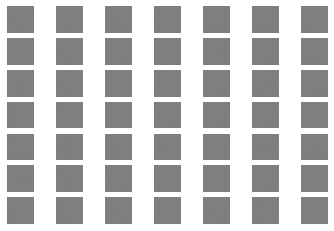

In [15]:
# Tamanho do espaço latente
latent_dim = 100

# Criando o modelo gerador
generator_model = define_generator(latent_dim)

# Gerando as imagens
n_samples = 49
x, _ = generate_fake_samples(generator_model, latent_dim, n_samples)

# Normalizando os valores dos pixels de [-1, 1] para [0, 1] para o plot
x = (x + 1) / 2.0

# Plotando as imagens geradas
for i in range(n_samples):
    # Definindo os subplots
    plt.subplot(7, 7, 1 + i)
    
    # Tirando os labels dos eixos
    plt.axis('off')
    
    # Plotando uma imagem
    plt.imshow(x[i])
    
# Mostrando as imagens.
plt.show()


# Como o modelo ainda não está treinado, as imagens serão apenas pontos aleatórios no espaço latente.

# Parte 3: Treinando o modelo gerador
Para finalizar, vamos treinar o modelo gerador para que ele não gere apenas ruído aleatório.

## Explicação do treinamento de uma GAN

Um modelo GAN é basicamente um modelo que "empilha" as redes geradora e discriminante, de forma que a rede geradora recebe pontos aleatórios no espaço latente como input e gera amostras que são diretamente recebidas pelo modelo discriminante e classificadas. Então, o output do modelo discriminante pode ser usado para atualizar os pesos do
modelo gerador. 

A partir do momento que os pesos do modelo gerador são atualizados, o processo se reinicia, e as imagens produzidas pela rede geradora vão "melhorando".

A rede discriminante se preocupa em diferenciar amostras reais e fake. Treinamos esse modelo separadamente (como fizemos na parte 1).

Sobre o modelo gerador, a sua preocupação é com a performance do modelo discriminante em exemplos fake. Para treinarmos 
a GAN como um todo, atualizamos apenas os parâmetros do modelo gerador e congelamos os parâmetros do modelo discriminante: assim, evitamos de alterar os parâmetros do modelo discriminante com imagens fake.

Obs.: ao treinar uma GAN, queremos que o modelo discriminante pense que as amostras fake geradas as pela rede discriminante são reais. Por isso na função "generate_fake_samples", atribuímos o label 1 para a imagem fake gerada pela rede geradora.

Por que fazemos isso?

Provavelmente, a rede geradora classificará a imagem fake como "não real" (0), ou com uma baixa probabilidade de ser real. O processo de backpropagation usado para atualizar os parâmetros da rede geradora considerará isso como um erro, atualizando assim os pesos do modelo gerador com o objetivo de corrigir esse suposto erro.

Isso faz com que a rede geradora fique cada vez melhor em gerar imagens fake (as imagens geradas ficam cada vez mais parecidas com a realidade).

A função "define_gan" abaixo serve basicamente para criar um modelo combinado com o modelo gerador e o modelo discriminante.

In [16]:
# Definindo o modelo combinado (Gerador + discriminante), para atualização dos parametros do gerador
def define_gan(generator_model, discriminator_model):
    discriminator_model.trainable = False # Os pesos atualizados são somente os da rede geradora
    
    # Conectando os modelos
    model = Sequential()
    
    # Parte 1: Gerador
    model.add(generator_model)
    
    # Parte 2: Discriminante
    model.add(discriminator_model)
    
    # Compilando o modelo
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt) # Classificação binária: Imagem é falsa ou verdadeira
    
    return model

In [17]:
# Criando o modelo combinado (Gerador + Discriminante)
gan_model = define_gan(generator_model, discriminator_model)

gan_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_1 (Sequential)    (None, 32, 32, 3)         1466115   
_________________________________________________________________
sequential (Sequential)      (None, 1)                 522497    
Total params: 1,988,612
Trainable params: 1,466,115
Non-trainable params: 522,497
_________________________________________________________________


In [18]:
# # Criando uma função para resumir a performance do modelo

# # Avaliando o discriminante, plotando as imagens geradas, salvando o modelo gerador
# def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=150):
#     # Preparando as amostras reais
#     x_real, y_real = generate_real_samples(dataset, n_samples)
    
#     # Avaliando o discriminante nas amostras reais
#     _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    
#     # Preparando os exemplos fake
#     x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    
#     # Avaliando o discriminante nos exemplos fake
#     _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    
#     # Resumindo a performance do discriminante
#     print('> Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))

In [19]:
# Treinando as duas redes: Geradora e discriminante
def train(generator_model, discriminator_model, gan_model, dataset, latent_dim, n_epochs=500, n_batch=64):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    
    
    # Numerando as epochs manualmente
    for i in range(n_epochs):
        
        # Enumerando os batches sobre todos os dados de treinamento
        for j in range(bat_per_epo):


            ##### PARTE 1 - REDE DISCRIMINANTE #####

            # Selecionando samples reais aleatoriamente
            x_real, y_real = generate_real_samples(dataset, half_batch)

            # Atualizando os pesos do modelo discriminante
            discriminator_loss_real, _ = discriminator_model.train_on_batch(x_real, y_real)

            # Gerando os exemplos 'fake'
            x_fake, y_fake = generate_fake_samples(generator_model, latent_dim, half_batch)

            # Atualizando os pesos do modelo discriminante
            discriminator_loss_fake, _ = discriminator_model.train_on_batch(x_fake, y_fake)


            
            ##### PARTE 2 - REDE GERADORA #####

            # Preparando os pontos no espaço latente como input para a rede geradora
            x_gan = generate_latent_points(latent_dim, n_batch)

            # Criando labels 'falsos' para as imagens geradas (dizendo que elas são reais)
            y_gan = np.ones((n_batch, 1))

            # Atualizando os pesos da geradora através do erro da discriminante
            generator_loss = gan_model.train_on_batch(x_gan, y_gan)

            # Loss na batch específica
            print('-> Epoch %d, Batch numero %d/%d -> Disc. loss on real images: %.5f, Disc. loss on fake images: %.5f, Generator loss: %.5f' %
            (i+1, j+1, bat_per_epo, discriminator_loss_real, discriminator_loss_fake, generator_loss))    
            
            
        # Mostrando uma imagem a cada epoch para verificar se a geradora está melhorando    
        z_noise = np.random.normal(0, 1, size=(n_batch, latent_dim))
        gen_images = generator_model.predict_on_batch(z_noise)
        gen_images = (gen_images + 1) / 2.0

        print("")
        print("---------- Image from epoch", i, " ----------")
        plt.imshow(gen_images[0])
        plt.show()
        
        # Removendo a imagem para não armazenar nesse array todas as imagens geradas
        gen_images = np.delete(gen_images, 0) # O parâmetro '0' é o index do item que quero deletar

                
        # Avaliando a performance do modelo de vez em quando
        #if (i+1) % 10 == 0:
            #summarize_performance(i, generator_model, discriminator_model, dataset, latent_dim)

-> Epoch 1, Batch numero 1/78 -> Disc. loss on real images: 0.69680, Disc. loss on fake images: 0.69537, Generator loss: 0.69153
-> Epoch 1, Batch numero 2/78 -> Disc. loss on real images: 0.61901, Disc. loss on fake images: 0.69807, Generator loss: 0.68905
-> Epoch 1, Batch numero 3/78 -> Disc. loss on real images: 0.56157, Disc. loss on fake images: 0.70419, Generator loss: 0.68301
-> Epoch 1, Batch numero 4/78 -> Disc. loss on real images: 0.48402, Disc. loss on fake images: 0.71867, Generator loss: 0.67044
-> Epoch 1, Batch numero 5/78 -> Disc. loss on real images: 0.37663, Disc. loss on fake images: 0.75016, Generator loss: 0.64690
-> Epoch 1, Batch numero 6/78 -> Disc. loss on real images: 0.26813, Disc. loss on fake images: 0.80028, Generator loss: 0.62133
-> Epoch 1, Batch numero 7/78 -> Disc. loss on real images: 0.21443, Disc. loss on fake images: 0.84939, Generator loss: 0.61452
-> Epoch 1, Batch numero 8/78 -> Disc. loss on real images: 0.14398, Disc. loss on fake images: 0

-> Epoch 1, Batch numero 65/78 -> Disc. loss on real images: 0.17315, Disc. loss on fake images: 0.08589, Generator loss: 3.17799
-> Epoch 1, Batch numero 66/78 -> Disc. loss on real images: 0.09733, Disc. loss on fake images: 0.12867, Generator loss: 2.95287
-> Epoch 1, Batch numero 67/78 -> Disc. loss on real images: 0.07994, Disc. loss on fake images: 0.08744, Generator loss: 3.09983
-> Epoch 1, Batch numero 68/78 -> Disc. loss on real images: 0.17127, Disc. loss on fake images: 0.08912, Generator loss: 3.01199
-> Epoch 1, Batch numero 69/78 -> Disc. loss on real images: 0.25597, Disc. loss on fake images: 0.12380, Generator loss: 2.94143
-> Epoch 1, Batch numero 70/78 -> Disc. loss on real images: 0.09551, Disc. loss on fake images: 0.10916, Generator loss: 3.22287
-> Epoch 1, Batch numero 71/78 -> Disc. loss on real images: 0.20791, Disc. loss on fake images: 0.07841, Generator loss: 3.46145
-> Epoch 1, Batch numero 72/78 -> Disc. loss on real images: 0.06888, Disc. loss on fake i

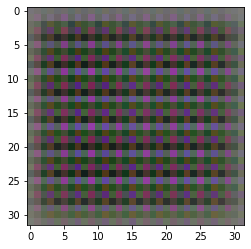

-> Epoch 2, Batch numero 1/78 -> Disc. loss on real images: 0.27183, Disc. loss on fake images: 0.06734, Generator loss: 3.53472
-> Epoch 2, Batch numero 2/78 -> Disc. loss on real images: 0.36078, Disc. loss on fake images: 0.45164, Generator loss: 4.66935
-> Epoch 2, Batch numero 3/78 -> Disc. loss on real images: 0.40985, Disc. loss on fake images: 0.01397, Generator loss: 4.73956
-> Epoch 2, Batch numero 4/78 -> Disc. loss on real images: 0.37984, Disc. loss on fake images: 0.03678, Generator loss: 3.47234
-> Epoch 2, Batch numero 5/78 -> Disc. loss on real images: 0.10159, Disc. loss on fake images: 0.10742, Generator loss: 3.75647
-> Epoch 2, Batch numero 6/78 -> Disc. loss on real images: 0.14934, Disc. loss on fake images: 0.04037, Generator loss: 4.06982
-> Epoch 2, Batch numero 7/78 -> Disc. loss on real images: 0.03072, Disc. loss on fake images: 0.05415, Generator loss: 4.70437
-> Epoch 2, Batch numero 8/78 -> Disc. loss on real images: 0.11674, Disc. loss on fake images: 0

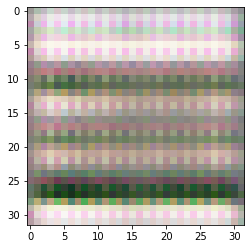

-> Epoch 3, Batch numero 1/78 -> Disc. loss on real images: 0.25036, Disc. loss on fake images: 0.37640, Generator loss: 3.71579
-> Epoch 3, Batch numero 2/78 -> Disc. loss on real images: 0.09428, Disc. loss on fake images: 0.02275, Generator loss: 4.71176
-> Epoch 3, Batch numero 3/78 -> Disc. loss on real images: 0.32296, Disc. loss on fake images: 0.07467, Generator loss: 3.25563
-> Epoch 3, Batch numero 4/78 -> Disc. loss on real images: 0.19244, Disc. loss on fake images: 0.32294, Generator loss: 3.96444
-> Epoch 3, Batch numero 5/78 -> Disc. loss on real images: 0.19594, Disc. loss on fake images: 0.06450, Generator loss: 4.03811
-> Epoch 3, Batch numero 6/78 -> Disc. loss on real images: 0.27821, Disc. loss on fake images: 0.75688, Generator loss: 5.51289
-> Epoch 3, Batch numero 7/78 -> Disc. loss on real images: 0.54784, Disc. loss on fake images: 0.10180, Generator loss: 4.47766
-> Epoch 3, Batch numero 8/78 -> Disc. loss on real images: 0.43458, Disc. loss on fake images: 1

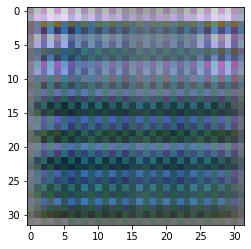

-> Epoch 4, Batch numero 1/78 -> Disc. loss on real images: 0.49569, Disc. loss on fake images: 0.35797, Generator loss: 3.27236
-> Epoch 4, Batch numero 2/78 -> Disc. loss on real images: 0.31502, Disc. loss on fake images: 0.45347, Generator loss: 3.55346
-> Epoch 4, Batch numero 3/78 -> Disc. loss on real images: 0.24068, Disc. loss on fake images: 0.14262, Generator loss: 3.23781
-> Epoch 4, Batch numero 4/78 -> Disc. loss on real images: 0.27235, Disc. loss on fake images: 0.18012, Generator loss: 3.08862
-> Epoch 4, Batch numero 5/78 -> Disc. loss on real images: 0.20376, Disc. loss on fake images: 0.19657, Generator loss: 2.65802
-> Epoch 4, Batch numero 6/78 -> Disc. loss on real images: 0.14999, Disc. loss on fake images: 0.29223, Generator loss: 2.76310
-> Epoch 4, Batch numero 7/78 -> Disc. loss on real images: 0.13031, Disc. loss on fake images: 0.30566, Generator loss: 3.12412
-> Epoch 4, Batch numero 8/78 -> Disc. loss on real images: 0.19479, Disc. loss on fake images: 0

-> Epoch 4, Batch numero 66/78 -> Disc. loss on real images: 0.24532, Disc. loss on fake images: 0.21448, Generator loss: 2.70499
-> Epoch 4, Batch numero 67/78 -> Disc. loss on real images: 0.70611, Disc. loss on fake images: 0.39489, Generator loss: 2.14883
-> Epoch 4, Batch numero 68/78 -> Disc. loss on real images: 0.31535, Disc. loss on fake images: 0.51128, Generator loss: 2.40131
-> Epoch 4, Batch numero 69/78 -> Disc. loss on real images: 0.37856, Disc. loss on fake images: 0.43562, Generator loss: 1.85978
-> Epoch 4, Batch numero 70/78 -> Disc. loss on real images: 0.88088, Disc. loss on fake images: 0.68208, Generator loss: 1.33161
-> Epoch 4, Batch numero 71/78 -> Disc. loss on real images: 0.36555, Disc. loss on fake images: 0.69384, Generator loss: 1.61990
-> Epoch 4, Batch numero 72/78 -> Disc. loss on real images: 0.69146, Disc. loss on fake images: 0.45640, Generator loss: 1.72584
-> Epoch 4, Batch numero 73/78 -> Disc. loss on real images: 0.41874, Disc. loss on fake i

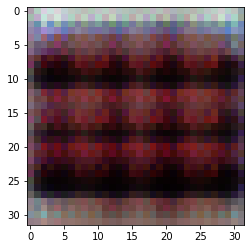

-> Epoch 5, Batch numero 1/78 -> Disc. loss on real images: 0.22468, Disc. loss on fake images: 0.20619, Generator loss: 2.03453
-> Epoch 5, Batch numero 2/78 -> Disc. loss on real images: 0.21305, Disc. loss on fake images: 0.18242, Generator loss: 2.14520
-> Epoch 5, Batch numero 3/78 -> Disc. loss on real images: 0.17259, Disc. loss on fake images: 0.16606, Generator loss: 2.30203
-> Epoch 5, Batch numero 4/78 -> Disc. loss on real images: 0.24624, Disc. loss on fake images: 0.16393, Generator loss: 2.27574
-> Epoch 5, Batch numero 5/78 -> Disc. loss on real images: 0.18852, Disc. loss on fake images: 0.14217, Generator loss: 2.43753
-> Epoch 5, Batch numero 6/78 -> Disc. loss on real images: 0.23234, Disc. loss on fake images: 0.13563, Generator loss: 2.38720
-> Epoch 5, Batch numero 7/78 -> Disc. loss on real images: 0.16208, Disc. loss on fake images: 0.13955, Generator loss: 2.67369
-> Epoch 5, Batch numero 8/78 -> Disc. loss on real images: 0.19676, Disc. loss on fake images: 0

-> Epoch 5, Batch numero 65/78 -> Disc. loss on real images: 1.13064, Disc. loss on fake images: 1.10776, Generator loss: 1.54330
-> Epoch 5, Batch numero 66/78 -> Disc. loss on real images: 0.80204, Disc. loss on fake images: 0.58913, Generator loss: 1.39235
-> Epoch 5, Batch numero 67/78 -> Disc. loss on real images: 0.84415, Disc. loss on fake images: 0.52412, Generator loss: 1.37902
-> Epoch 5, Batch numero 68/78 -> Disc. loss on real images: 0.82326, Disc. loss on fake images: 0.61852, Generator loss: 1.45003
-> Epoch 5, Batch numero 69/78 -> Disc. loss on real images: 0.70658, Disc. loss on fake images: 0.58957, Generator loss: 1.44335
-> Epoch 5, Batch numero 70/78 -> Disc. loss on real images: 0.75222, Disc. loss on fake images: 0.48566, Generator loss: 1.54341
-> Epoch 5, Batch numero 71/78 -> Disc. loss on real images: 0.73680, Disc. loss on fake images: 0.49595, Generator loss: 1.52475
-> Epoch 5, Batch numero 72/78 -> Disc. loss on real images: 0.67307, Disc. loss on fake i

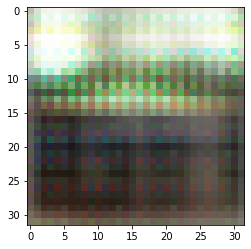

-> Epoch 6, Batch numero 1/78 -> Disc. loss on real images: 0.36486, Disc. loss on fake images: 0.22823, Generator loss: 2.24343
-> Epoch 6, Batch numero 2/78 -> Disc. loss on real images: 0.38898, Disc. loss on fake images: 0.27976, Generator loss: 2.31388
-> Epoch 6, Batch numero 3/78 -> Disc. loss on real images: 0.34893, Disc. loss on fake images: 0.25656, Generator loss: 2.41483
-> Epoch 6, Batch numero 4/78 -> Disc. loss on real images: 0.41728, Disc. loss on fake images: 0.20079, Generator loss: 2.23467
-> Epoch 6, Batch numero 5/78 -> Disc. loss on real images: 0.33655, Disc. loss on fake images: 0.34462, Generator loss: 2.22856
-> Epoch 6, Batch numero 6/78 -> Disc. loss on real images: 0.33904, Disc. loss on fake images: 0.20681, Generator loss: 2.31497
-> Epoch 6, Batch numero 7/78 -> Disc. loss on real images: 0.27201, Disc. loss on fake images: 0.25137, Generator loss: 2.77731
-> Epoch 6, Batch numero 8/78 -> Disc. loss on real images: 0.54577, Disc. loss on fake images: 0

-> Epoch 6, Batch numero 65/78 -> Disc. loss on real images: 0.45703, Disc. loss on fake images: 0.45767, Generator loss: 1.85370
-> Epoch 6, Batch numero 66/78 -> Disc. loss on real images: 0.51163, Disc. loss on fake images: 0.37600, Generator loss: 1.66829
-> Epoch 6, Batch numero 67/78 -> Disc. loss on real images: 0.47354, Disc. loss on fake images: 0.46352, Generator loss: 1.51244
-> Epoch 6, Batch numero 68/78 -> Disc. loss on real images: 0.36526, Disc. loss on fake images: 0.46441, Generator loss: 1.55013
-> Epoch 6, Batch numero 69/78 -> Disc. loss on real images: 0.64558, Disc. loss on fake images: 0.59925, Generator loss: 1.67554
-> Epoch 6, Batch numero 70/78 -> Disc. loss on real images: 0.45740, Disc. loss on fake images: 0.53890, Generator loss: 1.60661
-> Epoch 6, Batch numero 71/78 -> Disc. loss on real images: 0.37625, Disc. loss on fake images: 0.35989, Generator loss: 1.60470
-> Epoch 6, Batch numero 72/78 -> Disc. loss on real images: 0.71209, Disc. loss on fake i

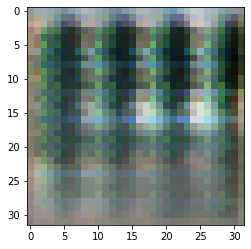

-> Epoch 7, Batch numero 1/78 -> Disc. loss on real images: 0.63723, Disc. loss on fake images: 0.50634, Generator loss: 1.74092
-> Epoch 7, Batch numero 2/78 -> Disc. loss on real images: 0.64325, Disc. loss on fake images: 0.55786, Generator loss: 1.67999
-> Epoch 7, Batch numero 3/78 -> Disc. loss on real images: 0.66493, Disc. loss on fake images: 0.53484, Generator loss: 1.36096
-> Epoch 7, Batch numero 4/78 -> Disc. loss on real images: 0.57242, Disc. loss on fake images: 0.61639, Generator loss: 1.46437
-> Epoch 7, Batch numero 5/78 -> Disc. loss on real images: 0.50361, Disc. loss on fake images: 0.54584, Generator loss: 1.68013
-> Epoch 7, Batch numero 6/78 -> Disc. loss on real images: 0.56519, Disc. loss on fake images: 0.47115, Generator loss: 1.59241
-> Epoch 7, Batch numero 7/78 -> Disc. loss on real images: 0.79752, Disc. loss on fake images: 0.51281, Generator loss: 1.40129
-> Epoch 7, Batch numero 8/78 -> Disc. loss on real images: 0.48798, Disc. loss on fake images: 0

-> Epoch 7, Batch numero 65/78 -> Disc. loss on real images: 0.43435, Disc. loss on fake images: 0.47973, Generator loss: 1.68705
-> Epoch 7, Batch numero 66/78 -> Disc. loss on real images: 0.45744, Disc. loss on fake images: 0.42365, Generator loss: 1.59046
-> Epoch 7, Batch numero 67/78 -> Disc. loss on real images: 0.61690, Disc. loss on fake images: 0.50693, Generator loss: 1.59551
-> Epoch 7, Batch numero 68/78 -> Disc. loss on real images: 0.41572, Disc. loss on fake images: 0.54491, Generator loss: 1.69354
-> Epoch 7, Batch numero 69/78 -> Disc. loss on real images: 0.40834, Disc. loss on fake images: 0.43526, Generator loss: 1.57448
-> Epoch 7, Batch numero 70/78 -> Disc. loss on real images: 0.45850, Disc. loss on fake images: 0.50077, Generator loss: 1.57277
-> Epoch 7, Batch numero 71/78 -> Disc. loss on real images: 0.45448, Disc. loss on fake images: 0.52936, Generator loss: 1.64458
-> Epoch 7, Batch numero 72/78 -> Disc. loss on real images: 0.34592, Disc. loss on fake i

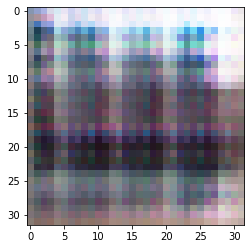

-> Epoch 8, Batch numero 1/78 -> Disc. loss on real images: 0.59860, Disc. loss on fake images: 0.54090, Generator loss: 1.30216
-> Epoch 8, Batch numero 2/78 -> Disc. loss on real images: 0.53087, Disc. loss on fake images: 0.68802, Generator loss: 1.29148
-> Epoch 8, Batch numero 3/78 -> Disc. loss on real images: 0.69218, Disc. loss on fake images: 0.56639, Generator loss: 1.23802
-> Epoch 8, Batch numero 4/78 -> Disc. loss on real images: 0.60679, Disc. loss on fake images: 0.57843, Generator loss: 1.22107
-> Epoch 8, Batch numero 5/78 -> Disc. loss on real images: 0.63948, Disc. loss on fake images: 0.63467, Generator loss: 1.20011
-> Epoch 8, Batch numero 6/78 -> Disc. loss on real images: 0.60974, Disc. loss on fake images: 0.69851, Generator loss: 1.42079
-> Epoch 8, Batch numero 7/78 -> Disc. loss on real images: 0.64382, Disc. loss on fake images: 0.42729, Generator loss: 1.48436
-> Epoch 8, Batch numero 8/78 -> Disc. loss on real images: 0.65206, Disc. loss on fake images: 0

-> Epoch 8, Batch numero 66/78 -> Disc. loss on real images: 0.71221, Disc. loss on fake images: 0.45931, Generator loss: 1.74136
-> Epoch 8, Batch numero 67/78 -> Disc. loss on real images: 0.72081, Disc. loss on fake images: 0.63784, Generator loss: 1.83006
-> Epoch 8, Batch numero 68/78 -> Disc. loss on real images: 0.47911, Disc. loss on fake images: 0.40625, Generator loss: 2.14980
-> Epoch 8, Batch numero 69/78 -> Disc. loss on real images: 0.56114, Disc. loss on fake images: 0.28096, Generator loss: 1.92963
-> Epoch 8, Batch numero 70/78 -> Disc. loss on real images: 0.44270, Disc. loss on fake images: 0.42156, Generator loss: 2.04186
-> Epoch 8, Batch numero 71/78 -> Disc. loss on real images: 0.32502, Disc. loss on fake images: 0.23745, Generator loss: 2.17648
-> Epoch 8, Batch numero 72/78 -> Disc. loss on real images: 0.60055, Disc. loss on fake images: 0.46668, Generator loss: 1.73669
-> Epoch 8, Batch numero 73/78 -> Disc. loss on real images: 0.28641, Disc. loss on fake i

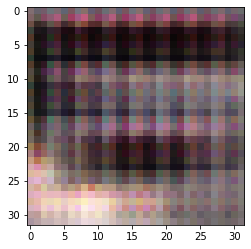

-> Epoch 9, Batch numero 1/78 -> Disc. loss on real images: 0.51677, Disc. loss on fake images: 0.35850, Generator loss: 1.64598
-> Epoch 9, Batch numero 2/78 -> Disc. loss on real images: 0.34166, Disc. loss on fake images: 0.44428, Generator loss: 1.88034
-> Epoch 9, Batch numero 3/78 -> Disc. loss on real images: 0.34504, Disc. loss on fake images: 0.42830, Generator loss: 2.18916
-> Epoch 9, Batch numero 4/78 -> Disc. loss on real images: 0.47174, Disc. loss on fake images: 0.45728, Generator loss: 1.96878
-> Epoch 9, Batch numero 5/78 -> Disc. loss on real images: 0.47336, Disc. loss on fake images: 0.51494, Generator loss: 2.40910
-> Epoch 9, Batch numero 6/78 -> Disc. loss on real images: 0.44124, Disc. loss on fake images: 0.26289, Generator loss: 2.32512
-> Epoch 9, Batch numero 7/78 -> Disc. loss on real images: 0.51059, Disc. loss on fake images: 0.45639, Generator loss: 2.28221
-> Epoch 9, Batch numero 8/78 -> Disc. loss on real images: 0.47945, Disc. loss on fake images: 0

-> Epoch 9, Batch numero 65/78 -> Disc. loss on real images: 0.70870, Disc. loss on fake images: 0.39080, Generator loss: 2.27531
-> Epoch 9, Batch numero 66/78 -> Disc. loss on real images: 0.71513, Disc. loss on fake images: 0.28528, Generator loss: 2.10642
-> Epoch 9, Batch numero 67/78 -> Disc. loss on real images: 0.45752, Disc. loss on fake images: 0.28260, Generator loss: 2.21475
-> Epoch 9, Batch numero 68/78 -> Disc. loss on real images: 0.32627, Disc. loss on fake images: 0.26145, Generator loss: 2.24248
-> Epoch 9, Batch numero 69/78 -> Disc. loss on real images: 0.37400, Disc. loss on fake images: 0.39867, Generator loss: 2.64253
-> Epoch 9, Batch numero 70/78 -> Disc. loss on real images: 0.56727, Disc. loss on fake images: 0.41338, Generator loss: 2.26230
-> Epoch 9, Batch numero 71/78 -> Disc. loss on real images: 0.66551, Disc. loss on fake images: 0.34571, Generator loss: 1.66253
-> Epoch 9, Batch numero 72/78 -> Disc. loss on real images: 0.92754, Disc. loss on fake i

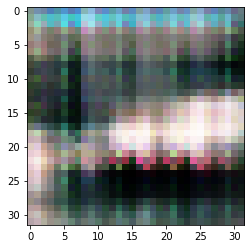

-> Epoch 10, Batch numero 1/78 -> Disc. loss on real images: 0.95130, Disc. loss on fake images: 0.68921, Generator loss: 1.43868
-> Epoch 10, Batch numero 2/78 -> Disc. loss on real images: 0.98311, Disc. loss on fake images: 0.71705, Generator loss: 1.33169
-> Epoch 10, Batch numero 3/78 -> Disc. loss on real images: 0.97806, Disc. loss on fake images: 0.45477, Generator loss: 1.46177
-> Epoch 10, Batch numero 4/78 -> Disc. loss on real images: 0.91859, Disc. loss on fake images: 0.55860, Generator loss: 1.34800
-> Epoch 10, Batch numero 5/78 -> Disc. loss on real images: 0.81506, Disc. loss on fake images: 0.65173, Generator loss: 1.41223
-> Epoch 10, Batch numero 6/78 -> Disc. loss on real images: 0.74219, Disc. loss on fake images: 0.45626, Generator loss: 1.49669
-> Epoch 10, Batch numero 7/78 -> Disc. loss on real images: 0.87899, Disc. loss on fake images: 0.45635, Generator loss: 1.43458
-> Epoch 10, Batch numero 8/78 -> Disc. loss on real images: 0.86261, Disc. loss on fake i

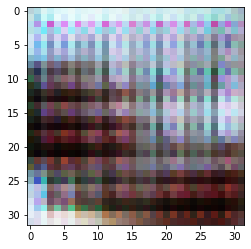

-> Epoch 11, Batch numero 1/78 -> Disc. loss on real images: 0.89424, Disc. loss on fake images: 0.73975, Generator loss: 1.53667
-> Epoch 11, Batch numero 2/78 -> Disc. loss on real images: 0.72962, Disc. loss on fake images: 0.50301, Generator loss: 1.65221
-> Epoch 11, Batch numero 3/78 -> Disc. loss on real images: 0.83643, Disc. loss on fake images: 0.45186, Generator loss: 1.72846
-> Epoch 11, Batch numero 4/78 -> Disc. loss on real images: 0.56140, Disc. loss on fake images: 0.29896, Generator loss: 1.88894
-> Epoch 11, Batch numero 5/78 -> Disc. loss on real images: 0.48645, Disc. loss on fake images: 0.33940, Generator loss: 2.08743
-> Epoch 11, Batch numero 6/78 -> Disc. loss on real images: 0.40707, Disc. loss on fake images: 0.29701, Generator loss: 2.27182
-> Epoch 11, Batch numero 7/78 -> Disc. loss on real images: 0.29503, Disc. loss on fake images: 0.18397, Generator loss: 2.22655
-> Epoch 11, Batch numero 8/78 -> Disc. loss on real images: 0.25971, Disc. loss on fake i

-> Epoch 11, Batch numero 64/78 -> Disc. loss on real images: 0.41357, Disc. loss on fake images: 0.44116, Generator loss: 1.80602
-> Epoch 11, Batch numero 65/78 -> Disc. loss on real images: 0.47877, Disc. loss on fake images: 0.37874, Generator loss: 1.65328
-> Epoch 11, Batch numero 66/78 -> Disc. loss on real images: 0.58569, Disc. loss on fake images: 0.49647, Generator loss: 1.60024
-> Epoch 11, Batch numero 67/78 -> Disc. loss on real images: 0.50121, Disc. loss on fake images: 0.48518, Generator loss: 1.61120
-> Epoch 11, Batch numero 68/78 -> Disc. loss on real images: 0.57736, Disc. loss on fake images: 0.53582, Generator loss: 1.47572
-> Epoch 11, Batch numero 69/78 -> Disc. loss on real images: 0.67014, Disc. loss on fake images: 0.59160, Generator loss: 1.43686
-> Epoch 11, Batch numero 70/78 -> Disc. loss on real images: 0.46442, Disc. loss on fake images: 0.59068, Generator loss: 1.67471
-> Epoch 11, Batch numero 71/78 -> Disc. loss on real images: 0.42433, Disc. loss o

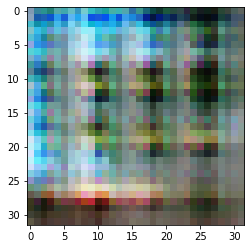

-> Epoch 12, Batch numero 1/78 -> Disc. loss on real images: 0.70890, Disc. loss on fake images: 0.75397, Generator loss: 1.59180
-> Epoch 12, Batch numero 2/78 -> Disc. loss on real images: 0.74406, Disc. loss on fake images: 0.63140, Generator loss: 1.72178
-> Epoch 12, Batch numero 3/78 -> Disc. loss on real images: 0.84741, Disc. loss on fake images: 0.61982, Generator loss: 1.46184
-> Epoch 12, Batch numero 4/78 -> Disc. loss on real images: 0.64853, Disc. loss on fake images: 0.70450, Generator loss: 1.48607
-> Epoch 12, Batch numero 5/78 -> Disc. loss on real images: 0.44280, Disc. loss on fake images: 0.50950, Generator loss: 1.60454
-> Epoch 12, Batch numero 6/78 -> Disc. loss on real images: 0.79564, Disc. loss on fake images: 0.60186, Generator loss: 1.63080
-> Epoch 12, Batch numero 7/78 -> Disc. loss on real images: 0.75292, Disc. loss on fake images: 0.52355, Generator loss: 1.59575
-> Epoch 12, Batch numero 8/78 -> Disc. loss on real images: 0.54726, Disc. loss on fake i

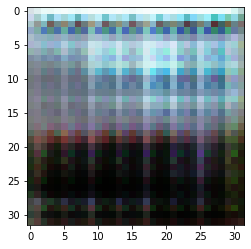

-> Epoch 13, Batch numero 1/78 -> Disc. loss on real images: 0.43052, Disc. loss on fake images: 0.47002, Generator loss: 1.57356
-> Epoch 13, Batch numero 2/78 -> Disc. loss on real images: 0.38706, Disc. loss on fake images: 0.35673, Generator loss: 1.60558
-> Epoch 13, Batch numero 3/78 -> Disc. loss on real images: 0.35354, Disc. loss on fake images: 0.48012, Generator loss: 1.59513
-> Epoch 13, Batch numero 4/78 -> Disc. loss on real images: 0.49167, Disc. loss on fake images: 0.47483, Generator loss: 1.48594
-> Epoch 13, Batch numero 5/78 -> Disc. loss on real images: 0.38730, Disc. loss on fake images: 0.55171, Generator loss: 1.58416
-> Epoch 13, Batch numero 6/78 -> Disc. loss on real images: 0.60364, Disc. loss on fake images: 0.52761, Generator loss: 1.37060
-> Epoch 13, Batch numero 7/78 -> Disc. loss on real images: 0.44584, Disc. loss on fake images: 0.71586, Generator loss: 1.21824
-> Epoch 13, Batch numero 8/78 -> Disc. loss on real images: 0.54936, Disc. loss on fake i

-> Epoch 13, Batch numero 65/78 -> Disc. loss on real images: 0.53968, Disc. loss on fake images: 0.40751, Generator loss: 1.62255
-> Epoch 13, Batch numero 66/78 -> Disc. loss on real images: 0.22118, Disc. loss on fake images: 0.48958, Generator loss: 1.77346
-> Epoch 13, Batch numero 67/78 -> Disc. loss on real images: 0.41203, Disc. loss on fake images: 0.36619, Generator loss: 1.76884
-> Epoch 13, Batch numero 68/78 -> Disc. loss on real images: 0.51434, Disc. loss on fake images: 0.36523, Generator loss: 1.54220
-> Epoch 13, Batch numero 69/78 -> Disc. loss on real images: 0.50041, Disc. loss on fake images: 0.41378, Generator loss: 1.44878
-> Epoch 13, Batch numero 70/78 -> Disc. loss on real images: 0.26790, Disc. loss on fake images: 0.51531, Generator loss: 1.31355
-> Epoch 13, Batch numero 71/78 -> Disc. loss on real images: 0.46818, Disc. loss on fake images: 0.66379, Generator loss: 1.36311
-> Epoch 13, Batch numero 72/78 -> Disc. loss on real images: 0.55047, Disc. loss o

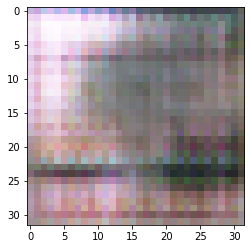

-> Epoch 14, Batch numero 1/78 -> Disc. loss on real images: 0.60893, Disc. loss on fake images: 0.75914, Generator loss: 1.32493
-> Epoch 14, Batch numero 2/78 -> Disc. loss on real images: 0.43866, Disc. loss on fake images: 0.55253, Generator loss: 1.40354
-> Epoch 14, Batch numero 3/78 -> Disc. loss on real images: 0.60910, Disc. loss on fake images: 0.60099, Generator loss: 1.51468
-> Epoch 14, Batch numero 4/78 -> Disc. loss on real images: 0.59975, Disc. loss on fake images: 0.55369, Generator loss: 1.37222
-> Epoch 14, Batch numero 5/78 -> Disc. loss on real images: 0.57130, Disc. loss on fake images: 0.66693, Generator loss: 1.44390
-> Epoch 14, Batch numero 6/78 -> Disc. loss on real images: 0.72482, Disc. loss on fake images: 0.67181, Generator loss: 1.55923
-> Epoch 14, Batch numero 7/78 -> Disc. loss on real images: 0.68639, Disc. loss on fake images: 0.44092, Generator loss: 1.55719
-> Epoch 14, Batch numero 8/78 -> Disc. loss on real images: 0.70532, Disc. loss on fake i

-> Epoch 14, Batch numero 65/78 -> Disc. loss on real images: 0.63967, Disc. loss on fake images: 0.61978, Generator loss: 1.75977
-> Epoch 14, Batch numero 66/78 -> Disc. loss on real images: 0.74360, Disc. loss on fake images: 0.77938, Generator loss: 1.68279
-> Epoch 14, Batch numero 67/78 -> Disc. loss on real images: 0.80101, Disc. loss on fake images: 0.56678, Generator loss: 1.44335
-> Epoch 14, Batch numero 68/78 -> Disc. loss on real images: 0.79204, Disc. loss on fake images: 0.80628, Generator loss: 1.73859
-> Epoch 14, Batch numero 69/78 -> Disc. loss on real images: 0.78096, Disc. loss on fake images: 0.52254, Generator loss: 2.13612
-> Epoch 14, Batch numero 70/78 -> Disc. loss on real images: 0.85670, Disc. loss on fake images: 0.43217, Generator loss: 2.14464
-> Epoch 14, Batch numero 71/78 -> Disc. loss on real images: 0.60322, Disc. loss on fake images: 0.56287, Generator loss: 1.74260
-> Epoch 14, Batch numero 72/78 -> Disc. loss on real images: 0.48735, Disc. loss o

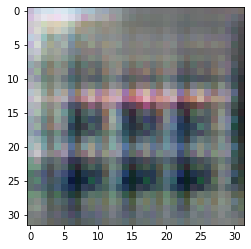

-> Epoch 15, Batch numero 1/78 -> Disc. loss on real images: 0.38350, Disc. loss on fake images: 0.43490, Generator loss: 1.55050
-> Epoch 15, Batch numero 2/78 -> Disc. loss on real images: 0.48974, Disc. loss on fake images: 0.45522, Generator loss: 1.72879
-> Epoch 15, Batch numero 3/78 -> Disc. loss on real images: 0.63210, Disc. loss on fake images: 0.50236, Generator loss: 1.79708
-> Epoch 15, Batch numero 4/78 -> Disc. loss on real images: 0.46387, Disc. loss on fake images: 0.48644, Generator loss: 1.55821
-> Epoch 15, Batch numero 5/78 -> Disc. loss on real images: 0.44915, Disc. loss on fake images: 0.51216, Generator loss: 1.60977
-> Epoch 15, Batch numero 6/78 -> Disc. loss on real images: 0.40607, Disc. loss on fake images: 0.43711, Generator loss: 1.63522
-> Epoch 15, Batch numero 7/78 -> Disc. loss on real images: 0.52072, Disc. loss on fake images: 0.50432, Generator loss: 1.66919
-> Epoch 15, Batch numero 8/78 -> Disc. loss on real images: 0.63763, Disc. loss on fake i

-> Epoch 15, Batch numero 65/78 -> Disc. loss on real images: 0.62660, Disc. loss on fake images: 0.59364, Generator loss: 1.51905
-> Epoch 15, Batch numero 66/78 -> Disc. loss on real images: 0.70218, Disc. loss on fake images: 0.67233, Generator loss: 1.56272
-> Epoch 15, Batch numero 67/78 -> Disc. loss on real images: 0.39839, Disc. loss on fake images: 0.34485, Generator loss: 1.63423
-> Epoch 15, Batch numero 68/78 -> Disc. loss on real images: 0.42338, Disc. loss on fake images: 0.44775, Generator loss: 1.69072
-> Epoch 15, Batch numero 69/78 -> Disc. loss on real images: 0.65090, Disc. loss on fake images: 0.67431, Generator loss: 1.64115
-> Epoch 15, Batch numero 70/78 -> Disc. loss on real images: 0.46610, Disc. loss on fake images: 0.40657, Generator loss: 1.69816
-> Epoch 15, Batch numero 71/78 -> Disc. loss on real images: 0.73065, Disc. loss on fake images: 0.63852, Generator loss: 1.47938
-> Epoch 15, Batch numero 72/78 -> Disc. loss on real images: 0.61085, Disc. loss o

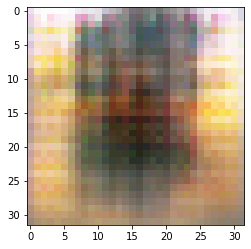

-> Epoch 16, Batch numero 1/78 -> Disc. loss on real images: 0.70675, Disc. loss on fake images: 0.62448, Generator loss: 1.54402
-> Epoch 16, Batch numero 2/78 -> Disc. loss on real images: 0.65865, Disc. loss on fake images: 0.63391, Generator loss: 1.77803
-> Epoch 16, Batch numero 3/78 -> Disc. loss on real images: 0.66809, Disc. loss on fake images: 0.42038, Generator loss: 1.78947
-> Epoch 16, Batch numero 4/78 -> Disc. loss on real images: 0.64216, Disc. loss on fake images: 0.58658, Generator loss: 1.92958
-> Epoch 16, Batch numero 5/78 -> Disc. loss on real images: 0.84914, Disc. loss on fake images: 0.48713, Generator loss: 1.59735
-> Epoch 16, Batch numero 6/78 -> Disc. loss on real images: 0.73978, Disc. loss on fake images: 0.73135, Generator loss: 1.75473
-> Epoch 16, Batch numero 7/78 -> Disc. loss on real images: 0.85559, Disc. loss on fake images: 0.52115, Generator loss: 1.90414
-> Epoch 16, Batch numero 8/78 -> Disc. loss on real images: 0.61127, Disc. loss on fake i

-> Epoch 16, Batch numero 65/78 -> Disc. loss on real images: 0.62441, Disc. loss on fake images: 0.35007, Generator loss: 1.68629
-> Epoch 16, Batch numero 66/78 -> Disc. loss on real images: 0.62807, Disc. loss on fake images: 0.46269, Generator loss: 1.43407
-> Epoch 16, Batch numero 67/78 -> Disc. loss on real images: 0.51120, Disc. loss on fake images: 0.52907, Generator loss: 1.38427
-> Epoch 16, Batch numero 68/78 -> Disc. loss on real images: 0.51750, Disc. loss on fake images: 0.65080, Generator loss: 1.64785
-> Epoch 16, Batch numero 69/78 -> Disc. loss on real images: 0.58587, Disc. loss on fake images: 0.44841, Generator loss: 1.74108
-> Epoch 16, Batch numero 70/78 -> Disc. loss on real images: 0.79691, Disc. loss on fake images: 0.48227, Generator loss: 1.64478
-> Epoch 16, Batch numero 71/78 -> Disc. loss on real images: 0.67025, Disc. loss on fake images: 0.48323, Generator loss: 1.62332
-> Epoch 16, Batch numero 72/78 -> Disc. loss on real images: 0.71158, Disc. loss o

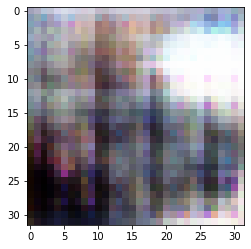

-> Epoch 17, Batch numero 1/78 -> Disc. loss on real images: 0.51367, Disc. loss on fake images: 0.52578, Generator loss: 1.74376
-> Epoch 17, Batch numero 2/78 -> Disc. loss on real images: 0.60213, Disc. loss on fake images: 0.36870, Generator loss: 1.86199
-> Epoch 17, Batch numero 3/78 -> Disc. loss on real images: 0.55057, Disc. loss on fake images: 0.43091, Generator loss: 1.60713
-> Epoch 17, Batch numero 4/78 -> Disc. loss on real images: 0.39208, Disc. loss on fake images: 0.45362, Generator loss: 1.55442
-> Epoch 17, Batch numero 5/78 -> Disc. loss on real images: 0.51272, Disc. loss on fake images: 0.43056, Generator loss: 1.62517
-> Epoch 17, Batch numero 6/78 -> Disc. loss on real images: 0.52839, Disc. loss on fake images: 0.43682, Generator loss: 1.40996
-> Epoch 17, Batch numero 7/78 -> Disc. loss on real images: 0.58313, Disc. loss on fake images: 0.46057, Generator loss: 1.44267
-> Epoch 17, Batch numero 8/78 -> Disc. loss on real images: 0.45444, Disc. loss on fake i

-> Epoch 17, Batch numero 65/78 -> Disc. loss on real images: 0.98281, Disc. loss on fake images: 0.60269, Generator loss: 1.31542
-> Epoch 17, Batch numero 66/78 -> Disc. loss on real images: 0.69342, Disc. loss on fake images: 0.55848, Generator loss: 1.22473
-> Epoch 17, Batch numero 67/78 -> Disc. loss on real images: 0.69218, Disc. loss on fake images: 0.55436, Generator loss: 1.42194
-> Epoch 17, Batch numero 68/78 -> Disc. loss on real images: 0.70079, Disc. loss on fake images: 0.44848, Generator loss: 1.54195
-> Epoch 17, Batch numero 69/78 -> Disc. loss on real images: 0.79031, Disc. loss on fake images: 0.44125, Generator loss: 1.47670
-> Epoch 17, Batch numero 70/78 -> Disc. loss on real images: 0.59213, Disc. loss on fake images: 0.44269, Generator loss: 1.52877
-> Epoch 17, Batch numero 71/78 -> Disc. loss on real images: 0.62192, Disc. loss on fake images: 0.40465, Generator loss: 1.37909
-> Epoch 17, Batch numero 72/78 -> Disc. loss on real images: 0.68289, Disc. loss o

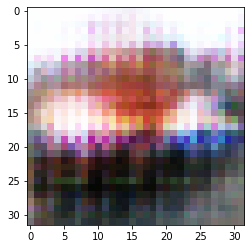

-> Epoch 18, Batch numero 1/78 -> Disc. loss on real images: 1.01990, Disc. loss on fake images: 0.66106, Generator loss: 1.25215
-> Epoch 18, Batch numero 2/78 -> Disc. loss on real images: 0.67103, Disc. loss on fake images: 0.50825, Generator loss: 1.16018
-> Epoch 18, Batch numero 3/78 -> Disc. loss on real images: 0.65591, Disc. loss on fake images: 0.56061, Generator loss: 1.30289
-> Epoch 18, Batch numero 4/78 -> Disc. loss on real images: 0.49267, Disc. loss on fake images: 0.60113, Generator loss: 1.30742
-> Epoch 18, Batch numero 5/78 -> Disc. loss on real images: 0.67639, Disc. loss on fake images: 0.55171, Generator loss: 1.24091
-> Epoch 18, Batch numero 6/78 -> Disc. loss on real images: 0.57515, Disc. loss on fake images: 0.52940, Generator loss: 1.12898
-> Epoch 18, Batch numero 7/78 -> Disc. loss on real images: 0.51407, Disc. loss on fake images: 0.65648, Generator loss: 1.17983
-> Epoch 18, Batch numero 8/78 -> Disc. loss on real images: 0.52257, Disc. loss on fake i

-> Epoch 18, Batch numero 64/78 -> Disc. loss on real images: 0.49644, Disc. loss on fake images: 0.60561, Generator loss: 1.47985
-> Epoch 18, Batch numero 65/78 -> Disc. loss on real images: 0.65003, Disc. loss on fake images: 0.71257, Generator loss: 1.48574
-> Epoch 18, Batch numero 66/78 -> Disc. loss on real images: 0.66350, Disc. loss on fake images: 0.68673, Generator loss: 1.60102
-> Epoch 18, Batch numero 67/78 -> Disc. loss on real images: 0.81582, Disc. loss on fake images: 0.73682, Generator loss: 1.83261
-> Epoch 18, Batch numero 68/78 -> Disc. loss on real images: 0.67884, Disc. loss on fake images: 0.47661, Generator loss: 1.82417
-> Epoch 18, Batch numero 69/78 -> Disc. loss on real images: 0.83807, Disc. loss on fake images: 0.47318, Generator loss: 1.51567
-> Epoch 18, Batch numero 70/78 -> Disc. loss on real images: 0.81081, Disc. loss on fake images: 0.66099, Generator loss: 1.61329
-> Epoch 18, Batch numero 71/78 -> Disc. loss on real images: 0.70627, Disc. loss o

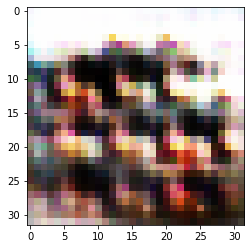

-> Epoch 19, Batch numero 1/78 -> Disc. loss on real images: 0.57789, Disc. loss on fake images: 0.49996, Generator loss: 1.79941
-> Epoch 19, Batch numero 2/78 -> Disc. loss on real images: 0.55567, Disc. loss on fake images: 0.40888, Generator loss: 1.88955
-> Epoch 19, Batch numero 3/78 -> Disc. loss on real images: 0.45224, Disc. loss on fake images: 0.34089, Generator loss: 1.54818
-> Epoch 19, Batch numero 4/78 -> Disc. loss on real images: 0.56016, Disc. loss on fake images: 0.60253, Generator loss: 1.71575
-> Epoch 19, Batch numero 5/78 -> Disc. loss on real images: 0.53833, Disc. loss on fake images: 0.38926, Generator loss: 1.65377
-> Epoch 19, Batch numero 6/78 -> Disc. loss on real images: 0.65862, Disc. loss on fake images: 0.38702, Generator loss: 1.45599
-> Epoch 19, Batch numero 7/78 -> Disc. loss on real images: 0.50746, Disc. loss on fake images: 0.49400, Generator loss: 1.43344
-> Epoch 19, Batch numero 8/78 -> Disc. loss on real images: 0.65844, Disc. loss on fake i

-> Epoch 19, Batch numero 64/78 -> Disc. loss on real images: 0.60706, Disc. loss on fake images: 0.44464, Generator loss: 1.49941
-> Epoch 19, Batch numero 65/78 -> Disc. loss on real images: 0.48386, Disc. loss on fake images: 0.47378, Generator loss: 1.47436
-> Epoch 19, Batch numero 66/78 -> Disc. loss on real images: 0.51162, Disc. loss on fake images: 0.39208, Generator loss: 1.51866
-> Epoch 19, Batch numero 67/78 -> Disc. loss on real images: 0.53634, Disc. loss on fake images: 0.41231, Generator loss: 1.41775
-> Epoch 19, Batch numero 68/78 -> Disc. loss on real images: 0.56333, Disc. loss on fake images: 0.54429, Generator loss: 1.46720
-> Epoch 19, Batch numero 69/78 -> Disc. loss on real images: 0.54792, Disc. loss on fake images: 0.46216, Generator loss: 1.48669
-> Epoch 19, Batch numero 70/78 -> Disc. loss on real images: 0.40036, Disc. loss on fake images: 0.53648, Generator loss: 1.40796
-> Epoch 19, Batch numero 71/78 -> Disc. loss on real images: 0.59152, Disc. loss o

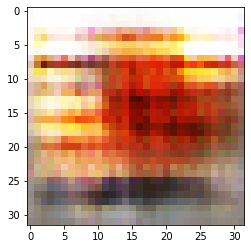

-> Epoch 20, Batch numero 1/78 -> Disc. loss on real images: 0.52028, Disc. loss on fake images: 0.48926, Generator loss: 1.46083
-> Epoch 20, Batch numero 2/78 -> Disc. loss on real images: 0.55927, Disc. loss on fake images: 0.53185, Generator loss: 1.39278
-> Epoch 20, Batch numero 3/78 -> Disc. loss on real images: 0.48772, Disc. loss on fake images: 0.47602, Generator loss: 1.18850
-> Epoch 20, Batch numero 4/78 -> Disc. loss on real images: 0.41816, Disc. loss on fake images: 0.58966, Generator loss: 1.24268
-> Epoch 20, Batch numero 5/78 -> Disc. loss on real images: 0.43350, Disc. loss on fake images: 0.55212, Generator loss: 1.29487
-> Epoch 20, Batch numero 6/78 -> Disc. loss on real images: 0.58338, Disc. loss on fake images: 0.49865, Generator loss: 1.19896
-> Epoch 20, Batch numero 7/78 -> Disc. loss on real images: 0.58408, Disc. loss on fake images: 0.58246, Generator loss: 1.10208
-> Epoch 20, Batch numero 8/78 -> Disc. loss on real images: 0.54210, Disc. loss on fake i

-> Epoch 20, Batch numero 65/78 -> Disc. loss on real images: 0.96168, Disc. loss on fake images: 0.63146, Generator loss: 1.21360
-> Epoch 20, Batch numero 66/78 -> Disc. loss on real images: 0.59248, Disc. loss on fake images: 0.83086, Generator loss: 1.26819
-> Epoch 20, Batch numero 67/78 -> Disc. loss on real images: 0.66272, Disc. loss on fake images: 0.54577, Generator loss: 1.35191
-> Epoch 20, Batch numero 68/78 -> Disc. loss on real images: 0.77492, Disc. loss on fake images: 0.61313, Generator loss: 1.22009
-> Epoch 20, Batch numero 69/78 -> Disc. loss on real images: 0.77224, Disc. loss on fake images: 0.66386, Generator loss: 1.19440
-> Epoch 20, Batch numero 70/78 -> Disc. loss on real images: 0.68702, Disc. loss on fake images: 0.59231, Generator loss: 1.30111
-> Epoch 20, Batch numero 71/78 -> Disc. loss on real images: 0.59197, Disc. loss on fake images: 0.49187, Generator loss: 1.28145
-> Epoch 20, Batch numero 72/78 -> Disc. loss on real images: 0.60848, Disc. loss o

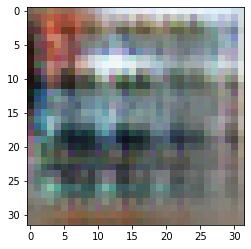

-> Epoch 21, Batch numero 1/78 -> Disc. loss on real images: 0.45381, Disc. loss on fake images: 0.43896, Generator loss: 1.32412
-> Epoch 21, Batch numero 2/78 -> Disc. loss on real images: 0.35912, Disc. loss on fake images: 0.52103, Generator loss: 1.46013
-> Epoch 21, Batch numero 3/78 -> Disc. loss on real images: 0.53460, Disc. loss on fake images: 0.59029, Generator loss: 1.47136
-> Epoch 21, Batch numero 4/78 -> Disc. loss on real images: 0.56679, Disc. loss on fake images: 0.49900, Generator loss: 1.59377
-> Epoch 21, Batch numero 5/78 -> Disc. loss on real images: 0.44509, Disc. loss on fake images: 0.63031, Generator loss: 1.77233
-> Epoch 21, Batch numero 6/78 -> Disc. loss on real images: 0.60040, Disc. loss on fake images: 0.46359, Generator loss: 1.67263
-> Epoch 21, Batch numero 7/78 -> Disc. loss on real images: 0.55269, Disc. loss on fake images: 0.44811, Generator loss: 1.55413
-> Epoch 21, Batch numero 8/78 -> Disc. loss on real images: 0.45459, Disc. loss on fake i

-> Epoch 21, Batch numero 65/78 -> Disc. loss on real images: 0.73927, Disc. loss on fake images: 0.50206, Generator loss: 1.42080
-> Epoch 21, Batch numero 66/78 -> Disc. loss on real images: 0.66654, Disc. loss on fake images: 0.53886, Generator loss: 1.34020
-> Epoch 21, Batch numero 67/78 -> Disc. loss on real images: 0.62131, Disc. loss on fake images: 0.70363, Generator loss: 1.39788
-> Epoch 21, Batch numero 68/78 -> Disc. loss on real images: 0.61423, Disc. loss on fake images: 0.59580, Generator loss: 1.48014
-> Epoch 21, Batch numero 69/78 -> Disc. loss on real images: 0.75449, Disc. loss on fake images: 0.64596, Generator loss: 1.37424
-> Epoch 21, Batch numero 70/78 -> Disc. loss on real images: 0.60616, Disc. loss on fake images: 0.55593, Generator loss: 1.47271
-> Epoch 21, Batch numero 71/78 -> Disc. loss on real images: 0.44017, Disc. loss on fake images: 0.45219, Generator loss: 1.56006
-> Epoch 21, Batch numero 72/78 -> Disc. loss on real images: 0.61157, Disc. loss o

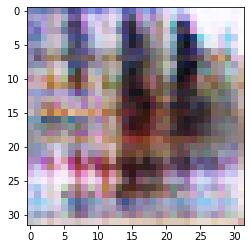

-> Epoch 22, Batch numero 1/78 -> Disc. loss on real images: 0.45978, Disc. loss on fake images: 0.55943, Generator loss: 1.75627
-> Epoch 22, Batch numero 2/78 -> Disc. loss on real images: 0.65867, Disc. loss on fake images: 0.40190, Generator loss: 1.81364
-> Epoch 22, Batch numero 3/78 -> Disc. loss on real images: 0.54583, Disc. loss on fake images: 0.44561, Generator loss: 1.80433
-> Epoch 22, Batch numero 4/78 -> Disc. loss on real images: 0.44050, Disc. loss on fake images: 0.37468, Generator loss: 1.82525
-> Epoch 22, Batch numero 5/78 -> Disc. loss on real images: 0.48099, Disc. loss on fake images: 0.34863, Generator loss: 1.89769
-> Epoch 22, Batch numero 6/78 -> Disc. loss on real images: 0.53670, Disc. loss on fake images: 0.41935, Generator loss: 1.99035
-> Epoch 22, Batch numero 7/78 -> Disc. loss on real images: 0.48713, Disc. loss on fake images: 0.28017, Generator loss: 1.81922
-> Epoch 22, Batch numero 8/78 -> Disc. loss on real images: 0.49486, Disc. loss on fake i

-> Epoch 22, Batch numero 64/78 -> Disc. loss on real images: 0.59661, Disc. loss on fake images: 0.44087, Generator loss: 1.41288
-> Epoch 22, Batch numero 65/78 -> Disc. loss on real images: 0.65548, Disc. loss on fake images: 0.50781, Generator loss: 1.40194
-> Epoch 22, Batch numero 66/78 -> Disc. loss on real images: 0.58665, Disc. loss on fake images: 0.58029, Generator loss: 1.33207
-> Epoch 22, Batch numero 67/78 -> Disc. loss on real images: 0.58371, Disc. loss on fake images: 0.48648, Generator loss: 1.45019
-> Epoch 22, Batch numero 68/78 -> Disc. loss on real images: 0.49635, Disc. loss on fake images: 0.47458, Generator loss: 1.55962
-> Epoch 22, Batch numero 69/78 -> Disc. loss on real images: 0.62893, Disc. loss on fake images: 0.39002, Generator loss: 1.67181
-> Epoch 22, Batch numero 70/78 -> Disc. loss on real images: 0.50864, Disc. loss on fake images: 0.34541, Generator loss: 1.68260
-> Epoch 22, Batch numero 71/78 -> Disc. loss on real images: 0.44112, Disc. loss o

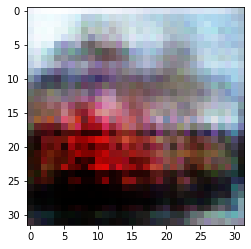

-> Epoch 23, Batch numero 1/78 -> Disc. loss on real images: 0.51670, Disc. loss on fake images: 0.40218, Generator loss: 1.58235
-> Epoch 23, Batch numero 2/78 -> Disc. loss on real images: 0.44748, Disc. loss on fake images: 0.41817, Generator loss: 1.54064
-> Epoch 23, Batch numero 3/78 -> Disc. loss on real images: 0.55798, Disc. loss on fake images: 0.47657, Generator loss: 1.58442
-> Epoch 23, Batch numero 4/78 -> Disc. loss on real images: 0.41370, Disc. loss on fake images: 0.57952, Generator loss: 1.49085
-> Epoch 23, Batch numero 5/78 -> Disc. loss on real images: 0.60099, Disc. loss on fake images: 0.54818, Generator loss: 1.56667
-> Epoch 23, Batch numero 6/78 -> Disc. loss on real images: 0.70374, Disc. loss on fake images: 0.62801, Generator loss: 1.41117
-> Epoch 23, Batch numero 7/78 -> Disc. loss on real images: 0.72356, Disc. loss on fake images: 0.69553, Generator loss: 1.26796
-> Epoch 23, Batch numero 8/78 -> Disc. loss on real images: 0.54078, Disc. loss on fake i

-> Epoch 23, Batch numero 64/78 -> Disc. loss on real images: 0.62033, Disc. loss on fake images: 0.64946, Generator loss: 1.52200
-> Epoch 23, Batch numero 65/78 -> Disc. loss on real images: 0.54947, Disc. loss on fake images: 0.55562, Generator loss: 1.65989
-> Epoch 23, Batch numero 66/78 -> Disc. loss on real images: 0.63057, Disc. loss on fake images: 0.33401, Generator loss: 1.59976
-> Epoch 23, Batch numero 67/78 -> Disc. loss on real images: 0.38276, Disc. loss on fake images: 0.51314, Generator loss: 1.77828
-> Epoch 23, Batch numero 68/78 -> Disc. loss on real images: 0.53744, Disc. loss on fake images: 0.40149, Generator loss: 1.85142
-> Epoch 23, Batch numero 69/78 -> Disc. loss on real images: 0.50156, Disc. loss on fake images: 0.51439, Generator loss: 1.95398
-> Epoch 23, Batch numero 70/78 -> Disc. loss on real images: 0.64247, Disc. loss on fake images: 0.50253, Generator loss: 1.94186
-> Epoch 23, Batch numero 71/78 -> Disc. loss on real images: 0.57831, Disc. loss o

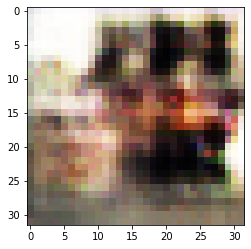

-> Epoch 24, Batch numero 1/78 -> Disc. loss on real images: 0.72445, Disc. loss on fake images: 0.55627, Generator loss: 1.67134
-> Epoch 24, Batch numero 2/78 -> Disc. loss on real images: 0.58657, Disc. loss on fake images: 0.41906, Generator loss: 2.00214
-> Epoch 24, Batch numero 3/78 -> Disc. loss on real images: 0.61773, Disc. loss on fake images: 0.35221, Generator loss: 1.88065
-> Epoch 24, Batch numero 4/78 -> Disc. loss on real images: 0.55912, Disc. loss on fake images: 0.36443, Generator loss: 1.76013
-> Epoch 24, Batch numero 5/78 -> Disc. loss on real images: 0.53892, Disc. loss on fake images: 0.38860, Generator loss: 1.73696
-> Epoch 24, Batch numero 6/78 -> Disc. loss on real images: 0.67820, Disc. loss on fake images: 0.57324, Generator loss: 1.92192
-> Epoch 24, Batch numero 7/78 -> Disc. loss on real images: 0.63587, Disc. loss on fake images: 0.30413, Generator loss: 1.92894
-> Epoch 24, Batch numero 8/78 -> Disc. loss on real images: 0.57910, Disc. loss on fake i

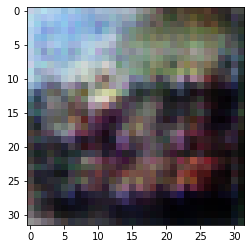

-> Epoch 25, Batch numero 1/78 -> Disc. loss on real images: 0.53430, Disc. loss on fake images: 0.61835, Generator loss: 1.20412
-> Epoch 25, Batch numero 2/78 -> Disc. loss on real images: 0.69672, Disc. loss on fake images: 0.63167, Generator loss: 1.17483
-> Epoch 25, Batch numero 3/78 -> Disc. loss on real images: 0.75307, Disc. loss on fake images: 0.58033, Generator loss: 1.06636
-> Epoch 25, Batch numero 4/78 -> Disc. loss on real images: 0.64603, Disc. loss on fake images: 0.81541, Generator loss: 1.04933
-> Epoch 25, Batch numero 5/78 -> Disc. loss on real images: 0.64777, Disc. loss on fake images: 0.79041, Generator loss: 1.16402
-> Epoch 25, Batch numero 6/78 -> Disc. loss on real images: 0.61318, Disc. loss on fake images: 0.59833, Generator loss: 1.26835
-> Epoch 25, Batch numero 7/78 -> Disc. loss on real images: 0.69412, Disc. loss on fake images: 0.59291, Generator loss: 1.25863
-> Epoch 25, Batch numero 8/78 -> Disc. loss on real images: 0.50449, Disc. loss on fake i

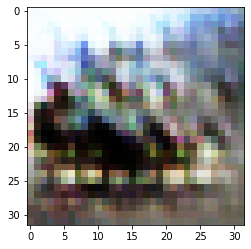

-> Epoch 26, Batch numero 1/78 -> Disc. loss on real images: 0.56718, Disc. loss on fake images: 0.58748, Generator loss: 1.66592
-> Epoch 26, Batch numero 2/78 -> Disc. loss on real images: 0.54967, Disc. loss on fake images: 0.49229, Generator loss: 1.68698
-> Epoch 26, Batch numero 3/78 -> Disc. loss on real images: 0.46659, Disc. loss on fake images: 0.34588, Generator loss: 1.71268
-> Epoch 26, Batch numero 4/78 -> Disc. loss on real images: 0.52840, Disc. loss on fake images: 0.43715, Generator loss: 1.48096
-> Epoch 26, Batch numero 5/78 -> Disc. loss on real images: 0.45171, Disc. loss on fake images: 0.44068, Generator loss: 1.42999
-> Epoch 26, Batch numero 6/78 -> Disc. loss on real images: 0.43382, Disc. loss on fake images: 0.57392, Generator loss: 1.28964
-> Epoch 26, Batch numero 7/78 -> Disc. loss on real images: 0.50673, Disc. loss on fake images: 0.55402, Generator loss: 1.33021
-> Epoch 26, Batch numero 8/78 -> Disc. loss on real images: 0.46172, Disc. loss on fake i

-> Epoch 26, Batch numero 64/78 -> Disc. loss on real images: 0.39679, Disc. loss on fake images: 0.35578, Generator loss: 1.66818
-> Epoch 26, Batch numero 65/78 -> Disc. loss on real images: 0.40710, Disc. loss on fake images: 0.42059, Generator loss: 1.35825
-> Epoch 26, Batch numero 66/78 -> Disc. loss on real images: 0.43453, Disc. loss on fake images: 0.68147, Generator loss: 1.37207
-> Epoch 26, Batch numero 67/78 -> Disc. loss on real images: 0.53323, Disc. loss on fake images: 0.55350, Generator loss: 1.55573
-> Epoch 26, Batch numero 68/78 -> Disc. loss on real images: 0.43027, Disc. loss on fake images: 0.37532, Generator loss: 1.65390
-> Epoch 26, Batch numero 69/78 -> Disc. loss on real images: 0.35414, Disc. loss on fake images: 0.41046, Generator loss: 1.65232
-> Epoch 26, Batch numero 70/78 -> Disc. loss on real images: 0.48013, Disc. loss on fake images: 0.37899, Generator loss: 1.66420
-> Epoch 26, Batch numero 71/78 -> Disc. loss on real images: 0.43363, Disc. loss o

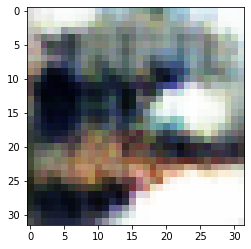

-> Epoch 27, Batch numero 1/78 -> Disc. loss on real images: 0.54507, Disc. loss on fake images: 0.43348, Generator loss: 1.67016
-> Epoch 27, Batch numero 2/78 -> Disc. loss on real images: 0.59438, Disc. loss on fake images: 0.55451, Generator loss: 1.44496
-> Epoch 27, Batch numero 3/78 -> Disc. loss on real images: 0.57811, Disc. loss on fake images: 0.55044, Generator loss: 1.38151
-> Epoch 27, Batch numero 4/78 -> Disc. loss on real images: 0.49265, Disc. loss on fake images: 0.52570, Generator loss: 1.16683
-> Epoch 27, Batch numero 5/78 -> Disc. loss on real images: 0.56868, Disc. loss on fake images: 0.63425, Generator loss: 1.25056
-> Epoch 27, Batch numero 6/78 -> Disc. loss on real images: 0.58166, Disc. loss on fake images: 0.52406, Generator loss: 1.38212
-> Epoch 27, Batch numero 7/78 -> Disc. loss on real images: 0.75879, Disc. loss on fake images: 0.45496, Generator loss: 1.44076
-> Epoch 27, Batch numero 8/78 -> Disc. loss on real images: 0.56465, Disc. loss on fake i

-> Epoch 27, Batch numero 64/78 -> Disc. loss on real images: 0.74927, Disc. loss on fake images: 0.63316, Generator loss: 1.93690
-> Epoch 27, Batch numero 65/78 -> Disc. loss on real images: 0.45454, Disc. loss on fake images: 0.37296, Generator loss: 2.00086
-> Epoch 27, Batch numero 66/78 -> Disc. loss on real images: 0.72370, Disc. loss on fake images: 0.39784, Generator loss: 1.85760
-> Epoch 27, Batch numero 67/78 -> Disc. loss on real images: 0.49803, Disc. loss on fake images: 0.40316, Generator loss: 1.89241
-> Epoch 27, Batch numero 68/78 -> Disc. loss on real images: 0.61953, Disc. loss on fake images: 0.39379, Generator loss: 1.69522
-> Epoch 27, Batch numero 69/78 -> Disc. loss on real images: 0.43943, Disc. loss on fake images: 0.52008, Generator loss: 1.70920
-> Epoch 27, Batch numero 70/78 -> Disc. loss on real images: 0.45198, Disc. loss on fake images: 0.39296, Generator loss: 1.84278
-> Epoch 27, Batch numero 71/78 -> Disc. loss on real images: 0.56816, Disc. loss o

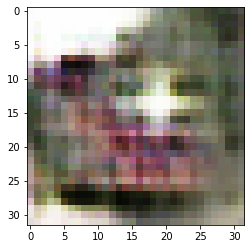

-> Epoch 28, Batch numero 1/78 -> Disc. loss on real images: 0.53996, Disc. loss on fake images: 0.57399, Generator loss: 1.61116
-> Epoch 28, Batch numero 2/78 -> Disc. loss on real images: 0.60430, Disc. loss on fake images: 0.50284, Generator loss: 1.62301
-> Epoch 28, Batch numero 3/78 -> Disc. loss on real images: 0.50133, Disc. loss on fake images: 0.51376, Generator loss: 1.46954
-> Epoch 28, Batch numero 4/78 -> Disc. loss on real images: 0.70153, Disc. loss on fake images: 0.53314, Generator loss: 1.61904
-> Epoch 28, Batch numero 5/78 -> Disc. loss on real images: 0.67341, Disc. loss on fake images: 0.41200, Generator loss: 1.30166
-> Epoch 28, Batch numero 6/78 -> Disc. loss on real images: 0.49022, Disc. loss on fake images: 0.51861, Generator loss: 1.38573
-> Epoch 28, Batch numero 7/78 -> Disc. loss on real images: 0.38944, Disc. loss on fake images: 0.43288, Generator loss: 1.63462
-> Epoch 28, Batch numero 8/78 -> Disc. loss on real images: 0.59651, Disc. loss on fake i

-> Epoch 28, Batch numero 64/78 -> Disc. loss on real images: 0.53178, Disc. loss on fake images: 0.44119, Generator loss: 1.65346
-> Epoch 28, Batch numero 65/78 -> Disc. loss on real images: 0.55618, Disc. loss on fake images: 0.43777, Generator loss: 1.43559
-> Epoch 28, Batch numero 66/78 -> Disc. loss on real images: 0.47430, Disc. loss on fake images: 0.45282, Generator loss: 1.67159
-> Epoch 28, Batch numero 67/78 -> Disc. loss on real images: 0.65399, Disc. loss on fake images: 0.39787, Generator loss: 1.53112
-> Epoch 28, Batch numero 68/78 -> Disc. loss on real images: 0.46507, Disc. loss on fake images: 0.46676, Generator loss: 1.75678
-> Epoch 28, Batch numero 69/78 -> Disc. loss on real images: 0.37541, Disc. loss on fake images: 0.28786, Generator loss: 1.67689
-> Epoch 28, Batch numero 70/78 -> Disc. loss on real images: 0.36959, Disc. loss on fake images: 0.38830, Generator loss: 1.66084
-> Epoch 28, Batch numero 71/78 -> Disc. loss on real images: 0.42399, Disc. loss o

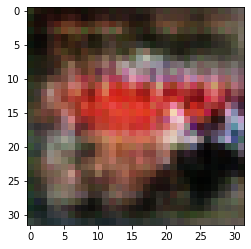

-> Epoch 29, Batch numero 1/78 -> Disc. loss on real images: 0.71077, Disc. loss on fake images: 0.50701, Generator loss: 1.67812
-> Epoch 29, Batch numero 2/78 -> Disc. loss on real images: 0.54685, Disc. loss on fake images: 0.65953, Generator loss: 1.90048
-> Epoch 29, Batch numero 3/78 -> Disc. loss on real images: 0.60915, Disc. loss on fake images: 0.41343, Generator loss: 1.61068
-> Epoch 29, Batch numero 4/78 -> Disc. loss on real images: 0.59692, Disc. loss on fake images: 0.44405, Generator loss: 1.90877
-> Epoch 29, Batch numero 5/78 -> Disc. loss on real images: 0.67070, Disc. loss on fake images: 0.36328, Generator loss: 1.71244
-> Epoch 29, Batch numero 6/78 -> Disc. loss on real images: 0.40078, Disc. loss on fake images: 0.36776, Generator loss: 1.79740
-> Epoch 29, Batch numero 7/78 -> Disc. loss on real images: 0.65624, Disc. loss on fake images: 0.39095, Generator loss: 1.76532
-> Epoch 29, Batch numero 8/78 -> Disc. loss on real images: 0.49459, Disc. loss on fake i

-> Epoch 29, Batch numero 64/78 -> Disc. loss on real images: 0.42204, Disc. loss on fake images: 0.58948, Generator loss: 1.73746
-> Epoch 29, Batch numero 65/78 -> Disc. loss on real images: 0.61384, Disc. loss on fake images: 0.38442, Generator loss: 1.40504
-> Epoch 29, Batch numero 66/78 -> Disc. loss on real images: 0.56640, Disc. loss on fake images: 0.68159, Generator loss: 1.59642
-> Epoch 29, Batch numero 67/78 -> Disc. loss on real images: 0.60672, Disc. loss on fake images: 0.43670, Generator loss: 1.57553
-> Epoch 29, Batch numero 68/78 -> Disc. loss on real images: 0.57302, Disc. loss on fake images: 0.51456, Generator loss: 1.63222
-> Epoch 29, Batch numero 69/78 -> Disc. loss on real images: 0.57854, Disc. loss on fake images: 0.50888, Generator loss: 1.61792
-> Epoch 29, Batch numero 70/78 -> Disc. loss on real images: 0.66683, Disc. loss on fake images: 0.47055, Generator loss: 1.32426
-> Epoch 29, Batch numero 71/78 -> Disc. loss on real images: 0.59966, Disc. loss o

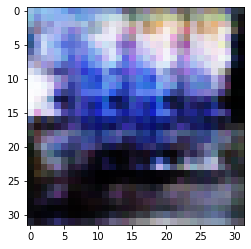

-> Epoch 30, Batch numero 1/78 -> Disc. loss on real images: 0.58417, Disc. loss on fake images: 0.51226, Generator loss: 1.57520
-> Epoch 30, Batch numero 2/78 -> Disc. loss on real images: 0.65836, Disc. loss on fake images: 0.38003, Generator loss: 1.55221
-> Epoch 30, Batch numero 3/78 -> Disc. loss on real images: 0.50891, Disc. loss on fake images: 0.40994, Generator loss: 1.43867
-> Epoch 30, Batch numero 4/78 -> Disc. loss on real images: 0.58388, Disc. loss on fake images: 0.58074, Generator loss: 1.43299
-> Epoch 30, Batch numero 5/78 -> Disc. loss on real images: 0.62702, Disc. loss on fake images: 0.51054, Generator loss: 1.44616
-> Epoch 30, Batch numero 6/78 -> Disc. loss on real images: 0.41958, Disc. loss on fake images: 0.50318, Generator loss: 1.52937
-> Epoch 30, Batch numero 7/78 -> Disc. loss on real images: 0.45620, Disc. loss on fake images: 0.46206, Generator loss: 1.56655
-> Epoch 30, Batch numero 8/78 -> Disc. loss on real images: 0.50636, Disc. loss on fake i

-> Epoch 30, Batch numero 65/78 -> Disc. loss on real images: 0.53067, Disc. loss on fake images: 0.86596, Generator loss: 1.30084
-> Epoch 30, Batch numero 66/78 -> Disc. loss on real images: 0.67921, Disc. loss on fake images: 0.74008, Generator loss: 1.53933
-> Epoch 30, Batch numero 67/78 -> Disc. loss on real images: 0.58978, Disc. loss on fake images: 0.50261, Generator loss: 1.58222
-> Epoch 30, Batch numero 68/78 -> Disc. loss on real images: 0.80724, Disc. loss on fake images: 0.49903, Generator loss: 1.43348
-> Epoch 30, Batch numero 69/78 -> Disc. loss on real images: 0.69179, Disc. loss on fake images: 0.70136, Generator loss: 1.23831
-> Epoch 30, Batch numero 70/78 -> Disc. loss on real images: 0.61077, Disc. loss on fake images: 0.61983, Generator loss: 1.35610
-> Epoch 30, Batch numero 71/78 -> Disc. loss on real images: 0.46778, Disc. loss on fake images: 0.46747, Generator loss: 1.41183
-> Epoch 30, Batch numero 72/78 -> Disc. loss on real images: 0.64810, Disc. loss o

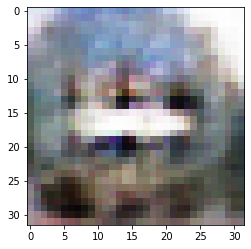

-> Epoch 31, Batch numero 1/78 -> Disc. loss on real images: 0.45900, Disc. loss on fake images: 0.46317, Generator loss: 1.44752
-> Epoch 31, Batch numero 2/78 -> Disc. loss on real images: 0.51912, Disc. loss on fake images: 0.44964, Generator loss: 1.29490
-> Epoch 31, Batch numero 3/78 -> Disc. loss on real images: 0.48108, Disc. loss on fake images: 0.41953, Generator loss: 1.42761
-> Epoch 31, Batch numero 4/78 -> Disc. loss on real images: 0.48486, Disc. loss on fake images: 0.46936, Generator loss: 1.24661
-> Epoch 31, Batch numero 5/78 -> Disc. loss on real images: 0.42701, Disc. loss on fake images: 0.55958, Generator loss: 1.33846
-> Epoch 31, Batch numero 6/78 -> Disc. loss on real images: 0.46603, Disc. loss on fake images: 0.46613, Generator loss: 1.23925
-> Epoch 31, Batch numero 7/78 -> Disc. loss on real images: 0.47283, Disc. loss on fake images: 0.76097, Generator loss: 1.38033
-> Epoch 31, Batch numero 8/78 -> Disc. loss on real images: 0.53631, Disc. loss on fake i

-> Epoch 31, Batch numero 65/78 -> Disc. loss on real images: 0.55167, Disc. loss on fake images: 0.67075, Generator loss: 1.25336
-> Epoch 31, Batch numero 66/78 -> Disc. loss on real images: 0.45744, Disc. loss on fake images: 0.42688, Generator loss: 1.55484
-> Epoch 31, Batch numero 67/78 -> Disc. loss on real images: 0.55951, Disc. loss on fake images: 0.49196, Generator loss: 1.55937
-> Epoch 31, Batch numero 68/78 -> Disc. loss on real images: 0.55132, Disc. loss on fake images: 0.43255, Generator loss: 1.57069
-> Epoch 31, Batch numero 69/78 -> Disc. loss on real images: 0.67155, Disc. loss on fake images: 0.48623, Generator loss: 1.43758
-> Epoch 31, Batch numero 70/78 -> Disc. loss on real images: 0.50097, Disc. loss on fake images: 0.51301, Generator loss: 1.62364
-> Epoch 31, Batch numero 71/78 -> Disc. loss on real images: 0.53403, Disc. loss on fake images: 0.47856, Generator loss: 1.71892
-> Epoch 31, Batch numero 72/78 -> Disc. loss on real images: 0.72164, Disc. loss o

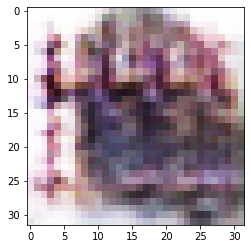

-> Epoch 32, Batch numero 1/78 -> Disc. loss on real images: 0.49914, Disc. loss on fake images: 0.41631, Generator loss: 1.94295
-> Epoch 32, Batch numero 2/78 -> Disc. loss on real images: 0.50088, Disc. loss on fake images: 0.43531, Generator loss: 1.94614
-> Epoch 32, Batch numero 3/78 -> Disc. loss on real images: 0.52234, Disc. loss on fake images: 0.44869, Generator loss: 1.83134
-> Epoch 32, Batch numero 4/78 -> Disc. loss on real images: 0.54433, Disc. loss on fake images: 0.45582, Generator loss: 1.85986
-> Epoch 32, Batch numero 5/78 -> Disc. loss on real images: 0.51144, Disc. loss on fake images: 0.72627, Generator loss: 1.79057
-> Epoch 32, Batch numero 6/78 -> Disc. loss on real images: 0.54834, Disc. loss on fake images: 0.36248, Generator loss: 1.89343
-> Epoch 32, Batch numero 7/78 -> Disc. loss on real images: 0.67548, Disc. loss on fake images: 0.44085, Generator loss: 1.63248
-> Epoch 32, Batch numero 8/78 -> Disc. loss on real images: 0.56250, Disc. loss on fake i

-> Epoch 32, Batch numero 65/78 -> Disc. loss on real images: 0.54962, Disc. loss on fake images: 0.50979, Generator loss: 1.32802
-> Epoch 32, Batch numero 66/78 -> Disc. loss on real images: 0.43279, Disc. loss on fake images: 0.38105, Generator loss: 1.39412
-> Epoch 32, Batch numero 67/78 -> Disc. loss on real images: 0.43610, Disc. loss on fake images: 0.53586, Generator loss: 1.51795
-> Epoch 32, Batch numero 68/78 -> Disc. loss on real images: 0.49645, Disc. loss on fake images: 0.38522, Generator loss: 1.63145
-> Epoch 32, Batch numero 69/78 -> Disc. loss on real images: 0.49196, Disc. loss on fake images: 0.28382, Generator loss: 1.40347
-> Epoch 32, Batch numero 70/78 -> Disc. loss on real images: 0.32828, Disc. loss on fake images: 0.44669, Generator loss: 1.40359
-> Epoch 32, Batch numero 71/78 -> Disc. loss on real images: 0.43768, Disc. loss on fake images: 0.52506, Generator loss: 1.41959
-> Epoch 32, Batch numero 72/78 -> Disc. loss on real images: 0.40087, Disc. loss o

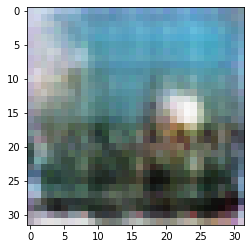

-> Epoch 33, Batch numero 1/78 -> Disc. loss on real images: 0.42564, Disc. loss on fake images: 0.36078, Generator loss: 1.58221
-> Epoch 33, Batch numero 2/78 -> Disc. loss on real images: 0.67582, Disc. loss on fake images: 0.48263, Generator loss: 1.32461
-> Epoch 33, Batch numero 3/78 -> Disc. loss on real images: 0.53758, Disc. loss on fake images: 0.73277, Generator loss: 1.46916
-> Epoch 33, Batch numero 4/78 -> Disc. loss on real images: 0.46815, Disc. loss on fake images: 0.41274, Generator loss: 1.61568
-> Epoch 33, Batch numero 5/78 -> Disc. loss on real images: 0.69549, Disc. loss on fake images: 0.42145, Generator loss: 1.46505
-> Epoch 33, Batch numero 6/78 -> Disc. loss on real images: 0.48360, Disc. loss on fake images: 0.59086, Generator loss: 1.35886
-> Epoch 33, Batch numero 7/78 -> Disc. loss on real images: 0.37204, Disc. loss on fake images: 0.49937, Generator loss: 1.79657
-> Epoch 33, Batch numero 8/78 -> Disc. loss on real images: 0.58198, Disc. loss on fake i

-> Epoch 33, Batch numero 65/78 -> Disc. loss on real images: 0.68470, Disc. loss on fake images: 0.56179, Generator loss: 1.29881
-> Epoch 33, Batch numero 66/78 -> Disc. loss on real images: 0.47490, Disc. loss on fake images: 0.51091, Generator loss: 1.26745
-> Epoch 33, Batch numero 67/78 -> Disc. loss on real images: 0.51337, Disc. loss on fake images: 0.59370, Generator loss: 1.44875
-> Epoch 33, Batch numero 68/78 -> Disc. loss on real images: 0.65964, Disc. loss on fake images: 0.47680, Generator loss: 1.52039
-> Epoch 33, Batch numero 69/78 -> Disc. loss on real images: 0.55879, Disc. loss on fake images: 0.35615, Generator loss: 1.58598
-> Epoch 33, Batch numero 70/78 -> Disc. loss on real images: 0.50921, Disc. loss on fake images: 0.49070, Generator loss: 1.38608
-> Epoch 33, Batch numero 71/78 -> Disc. loss on real images: 0.39376, Disc. loss on fake images: 0.50606, Generator loss: 1.53048
-> Epoch 33, Batch numero 72/78 -> Disc. loss on real images: 0.53582, Disc. loss o

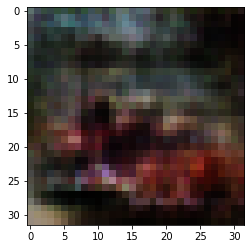

-> Epoch 34, Batch numero 1/78 -> Disc. loss on real images: 0.55223, Disc. loss on fake images: 0.67150, Generator loss: 1.28357
-> Epoch 34, Batch numero 2/78 -> Disc. loss on real images: 0.63685, Disc. loss on fake images: 0.52097, Generator loss: 1.23918
-> Epoch 34, Batch numero 3/78 -> Disc. loss on real images: 0.64490, Disc. loss on fake images: 0.63287, Generator loss: 1.15088
-> Epoch 34, Batch numero 4/78 -> Disc. loss on real images: 0.57104, Disc. loss on fake images: 0.58215, Generator loss: 1.14680
-> Epoch 34, Batch numero 5/78 -> Disc. loss on real images: 0.51863, Disc. loss on fake images: 0.58717, Generator loss: 1.21180
-> Epoch 34, Batch numero 6/78 -> Disc. loss on real images: 0.65885, Disc. loss on fake images: 0.62515, Generator loss: 1.22430
-> Epoch 34, Batch numero 7/78 -> Disc. loss on real images: 0.57187, Disc. loss on fake images: 0.61906, Generator loss: 1.43248
-> Epoch 34, Batch numero 8/78 -> Disc. loss on real images: 0.61445, Disc. loss on fake i

-> Epoch 34, Batch numero 64/78 -> Disc. loss on real images: 0.58118, Disc. loss on fake images: 0.48758, Generator loss: 1.44007
-> Epoch 34, Batch numero 65/78 -> Disc. loss on real images: 0.60078, Disc. loss on fake images: 0.51626, Generator loss: 1.36719
-> Epoch 34, Batch numero 66/78 -> Disc. loss on real images: 0.54958, Disc. loss on fake images: 0.72089, Generator loss: 1.35178
-> Epoch 34, Batch numero 67/78 -> Disc. loss on real images: 0.68471, Disc. loss on fake images: 0.61688, Generator loss: 1.54519
-> Epoch 34, Batch numero 68/78 -> Disc. loss on real images: 0.55768, Disc. loss on fake images: 0.53285, Generator loss: 1.42637
-> Epoch 34, Batch numero 69/78 -> Disc. loss on real images: 0.64405, Disc. loss on fake images: 0.47480, Generator loss: 1.22924
-> Epoch 34, Batch numero 70/78 -> Disc. loss on real images: 0.64300, Disc. loss on fake images: 0.79075, Generator loss: 1.20583
-> Epoch 34, Batch numero 71/78 -> Disc. loss on real images: 0.55069, Disc. loss o

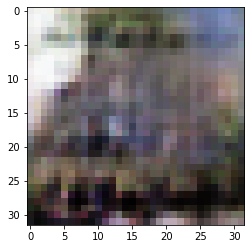

-> Epoch 35, Batch numero 1/78 -> Disc. loss on real images: 0.56996, Disc. loss on fake images: 0.45719, Generator loss: 1.50180
-> Epoch 35, Batch numero 2/78 -> Disc. loss on real images: 0.54018, Disc. loss on fake images: 0.49617, Generator loss: 1.43396
-> Epoch 35, Batch numero 3/78 -> Disc. loss on real images: 0.59864, Disc. loss on fake images: 0.48456, Generator loss: 1.35271
-> Epoch 35, Batch numero 4/78 -> Disc. loss on real images: 0.56631, Disc. loss on fake images: 0.45781, Generator loss: 1.43612
-> Epoch 35, Batch numero 5/78 -> Disc. loss on real images: 0.52915, Disc. loss on fake images: 0.43062, Generator loss: 1.42628
-> Epoch 35, Batch numero 6/78 -> Disc. loss on real images: 0.35798, Disc. loss on fake images: 0.44660, Generator loss: 1.65046
-> Epoch 35, Batch numero 7/78 -> Disc. loss on real images: 0.39714, Disc. loss on fake images: 0.39487, Generator loss: 1.46728
-> Epoch 35, Batch numero 8/78 -> Disc. loss on real images: 0.40565, Disc. loss on fake i

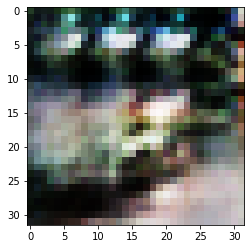

-> Epoch 36, Batch numero 1/78 -> Disc. loss on real images: 0.60586, Disc. loss on fake images: 0.67577, Generator loss: 1.47686
-> Epoch 36, Batch numero 2/78 -> Disc. loss on real images: 0.48064, Disc. loss on fake images: 0.57330, Generator loss: 1.71648
-> Epoch 36, Batch numero 3/78 -> Disc. loss on real images: 0.64982, Disc. loss on fake images: 0.49594, Generator loss: 1.58344
-> Epoch 36, Batch numero 4/78 -> Disc. loss on real images: 0.60154, Disc. loss on fake images: 0.41194, Generator loss: 1.64930
-> Epoch 36, Batch numero 5/78 -> Disc. loss on real images: 0.55475, Disc. loss on fake images: 0.74697, Generator loss: 1.79963
-> Epoch 36, Batch numero 6/78 -> Disc. loss on real images: 0.75711, Disc. loss on fake images: 0.46662, Generator loss: 1.63077
-> Epoch 36, Batch numero 7/78 -> Disc. loss on real images: 0.66411, Disc. loss on fake images: 0.41264, Generator loss: 1.59990
-> Epoch 36, Batch numero 8/78 -> Disc. loss on real images: 0.47127, Disc. loss on fake i

-> Epoch 36, Batch numero 64/78 -> Disc. loss on real images: 0.64836, Disc. loss on fake images: 0.49557, Generator loss: 1.56690
-> Epoch 36, Batch numero 65/78 -> Disc. loss on real images: 0.76403, Disc. loss on fake images: 0.50382, Generator loss: 1.50802
-> Epoch 36, Batch numero 66/78 -> Disc. loss on real images: 0.46667, Disc. loss on fake images: 0.38442, Generator loss: 1.66987
-> Epoch 36, Batch numero 67/78 -> Disc. loss on real images: 0.59832, Disc. loss on fake images: 0.54970, Generator loss: 1.40801
-> Epoch 36, Batch numero 68/78 -> Disc. loss on real images: 0.40566, Disc. loss on fake images: 0.41734, Generator loss: 1.46050
-> Epoch 36, Batch numero 69/78 -> Disc. loss on real images: 0.48215, Disc. loss on fake images: 0.44904, Generator loss: 1.35202
-> Epoch 36, Batch numero 70/78 -> Disc. loss on real images: 0.43286, Disc. loss on fake images: 0.52808, Generator loss: 1.50655
-> Epoch 36, Batch numero 71/78 -> Disc. loss on real images: 0.56402, Disc. loss o

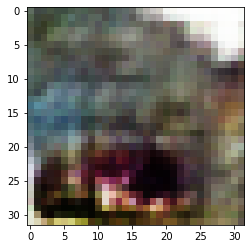

-> Epoch 37, Batch numero 1/78 -> Disc. loss on real images: 0.50819, Disc. loss on fake images: 0.45074, Generator loss: 1.38172
-> Epoch 37, Batch numero 2/78 -> Disc. loss on real images: 0.55390, Disc. loss on fake images: 0.61648, Generator loss: 1.40568
-> Epoch 37, Batch numero 3/78 -> Disc. loss on real images: 0.56541, Disc. loss on fake images: 0.67240, Generator loss: 1.43163
-> Epoch 37, Batch numero 4/78 -> Disc. loss on real images: 0.74959, Disc. loss on fake images: 0.53508, Generator loss: 1.34645
-> Epoch 37, Batch numero 5/78 -> Disc. loss on real images: 0.72584, Disc. loss on fake images: 0.77741, Generator loss: 1.34707
-> Epoch 37, Batch numero 6/78 -> Disc. loss on real images: 0.71219, Disc. loss on fake images: 0.56957, Generator loss: 1.40806
-> Epoch 37, Batch numero 7/78 -> Disc. loss on real images: 0.56442, Disc. loss on fake images: 0.53100, Generator loss: 1.67473
-> Epoch 37, Batch numero 8/78 -> Disc. loss on real images: 0.60443, Disc. loss on fake i

-> Epoch 37, Batch numero 64/78 -> Disc. loss on real images: 0.58628, Disc. loss on fake images: 0.53133, Generator loss: 1.40732
-> Epoch 37, Batch numero 65/78 -> Disc. loss on real images: 0.46340, Disc. loss on fake images: 0.54168, Generator loss: 1.26150
-> Epoch 37, Batch numero 66/78 -> Disc. loss on real images: 0.53925, Disc. loss on fake images: 0.57260, Generator loss: 1.38864
-> Epoch 37, Batch numero 67/78 -> Disc. loss on real images: 0.43113, Disc. loss on fake images: 0.42901, Generator loss: 1.38541
-> Epoch 37, Batch numero 68/78 -> Disc. loss on real images: 0.52370, Disc. loss on fake images: 0.54825, Generator loss: 1.46934
-> Epoch 37, Batch numero 69/78 -> Disc. loss on real images: 0.56242, Disc. loss on fake images: 0.45625, Generator loss: 1.27487
-> Epoch 37, Batch numero 70/78 -> Disc. loss on real images: 0.69710, Disc. loss on fake images: 0.58031, Generator loss: 1.23051
-> Epoch 37, Batch numero 71/78 -> Disc. loss on real images: 0.69999, Disc. loss o

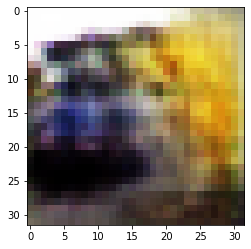

-> Epoch 38, Batch numero 1/78 -> Disc. loss on real images: 0.74996, Disc. loss on fake images: 0.60648, Generator loss: 1.32910
-> Epoch 38, Batch numero 2/78 -> Disc. loss on real images: 0.61054, Disc. loss on fake images: 0.73226, Generator loss: 1.21315
-> Epoch 38, Batch numero 3/78 -> Disc. loss on real images: 0.44054, Disc. loss on fake images: 0.59760, Generator loss: 1.44924
-> Epoch 38, Batch numero 4/78 -> Disc. loss on real images: 0.91251, Disc. loss on fake images: 0.65215, Generator loss: 1.44664
-> Epoch 38, Batch numero 5/78 -> Disc. loss on real images: 0.62173, Disc. loss on fake images: 0.55045, Generator loss: 1.38878
-> Epoch 38, Batch numero 6/78 -> Disc. loss on real images: 0.68388, Disc. loss on fake images: 0.60973, Generator loss: 1.40409
-> Epoch 38, Batch numero 7/78 -> Disc. loss on real images: 0.61227, Disc. loss on fake images: 0.54864, Generator loss: 1.42633
-> Epoch 38, Batch numero 8/78 -> Disc. loss on real images: 0.73024, Disc. loss on fake i

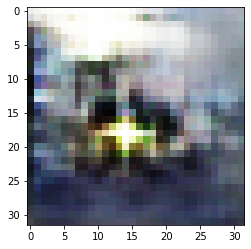

-> Epoch 39, Batch numero 1/78 -> Disc. loss on real images: 0.53045, Disc. loss on fake images: 0.43885, Generator loss: 1.74010
-> Epoch 39, Batch numero 2/78 -> Disc. loss on real images: 0.68092, Disc. loss on fake images: 0.56919, Generator loss: 1.43646
-> Epoch 39, Batch numero 3/78 -> Disc. loss on real images: 0.47070, Disc. loss on fake images: 0.54750, Generator loss: 1.43739
-> Epoch 39, Batch numero 4/78 -> Disc. loss on real images: 0.36107, Disc. loss on fake images: 0.48954, Generator loss: 1.54654
-> Epoch 39, Batch numero 5/78 -> Disc. loss on real images: 0.60646, Disc. loss on fake images: 0.43562, Generator loss: 1.40024
-> Epoch 39, Batch numero 6/78 -> Disc. loss on real images: 0.48038, Disc. loss on fake images: 0.53976, Generator loss: 1.48026
-> Epoch 39, Batch numero 7/78 -> Disc. loss on real images: 0.44129, Disc. loss on fake images: 0.45751, Generator loss: 1.66186
-> Epoch 39, Batch numero 8/78 -> Disc. loss on real images: 0.51186, Disc. loss on fake i

-> Epoch 39, Batch numero 65/78 -> Disc. loss on real images: 0.60396, Disc. loss on fake images: 0.54231, Generator loss: 1.52550
-> Epoch 39, Batch numero 66/78 -> Disc. loss on real images: 0.68520, Disc. loss on fake images: 0.55501, Generator loss: 1.39052
-> Epoch 39, Batch numero 67/78 -> Disc. loss on real images: 0.56230, Disc. loss on fake images: 0.44301, Generator loss: 1.44177
-> Epoch 39, Batch numero 68/78 -> Disc. loss on real images: 0.51355, Disc. loss on fake images: 0.46254, Generator loss: 1.30006
-> Epoch 39, Batch numero 69/78 -> Disc. loss on real images: 0.53187, Disc. loss on fake images: 0.52602, Generator loss: 1.15613
-> Epoch 39, Batch numero 70/78 -> Disc. loss on real images: 0.48039, Disc. loss on fake images: 0.60640, Generator loss: 1.25485
-> Epoch 39, Batch numero 71/78 -> Disc. loss on real images: 0.59851, Disc. loss on fake images: 0.62431, Generator loss: 1.23562
-> Epoch 39, Batch numero 72/78 -> Disc. loss on real images: 0.51353, Disc. loss o

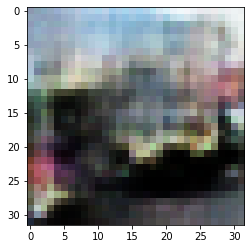

-> Epoch 40, Batch numero 1/78 -> Disc. loss on real images: 0.56859, Disc. loss on fake images: 0.49278, Generator loss: 1.16856
-> Epoch 40, Batch numero 2/78 -> Disc. loss on real images: 0.56400, Disc. loss on fake images: 0.59495, Generator loss: 1.07613
-> Epoch 40, Batch numero 3/78 -> Disc. loss on real images: 0.49867, Disc. loss on fake images: 0.53920, Generator loss: 1.24276
-> Epoch 40, Batch numero 4/78 -> Disc. loss on real images: 0.55820, Disc. loss on fake images: 0.49561, Generator loss: 1.28579
-> Epoch 40, Batch numero 5/78 -> Disc. loss on real images: 0.52117, Disc. loss on fake images: 0.44603, Generator loss: 1.18197
-> Epoch 40, Batch numero 6/78 -> Disc. loss on real images: 0.42972, Disc. loss on fake images: 0.50478, Generator loss: 1.27827
-> Epoch 40, Batch numero 7/78 -> Disc. loss on real images: 0.47525, Disc. loss on fake images: 0.51463, Generator loss: 1.20828
-> Epoch 40, Batch numero 8/78 -> Disc. loss on real images: 0.42015, Disc. loss on fake i

-> Epoch 40, Batch numero 64/78 -> Disc. loss on real images: 0.69856, Disc. loss on fake images: 0.36434, Generator loss: 1.60453
-> Epoch 40, Batch numero 65/78 -> Disc. loss on real images: 0.58946, Disc. loss on fake images: 0.67385, Generator loss: 1.69473
-> Epoch 40, Batch numero 66/78 -> Disc. loss on real images: 0.68335, Disc. loss on fake images: 0.70438, Generator loss: 1.61086
-> Epoch 40, Batch numero 67/78 -> Disc. loss on real images: 0.71628, Disc. loss on fake images: 0.63723, Generator loss: 1.80126
-> Epoch 40, Batch numero 68/78 -> Disc. loss on real images: 0.74345, Disc. loss on fake images: 0.39740, Generator loss: 1.59065
-> Epoch 40, Batch numero 69/78 -> Disc. loss on real images: 0.69453, Disc. loss on fake images: 0.46307, Generator loss: 1.30583
-> Epoch 40, Batch numero 70/78 -> Disc. loss on real images: 0.61148, Disc. loss on fake images: 0.66014, Generator loss: 1.63170
-> Epoch 40, Batch numero 71/78 -> Disc. loss on real images: 0.45028, Disc. loss o

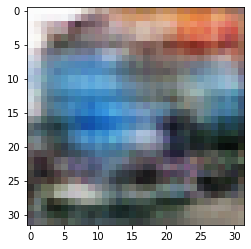

-> Epoch 41, Batch numero 1/78 -> Disc. loss on real images: 0.69532, Disc. loss on fake images: 0.72005, Generator loss: 1.23172
-> Epoch 41, Batch numero 2/78 -> Disc. loss on real images: 0.50520, Disc. loss on fake images: 0.70462, Generator loss: 1.38105
-> Epoch 41, Batch numero 3/78 -> Disc. loss on real images: 0.52918, Disc. loss on fake images: 0.54722, Generator loss: 1.54135
-> Epoch 41, Batch numero 4/78 -> Disc. loss on real images: 0.46068, Disc. loss on fake images: 0.42679, Generator loss: 1.54076
-> Epoch 41, Batch numero 5/78 -> Disc. loss on real images: 0.55782, Disc. loss on fake images: 0.40939, Generator loss: 1.45597
-> Epoch 41, Batch numero 6/78 -> Disc. loss on real images: 0.35439, Disc. loss on fake images: 0.60730, Generator loss: 1.64657
-> Epoch 41, Batch numero 7/78 -> Disc. loss on real images: 0.52367, Disc. loss on fake images: 0.42612, Generator loss: 1.76011
-> Epoch 41, Batch numero 8/78 -> Disc. loss on real images: 0.56883, Disc. loss on fake i

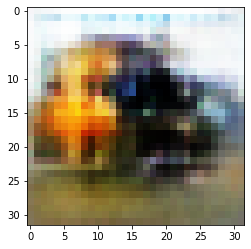

-> Epoch 42, Batch numero 1/78 -> Disc. loss on real images: 0.68782, Disc. loss on fake images: 0.43146, Generator loss: 1.42933
-> Epoch 42, Batch numero 2/78 -> Disc. loss on real images: 0.48649, Disc. loss on fake images: 0.62308, Generator loss: 1.50720
-> Epoch 42, Batch numero 3/78 -> Disc. loss on real images: 0.46167, Disc. loss on fake images: 0.79772, Generator loss: 1.79670
-> Epoch 42, Batch numero 4/78 -> Disc. loss on real images: 0.77452, Disc. loss on fake images: 0.49998, Generator loss: 2.04276
-> Epoch 42, Batch numero 5/78 -> Disc. loss on real images: 0.97420, Disc. loss on fake images: 0.48307, Generator loss: 1.81926
-> Epoch 42, Batch numero 6/78 -> Disc. loss on real images: 0.58986, Disc. loss on fake images: 0.52007, Generator loss: 2.14566
-> Epoch 42, Batch numero 7/78 -> Disc. loss on real images: 0.40773, Disc. loss on fake images: 0.27841, Generator loss: 2.26552
-> Epoch 42, Batch numero 8/78 -> Disc. loss on real images: 0.37575, Disc. loss on fake i

-> Epoch 42, Batch numero 65/78 -> Disc. loss on real images: 0.49950, Disc. loss on fake images: 0.48845, Generator loss: 1.71764
-> Epoch 42, Batch numero 66/78 -> Disc. loss on real images: 0.56076, Disc. loss on fake images: 0.34363, Generator loss: 1.78532
-> Epoch 42, Batch numero 67/78 -> Disc. loss on real images: 0.79416, Disc. loss on fake images: 0.46018, Generator loss: 1.44728
-> Epoch 42, Batch numero 68/78 -> Disc. loss on real images: 0.35511, Disc. loss on fake images: 0.52730, Generator loss: 1.60968
-> Epoch 42, Batch numero 69/78 -> Disc. loss on real images: 0.51447, Disc. loss on fake images: 0.33647, Generator loss: 1.60293
-> Epoch 42, Batch numero 70/78 -> Disc. loss on real images: 0.50437, Disc. loss on fake images: 0.42602, Generator loss: 1.50818
-> Epoch 42, Batch numero 71/78 -> Disc. loss on real images: 0.58009, Disc. loss on fake images: 0.61057, Generator loss: 1.58176
-> Epoch 42, Batch numero 72/78 -> Disc. loss on real images: 0.42241, Disc. loss o

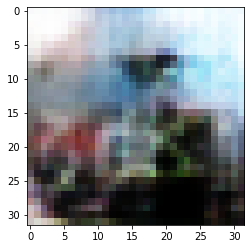

-> Epoch 43, Batch numero 1/78 -> Disc. loss on real images: 0.53572, Disc. loss on fake images: 0.64427, Generator loss: 1.71211
-> Epoch 43, Batch numero 2/78 -> Disc. loss on real images: 0.57212, Disc. loss on fake images: 0.46398, Generator loss: 1.64873
-> Epoch 43, Batch numero 3/78 -> Disc. loss on real images: 0.71636, Disc. loss on fake images: 0.49101, Generator loss: 1.44397
-> Epoch 43, Batch numero 4/78 -> Disc. loss on real images: 0.41897, Disc. loss on fake images: 0.53502, Generator loss: 1.54305
-> Epoch 43, Batch numero 5/78 -> Disc. loss on real images: 0.68019, Disc. loss on fake images: 0.52452, Generator loss: 1.52470
-> Epoch 43, Batch numero 6/78 -> Disc. loss on real images: 0.50186, Disc. loss on fake images: 0.45831, Generator loss: 1.47582
-> Epoch 43, Batch numero 7/78 -> Disc. loss on real images: 0.61074, Disc. loss on fake images: 0.54835, Generator loss: 1.76014
-> Epoch 43, Batch numero 8/78 -> Disc. loss on real images: 0.47942, Disc. loss on fake i

-> Epoch 43, Batch numero 64/78 -> Disc. loss on real images: 0.35438, Disc. loss on fake images: 0.54978, Generator loss: 1.85164
-> Epoch 43, Batch numero 65/78 -> Disc. loss on real images: 0.56365, Disc. loss on fake images: 0.41978, Generator loss: 1.91845
-> Epoch 43, Batch numero 66/78 -> Disc. loss on real images: 0.60563, Disc. loss on fake images: 0.61160, Generator loss: 1.79351
-> Epoch 43, Batch numero 67/78 -> Disc. loss on real images: 0.83580, Disc. loss on fake images: 0.75186, Generator loss: 1.65654
-> Epoch 43, Batch numero 68/78 -> Disc. loss on real images: 0.61704, Disc. loss on fake images: 0.71074, Generator loss: 1.88986
-> Epoch 43, Batch numero 69/78 -> Disc. loss on real images: 0.80383, Disc. loss on fake images: 0.54700, Generator loss: 1.93700
-> Epoch 43, Batch numero 70/78 -> Disc. loss on real images: 1.08764, Disc. loss on fake images: 0.45155, Generator loss: 1.96286
-> Epoch 43, Batch numero 71/78 -> Disc. loss on real images: 1.07040, Disc. loss o

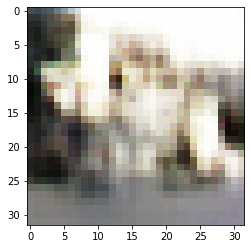

-> Epoch 44, Batch numero 1/78 -> Disc. loss on real images: 0.40147, Disc. loss on fake images: 0.31163, Generator loss: 1.66939
-> Epoch 44, Batch numero 2/78 -> Disc. loss on real images: 0.56625, Disc. loss on fake images: 0.61099, Generator loss: 1.81407
-> Epoch 44, Batch numero 3/78 -> Disc. loss on real images: 0.45784, Disc. loss on fake images: 0.36712, Generator loss: 1.93625
-> Epoch 44, Batch numero 4/78 -> Disc. loss on real images: 0.40164, Disc. loss on fake images: 0.39844, Generator loss: 1.82135
-> Epoch 44, Batch numero 5/78 -> Disc. loss on real images: 0.44797, Disc. loss on fake images: 0.36671, Generator loss: 1.68552
-> Epoch 44, Batch numero 6/78 -> Disc. loss on real images: 0.50197, Disc. loss on fake images: 0.51703, Generator loss: 1.68144
-> Epoch 44, Batch numero 7/78 -> Disc. loss on real images: 0.36584, Disc. loss on fake images: 0.53077, Generator loss: 1.71545
-> Epoch 44, Batch numero 8/78 -> Disc. loss on real images: 0.55499, Disc. loss on fake i

-> Epoch 44, Batch numero 65/78 -> Disc. loss on real images: 0.55858, Disc. loss on fake images: 0.42906, Generator loss: 1.53800
-> Epoch 44, Batch numero 66/78 -> Disc. loss on real images: 0.61318, Disc. loss on fake images: 0.54644, Generator loss: 1.72167
-> Epoch 44, Batch numero 67/78 -> Disc. loss on real images: 0.53377, Disc. loss on fake images: 0.41527, Generator loss: 1.71113
-> Epoch 44, Batch numero 68/78 -> Disc. loss on real images: 0.43745, Disc. loss on fake images: 0.44543, Generator loss: 1.65358
-> Epoch 44, Batch numero 69/78 -> Disc. loss on real images: 0.37922, Disc. loss on fake images: 0.47632, Generator loss: 1.77527
-> Epoch 44, Batch numero 70/78 -> Disc. loss on real images: 0.68066, Disc. loss on fake images: 0.44170, Generator loss: 1.47873
-> Epoch 44, Batch numero 71/78 -> Disc. loss on real images: 0.49379, Disc. loss on fake images: 0.60271, Generator loss: 1.41889
-> Epoch 44, Batch numero 72/78 -> Disc. loss on real images: 0.58365, Disc. loss o

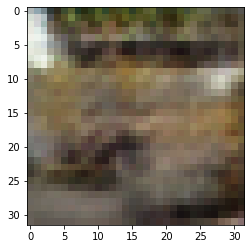

-> Epoch 45, Batch numero 1/78 -> Disc. loss on real images: 0.48898, Disc. loss on fake images: 0.48321, Generator loss: 1.61946
-> Epoch 45, Batch numero 2/78 -> Disc. loss on real images: 0.42269, Disc. loss on fake images: 0.42938, Generator loss: 1.62783
-> Epoch 45, Batch numero 3/78 -> Disc. loss on real images: 0.69058, Disc. loss on fake images: 0.63861, Generator loss: 1.58598
-> Epoch 45, Batch numero 4/78 -> Disc. loss on real images: 0.48599, Disc. loss on fake images: 0.46801, Generator loss: 1.44916
-> Epoch 45, Batch numero 5/78 -> Disc. loss on real images: 0.43285, Disc. loss on fake images: 0.45721, Generator loss: 1.74531
-> Epoch 45, Batch numero 6/78 -> Disc. loss on real images: 0.38927, Disc. loss on fake images: 0.53287, Generator loss: 1.76351
-> Epoch 45, Batch numero 7/78 -> Disc. loss on real images: 0.49681, Disc. loss on fake images: 0.63762, Generator loss: 1.79058
-> Epoch 45, Batch numero 8/78 -> Disc. loss on real images: 0.43812, Disc. loss on fake i

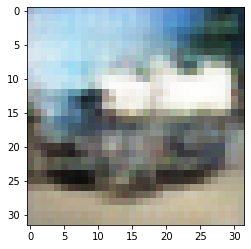

-> Epoch 46, Batch numero 1/78 -> Disc. loss on real images: 0.49906, Disc. loss on fake images: 0.49250, Generator loss: 1.44920
-> Epoch 46, Batch numero 2/78 -> Disc. loss on real images: 0.59850, Disc. loss on fake images: 0.42930, Generator loss: 1.37160
-> Epoch 46, Batch numero 3/78 -> Disc. loss on real images: 0.48855, Disc. loss on fake images: 0.47384, Generator loss: 1.42447
-> Epoch 46, Batch numero 4/78 -> Disc. loss on real images: 0.32431, Disc. loss on fake images: 0.50311, Generator loss: 1.54770
-> Epoch 46, Batch numero 5/78 -> Disc. loss on real images: 0.34622, Disc. loss on fake images: 0.47591, Generator loss: 1.60218
-> Epoch 46, Batch numero 6/78 -> Disc. loss on real images: 0.47581, Disc. loss on fake images: 0.36362, Generator loss: 1.65603
-> Epoch 46, Batch numero 7/78 -> Disc. loss on real images: 0.36366, Disc. loss on fake images: 0.41296, Generator loss: 1.58153
-> Epoch 46, Batch numero 8/78 -> Disc. loss on real images: 0.47827, Disc. loss on fake i

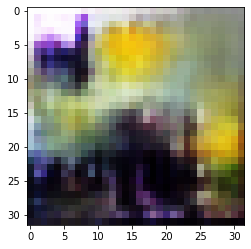

-> Epoch 47, Batch numero 1/78 -> Disc. loss on real images: 0.66348, Disc. loss on fake images: 0.44514, Generator loss: 1.81297
-> Epoch 47, Batch numero 2/78 -> Disc. loss on real images: 0.79215, Disc. loss on fake images: 0.55623, Generator loss: 1.79608
-> Epoch 47, Batch numero 3/78 -> Disc. loss on real images: 0.75372, Disc. loss on fake images: 0.63128, Generator loss: 1.89169
-> Epoch 47, Batch numero 4/78 -> Disc. loss on real images: 0.66557, Disc. loss on fake images: 0.23538, Generator loss: 2.04094
-> Epoch 47, Batch numero 5/78 -> Disc. loss on real images: 0.43742, Disc. loss on fake images: 0.52820, Generator loss: 1.96741
-> Epoch 47, Batch numero 6/78 -> Disc. loss on real images: 0.50843, Disc. loss on fake images: 0.42291, Generator loss: 2.08529
-> Epoch 47, Batch numero 7/78 -> Disc. loss on real images: 0.62732, Disc. loss on fake images: 0.39190, Generator loss: 2.03532
-> Epoch 47, Batch numero 8/78 -> Disc. loss on real images: 0.44547, Disc. loss on fake i

-> Epoch 47, Batch numero 64/78 -> Disc. loss on real images: 0.56051, Disc. loss on fake images: 0.57055, Generator loss: 1.53993
-> Epoch 47, Batch numero 65/78 -> Disc. loss on real images: 0.66644, Disc. loss on fake images: 0.49070, Generator loss: 1.59877
-> Epoch 47, Batch numero 66/78 -> Disc. loss on real images: 0.45791, Disc. loss on fake images: 0.44985, Generator loss: 1.66746
-> Epoch 47, Batch numero 67/78 -> Disc. loss on real images: 0.43743, Disc. loss on fake images: 0.42019, Generator loss: 1.56962
-> Epoch 47, Batch numero 68/78 -> Disc. loss on real images: 0.60594, Disc. loss on fake images: 0.38182, Generator loss: 1.47511
-> Epoch 47, Batch numero 69/78 -> Disc. loss on real images: 0.48411, Disc. loss on fake images: 0.53745, Generator loss: 1.41801
-> Epoch 47, Batch numero 70/78 -> Disc. loss on real images: 0.52225, Disc. loss on fake images: 0.53255, Generator loss: 1.30624
-> Epoch 47, Batch numero 71/78 -> Disc. loss on real images: 0.55770, Disc. loss o

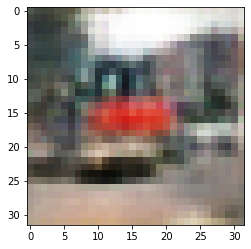

-> Epoch 48, Batch numero 1/78 -> Disc. loss on real images: 0.34961, Disc. loss on fake images: 0.37675, Generator loss: 1.61853
-> Epoch 48, Batch numero 2/78 -> Disc. loss on real images: 0.42383, Disc. loss on fake images: 0.48877, Generator loss: 1.44406
-> Epoch 48, Batch numero 3/78 -> Disc. loss on real images: 0.40098, Disc. loss on fake images: 0.43528, Generator loss: 1.41116
-> Epoch 48, Batch numero 4/78 -> Disc. loss on real images: 0.44222, Disc. loss on fake images: 0.72689, Generator loss: 1.57331
-> Epoch 48, Batch numero 5/78 -> Disc. loss on real images: 0.42488, Disc. loss on fake images: 0.52935, Generator loss: 1.49645
-> Epoch 48, Batch numero 6/78 -> Disc. loss on real images: 0.77306, Disc. loss on fake images: 0.53212, Generator loss: 1.35396
-> Epoch 48, Batch numero 7/78 -> Disc. loss on real images: 0.58250, Disc. loss on fake images: 0.79678, Generator loss: 1.47972
-> Epoch 48, Batch numero 8/78 -> Disc. loss on real images: 0.64495, Disc. loss on fake i

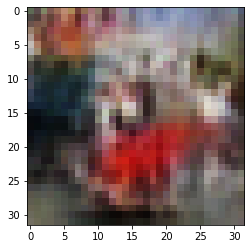

-> Epoch 49, Batch numero 1/78 -> Disc. loss on real images: 0.55346, Disc. loss on fake images: 0.70536, Generator loss: 1.53377
-> Epoch 49, Batch numero 2/78 -> Disc. loss on real images: 0.60667, Disc. loss on fake images: 0.45713, Generator loss: 1.50755
-> Epoch 49, Batch numero 3/78 -> Disc. loss on real images: 0.59176, Disc. loss on fake images: 0.49233, Generator loss: 1.48263
-> Epoch 49, Batch numero 4/78 -> Disc. loss on real images: 0.53223, Disc. loss on fake images: 0.46547, Generator loss: 1.46461
-> Epoch 49, Batch numero 5/78 -> Disc. loss on real images: 0.43844, Disc. loss on fake images: 0.53812, Generator loss: 1.45367
-> Epoch 49, Batch numero 6/78 -> Disc. loss on real images: 0.48590, Disc. loss on fake images: 0.47943, Generator loss: 1.53936
-> Epoch 49, Batch numero 7/78 -> Disc. loss on real images: 0.56395, Disc. loss on fake images: 0.46063, Generator loss: 1.33333
-> Epoch 49, Batch numero 8/78 -> Disc. loss on real images: 0.54269, Disc. loss on fake i

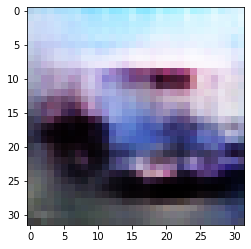

-> Epoch 50, Batch numero 1/78 -> Disc. loss on real images: 0.50768, Disc. loss on fake images: 0.64575, Generator loss: 1.32513
-> Epoch 50, Batch numero 2/78 -> Disc. loss on real images: 0.45653, Disc. loss on fake images: 0.58235, Generator loss: 1.31085
-> Epoch 50, Batch numero 3/78 -> Disc. loss on real images: 0.41840, Disc. loss on fake images: 0.64399, Generator loss: 1.56181
-> Epoch 50, Batch numero 4/78 -> Disc. loss on real images: 0.55581, Disc. loss on fake images: 0.46087, Generator loss: 1.61698
-> Epoch 50, Batch numero 5/78 -> Disc. loss on real images: 0.50750, Disc. loss on fake images: 0.46144, Generator loss: 1.44798
-> Epoch 50, Batch numero 6/78 -> Disc. loss on real images: 0.61066, Disc. loss on fake images: 0.42695, Generator loss: 1.33891
-> Epoch 50, Batch numero 7/78 -> Disc. loss on real images: 0.55014, Disc. loss on fake images: 0.58479, Generator loss: 1.35001
-> Epoch 50, Batch numero 8/78 -> Disc. loss on real images: 0.47827, Disc. loss on fake i

-> Epoch 50, Batch numero 64/78 -> Disc. loss on real images: 0.78545, Disc. loss on fake images: 0.45463, Generator loss: 1.60409
-> Epoch 50, Batch numero 65/78 -> Disc. loss on real images: 0.59303, Disc. loss on fake images: 0.50875, Generator loss: 1.58694
-> Epoch 50, Batch numero 66/78 -> Disc. loss on real images: 0.46441, Disc. loss on fake images: 0.37971, Generator loss: 1.73501
-> Epoch 50, Batch numero 67/78 -> Disc. loss on real images: 0.48598, Disc. loss on fake images: 0.47889, Generator loss: 1.60282
-> Epoch 50, Batch numero 68/78 -> Disc. loss on real images: 0.49717, Disc. loss on fake images: 0.46945, Generator loss: 1.37742
-> Epoch 50, Batch numero 69/78 -> Disc. loss on real images: 0.47514, Disc. loss on fake images: 0.46892, Generator loss: 1.31838
-> Epoch 50, Batch numero 70/78 -> Disc. loss on real images: 0.49972, Disc. loss on fake images: 0.53726, Generator loss: 1.30457
-> Epoch 50, Batch numero 71/78 -> Disc. loss on real images: 0.49322, Disc. loss o

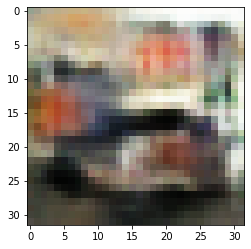

-> Epoch 51, Batch numero 1/78 -> Disc. loss on real images: 0.45518, Disc. loss on fake images: 0.52171, Generator loss: 1.47771
-> Epoch 51, Batch numero 2/78 -> Disc. loss on real images: 0.69101, Disc. loss on fake images: 0.46530, Generator loss: 1.30830
-> Epoch 51, Batch numero 3/78 -> Disc. loss on real images: 0.46901, Disc. loss on fake images: 0.49589, Generator loss: 1.40650
-> Epoch 51, Batch numero 4/78 -> Disc. loss on real images: 0.48856, Disc. loss on fake images: 0.48090, Generator loss: 1.36642
-> Epoch 51, Batch numero 5/78 -> Disc. loss on real images: 0.47962, Disc. loss on fake images: 0.55249, Generator loss: 1.62959
-> Epoch 51, Batch numero 6/78 -> Disc. loss on real images: 0.55963, Disc. loss on fake images: 0.51350, Generator loss: 1.68135
-> Epoch 51, Batch numero 7/78 -> Disc. loss on real images: 0.50856, Disc. loss on fake images: 0.40947, Generator loss: 1.72723
-> Epoch 51, Batch numero 8/78 -> Disc. loss on real images: 0.67771, Disc. loss on fake i

-> Epoch 51, Batch numero 64/78 -> Disc. loss on real images: 0.47530, Disc. loss on fake images: 0.42641, Generator loss: 1.51402
-> Epoch 51, Batch numero 65/78 -> Disc. loss on real images: 0.43924, Disc. loss on fake images: 0.45658, Generator loss: 1.56837
-> Epoch 51, Batch numero 66/78 -> Disc. loss on real images: 0.31504, Disc. loss on fake images: 0.40616, Generator loss: 1.68880
-> Epoch 51, Batch numero 67/78 -> Disc. loss on real images: 0.47913, Disc. loss on fake images: 0.46645, Generator loss: 1.61797
-> Epoch 51, Batch numero 68/78 -> Disc. loss on real images: 0.39653, Disc. loss on fake images: 0.58382, Generator loss: 1.76409
-> Epoch 51, Batch numero 69/78 -> Disc. loss on real images: 0.64191, Disc. loss on fake images: 0.40025, Generator loss: 1.61620
-> Epoch 51, Batch numero 70/78 -> Disc. loss on real images: 0.50782, Disc. loss on fake images: 0.46142, Generator loss: 1.32282
-> Epoch 51, Batch numero 71/78 -> Disc. loss on real images: 0.50488, Disc. loss o

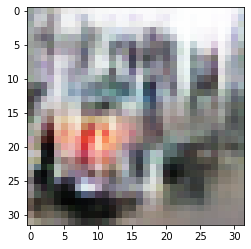

-> Epoch 52, Batch numero 1/78 -> Disc. loss on real images: 0.57737, Disc. loss on fake images: 0.62499, Generator loss: 1.54537
-> Epoch 52, Batch numero 2/78 -> Disc. loss on real images: 0.64140, Disc. loss on fake images: 0.49614, Generator loss: 1.82800
-> Epoch 52, Batch numero 3/78 -> Disc. loss on real images: 0.71723, Disc. loss on fake images: 0.38689, Generator loss: 1.79024
-> Epoch 52, Batch numero 4/78 -> Disc. loss on real images: 0.59645, Disc. loss on fake images: 0.35570, Generator loss: 1.70730
-> Epoch 52, Batch numero 5/78 -> Disc. loss on real images: 0.66836, Disc. loss on fake images: 0.52147, Generator loss: 1.66191
-> Epoch 52, Batch numero 6/78 -> Disc. loss on real images: 0.53001, Disc. loss on fake images: 0.52990, Generator loss: 1.52663
-> Epoch 52, Batch numero 7/78 -> Disc. loss on real images: 0.46908, Disc. loss on fake images: 0.62129, Generator loss: 1.50096
-> Epoch 52, Batch numero 8/78 -> Disc. loss on real images: 0.61450, Disc. loss on fake i

-> Epoch 52, Batch numero 64/78 -> Disc. loss on real images: 0.72028, Disc. loss on fake images: 0.65183, Generator loss: 1.43640
-> Epoch 52, Batch numero 65/78 -> Disc. loss on real images: 0.69882, Disc. loss on fake images: 0.56942, Generator loss: 1.40190
-> Epoch 52, Batch numero 66/78 -> Disc. loss on real images: 0.59625, Disc. loss on fake images: 0.52433, Generator loss: 1.28427
-> Epoch 52, Batch numero 67/78 -> Disc. loss on real images: 0.64570, Disc. loss on fake images: 0.56999, Generator loss: 1.52185
-> Epoch 52, Batch numero 68/78 -> Disc. loss on real images: 0.63349, Disc. loss on fake images: 0.59325, Generator loss: 1.50499
-> Epoch 52, Batch numero 69/78 -> Disc. loss on real images: 0.66248, Disc. loss on fake images: 0.58080, Generator loss: 1.37504
-> Epoch 52, Batch numero 70/78 -> Disc. loss on real images: 0.57133, Disc. loss on fake images: 0.44946, Generator loss: 1.62156
-> Epoch 52, Batch numero 71/78 -> Disc. loss on real images: 0.58624, Disc. loss o

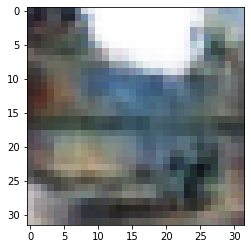

-> Epoch 53, Batch numero 1/78 -> Disc. loss on real images: 0.59058, Disc. loss on fake images: 0.55684, Generator loss: 1.39230
-> Epoch 53, Batch numero 2/78 -> Disc. loss on real images: 0.51060, Disc. loss on fake images: 0.68054, Generator loss: 1.45621
-> Epoch 53, Batch numero 3/78 -> Disc. loss on real images: 0.64681, Disc. loss on fake images: 0.47050, Generator loss: 1.39590
-> Epoch 53, Batch numero 4/78 -> Disc. loss on real images: 0.46847, Disc. loss on fake images: 0.58970, Generator loss: 1.27828
-> Epoch 53, Batch numero 5/78 -> Disc. loss on real images: 0.43349, Disc. loss on fake images: 0.57776, Generator loss: 1.59867
-> Epoch 53, Batch numero 6/78 -> Disc. loss on real images: 0.55971, Disc. loss on fake images: 0.39181, Generator loss: 1.65867
-> Epoch 53, Batch numero 7/78 -> Disc. loss on real images: 0.64220, Disc. loss on fake images: 0.41575, Generator loss: 1.49487
-> Epoch 53, Batch numero 8/78 -> Disc. loss on real images: 0.49867, Disc. loss on fake i

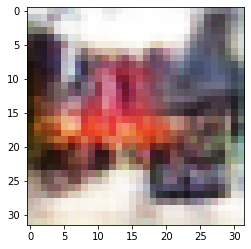

-> Epoch 54, Batch numero 1/78 -> Disc. loss on real images: 0.52918, Disc. loss on fake images: 0.51944, Generator loss: 1.44629
-> Epoch 54, Batch numero 2/78 -> Disc. loss on real images: 0.56141, Disc. loss on fake images: 0.48050, Generator loss: 1.34371
-> Epoch 54, Batch numero 3/78 -> Disc. loss on real images: 0.48458, Disc. loss on fake images: 0.53518, Generator loss: 1.30545
-> Epoch 54, Batch numero 4/78 -> Disc. loss on real images: 0.39498, Disc. loss on fake images: 0.60733, Generator loss: 1.52209
-> Epoch 54, Batch numero 5/78 -> Disc. loss on real images: 0.51415, Disc. loss on fake images: 0.40444, Generator loss: 1.48440
-> Epoch 54, Batch numero 6/78 -> Disc. loss on real images: 0.60452, Disc. loss on fake images: 0.54902, Generator loss: 1.31851
-> Epoch 54, Batch numero 7/78 -> Disc. loss on real images: 0.38838, Disc. loss on fake images: 0.54450, Generator loss: 1.57269
-> Epoch 54, Batch numero 8/78 -> Disc. loss on real images: 0.62258, Disc. loss on fake i

-> Epoch 54, Batch numero 64/78 -> Disc. loss on real images: 0.44754, Disc. loss on fake images: 0.51189, Generator loss: 1.38778
-> Epoch 54, Batch numero 65/78 -> Disc. loss on real images: 0.45472, Disc. loss on fake images: 0.46701, Generator loss: 1.45692
-> Epoch 54, Batch numero 66/78 -> Disc. loss on real images: 0.53754, Disc. loss on fake images: 0.51409, Generator loss: 1.36085
-> Epoch 54, Batch numero 67/78 -> Disc. loss on real images: 0.43576, Disc. loss on fake images: 0.53852, Generator loss: 1.34700
-> Epoch 54, Batch numero 68/78 -> Disc. loss on real images: 0.46190, Disc. loss on fake images: 0.57110, Generator loss: 1.64781
-> Epoch 54, Batch numero 69/78 -> Disc. loss on real images: 0.58992, Disc. loss on fake images: 0.51622, Generator loss: 1.46670
-> Epoch 54, Batch numero 70/78 -> Disc. loss on real images: 0.54131, Disc. loss on fake images: 0.56455, Generator loss: 1.34742
-> Epoch 54, Batch numero 71/78 -> Disc. loss on real images: 0.69335, Disc. loss o

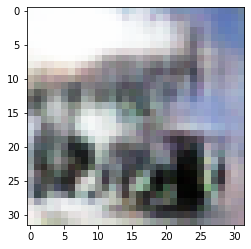

-> Epoch 55, Batch numero 1/78 -> Disc. loss on real images: 0.55211, Disc. loss on fake images: 0.45483, Generator loss: 1.26695
-> Epoch 55, Batch numero 2/78 -> Disc. loss on real images: 0.50347, Disc. loss on fake images: 0.57103, Generator loss: 1.45369
-> Epoch 55, Batch numero 3/78 -> Disc. loss on real images: 0.54345, Disc. loss on fake images: 0.63308, Generator loss: 1.58956
-> Epoch 55, Batch numero 4/78 -> Disc. loss on real images: 0.67477, Disc. loss on fake images: 0.53253, Generator loss: 1.52492
-> Epoch 55, Batch numero 5/78 -> Disc. loss on real images: 0.69324, Disc. loss on fake images: 0.44303, Generator loss: 1.57137
-> Epoch 55, Batch numero 6/78 -> Disc. loss on real images: 0.50987, Disc. loss on fake images: 0.49920, Generator loss: 1.49452
-> Epoch 55, Batch numero 7/78 -> Disc. loss on real images: 0.47995, Disc. loss on fake images: 0.48183, Generator loss: 1.56491
-> Epoch 55, Batch numero 8/78 -> Disc. loss on real images: 0.57132, Disc. loss on fake i

-> Epoch 55, Batch numero 64/78 -> Disc. loss on real images: 0.58628, Disc. loss on fake images: 0.46075, Generator loss: 1.34259
-> Epoch 55, Batch numero 65/78 -> Disc. loss on real images: 0.45404, Disc. loss on fake images: 0.44658, Generator loss: 1.34149
-> Epoch 55, Batch numero 66/78 -> Disc. loss on real images: 0.58867, Disc. loss on fake images: 0.63707, Generator loss: 1.40417
-> Epoch 55, Batch numero 67/78 -> Disc. loss on real images: 0.58930, Disc. loss on fake images: 0.49946, Generator loss: 1.33155
-> Epoch 55, Batch numero 68/78 -> Disc. loss on real images: 0.61169, Disc. loss on fake images: 0.53287, Generator loss: 1.49310
-> Epoch 55, Batch numero 69/78 -> Disc. loss on real images: 0.47961, Disc. loss on fake images: 0.51637, Generator loss: 1.36887
-> Epoch 55, Batch numero 70/78 -> Disc. loss on real images: 0.52289, Disc. loss on fake images: 0.45803, Generator loss: 1.40209
-> Epoch 55, Batch numero 71/78 -> Disc. loss on real images: 0.43348, Disc. loss o

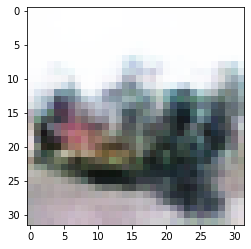

-> Epoch 56, Batch numero 1/78 -> Disc. loss on real images: 0.66180, Disc. loss on fake images: 0.55107, Generator loss: 1.37283
-> Epoch 56, Batch numero 2/78 -> Disc. loss on real images: 0.61239, Disc. loss on fake images: 0.52392, Generator loss: 1.42374
-> Epoch 56, Batch numero 3/78 -> Disc. loss on real images: 0.56565, Disc. loss on fake images: 0.48204, Generator loss: 1.26591
-> Epoch 56, Batch numero 4/78 -> Disc. loss on real images: 0.52567, Disc. loss on fake images: 0.70113, Generator loss: 1.19596
-> Epoch 56, Batch numero 5/78 -> Disc. loss on real images: 0.44262, Disc. loss on fake images: 0.60750, Generator loss: 1.35049
-> Epoch 56, Batch numero 6/78 -> Disc. loss on real images: 0.50954, Disc. loss on fake images: 0.45083, Generator loss: 1.32317
-> Epoch 56, Batch numero 7/78 -> Disc. loss on real images: 0.68742, Disc. loss on fake images: 0.60340, Generator loss: 1.21373
-> Epoch 56, Batch numero 8/78 -> Disc. loss on real images: 0.54823, Disc. loss on fake i

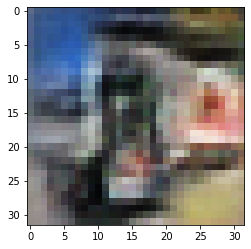

-> Epoch 57, Batch numero 1/78 -> Disc. loss on real images: 0.62134, Disc. loss on fake images: 0.39978, Generator loss: 1.40311
-> Epoch 57, Batch numero 2/78 -> Disc. loss on real images: 0.53775, Disc. loss on fake images: 0.46693, Generator loss: 1.28016
-> Epoch 57, Batch numero 3/78 -> Disc. loss on real images: 0.59795, Disc. loss on fake images: 0.69362, Generator loss: 1.25585
-> Epoch 57, Batch numero 4/78 -> Disc. loss on real images: 0.60434, Disc. loss on fake images: 0.63403, Generator loss: 1.41695
-> Epoch 57, Batch numero 5/78 -> Disc. loss on real images: 0.49087, Disc. loss on fake images: 0.46128, Generator loss: 1.28365
-> Epoch 57, Batch numero 6/78 -> Disc. loss on real images: 0.54237, Disc. loss on fake images: 0.45608, Generator loss: 1.29174
-> Epoch 57, Batch numero 7/78 -> Disc. loss on real images: 0.45264, Disc. loss on fake images: 0.56621, Generator loss: 1.27961
-> Epoch 57, Batch numero 8/78 -> Disc. loss on real images: 0.55959, Disc. loss on fake i

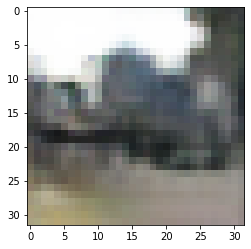

-> Epoch 58, Batch numero 1/78 -> Disc. loss on real images: 0.74290, Disc. loss on fake images: 0.57048, Generator loss: 1.60236
-> Epoch 58, Batch numero 2/78 -> Disc. loss on real images: 0.57382, Disc. loss on fake images: 0.39604, Generator loss: 1.65741
-> Epoch 58, Batch numero 3/78 -> Disc. loss on real images: 0.59610, Disc. loss on fake images: 0.50816, Generator loss: 1.37444
-> Epoch 58, Batch numero 4/78 -> Disc. loss on real images: 0.58644, Disc. loss on fake images: 0.55145, Generator loss: 1.64227
-> Epoch 58, Batch numero 5/78 -> Disc. loss on real images: 0.55991, Disc. loss on fake images: 0.44278, Generator loss: 1.63313
-> Epoch 58, Batch numero 6/78 -> Disc. loss on real images: 0.44431, Disc. loss on fake images: 0.48822, Generator loss: 1.49264
-> Epoch 58, Batch numero 7/78 -> Disc. loss on real images: 0.61722, Disc. loss on fake images: 0.58178, Generator loss: 1.70160
-> Epoch 58, Batch numero 8/78 -> Disc. loss on real images: 0.58263, Disc. loss on fake i

-> Epoch 58, Batch numero 65/78 -> Disc. loss on real images: 0.53968, Disc. loss on fake images: 0.55373, Generator loss: 1.50370
-> Epoch 58, Batch numero 66/78 -> Disc. loss on real images: 0.53423, Disc. loss on fake images: 0.57595, Generator loss: 1.53191
-> Epoch 58, Batch numero 67/78 -> Disc. loss on real images: 0.71889, Disc. loss on fake images: 0.50698, Generator loss: 1.33650
-> Epoch 58, Batch numero 68/78 -> Disc. loss on real images: 0.68267, Disc. loss on fake images: 0.54931, Generator loss: 1.27046
-> Epoch 58, Batch numero 69/78 -> Disc. loss on real images: 0.60926, Disc. loss on fake images: 0.58243, Generator loss: 1.25517
-> Epoch 58, Batch numero 70/78 -> Disc. loss on real images: 0.60867, Disc. loss on fake images: 0.60665, Generator loss: 1.41153
-> Epoch 58, Batch numero 71/78 -> Disc. loss on real images: 0.61643, Disc. loss on fake images: 0.43084, Generator loss: 1.40064
-> Epoch 58, Batch numero 72/78 -> Disc. loss on real images: 0.45531, Disc. loss o

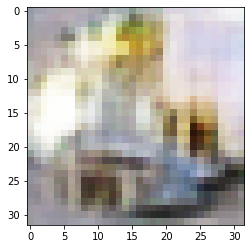

-> Epoch 59, Batch numero 1/78 -> Disc. loss on real images: 0.60074, Disc. loss on fake images: 0.44849, Generator loss: 1.31741
-> Epoch 59, Batch numero 2/78 -> Disc. loss on real images: 0.57717, Disc. loss on fake images: 0.58128, Generator loss: 1.25683
-> Epoch 59, Batch numero 3/78 -> Disc. loss on real images: 0.50371, Disc. loss on fake images: 0.57655, Generator loss: 1.40137
-> Epoch 59, Batch numero 4/78 -> Disc. loss on real images: 0.64019, Disc. loss on fake images: 0.48555, Generator loss: 1.46759
-> Epoch 59, Batch numero 5/78 -> Disc. loss on real images: 0.59898, Disc. loss on fake images: 0.50476, Generator loss: 1.37875
-> Epoch 59, Batch numero 6/78 -> Disc. loss on real images: 0.57384, Disc. loss on fake images: 0.52572, Generator loss: 1.41213
-> Epoch 59, Batch numero 7/78 -> Disc. loss on real images: 0.51458, Disc. loss on fake images: 0.58854, Generator loss: 1.30461
-> Epoch 59, Batch numero 8/78 -> Disc. loss on real images: 0.52035, Disc. loss on fake i

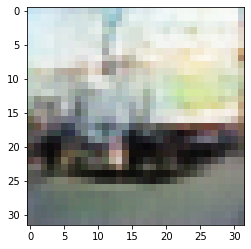

-> Epoch 60, Batch numero 1/78 -> Disc. loss on real images: 0.67784, Disc. loss on fake images: 0.51214, Generator loss: 1.52705
-> Epoch 60, Batch numero 2/78 -> Disc. loss on real images: 0.48465, Disc. loss on fake images: 0.43243, Generator loss: 1.51882
-> Epoch 60, Batch numero 3/78 -> Disc. loss on real images: 0.53118, Disc. loss on fake images: 0.41135, Generator loss: 1.72811
-> Epoch 60, Batch numero 4/78 -> Disc. loss on real images: 0.48848, Disc. loss on fake images: 0.40905, Generator loss: 1.46435
-> Epoch 60, Batch numero 5/78 -> Disc. loss on real images: 0.48077, Disc. loss on fake images: 0.67210, Generator loss: 1.27480
-> Epoch 60, Batch numero 6/78 -> Disc. loss on real images: 0.44377, Disc. loss on fake images: 0.62872, Generator loss: 1.45155
-> Epoch 60, Batch numero 7/78 -> Disc. loss on real images: 0.85019, Disc. loss on fake images: 0.47373, Generator loss: 1.33978
-> Epoch 60, Batch numero 8/78 -> Disc. loss on real images: 0.58529, Disc. loss on fake i

-> Epoch 60, Batch numero 64/78 -> Disc. loss on real images: 0.49780, Disc. loss on fake images: 0.58593, Generator loss: 1.42548
-> Epoch 60, Batch numero 65/78 -> Disc. loss on real images: 0.92418, Disc. loss on fake images: 0.57502, Generator loss: 1.24495
-> Epoch 60, Batch numero 66/78 -> Disc. loss on real images: 0.64785, Disc. loss on fake images: 0.56131, Generator loss: 1.17050
-> Epoch 60, Batch numero 67/78 -> Disc. loss on real images: 0.68893, Disc. loss on fake images: 0.64599, Generator loss: 1.45082
-> Epoch 60, Batch numero 68/78 -> Disc. loss on real images: 0.54600, Disc. loss on fake images: 0.47550, Generator loss: 1.64260
-> Epoch 60, Batch numero 69/78 -> Disc. loss on real images: 0.71933, Disc. loss on fake images: 0.38700, Generator loss: 1.42043
-> Epoch 60, Batch numero 70/78 -> Disc. loss on real images: 0.62132, Disc. loss on fake images: 0.49752, Generator loss: 1.28008
-> Epoch 60, Batch numero 71/78 -> Disc. loss on real images: 0.55987, Disc. loss o

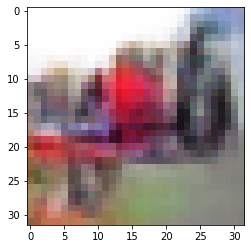

-> Epoch 61, Batch numero 1/78 -> Disc. loss on real images: 0.58502, Disc. loss on fake images: 0.55959, Generator loss: 1.28583
-> Epoch 61, Batch numero 2/78 -> Disc. loss on real images: 0.58989, Disc. loss on fake images: 0.52141, Generator loss: 1.27318
-> Epoch 61, Batch numero 3/78 -> Disc. loss on real images: 0.63330, Disc. loss on fake images: 0.46593, Generator loss: 1.10006
-> Epoch 61, Batch numero 4/78 -> Disc. loss on real images: 0.64554, Disc. loss on fake images: 0.61172, Generator loss: 1.14260
-> Epoch 61, Batch numero 5/78 -> Disc. loss on real images: 0.47557, Disc. loss on fake images: 0.54306, Generator loss: 1.37057
-> Epoch 61, Batch numero 6/78 -> Disc. loss on real images: 0.47186, Disc. loss on fake images: 0.46284, Generator loss: 1.36721
-> Epoch 61, Batch numero 7/78 -> Disc. loss on real images: 0.50117, Disc. loss on fake images: 0.59195, Generator loss: 1.44378
-> Epoch 61, Batch numero 8/78 -> Disc. loss on real images: 0.46949, Disc. loss on fake i

-> Epoch 61, Batch numero 64/78 -> Disc. loss on real images: 0.45304, Disc. loss on fake images: 0.63548, Generator loss: 1.77573
-> Epoch 61, Batch numero 65/78 -> Disc. loss on real images: 0.81328, Disc. loss on fake images: 0.42789, Generator loss: 1.54608
-> Epoch 61, Batch numero 66/78 -> Disc. loss on real images: 0.68103, Disc. loss on fake images: 0.53417, Generator loss: 1.48453
-> Epoch 61, Batch numero 67/78 -> Disc. loss on real images: 0.52376, Disc. loss on fake images: 0.55525, Generator loss: 1.41751
-> Epoch 61, Batch numero 68/78 -> Disc. loss on real images: 0.56726, Disc. loss on fake images: 0.53742, Generator loss: 1.35600
-> Epoch 61, Batch numero 69/78 -> Disc. loss on real images: 0.66397, Disc. loss on fake images: 0.54571, Generator loss: 1.25694
-> Epoch 61, Batch numero 70/78 -> Disc. loss on real images: 0.55627, Disc. loss on fake images: 0.50833, Generator loss: 1.30098
-> Epoch 61, Batch numero 71/78 -> Disc. loss on real images: 0.52964, Disc. loss o

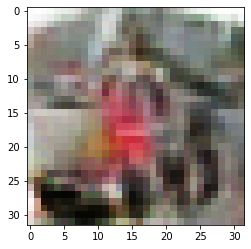

-> Epoch 62, Batch numero 1/78 -> Disc. loss on real images: 0.62501, Disc. loss on fake images: 0.47795, Generator loss: 1.39039
-> Epoch 62, Batch numero 2/78 -> Disc. loss on real images: 0.64667, Disc. loss on fake images: 0.65109, Generator loss: 1.36901
-> Epoch 62, Batch numero 3/78 -> Disc. loss on real images: 0.75080, Disc. loss on fake images: 0.54832, Generator loss: 1.25246
-> Epoch 62, Batch numero 4/78 -> Disc. loss on real images: 0.65821, Disc. loss on fake images: 0.53765, Generator loss: 1.27550
-> Epoch 62, Batch numero 5/78 -> Disc. loss on real images: 0.46088, Disc. loss on fake images: 0.45794, Generator loss: 1.30311
-> Epoch 62, Batch numero 6/78 -> Disc. loss on real images: 0.45861, Disc. loss on fake images: 0.58054, Generator loss: 1.24556
-> Epoch 62, Batch numero 7/78 -> Disc. loss on real images: 0.61994, Disc. loss on fake images: 0.56909, Generator loss: 1.21300
-> Epoch 62, Batch numero 8/78 -> Disc. loss on real images: 0.61653, Disc. loss on fake i

-> Epoch 62, Batch numero 64/78 -> Disc. loss on real images: 0.53684, Disc. loss on fake images: 0.50110, Generator loss: 1.17314
-> Epoch 62, Batch numero 65/78 -> Disc. loss on real images: 0.63764, Disc. loss on fake images: 0.54577, Generator loss: 1.11575
-> Epoch 62, Batch numero 66/78 -> Disc. loss on real images: 0.65412, Disc. loss on fake images: 0.67670, Generator loss: 1.13995
-> Epoch 62, Batch numero 67/78 -> Disc. loss on real images: 0.50199, Disc. loss on fake images: 0.53612, Generator loss: 1.15025
-> Epoch 62, Batch numero 68/78 -> Disc. loss on real images: 0.61796, Disc. loss on fake images: 0.55108, Generator loss: 1.19440
-> Epoch 62, Batch numero 69/78 -> Disc. loss on real images: 0.56897, Disc. loss on fake images: 0.52836, Generator loss: 1.26820
-> Epoch 62, Batch numero 70/78 -> Disc. loss on real images: 0.62390, Disc. loss on fake images: 0.58115, Generator loss: 1.17987
-> Epoch 62, Batch numero 71/78 -> Disc. loss on real images: 0.54325, Disc. loss o

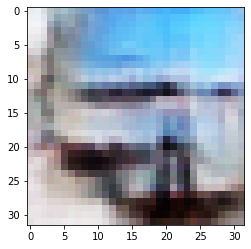

-> Epoch 63, Batch numero 1/78 -> Disc. loss on real images: 0.68881, Disc. loss on fake images: 0.48378, Generator loss: 1.31637
-> Epoch 63, Batch numero 2/78 -> Disc. loss on real images: 0.73518, Disc. loss on fake images: 0.48360, Generator loss: 1.23211
-> Epoch 63, Batch numero 3/78 -> Disc. loss on real images: 0.60761, Disc. loss on fake images: 0.61255, Generator loss: 1.13483
-> Epoch 63, Batch numero 4/78 -> Disc. loss on real images: 0.52367, Disc. loss on fake images: 0.56336, Generator loss: 1.21237
-> Epoch 63, Batch numero 5/78 -> Disc. loss on real images: 0.66824, Disc. loss on fake images: 0.57570, Generator loss: 1.13603
-> Epoch 63, Batch numero 6/78 -> Disc. loss on real images: 0.55286, Disc. loss on fake images: 0.66124, Generator loss: 1.38837
-> Epoch 63, Batch numero 7/78 -> Disc. loss on real images: 0.61235, Disc. loss on fake images: 0.50362, Generator loss: 1.33996
-> Epoch 63, Batch numero 8/78 -> Disc. loss on real images: 0.62522, Disc. loss on fake i

-> Epoch 63, Batch numero 65/78 -> Disc. loss on real images: 0.52728, Disc. loss on fake images: 0.57337, Generator loss: 1.34134
-> Epoch 63, Batch numero 66/78 -> Disc. loss on real images: 0.56100, Disc. loss on fake images: 0.53141, Generator loss: 1.33257
-> Epoch 63, Batch numero 67/78 -> Disc. loss on real images: 0.61788, Disc. loss on fake images: 0.55962, Generator loss: 1.16920
-> Epoch 63, Batch numero 68/78 -> Disc. loss on real images: 0.40253, Disc. loss on fake images: 0.59532, Generator loss: 1.19656
-> Epoch 63, Batch numero 69/78 -> Disc. loss on real images: 0.65921, Disc. loss on fake images: 0.51923, Generator loss: 1.20840
-> Epoch 63, Batch numero 70/78 -> Disc. loss on real images: 0.71808, Disc. loss on fake images: 0.51650, Generator loss: 1.14220
-> Epoch 63, Batch numero 71/78 -> Disc. loss on real images: 0.55909, Disc. loss on fake images: 0.51446, Generator loss: 1.11021
-> Epoch 63, Batch numero 72/78 -> Disc. loss on real images: 0.51545, Disc. loss o

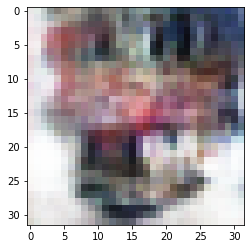

-> Epoch 64, Batch numero 1/78 -> Disc. loss on real images: 0.51654, Disc. loss on fake images: 0.51509, Generator loss: 1.06381
-> Epoch 64, Batch numero 2/78 -> Disc. loss on real images: 0.60258, Disc. loss on fake images: 0.65115, Generator loss: 1.14027
-> Epoch 64, Batch numero 3/78 -> Disc. loss on real images: 0.43205, Disc. loss on fake images: 0.52961, Generator loss: 1.30445
-> Epoch 64, Batch numero 4/78 -> Disc. loss on real images: 0.49295, Disc. loss on fake images: 0.68554, Generator loss: 1.46282
-> Epoch 64, Batch numero 5/78 -> Disc. loss on real images: 0.65402, Disc. loss on fake images: 0.44379, Generator loss: 1.30469
-> Epoch 64, Batch numero 6/78 -> Disc. loss on real images: 0.57950, Disc. loss on fake images: 0.49012, Generator loss: 1.20648
-> Epoch 64, Batch numero 7/78 -> Disc. loss on real images: 0.49269, Disc. loss on fake images: 0.55631, Generator loss: 1.12690
-> Epoch 64, Batch numero 8/78 -> Disc. loss on real images: 0.56931, Disc. loss on fake i

-> Epoch 64, Batch numero 64/78 -> Disc. loss on real images: 0.55700, Disc. loss on fake images: 0.44217, Generator loss: 1.18165
-> Epoch 64, Batch numero 65/78 -> Disc. loss on real images: 0.81304, Disc. loss on fake images: 0.70140, Generator loss: 1.09323
-> Epoch 64, Batch numero 66/78 -> Disc. loss on real images: 0.47267, Disc. loss on fake images: 0.69798, Generator loss: 1.23029
-> Epoch 64, Batch numero 67/78 -> Disc. loss on real images: 0.70696, Disc. loss on fake images: 0.62165, Generator loss: 1.17233
-> Epoch 64, Batch numero 68/78 -> Disc. loss on real images: 0.61679, Disc. loss on fake images: 0.62210, Generator loss: 1.24672
-> Epoch 64, Batch numero 69/78 -> Disc. loss on real images: 0.70439, Disc. loss on fake images: 0.48363, Generator loss: 1.21248
-> Epoch 64, Batch numero 70/78 -> Disc. loss on real images: 0.68063, Disc. loss on fake images: 0.67756, Generator loss: 1.23188
-> Epoch 64, Batch numero 71/78 -> Disc. loss on real images: 0.61740, Disc. loss o

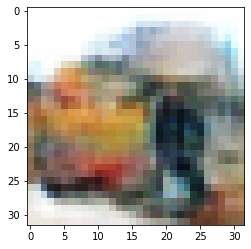

-> Epoch 65, Batch numero 1/78 -> Disc. loss on real images: 0.60406, Disc. loss on fake images: 0.43934, Generator loss: 1.26737
-> Epoch 65, Batch numero 2/78 -> Disc. loss on real images: 0.57412, Disc. loss on fake images: 0.68943, Generator loss: 1.23233
-> Epoch 65, Batch numero 3/78 -> Disc. loss on real images: 0.63639, Disc. loss on fake images: 0.50585, Generator loss: 1.25078
-> Epoch 65, Batch numero 4/78 -> Disc. loss on real images: 0.47887, Disc. loss on fake images: 0.77915, Generator loss: 1.15449
-> Epoch 65, Batch numero 5/78 -> Disc. loss on real images: 0.54663, Disc. loss on fake images: 0.54296, Generator loss: 1.16100
-> Epoch 65, Batch numero 6/78 -> Disc. loss on real images: 0.63917, Disc. loss on fake images: 0.56332, Generator loss: 1.23650
-> Epoch 65, Batch numero 7/78 -> Disc. loss on real images: 0.63112, Disc. loss on fake images: 0.56857, Generator loss: 1.17154
-> Epoch 65, Batch numero 8/78 -> Disc. loss on real images: 0.49896, Disc. loss on fake i

-> Epoch 65, Batch numero 65/78 -> Disc. loss on real images: 0.78647, Disc. loss on fake images: 0.51159, Generator loss: 1.17465
-> Epoch 65, Batch numero 66/78 -> Disc. loss on real images: 0.67405, Disc. loss on fake images: 0.68286, Generator loss: 1.19261
-> Epoch 65, Batch numero 67/78 -> Disc. loss on real images: 0.65152, Disc. loss on fake images: 0.68692, Generator loss: 1.40806
-> Epoch 65, Batch numero 68/78 -> Disc. loss on real images: 0.67041, Disc. loss on fake images: 0.56089, Generator loss: 1.30994
-> Epoch 65, Batch numero 69/78 -> Disc. loss on real images: 0.59198, Disc. loss on fake images: 0.50738, Generator loss: 1.26327
-> Epoch 65, Batch numero 70/78 -> Disc. loss on real images: 0.55000, Disc. loss on fake images: 0.65075, Generator loss: 1.16414
-> Epoch 65, Batch numero 71/78 -> Disc. loss on real images: 0.49094, Disc. loss on fake images: 0.52878, Generator loss: 1.25881
-> Epoch 65, Batch numero 72/78 -> Disc. loss on real images: 0.58540, Disc. loss o

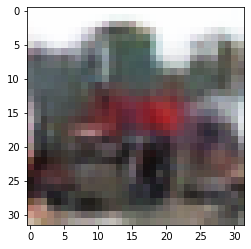

-> Epoch 66, Batch numero 1/78 -> Disc. loss on real images: 0.65006, Disc. loss on fake images: 0.72623, Generator loss: 1.23849
-> Epoch 66, Batch numero 2/78 -> Disc. loss on real images: 0.61291, Disc. loss on fake images: 0.50724, Generator loss: 1.22489
-> Epoch 66, Batch numero 3/78 -> Disc. loss on real images: 0.60356, Disc. loss on fake images: 0.54588, Generator loss: 1.19890
-> Epoch 66, Batch numero 4/78 -> Disc. loss on real images: 0.78199, Disc. loss on fake images: 0.44493, Generator loss: 1.03228
-> Epoch 66, Batch numero 5/78 -> Disc. loss on real images: 0.56713, Disc. loss on fake images: 0.61674, Generator loss: 1.06018
-> Epoch 66, Batch numero 6/78 -> Disc. loss on real images: 0.51033, Disc. loss on fake images: 0.68831, Generator loss: 1.13614
-> Epoch 66, Batch numero 7/78 -> Disc. loss on real images: 0.44351, Disc. loss on fake images: 0.48583, Generator loss: 1.26156
-> Epoch 66, Batch numero 8/78 -> Disc. loss on real images: 0.71936, Disc. loss on fake i

-> Epoch 66, Batch numero 64/78 -> Disc. loss on real images: 0.63125, Disc. loss on fake images: 0.55347, Generator loss: 1.16047
-> Epoch 66, Batch numero 65/78 -> Disc. loss on real images: 0.51478, Disc. loss on fake images: 0.57749, Generator loss: 1.20768
-> Epoch 66, Batch numero 66/78 -> Disc. loss on real images: 0.45352, Disc. loss on fake images: 0.57378, Generator loss: 1.10521
-> Epoch 66, Batch numero 67/78 -> Disc. loss on real images: 0.45469, Disc. loss on fake images: 0.55179, Generator loss: 1.36687
-> Epoch 66, Batch numero 68/78 -> Disc. loss on real images: 0.58152, Disc. loss on fake images: 0.49318, Generator loss: 1.23265
-> Epoch 66, Batch numero 69/78 -> Disc. loss on real images: 0.56964, Disc. loss on fake images: 0.53748, Generator loss: 1.23673
-> Epoch 66, Batch numero 70/78 -> Disc. loss on real images: 0.41746, Disc. loss on fake images: 0.62940, Generator loss: 1.29010
-> Epoch 66, Batch numero 71/78 -> Disc. loss on real images: 0.40733, Disc. loss o

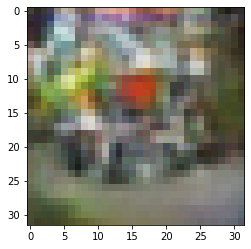

-> Epoch 67, Batch numero 1/78 -> Disc. loss on real images: 0.86316, Disc. loss on fake images: 0.51756, Generator loss: 1.37845
-> Epoch 67, Batch numero 2/78 -> Disc. loss on real images: 0.68319, Disc. loss on fake images: 0.43232, Generator loss: 1.31428
-> Epoch 67, Batch numero 3/78 -> Disc. loss on real images: 0.62196, Disc. loss on fake images: 0.62520, Generator loss: 1.26475
-> Epoch 67, Batch numero 4/78 -> Disc. loss on real images: 0.55690, Disc. loss on fake images: 0.46530, Generator loss: 1.25081
-> Epoch 67, Batch numero 5/78 -> Disc. loss on real images: 0.71644, Disc. loss on fake images: 0.73891, Generator loss: 1.21726
-> Epoch 67, Batch numero 6/78 -> Disc. loss on real images: 0.61871, Disc. loss on fake images: 0.56115, Generator loss: 1.22869
-> Epoch 67, Batch numero 7/78 -> Disc. loss on real images: 0.64267, Disc. loss on fake images: 0.54850, Generator loss: 1.21153
-> Epoch 67, Batch numero 8/78 -> Disc. loss on real images: 0.65084, Disc. loss on fake i

-> Epoch 67, Batch numero 65/78 -> Disc. loss on real images: 0.75977, Disc. loss on fake images: 0.52640, Generator loss: 1.28088
-> Epoch 67, Batch numero 66/78 -> Disc. loss on real images: 0.68179, Disc. loss on fake images: 0.46794, Generator loss: 1.27892
-> Epoch 67, Batch numero 67/78 -> Disc. loss on real images: 0.65686, Disc. loss on fake images: 0.59811, Generator loss: 1.21802
-> Epoch 67, Batch numero 68/78 -> Disc. loss on real images: 0.67357, Disc. loss on fake images: 0.64596, Generator loss: 1.25228
-> Epoch 67, Batch numero 69/78 -> Disc. loss on real images: 0.67465, Disc. loss on fake images: 0.53850, Generator loss: 1.28328
-> Epoch 67, Batch numero 70/78 -> Disc. loss on real images: 0.60729, Disc. loss on fake images: 0.45642, Generator loss: 1.21253
-> Epoch 67, Batch numero 71/78 -> Disc. loss on real images: 0.53916, Disc. loss on fake images: 0.55482, Generator loss: 1.13931
-> Epoch 67, Batch numero 72/78 -> Disc. loss on real images: 0.59297, Disc. loss o

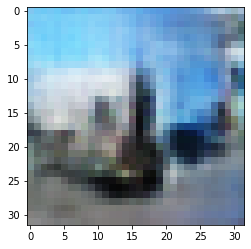

-> Epoch 68, Batch numero 1/78 -> Disc. loss on real images: 0.57384, Disc. loss on fake images: 0.64322, Generator loss: 0.93481
-> Epoch 68, Batch numero 2/78 -> Disc. loss on real images: 0.40924, Disc. loss on fake images: 0.60139, Generator loss: 1.24550
-> Epoch 68, Batch numero 3/78 -> Disc. loss on real images: 0.54886, Disc. loss on fake images: 0.53136, Generator loss: 1.24167
-> Epoch 68, Batch numero 4/78 -> Disc. loss on real images: 0.65558, Disc. loss on fake images: 0.53843, Generator loss: 1.13197
-> Epoch 68, Batch numero 5/78 -> Disc. loss on real images: 0.63857, Disc. loss on fake images: 0.59751, Generator loss: 1.11860
-> Epoch 68, Batch numero 6/78 -> Disc. loss on real images: 0.55428, Disc. loss on fake images: 0.59625, Generator loss: 1.23616
-> Epoch 68, Batch numero 7/78 -> Disc. loss on real images: 0.52538, Disc. loss on fake images: 0.51517, Generator loss: 1.24672
-> Epoch 68, Batch numero 8/78 -> Disc. loss on real images: 0.66329, Disc. loss on fake i

-> Epoch 68, Batch numero 64/78 -> Disc. loss on real images: 0.55114, Disc. loss on fake images: 0.62060, Generator loss: 1.09099
-> Epoch 68, Batch numero 65/78 -> Disc. loss on real images: 0.54965, Disc. loss on fake images: 0.50958, Generator loss: 1.28302
-> Epoch 68, Batch numero 66/78 -> Disc. loss on real images: 0.79208, Disc. loss on fake images: 0.71994, Generator loss: 1.15688
-> Epoch 68, Batch numero 67/78 -> Disc. loss on real images: 0.61885, Disc. loss on fake images: 0.59755, Generator loss: 1.31162
-> Epoch 68, Batch numero 68/78 -> Disc. loss on real images: 0.66961, Disc. loss on fake images: 0.52883, Generator loss: 1.10377
-> Epoch 68, Batch numero 69/78 -> Disc. loss on real images: 0.59782, Disc. loss on fake images: 0.67306, Generator loss: 1.09741
-> Epoch 68, Batch numero 70/78 -> Disc. loss on real images: 0.69660, Disc. loss on fake images: 0.62881, Generator loss: 1.18374
-> Epoch 68, Batch numero 71/78 -> Disc. loss on real images: 0.60960, Disc. loss o

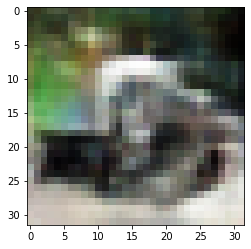

-> Epoch 69, Batch numero 1/78 -> Disc. loss on real images: 0.69134, Disc. loss on fake images: 0.60602, Generator loss: 1.01271
-> Epoch 69, Batch numero 2/78 -> Disc. loss on real images: 0.53889, Disc. loss on fake images: 0.66602, Generator loss: 1.10761
-> Epoch 69, Batch numero 3/78 -> Disc. loss on real images: 0.54463, Disc. loss on fake images: 0.61579, Generator loss: 1.18482
-> Epoch 69, Batch numero 4/78 -> Disc. loss on real images: 0.54168, Disc. loss on fake images: 0.61467, Generator loss: 1.20959
-> Epoch 69, Batch numero 5/78 -> Disc. loss on real images: 0.66360, Disc. loss on fake images: 0.55546, Generator loss: 1.16406
-> Epoch 69, Batch numero 6/78 -> Disc. loss on real images: 0.68485, Disc. loss on fake images: 0.60221, Generator loss: 1.17627
-> Epoch 69, Batch numero 7/78 -> Disc. loss on real images: 0.65807, Disc. loss on fake images: 0.55231, Generator loss: 1.15022
-> Epoch 69, Batch numero 8/78 -> Disc. loss on real images: 0.62728, Disc. loss on fake i

-> Epoch 69, Batch numero 65/78 -> Disc. loss on real images: 0.67571, Disc. loss on fake images: 0.61420, Generator loss: 1.02458
-> Epoch 69, Batch numero 66/78 -> Disc. loss on real images: 0.47486, Disc. loss on fake images: 0.68220, Generator loss: 1.10054
-> Epoch 69, Batch numero 67/78 -> Disc. loss on real images: 0.61447, Disc. loss on fake images: 0.82767, Generator loss: 1.20683
-> Epoch 69, Batch numero 68/78 -> Disc. loss on real images: 0.83882, Disc. loss on fake images: 0.49105, Generator loss: 1.08470
-> Epoch 69, Batch numero 69/78 -> Disc. loss on real images: 0.72244, Disc. loss on fake images: 0.52939, Generator loss: 1.06216
-> Epoch 69, Batch numero 70/78 -> Disc. loss on real images: 0.63455, Disc. loss on fake images: 0.65028, Generator loss: 1.13587
-> Epoch 69, Batch numero 71/78 -> Disc. loss on real images: 0.57661, Disc. loss on fake images: 0.68330, Generator loss: 1.15661
-> Epoch 69, Batch numero 72/78 -> Disc. loss on real images: 0.64878, Disc. loss o

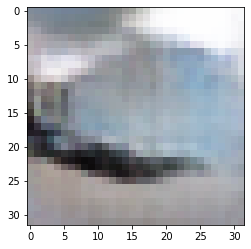

-> Epoch 70, Batch numero 1/78 -> Disc. loss on real images: 0.59090, Disc. loss on fake images: 0.57520, Generator loss: 1.19281
-> Epoch 70, Batch numero 2/78 -> Disc. loss on real images: 0.68469, Disc. loss on fake images: 0.66460, Generator loss: 1.12920
-> Epoch 70, Batch numero 3/78 -> Disc. loss on real images: 0.67718, Disc. loss on fake images: 0.53544, Generator loss: 1.22547
-> Epoch 70, Batch numero 4/78 -> Disc. loss on real images: 0.56171, Disc. loss on fake images: 0.68677, Generator loss: 1.31767
-> Epoch 70, Batch numero 5/78 -> Disc. loss on real images: 0.57022, Disc. loss on fake images: 0.53311, Generator loss: 1.36342
-> Epoch 70, Batch numero 6/78 -> Disc. loss on real images: 0.62440, Disc. loss on fake images: 0.48920, Generator loss: 1.18394
-> Epoch 70, Batch numero 7/78 -> Disc. loss on real images: 0.55881, Disc. loss on fake images: 0.59553, Generator loss: 1.12526
-> Epoch 70, Batch numero 8/78 -> Disc. loss on real images: 0.58029, Disc. loss on fake i

-> Epoch 70, Batch numero 65/78 -> Disc. loss on real images: 0.64257, Disc. loss on fake images: 0.49081, Generator loss: 1.25792
-> Epoch 70, Batch numero 66/78 -> Disc. loss on real images: 0.49647, Disc. loss on fake images: 0.39302, Generator loss: 1.32896
-> Epoch 70, Batch numero 67/78 -> Disc. loss on real images: 0.41828, Disc. loss on fake images: 0.49032, Generator loss: 1.14077
-> Epoch 70, Batch numero 68/78 -> Disc. loss on real images: 0.53954, Disc. loss on fake images: 0.58994, Generator loss: 1.09221
-> Epoch 70, Batch numero 69/78 -> Disc. loss on real images: 0.45730, Disc. loss on fake images: 0.63591, Generator loss: 1.04085
-> Epoch 70, Batch numero 70/78 -> Disc. loss on real images: 0.60195, Disc. loss on fake images: 0.96486, Generator loss: 1.13552
-> Epoch 70, Batch numero 71/78 -> Disc. loss on real images: 0.75198, Disc. loss on fake images: 0.46956, Generator loss: 1.31528
-> Epoch 70, Batch numero 72/78 -> Disc. loss on real images: 0.80602, Disc. loss o

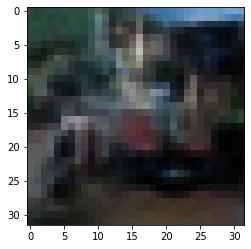

-> Epoch 71, Batch numero 1/78 -> Disc. loss on real images: 0.63494, Disc. loss on fake images: 0.54833, Generator loss: 1.09846
-> Epoch 71, Batch numero 2/78 -> Disc. loss on real images: 0.57982, Disc. loss on fake images: 0.53035, Generator loss: 1.11070
-> Epoch 71, Batch numero 3/78 -> Disc. loss on real images: 0.57508, Disc. loss on fake images: 0.61786, Generator loss: 1.02337
-> Epoch 71, Batch numero 4/78 -> Disc. loss on real images: 0.54893, Disc. loss on fake images: 0.62609, Generator loss: 1.03113
-> Epoch 71, Batch numero 5/78 -> Disc. loss on real images: 0.58510, Disc. loss on fake images: 0.58233, Generator loss: 1.18921
-> Epoch 71, Batch numero 6/78 -> Disc. loss on real images: 0.66490, Disc. loss on fake images: 0.47261, Generator loss: 1.11416
-> Epoch 71, Batch numero 7/78 -> Disc. loss on real images: 0.65479, Disc. loss on fake images: 0.66049, Generator loss: 1.11100
-> Epoch 71, Batch numero 8/78 -> Disc. loss on real images: 0.51468, Disc. loss on fake i

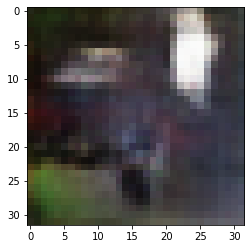

-> Epoch 72, Batch numero 1/78 -> Disc. loss on real images: 0.78846, Disc. loss on fake images: 0.50310, Generator loss: 1.14724
-> Epoch 72, Batch numero 2/78 -> Disc. loss on real images: 0.71353, Disc. loss on fake images: 0.52588, Generator loss: 1.02345
-> Epoch 72, Batch numero 3/78 -> Disc. loss on real images: 0.45425, Disc. loss on fake images: 0.66451, Generator loss: 1.07674
-> Epoch 72, Batch numero 4/78 -> Disc. loss on real images: 0.52087, Disc. loss on fake images: 0.65049, Generator loss: 1.14155
-> Epoch 72, Batch numero 5/78 -> Disc. loss on real images: 0.53479, Disc. loss on fake images: 0.50933, Generator loss: 1.14363
-> Epoch 72, Batch numero 6/78 -> Disc. loss on real images: 0.67007, Disc. loss on fake images: 0.60249, Generator loss: 0.95844
-> Epoch 72, Batch numero 7/78 -> Disc. loss on real images: 0.60851, Disc. loss on fake images: 0.61021, Generator loss: 1.09134
-> Epoch 72, Batch numero 8/78 -> Disc. loss on real images: 0.62499, Disc. loss on fake i

-> Epoch 72, Batch numero 65/78 -> Disc. loss on real images: 0.59549, Disc. loss on fake images: 0.64012, Generator loss: 1.18091
-> Epoch 72, Batch numero 66/78 -> Disc. loss on real images: 0.61034, Disc. loss on fake images: 0.62487, Generator loss: 1.24380
-> Epoch 72, Batch numero 67/78 -> Disc. loss on real images: 0.75109, Disc. loss on fake images: 0.49690, Generator loss: 1.17588
-> Epoch 72, Batch numero 68/78 -> Disc. loss on real images: 0.81445, Disc. loss on fake images: 0.51275, Generator loss: 1.26062
-> Epoch 72, Batch numero 69/78 -> Disc. loss on real images: 0.68208, Disc. loss on fake images: 0.59725, Generator loss: 1.28219
-> Epoch 72, Batch numero 70/78 -> Disc. loss on real images: 0.61860, Disc. loss on fake images: 0.47818, Generator loss: 1.21800
-> Epoch 72, Batch numero 71/78 -> Disc. loss on real images: 0.42612, Disc. loss on fake images: 0.72725, Generator loss: 1.23099
-> Epoch 72, Batch numero 72/78 -> Disc. loss on real images: 0.67781, Disc. loss o

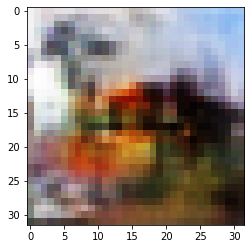

-> Epoch 73, Batch numero 1/78 -> Disc. loss on real images: 0.76844, Disc. loss on fake images: 0.51408, Generator loss: 1.09168
-> Epoch 73, Batch numero 2/78 -> Disc. loss on real images: 0.59537, Disc. loss on fake images: 0.47910, Generator loss: 1.18215
-> Epoch 73, Batch numero 3/78 -> Disc. loss on real images: 0.52322, Disc. loss on fake images: 0.57780, Generator loss: 1.17445
-> Epoch 73, Batch numero 4/78 -> Disc. loss on real images: 0.55703, Disc. loss on fake images: 0.57455, Generator loss: 1.08974
-> Epoch 73, Batch numero 5/78 -> Disc. loss on real images: 0.66445, Disc. loss on fake images: 0.70235, Generator loss: 1.10009
-> Epoch 73, Batch numero 6/78 -> Disc. loss on real images: 0.63293, Disc. loss on fake images: 0.63925, Generator loss: 1.21325
-> Epoch 73, Batch numero 7/78 -> Disc. loss on real images: 0.80145, Disc. loss on fake images: 0.59513, Generator loss: 1.05542
-> Epoch 73, Batch numero 8/78 -> Disc. loss on real images: 0.59181, Disc. loss on fake i

-> Epoch 73, Batch numero 65/78 -> Disc. loss on real images: 0.66732, Disc. loss on fake images: 0.59653, Generator loss: 1.06953
-> Epoch 73, Batch numero 66/78 -> Disc. loss on real images: 0.65960, Disc. loss on fake images: 0.65026, Generator loss: 1.00276
-> Epoch 73, Batch numero 67/78 -> Disc. loss on real images: 0.62891, Disc. loss on fake images: 0.68112, Generator loss: 1.06355
-> Epoch 73, Batch numero 68/78 -> Disc. loss on real images: 0.78820, Disc. loss on fake images: 0.66015, Generator loss: 1.08809
-> Epoch 73, Batch numero 69/78 -> Disc. loss on real images: 0.56447, Disc. loss on fake images: 0.56150, Generator loss: 1.00315
-> Epoch 73, Batch numero 70/78 -> Disc. loss on real images: 0.67064, Disc. loss on fake images: 0.52070, Generator loss: 0.96368
-> Epoch 73, Batch numero 71/78 -> Disc. loss on real images: 0.74240, Disc. loss on fake images: 0.67462, Generator loss: 0.99749
-> Epoch 73, Batch numero 72/78 -> Disc. loss on real images: 0.51211, Disc. loss o

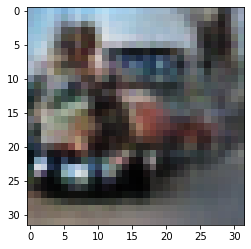

-> Epoch 74, Batch numero 1/78 -> Disc. loss on real images: 0.62709, Disc. loss on fake images: 0.57118, Generator loss: 0.95324
-> Epoch 74, Batch numero 2/78 -> Disc. loss on real images: 0.66779, Disc. loss on fake images: 0.70583, Generator loss: 0.96180
-> Epoch 74, Batch numero 3/78 -> Disc. loss on real images: 0.54500, Disc. loss on fake images: 0.64177, Generator loss: 1.03636
-> Epoch 74, Batch numero 4/78 -> Disc. loss on real images: 0.64411, Disc. loss on fake images: 0.59161, Generator loss: 1.10550
-> Epoch 74, Batch numero 5/78 -> Disc. loss on real images: 0.55981, Disc. loss on fake images: 0.58089, Generator loss: 1.02714
-> Epoch 74, Batch numero 6/78 -> Disc. loss on real images: 0.61656, Disc. loss on fake images: 0.55274, Generator loss: 1.04427
-> Epoch 74, Batch numero 7/78 -> Disc. loss on real images: 0.64145, Disc. loss on fake images: 0.61294, Generator loss: 1.01385
-> Epoch 74, Batch numero 8/78 -> Disc. loss on real images: 0.56079, Disc. loss on fake i

-> Epoch 74, Batch numero 64/78 -> Disc. loss on real images: 0.60671, Disc. loss on fake images: 0.54466, Generator loss: 1.09983
-> Epoch 74, Batch numero 65/78 -> Disc. loss on real images: 0.57324, Disc. loss on fake images: 0.53798, Generator loss: 1.02517
-> Epoch 74, Batch numero 66/78 -> Disc. loss on real images: 0.59972, Disc. loss on fake images: 0.60418, Generator loss: 1.00163
-> Epoch 74, Batch numero 67/78 -> Disc. loss on real images: 0.56464, Disc. loss on fake images: 0.75783, Generator loss: 0.99070
-> Epoch 74, Batch numero 68/78 -> Disc. loss on real images: 0.54357, Disc. loss on fake images: 0.65037, Generator loss: 1.04659
-> Epoch 74, Batch numero 69/78 -> Disc. loss on real images: 0.66742, Disc. loss on fake images: 0.55789, Generator loss: 1.04229
-> Epoch 74, Batch numero 70/78 -> Disc. loss on real images: 0.72328, Disc. loss on fake images: 0.64013, Generator loss: 0.98983
-> Epoch 74, Batch numero 71/78 -> Disc. loss on real images: 0.61481, Disc. loss o

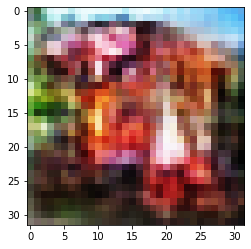

-> Epoch 75, Batch numero 1/78 -> Disc. loss on real images: 0.57064, Disc. loss on fake images: 0.65781, Generator loss: 1.34221
-> Epoch 75, Batch numero 2/78 -> Disc. loss on real images: 0.65364, Disc. loss on fake images: 0.62079, Generator loss: 1.21694
-> Epoch 75, Batch numero 3/78 -> Disc. loss on real images: 0.71910, Disc. loss on fake images: 0.60230, Generator loss: 0.98485
-> Epoch 75, Batch numero 4/78 -> Disc. loss on real images: 0.61837, Disc. loss on fake images: 0.57280, Generator loss: 1.02875
-> Epoch 75, Batch numero 5/78 -> Disc. loss on real images: 0.59535, Disc. loss on fake images: 0.70231, Generator loss: 1.08092
-> Epoch 75, Batch numero 6/78 -> Disc. loss on real images: 0.61335, Disc. loss on fake images: 0.56101, Generator loss: 1.23497
-> Epoch 75, Batch numero 7/78 -> Disc. loss on real images: 0.62659, Disc. loss on fake images: 0.47929, Generator loss: 1.19890
-> Epoch 75, Batch numero 8/78 -> Disc. loss on real images: 0.47271, Disc. loss on fake i

-> Epoch 75, Batch numero 64/78 -> Disc. loss on real images: 0.66008, Disc. loss on fake images: 0.67090, Generator loss: 1.13092
-> Epoch 75, Batch numero 65/78 -> Disc. loss on real images: 0.70970, Disc. loss on fake images: 0.52954, Generator loss: 1.18170
-> Epoch 75, Batch numero 66/78 -> Disc. loss on real images: 0.73323, Disc. loss on fake images: 0.50124, Generator loss: 1.15259
-> Epoch 75, Batch numero 67/78 -> Disc. loss on real images: 0.67990, Disc. loss on fake images: 0.65384, Generator loss: 1.07643
-> Epoch 75, Batch numero 68/78 -> Disc. loss on real images: 0.57654, Disc. loss on fake images: 0.60322, Generator loss: 1.01940
-> Epoch 75, Batch numero 69/78 -> Disc. loss on real images: 0.62568, Disc. loss on fake images: 0.66157, Generator loss: 0.97839
-> Epoch 75, Batch numero 70/78 -> Disc. loss on real images: 0.60509, Disc. loss on fake images: 0.45055, Generator loss: 1.01975
-> Epoch 75, Batch numero 71/78 -> Disc. loss on real images: 0.63674, Disc. loss o

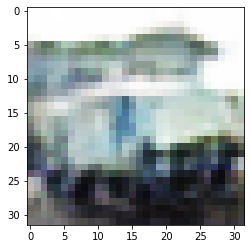

-> Epoch 76, Batch numero 1/78 -> Disc. loss on real images: 0.65912, Disc. loss on fake images: 0.57772, Generator loss: 1.04226
-> Epoch 76, Batch numero 2/78 -> Disc. loss on real images: 0.62501, Disc. loss on fake images: 0.65241, Generator loss: 1.09403
-> Epoch 76, Batch numero 3/78 -> Disc. loss on real images: 0.47973, Disc. loss on fake images: 0.57890, Generator loss: 1.26577
-> Epoch 76, Batch numero 4/78 -> Disc. loss on real images: 0.41804, Disc. loss on fake images: 0.61711, Generator loss: 1.23551
-> Epoch 76, Batch numero 5/78 -> Disc. loss on real images: 0.64718, Disc. loss on fake images: 0.44618, Generator loss: 1.19448
-> Epoch 76, Batch numero 6/78 -> Disc. loss on real images: 0.51159, Disc. loss on fake images: 0.60385, Generator loss: 1.25654
-> Epoch 76, Batch numero 7/78 -> Disc. loss on real images: 0.68630, Disc. loss on fake images: 0.63938, Generator loss: 1.10492
-> Epoch 76, Batch numero 8/78 -> Disc. loss on real images: 0.59409, Disc. loss on fake i

-> Epoch 76, Batch numero 64/78 -> Disc. loss on real images: 0.58878, Disc. loss on fake images: 0.54752, Generator loss: 0.98416
-> Epoch 76, Batch numero 65/78 -> Disc. loss on real images: 0.36135, Disc. loss on fake images: 0.62648, Generator loss: 0.99938
-> Epoch 76, Batch numero 66/78 -> Disc. loss on real images: 0.51739, Disc. loss on fake images: 0.57050, Generator loss: 1.00439
-> Epoch 76, Batch numero 67/78 -> Disc. loss on real images: 0.51875, Disc. loss on fake images: 0.65484, Generator loss: 1.02683
-> Epoch 76, Batch numero 68/78 -> Disc. loss on real images: 0.59102, Disc. loss on fake images: 0.65029, Generator loss: 1.14338
-> Epoch 76, Batch numero 69/78 -> Disc. loss on real images: 0.50279, Disc. loss on fake images: 0.61844, Generator loss: 1.18425
-> Epoch 76, Batch numero 70/78 -> Disc. loss on real images: 0.58746, Disc. loss on fake images: 0.57505, Generator loss: 1.25309
-> Epoch 76, Batch numero 71/78 -> Disc. loss on real images: 0.54064, Disc. loss o

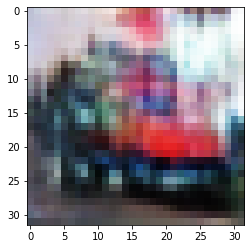

-> Epoch 77, Batch numero 1/78 -> Disc. loss on real images: 0.59192, Disc. loss on fake images: 0.56137, Generator loss: 1.11701
-> Epoch 77, Batch numero 2/78 -> Disc. loss on real images: 0.64023, Disc. loss on fake images: 0.54124, Generator loss: 1.23893
-> Epoch 77, Batch numero 3/78 -> Disc. loss on real images: 0.56263, Disc. loss on fake images: 0.65393, Generator loss: 1.15530
-> Epoch 77, Batch numero 4/78 -> Disc. loss on real images: 0.63652, Disc. loss on fake images: 0.53433, Generator loss: 1.15818
-> Epoch 77, Batch numero 5/78 -> Disc. loss on real images: 0.64734, Disc. loss on fake images: 0.63045, Generator loss: 1.13040
-> Epoch 77, Batch numero 6/78 -> Disc. loss on real images: 0.54734, Disc. loss on fake images: 0.68688, Generator loss: 1.09233
-> Epoch 77, Batch numero 7/78 -> Disc. loss on real images: 0.52793, Disc. loss on fake images: 0.63962, Generator loss: 1.08422
-> Epoch 77, Batch numero 8/78 -> Disc. loss on real images: 0.52533, Disc. loss on fake i

-> Epoch 77, Batch numero 65/78 -> Disc. loss on real images: 0.64838, Disc. loss on fake images: 0.53395, Generator loss: 1.16306
-> Epoch 77, Batch numero 66/78 -> Disc. loss on real images: 0.54332, Disc. loss on fake images: 0.50812, Generator loss: 1.04258
-> Epoch 77, Batch numero 67/78 -> Disc. loss on real images: 0.55236, Disc. loss on fake images: 0.56835, Generator loss: 1.06773
-> Epoch 77, Batch numero 68/78 -> Disc. loss on real images: 0.58744, Disc. loss on fake images: 0.63115, Generator loss: 1.12116
-> Epoch 77, Batch numero 69/78 -> Disc. loss on real images: 0.63425, Disc. loss on fake images: 0.56622, Generator loss: 1.23019
-> Epoch 77, Batch numero 70/78 -> Disc. loss on real images: 0.56192, Disc. loss on fake images: 0.51314, Generator loss: 1.15964
-> Epoch 77, Batch numero 71/78 -> Disc. loss on real images: 0.76113, Disc. loss on fake images: 0.55907, Generator loss: 1.16601
-> Epoch 77, Batch numero 72/78 -> Disc. loss on real images: 0.58524, Disc. loss o

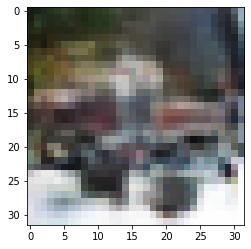

-> Epoch 78, Batch numero 1/78 -> Disc. loss on real images: 0.64435, Disc. loss on fake images: 0.67247, Generator loss: 1.09426
-> Epoch 78, Batch numero 2/78 -> Disc. loss on real images: 0.66433, Disc. loss on fake images: 0.51908, Generator loss: 1.16089
-> Epoch 78, Batch numero 3/78 -> Disc. loss on real images: 0.61579, Disc. loss on fake images: 0.58782, Generator loss: 1.17641
-> Epoch 78, Batch numero 4/78 -> Disc. loss on real images: 0.61103, Disc. loss on fake images: 0.57424, Generator loss: 1.16499
-> Epoch 78, Batch numero 5/78 -> Disc. loss on real images: 0.59761, Disc. loss on fake images: 0.63757, Generator loss: 1.19027
-> Epoch 78, Batch numero 6/78 -> Disc. loss on real images: 0.62952, Disc. loss on fake images: 0.58192, Generator loss: 1.21737
-> Epoch 78, Batch numero 7/78 -> Disc. loss on real images: 0.65189, Disc. loss on fake images: 0.57701, Generator loss: 1.12315
-> Epoch 78, Batch numero 8/78 -> Disc. loss on real images: 0.60851, Disc. loss on fake i

-> Epoch 78, Batch numero 64/78 -> Disc. loss on real images: 0.65083, Disc. loss on fake images: 0.56486, Generator loss: 1.12747
-> Epoch 78, Batch numero 65/78 -> Disc. loss on real images: 0.60825, Disc. loss on fake images: 0.60553, Generator loss: 1.13268
-> Epoch 78, Batch numero 66/78 -> Disc. loss on real images: 0.62354, Disc. loss on fake images: 0.60627, Generator loss: 1.20507
-> Epoch 78, Batch numero 67/78 -> Disc. loss on real images: 0.64243, Disc. loss on fake images: 0.52676, Generator loss: 1.14674
-> Epoch 78, Batch numero 68/78 -> Disc. loss on real images: 0.63766, Disc. loss on fake images: 0.60025, Generator loss: 1.08397
-> Epoch 78, Batch numero 69/78 -> Disc. loss on real images: 0.53626, Disc. loss on fake images: 0.58950, Generator loss: 1.08590
-> Epoch 78, Batch numero 70/78 -> Disc. loss on real images: 0.56158, Disc. loss on fake images: 0.60474, Generator loss: 1.05103
-> Epoch 78, Batch numero 71/78 -> Disc. loss on real images: 0.51098, Disc. loss o

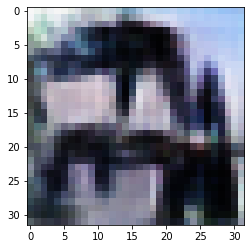

-> Epoch 79, Batch numero 1/78 -> Disc. loss on real images: 0.57701, Disc. loss on fake images: 0.61644, Generator loss: 1.02300
-> Epoch 79, Batch numero 2/78 -> Disc. loss on real images: 0.65349, Disc. loss on fake images: 0.63854, Generator loss: 1.13538
-> Epoch 79, Batch numero 3/78 -> Disc. loss on real images: 0.60015, Disc. loss on fake images: 0.61095, Generator loss: 1.28901
-> Epoch 79, Batch numero 4/78 -> Disc. loss on real images: 0.62233, Disc. loss on fake images: 0.58459, Generator loss: 1.20260
-> Epoch 79, Batch numero 5/78 -> Disc. loss on real images: 0.60405, Disc. loss on fake images: 0.51115, Generator loss: 1.13488
-> Epoch 79, Batch numero 6/78 -> Disc. loss on real images: 0.65665, Disc. loss on fake images: 0.60120, Generator loss: 1.07210
-> Epoch 79, Batch numero 7/78 -> Disc. loss on real images: 0.63693, Disc. loss on fake images: 0.58586, Generator loss: 1.06703
-> Epoch 79, Batch numero 8/78 -> Disc. loss on real images: 0.67699, Disc. loss on fake i

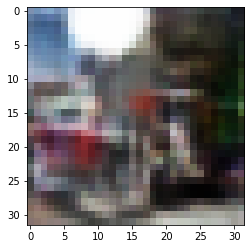

-> Epoch 80, Batch numero 1/78 -> Disc. loss on real images: 0.70314, Disc. loss on fake images: 0.56255, Generator loss: 1.03991
-> Epoch 80, Batch numero 2/78 -> Disc. loss on real images: 0.53975, Disc. loss on fake images: 0.72854, Generator loss: 1.13600
-> Epoch 80, Batch numero 3/78 -> Disc. loss on real images: 0.70747, Disc. loss on fake images: 0.68033, Generator loss: 1.22531
-> Epoch 80, Batch numero 4/78 -> Disc. loss on real images: 0.80713, Disc. loss on fake images: 0.45870, Generator loss: 1.08526
-> Epoch 80, Batch numero 5/78 -> Disc. loss on real images: 0.53820, Disc. loss on fake images: 0.53086, Generator loss: 1.06731
-> Epoch 80, Batch numero 6/78 -> Disc. loss on real images: 0.58571, Disc. loss on fake images: 0.68780, Generator loss: 1.17018
-> Epoch 80, Batch numero 7/78 -> Disc. loss on real images: 0.61086, Disc. loss on fake images: 0.63172, Generator loss: 1.13266
-> Epoch 80, Batch numero 8/78 -> Disc. loss on real images: 0.66080, Disc. loss on fake i

-> Epoch 80, Batch numero 65/78 -> Disc. loss on real images: 0.54581, Disc. loss on fake images: 0.66072, Generator loss: 1.05502
-> Epoch 80, Batch numero 66/78 -> Disc. loss on real images: 0.55591, Disc. loss on fake images: 0.70969, Generator loss: 1.12136
-> Epoch 80, Batch numero 67/78 -> Disc. loss on real images: 0.59312, Disc. loss on fake images: 0.62392, Generator loss: 1.17647
-> Epoch 80, Batch numero 68/78 -> Disc. loss on real images: 0.67715, Disc. loss on fake images: 0.46909, Generator loss: 1.09996
-> Epoch 80, Batch numero 69/78 -> Disc. loss on real images: 0.61328, Disc. loss on fake images: 0.63697, Generator loss: 1.05921
-> Epoch 80, Batch numero 70/78 -> Disc. loss on real images: 0.56107, Disc. loss on fake images: 0.68511, Generator loss: 1.00261
-> Epoch 80, Batch numero 71/78 -> Disc. loss on real images: 0.67859, Disc. loss on fake images: 0.66134, Generator loss: 1.13466
-> Epoch 80, Batch numero 72/78 -> Disc. loss on real images: 0.72917, Disc. loss o

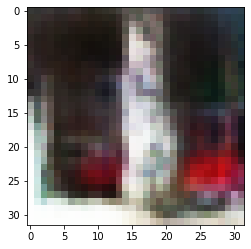

-> Epoch 81, Batch numero 1/78 -> Disc. loss on real images: 0.51256, Disc. loss on fake images: 0.75333, Generator loss: 1.05452
-> Epoch 81, Batch numero 2/78 -> Disc. loss on real images: 0.62767, Disc. loss on fake images: 0.56824, Generator loss: 0.92158
-> Epoch 81, Batch numero 3/78 -> Disc. loss on real images: 0.66501, Disc. loss on fake images: 0.76122, Generator loss: 1.04742
-> Epoch 81, Batch numero 4/78 -> Disc. loss on real images: 0.63187, Disc. loss on fake images: 0.58657, Generator loss: 1.19209
-> Epoch 81, Batch numero 5/78 -> Disc. loss on real images: 0.58453, Disc. loss on fake images: 0.53195, Generator loss: 1.21772
-> Epoch 81, Batch numero 6/78 -> Disc. loss on real images: 0.75252, Disc. loss on fake images: 0.57926, Generator loss: 1.13905
-> Epoch 81, Batch numero 7/78 -> Disc. loss on real images: 0.54253, Disc. loss on fake images: 0.67320, Generator loss: 1.01061
-> Epoch 81, Batch numero 8/78 -> Disc. loss on real images: 0.61374, Disc. loss on fake i

-> Epoch 81, Batch numero 64/78 -> Disc. loss on real images: 0.57729, Disc. loss on fake images: 0.65553, Generator loss: 0.96001
-> Epoch 81, Batch numero 65/78 -> Disc. loss on real images: 0.57997, Disc. loss on fake images: 0.66211, Generator loss: 0.92215
-> Epoch 81, Batch numero 66/78 -> Disc. loss on real images: 0.57744, Disc. loss on fake images: 0.80387, Generator loss: 0.93837
-> Epoch 81, Batch numero 67/78 -> Disc. loss on real images: 0.50029, Disc. loss on fake images: 0.63848, Generator loss: 1.06678
-> Epoch 81, Batch numero 68/78 -> Disc. loss on real images: 0.62503, Disc. loss on fake images: 0.56518, Generator loss: 1.08554
-> Epoch 81, Batch numero 69/78 -> Disc. loss on real images: 0.67230, Disc. loss on fake images: 0.56030, Generator loss: 1.16607
-> Epoch 81, Batch numero 70/78 -> Disc. loss on real images: 0.67003, Disc. loss on fake images: 0.62926, Generator loss: 1.19021
-> Epoch 81, Batch numero 71/78 -> Disc. loss on real images: 0.65420, Disc. loss o

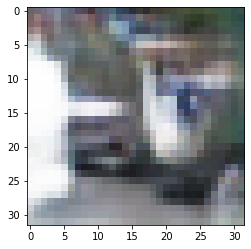

-> Epoch 82, Batch numero 1/78 -> Disc. loss on real images: 0.62358, Disc. loss on fake images: 0.53569, Generator loss: 1.03803
-> Epoch 82, Batch numero 2/78 -> Disc. loss on real images: 0.77913, Disc. loss on fake images: 0.59463, Generator loss: 1.05779
-> Epoch 82, Batch numero 3/78 -> Disc. loss on real images: 0.55675, Disc. loss on fake images: 0.70465, Generator loss: 1.09294
-> Epoch 82, Batch numero 4/78 -> Disc. loss on real images: 0.63283, Disc. loss on fake images: 0.59021, Generator loss: 1.03567
-> Epoch 82, Batch numero 5/78 -> Disc. loss on real images: 0.53107, Disc. loss on fake images: 0.70275, Generator loss: 1.06695
-> Epoch 82, Batch numero 6/78 -> Disc. loss on real images: 0.67987, Disc. loss on fake images: 0.62609, Generator loss: 1.11327
-> Epoch 82, Batch numero 7/78 -> Disc. loss on real images: 0.71663, Disc. loss on fake images: 0.52205, Generator loss: 1.06126
-> Epoch 82, Batch numero 8/78 -> Disc. loss on real images: 0.62640, Disc. loss on fake i

-> Epoch 82, Batch numero 64/78 -> Disc. loss on real images: 0.77521, Disc. loss on fake images: 0.59715, Generator loss: 0.94929
-> Epoch 82, Batch numero 65/78 -> Disc. loss on real images: 0.56923, Disc. loss on fake images: 0.67925, Generator loss: 0.99170
-> Epoch 82, Batch numero 66/78 -> Disc. loss on real images: 0.61796, Disc. loss on fake images: 0.60213, Generator loss: 0.97076
-> Epoch 82, Batch numero 67/78 -> Disc. loss on real images: 0.58764, Disc. loss on fake images: 0.62756, Generator loss: 1.05822
-> Epoch 82, Batch numero 68/78 -> Disc. loss on real images: 0.61348, Disc. loss on fake images: 0.52937, Generator loss: 1.05069
-> Epoch 82, Batch numero 69/78 -> Disc. loss on real images: 0.62428, Disc. loss on fake images: 0.59584, Generator loss: 0.95540
-> Epoch 82, Batch numero 70/78 -> Disc. loss on real images: 0.59816, Disc. loss on fake images: 0.67057, Generator loss: 1.07652
-> Epoch 82, Batch numero 71/78 -> Disc. loss on real images: 0.55899, Disc. loss o

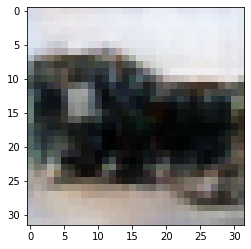

-> Epoch 83, Batch numero 1/78 -> Disc. loss on real images: 0.72695, Disc. loss on fake images: 0.71473, Generator loss: 1.06639
-> Epoch 83, Batch numero 2/78 -> Disc. loss on real images: 0.65382, Disc. loss on fake images: 0.55629, Generator loss: 1.12665
-> Epoch 83, Batch numero 3/78 -> Disc. loss on real images: 0.54349, Disc. loss on fake images: 0.60902, Generator loss: 1.11515
-> Epoch 83, Batch numero 4/78 -> Disc. loss on real images: 0.66180, Disc. loss on fake images: 0.61273, Generator loss: 1.06488
-> Epoch 83, Batch numero 5/78 -> Disc. loss on real images: 0.45749, Disc. loss on fake images: 0.62640, Generator loss: 1.11159
-> Epoch 83, Batch numero 6/78 -> Disc. loss on real images: 0.64879, Disc. loss on fake images: 0.55231, Generator loss: 1.04579
-> Epoch 83, Batch numero 7/78 -> Disc. loss on real images: 0.69035, Disc. loss on fake images: 0.57211, Generator loss: 1.11191
-> Epoch 83, Batch numero 8/78 -> Disc. loss on real images: 0.67438, Disc. loss on fake i

-> Epoch 83, Batch numero 64/78 -> Disc. loss on real images: 0.48303, Disc. loss on fake images: 0.68438, Generator loss: 0.95401
-> Epoch 83, Batch numero 65/78 -> Disc. loss on real images: 0.53539, Disc. loss on fake images: 0.58254, Generator loss: 1.11680
-> Epoch 83, Batch numero 66/78 -> Disc. loss on real images: 0.58557, Disc. loss on fake images: 0.62379, Generator loss: 1.13525
-> Epoch 83, Batch numero 67/78 -> Disc. loss on real images: 0.61357, Disc. loss on fake images: 0.56685, Generator loss: 1.29885
-> Epoch 83, Batch numero 68/78 -> Disc. loss on real images: 0.67780, Disc. loss on fake images: 0.46473, Generator loss: 1.17888
-> Epoch 83, Batch numero 69/78 -> Disc. loss on real images: 0.63482, Disc. loss on fake images: 0.60788, Generator loss: 1.07817
-> Epoch 83, Batch numero 70/78 -> Disc. loss on real images: 0.58105, Disc. loss on fake images: 0.65821, Generator loss: 1.16726
-> Epoch 83, Batch numero 71/78 -> Disc. loss on real images: 0.73816, Disc. loss o

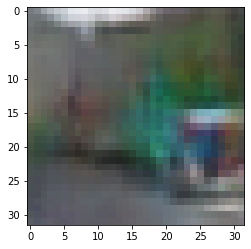

-> Epoch 84, Batch numero 1/78 -> Disc. loss on real images: 0.67624, Disc. loss on fake images: 0.62781, Generator loss: 1.11654
-> Epoch 84, Batch numero 2/78 -> Disc. loss on real images: 0.60580, Disc. loss on fake images: 0.57318, Generator loss: 1.09051
-> Epoch 84, Batch numero 3/78 -> Disc. loss on real images: 0.61479, Disc. loss on fake images: 0.64280, Generator loss: 1.11749
-> Epoch 84, Batch numero 4/78 -> Disc. loss on real images: 0.47665, Disc. loss on fake images: 0.53650, Generator loss: 1.13200
-> Epoch 84, Batch numero 5/78 -> Disc. loss on real images: 0.52885, Disc. loss on fake images: 0.62976, Generator loss: 1.06205
-> Epoch 84, Batch numero 6/78 -> Disc. loss on real images: 0.64016, Disc. loss on fake images: 0.60066, Generator loss: 1.02882
-> Epoch 84, Batch numero 7/78 -> Disc. loss on real images: 0.63014, Disc. loss on fake images: 0.59965, Generator loss: 1.16164
-> Epoch 84, Batch numero 8/78 -> Disc. loss on real images: 0.69509, Disc. loss on fake i

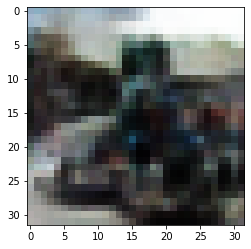

-> Epoch 85, Batch numero 1/78 -> Disc. loss on real images: 0.69017, Disc. loss on fake images: 0.53687, Generator loss: 0.99432
-> Epoch 85, Batch numero 2/78 -> Disc. loss on real images: 0.44240, Disc. loss on fake images: 0.57576, Generator loss: 1.08009
-> Epoch 85, Batch numero 3/78 -> Disc. loss on real images: 0.66692, Disc. loss on fake images: 0.61977, Generator loss: 1.04254
-> Epoch 85, Batch numero 4/78 -> Disc. loss on real images: 0.61670, Disc. loss on fake images: 0.77550, Generator loss: 0.94645
-> Epoch 85, Batch numero 5/78 -> Disc. loss on real images: 0.58464, Disc. loss on fake images: 0.69505, Generator loss: 0.95769
-> Epoch 85, Batch numero 6/78 -> Disc. loss on real images: 0.56141, Disc. loss on fake images: 0.61027, Generator loss: 1.09358
-> Epoch 85, Batch numero 7/78 -> Disc. loss on real images: 0.54363, Disc. loss on fake images: 0.58797, Generator loss: 1.20064
-> Epoch 85, Batch numero 8/78 -> Disc. loss on real images: 0.70086, Disc. loss on fake i

-> Epoch 85, Batch numero 65/78 -> Disc. loss on real images: 0.40424, Disc. loss on fake images: 0.63674, Generator loss: 1.16901
-> Epoch 85, Batch numero 66/78 -> Disc. loss on real images: 0.70726, Disc. loss on fake images: 0.70608, Generator loss: 1.16868
-> Epoch 85, Batch numero 67/78 -> Disc. loss on real images: 0.74060, Disc. loss on fake images: 0.45910, Generator loss: 1.21573
-> Epoch 85, Batch numero 68/78 -> Disc. loss on real images: 0.45074, Disc. loss on fake images: 0.54822, Generator loss: 1.22594
-> Epoch 85, Batch numero 69/78 -> Disc. loss on real images: 0.67038, Disc. loss on fake images: 0.59245, Generator loss: 1.29561
-> Epoch 85, Batch numero 70/78 -> Disc. loss on real images: 0.66580, Disc. loss on fake images: 0.60420, Generator loss: 1.08532
-> Epoch 85, Batch numero 71/78 -> Disc. loss on real images: 0.62975, Disc. loss on fake images: 0.59909, Generator loss: 1.11099
-> Epoch 85, Batch numero 72/78 -> Disc. loss on real images: 0.54768, Disc. loss o

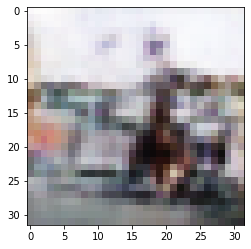

-> Epoch 86, Batch numero 1/78 -> Disc. loss on real images: 0.58876, Disc. loss on fake images: 0.71524, Generator loss: 1.14430
-> Epoch 86, Batch numero 2/78 -> Disc. loss on real images: 0.60270, Disc. loss on fake images: 0.57922, Generator loss: 1.12353
-> Epoch 86, Batch numero 3/78 -> Disc. loss on real images: 0.59665, Disc. loss on fake images: 0.57885, Generator loss: 1.16956
-> Epoch 86, Batch numero 4/78 -> Disc. loss on real images: 0.72592, Disc. loss on fake images: 0.59434, Generator loss: 1.06783
-> Epoch 86, Batch numero 5/78 -> Disc. loss on real images: 0.67643, Disc. loss on fake images: 0.65807, Generator loss: 0.96657
-> Epoch 86, Batch numero 6/78 -> Disc. loss on real images: 0.61313, Disc. loss on fake images: 0.59338, Generator loss: 1.11534
-> Epoch 86, Batch numero 7/78 -> Disc. loss on real images: 0.72347, Disc. loss on fake images: 0.65940, Generator loss: 1.06917
-> Epoch 86, Batch numero 8/78 -> Disc. loss on real images: 0.61632, Disc. loss on fake i

-> Epoch 86, Batch numero 64/78 -> Disc. loss on real images: 0.68171, Disc. loss on fake images: 0.60816, Generator loss: 0.99976
-> Epoch 86, Batch numero 65/78 -> Disc. loss on real images: 0.69937, Disc. loss on fake images: 0.59585, Generator loss: 1.07580
-> Epoch 86, Batch numero 66/78 -> Disc. loss on real images: 0.55021, Disc. loss on fake images: 0.53945, Generator loss: 0.92584
-> Epoch 86, Batch numero 67/78 -> Disc. loss on real images: 0.54245, Disc. loss on fake images: 0.79581, Generator loss: 0.94724
-> Epoch 86, Batch numero 68/78 -> Disc. loss on real images: 0.63336, Disc. loss on fake images: 0.57490, Generator loss: 1.10500
-> Epoch 86, Batch numero 69/78 -> Disc. loss on real images: 0.62217, Disc. loss on fake images: 0.61731, Generator loss: 1.14362
-> Epoch 86, Batch numero 70/78 -> Disc. loss on real images: 0.62524, Disc. loss on fake images: 0.52528, Generator loss: 1.15663
-> Epoch 86, Batch numero 71/78 -> Disc. loss on real images: 0.58923, Disc. loss o

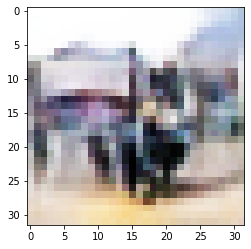

-> Epoch 87, Batch numero 1/78 -> Disc. loss on real images: 0.62515, Disc. loss on fake images: 0.58924, Generator loss: 0.96276
-> Epoch 87, Batch numero 2/78 -> Disc. loss on real images: 0.72124, Disc. loss on fake images: 0.61939, Generator loss: 1.02326
-> Epoch 87, Batch numero 3/78 -> Disc. loss on real images: 0.51696, Disc. loss on fake images: 0.70685, Generator loss: 1.03119
-> Epoch 87, Batch numero 4/78 -> Disc. loss on real images: 0.68921, Disc. loss on fake images: 0.56193, Generator loss: 1.10403
-> Epoch 87, Batch numero 5/78 -> Disc. loss on real images: 0.67014, Disc. loss on fake images: 0.59780, Generator loss: 1.11769
-> Epoch 87, Batch numero 6/78 -> Disc. loss on real images: 0.69300, Disc. loss on fake images: 0.74204, Generator loss: 1.01427
-> Epoch 87, Batch numero 7/78 -> Disc. loss on real images: 0.65469, Disc. loss on fake images: 0.56653, Generator loss: 1.08652
-> Epoch 87, Batch numero 8/78 -> Disc. loss on real images: 0.48894, Disc. loss on fake i

-> Epoch 87, Batch numero 64/78 -> Disc. loss on real images: 0.52146, Disc. loss on fake images: 0.69829, Generator loss: 1.05627
-> Epoch 87, Batch numero 65/78 -> Disc. loss on real images: 0.57984, Disc. loss on fake images: 0.66526, Generator loss: 0.99183
-> Epoch 87, Batch numero 66/78 -> Disc. loss on real images: 0.55064, Disc. loss on fake images: 0.68283, Generator loss: 0.93378
-> Epoch 87, Batch numero 67/78 -> Disc. loss on real images: 0.52934, Disc. loss on fake images: 0.64055, Generator loss: 0.99952
-> Epoch 87, Batch numero 68/78 -> Disc. loss on real images: 0.72572, Disc. loss on fake images: 0.57475, Generator loss: 1.05885
-> Epoch 87, Batch numero 69/78 -> Disc. loss on real images: 0.53422, Disc. loss on fake images: 0.54639, Generator loss: 1.06889
-> Epoch 87, Batch numero 70/78 -> Disc. loss on real images: 0.58599, Disc. loss on fake images: 0.54589, Generator loss: 1.13033
-> Epoch 87, Batch numero 71/78 -> Disc. loss on real images: 0.61235, Disc. loss o

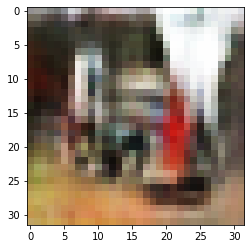

-> Epoch 88, Batch numero 1/78 -> Disc. loss on real images: 0.57070, Disc. loss on fake images: 0.53137, Generator loss: 1.05703
-> Epoch 88, Batch numero 2/78 -> Disc. loss on real images: 0.55421, Disc. loss on fake images: 0.62097, Generator loss: 1.13111
-> Epoch 88, Batch numero 3/78 -> Disc. loss on real images: 0.68538, Disc. loss on fake images: 0.61324, Generator loss: 1.07526
-> Epoch 88, Batch numero 4/78 -> Disc. loss on real images: 0.62726, Disc. loss on fake images: 0.60615, Generator loss: 1.16419
-> Epoch 88, Batch numero 5/78 -> Disc. loss on real images: 0.63610, Disc. loss on fake images: 0.66858, Generator loss: 1.01229
-> Epoch 88, Batch numero 6/78 -> Disc. loss on real images: 0.68783, Disc. loss on fake images: 0.58677, Generator loss: 1.09486
-> Epoch 88, Batch numero 7/78 -> Disc. loss on real images: 0.67490, Disc. loss on fake images: 0.69025, Generator loss: 0.96978
-> Epoch 88, Batch numero 8/78 -> Disc. loss on real images: 0.54463, Disc. loss on fake i

-> Epoch 88, Batch numero 65/78 -> Disc. loss on real images: 0.58519, Disc. loss on fake images: 0.65684, Generator loss: 1.20635
-> Epoch 88, Batch numero 66/78 -> Disc. loss on real images: 0.66356, Disc. loss on fake images: 0.45247, Generator loss: 1.18295
-> Epoch 88, Batch numero 67/78 -> Disc. loss on real images: 0.54775, Disc. loss on fake images: 0.48014, Generator loss: 1.13373
-> Epoch 88, Batch numero 68/78 -> Disc. loss on real images: 0.74217, Disc. loss on fake images: 0.75321, Generator loss: 0.97571
-> Epoch 88, Batch numero 69/78 -> Disc. loss on real images: 0.48902, Disc. loss on fake images: 0.69957, Generator loss: 1.23198
-> Epoch 88, Batch numero 70/78 -> Disc. loss on real images: 0.61181, Disc. loss on fake images: 0.58439, Generator loss: 1.18788
-> Epoch 88, Batch numero 71/78 -> Disc. loss on real images: 0.74815, Disc. loss on fake images: 0.48570, Generator loss: 1.13172
-> Epoch 88, Batch numero 72/78 -> Disc. loss on real images: 0.76840, Disc. loss o

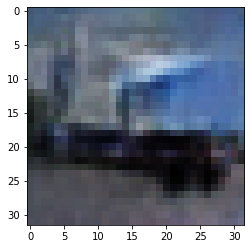

-> Epoch 89, Batch numero 1/78 -> Disc. loss on real images: 0.63716, Disc. loss on fake images: 0.60972, Generator loss: 1.01746
-> Epoch 89, Batch numero 2/78 -> Disc. loss on real images: 0.63223, Disc. loss on fake images: 0.71330, Generator loss: 1.04723
-> Epoch 89, Batch numero 3/78 -> Disc. loss on real images: 0.69453, Disc. loss on fake images: 0.64690, Generator loss: 0.98669
-> Epoch 89, Batch numero 4/78 -> Disc. loss on real images: 0.73478, Disc. loss on fake images: 0.66651, Generator loss: 1.05202
-> Epoch 89, Batch numero 5/78 -> Disc. loss on real images: 0.65508, Disc. loss on fake images: 0.63284, Generator loss: 1.06421
-> Epoch 89, Batch numero 6/78 -> Disc. loss on real images: 0.59659, Disc. loss on fake images: 0.49795, Generator loss: 1.16554
-> Epoch 89, Batch numero 7/78 -> Disc. loss on real images: 0.63631, Disc. loss on fake images: 0.67868, Generator loss: 1.09585
-> Epoch 89, Batch numero 8/78 -> Disc. loss on real images: 0.73325, Disc. loss on fake i

-> Epoch 89, Batch numero 64/78 -> Disc. loss on real images: 0.66824, Disc. loss on fake images: 0.61948, Generator loss: 1.09492
-> Epoch 89, Batch numero 65/78 -> Disc. loss on real images: 0.57532, Disc. loss on fake images: 0.60040, Generator loss: 1.10978
-> Epoch 89, Batch numero 66/78 -> Disc. loss on real images: 0.49499, Disc. loss on fake images: 0.51666, Generator loss: 1.21797
-> Epoch 89, Batch numero 67/78 -> Disc. loss on real images: 0.66374, Disc. loss on fake images: 0.54579, Generator loss: 1.10317
-> Epoch 89, Batch numero 68/78 -> Disc. loss on real images: 0.60592, Disc. loss on fake images: 0.59905, Generator loss: 1.17317
-> Epoch 89, Batch numero 69/78 -> Disc. loss on real images: 0.62486, Disc. loss on fake images: 0.53324, Generator loss: 1.12009
-> Epoch 89, Batch numero 70/78 -> Disc. loss on real images: 0.72191, Disc. loss on fake images: 0.67134, Generator loss: 1.01021
-> Epoch 89, Batch numero 71/78 -> Disc. loss on real images: 0.63588, Disc. loss o

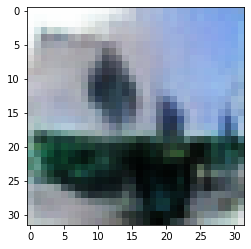

-> Epoch 90, Batch numero 1/78 -> Disc. loss on real images: 0.70695, Disc. loss on fake images: 0.51069, Generator loss: 1.14010
-> Epoch 90, Batch numero 2/78 -> Disc. loss on real images: 0.63913, Disc. loss on fake images: 0.64785, Generator loss: 1.19067
-> Epoch 90, Batch numero 3/78 -> Disc. loss on real images: 0.61291, Disc. loss on fake images: 0.35644, Generator loss: 1.32842
-> Epoch 90, Batch numero 4/78 -> Disc. loss on real images: 0.64147, Disc. loss on fake images: 0.44978, Generator loss: 1.29961
-> Epoch 90, Batch numero 5/78 -> Disc. loss on real images: 0.50101, Disc. loss on fake images: 0.65820, Generator loss: 1.16907
-> Epoch 90, Batch numero 6/78 -> Disc. loss on real images: 0.38065, Disc. loss on fake images: 0.61236, Generator loss: 1.03415
-> Epoch 90, Batch numero 7/78 -> Disc. loss on real images: 0.52189, Disc. loss on fake images: 0.87645, Generator loss: 1.06672
-> Epoch 90, Batch numero 8/78 -> Disc. loss on real images: 0.67847, Disc. loss on fake i

-> Epoch 90, Batch numero 64/78 -> Disc. loss on real images: 0.70991, Disc. loss on fake images: 0.62820, Generator loss: 1.16369
-> Epoch 90, Batch numero 65/78 -> Disc. loss on real images: 0.61737, Disc. loss on fake images: 0.60914, Generator loss: 1.08182
-> Epoch 90, Batch numero 66/78 -> Disc. loss on real images: 0.64334, Disc. loss on fake images: 0.59380, Generator loss: 1.02231
-> Epoch 90, Batch numero 67/78 -> Disc. loss on real images: 0.55494, Disc. loss on fake images: 0.59685, Generator loss: 0.91648
-> Epoch 90, Batch numero 68/78 -> Disc. loss on real images: 0.58788, Disc. loss on fake images: 0.76380, Generator loss: 1.03335
-> Epoch 90, Batch numero 69/78 -> Disc. loss on real images: 0.61464, Disc. loss on fake images: 0.59490, Generator loss: 1.06526
-> Epoch 90, Batch numero 70/78 -> Disc. loss on real images: 0.58361, Disc. loss on fake images: 0.51808, Generator loss: 1.19904
-> Epoch 90, Batch numero 71/78 -> Disc. loss on real images: 0.62150, Disc. loss o

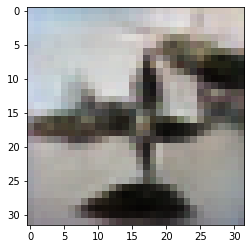

-> Epoch 91, Batch numero 1/78 -> Disc. loss on real images: 0.55197, Disc. loss on fake images: 0.50036, Generator loss: 1.06734
-> Epoch 91, Batch numero 2/78 -> Disc. loss on real images: 0.55445, Disc. loss on fake images: 0.73489, Generator loss: 1.10017
-> Epoch 91, Batch numero 3/78 -> Disc. loss on real images: 0.52572, Disc. loss on fake images: 0.63298, Generator loss: 1.13134
-> Epoch 91, Batch numero 4/78 -> Disc. loss on real images: 0.71189, Disc. loss on fake images: 0.64225, Generator loss: 1.02288
-> Epoch 91, Batch numero 5/78 -> Disc. loss on real images: 0.68263, Disc. loss on fake images: 0.61556, Generator loss: 0.88970
-> Epoch 91, Batch numero 6/78 -> Disc. loss on real images: 0.55265, Disc. loss on fake images: 0.71457, Generator loss: 0.89664
-> Epoch 91, Batch numero 7/78 -> Disc. loss on real images: 0.60348, Disc. loss on fake images: 0.68033, Generator loss: 1.09165
-> Epoch 91, Batch numero 8/78 -> Disc. loss on real images: 0.59465, Disc. loss on fake i

-> Epoch 91, Batch numero 64/78 -> Disc. loss on real images: 0.60246, Disc. loss on fake images: 0.62633, Generator loss: 1.06216
-> Epoch 91, Batch numero 65/78 -> Disc. loss on real images: 0.62677, Disc. loss on fake images: 0.50715, Generator loss: 1.14244
-> Epoch 91, Batch numero 66/78 -> Disc. loss on real images: 0.74748, Disc. loss on fake images: 0.65058, Generator loss: 1.11572
-> Epoch 91, Batch numero 67/78 -> Disc. loss on real images: 0.58575, Disc. loss on fake images: 0.61463, Generator loss: 1.18933
-> Epoch 91, Batch numero 68/78 -> Disc. loss on real images: 0.60586, Disc. loss on fake images: 0.55670, Generator loss: 1.13920
-> Epoch 91, Batch numero 69/78 -> Disc. loss on real images: 0.49170, Disc. loss on fake images: 0.58156, Generator loss: 1.06883
-> Epoch 91, Batch numero 70/78 -> Disc. loss on real images: 0.71511, Disc. loss on fake images: 0.58699, Generator loss: 0.93791
-> Epoch 91, Batch numero 71/78 -> Disc. loss on real images: 0.54936, Disc. loss o

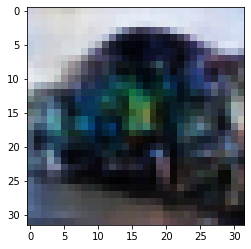

-> Epoch 92, Batch numero 1/78 -> Disc. loss on real images: 0.67143, Disc. loss on fake images: 0.51404, Generator loss: 1.24140
-> Epoch 92, Batch numero 2/78 -> Disc. loss on real images: 0.59581, Disc. loss on fake images: 0.54151, Generator loss: 1.14413
-> Epoch 92, Batch numero 3/78 -> Disc. loss on real images: 0.60697, Disc. loss on fake images: 0.54713, Generator loss: 1.01970
-> Epoch 92, Batch numero 4/78 -> Disc. loss on real images: 0.55076, Disc. loss on fake images: 0.68067, Generator loss: 1.01711
-> Epoch 92, Batch numero 5/78 -> Disc. loss on real images: 0.51715, Disc. loss on fake images: 0.70359, Generator loss: 1.13907
-> Epoch 92, Batch numero 6/78 -> Disc. loss on real images: 0.57545, Disc. loss on fake images: 0.51521, Generator loss: 1.30234
-> Epoch 92, Batch numero 7/78 -> Disc. loss on real images: 0.67028, Disc. loss on fake images: 0.63416, Generator loss: 1.12397
-> Epoch 92, Batch numero 8/78 -> Disc. loss on real images: 0.50637, Disc. loss on fake i

-> Epoch 92, Batch numero 64/78 -> Disc. loss on real images: 0.61396, Disc. loss on fake images: 0.58517, Generator loss: 1.18589
-> Epoch 92, Batch numero 65/78 -> Disc. loss on real images: 0.61528, Disc. loss on fake images: 0.60086, Generator loss: 1.16970
-> Epoch 92, Batch numero 66/78 -> Disc. loss on real images: 0.60947, Disc. loss on fake images: 0.61242, Generator loss: 1.08138
-> Epoch 92, Batch numero 67/78 -> Disc. loss on real images: 0.79914, Disc. loss on fake images: 0.64236, Generator loss: 1.05437
-> Epoch 92, Batch numero 68/78 -> Disc. loss on real images: 0.64870, Disc. loss on fake images: 0.59450, Generator loss: 1.09179
-> Epoch 92, Batch numero 69/78 -> Disc. loss on real images: 0.67899, Disc. loss on fake images: 0.43707, Generator loss: 1.21042
-> Epoch 92, Batch numero 70/78 -> Disc. loss on real images: 0.69860, Disc. loss on fake images: 0.53553, Generator loss: 1.29123
-> Epoch 92, Batch numero 71/78 -> Disc. loss on real images: 0.61417, Disc. loss o

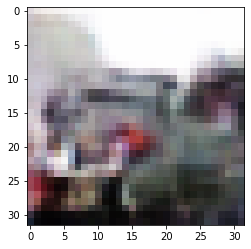

-> Epoch 93, Batch numero 1/78 -> Disc. loss on real images: 0.65746, Disc. loss on fake images: 0.60043, Generator loss: 1.15509
-> Epoch 93, Batch numero 2/78 -> Disc. loss on real images: 0.69198, Disc. loss on fake images: 0.53917, Generator loss: 1.09298
-> Epoch 93, Batch numero 3/78 -> Disc. loss on real images: 0.61186, Disc. loss on fake images: 0.68673, Generator loss: 1.28459
-> Epoch 93, Batch numero 4/78 -> Disc. loss on real images: 0.77480, Disc. loss on fake images: 0.46674, Generator loss: 1.12840
-> Epoch 93, Batch numero 5/78 -> Disc. loss on real images: 0.71333, Disc. loss on fake images: 0.58211, Generator loss: 1.04672
-> Epoch 93, Batch numero 6/78 -> Disc. loss on real images: 0.68055, Disc. loss on fake images: 0.69445, Generator loss: 0.98320
-> Epoch 93, Batch numero 7/78 -> Disc. loss on real images: 0.51841, Disc. loss on fake images: 0.63171, Generator loss: 0.95413
-> Epoch 93, Batch numero 8/78 -> Disc. loss on real images: 0.64051, Disc. loss on fake i

-> Epoch 93, Batch numero 64/78 -> Disc. loss on real images: 0.52556, Disc. loss on fake images: 0.52063, Generator loss: 1.08159
-> Epoch 93, Batch numero 65/78 -> Disc. loss on real images: 0.53335, Disc. loss on fake images: 0.69323, Generator loss: 1.04233
-> Epoch 93, Batch numero 66/78 -> Disc. loss on real images: 0.57088, Disc. loss on fake images: 0.59003, Generator loss: 1.04562
-> Epoch 93, Batch numero 67/78 -> Disc. loss on real images: 0.71893, Disc. loss on fake images: 0.61466, Generator loss: 0.95506
-> Epoch 93, Batch numero 68/78 -> Disc. loss on real images: 0.50066, Disc. loss on fake images: 0.65995, Generator loss: 1.00365
-> Epoch 93, Batch numero 69/78 -> Disc. loss on real images: 0.70091, Disc. loss on fake images: 0.68163, Generator loss: 0.95104
-> Epoch 93, Batch numero 70/78 -> Disc. loss on real images: 0.58355, Disc. loss on fake images: 0.58199, Generator loss: 1.08846
-> Epoch 93, Batch numero 71/78 -> Disc. loss on real images: 0.54912, Disc. loss o

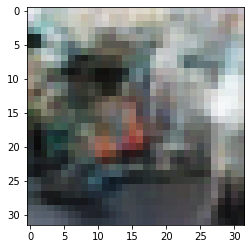

-> Epoch 94, Batch numero 1/78 -> Disc. loss on real images: 0.72320, Disc. loss on fake images: 0.47153, Generator loss: 1.13791
-> Epoch 94, Batch numero 2/78 -> Disc. loss on real images: 0.67212, Disc. loss on fake images: 0.57543, Generator loss: 1.05382
-> Epoch 94, Batch numero 3/78 -> Disc. loss on real images: 0.55792, Disc. loss on fake images: 0.66486, Generator loss: 1.09551
-> Epoch 94, Batch numero 4/78 -> Disc. loss on real images: 0.57924, Disc. loss on fake images: 0.58400, Generator loss: 1.01854
-> Epoch 94, Batch numero 5/78 -> Disc. loss on real images: 0.62804, Disc. loss on fake images: 0.72249, Generator loss: 1.01841
-> Epoch 94, Batch numero 6/78 -> Disc. loss on real images: 0.53822, Disc. loss on fake images: 0.67605, Generator loss: 1.01435
-> Epoch 94, Batch numero 7/78 -> Disc. loss on real images: 0.70810, Disc. loss on fake images: 0.54549, Generator loss: 1.07216
-> Epoch 94, Batch numero 8/78 -> Disc. loss on real images: 0.69948, Disc. loss on fake i

-> Epoch 94, Batch numero 64/78 -> Disc. loss on real images: 0.65702, Disc. loss on fake images: 0.65159, Generator loss: 1.06664
-> Epoch 94, Batch numero 65/78 -> Disc. loss on real images: 0.63979, Disc. loss on fake images: 0.64513, Generator loss: 1.02099
-> Epoch 94, Batch numero 66/78 -> Disc. loss on real images: 0.65756, Disc. loss on fake images: 0.52605, Generator loss: 1.13701
-> Epoch 94, Batch numero 67/78 -> Disc. loss on real images: 0.65099, Disc. loss on fake images: 0.56853, Generator loss: 1.20143
-> Epoch 94, Batch numero 68/78 -> Disc. loss on real images: 0.55178, Disc. loss on fake images: 0.65186, Generator loss: 0.97328
-> Epoch 94, Batch numero 69/78 -> Disc. loss on real images: 0.61422, Disc. loss on fake images: 0.73691, Generator loss: 1.19443
-> Epoch 94, Batch numero 70/78 -> Disc. loss on real images: 0.74217, Disc. loss on fake images: 0.68743, Generator loss: 1.16549
-> Epoch 94, Batch numero 71/78 -> Disc. loss on real images: 0.84957, Disc. loss o

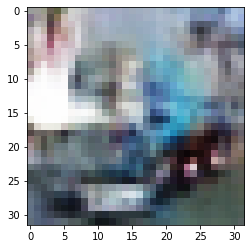

-> Epoch 95, Batch numero 1/78 -> Disc. loss on real images: 0.56010, Disc. loss on fake images: 0.52919, Generator loss: 1.04315
-> Epoch 95, Batch numero 2/78 -> Disc. loss on real images: 0.65275, Disc. loss on fake images: 0.63333, Generator loss: 1.00398
-> Epoch 95, Batch numero 3/78 -> Disc. loss on real images: 0.61422, Disc. loss on fake images: 0.68599, Generator loss: 0.93654
-> Epoch 95, Batch numero 4/78 -> Disc. loss on real images: 0.54221, Disc. loss on fake images: 0.61293, Generator loss: 1.16332
-> Epoch 95, Batch numero 5/78 -> Disc. loss on real images: 0.62918, Disc. loss on fake images: 0.59014, Generator loss: 1.08546
-> Epoch 95, Batch numero 6/78 -> Disc. loss on real images: 0.64191, Disc. loss on fake images: 0.50861, Generator loss: 1.12664
-> Epoch 95, Batch numero 7/78 -> Disc. loss on real images: 0.69499, Disc. loss on fake images: 0.67274, Generator loss: 1.07297
-> Epoch 95, Batch numero 8/78 -> Disc. loss on real images: 0.64224, Disc. loss on fake i

-> Epoch 95, Batch numero 64/78 -> Disc. loss on real images: 0.61668, Disc. loss on fake images: 0.48552, Generator loss: 1.02870
-> Epoch 95, Batch numero 65/78 -> Disc. loss on real images: 0.67473, Disc. loss on fake images: 0.67377, Generator loss: 1.06688
-> Epoch 95, Batch numero 66/78 -> Disc. loss on real images: 0.64717, Disc. loss on fake images: 0.57177, Generator loss: 1.01925
-> Epoch 95, Batch numero 67/78 -> Disc. loss on real images: 0.55852, Disc. loss on fake images: 0.61635, Generator loss: 1.13617
-> Epoch 95, Batch numero 68/78 -> Disc. loss on real images: 0.64663, Disc. loss on fake images: 0.59250, Generator loss: 1.10050
-> Epoch 95, Batch numero 69/78 -> Disc. loss on real images: 0.58782, Disc. loss on fake images: 0.53652, Generator loss: 1.10198
-> Epoch 95, Batch numero 70/78 -> Disc. loss on real images: 0.64681, Disc. loss on fake images: 0.53666, Generator loss: 1.06605
-> Epoch 95, Batch numero 71/78 -> Disc. loss on real images: 0.63767, Disc. loss o

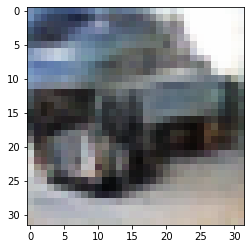

-> Epoch 96, Batch numero 1/78 -> Disc. loss on real images: 0.59793, Disc. loss on fake images: 0.62816, Generator loss: 1.06214
-> Epoch 96, Batch numero 2/78 -> Disc. loss on real images: 0.64179, Disc. loss on fake images: 0.57346, Generator loss: 1.02327
-> Epoch 96, Batch numero 3/78 -> Disc. loss on real images: 0.57620, Disc. loss on fake images: 0.60665, Generator loss: 1.01413
-> Epoch 96, Batch numero 4/78 -> Disc. loss on real images: 0.70826, Disc. loss on fake images: 0.54248, Generator loss: 1.03885
-> Epoch 96, Batch numero 5/78 -> Disc. loss on real images: 0.54893, Disc. loss on fake images: 0.63938, Generator loss: 1.06804
-> Epoch 96, Batch numero 6/78 -> Disc. loss on real images: 0.63308, Disc. loss on fake images: 0.62047, Generator loss: 1.04350
-> Epoch 96, Batch numero 7/78 -> Disc. loss on real images: 0.66492, Disc. loss on fake images: 0.56520, Generator loss: 1.07771
-> Epoch 96, Batch numero 8/78 -> Disc. loss on real images: 0.68554, Disc. loss on fake i

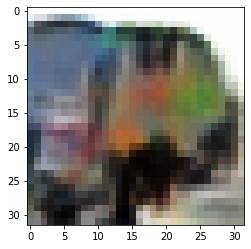

-> Epoch 97, Batch numero 1/78 -> Disc. loss on real images: 0.62220, Disc. loss on fake images: 0.45303, Generator loss: 1.04919
-> Epoch 97, Batch numero 2/78 -> Disc. loss on real images: 0.60226, Disc. loss on fake images: 0.71961, Generator loss: 0.96507
-> Epoch 97, Batch numero 3/78 -> Disc. loss on real images: 0.56120, Disc. loss on fake images: 0.67184, Generator loss: 1.04391
-> Epoch 97, Batch numero 4/78 -> Disc. loss on real images: 0.56093, Disc. loss on fake images: 0.55866, Generator loss: 0.94962
-> Epoch 97, Batch numero 5/78 -> Disc. loss on real images: 0.69537, Disc. loss on fake images: 0.57626, Generator loss: 1.04093
-> Epoch 97, Batch numero 6/78 -> Disc. loss on real images: 0.62955, Disc. loss on fake images: 0.63748, Generator loss: 1.09307
-> Epoch 97, Batch numero 7/78 -> Disc. loss on real images: 0.51058, Disc. loss on fake images: 0.55708, Generator loss: 1.18005
-> Epoch 97, Batch numero 8/78 -> Disc. loss on real images: 0.58225, Disc. loss on fake i

-> Epoch 97, Batch numero 64/78 -> Disc. loss on real images: 0.60978, Disc. loss on fake images: 0.77950, Generator loss: 0.93174
-> Epoch 97, Batch numero 65/78 -> Disc. loss on real images: 0.63644, Disc. loss on fake images: 0.57773, Generator loss: 0.92297
-> Epoch 97, Batch numero 66/78 -> Disc. loss on real images: 0.63977, Disc. loss on fake images: 0.71718, Generator loss: 0.93936
-> Epoch 97, Batch numero 67/78 -> Disc. loss on real images: 0.52215, Disc. loss on fake images: 0.73922, Generator loss: 0.95572
-> Epoch 97, Batch numero 68/78 -> Disc. loss on real images: 0.61522, Disc. loss on fake images: 0.59946, Generator loss: 1.04087
-> Epoch 97, Batch numero 69/78 -> Disc. loss on real images: 0.66451, Disc. loss on fake images: 0.54017, Generator loss: 1.11999
-> Epoch 97, Batch numero 70/78 -> Disc. loss on real images: 0.54070, Disc. loss on fake images: 0.62041, Generator loss: 1.09924
-> Epoch 97, Batch numero 71/78 -> Disc. loss on real images: 0.56352, Disc. loss o

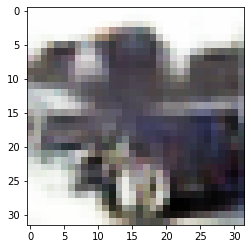

-> Epoch 98, Batch numero 1/78 -> Disc. loss on real images: 0.68277, Disc. loss on fake images: 0.51605, Generator loss: 0.92991
-> Epoch 98, Batch numero 2/78 -> Disc. loss on real images: 0.62437, Disc. loss on fake images: 0.70999, Generator loss: 0.94463
-> Epoch 98, Batch numero 3/78 -> Disc. loss on real images: 0.56739, Disc. loss on fake images: 0.63764, Generator loss: 1.00687
-> Epoch 98, Batch numero 4/78 -> Disc. loss on real images: 0.60944, Disc. loss on fake images: 0.69841, Generator loss: 1.04387
-> Epoch 98, Batch numero 5/78 -> Disc. loss on real images: 0.76578, Disc. loss on fake images: 0.60606, Generator loss: 1.11507
-> Epoch 98, Batch numero 6/78 -> Disc. loss on real images: 0.70666, Disc. loss on fake images: 0.76102, Generator loss: 1.00156
-> Epoch 98, Batch numero 7/78 -> Disc. loss on real images: 0.58660, Disc. loss on fake images: 0.63475, Generator loss: 1.03396
-> Epoch 98, Batch numero 8/78 -> Disc. loss on real images: 0.75064, Disc. loss on fake i

-> Epoch 98, Batch numero 65/78 -> Disc. loss on real images: 0.61502, Disc. loss on fake images: 0.45366, Generator loss: 1.15797
-> Epoch 98, Batch numero 66/78 -> Disc. loss on real images: 0.48337, Disc. loss on fake images: 0.60738, Generator loss: 1.20398
-> Epoch 98, Batch numero 67/78 -> Disc. loss on real images: 0.66338, Disc. loss on fake images: 0.43507, Generator loss: 1.18115
-> Epoch 98, Batch numero 68/78 -> Disc. loss on real images: 0.62390, Disc. loss on fake images: 0.64448, Generator loss: 1.06065
-> Epoch 98, Batch numero 69/78 -> Disc. loss on real images: 0.60102, Disc. loss on fake images: 0.59349, Generator loss: 1.26989
-> Epoch 98, Batch numero 70/78 -> Disc. loss on real images: 0.60878, Disc. loss on fake images: 0.45887, Generator loss: 1.36194
-> Epoch 98, Batch numero 71/78 -> Disc. loss on real images: 0.59426, Disc. loss on fake images: 0.52202, Generator loss: 1.14624
-> Epoch 98, Batch numero 72/78 -> Disc. loss on real images: 0.48706, Disc. loss o

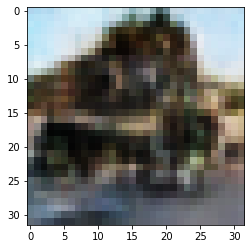

-> Epoch 99, Batch numero 1/78 -> Disc. loss on real images: 0.64224, Disc. loss on fake images: 0.52212, Generator loss: 1.08332
-> Epoch 99, Batch numero 2/78 -> Disc. loss on real images: 0.63404, Disc. loss on fake images: 0.56242, Generator loss: 1.05326
-> Epoch 99, Batch numero 3/78 -> Disc. loss on real images: 0.61552, Disc. loss on fake images: 0.64093, Generator loss: 0.94856
-> Epoch 99, Batch numero 4/78 -> Disc. loss on real images: 0.64908, Disc. loss on fake images: 0.71028, Generator loss: 1.07762
-> Epoch 99, Batch numero 5/78 -> Disc. loss on real images: 0.69552, Disc. loss on fake images: 0.63825, Generator loss: 1.14570
-> Epoch 99, Batch numero 6/78 -> Disc. loss on real images: 0.67297, Disc. loss on fake images: 0.65534, Generator loss: 1.11042
-> Epoch 99, Batch numero 7/78 -> Disc. loss on real images: 0.72618, Disc. loss on fake images: 0.53972, Generator loss: 1.15526
-> Epoch 99, Batch numero 8/78 -> Disc. loss on real images: 0.65945, Disc. loss on fake i

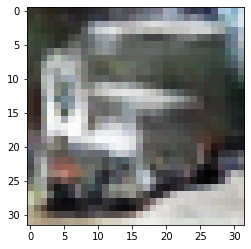

-> Epoch 100, Batch numero 1/78 -> Disc. loss on real images: 0.56956, Disc. loss on fake images: 0.56714, Generator loss: 1.08457
-> Epoch 100, Batch numero 2/78 -> Disc. loss on real images: 0.75963, Disc. loss on fake images: 0.57302, Generator loss: 1.04276
-> Epoch 100, Batch numero 3/78 -> Disc. loss on real images: 0.69582, Disc. loss on fake images: 0.63632, Generator loss: 1.04490
-> Epoch 100, Batch numero 4/78 -> Disc. loss on real images: 0.62775, Disc. loss on fake images: 0.63590, Generator loss: 1.01973
-> Epoch 100, Batch numero 5/78 -> Disc. loss on real images: 0.57306, Disc. loss on fake images: 0.57581, Generator loss: 1.01122
-> Epoch 100, Batch numero 6/78 -> Disc. loss on real images: 0.68783, Disc. loss on fake images: 0.74829, Generator loss: 1.04430
-> Epoch 100, Batch numero 7/78 -> Disc. loss on real images: 0.64564, Disc. loss on fake images: 0.61848, Generator loss: 0.99474
-> Epoch 100, Batch numero 8/78 -> Disc. loss on real images: 0.59268, Disc. loss o

-> Epoch 100, Batch numero 64/78 -> Disc. loss on real images: 0.55571, Disc. loss on fake images: 0.61501, Generator loss: 1.05341
-> Epoch 100, Batch numero 65/78 -> Disc. loss on real images: 0.71777, Disc. loss on fake images: 0.64257, Generator loss: 0.94999
-> Epoch 100, Batch numero 66/78 -> Disc. loss on real images: 0.56269, Disc. loss on fake images: 0.61973, Generator loss: 1.07556
-> Epoch 100, Batch numero 67/78 -> Disc. loss on real images: 0.52028, Disc. loss on fake images: 0.68988, Generator loss: 1.04634
-> Epoch 100, Batch numero 68/78 -> Disc. loss on real images: 0.53507, Disc. loss on fake images: 0.50188, Generator loss: 1.12774
-> Epoch 100, Batch numero 69/78 -> Disc. loss on real images: 0.57636, Disc. loss on fake images: 0.60429, Generator loss: 1.27598
-> Epoch 100, Batch numero 70/78 -> Disc. loss on real images: 0.60136, Disc. loss on fake images: 0.53378, Generator loss: 1.20065
-> Epoch 100, Batch numero 71/78 -> Disc. loss on real images: 0.76745, Disc

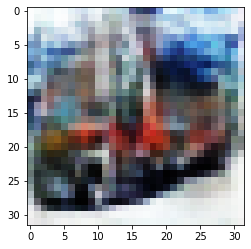

-> Epoch 101, Batch numero 1/78 -> Disc. loss on real images: 0.65150, Disc. loss on fake images: 0.59121, Generator loss: 1.16373
-> Epoch 101, Batch numero 2/78 -> Disc. loss on real images: 0.71293, Disc. loss on fake images: 0.53510, Generator loss: 1.20129
-> Epoch 101, Batch numero 3/78 -> Disc. loss on real images: 0.63256, Disc. loss on fake images: 0.55488, Generator loss: 1.22542
-> Epoch 101, Batch numero 4/78 -> Disc. loss on real images: 0.64328, Disc. loss on fake images: 0.49921, Generator loss: 1.12136
-> Epoch 101, Batch numero 5/78 -> Disc. loss on real images: 0.61733, Disc. loss on fake images: 0.54839, Generator loss: 0.96999
-> Epoch 101, Batch numero 6/78 -> Disc. loss on real images: 0.57011, Disc. loss on fake images: 0.56806, Generator loss: 0.98072
-> Epoch 101, Batch numero 7/78 -> Disc. loss on real images: 0.56777, Disc. loss on fake images: 0.69456, Generator loss: 0.97514
-> Epoch 101, Batch numero 8/78 -> Disc. loss on real images: 0.48363, Disc. loss o

-> Epoch 101, Batch numero 65/78 -> Disc. loss on real images: 0.42955, Disc. loss on fake images: 0.46089, Generator loss: 1.19438
-> Epoch 101, Batch numero 66/78 -> Disc. loss on real images: 0.47006, Disc. loss on fake images: 0.59733, Generator loss: 1.08766
-> Epoch 101, Batch numero 67/78 -> Disc. loss on real images: 0.63057, Disc. loss on fake images: 0.59232, Generator loss: 0.98172
-> Epoch 101, Batch numero 68/78 -> Disc. loss on real images: 0.63018, Disc. loss on fake images: 0.65328, Generator loss: 0.93956
-> Epoch 101, Batch numero 69/78 -> Disc. loss on real images: 0.54554, Disc. loss on fake images: 0.57259, Generator loss: 1.00341
-> Epoch 101, Batch numero 70/78 -> Disc. loss on real images: 0.69597, Disc. loss on fake images: 0.77956, Generator loss: 0.93729
-> Epoch 101, Batch numero 71/78 -> Disc. loss on real images: 0.59675, Disc. loss on fake images: 0.79349, Generator loss: 1.25214
-> Epoch 101, Batch numero 72/78 -> Disc. loss on real images: 0.53278, Disc

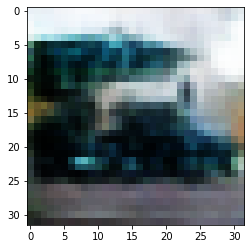

-> Epoch 102, Batch numero 1/78 -> Disc. loss on real images: 0.75990, Disc. loss on fake images: 0.59074, Generator loss: 1.18298
-> Epoch 102, Batch numero 2/78 -> Disc. loss on real images: 0.69046, Disc. loss on fake images: 0.48241, Generator loss: 1.12021
-> Epoch 102, Batch numero 3/78 -> Disc. loss on real images: 0.60961, Disc. loss on fake images: 0.60324, Generator loss: 1.21955
-> Epoch 102, Batch numero 4/78 -> Disc. loss on real images: 0.62701, Disc. loss on fake images: 0.47137, Generator loss: 1.14024
-> Epoch 102, Batch numero 5/78 -> Disc. loss on real images: 0.52581, Disc. loss on fake images: 0.45025, Generator loss: 1.09282
-> Epoch 102, Batch numero 6/78 -> Disc. loss on real images: 0.59196, Disc. loss on fake images: 0.65970, Generator loss: 1.05961
-> Epoch 102, Batch numero 7/78 -> Disc. loss on real images: 0.59521, Disc. loss on fake images: 0.69249, Generator loss: 0.94185
-> Epoch 102, Batch numero 8/78 -> Disc. loss on real images: 0.59146, Disc. loss o

-> Epoch 102, Batch numero 64/78 -> Disc. loss on real images: 0.49153, Disc. loss on fake images: 0.51119, Generator loss: 1.01851
-> Epoch 102, Batch numero 65/78 -> Disc. loss on real images: 0.57803, Disc. loss on fake images: 0.65263, Generator loss: 1.02005
-> Epoch 102, Batch numero 66/78 -> Disc. loss on real images: 0.61582, Disc. loss on fake images: 0.54959, Generator loss: 0.95924
-> Epoch 102, Batch numero 67/78 -> Disc. loss on real images: 0.49543, Disc. loss on fake images: 0.74999, Generator loss: 0.99368
-> Epoch 102, Batch numero 68/78 -> Disc. loss on real images: 0.52682, Disc. loss on fake images: 0.68243, Generator loss: 1.02150
-> Epoch 102, Batch numero 69/78 -> Disc. loss on real images: 0.53103, Disc. loss on fake images: 0.56675, Generator loss: 1.00722
-> Epoch 102, Batch numero 70/78 -> Disc. loss on real images: 0.61145, Disc. loss on fake images: 0.54132, Generator loss: 1.09689
-> Epoch 102, Batch numero 71/78 -> Disc. loss on real images: 0.55416, Disc

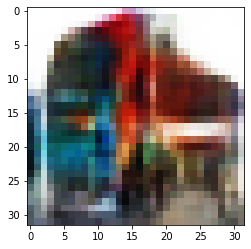

-> Epoch 103, Batch numero 1/78 -> Disc. loss on real images: 0.76481, Disc. loss on fake images: 0.39613, Generator loss: 1.31894
-> Epoch 103, Batch numero 2/78 -> Disc. loss on real images: 0.75888, Disc. loss on fake images: 0.52898, Generator loss: 1.18064
-> Epoch 103, Batch numero 3/78 -> Disc. loss on real images: 0.46314, Disc. loss on fake images: 0.59131, Generator loss: 1.07994
-> Epoch 103, Batch numero 4/78 -> Disc. loss on real images: 0.58141, Disc. loss on fake images: 0.50774, Generator loss: 1.10780
-> Epoch 103, Batch numero 5/78 -> Disc. loss on real images: 0.62764, Disc. loss on fake images: 0.58626, Generator loss: 1.05476
-> Epoch 103, Batch numero 6/78 -> Disc. loss on real images: 0.65698, Disc. loss on fake images: 0.55388, Generator loss: 1.10377
-> Epoch 103, Batch numero 7/78 -> Disc. loss on real images: 0.49391, Disc. loss on fake images: 0.59352, Generator loss: 1.20051
-> Epoch 103, Batch numero 8/78 -> Disc. loss on real images: 0.64471, Disc. loss o

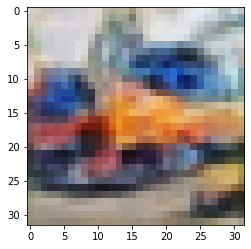

-> Epoch 104, Batch numero 1/78 -> Disc. loss on real images: 0.69171, Disc. loss on fake images: 0.50156, Generator loss: 1.20398
-> Epoch 104, Batch numero 2/78 -> Disc. loss on real images: 0.63534, Disc. loss on fake images: 0.49154, Generator loss: 1.20278
-> Epoch 104, Batch numero 3/78 -> Disc. loss on real images: 0.56069, Disc. loss on fake images: 0.65214, Generator loss: 1.04744
-> Epoch 104, Batch numero 4/78 -> Disc. loss on real images: 0.66150, Disc. loss on fake images: 0.63019, Generator loss: 1.03341
-> Epoch 104, Batch numero 5/78 -> Disc. loss on real images: 0.51505, Disc. loss on fake images: 0.86990, Generator loss: 1.06653
-> Epoch 104, Batch numero 6/78 -> Disc. loss on real images: 0.58523, Disc. loss on fake images: 0.62211, Generator loss: 1.12831
-> Epoch 104, Batch numero 7/78 -> Disc. loss on real images: 0.64946, Disc. loss on fake images: 0.51190, Generator loss: 1.21228
-> Epoch 104, Batch numero 8/78 -> Disc. loss on real images: 0.77766, Disc. loss o

-> Epoch 104, Batch numero 65/78 -> Disc. loss on real images: 0.66190, Disc. loss on fake images: 0.46658, Generator loss: 1.20425
-> Epoch 104, Batch numero 66/78 -> Disc. loss on real images: 0.68465, Disc. loss on fake images: 0.64468, Generator loss: 1.12844
-> Epoch 104, Batch numero 67/78 -> Disc. loss on real images: 0.58033, Disc. loss on fake images: 0.47949, Generator loss: 1.18483
-> Epoch 104, Batch numero 68/78 -> Disc. loss on real images: 0.52659, Disc. loss on fake images: 0.53996, Generator loss: 1.24356
-> Epoch 104, Batch numero 69/78 -> Disc. loss on real images: 0.49375, Disc. loss on fake images: 0.53179, Generator loss: 1.29529
-> Epoch 104, Batch numero 70/78 -> Disc. loss on real images: 0.54931, Disc. loss on fake images: 0.56159, Generator loss: 1.20783
-> Epoch 104, Batch numero 71/78 -> Disc. loss on real images: 0.60616, Disc. loss on fake images: 0.67376, Generator loss: 1.18728
-> Epoch 104, Batch numero 72/78 -> Disc. loss on real images: 0.52625, Disc

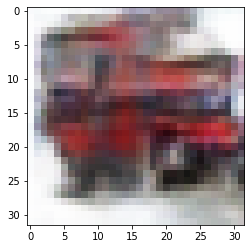

-> Epoch 105, Batch numero 1/78 -> Disc. loss on real images: 0.60916, Disc. loss on fake images: 0.61438, Generator loss: 1.09167
-> Epoch 105, Batch numero 2/78 -> Disc. loss on real images: 0.59322, Disc. loss on fake images: 0.78004, Generator loss: 1.16855
-> Epoch 105, Batch numero 3/78 -> Disc. loss on real images: 0.48199, Disc. loss on fake images: 0.57087, Generator loss: 1.16721
-> Epoch 105, Batch numero 4/78 -> Disc. loss on real images: 0.77555, Disc. loss on fake images: 0.51288, Generator loss: 1.17033
-> Epoch 105, Batch numero 5/78 -> Disc. loss on real images: 0.72183, Disc. loss on fake images: 0.63288, Generator loss: 1.06141
-> Epoch 105, Batch numero 6/78 -> Disc. loss on real images: 0.58508, Disc. loss on fake images: 0.60823, Generator loss: 1.14425
-> Epoch 105, Batch numero 7/78 -> Disc. loss on real images: 0.57977, Disc. loss on fake images: 0.55845, Generator loss: 1.24034
-> Epoch 105, Batch numero 8/78 -> Disc. loss on real images: 0.67885, Disc. loss o

-> Epoch 105, Batch numero 64/78 -> Disc. loss on real images: 0.60059, Disc. loss on fake images: 0.61672, Generator loss: 1.12769
-> Epoch 105, Batch numero 65/78 -> Disc. loss on real images: 0.57879, Disc. loss on fake images: 0.53576, Generator loss: 1.04368
-> Epoch 105, Batch numero 66/78 -> Disc. loss on real images: 0.58280, Disc. loss on fake images: 0.61197, Generator loss: 1.08659
-> Epoch 105, Batch numero 67/78 -> Disc. loss on real images: 0.57016, Disc. loss on fake images: 0.62917, Generator loss: 1.02584
-> Epoch 105, Batch numero 68/78 -> Disc. loss on real images: 0.47788, Disc. loss on fake images: 0.57467, Generator loss: 1.00864
-> Epoch 105, Batch numero 69/78 -> Disc. loss on real images: 0.56105, Disc. loss on fake images: 0.65883, Generator loss: 1.02873
-> Epoch 105, Batch numero 70/78 -> Disc. loss on real images: 0.60988, Disc. loss on fake images: 0.66758, Generator loss: 1.14563
-> Epoch 105, Batch numero 71/78 -> Disc. loss on real images: 0.63019, Disc

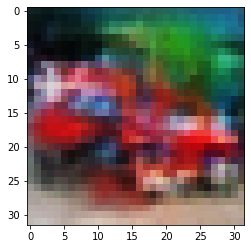

-> Epoch 106, Batch numero 1/78 -> Disc. loss on real images: 0.58379, Disc. loss on fake images: 0.76160, Generator loss: 0.98478
-> Epoch 106, Batch numero 2/78 -> Disc. loss on real images: 0.67547, Disc. loss on fake images: 0.57282, Generator loss: 1.08216
-> Epoch 106, Batch numero 3/78 -> Disc. loss on real images: 0.63588, Disc. loss on fake images: 0.54928, Generator loss: 0.97671
-> Epoch 106, Batch numero 4/78 -> Disc. loss on real images: 0.57898, Disc. loss on fake images: 0.61833, Generator loss: 0.90799
-> Epoch 106, Batch numero 5/78 -> Disc. loss on real images: 0.53254, Disc. loss on fake images: 0.55005, Generator loss: 1.05185
-> Epoch 106, Batch numero 6/78 -> Disc. loss on real images: 0.57849, Disc. loss on fake images: 0.66641, Generator loss: 1.01881
-> Epoch 106, Batch numero 7/78 -> Disc. loss on real images: 0.59817, Disc. loss on fake images: 0.61633, Generator loss: 1.08506
-> Epoch 106, Batch numero 8/78 -> Disc. loss on real images: 0.57640, Disc. loss o

-> Epoch 106, Batch numero 64/78 -> Disc. loss on real images: 0.60421, Disc. loss on fake images: 0.65504, Generator loss: 1.02332
-> Epoch 106, Batch numero 65/78 -> Disc. loss on real images: 0.60620, Disc. loss on fake images: 0.54781, Generator loss: 1.06595
-> Epoch 106, Batch numero 66/78 -> Disc. loss on real images: 0.72663, Disc. loss on fake images: 0.64364, Generator loss: 1.16968
-> Epoch 106, Batch numero 67/78 -> Disc. loss on real images: 0.64137, Disc. loss on fake images: 0.62940, Generator loss: 1.03671
-> Epoch 106, Batch numero 68/78 -> Disc. loss on real images: 0.52133, Disc. loss on fake images: 0.62690, Generator loss: 1.18729
-> Epoch 106, Batch numero 69/78 -> Disc. loss on real images: 0.60057, Disc. loss on fake images: 0.55510, Generator loss: 1.22654
-> Epoch 106, Batch numero 70/78 -> Disc. loss on real images: 0.76939, Disc. loss on fake images: 0.53035, Generator loss: 1.11126
-> Epoch 106, Batch numero 71/78 -> Disc. loss on real images: 0.69356, Disc

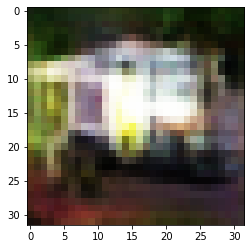

-> Epoch 107, Batch numero 1/78 -> Disc. loss on real images: 0.49350, Disc. loss on fake images: 0.61153, Generator loss: 1.10282
-> Epoch 107, Batch numero 2/78 -> Disc. loss on real images: 0.53661, Disc. loss on fake images: 0.57416, Generator loss: 1.15097
-> Epoch 107, Batch numero 3/78 -> Disc. loss on real images: 0.61008, Disc. loss on fake images: 0.56433, Generator loss: 1.05361
-> Epoch 107, Batch numero 4/78 -> Disc. loss on real images: 0.58976, Disc. loss on fake images: 0.69186, Generator loss: 1.17036
-> Epoch 107, Batch numero 5/78 -> Disc. loss on real images: 0.56678, Disc. loss on fake images: 0.60867, Generator loss: 1.24549
-> Epoch 107, Batch numero 6/78 -> Disc. loss on real images: 0.71807, Disc. loss on fake images: 0.46120, Generator loss: 1.06591
-> Epoch 107, Batch numero 7/78 -> Disc. loss on real images: 0.62082, Disc. loss on fake images: 0.60190, Generator loss: 1.24358
-> Epoch 107, Batch numero 8/78 -> Disc. loss on real images: 0.63062, Disc. loss o

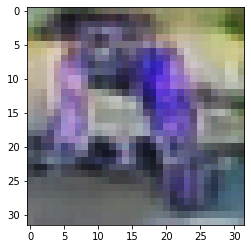

-> Epoch 108, Batch numero 1/78 -> Disc. loss on real images: 0.64428, Disc. loss on fake images: 0.57132, Generator loss: 1.05942
-> Epoch 108, Batch numero 2/78 -> Disc. loss on real images: 0.59382, Disc. loss on fake images: 0.62862, Generator loss: 1.10343
-> Epoch 108, Batch numero 3/78 -> Disc. loss on real images: 0.59949, Disc. loss on fake images: 0.61290, Generator loss: 1.14779
-> Epoch 108, Batch numero 4/78 -> Disc. loss on real images: 0.42587, Disc. loss on fake images: 0.66905, Generator loss: 1.16766
-> Epoch 108, Batch numero 5/78 -> Disc. loss on real images: 0.55955, Disc. loss on fake images: 0.59689, Generator loss: 1.18861
-> Epoch 108, Batch numero 6/78 -> Disc. loss on real images: 0.74517, Disc. loss on fake images: 0.51256, Generator loss: 1.13197
-> Epoch 108, Batch numero 7/78 -> Disc. loss on real images: 0.57431, Disc. loss on fake images: 0.65590, Generator loss: 1.05324
-> Epoch 108, Batch numero 8/78 -> Disc. loss on real images: 0.58900, Disc. loss o

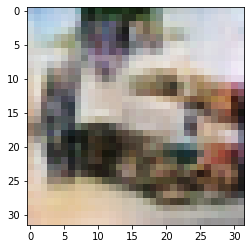

-> Epoch 109, Batch numero 1/78 -> Disc. loss on real images: 0.60791, Disc. loss on fake images: 0.69378, Generator loss: 1.08536
-> Epoch 109, Batch numero 2/78 -> Disc. loss on real images: 0.62038, Disc. loss on fake images: 0.50526, Generator loss: 1.09354
-> Epoch 109, Batch numero 3/78 -> Disc. loss on real images: 0.63770, Disc. loss on fake images: 0.57092, Generator loss: 1.05770
-> Epoch 109, Batch numero 4/78 -> Disc. loss on real images: 0.54818, Disc. loss on fake images: 0.57222, Generator loss: 1.09894
-> Epoch 109, Batch numero 5/78 -> Disc. loss on real images: 0.68200, Disc. loss on fake images: 0.58327, Generator loss: 1.02055
-> Epoch 109, Batch numero 6/78 -> Disc. loss on real images: 0.52941, Disc. loss on fake images: 0.54093, Generator loss: 1.04155
-> Epoch 109, Batch numero 7/78 -> Disc. loss on real images: 0.62537, Disc. loss on fake images: 0.70388, Generator loss: 0.95250
-> Epoch 109, Batch numero 8/78 -> Disc. loss on real images: 0.52962, Disc. loss o

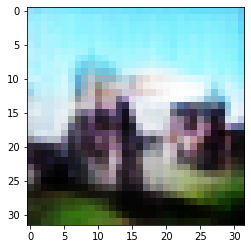

-> Epoch 110, Batch numero 1/78 -> Disc. loss on real images: 0.54684, Disc. loss on fake images: 0.64220, Generator loss: 1.11140
-> Epoch 110, Batch numero 2/78 -> Disc. loss on real images: 0.51252, Disc. loss on fake images: 0.56195, Generator loss: 1.07504
-> Epoch 110, Batch numero 3/78 -> Disc. loss on real images: 0.61605, Disc. loss on fake images: 0.69595, Generator loss: 0.98065
-> Epoch 110, Batch numero 4/78 -> Disc. loss on real images: 0.56067, Disc. loss on fake images: 0.65776, Generator loss: 1.03708
-> Epoch 110, Batch numero 5/78 -> Disc. loss on real images: 0.71394, Disc. loss on fake images: 0.62681, Generator loss: 1.01929
-> Epoch 110, Batch numero 6/78 -> Disc. loss on real images: 0.63545, Disc. loss on fake images: 0.61987, Generator loss: 1.06397
-> Epoch 110, Batch numero 7/78 -> Disc. loss on real images: 0.52805, Disc. loss on fake images: 0.48942, Generator loss: 1.11634
-> Epoch 110, Batch numero 8/78 -> Disc. loss on real images: 0.61272, Disc. loss o

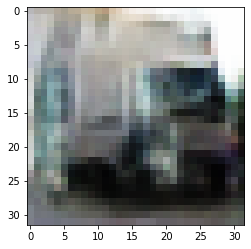

-> Epoch 111, Batch numero 1/78 -> Disc. loss on real images: 0.62967, Disc. loss on fake images: 0.57559, Generator loss: 0.87355
-> Epoch 111, Batch numero 2/78 -> Disc. loss on real images: 0.53402, Disc. loss on fake images: 0.64209, Generator loss: 0.90714
-> Epoch 111, Batch numero 3/78 -> Disc. loss on real images: 0.56239, Disc. loss on fake images: 0.60391, Generator loss: 0.92187
-> Epoch 111, Batch numero 4/78 -> Disc. loss on real images: 0.45599, Disc. loss on fake images: 0.59502, Generator loss: 1.02407
-> Epoch 111, Batch numero 5/78 -> Disc. loss on real images: 0.47941, Disc. loss on fake images: 0.50719, Generator loss: 1.04837
-> Epoch 111, Batch numero 6/78 -> Disc. loss on real images: 0.56690, Disc. loss on fake images: 0.71664, Generator loss: 1.13884
-> Epoch 111, Batch numero 7/78 -> Disc. loss on real images: 0.56300, Disc. loss on fake images: 0.55467, Generator loss: 1.02821
-> Epoch 111, Batch numero 8/78 -> Disc. loss on real images: 0.55955, Disc. loss o

-> Epoch 111, Batch numero 64/78 -> Disc. loss on real images: 0.70842, Disc. loss on fake images: 0.59974, Generator loss: 1.10064
-> Epoch 111, Batch numero 65/78 -> Disc. loss on real images: 0.68872, Disc. loss on fake images: 0.59059, Generator loss: 1.06466
-> Epoch 111, Batch numero 66/78 -> Disc. loss on real images: 0.58664, Disc. loss on fake images: 0.62387, Generator loss: 1.12630
-> Epoch 111, Batch numero 67/78 -> Disc. loss on real images: 0.56700, Disc. loss on fake images: 0.64152, Generator loss: 1.12537
-> Epoch 111, Batch numero 68/78 -> Disc. loss on real images: 0.75520, Disc. loss on fake images: 0.50173, Generator loss: 1.17089
-> Epoch 111, Batch numero 69/78 -> Disc. loss on real images: 0.58907, Disc. loss on fake images: 0.56096, Generator loss: 1.01258
-> Epoch 111, Batch numero 70/78 -> Disc. loss on real images: 0.69951, Disc. loss on fake images: 0.62093, Generator loss: 1.02612
-> Epoch 111, Batch numero 71/78 -> Disc. loss on real images: 0.64561, Disc

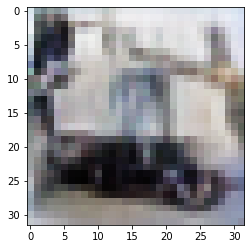

-> Epoch 112, Batch numero 1/78 -> Disc. loss on real images: 0.67362, Disc. loss on fake images: 0.52983, Generator loss: 1.03796
-> Epoch 112, Batch numero 2/78 -> Disc. loss on real images: 0.52366, Disc. loss on fake images: 0.71801, Generator loss: 1.10204
-> Epoch 112, Batch numero 3/78 -> Disc. loss on real images: 0.66369, Disc. loss on fake images: 0.64412, Generator loss: 1.13604
-> Epoch 112, Batch numero 4/78 -> Disc. loss on real images: 0.59376, Disc. loss on fake images: 0.57921, Generator loss: 1.30754
-> Epoch 112, Batch numero 5/78 -> Disc. loss on real images: 0.64357, Disc. loss on fake images: 0.48871, Generator loss: 1.23470
-> Epoch 112, Batch numero 6/78 -> Disc. loss on real images: 0.59552, Disc. loss on fake images: 0.58936, Generator loss: 1.00326
-> Epoch 112, Batch numero 7/78 -> Disc. loss on real images: 0.61130, Disc. loss on fake images: 0.55857, Generator loss: 1.02775
-> Epoch 112, Batch numero 8/78 -> Disc. loss on real images: 0.50538, Disc. loss o

-> Epoch 112, Batch numero 65/78 -> Disc. loss on real images: 0.57307, Disc. loss on fake images: 0.63752, Generator loss: 1.03608
-> Epoch 112, Batch numero 66/78 -> Disc. loss on real images: 0.60189, Disc. loss on fake images: 0.59472, Generator loss: 1.13689
-> Epoch 112, Batch numero 67/78 -> Disc. loss on real images: 0.57526, Disc. loss on fake images: 0.55132, Generator loss: 1.18430
-> Epoch 112, Batch numero 68/78 -> Disc. loss on real images: 0.57286, Disc. loss on fake images: 0.57879, Generator loss: 1.27411
-> Epoch 112, Batch numero 69/78 -> Disc. loss on real images: 0.54076, Disc. loss on fake images: 0.48842, Generator loss: 1.20898
-> Epoch 112, Batch numero 70/78 -> Disc. loss on real images: 0.52367, Disc. loss on fake images: 0.77336, Generator loss: 1.23591
-> Epoch 112, Batch numero 71/78 -> Disc. loss on real images: 0.60183, Disc. loss on fake images: 0.43128, Generator loss: 1.15131
-> Epoch 112, Batch numero 72/78 -> Disc. loss on real images: 0.71981, Disc

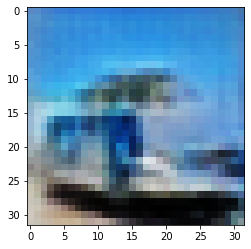

-> Epoch 113, Batch numero 1/78 -> Disc. loss on real images: 0.69553, Disc. loss on fake images: 0.55907, Generator loss: 1.21828
-> Epoch 113, Batch numero 2/78 -> Disc. loss on real images: 0.58399, Disc. loss on fake images: 0.61377, Generator loss: 1.21155
-> Epoch 113, Batch numero 3/78 -> Disc. loss on real images: 0.58018, Disc. loss on fake images: 0.47638, Generator loss: 1.22280
-> Epoch 113, Batch numero 4/78 -> Disc. loss on real images: 0.60019, Disc. loss on fake images: 0.64819, Generator loss: 1.37976
-> Epoch 113, Batch numero 5/78 -> Disc. loss on real images: 0.56867, Disc. loss on fake images: 0.45153, Generator loss: 1.32534
-> Epoch 113, Batch numero 6/78 -> Disc. loss on real images: 0.66025, Disc. loss on fake images: 0.59093, Generator loss: 1.09132
-> Epoch 113, Batch numero 7/78 -> Disc. loss on real images: 0.60273, Disc. loss on fake images: 0.54628, Generator loss: 1.19977
-> Epoch 113, Batch numero 8/78 -> Disc. loss on real images: 0.63269, Disc. loss o

-> Epoch 113, Batch numero 64/78 -> Disc. loss on real images: 0.72794, Disc. loss on fake images: 0.51026, Generator loss: 1.03004
-> Epoch 113, Batch numero 65/78 -> Disc. loss on real images: 0.57760, Disc. loss on fake images: 0.58750, Generator loss: 1.07409
-> Epoch 113, Batch numero 66/78 -> Disc. loss on real images: 0.63086, Disc. loss on fake images: 0.52776, Generator loss: 1.08698
-> Epoch 113, Batch numero 67/78 -> Disc. loss on real images: 0.58070, Disc. loss on fake images: 0.57723, Generator loss: 1.15186
-> Epoch 113, Batch numero 68/78 -> Disc. loss on real images: 0.69695, Disc. loss on fake images: 0.62718, Generator loss: 1.07379
-> Epoch 113, Batch numero 69/78 -> Disc. loss on real images: 0.62236, Disc. loss on fake images: 0.55548, Generator loss: 1.12417
-> Epoch 113, Batch numero 70/78 -> Disc. loss on real images: 0.61291, Disc. loss on fake images: 0.56883, Generator loss: 0.98159
-> Epoch 113, Batch numero 71/78 -> Disc. loss on real images: 0.56582, Disc

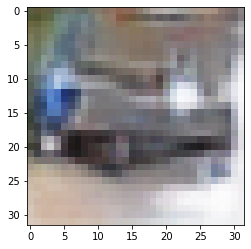

-> Epoch 114, Batch numero 1/78 -> Disc. loss on real images: 0.64925, Disc. loss on fake images: 0.72116, Generator loss: 1.12096
-> Epoch 114, Batch numero 2/78 -> Disc. loss on real images: 0.66828, Disc. loss on fake images: 0.53036, Generator loss: 1.15659
-> Epoch 114, Batch numero 3/78 -> Disc. loss on real images: 0.56860, Disc. loss on fake images: 0.52945, Generator loss: 1.25019
-> Epoch 114, Batch numero 4/78 -> Disc. loss on real images: 0.49039, Disc. loss on fake images: 0.49895, Generator loss: 1.17449
-> Epoch 114, Batch numero 5/78 -> Disc. loss on real images: 0.57311, Disc. loss on fake images: 0.54957, Generator loss: 1.15186
-> Epoch 114, Batch numero 6/78 -> Disc. loss on real images: 0.54940, Disc. loss on fake images: 0.55951, Generator loss: 1.02051
-> Epoch 114, Batch numero 7/78 -> Disc. loss on real images: 0.44336, Disc. loss on fake images: 0.76381, Generator loss: 1.09647
-> Epoch 114, Batch numero 8/78 -> Disc. loss on real images: 0.63469, Disc. loss o

-> Epoch 114, Batch numero 65/78 -> Disc. loss on real images: 0.51160, Disc. loss on fake images: 0.75576, Generator loss: 1.13002
-> Epoch 114, Batch numero 66/78 -> Disc. loss on real images: 0.59613, Disc. loss on fake images: 0.51281, Generator loss: 1.15820
-> Epoch 114, Batch numero 67/78 -> Disc. loss on real images: 0.56742, Disc. loss on fake images: 0.52049, Generator loss: 1.18916
-> Epoch 114, Batch numero 68/78 -> Disc. loss on real images: 0.58836, Disc. loss on fake images: 0.60350, Generator loss: 1.02595
-> Epoch 114, Batch numero 69/78 -> Disc. loss on real images: 0.58859, Disc. loss on fake images: 0.81339, Generator loss: 1.03482
-> Epoch 114, Batch numero 70/78 -> Disc. loss on real images: 0.65727, Disc. loss on fake images: 0.67910, Generator loss: 1.23357
-> Epoch 114, Batch numero 71/78 -> Disc. loss on real images: 0.65646, Disc. loss on fake images: 0.50715, Generator loss: 1.21666
-> Epoch 114, Batch numero 72/78 -> Disc. loss on real images: 0.69883, Disc

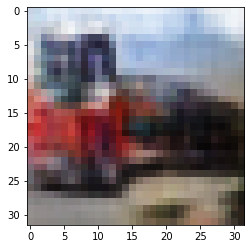

-> Epoch 115, Batch numero 1/78 -> Disc. loss on real images: 0.57963, Disc. loss on fake images: 0.65500, Generator loss: 1.03611
-> Epoch 115, Batch numero 2/78 -> Disc. loss on real images: 0.67307, Disc. loss on fake images: 0.58395, Generator loss: 1.09893
-> Epoch 115, Batch numero 3/78 -> Disc. loss on real images: 0.66719, Disc. loss on fake images: 0.61086, Generator loss: 1.18064
-> Epoch 115, Batch numero 4/78 -> Disc. loss on real images: 0.61030, Disc. loss on fake images: 0.64885, Generator loss: 1.04468
-> Epoch 115, Batch numero 5/78 -> Disc. loss on real images: 0.62328, Disc. loss on fake images: 0.59414, Generator loss: 1.07085
-> Epoch 115, Batch numero 6/78 -> Disc. loss on real images: 0.57214, Disc. loss on fake images: 0.43017, Generator loss: 1.12840
-> Epoch 115, Batch numero 7/78 -> Disc. loss on real images: 0.51311, Disc. loss on fake images: 0.60852, Generator loss: 1.10662
-> Epoch 115, Batch numero 8/78 -> Disc. loss on real images: 0.50981, Disc. loss o

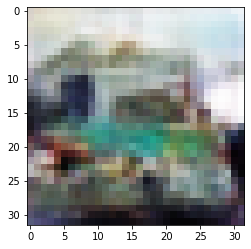

-> Epoch 116, Batch numero 1/78 -> Disc. loss on real images: 0.48898, Disc. loss on fake images: 0.45809, Generator loss: 1.39401
-> Epoch 116, Batch numero 2/78 -> Disc. loss on real images: 0.56377, Disc. loss on fake images: 0.40821, Generator loss: 1.29653
-> Epoch 116, Batch numero 3/78 -> Disc. loss on real images: 0.58478, Disc. loss on fake images: 0.59021, Generator loss: 1.12776
-> Epoch 116, Batch numero 4/78 -> Disc. loss on real images: 0.48929, Disc. loss on fake images: 0.63991, Generator loss: 1.11545
-> Epoch 116, Batch numero 5/78 -> Disc. loss on real images: 0.60945, Disc. loss on fake images: 0.61846, Generator loss: 1.24107
-> Epoch 116, Batch numero 6/78 -> Disc. loss on real images: 0.66535, Disc. loss on fake images: 0.54185, Generator loss: 1.19617
-> Epoch 116, Batch numero 7/78 -> Disc. loss on real images: 0.80988, Disc. loss on fake images: 0.58525, Generator loss: 1.00743
-> Epoch 116, Batch numero 8/78 -> Disc. loss on real images: 0.58560, Disc. loss o

-> Epoch 116, Batch numero 65/78 -> Disc. loss on real images: 0.52394, Disc. loss on fake images: 0.56685, Generator loss: 1.01325
-> Epoch 116, Batch numero 66/78 -> Disc. loss on real images: 0.53956, Disc. loss on fake images: 0.57550, Generator loss: 1.21406
-> Epoch 116, Batch numero 67/78 -> Disc. loss on real images: 0.68964, Disc. loss on fake images: 0.63108, Generator loss: 1.27685
-> Epoch 116, Batch numero 68/78 -> Disc. loss on real images: 0.63466, Disc. loss on fake images: 0.46436, Generator loss: 1.10395
-> Epoch 116, Batch numero 69/78 -> Disc. loss on real images: 0.65522, Disc. loss on fake images: 0.56565, Generator loss: 0.98250
-> Epoch 116, Batch numero 70/78 -> Disc. loss on real images: 0.57036, Disc. loss on fake images: 0.53286, Generator loss: 1.07860
-> Epoch 116, Batch numero 71/78 -> Disc. loss on real images: 0.57148, Disc. loss on fake images: 0.51987, Generator loss: 1.00329
-> Epoch 116, Batch numero 72/78 -> Disc. loss on real images: 0.70527, Disc

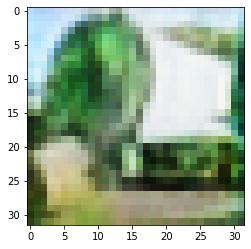

-> Epoch 117, Batch numero 1/78 -> Disc. loss on real images: 0.60369, Disc. loss on fake images: 0.58936, Generator loss: 1.22461
-> Epoch 117, Batch numero 2/78 -> Disc. loss on real images: 0.55516, Disc. loss on fake images: 0.64541, Generator loss: 1.21718
-> Epoch 117, Batch numero 3/78 -> Disc. loss on real images: 0.53323, Disc. loss on fake images: 0.62676, Generator loss: 0.97848
-> Epoch 117, Batch numero 4/78 -> Disc. loss on real images: 0.60448, Disc. loss on fake images: 0.64941, Generator loss: 1.05997
-> Epoch 117, Batch numero 5/78 -> Disc. loss on real images: 0.47674, Disc. loss on fake images: 0.56437, Generator loss: 1.18688
-> Epoch 117, Batch numero 6/78 -> Disc. loss on real images: 0.57734, Disc. loss on fake images: 0.53590, Generator loss: 1.23566
-> Epoch 117, Batch numero 7/78 -> Disc. loss on real images: 0.55668, Disc. loss on fake images: 0.54218, Generator loss: 1.14748
-> Epoch 117, Batch numero 8/78 -> Disc. loss on real images: 0.62614, Disc. loss o

-> Epoch 117, Batch numero 64/78 -> Disc. loss on real images: 0.67842, Disc. loss on fake images: 0.56242, Generator loss: 1.30175
-> Epoch 117, Batch numero 65/78 -> Disc. loss on real images: 0.62270, Disc. loss on fake images: 0.50565, Generator loss: 1.49370
-> Epoch 117, Batch numero 66/78 -> Disc. loss on real images: 0.60843, Disc. loss on fake images: 0.45203, Generator loss: 1.39843
-> Epoch 117, Batch numero 67/78 -> Disc. loss on real images: 0.66572, Disc. loss on fake images: 0.56429, Generator loss: 1.33621
-> Epoch 117, Batch numero 68/78 -> Disc. loss on real images: 0.59671, Disc. loss on fake images: 0.50619, Generator loss: 1.19088
-> Epoch 117, Batch numero 69/78 -> Disc. loss on real images: 0.61289, Disc. loss on fake images: 0.66796, Generator loss: 1.17668
-> Epoch 117, Batch numero 70/78 -> Disc. loss on real images: 0.48729, Disc. loss on fake images: 0.61732, Generator loss: 1.32592
-> Epoch 117, Batch numero 71/78 -> Disc. loss on real images: 0.69717, Disc

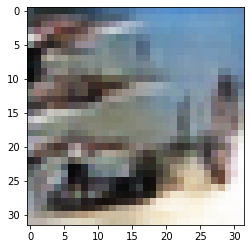

-> Epoch 118, Batch numero 1/78 -> Disc. loss on real images: 0.60434, Disc. loss on fake images: 0.59443, Generator loss: 1.12058
-> Epoch 118, Batch numero 2/78 -> Disc. loss on real images: 0.55198, Disc. loss on fake images: 0.56312, Generator loss: 1.27549
-> Epoch 118, Batch numero 3/78 -> Disc. loss on real images: 0.51953, Disc. loss on fake images: 0.53911, Generator loss: 1.28128
-> Epoch 118, Batch numero 4/78 -> Disc. loss on real images: 0.63505, Disc. loss on fake images: 0.59582, Generator loss: 1.26835
-> Epoch 118, Batch numero 5/78 -> Disc. loss on real images: 0.61083, Disc. loss on fake images: 0.57296, Generator loss: 1.11873
-> Epoch 118, Batch numero 6/78 -> Disc. loss on real images: 0.52671, Disc. loss on fake images: 0.55880, Generator loss: 1.28094
-> Epoch 118, Batch numero 7/78 -> Disc. loss on real images: 0.56393, Disc. loss on fake images: 0.55642, Generator loss: 1.18946
-> Epoch 118, Batch numero 8/78 -> Disc. loss on real images: 0.72235, Disc. loss o

-> Epoch 118, Batch numero 64/78 -> Disc. loss on real images: 0.58137, Disc. loss on fake images: 0.57286, Generator loss: 1.12556
-> Epoch 118, Batch numero 65/78 -> Disc. loss on real images: 0.69068, Disc. loss on fake images: 0.63473, Generator loss: 1.24975
-> Epoch 118, Batch numero 66/78 -> Disc. loss on real images: 0.72897, Disc. loss on fake images: 0.45434, Generator loss: 1.23289
-> Epoch 118, Batch numero 67/78 -> Disc. loss on real images: 0.59617, Disc. loss on fake images: 0.48840, Generator loss: 1.07949
-> Epoch 118, Batch numero 68/78 -> Disc. loss on real images: 0.47415, Disc. loss on fake images: 0.68250, Generator loss: 1.16017
-> Epoch 118, Batch numero 69/78 -> Disc. loss on real images: 0.58173, Disc. loss on fake images: 0.56657, Generator loss: 1.16442
-> Epoch 118, Batch numero 70/78 -> Disc. loss on real images: 0.62430, Disc. loss on fake images: 0.51545, Generator loss: 1.17063
-> Epoch 118, Batch numero 71/78 -> Disc. loss on real images: 0.49974, Disc

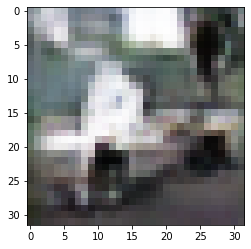

-> Epoch 119, Batch numero 1/78 -> Disc. loss on real images: 0.58219, Disc. loss on fake images: 0.71220, Generator loss: 1.05910
-> Epoch 119, Batch numero 2/78 -> Disc. loss on real images: 0.50011, Disc. loss on fake images: 0.58302, Generator loss: 1.14196
-> Epoch 119, Batch numero 3/78 -> Disc. loss on real images: 0.68962, Disc. loss on fake images: 0.53316, Generator loss: 1.05780
-> Epoch 119, Batch numero 4/78 -> Disc. loss on real images: 0.61090, Disc. loss on fake images: 0.65404, Generator loss: 1.12802
-> Epoch 119, Batch numero 5/78 -> Disc. loss on real images: 0.50189, Disc. loss on fake images: 0.54384, Generator loss: 1.13803
-> Epoch 119, Batch numero 6/78 -> Disc. loss on real images: 0.63088, Disc. loss on fake images: 0.52209, Generator loss: 1.21973
-> Epoch 119, Batch numero 7/78 -> Disc. loss on real images: 0.62054, Disc. loss on fake images: 0.51762, Generator loss: 1.18948
-> Epoch 119, Batch numero 8/78 -> Disc. loss on real images: 0.71797, Disc. loss o

-> Epoch 119, Batch numero 64/78 -> Disc. loss on real images: 0.66332, Disc. loss on fake images: 0.59685, Generator loss: 1.15596
-> Epoch 119, Batch numero 65/78 -> Disc. loss on real images: 0.62827, Disc. loss on fake images: 0.61455, Generator loss: 1.14698
-> Epoch 119, Batch numero 66/78 -> Disc. loss on real images: 0.64678, Disc. loss on fake images: 0.51103, Generator loss: 1.11539
-> Epoch 119, Batch numero 67/78 -> Disc. loss on real images: 0.74660, Disc. loss on fake images: 0.58163, Generator loss: 1.14536
-> Epoch 119, Batch numero 68/78 -> Disc. loss on real images: 0.63971, Disc. loss on fake images: 0.68398, Generator loss: 1.12447
-> Epoch 119, Batch numero 69/78 -> Disc. loss on real images: 0.47262, Disc. loss on fake images: 0.53114, Generator loss: 1.18747
-> Epoch 119, Batch numero 70/78 -> Disc. loss on real images: 0.57683, Disc. loss on fake images: 0.47847, Generator loss: 1.16031
-> Epoch 119, Batch numero 71/78 -> Disc. loss on real images: 0.60786, Disc

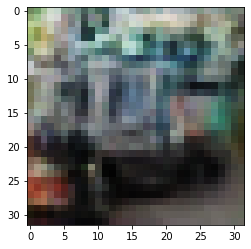

-> Epoch 120, Batch numero 1/78 -> Disc. loss on real images: 0.62487, Disc. loss on fake images: 0.69352, Generator loss: 1.09200
-> Epoch 120, Batch numero 2/78 -> Disc. loss on real images: 0.54998, Disc. loss on fake images: 0.57758, Generator loss: 1.21143
-> Epoch 120, Batch numero 3/78 -> Disc. loss on real images: 0.52672, Disc. loss on fake images: 0.49219, Generator loss: 1.18424
-> Epoch 120, Batch numero 4/78 -> Disc. loss on real images: 0.43510, Disc. loss on fake images: 0.48721, Generator loss: 1.18215
-> Epoch 120, Batch numero 5/78 -> Disc. loss on real images: 0.69448, Disc. loss on fake images: 0.60556, Generator loss: 1.17896
-> Epoch 120, Batch numero 6/78 -> Disc. loss on real images: 0.55775, Disc. loss on fake images: 0.57096, Generator loss: 1.15749
-> Epoch 120, Batch numero 7/78 -> Disc. loss on real images: 0.46115, Disc. loss on fake images: 0.72358, Generator loss: 1.23798
-> Epoch 120, Batch numero 8/78 -> Disc. loss on real images: 0.67073, Disc. loss o

-> Epoch 120, Batch numero 64/78 -> Disc. loss on real images: 0.65490, Disc. loss on fake images: 0.50169, Generator loss: 1.12940
-> Epoch 120, Batch numero 65/78 -> Disc. loss on real images: 0.55924, Disc. loss on fake images: 0.48862, Generator loss: 1.28532
-> Epoch 120, Batch numero 66/78 -> Disc. loss on real images: 0.71913, Disc. loss on fake images: 0.51514, Generator loss: 1.18139
-> Epoch 120, Batch numero 67/78 -> Disc. loss on real images: 0.61445, Disc. loss on fake images: 0.73926, Generator loss: 1.07653
-> Epoch 120, Batch numero 68/78 -> Disc. loss on real images: 0.60140, Disc. loss on fake images: 0.61447, Generator loss: 1.10224
-> Epoch 120, Batch numero 69/78 -> Disc. loss on real images: 0.65751, Disc. loss on fake images: 0.61220, Generator loss: 1.14070
-> Epoch 120, Batch numero 70/78 -> Disc. loss on real images: 0.59946, Disc. loss on fake images: 0.67011, Generator loss: 1.13780
-> Epoch 120, Batch numero 71/78 -> Disc. loss on real images: 0.66990, Disc

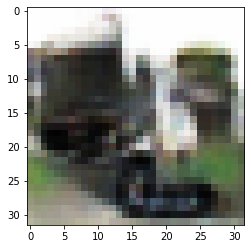

-> Epoch 121, Batch numero 1/78 -> Disc. loss on real images: 0.58935, Disc. loss on fake images: 0.49479, Generator loss: 1.08504
-> Epoch 121, Batch numero 2/78 -> Disc. loss on real images: 0.51259, Disc. loss on fake images: 0.55264, Generator loss: 0.99773
-> Epoch 121, Batch numero 3/78 -> Disc. loss on real images: 0.58377, Disc. loss on fake images: 0.72073, Generator loss: 1.02877
-> Epoch 121, Batch numero 4/78 -> Disc. loss on real images: 0.50476, Disc. loss on fake images: 0.57049, Generator loss: 1.10473
-> Epoch 121, Batch numero 5/78 -> Disc. loss on real images: 0.79413, Disc. loss on fake images: 0.55978, Generator loss: 1.05595
-> Epoch 121, Batch numero 6/78 -> Disc. loss on real images: 0.65847, Disc. loss on fake images: 0.59303, Generator loss: 1.06667
-> Epoch 121, Batch numero 7/78 -> Disc. loss on real images: 0.57610, Disc. loss on fake images: 0.56982, Generator loss: 1.02016
-> Epoch 121, Batch numero 8/78 -> Disc. loss on real images: 0.45813, Disc. loss o

-> Epoch 121, Batch numero 64/78 -> Disc. loss on real images: 0.57299, Disc. loss on fake images: 0.60690, Generator loss: 1.31729
-> Epoch 121, Batch numero 65/78 -> Disc. loss on real images: 0.61213, Disc. loss on fake images: 0.36945, Generator loss: 1.50468
-> Epoch 121, Batch numero 66/78 -> Disc. loss on real images: 0.68925, Disc. loss on fake images: 0.52944, Generator loss: 1.35650
-> Epoch 121, Batch numero 67/78 -> Disc. loss on real images: 0.64606, Disc. loss on fake images: 0.58360, Generator loss: 0.95244
-> Epoch 121, Batch numero 68/78 -> Disc. loss on real images: 0.48053, Disc. loss on fake images: 0.57708, Generator loss: 1.06129
-> Epoch 121, Batch numero 69/78 -> Disc. loss on real images: 0.58261, Disc. loss on fake images: 0.63070, Generator loss: 1.05051
-> Epoch 121, Batch numero 70/78 -> Disc. loss on real images: 0.55290, Disc. loss on fake images: 0.58916, Generator loss: 1.14879
-> Epoch 121, Batch numero 71/78 -> Disc. loss on real images: 0.51032, Disc

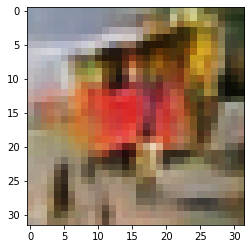

-> Epoch 122, Batch numero 1/78 -> Disc. loss on real images: 0.53914, Disc. loss on fake images: 0.54069, Generator loss: 1.13695
-> Epoch 122, Batch numero 2/78 -> Disc. loss on real images: 0.54034, Disc. loss on fake images: 0.56931, Generator loss: 1.11530
-> Epoch 122, Batch numero 3/78 -> Disc. loss on real images: 0.51392, Disc. loss on fake images: 0.60984, Generator loss: 1.14643
-> Epoch 122, Batch numero 4/78 -> Disc. loss on real images: 0.63313, Disc. loss on fake images: 0.59638, Generator loss: 1.25140
-> Epoch 122, Batch numero 5/78 -> Disc. loss on real images: 0.65003, Disc. loss on fake images: 0.70745, Generator loss: 1.08642
-> Epoch 122, Batch numero 6/78 -> Disc. loss on real images: 0.58323, Disc. loss on fake images: 0.55560, Generator loss: 1.15999
-> Epoch 122, Batch numero 7/78 -> Disc. loss on real images: 0.64825, Disc. loss on fake images: 0.51702, Generator loss: 1.12452
-> Epoch 122, Batch numero 8/78 -> Disc. loss on real images: 0.55957, Disc. loss o

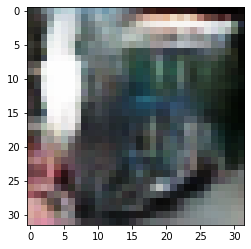

-> Epoch 123, Batch numero 1/78 -> Disc. loss on real images: 0.51591, Disc. loss on fake images: 0.50856, Generator loss: 1.09346
-> Epoch 123, Batch numero 2/78 -> Disc. loss on real images: 0.52971, Disc. loss on fake images: 0.64071, Generator loss: 1.14055
-> Epoch 123, Batch numero 3/78 -> Disc. loss on real images: 0.54301, Disc. loss on fake images: 0.63436, Generator loss: 1.12083
-> Epoch 123, Batch numero 4/78 -> Disc. loss on real images: 0.49892, Disc. loss on fake images: 0.76105, Generator loss: 1.11943
-> Epoch 123, Batch numero 5/78 -> Disc. loss on real images: 0.61170, Disc. loss on fake images: 0.54038, Generator loss: 1.28775
-> Epoch 123, Batch numero 6/78 -> Disc. loss on real images: 0.77957, Disc. loss on fake images: 0.45802, Generator loss: 1.38438
-> Epoch 123, Batch numero 7/78 -> Disc. loss on real images: 0.63477, Disc. loss on fake images: 0.49369, Generator loss: 1.33566
-> Epoch 123, Batch numero 8/78 -> Disc. loss on real images: 0.58441, Disc. loss o

-> Epoch 123, Batch numero 66/78 -> Disc. loss on real images: 0.62284, Disc. loss on fake images: 0.50990, Generator loss: 1.10977
-> Epoch 123, Batch numero 67/78 -> Disc. loss on real images: 0.61203, Disc. loss on fake images: 0.66333, Generator loss: 1.01146
-> Epoch 123, Batch numero 68/78 -> Disc. loss on real images: 0.48025, Disc. loss on fake images: 0.58974, Generator loss: 1.13672
-> Epoch 123, Batch numero 69/78 -> Disc. loss on real images: 0.51521, Disc. loss on fake images: 0.64415, Generator loss: 1.18812
-> Epoch 123, Batch numero 70/78 -> Disc. loss on real images: 0.50013, Disc. loss on fake images: 0.62005, Generator loss: 1.22372
-> Epoch 123, Batch numero 71/78 -> Disc. loss on real images: 0.62102, Disc. loss on fake images: 0.49775, Generator loss: 1.15159
-> Epoch 123, Batch numero 72/78 -> Disc. loss on real images: 0.62145, Disc. loss on fake images: 0.48311, Generator loss: 1.07454
-> Epoch 123, Batch numero 73/78 -> Disc. loss on real images: 0.59903, Disc

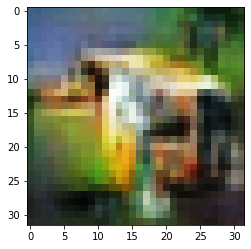

-> Epoch 124, Batch numero 1/78 -> Disc. loss on real images: 0.51582, Disc. loss on fake images: 0.68928, Generator loss: 1.21619
-> Epoch 124, Batch numero 2/78 -> Disc. loss on real images: 0.52093, Disc. loss on fake images: 0.49896, Generator loss: 1.26285
-> Epoch 124, Batch numero 3/78 -> Disc. loss on real images: 0.56852, Disc. loss on fake images: 0.45579, Generator loss: 1.24539
-> Epoch 124, Batch numero 4/78 -> Disc. loss on real images: 0.68529, Disc. loss on fake images: 0.73055, Generator loss: 1.23442
-> Epoch 124, Batch numero 5/78 -> Disc. loss on real images: 0.66432, Disc. loss on fake images: 0.72202, Generator loss: 1.28687
-> Epoch 124, Batch numero 6/78 -> Disc. loss on real images: 0.70657, Disc. loss on fake images: 0.55720, Generator loss: 1.33121
-> Epoch 124, Batch numero 7/78 -> Disc. loss on real images: 0.73191, Disc. loss on fake images: 0.40174, Generator loss: 1.29328
-> Epoch 124, Batch numero 8/78 -> Disc. loss on real images: 0.70197, Disc. loss o

-> Epoch 124, Batch numero 64/78 -> Disc. loss on real images: 0.61960, Disc. loss on fake images: 0.55774, Generator loss: 1.22155
-> Epoch 124, Batch numero 65/78 -> Disc. loss on real images: 0.68819, Disc. loss on fake images: 0.55815, Generator loss: 1.21751
-> Epoch 124, Batch numero 66/78 -> Disc. loss on real images: 0.61425, Disc. loss on fake images: 0.54446, Generator loss: 1.24954
-> Epoch 124, Batch numero 67/78 -> Disc. loss on real images: 0.55457, Disc. loss on fake images: 0.60957, Generator loss: 1.15048
-> Epoch 124, Batch numero 68/78 -> Disc. loss on real images: 0.67865, Disc. loss on fake images: 0.54482, Generator loss: 1.16047
-> Epoch 124, Batch numero 69/78 -> Disc. loss on real images: 0.59750, Disc. loss on fake images: 0.55429, Generator loss: 1.08520
-> Epoch 124, Batch numero 70/78 -> Disc. loss on real images: 0.60596, Disc. loss on fake images: 0.54023, Generator loss: 1.26748
-> Epoch 124, Batch numero 71/78 -> Disc. loss on real images: 0.66215, Disc

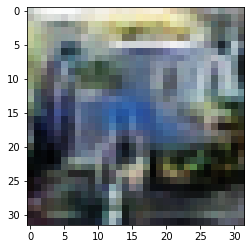

-> Epoch 125, Batch numero 1/78 -> Disc. loss on real images: 0.56715, Disc. loss on fake images: 0.67991, Generator loss: 1.26994
-> Epoch 125, Batch numero 2/78 -> Disc. loss on real images: 0.68760, Disc. loss on fake images: 0.49136, Generator loss: 1.04460
-> Epoch 125, Batch numero 3/78 -> Disc. loss on real images: 0.61975, Disc. loss on fake images: 0.48260, Generator loss: 1.13512
-> Epoch 125, Batch numero 4/78 -> Disc. loss on real images: 0.56014, Disc. loss on fake images: 0.64435, Generator loss: 1.08392
-> Epoch 125, Batch numero 5/78 -> Disc. loss on real images: 0.53636, Disc. loss on fake images: 0.58433, Generator loss: 1.14107
-> Epoch 125, Batch numero 6/78 -> Disc. loss on real images: 0.66337, Disc. loss on fake images: 0.52053, Generator loss: 1.05127
-> Epoch 125, Batch numero 7/78 -> Disc. loss on real images: 0.52761, Disc. loss on fake images: 0.54106, Generator loss: 1.11983
-> Epoch 125, Batch numero 8/78 -> Disc. loss on real images: 0.39505, Disc. loss o

-> Epoch 125, Batch numero 64/78 -> Disc. loss on real images: 0.58364, Disc. loss on fake images: 0.56398, Generator loss: 1.22148
-> Epoch 125, Batch numero 65/78 -> Disc. loss on real images: 0.48884, Disc. loss on fake images: 0.63623, Generator loss: 1.23104
-> Epoch 125, Batch numero 66/78 -> Disc. loss on real images: 0.67909, Disc. loss on fake images: 0.51066, Generator loss: 1.10905
-> Epoch 125, Batch numero 67/78 -> Disc. loss on real images: 0.75798, Disc. loss on fake images: 0.57445, Generator loss: 1.19811
-> Epoch 125, Batch numero 68/78 -> Disc. loss on real images: 0.56094, Disc. loss on fake images: 0.50772, Generator loss: 1.13580
-> Epoch 125, Batch numero 69/78 -> Disc. loss on real images: 0.59313, Disc. loss on fake images: 0.68099, Generator loss: 1.05342
-> Epoch 125, Batch numero 70/78 -> Disc. loss on real images: 0.58332, Disc. loss on fake images: 0.56244, Generator loss: 1.14728
-> Epoch 125, Batch numero 71/78 -> Disc. loss on real images: 0.52021, Disc

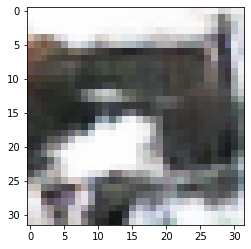

-> Epoch 126, Batch numero 1/78 -> Disc. loss on real images: 0.50570, Disc. loss on fake images: 0.55121, Generator loss: 1.13041
-> Epoch 126, Batch numero 2/78 -> Disc. loss on real images: 0.51010, Disc. loss on fake images: 0.61813, Generator loss: 1.10180
-> Epoch 126, Batch numero 3/78 -> Disc. loss on real images: 0.60263, Disc. loss on fake images: 0.53618, Generator loss: 1.14197
-> Epoch 126, Batch numero 4/78 -> Disc. loss on real images: 0.73819, Disc. loss on fake images: 0.60946, Generator loss: 1.19158
-> Epoch 126, Batch numero 5/78 -> Disc. loss on real images: 0.58891, Disc. loss on fake images: 0.65428, Generator loss: 1.17964
-> Epoch 126, Batch numero 6/78 -> Disc. loss on real images: 0.56877, Disc. loss on fake images: 0.60072, Generator loss: 1.18749
-> Epoch 126, Batch numero 7/78 -> Disc. loss on real images: 0.59745, Disc. loss on fake images: 0.57001, Generator loss: 1.19122
-> Epoch 126, Batch numero 8/78 -> Disc. loss on real images: 0.63964, Disc. loss o

-> Epoch 126, Batch numero 65/78 -> Disc. loss on real images: 0.57931, Disc. loss on fake images: 0.53745, Generator loss: 1.22191
-> Epoch 126, Batch numero 66/78 -> Disc. loss on real images: 0.65301, Disc. loss on fake images: 0.64145, Generator loss: 1.24928
-> Epoch 126, Batch numero 67/78 -> Disc. loss on real images: 0.60956, Disc. loss on fake images: 0.58651, Generator loss: 1.14406
-> Epoch 126, Batch numero 68/78 -> Disc. loss on real images: 0.66299, Disc. loss on fake images: 0.58623, Generator loss: 1.17124
-> Epoch 126, Batch numero 69/78 -> Disc. loss on real images: 0.43354, Disc. loss on fake images: 0.61795, Generator loss: 1.14335
-> Epoch 126, Batch numero 70/78 -> Disc. loss on real images: 0.71960, Disc. loss on fake images: 0.59675, Generator loss: 1.06319
-> Epoch 126, Batch numero 71/78 -> Disc. loss on real images: 0.57196, Disc. loss on fake images: 0.61366, Generator loss: 1.17249
-> Epoch 126, Batch numero 72/78 -> Disc. loss on real images: 0.54577, Disc

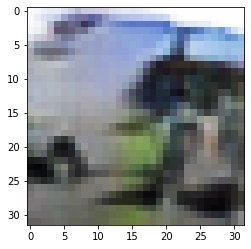

-> Epoch 127, Batch numero 1/78 -> Disc. loss on real images: 0.56694, Disc. loss on fake images: 0.65553, Generator loss: 1.18176
-> Epoch 127, Batch numero 2/78 -> Disc. loss on real images: 0.67466, Disc. loss on fake images: 0.55664, Generator loss: 1.21788
-> Epoch 127, Batch numero 3/78 -> Disc. loss on real images: 0.53041, Disc. loss on fake images: 0.57561, Generator loss: 1.13455
-> Epoch 127, Batch numero 4/78 -> Disc. loss on real images: 0.56996, Disc. loss on fake images: 0.56109, Generator loss: 1.18301
-> Epoch 127, Batch numero 5/78 -> Disc. loss on real images: 0.53189, Disc. loss on fake images: 0.55292, Generator loss: 1.14275
-> Epoch 127, Batch numero 6/78 -> Disc. loss on real images: 0.60834, Disc. loss on fake images: 0.54053, Generator loss: 1.05719
-> Epoch 127, Batch numero 7/78 -> Disc. loss on real images: 0.64487, Disc. loss on fake images: 0.51563, Generator loss: 1.02294
-> Epoch 127, Batch numero 8/78 -> Disc. loss on real images: 0.46318, Disc. loss o

-> Epoch 127, Batch numero 65/78 -> Disc. loss on real images: 0.87279, Disc. loss on fake images: 0.55282, Generator loss: 1.18699
-> Epoch 127, Batch numero 66/78 -> Disc. loss on real images: 0.65988, Disc. loss on fake images: 0.50163, Generator loss: 1.30253
-> Epoch 127, Batch numero 67/78 -> Disc. loss on real images: 0.67604, Disc. loss on fake images: 0.51515, Generator loss: 1.30345
-> Epoch 127, Batch numero 68/78 -> Disc. loss on real images: 0.57593, Disc. loss on fake images: 0.57344, Generator loss: 1.26871
-> Epoch 127, Batch numero 69/78 -> Disc. loss on real images: 0.53399, Disc. loss on fake images: 0.63152, Generator loss: 1.28786
-> Epoch 127, Batch numero 70/78 -> Disc. loss on real images: 0.69800, Disc. loss on fake images: 0.45792, Generator loss: 1.28742
-> Epoch 127, Batch numero 71/78 -> Disc. loss on real images: 0.56568, Disc. loss on fake images: 0.52650, Generator loss: 1.17551
-> Epoch 127, Batch numero 72/78 -> Disc. loss on real images: 0.55272, Disc

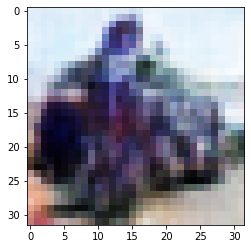

-> Epoch 128, Batch numero 1/78 -> Disc. loss on real images: 0.60068, Disc. loss on fake images: 0.59183, Generator loss: 1.16130
-> Epoch 128, Batch numero 2/78 -> Disc. loss on real images: 0.54041, Disc. loss on fake images: 0.50594, Generator loss: 1.34847
-> Epoch 128, Batch numero 3/78 -> Disc. loss on real images: 0.62553, Disc. loss on fake images: 0.56704, Generator loss: 1.08106
-> Epoch 128, Batch numero 4/78 -> Disc. loss on real images: 0.64478, Disc. loss on fake images: 0.57927, Generator loss: 0.96713
-> Epoch 128, Batch numero 5/78 -> Disc. loss on real images: 0.44003, Disc. loss on fake images: 0.78310, Generator loss: 1.15677
-> Epoch 128, Batch numero 6/78 -> Disc. loss on real images: 0.53314, Disc. loss on fake images: 0.56747, Generator loss: 1.11703
-> Epoch 128, Batch numero 7/78 -> Disc. loss on real images: 0.58108, Disc. loss on fake images: 0.55844, Generator loss: 1.15141
-> Epoch 128, Batch numero 8/78 -> Disc. loss on real images: 0.57125, Disc. loss o

-> Epoch 128, Batch numero 65/78 -> Disc. loss on real images: 0.54332, Disc. loss on fake images: 0.72904, Generator loss: 1.13500
-> Epoch 128, Batch numero 66/78 -> Disc. loss on real images: 0.66626, Disc. loss on fake images: 0.63725, Generator loss: 1.23159
-> Epoch 128, Batch numero 67/78 -> Disc. loss on real images: 0.59474, Disc. loss on fake images: 0.56128, Generator loss: 1.08037
-> Epoch 128, Batch numero 68/78 -> Disc. loss on real images: 0.59500, Disc. loss on fake images: 0.56013, Generator loss: 1.14267
-> Epoch 128, Batch numero 69/78 -> Disc. loss on real images: 0.65845, Disc. loss on fake images: 0.63838, Generator loss: 1.09573
-> Epoch 128, Batch numero 70/78 -> Disc. loss on real images: 0.53646, Disc. loss on fake images: 0.57262, Generator loss: 0.99069
-> Epoch 128, Batch numero 71/78 -> Disc. loss on real images: 0.53836, Disc. loss on fake images: 0.53498, Generator loss: 1.17190
-> Epoch 128, Batch numero 72/78 -> Disc. loss on real images: 0.50675, Disc

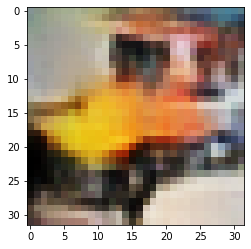

-> Epoch 129, Batch numero 1/78 -> Disc. loss on real images: 0.57185, Disc. loss on fake images: 0.76528, Generator loss: 1.20442
-> Epoch 129, Batch numero 2/78 -> Disc. loss on real images: 0.53129, Disc. loss on fake images: 0.44781, Generator loss: 1.34003
-> Epoch 129, Batch numero 3/78 -> Disc. loss on real images: 0.65038, Disc. loss on fake images: 0.57173, Generator loss: 1.13049
-> Epoch 129, Batch numero 4/78 -> Disc. loss on real images: 0.59030, Disc. loss on fake images: 0.53420, Generator loss: 1.38950
-> Epoch 129, Batch numero 5/78 -> Disc. loss on real images: 0.60365, Disc. loss on fake images: 0.54142, Generator loss: 1.24057
-> Epoch 129, Batch numero 6/78 -> Disc. loss on real images: 0.60164, Disc. loss on fake images: 0.53049, Generator loss: 1.23450
-> Epoch 129, Batch numero 7/78 -> Disc. loss on real images: 0.75487, Disc. loss on fake images: 0.51735, Generator loss: 1.38971
-> Epoch 129, Batch numero 8/78 -> Disc. loss on real images: 0.69453, Disc. loss o

-> Epoch 129, Batch numero 64/78 -> Disc. loss on real images: 0.51331, Disc. loss on fake images: 0.64737, Generator loss: 1.14745
-> Epoch 129, Batch numero 65/78 -> Disc. loss on real images: 0.65260, Disc. loss on fake images: 0.50968, Generator loss: 1.12906
-> Epoch 129, Batch numero 66/78 -> Disc. loss on real images: 0.63664, Disc. loss on fake images: 0.44441, Generator loss: 1.13437
-> Epoch 129, Batch numero 67/78 -> Disc. loss on real images: 0.55955, Disc. loss on fake images: 0.70221, Generator loss: 1.11768
-> Epoch 129, Batch numero 68/78 -> Disc. loss on real images: 0.49473, Disc. loss on fake images: 0.52782, Generator loss: 1.05503
-> Epoch 129, Batch numero 69/78 -> Disc. loss on real images: 0.65183, Disc. loss on fake images: 0.60750, Generator loss: 1.12563
-> Epoch 129, Batch numero 70/78 -> Disc. loss on real images: 0.61858, Disc. loss on fake images: 0.64548, Generator loss: 1.10909
-> Epoch 129, Batch numero 71/78 -> Disc. loss on real images: 0.60825, Disc

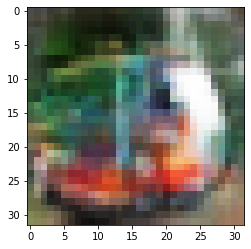

-> Epoch 130, Batch numero 1/78 -> Disc. loss on real images: 0.58368, Disc. loss on fake images: 0.62066, Generator loss: 1.19792
-> Epoch 130, Batch numero 2/78 -> Disc. loss on real images: 0.53141, Disc. loss on fake images: 0.55195, Generator loss: 1.20592
-> Epoch 130, Batch numero 3/78 -> Disc. loss on real images: 0.44661, Disc. loss on fake images: 0.47409, Generator loss: 1.25624
-> Epoch 130, Batch numero 4/78 -> Disc. loss on real images: 0.57014, Disc. loss on fake images: 0.66591, Generator loss: 1.18152
-> Epoch 130, Batch numero 5/78 -> Disc. loss on real images: 0.56529, Disc. loss on fake images: 0.64529, Generator loss: 1.21104
-> Epoch 130, Batch numero 6/78 -> Disc. loss on real images: 0.49773, Disc. loss on fake images: 0.50135, Generator loss: 1.08666
-> Epoch 130, Batch numero 7/78 -> Disc. loss on real images: 0.72539, Disc. loss on fake images: 0.55125, Generator loss: 1.07764
-> Epoch 130, Batch numero 8/78 -> Disc. loss on real images: 0.60021, Disc. loss o

-> Epoch 130, Batch numero 65/78 -> Disc. loss on real images: 0.71959, Disc. loss on fake images: 0.56004, Generator loss: 1.01981
-> Epoch 130, Batch numero 66/78 -> Disc. loss on real images: 0.45088, Disc. loss on fake images: 0.64309, Generator loss: 1.15718
-> Epoch 130, Batch numero 67/78 -> Disc. loss on real images: 0.53881, Disc. loss on fake images: 0.71522, Generator loss: 1.26938
-> Epoch 130, Batch numero 68/78 -> Disc. loss on real images: 0.65355, Disc. loss on fake images: 0.68792, Generator loss: 1.16311
-> Epoch 130, Batch numero 69/78 -> Disc. loss on real images: 0.73201, Disc. loss on fake images: 0.56598, Generator loss: 1.14848
-> Epoch 130, Batch numero 70/78 -> Disc. loss on real images: 0.49694, Disc. loss on fake images: 0.54923, Generator loss: 1.24463
-> Epoch 130, Batch numero 71/78 -> Disc. loss on real images: 0.61065, Disc. loss on fake images: 0.68632, Generator loss: 1.18199
-> Epoch 130, Batch numero 72/78 -> Disc. loss on real images: 0.73322, Disc

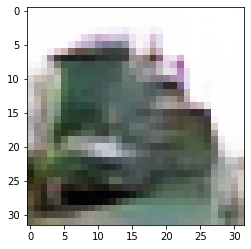

-> Epoch 131, Batch numero 1/78 -> Disc. loss on real images: 0.51923, Disc. loss on fake images: 0.52548, Generator loss: 1.22939
-> Epoch 131, Batch numero 2/78 -> Disc. loss on real images: 0.73158, Disc. loss on fake images: 0.49724, Generator loss: 1.18508
-> Epoch 131, Batch numero 3/78 -> Disc. loss on real images: 0.57588, Disc. loss on fake images: 0.52013, Generator loss: 1.20273
-> Epoch 131, Batch numero 4/78 -> Disc. loss on real images: 0.57208, Disc. loss on fake images: 0.51609, Generator loss: 1.21332
-> Epoch 131, Batch numero 5/78 -> Disc. loss on real images: 0.51656, Disc. loss on fake images: 0.45543, Generator loss: 1.14339
-> Epoch 131, Batch numero 6/78 -> Disc. loss on real images: 0.61376, Disc. loss on fake images: 0.62472, Generator loss: 1.21101
-> Epoch 131, Batch numero 7/78 -> Disc. loss on real images: 0.55451, Disc. loss on fake images: 0.55084, Generator loss: 1.12168
-> Epoch 131, Batch numero 8/78 -> Disc. loss on real images: 0.55586, Disc. loss o

-> Epoch 131, Batch numero 64/78 -> Disc. loss on real images: 0.65112, Disc. loss on fake images: 0.58391, Generator loss: 1.06454
-> Epoch 131, Batch numero 65/78 -> Disc. loss on real images: 0.62577, Disc. loss on fake images: 0.56091, Generator loss: 1.06586
-> Epoch 131, Batch numero 66/78 -> Disc. loss on real images: 0.49462, Disc. loss on fake images: 0.64958, Generator loss: 1.16958
-> Epoch 131, Batch numero 67/78 -> Disc. loss on real images: 0.59730, Disc. loss on fake images: 0.58310, Generator loss: 1.28319
-> Epoch 131, Batch numero 68/78 -> Disc. loss on real images: 0.59363, Disc. loss on fake images: 0.56676, Generator loss: 1.16539
-> Epoch 131, Batch numero 69/78 -> Disc. loss on real images: 0.65527, Disc. loss on fake images: 0.51007, Generator loss: 1.07770
-> Epoch 131, Batch numero 70/78 -> Disc. loss on real images: 0.55797, Disc. loss on fake images: 0.53088, Generator loss: 1.07018
-> Epoch 131, Batch numero 71/78 -> Disc. loss on real images: 0.42699, Disc

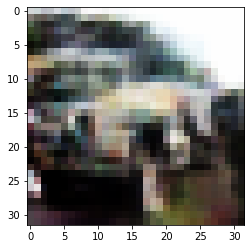

-> Epoch 132, Batch numero 1/78 -> Disc. loss on real images: 0.60811, Disc. loss on fake images: 0.55860, Generator loss: 1.08460
-> Epoch 132, Batch numero 2/78 -> Disc. loss on real images: 0.56771, Disc. loss on fake images: 0.57769, Generator loss: 1.25373
-> Epoch 132, Batch numero 3/78 -> Disc. loss on real images: 0.77393, Disc. loss on fake images: 0.62464, Generator loss: 1.13451
-> Epoch 132, Batch numero 4/78 -> Disc. loss on real images: 0.57173, Disc. loss on fake images: 0.53138, Generator loss: 1.07312
-> Epoch 132, Batch numero 5/78 -> Disc. loss on real images: 0.56692, Disc. loss on fake images: 0.58329, Generator loss: 1.18537
-> Epoch 132, Batch numero 6/78 -> Disc. loss on real images: 0.71234, Disc. loss on fake images: 0.58207, Generator loss: 1.10545
-> Epoch 132, Batch numero 7/78 -> Disc. loss on real images: 0.64278, Disc. loss on fake images: 0.51555, Generator loss: 1.08484
-> Epoch 132, Batch numero 8/78 -> Disc. loss on real images: 0.60088, Disc. loss o

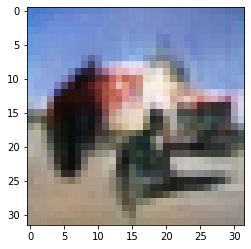

-> Epoch 133, Batch numero 1/78 -> Disc. loss on real images: 0.54554, Disc. loss on fake images: 0.59329, Generator loss: 1.46862
-> Epoch 133, Batch numero 2/78 -> Disc. loss on real images: 0.53609, Disc. loss on fake images: 0.43381, Generator loss: 1.41369
-> Epoch 133, Batch numero 3/78 -> Disc. loss on real images: 0.61304, Disc. loss on fake images: 0.44396, Generator loss: 1.21646
-> Epoch 133, Batch numero 4/78 -> Disc. loss on real images: 0.60246, Disc. loss on fake images: 0.58463, Generator loss: 1.15803
-> Epoch 133, Batch numero 5/78 -> Disc. loss on real images: 0.57704, Disc. loss on fake images: 0.62369, Generator loss: 1.18525
-> Epoch 133, Batch numero 6/78 -> Disc. loss on real images: 0.65319, Disc. loss on fake images: 0.54680, Generator loss: 1.10722
-> Epoch 133, Batch numero 7/78 -> Disc. loss on real images: 0.47983, Disc. loss on fake images: 0.55804, Generator loss: 1.18709
-> Epoch 133, Batch numero 8/78 -> Disc. loss on real images: 0.50622, Disc. loss o

-> Epoch 133, Batch numero 65/78 -> Disc. loss on real images: 0.58308, Disc. loss on fake images: 0.49065, Generator loss: 1.31917
-> Epoch 133, Batch numero 66/78 -> Disc. loss on real images: 0.59327, Disc. loss on fake images: 0.53343, Generator loss: 1.12220
-> Epoch 133, Batch numero 67/78 -> Disc. loss on real images: 0.63030, Disc. loss on fake images: 0.59985, Generator loss: 1.12216
-> Epoch 133, Batch numero 68/78 -> Disc. loss on real images: 0.45986, Disc. loss on fake images: 0.72424, Generator loss: 1.20079
-> Epoch 133, Batch numero 69/78 -> Disc. loss on real images: 0.47227, Disc. loss on fake images: 0.52039, Generator loss: 1.23352
-> Epoch 133, Batch numero 70/78 -> Disc. loss on real images: 0.62156, Disc. loss on fake images: 0.42286, Generator loss: 1.33963
-> Epoch 133, Batch numero 71/78 -> Disc. loss on real images: 0.69733, Disc. loss on fake images: 0.55052, Generator loss: 1.27390
-> Epoch 133, Batch numero 72/78 -> Disc. loss on real images: 0.54456, Disc

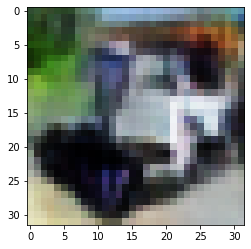

-> Epoch 134, Batch numero 1/78 -> Disc. loss on real images: 0.54561, Disc. loss on fake images: 0.80789, Generator loss: 1.32240
-> Epoch 134, Batch numero 2/78 -> Disc. loss on real images: 0.56727, Disc. loss on fake images: 0.48663, Generator loss: 1.16557
-> Epoch 134, Batch numero 3/78 -> Disc. loss on real images: 0.53714, Disc. loss on fake images: 0.54847, Generator loss: 1.13795
-> Epoch 134, Batch numero 4/78 -> Disc. loss on real images: 0.53875, Disc. loss on fake images: 0.56206, Generator loss: 1.18985
-> Epoch 134, Batch numero 5/78 -> Disc. loss on real images: 0.59917, Disc. loss on fake images: 0.52790, Generator loss: 1.14947
-> Epoch 134, Batch numero 6/78 -> Disc. loss on real images: 0.50146, Disc. loss on fake images: 0.56085, Generator loss: 1.17897
-> Epoch 134, Batch numero 7/78 -> Disc. loss on real images: 0.46724, Disc. loss on fake images: 0.55541, Generator loss: 1.16458
-> Epoch 134, Batch numero 8/78 -> Disc. loss on real images: 0.52370, Disc. loss o

-> Epoch 134, Batch numero 64/78 -> Disc. loss on real images: 0.51466, Disc. loss on fake images: 0.59209, Generator loss: 1.12660
-> Epoch 134, Batch numero 65/78 -> Disc. loss on real images: 0.47122, Disc. loss on fake images: 0.55881, Generator loss: 1.26023
-> Epoch 134, Batch numero 66/78 -> Disc. loss on real images: 0.65004, Disc. loss on fake images: 0.60741, Generator loss: 1.19914
-> Epoch 134, Batch numero 67/78 -> Disc. loss on real images: 0.59663, Disc. loss on fake images: 0.58077, Generator loss: 1.24349
-> Epoch 134, Batch numero 68/78 -> Disc. loss on real images: 0.57542, Disc. loss on fake images: 0.41163, Generator loss: 1.21728
-> Epoch 134, Batch numero 69/78 -> Disc. loss on real images: 0.56981, Disc. loss on fake images: 0.67922, Generator loss: 1.20225
-> Epoch 134, Batch numero 70/78 -> Disc. loss on real images: 0.55241, Disc. loss on fake images: 0.47656, Generator loss: 1.02356
-> Epoch 134, Batch numero 71/78 -> Disc. loss on real images: 0.42492, Disc

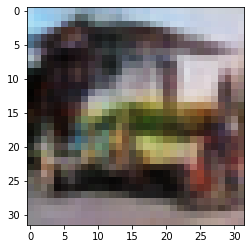

-> Epoch 135, Batch numero 1/78 -> Disc. loss on real images: 0.49084, Disc. loss on fake images: 0.56275, Generator loss: 1.31103
-> Epoch 135, Batch numero 2/78 -> Disc. loss on real images: 0.57742, Disc. loss on fake images: 0.61411, Generator loss: 1.31298
-> Epoch 135, Batch numero 3/78 -> Disc. loss on real images: 0.58621, Disc. loss on fake images: 0.42517, Generator loss: 1.30647
-> Epoch 135, Batch numero 4/78 -> Disc. loss on real images: 0.58927, Disc. loss on fake images: 0.57442, Generator loss: 1.26893
-> Epoch 135, Batch numero 5/78 -> Disc. loss on real images: 0.73088, Disc. loss on fake images: 0.48495, Generator loss: 1.26519
-> Epoch 135, Batch numero 6/78 -> Disc. loss on real images: 0.53705, Disc. loss on fake images: 0.56703, Generator loss: 1.22874
-> Epoch 135, Batch numero 7/78 -> Disc. loss on real images: 0.57362, Disc. loss on fake images: 0.54715, Generator loss: 1.36740
-> Epoch 135, Batch numero 8/78 -> Disc. loss on real images: 0.55530, Disc. loss o

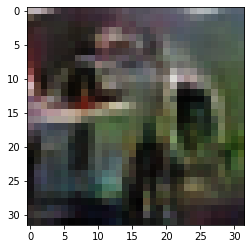

-> Epoch 136, Batch numero 1/78 -> Disc. loss on real images: 0.54048, Disc. loss on fake images: 0.49070, Generator loss: 1.24434
-> Epoch 136, Batch numero 2/78 -> Disc. loss on real images: 0.51592, Disc. loss on fake images: 0.42036, Generator loss: 1.14437
-> Epoch 136, Batch numero 3/78 -> Disc. loss on real images: 0.60634, Disc. loss on fake images: 0.61434, Generator loss: 1.25182
-> Epoch 136, Batch numero 4/78 -> Disc. loss on real images: 0.62137, Disc. loss on fake images: 0.58644, Generator loss: 1.31312
-> Epoch 136, Batch numero 5/78 -> Disc. loss on real images: 0.56036, Disc. loss on fake images: 0.61264, Generator loss: 1.19079
-> Epoch 136, Batch numero 6/78 -> Disc. loss on real images: 0.59975, Disc. loss on fake images: 0.59547, Generator loss: 1.17549
-> Epoch 136, Batch numero 7/78 -> Disc. loss on real images: 0.52423, Disc. loss on fake images: 0.54565, Generator loss: 1.29603
-> Epoch 136, Batch numero 8/78 -> Disc. loss on real images: 0.64157, Disc. loss o

-> Epoch 136, Batch numero 64/78 -> Disc. loss on real images: 0.57931, Disc. loss on fake images: 0.74540, Generator loss: 1.22694
-> Epoch 136, Batch numero 65/78 -> Disc. loss on real images: 0.64913, Disc. loss on fake images: 0.69049, Generator loss: 1.22972
-> Epoch 136, Batch numero 66/78 -> Disc. loss on real images: 0.55498, Disc. loss on fake images: 0.56348, Generator loss: 1.24400
-> Epoch 136, Batch numero 67/78 -> Disc. loss on real images: 0.57639, Disc. loss on fake images: 0.47712, Generator loss: 1.29732
-> Epoch 136, Batch numero 68/78 -> Disc. loss on real images: 0.61149, Disc. loss on fake images: 0.57626, Generator loss: 1.12330
-> Epoch 136, Batch numero 69/78 -> Disc. loss on real images: 0.64808, Disc. loss on fake images: 0.58099, Generator loss: 1.16659
-> Epoch 136, Batch numero 70/78 -> Disc. loss on real images: 0.63753, Disc. loss on fake images: 0.60840, Generator loss: 1.20518
-> Epoch 136, Batch numero 71/78 -> Disc. loss on real images: 0.52922, Disc

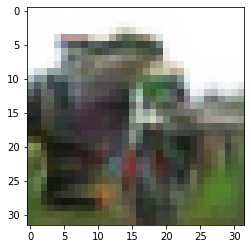

-> Epoch 137, Batch numero 1/78 -> Disc. loss on real images: 0.60972, Disc. loss on fake images: 0.58329, Generator loss: 1.02830
-> Epoch 137, Batch numero 2/78 -> Disc. loss on real images: 0.57543, Disc. loss on fake images: 0.51002, Generator loss: 1.10948
-> Epoch 137, Batch numero 3/78 -> Disc. loss on real images: 0.41723, Disc. loss on fake images: 0.58511, Generator loss: 1.07492
-> Epoch 137, Batch numero 4/78 -> Disc. loss on real images: 0.50377, Disc. loss on fake images: 0.62376, Generator loss: 1.13901
-> Epoch 137, Batch numero 5/78 -> Disc. loss on real images: 0.53559, Disc. loss on fake images: 0.55663, Generator loss: 1.10764
-> Epoch 137, Batch numero 6/78 -> Disc. loss on real images: 0.47813, Disc. loss on fake images: 0.62165, Generator loss: 1.32153
-> Epoch 137, Batch numero 7/78 -> Disc. loss on real images: 0.59994, Disc. loss on fake images: 0.64099, Generator loss: 1.17795
-> Epoch 137, Batch numero 8/78 -> Disc. loss on real images: 0.58824, Disc. loss o

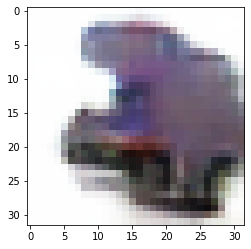

-> Epoch 138, Batch numero 1/78 -> Disc. loss on real images: 0.56024, Disc. loss on fake images: 0.46507, Generator loss: 1.33685
-> Epoch 138, Batch numero 2/78 -> Disc. loss on real images: 0.65609, Disc. loss on fake images: 0.64172, Generator loss: 1.28162
-> Epoch 138, Batch numero 3/78 -> Disc. loss on real images: 0.51729, Disc. loss on fake images: 0.54686, Generator loss: 1.06504
-> Epoch 138, Batch numero 4/78 -> Disc. loss on real images: 0.56185, Disc. loss on fake images: 0.57049, Generator loss: 1.17216
-> Epoch 138, Batch numero 5/78 -> Disc. loss on real images: 0.61010, Disc. loss on fake images: 0.53284, Generator loss: 1.12620
-> Epoch 138, Batch numero 6/78 -> Disc. loss on real images: 0.52279, Disc. loss on fake images: 0.54137, Generator loss: 1.24523
-> Epoch 138, Batch numero 7/78 -> Disc. loss on real images: 0.46948, Disc. loss on fake images: 0.50706, Generator loss: 1.26746
-> Epoch 138, Batch numero 8/78 -> Disc. loss on real images: 0.63553, Disc. loss o

-> Epoch 138, Batch numero 65/78 -> Disc. loss on real images: 0.53368, Disc. loss on fake images: 0.52656, Generator loss: 1.27773
-> Epoch 138, Batch numero 66/78 -> Disc. loss on real images: 0.55028, Disc. loss on fake images: 0.54538, Generator loss: 1.19034
-> Epoch 138, Batch numero 67/78 -> Disc. loss on real images: 0.61423, Disc. loss on fake images: 0.46169, Generator loss: 1.25495
-> Epoch 138, Batch numero 68/78 -> Disc. loss on real images: 0.58617, Disc. loss on fake images: 0.57898, Generator loss: 1.33182
-> Epoch 138, Batch numero 69/78 -> Disc. loss on real images: 0.49364, Disc. loss on fake images: 0.56956, Generator loss: 1.38492
-> Epoch 138, Batch numero 70/78 -> Disc. loss on real images: 0.48023, Disc. loss on fake images: 0.60377, Generator loss: 1.30448
-> Epoch 138, Batch numero 71/78 -> Disc. loss on real images: 0.57214, Disc. loss on fake images: 0.49376, Generator loss: 1.17240
-> Epoch 138, Batch numero 72/78 -> Disc. loss on real images: 0.47573, Disc

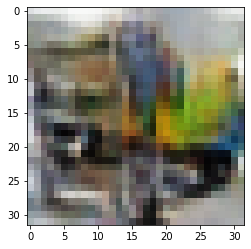

-> Epoch 139, Batch numero 1/78 -> Disc. loss on real images: 0.55108, Disc. loss on fake images: 0.44426, Generator loss: 1.24352
-> Epoch 139, Batch numero 2/78 -> Disc. loss on real images: 0.59621, Disc. loss on fake images: 0.55370, Generator loss: 1.14810
-> Epoch 139, Batch numero 3/78 -> Disc. loss on real images: 0.66803, Disc. loss on fake images: 0.68318, Generator loss: 1.08059
-> Epoch 139, Batch numero 4/78 -> Disc. loss on real images: 0.51709, Disc. loss on fake images: 0.51809, Generator loss: 1.16893
-> Epoch 139, Batch numero 5/78 -> Disc. loss on real images: 0.48418, Disc. loss on fake images: 0.42403, Generator loss: 1.18885
-> Epoch 139, Batch numero 6/78 -> Disc. loss on real images: 0.55901, Disc. loss on fake images: 0.65966, Generator loss: 1.24706
-> Epoch 139, Batch numero 7/78 -> Disc. loss on real images: 0.57082, Disc. loss on fake images: 0.67738, Generator loss: 1.38185
-> Epoch 139, Batch numero 8/78 -> Disc. loss on real images: 0.59727, Disc. loss o

-> Epoch 139, Batch numero 65/78 -> Disc. loss on real images: 0.82250, Disc. loss on fake images: 0.56049, Generator loss: 1.14582
-> Epoch 139, Batch numero 66/78 -> Disc. loss on real images: 0.51747, Disc. loss on fake images: 0.49708, Generator loss: 1.15312
-> Epoch 139, Batch numero 67/78 -> Disc. loss on real images: 0.67154, Disc. loss on fake images: 0.83832, Generator loss: 1.15574
-> Epoch 139, Batch numero 68/78 -> Disc. loss on real images: 0.54006, Disc. loss on fake images: 0.57197, Generator loss: 1.09925
-> Epoch 139, Batch numero 69/78 -> Disc. loss on real images: 0.50184, Disc. loss on fake images: 0.53892, Generator loss: 1.17623
-> Epoch 139, Batch numero 70/78 -> Disc. loss on real images: 0.52002, Disc. loss on fake images: 0.51015, Generator loss: 1.13433
-> Epoch 139, Batch numero 71/78 -> Disc. loss on real images: 0.58897, Disc. loss on fake images: 0.50565, Generator loss: 1.25304
-> Epoch 139, Batch numero 72/78 -> Disc. loss on real images: 0.55663, Disc

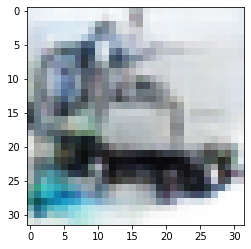

-> Epoch 140, Batch numero 1/78 -> Disc. loss on real images: 0.58578, Disc. loss on fake images: 0.55425, Generator loss: 1.25680
-> Epoch 140, Batch numero 2/78 -> Disc. loss on real images: 0.59358, Disc. loss on fake images: 0.56439, Generator loss: 1.26074
-> Epoch 140, Batch numero 3/78 -> Disc. loss on real images: 0.47078, Disc. loss on fake images: 0.46631, Generator loss: 1.37560
-> Epoch 140, Batch numero 4/78 -> Disc. loss on real images: 0.58276, Disc. loss on fake images: 0.59110, Generator loss: 1.34381
-> Epoch 140, Batch numero 5/78 -> Disc. loss on real images: 0.63638, Disc. loss on fake images: 0.48477, Generator loss: 1.11833
-> Epoch 140, Batch numero 6/78 -> Disc. loss on real images: 0.63277, Disc. loss on fake images: 0.57690, Generator loss: 1.13043
-> Epoch 140, Batch numero 7/78 -> Disc. loss on real images: 0.45482, Disc. loss on fake images: 0.54737, Generator loss: 1.16116
-> Epoch 140, Batch numero 8/78 -> Disc. loss on real images: 0.46032, Disc. loss o

-> Epoch 140, Batch numero 64/78 -> Disc. loss on real images: 0.60379, Disc. loss on fake images: 0.54326, Generator loss: 1.26487
-> Epoch 140, Batch numero 65/78 -> Disc. loss on real images: 0.50029, Disc. loss on fake images: 0.59889, Generator loss: 1.30689
-> Epoch 140, Batch numero 66/78 -> Disc. loss on real images: 0.43500, Disc. loss on fake images: 0.46487, Generator loss: 1.33676
-> Epoch 140, Batch numero 67/78 -> Disc. loss on real images: 0.54226, Disc. loss on fake images: 0.50156, Generator loss: 1.08725
-> Epoch 140, Batch numero 68/78 -> Disc. loss on real images: 0.47437, Disc. loss on fake images: 0.68461, Generator loss: 1.32826
-> Epoch 140, Batch numero 69/78 -> Disc. loss on real images: 0.64033, Disc. loss on fake images: 0.61971, Generator loss: 1.48745
-> Epoch 140, Batch numero 70/78 -> Disc. loss on real images: 0.80324, Disc. loss on fake images: 0.52728, Generator loss: 1.37296
-> Epoch 140, Batch numero 71/78 -> Disc. loss on real images: 0.61319, Disc

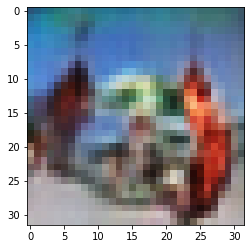

-> Epoch 141, Batch numero 1/78 -> Disc. loss on real images: 0.59583, Disc. loss on fake images: 0.44823, Generator loss: 1.46353
-> Epoch 141, Batch numero 2/78 -> Disc. loss on real images: 0.49583, Disc. loss on fake images: 0.40914, Generator loss: 1.33200
-> Epoch 141, Batch numero 3/78 -> Disc. loss on real images: 0.55445, Disc. loss on fake images: 0.56217, Generator loss: 1.25983
-> Epoch 141, Batch numero 4/78 -> Disc. loss on real images: 0.54018, Disc. loss on fake images: 0.66382, Generator loss: 1.24635
-> Epoch 141, Batch numero 5/78 -> Disc. loss on real images: 0.57258, Disc. loss on fake images: 0.65056, Generator loss: 1.38761
-> Epoch 141, Batch numero 6/78 -> Disc. loss on real images: 0.50945, Disc. loss on fake images: 0.50090, Generator loss: 1.41544
-> Epoch 141, Batch numero 7/78 -> Disc. loss on real images: 0.72002, Disc. loss on fake images: 0.51062, Generator loss: 1.29303
-> Epoch 141, Batch numero 8/78 -> Disc. loss on real images: 0.56775, Disc. loss o

-> Epoch 141, Batch numero 65/78 -> Disc. loss on real images: 0.67215, Disc. loss on fake images: 0.43801, Generator loss: 1.36496
-> Epoch 141, Batch numero 66/78 -> Disc. loss on real images: 0.71028, Disc. loss on fake images: 0.39835, Generator loss: 1.30913
-> Epoch 141, Batch numero 67/78 -> Disc. loss on real images: 0.54047, Disc. loss on fake images: 0.61002, Generator loss: 1.22170
-> Epoch 141, Batch numero 68/78 -> Disc. loss on real images: 0.67835, Disc. loss on fake images: 0.55004, Generator loss: 1.25084
-> Epoch 141, Batch numero 69/78 -> Disc. loss on real images: 0.50267, Disc. loss on fake images: 0.48391, Generator loss: 1.05137
-> Epoch 141, Batch numero 70/78 -> Disc. loss on real images: 0.55693, Disc. loss on fake images: 0.60281, Generator loss: 1.25169
-> Epoch 141, Batch numero 71/78 -> Disc. loss on real images: 0.50132, Disc. loss on fake images: 0.64644, Generator loss: 1.23094
-> Epoch 141, Batch numero 72/78 -> Disc. loss on real images: 0.48935, Disc

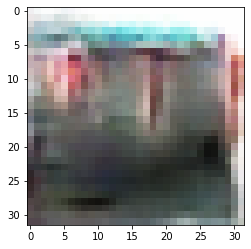

-> Epoch 142, Batch numero 1/78 -> Disc. loss on real images: 0.51752, Disc. loss on fake images: 0.56700, Generator loss: 1.26948
-> Epoch 142, Batch numero 2/78 -> Disc. loss on real images: 0.44042, Disc. loss on fake images: 0.55499, Generator loss: 1.16562
-> Epoch 142, Batch numero 3/78 -> Disc. loss on real images: 0.37044, Disc. loss on fake images: 0.58772, Generator loss: 1.24315
-> Epoch 142, Batch numero 4/78 -> Disc. loss on real images: 0.48832, Disc. loss on fake images: 0.62781, Generator loss: 1.51411
-> Epoch 142, Batch numero 5/78 -> Disc. loss on real images: 0.61032, Disc. loss on fake images: 0.43758, Generator loss: 1.45040
-> Epoch 142, Batch numero 6/78 -> Disc. loss on real images: 0.81310, Disc. loss on fake images: 0.45654, Generator loss: 1.39132
-> Epoch 142, Batch numero 7/78 -> Disc. loss on real images: 0.60584, Disc. loss on fake images: 0.46735, Generator loss: 1.34228
-> Epoch 142, Batch numero 8/78 -> Disc. loss on real images: 0.55607, Disc. loss o

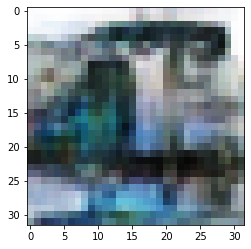

-> Epoch 143, Batch numero 1/78 -> Disc. loss on real images: 0.58440, Disc. loss on fake images: 0.66722, Generator loss: 1.34231
-> Epoch 143, Batch numero 2/78 -> Disc. loss on real images: 0.51222, Disc. loss on fake images: 0.50189, Generator loss: 1.33219
-> Epoch 143, Batch numero 3/78 -> Disc. loss on real images: 0.65967, Disc. loss on fake images: 0.58429, Generator loss: 1.27853
-> Epoch 143, Batch numero 4/78 -> Disc. loss on real images: 0.65167, Disc. loss on fake images: 0.44278, Generator loss: 1.32756
-> Epoch 143, Batch numero 5/78 -> Disc. loss on real images: 0.66322, Disc. loss on fake images: 0.53878, Generator loss: 1.14270
-> Epoch 143, Batch numero 6/78 -> Disc. loss on real images: 0.49101, Disc. loss on fake images: 0.79842, Generator loss: 1.17527
-> Epoch 143, Batch numero 7/78 -> Disc. loss on real images: 0.65118, Disc. loss on fake images: 0.60025, Generator loss: 1.25530
-> Epoch 143, Batch numero 8/78 -> Disc. loss on real images: 0.47756, Disc. loss o

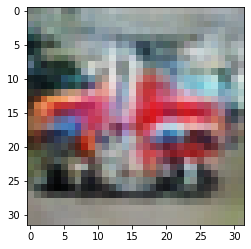

-> Epoch 144, Batch numero 1/78 -> Disc. loss on real images: 0.54475, Disc. loss on fake images: 0.42133, Generator loss: 1.12939
-> Epoch 144, Batch numero 2/78 -> Disc. loss on real images: 0.59864, Disc. loss on fake images: 0.65196, Generator loss: 1.22583
-> Epoch 144, Batch numero 3/78 -> Disc. loss on real images: 0.52076, Disc. loss on fake images: 0.55428, Generator loss: 1.19231
-> Epoch 144, Batch numero 4/78 -> Disc. loss on real images: 0.64443, Disc. loss on fake images: 0.72856, Generator loss: 1.30742
-> Epoch 144, Batch numero 5/78 -> Disc. loss on real images: 0.63523, Disc. loss on fake images: 0.48005, Generator loss: 1.40955
-> Epoch 144, Batch numero 6/78 -> Disc. loss on real images: 0.54072, Disc. loss on fake images: 0.53011, Generator loss: 1.28478
-> Epoch 144, Batch numero 7/78 -> Disc. loss on real images: 0.63373, Disc. loss on fake images: 0.60449, Generator loss: 1.16653
-> Epoch 144, Batch numero 8/78 -> Disc. loss on real images: 0.54362, Disc. loss o

-> Epoch 144, Batch numero 65/78 -> Disc. loss on real images: 0.62715, Disc. loss on fake images: 0.51021, Generator loss: 1.09797
-> Epoch 144, Batch numero 66/78 -> Disc. loss on real images: 0.60350, Disc. loss on fake images: 0.47171, Generator loss: 0.97034
-> Epoch 144, Batch numero 67/78 -> Disc. loss on real images: 0.42223, Disc. loss on fake images: 0.54918, Generator loss: 1.04324
-> Epoch 144, Batch numero 68/78 -> Disc. loss on real images: 0.40104, Disc. loss on fake images: 0.56786, Generator loss: 1.13680
-> Epoch 144, Batch numero 69/78 -> Disc. loss on real images: 0.51291, Disc. loss on fake images: 0.48989, Generator loss: 1.39208
-> Epoch 144, Batch numero 70/78 -> Disc. loss on real images: 0.56945, Disc. loss on fake images: 0.63840, Generator loss: 1.49521
-> Epoch 144, Batch numero 71/78 -> Disc. loss on real images: 0.57072, Disc. loss on fake images: 0.52865, Generator loss: 1.28272
-> Epoch 144, Batch numero 72/78 -> Disc. loss on real images: 0.59892, Disc

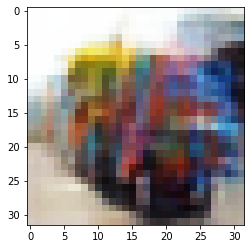

-> Epoch 145, Batch numero 1/78 -> Disc. loss on real images: 0.44552, Disc. loss on fake images: 0.71656, Generator loss: 1.18303
-> Epoch 145, Batch numero 2/78 -> Disc. loss on real images: 0.63908, Disc. loss on fake images: 0.59806, Generator loss: 1.09240
-> Epoch 145, Batch numero 3/78 -> Disc. loss on real images: 0.44158, Disc. loss on fake images: 0.55550, Generator loss: 1.18229
-> Epoch 145, Batch numero 4/78 -> Disc. loss on real images: 0.61551, Disc. loss on fake images: 0.55600, Generator loss: 1.23547
-> Epoch 145, Batch numero 5/78 -> Disc. loss on real images: 0.49994, Disc. loss on fake images: 0.54466, Generator loss: 1.42276
-> Epoch 145, Batch numero 6/78 -> Disc. loss on real images: 0.59410, Disc. loss on fake images: 0.49988, Generator loss: 1.57688
-> Epoch 145, Batch numero 7/78 -> Disc. loss on real images: 0.48599, Disc. loss on fake images: 0.41249, Generator loss: 1.38501
-> Epoch 145, Batch numero 8/78 -> Disc. loss on real images: 0.62869, Disc. loss o

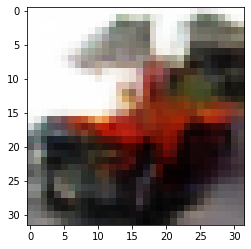

-> Epoch 146, Batch numero 1/78 -> Disc. loss on real images: 0.50779, Disc. loss on fake images: 0.58383, Generator loss: 1.28321
-> Epoch 146, Batch numero 2/78 -> Disc. loss on real images: 0.62210, Disc. loss on fake images: 0.46822, Generator loss: 1.32389
-> Epoch 146, Batch numero 3/78 -> Disc. loss on real images: 0.55485, Disc. loss on fake images: 0.66535, Generator loss: 1.42818
-> Epoch 146, Batch numero 4/78 -> Disc. loss on real images: 0.61082, Disc. loss on fake images: 0.50292, Generator loss: 1.21377
-> Epoch 146, Batch numero 5/78 -> Disc. loss on real images: 0.56479, Disc. loss on fake images: 0.58107, Generator loss: 1.19997
-> Epoch 146, Batch numero 6/78 -> Disc. loss on real images: 0.54404, Disc. loss on fake images: 0.47027, Generator loss: 1.28872
-> Epoch 146, Batch numero 7/78 -> Disc. loss on real images: 0.59738, Disc. loss on fake images: 0.53376, Generator loss: 1.19464
-> Epoch 146, Batch numero 8/78 -> Disc. loss on real images: 0.53833, Disc. loss o

-> Epoch 146, Batch numero 64/78 -> Disc. loss on real images: 0.41538, Disc. loss on fake images: 0.42210, Generator loss: 1.22032
-> Epoch 146, Batch numero 65/78 -> Disc. loss on real images: 0.62673, Disc. loss on fake images: 0.62050, Generator loss: 1.19122
-> Epoch 146, Batch numero 66/78 -> Disc. loss on real images: 0.63842, Disc. loss on fake images: 0.55722, Generator loss: 0.99629
-> Epoch 146, Batch numero 67/78 -> Disc. loss on real images: 0.51130, Disc. loss on fake images: 0.48886, Generator loss: 1.21489
-> Epoch 146, Batch numero 68/78 -> Disc. loss on real images: 0.57643, Disc. loss on fake images: 0.50026, Generator loss: 1.21383
-> Epoch 146, Batch numero 69/78 -> Disc. loss on real images: 0.43917, Disc. loss on fake images: 0.78013, Generator loss: 1.30648
-> Epoch 146, Batch numero 70/78 -> Disc. loss on real images: 0.68280, Disc. loss on fake images: 0.45327, Generator loss: 1.21580
-> Epoch 146, Batch numero 71/78 -> Disc. loss on real images: 0.54774, Disc

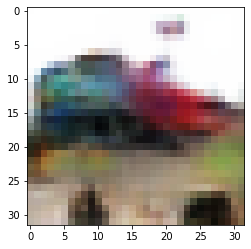

-> Epoch 147, Batch numero 1/78 -> Disc. loss on real images: 0.64822, Disc. loss on fake images: 0.38702, Generator loss: 1.30687
-> Epoch 147, Batch numero 2/78 -> Disc. loss on real images: 0.47015, Disc. loss on fake images: 0.56331, Generator loss: 1.35504
-> Epoch 147, Batch numero 3/78 -> Disc. loss on real images: 0.35825, Disc. loss on fake images: 0.55821, Generator loss: 1.29497
-> Epoch 147, Batch numero 4/78 -> Disc. loss on real images: 0.55583, Disc. loss on fake images: 0.55070, Generator loss: 1.35797
-> Epoch 147, Batch numero 5/78 -> Disc. loss on real images: 0.50470, Disc. loss on fake images: 0.47974, Generator loss: 1.25566
-> Epoch 147, Batch numero 6/78 -> Disc. loss on real images: 0.69149, Disc. loss on fake images: 0.66714, Generator loss: 1.16951
-> Epoch 147, Batch numero 7/78 -> Disc. loss on real images: 0.63367, Disc. loss on fake images: 0.56907, Generator loss: 1.18217
-> Epoch 147, Batch numero 8/78 -> Disc. loss on real images: 0.55211, Disc. loss o

-> Epoch 147, Batch numero 64/78 -> Disc. loss on real images: 0.54933, Disc. loss on fake images: 0.51658, Generator loss: 1.26237
-> Epoch 147, Batch numero 65/78 -> Disc. loss on real images: 0.53039, Disc. loss on fake images: 0.55474, Generator loss: 1.22254
-> Epoch 147, Batch numero 66/78 -> Disc. loss on real images: 0.59974, Disc. loss on fake images: 0.46103, Generator loss: 1.17493
-> Epoch 147, Batch numero 67/78 -> Disc. loss on real images: 0.54079, Disc. loss on fake images: 0.50330, Generator loss: 1.16584
-> Epoch 147, Batch numero 68/78 -> Disc. loss on real images: 0.39997, Disc. loss on fake images: 0.55402, Generator loss: 1.18801
-> Epoch 147, Batch numero 69/78 -> Disc. loss on real images: 0.48006, Disc. loss on fake images: 0.54307, Generator loss: 1.15008
-> Epoch 147, Batch numero 70/78 -> Disc. loss on real images: 0.51574, Disc. loss on fake images: 0.59903, Generator loss: 1.21946
-> Epoch 147, Batch numero 71/78 -> Disc. loss on real images: 0.46122, Disc

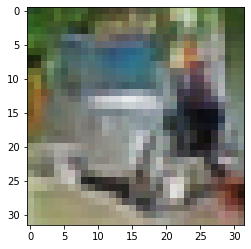

-> Epoch 148, Batch numero 1/78 -> Disc. loss on real images: 0.48248, Disc. loss on fake images: 0.49082, Generator loss: 1.31357
-> Epoch 148, Batch numero 2/78 -> Disc. loss on real images: 0.51718, Disc. loss on fake images: 0.50499, Generator loss: 1.42497
-> Epoch 148, Batch numero 3/78 -> Disc. loss on real images: 0.66199, Disc. loss on fake images: 0.50328, Generator loss: 1.23552
-> Epoch 148, Batch numero 4/78 -> Disc. loss on real images: 0.47535, Disc. loss on fake images: 0.45903, Generator loss: 1.13992
-> Epoch 148, Batch numero 5/78 -> Disc. loss on real images: 0.46184, Disc. loss on fake images: 0.59273, Generator loss: 1.22053
-> Epoch 148, Batch numero 6/78 -> Disc. loss on real images: 0.59137, Disc. loss on fake images: 0.60908, Generator loss: 1.22748
-> Epoch 148, Batch numero 7/78 -> Disc. loss on real images: 0.41869, Disc. loss on fake images: 0.44652, Generator loss: 1.27473
-> Epoch 148, Batch numero 8/78 -> Disc. loss on real images: 0.46677, Disc. loss o

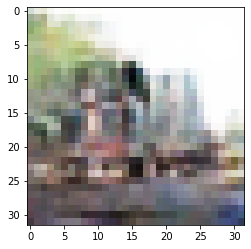

-> Epoch 149, Batch numero 1/78 -> Disc. loss on real images: 0.44804, Disc. loss on fake images: 0.48445, Generator loss: 1.36338
-> Epoch 149, Batch numero 2/78 -> Disc. loss on real images: 0.57137, Disc. loss on fake images: 0.73035, Generator loss: 1.34767
-> Epoch 149, Batch numero 3/78 -> Disc. loss on real images: 0.53982, Disc. loss on fake images: 0.40675, Generator loss: 1.35125
-> Epoch 149, Batch numero 4/78 -> Disc. loss on real images: 0.60890, Disc. loss on fake images: 0.43365, Generator loss: 1.27901
-> Epoch 149, Batch numero 5/78 -> Disc. loss on real images: 0.55583, Disc. loss on fake images: 0.55264, Generator loss: 1.16451
-> Epoch 149, Batch numero 6/78 -> Disc. loss on real images: 0.57578, Disc. loss on fake images: 0.63367, Generator loss: 1.08945
-> Epoch 149, Batch numero 7/78 -> Disc. loss on real images: 0.47799, Disc. loss on fake images: 0.52268, Generator loss: 1.20111
-> Epoch 149, Batch numero 8/78 -> Disc. loss on real images: 0.54910, Disc. loss o

-> Epoch 149, Batch numero 64/78 -> Disc. loss on real images: 0.54602, Disc. loss on fake images: 0.59108, Generator loss: 1.42197
-> Epoch 149, Batch numero 65/78 -> Disc. loss on real images: 0.67458, Disc. loss on fake images: 0.47182, Generator loss: 1.26859
-> Epoch 149, Batch numero 66/78 -> Disc. loss on real images: 0.63946, Disc. loss on fake images: 0.56928, Generator loss: 1.27737
-> Epoch 149, Batch numero 67/78 -> Disc. loss on real images: 0.52252, Disc. loss on fake images: 0.55484, Generator loss: 1.45141
-> Epoch 149, Batch numero 68/78 -> Disc. loss on real images: 0.59212, Disc. loss on fake images: 0.50059, Generator loss: 1.15553
-> Epoch 149, Batch numero 69/78 -> Disc. loss on real images: 0.53598, Disc. loss on fake images: 0.47201, Generator loss: 1.18287
-> Epoch 149, Batch numero 70/78 -> Disc. loss on real images: 0.46538, Disc. loss on fake images: 0.64118, Generator loss: 1.25367
-> Epoch 149, Batch numero 71/78 -> Disc. loss on real images: 0.66979, Disc

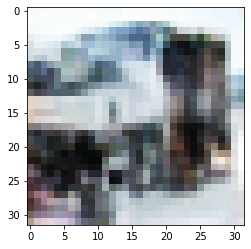

-> Epoch 150, Batch numero 1/78 -> Disc. loss on real images: 0.53943, Disc. loss on fake images: 0.50191, Generator loss: 1.25612
-> Epoch 150, Batch numero 2/78 -> Disc. loss on real images: 0.62222, Disc. loss on fake images: 0.55889, Generator loss: 1.28153
-> Epoch 150, Batch numero 3/78 -> Disc. loss on real images: 0.47562, Disc. loss on fake images: 0.52063, Generator loss: 1.32499
-> Epoch 150, Batch numero 4/78 -> Disc. loss on real images: 0.49591, Disc. loss on fake images: 0.49386, Generator loss: 1.28802
-> Epoch 150, Batch numero 5/78 -> Disc. loss on real images: 0.51976, Disc. loss on fake images: 0.57983, Generator loss: 1.27717
-> Epoch 150, Batch numero 6/78 -> Disc. loss on real images: 0.52800, Disc. loss on fake images: 0.45056, Generator loss: 1.21651
-> Epoch 150, Batch numero 7/78 -> Disc. loss on real images: 0.46082, Disc. loss on fake images: 0.46040, Generator loss: 1.29769
-> Epoch 150, Batch numero 8/78 -> Disc. loss on real images: 0.47865, Disc. loss o

-> Epoch 150, Batch numero 65/78 -> Disc. loss on real images: 0.49988, Disc. loss on fake images: 0.55548, Generator loss: 1.19557
-> Epoch 150, Batch numero 66/78 -> Disc. loss on real images: 0.42440, Disc. loss on fake images: 0.51268, Generator loss: 1.25870
-> Epoch 150, Batch numero 67/78 -> Disc. loss on real images: 0.54673, Disc. loss on fake images: 0.62644, Generator loss: 1.32531
-> Epoch 150, Batch numero 68/78 -> Disc. loss on real images: 0.53740, Disc. loss on fake images: 0.59329, Generator loss: 1.41289
-> Epoch 150, Batch numero 69/78 -> Disc. loss on real images: 0.63245, Disc. loss on fake images: 0.58677, Generator loss: 1.20177
-> Epoch 150, Batch numero 70/78 -> Disc. loss on real images: 0.61121, Disc. loss on fake images: 0.54019, Generator loss: 1.26209
-> Epoch 150, Batch numero 71/78 -> Disc. loss on real images: 0.57896, Disc. loss on fake images: 0.46359, Generator loss: 1.17447
-> Epoch 150, Batch numero 72/78 -> Disc. loss on real images: 0.47555, Disc

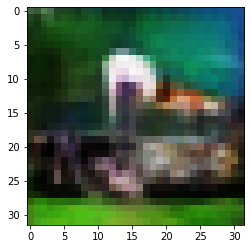

-> Epoch 151, Batch numero 1/78 -> Disc. loss on real images: 0.56402, Disc. loss on fake images: 0.50422, Generator loss: 1.39481
-> Epoch 151, Batch numero 2/78 -> Disc. loss on real images: 0.53214, Disc. loss on fake images: 0.34587, Generator loss: 1.53103
-> Epoch 151, Batch numero 3/78 -> Disc. loss on real images: 0.58128, Disc. loss on fake images: 0.43818, Generator loss: 1.33581
-> Epoch 151, Batch numero 4/78 -> Disc. loss on real images: 0.35933, Disc. loss on fake images: 0.50918, Generator loss: 1.44896
-> Epoch 151, Batch numero 5/78 -> Disc. loss on real images: 0.52458, Disc. loss on fake images: 0.47583, Generator loss: 1.41127
-> Epoch 151, Batch numero 6/78 -> Disc. loss on real images: 0.57786, Disc. loss on fake images: 0.58199, Generator loss: 1.30739
-> Epoch 151, Batch numero 7/78 -> Disc. loss on real images: 0.54718, Disc. loss on fake images: 0.52563, Generator loss: 1.21942
-> Epoch 151, Batch numero 8/78 -> Disc. loss on real images: 0.55373, Disc. loss o

-> Epoch 151, Batch numero 64/78 -> Disc. loss on real images: 0.59049, Disc. loss on fake images: 0.46919, Generator loss: 1.29474
-> Epoch 151, Batch numero 65/78 -> Disc. loss on real images: 0.61476, Disc. loss on fake images: 0.56906, Generator loss: 1.35229
-> Epoch 151, Batch numero 66/78 -> Disc. loss on real images: 0.51383, Disc. loss on fake images: 0.52922, Generator loss: 1.34632
-> Epoch 151, Batch numero 67/78 -> Disc. loss on real images: 0.52411, Disc. loss on fake images: 0.58066, Generator loss: 1.53560
-> Epoch 151, Batch numero 68/78 -> Disc. loss on real images: 0.42613, Disc. loss on fake images: 0.46987, Generator loss: 1.51977
-> Epoch 151, Batch numero 69/78 -> Disc. loss on real images: 0.60584, Disc. loss on fake images: 0.35852, Generator loss: 1.33836
-> Epoch 151, Batch numero 70/78 -> Disc. loss on real images: 0.55421, Disc. loss on fake images: 0.50447, Generator loss: 1.35990
-> Epoch 151, Batch numero 71/78 -> Disc. loss on real images: 0.54699, Disc

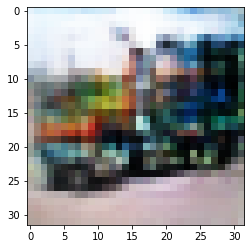

-> Epoch 152, Batch numero 1/78 -> Disc. loss on real images: 0.60875, Disc. loss on fake images: 0.64141, Generator loss: 1.35766
-> Epoch 152, Batch numero 2/78 -> Disc. loss on real images: 0.57648, Disc. loss on fake images: 0.49628, Generator loss: 1.49735
-> Epoch 152, Batch numero 3/78 -> Disc. loss on real images: 0.61866, Disc. loss on fake images: 0.47777, Generator loss: 1.36594
-> Epoch 152, Batch numero 4/78 -> Disc. loss on real images: 0.49823, Disc. loss on fake images: 0.52438, Generator loss: 1.20969
-> Epoch 152, Batch numero 5/78 -> Disc. loss on real images: 0.60716, Disc. loss on fake images: 0.51184, Generator loss: 1.16739
-> Epoch 152, Batch numero 6/78 -> Disc. loss on real images: 0.46636, Disc. loss on fake images: 0.54196, Generator loss: 1.10677
-> Epoch 152, Batch numero 7/78 -> Disc. loss on real images: 0.42059, Disc. loss on fake images: 0.53597, Generator loss: 1.29680
-> Epoch 152, Batch numero 8/78 -> Disc. loss on real images: 0.43781, Disc. loss o

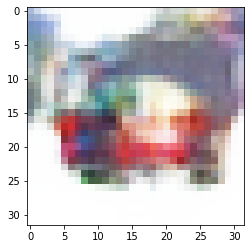

-> Epoch 153, Batch numero 1/78 -> Disc. loss on real images: 0.44344, Disc. loss on fake images: 0.61800, Generator loss: 1.32782
-> Epoch 153, Batch numero 2/78 -> Disc. loss on real images: 0.55363, Disc. loss on fake images: 0.43223, Generator loss: 1.31828
-> Epoch 153, Batch numero 3/78 -> Disc. loss on real images: 0.61139, Disc. loss on fake images: 0.59664, Generator loss: 1.22829
-> Epoch 153, Batch numero 4/78 -> Disc. loss on real images: 0.45032, Disc. loss on fake images: 0.54577, Generator loss: 1.28227
-> Epoch 153, Batch numero 5/78 -> Disc. loss on real images: 0.54731, Disc. loss on fake images: 0.50281, Generator loss: 1.29234
-> Epoch 153, Batch numero 6/78 -> Disc. loss on real images: 0.58275, Disc. loss on fake images: 0.63650, Generator loss: 1.16118
-> Epoch 153, Batch numero 7/78 -> Disc. loss on real images: 0.48326, Disc. loss on fake images: 0.62460, Generator loss: 1.33477
-> Epoch 153, Batch numero 8/78 -> Disc. loss on real images: 0.50338, Disc. loss o

-> Epoch 153, Batch numero 64/78 -> Disc. loss on real images: 0.51605, Disc. loss on fake images: 0.44119, Generator loss: 1.46697
-> Epoch 153, Batch numero 65/78 -> Disc. loss on real images: 0.53549, Disc. loss on fake images: 0.49911, Generator loss: 1.37221
-> Epoch 153, Batch numero 66/78 -> Disc. loss on real images: 0.61252, Disc. loss on fake images: 0.44616, Generator loss: 1.34287
-> Epoch 153, Batch numero 67/78 -> Disc. loss on real images: 0.45192, Disc. loss on fake images: 0.50301, Generator loss: 1.26049
-> Epoch 153, Batch numero 68/78 -> Disc. loss on real images: 0.49773, Disc. loss on fake images: 0.51410, Generator loss: 1.18341
-> Epoch 153, Batch numero 69/78 -> Disc. loss on real images: 0.52253, Disc. loss on fake images: 0.50261, Generator loss: 1.21880
-> Epoch 153, Batch numero 70/78 -> Disc. loss on real images: 0.50808, Disc. loss on fake images: 0.51555, Generator loss: 1.14534
-> Epoch 153, Batch numero 71/78 -> Disc. loss on real images: 0.46467, Disc

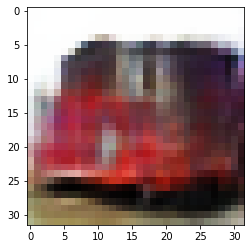

-> Epoch 154, Batch numero 1/78 -> Disc. loss on real images: 0.49730, Disc. loss on fake images: 0.57996, Generator loss: 1.42867
-> Epoch 154, Batch numero 2/78 -> Disc. loss on real images: 0.55634, Disc. loss on fake images: 0.54143, Generator loss: 1.39286
-> Epoch 154, Batch numero 3/78 -> Disc. loss on real images: 0.59474, Disc. loss on fake images: 0.44499, Generator loss: 1.34051
-> Epoch 154, Batch numero 4/78 -> Disc. loss on real images: 0.37163, Disc. loss on fake images: 0.50423, Generator loss: 1.32038
-> Epoch 154, Batch numero 5/78 -> Disc. loss on real images: 0.58094, Disc. loss on fake images: 0.63322, Generator loss: 1.29677
-> Epoch 154, Batch numero 6/78 -> Disc. loss on real images: 0.55396, Disc. loss on fake images: 0.45694, Generator loss: 1.37093
-> Epoch 154, Batch numero 7/78 -> Disc. loss on real images: 0.44682, Disc. loss on fake images: 0.59870, Generator loss: 1.46507
-> Epoch 154, Batch numero 8/78 -> Disc. loss on real images: 0.62715, Disc. loss o

-> Epoch 154, Batch numero 64/78 -> Disc. loss on real images: 0.67477, Disc. loss on fake images: 0.51105, Generator loss: 1.43319
-> Epoch 154, Batch numero 65/78 -> Disc. loss on real images: 0.56871, Disc. loss on fake images: 0.42323, Generator loss: 1.44737
-> Epoch 154, Batch numero 66/78 -> Disc. loss on real images: 0.65102, Disc. loss on fake images: 0.50518, Generator loss: 1.24710
-> Epoch 154, Batch numero 67/78 -> Disc. loss on real images: 0.48513, Disc. loss on fake images: 0.67960, Generator loss: 1.25642
-> Epoch 154, Batch numero 68/78 -> Disc. loss on real images: 0.51682, Disc. loss on fake images: 0.70431, Generator loss: 1.17499
-> Epoch 154, Batch numero 69/78 -> Disc. loss on real images: 0.51831, Disc. loss on fake images: 0.59704, Generator loss: 1.33908
-> Epoch 154, Batch numero 70/78 -> Disc. loss on real images: 0.61162, Disc. loss on fake images: 0.55429, Generator loss: 1.28710
-> Epoch 154, Batch numero 71/78 -> Disc. loss on real images: 0.48446, Disc

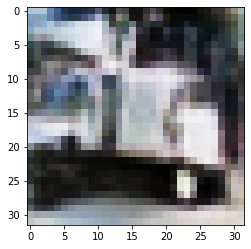

-> Epoch 155, Batch numero 1/78 -> Disc. loss on real images: 0.49304, Disc. loss on fake images: 0.53973, Generator loss: 1.34981
-> Epoch 155, Batch numero 2/78 -> Disc. loss on real images: 0.53683, Disc. loss on fake images: 0.44556, Generator loss: 1.33869
-> Epoch 155, Batch numero 3/78 -> Disc. loss on real images: 0.48614, Disc. loss on fake images: 0.50362, Generator loss: 1.34307
-> Epoch 155, Batch numero 4/78 -> Disc. loss on real images: 0.55001, Disc. loss on fake images: 0.58664, Generator loss: 1.26143
-> Epoch 155, Batch numero 5/78 -> Disc. loss on real images: 0.51174, Disc. loss on fake images: 0.42882, Generator loss: 1.46115
-> Epoch 155, Batch numero 6/78 -> Disc. loss on real images: 0.49857, Disc. loss on fake images: 0.48652, Generator loss: 1.52006
-> Epoch 155, Batch numero 7/78 -> Disc. loss on real images: 0.62938, Disc. loss on fake images: 0.52579, Generator loss: 1.33461
-> Epoch 155, Batch numero 8/78 -> Disc. loss on real images: 0.40855, Disc. loss o

-> Epoch 155, Batch numero 64/78 -> Disc. loss on real images: 0.46932, Disc. loss on fake images: 0.47942, Generator loss: 1.29221
-> Epoch 155, Batch numero 65/78 -> Disc. loss on real images: 0.61919, Disc. loss on fake images: 0.44960, Generator loss: 1.21256
-> Epoch 155, Batch numero 66/78 -> Disc. loss on real images: 0.52860, Disc. loss on fake images: 0.54116, Generator loss: 1.20681
-> Epoch 155, Batch numero 67/78 -> Disc. loss on real images: 0.43221, Disc. loss on fake images: 0.49944, Generator loss: 1.18504
-> Epoch 155, Batch numero 68/78 -> Disc. loss on real images: 0.37908, Disc. loss on fake images: 0.50845, Generator loss: 1.33386
-> Epoch 155, Batch numero 69/78 -> Disc. loss on real images: 0.67117, Disc. loss on fake images: 0.56954, Generator loss: 1.34279
-> Epoch 155, Batch numero 70/78 -> Disc. loss on real images: 0.58099, Disc. loss on fake images: 0.51658, Generator loss: 1.33530
-> Epoch 155, Batch numero 71/78 -> Disc. loss on real images: 0.54743, Disc

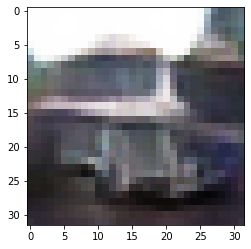

-> Epoch 156, Batch numero 1/78 -> Disc. loss on real images: 0.46138, Disc. loss on fake images: 0.49773, Generator loss: 1.29400
-> Epoch 156, Batch numero 2/78 -> Disc. loss on real images: 0.51758, Disc. loss on fake images: 0.45063, Generator loss: 1.37760
-> Epoch 156, Batch numero 3/78 -> Disc. loss on real images: 0.55655, Disc. loss on fake images: 0.51774, Generator loss: 1.30177
-> Epoch 156, Batch numero 4/78 -> Disc. loss on real images: 0.45304, Disc. loss on fake images: 0.61938, Generator loss: 1.42134
-> Epoch 156, Batch numero 5/78 -> Disc. loss on real images: 0.54727, Disc. loss on fake images: 0.57205, Generator loss: 1.52992
-> Epoch 156, Batch numero 6/78 -> Disc. loss on real images: 0.62339, Disc. loss on fake images: 0.50253, Generator loss: 1.35976
-> Epoch 156, Batch numero 7/78 -> Disc. loss on real images: 0.47169, Disc. loss on fake images: 0.46170, Generator loss: 1.54039
-> Epoch 156, Batch numero 8/78 -> Disc. loss on real images: 0.54161, Disc. loss o

-> Epoch 156, Batch numero 65/78 -> Disc. loss on real images: 0.54989, Disc. loss on fake images: 0.41382, Generator loss: 1.29119
-> Epoch 156, Batch numero 66/78 -> Disc. loss on real images: 0.51090, Disc. loss on fake images: 0.57209, Generator loss: 1.09857
-> Epoch 156, Batch numero 67/78 -> Disc. loss on real images: 0.48574, Disc. loss on fake images: 0.54615, Generator loss: 1.15416
-> Epoch 156, Batch numero 68/78 -> Disc. loss on real images: 0.56132, Disc. loss on fake images: 0.52001, Generator loss: 1.35031
-> Epoch 156, Batch numero 69/78 -> Disc. loss on real images: 0.43474, Disc. loss on fake images: 0.61357, Generator loss: 1.23303
-> Epoch 156, Batch numero 70/78 -> Disc. loss on real images: 0.55297, Disc. loss on fake images: 0.48130, Generator loss: 1.38607
-> Epoch 156, Batch numero 71/78 -> Disc. loss on real images: 0.55893, Disc. loss on fake images: 0.66193, Generator loss: 1.32896
-> Epoch 156, Batch numero 72/78 -> Disc. loss on real images: 0.54298, Disc

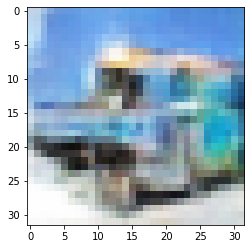

-> Epoch 157, Batch numero 1/78 -> Disc. loss on real images: 0.44226, Disc. loss on fake images: 0.47685, Generator loss: 1.44905
-> Epoch 157, Batch numero 2/78 -> Disc. loss on real images: 0.56066, Disc. loss on fake images: 0.50203, Generator loss: 1.32053
-> Epoch 157, Batch numero 3/78 -> Disc. loss on real images: 0.71250, Disc. loss on fake images: 0.54775, Generator loss: 1.17009
-> Epoch 157, Batch numero 4/78 -> Disc. loss on real images: 0.60032, Disc. loss on fake images: 0.66441, Generator loss: 1.31061
-> Epoch 157, Batch numero 5/78 -> Disc. loss on real images: 0.48191, Disc. loss on fake images: 0.45496, Generator loss: 1.23921
-> Epoch 157, Batch numero 6/78 -> Disc. loss on real images: 0.48068, Disc. loss on fake images: 0.50091, Generator loss: 1.31935
-> Epoch 157, Batch numero 7/78 -> Disc. loss on real images: 0.46888, Disc. loss on fake images: 0.46987, Generator loss: 1.13162
-> Epoch 157, Batch numero 8/78 -> Disc. loss on real images: 0.55885, Disc. loss o

-> Epoch 157, Batch numero 65/78 -> Disc. loss on real images: 0.46003, Disc. loss on fake images: 0.57619, Generator loss: 1.44944
-> Epoch 157, Batch numero 66/78 -> Disc. loss on real images: 0.44535, Disc. loss on fake images: 0.42979, Generator loss: 1.46556
-> Epoch 157, Batch numero 67/78 -> Disc. loss on real images: 0.51291, Disc. loss on fake images: 0.45188, Generator loss: 1.40351
-> Epoch 157, Batch numero 68/78 -> Disc. loss on real images: 0.51282, Disc. loss on fake images: 0.40496, Generator loss: 1.42692
-> Epoch 157, Batch numero 69/78 -> Disc. loss on real images: 0.44925, Disc. loss on fake images: 0.44659, Generator loss: 1.33673
-> Epoch 157, Batch numero 70/78 -> Disc. loss on real images: 0.49002, Disc. loss on fake images: 0.57657, Generator loss: 1.26238
-> Epoch 157, Batch numero 71/78 -> Disc. loss on real images: 0.41255, Disc. loss on fake images: 0.53704, Generator loss: 1.47673
-> Epoch 157, Batch numero 72/78 -> Disc. loss on real images: 0.73815, Disc

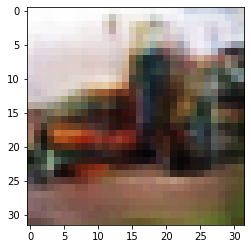

-> Epoch 158, Batch numero 1/78 -> Disc. loss on real images: 0.67428, Disc. loss on fake images: 0.56371, Generator loss: 1.48233
-> Epoch 158, Batch numero 2/78 -> Disc. loss on real images: 0.53814, Disc. loss on fake images: 0.51971, Generator loss: 1.16845
-> Epoch 158, Batch numero 3/78 -> Disc. loss on real images: 0.55950, Disc. loss on fake images: 0.74998, Generator loss: 1.28344
-> Epoch 158, Batch numero 4/78 -> Disc. loss on real images: 0.52128, Disc. loss on fake images: 0.71986, Generator loss: 1.24258
-> Epoch 158, Batch numero 5/78 -> Disc. loss on real images: 0.46765, Disc. loss on fake images: 0.45584, Generator loss: 1.44007
-> Epoch 158, Batch numero 6/78 -> Disc. loss on real images: 0.56052, Disc. loss on fake images: 0.77696, Generator loss: 1.43291
-> Epoch 158, Batch numero 7/78 -> Disc. loss on real images: 0.58347, Disc. loss on fake images: 0.52456, Generator loss: 1.44362
-> Epoch 158, Batch numero 8/78 -> Disc. loss on real images: 0.59553, Disc. loss o

-> Epoch 158, Batch numero 65/78 -> Disc. loss on real images: 0.52525, Disc. loss on fake images: 0.46819, Generator loss: 1.29856
-> Epoch 158, Batch numero 66/78 -> Disc. loss on real images: 0.56115, Disc. loss on fake images: 0.42525, Generator loss: 1.26448
-> Epoch 158, Batch numero 67/78 -> Disc. loss on real images: 0.35412, Disc. loss on fake images: 0.69526, Generator loss: 1.38255
-> Epoch 158, Batch numero 68/78 -> Disc. loss on real images: 0.48635, Disc. loss on fake images: 0.49495, Generator loss: 1.59274
-> Epoch 158, Batch numero 69/78 -> Disc. loss on real images: 0.77038, Disc. loss on fake images: 0.40943, Generator loss: 1.52431
-> Epoch 158, Batch numero 70/78 -> Disc. loss on real images: 0.60301, Disc. loss on fake images: 0.53010, Generator loss: 1.44523
-> Epoch 158, Batch numero 71/78 -> Disc. loss on real images: 0.46808, Disc. loss on fake images: 0.66385, Generator loss: 1.36998
-> Epoch 158, Batch numero 72/78 -> Disc. loss on real images: 0.75422, Disc

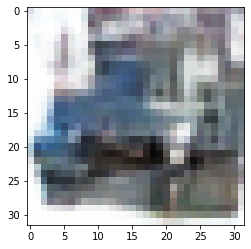

-> Epoch 159, Batch numero 1/78 -> Disc. loss on real images: 0.50233, Disc. loss on fake images: 0.46996, Generator loss: 1.32402
-> Epoch 159, Batch numero 2/78 -> Disc. loss on real images: 0.56728, Disc. loss on fake images: 0.53339, Generator loss: 1.26334
-> Epoch 159, Batch numero 3/78 -> Disc. loss on real images: 0.44753, Disc. loss on fake images: 0.57444, Generator loss: 1.33029
-> Epoch 159, Batch numero 4/78 -> Disc. loss on real images: 0.40264, Disc. loss on fake images: 0.56844, Generator loss: 1.32680
-> Epoch 159, Batch numero 5/78 -> Disc. loss on real images: 0.63387, Disc. loss on fake images: 0.56161, Generator loss: 1.32466
-> Epoch 159, Batch numero 6/78 -> Disc. loss on real images: 0.51465, Disc. loss on fake images: 0.61158, Generator loss: 1.30885
-> Epoch 159, Batch numero 7/78 -> Disc. loss on real images: 0.48435, Disc. loss on fake images: 0.52386, Generator loss: 1.28042
-> Epoch 159, Batch numero 8/78 -> Disc. loss on real images: 0.51854, Disc. loss o

-> Epoch 159, Batch numero 65/78 -> Disc. loss on real images: 0.61417, Disc. loss on fake images: 0.46048, Generator loss: 1.50320
-> Epoch 159, Batch numero 66/78 -> Disc. loss on real images: 0.45609, Disc. loss on fake images: 0.60076, Generator loss: 1.51829
-> Epoch 159, Batch numero 67/78 -> Disc. loss on real images: 0.64177, Disc. loss on fake images: 0.57188, Generator loss: 1.48587
-> Epoch 159, Batch numero 68/78 -> Disc. loss on real images: 0.56067, Disc. loss on fake images: 0.49876, Generator loss: 1.13919
-> Epoch 159, Batch numero 69/78 -> Disc. loss on real images: 0.43739, Disc. loss on fake images: 0.51813, Generator loss: 1.35401
-> Epoch 159, Batch numero 70/78 -> Disc. loss on real images: 0.69669, Disc. loss on fake images: 0.67569, Generator loss: 1.30356
-> Epoch 159, Batch numero 71/78 -> Disc. loss on real images: 0.43750, Disc. loss on fake images: 0.46092, Generator loss: 1.30311
-> Epoch 159, Batch numero 72/78 -> Disc. loss on real images: 0.55348, Disc

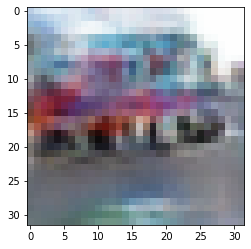

-> Epoch 160, Batch numero 1/78 -> Disc. loss on real images: 0.55963, Disc. loss on fake images: 0.62687, Generator loss: 1.31485
-> Epoch 160, Batch numero 2/78 -> Disc. loss on real images: 0.39206, Disc. loss on fake images: 0.46544, Generator loss: 1.31287
-> Epoch 160, Batch numero 3/78 -> Disc. loss on real images: 0.45947, Disc. loss on fake images: 0.79821, Generator loss: 1.53932
-> Epoch 160, Batch numero 4/78 -> Disc. loss on real images: 0.58489, Disc. loss on fake images: 0.39470, Generator loss: 1.49381
-> Epoch 160, Batch numero 5/78 -> Disc. loss on real images: 0.59217, Disc. loss on fake images: 0.50996, Generator loss: 1.44793
-> Epoch 160, Batch numero 6/78 -> Disc. loss on real images: 0.51517, Disc. loss on fake images: 0.44751, Generator loss: 1.27100
-> Epoch 160, Batch numero 7/78 -> Disc. loss on real images: 0.46419, Disc. loss on fake images: 0.60072, Generator loss: 1.37619
-> Epoch 160, Batch numero 8/78 -> Disc. loss on real images: 0.46579, Disc. loss o

-> Epoch 160, Batch numero 65/78 -> Disc. loss on real images: 0.55125, Disc. loss on fake images: 0.50588, Generator loss: 1.32417
-> Epoch 160, Batch numero 66/78 -> Disc. loss on real images: 0.37923, Disc. loss on fake images: 0.55855, Generator loss: 1.30200
-> Epoch 160, Batch numero 67/78 -> Disc. loss on real images: 0.58342, Disc. loss on fake images: 0.41824, Generator loss: 1.40026
-> Epoch 160, Batch numero 68/78 -> Disc. loss on real images: 0.65075, Disc. loss on fake images: 0.40862, Generator loss: 1.24567
-> Epoch 160, Batch numero 69/78 -> Disc. loss on real images: 0.56058, Disc. loss on fake images: 0.54178, Generator loss: 1.35711
-> Epoch 160, Batch numero 70/78 -> Disc. loss on real images: 0.44457, Disc. loss on fake images: 0.68581, Generator loss: 1.57540
-> Epoch 160, Batch numero 71/78 -> Disc. loss on real images: 0.54024, Disc. loss on fake images: 0.36768, Generator loss: 1.44227
-> Epoch 160, Batch numero 72/78 -> Disc. loss on real images: 0.59915, Disc

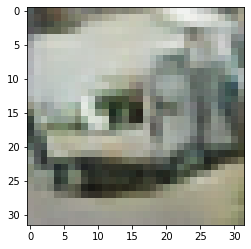

-> Epoch 161, Batch numero 1/78 -> Disc. loss on real images: 0.52461, Disc. loss on fake images: 0.53355, Generator loss: 1.35495
-> Epoch 161, Batch numero 2/78 -> Disc. loss on real images: 0.59518, Disc. loss on fake images: 0.51640, Generator loss: 1.52026
-> Epoch 161, Batch numero 3/78 -> Disc. loss on real images: 0.57196, Disc. loss on fake images: 0.37014, Generator loss: 1.57377
-> Epoch 161, Batch numero 4/78 -> Disc. loss on real images: 0.55324, Disc. loss on fake images: 0.52646, Generator loss: 1.42227
-> Epoch 161, Batch numero 5/78 -> Disc. loss on real images: 0.61369, Disc. loss on fake images: 0.46805, Generator loss: 1.33604
-> Epoch 161, Batch numero 6/78 -> Disc. loss on real images: 0.39610, Disc. loss on fake images: 0.52739, Generator loss: 1.24534
-> Epoch 161, Batch numero 7/78 -> Disc. loss on real images: 0.62923, Disc. loss on fake images: 0.57139, Generator loss: 1.26302
-> Epoch 161, Batch numero 8/78 -> Disc. loss on real images: 0.47260, Disc. loss o

-> Epoch 161, Batch numero 65/78 -> Disc. loss on real images: 0.58695, Disc. loss on fake images: 0.54289, Generator loss: 1.49833
-> Epoch 161, Batch numero 66/78 -> Disc. loss on real images: 0.52121, Disc. loss on fake images: 0.44169, Generator loss: 1.26997
-> Epoch 161, Batch numero 67/78 -> Disc. loss on real images: 0.47598, Disc. loss on fake images: 0.55986, Generator loss: 1.25180
-> Epoch 161, Batch numero 68/78 -> Disc. loss on real images: 0.56738, Disc. loss on fake images: 0.63506, Generator loss: 1.19121
-> Epoch 161, Batch numero 69/78 -> Disc. loss on real images: 0.49309, Disc. loss on fake images: 0.50980, Generator loss: 1.36589
-> Epoch 161, Batch numero 70/78 -> Disc. loss on real images: 0.44552, Disc. loss on fake images: 0.50432, Generator loss: 1.20128
-> Epoch 161, Batch numero 71/78 -> Disc. loss on real images: 0.58469, Disc. loss on fake images: 0.55944, Generator loss: 1.31552
-> Epoch 161, Batch numero 72/78 -> Disc. loss on real images: 0.56763, Disc

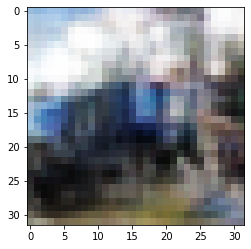

-> Epoch 162, Batch numero 1/78 -> Disc. loss on real images: 0.54326, Disc. loss on fake images: 0.50309, Generator loss: 1.26802
-> Epoch 162, Batch numero 2/78 -> Disc. loss on real images: 0.44460, Disc. loss on fake images: 0.60972, Generator loss: 1.21061
-> Epoch 162, Batch numero 3/78 -> Disc. loss on real images: 0.52598, Disc. loss on fake images: 0.47735, Generator loss: 1.41397
-> Epoch 162, Batch numero 4/78 -> Disc. loss on real images: 0.45884, Disc. loss on fake images: 0.49849, Generator loss: 1.25757
-> Epoch 162, Batch numero 5/78 -> Disc. loss on real images: 0.59685, Disc. loss on fake images: 0.43054, Generator loss: 1.17557
-> Epoch 162, Batch numero 6/78 -> Disc. loss on real images: 0.46915, Disc. loss on fake images: 0.58835, Generator loss: 1.38199
-> Epoch 162, Batch numero 7/78 -> Disc. loss on real images: 0.39519, Disc. loss on fake images: 0.49204, Generator loss: 1.52619
-> Epoch 162, Batch numero 8/78 -> Disc. loss on real images: 0.49437, Disc. loss o

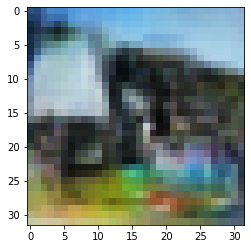

-> Epoch 163, Batch numero 1/78 -> Disc. loss on real images: 0.68593, Disc. loss on fake images: 0.60762, Generator loss: 1.30245
-> Epoch 163, Batch numero 2/78 -> Disc. loss on real images: 0.52359, Disc. loss on fake images: 0.49252, Generator loss: 1.34900
-> Epoch 163, Batch numero 3/78 -> Disc. loss on real images: 0.48131, Disc. loss on fake images: 0.69583, Generator loss: 1.46196
-> Epoch 163, Batch numero 4/78 -> Disc. loss on real images: 0.46073, Disc. loss on fake images: 0.49466, Generator loss: 1.27625
-> Epoch 163, Batch numero 5/78 -> Disc. loss on real images: 0.61583, Disc. loss on fake images: 0.49930, Generator loss: 1.40841
-> Epoch 163, Batch numero 6/78 -> Disc. loss on real images: 0.46501, Disc. loss on fake images: 0.38043, Generator loss: 1.40060
-> Epoch 163, Batch numero 7/78 -> Disc. loss on real images: 0.46198, Disc. loss on fake images: 0.40118, Generator loss: 1.46695
-> Epoch 163, Batch numero 8/78 -> Disc. loss on real images: 0.60195, Disc. loss o

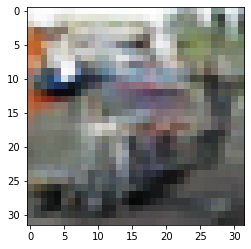

-> Epoch 164, Batch numero 1/78 -> Disc. loss on real images: 0.42182, Disc. loss on fake images: 0.53751, Generator loss: 1.39789
-> Epoch 164, Batch numero 2/78 -> Disc. loss on real images: 0.52232, Disc. loss on fake images: 0.48292, Generator loss: 1.28390
-> Epoch 164, Batch numero 3/78 -> Disc. loss on real images: 0.63180, Disc. loss on fake images: 0.50678, Generator loss: 1.26984
-> Epoch 164, Batch numero 4/78 -> Disc. loss on real images: 0.49067, Disc. loss on fake images: 0.65260, Generator loss: 1.36950
-> Epoch 164, Batch numero 5/78 -> Disc. loss on real images: 0.46063, Disc. loss on fake images: 0.78234, Generator loss: 1.41934
-> Epoch 164, Batch numero 6/78 -> Disc. loss on real images: 0.67283, Disc. loss on fake images: 0.50122, Generator loss: 1.57953
-> Epoch 164, Batch numero 7/78 -> Disc. loss on real images: 0.65758, Disc. loss on fake images: 0.38733, Generator loss: 1.47979
-> Epoch 164, Batch numero 8/78 -> Disc. loss on real images: 0.57956, Disc. loss o

-> Epoch 164, Batch numero 65/78 -> Disc. loss on real images: 0.56921, Disc. loss on fake images: 0.46870, Generator loss: 1.34402
-> Epoch 164, Batch numero 66/78 -> Disc. loss on real images: 0.52242, Disc. loss on fake images: 0.65626, Generator loss: 1.56246
-> Epoch 164, Batch numero 67/78 -> Disc. loss on real images: 0.51426, Disc. loss on fake images: 0.40094, Generator loss: 1.45973
-> Epoch 164, Batch numero 68/78 -> Disc. loss on real images: 0.49160, Disc. loss on fake images: 0.47082, Generator loss: 1.32439
-> Epoch 164, Batch numero 69/78 -> Disc. loss on real images: 0.50441, Disc. loss on fake images: 0.61074, Generator loss: 1.35778
-> Epoch 164, Batch numero 70/78 -> Disc. loss on real images: 0.41344, Disc. loss on fake images: 0.49325, Generator loss: 1.27172
-> Epoch 164, Batch numero 71/78 -> Disc. loss on real images: 0.46067, Disc. loss on fake images: 0.50333, Generator loss: 1.28792
-> Epoch 164, Batch numero 72/78 -> Disc. loss on real images: 0.45830, Disc

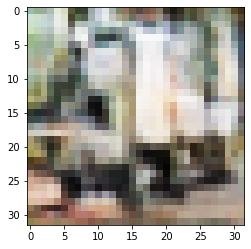

-> Epoch 165, Batch numero 1/78 -> Disc. loss on real images: 0.58357, Disc. loss on fake images: 0.47853, Generator loss: 1.35218
-> Epoch 165, Batch numero 2/78 -> Disc. loss on real images: 0.49348, Disc. loss on fake images: 0.46870, Generator loss: 1.35021
-> Epoch 165, Batch numero 3/78 -> Disc. loss on real images: 0.59085, Disc. loss on fake images: 0.52133, Generator loss: 1.33105
-> Epoch 165, Batch numero 4/78 -> Disc. loss on real images: 0.55605, Disc. loss on fake images: 0.64201, Generator loss: 1.42846
-> Epoch 165, Batch numero 5/78 -> Disc. loss on real images: 0.49315, Disc. loss on fake images: 0.42823, Generator loss: 1.23951
-> Epoch 165, Batch numero 6/78 -> Disc. loss on real images: 0.36990, Disc. loss on fake images: 0.48403, Generator loss: 1.24209
-> Epoch 165, Batch numero 7/78 -> Disc. loss on real images: 0.47039, Disc. loss on fake images: 0.62095, Generator loss: 1.20523
-> Epoch 165, Batch numero 8/78 -> Disc. loss on real images: 0.46669, Disc. loss o

-> Epoch 165, Batch numero 65/78 -> Disc. loss on real images: 0.43579, Disc. loss on fake images: 0.43405, Generator loss: 1.35884
-> Epoch 165, Batch numero 66/78 -> Disc. loss on real images: 0.37162, Disc. loss on fake images: 0.54715, Generator loss: 1.27976
-> Epoch 165, Batch numero 67/78 -> Disc. loss on real images: 0.43838, Disc. loss on fake images: 0.51170, Generator loss: 1.52384
-> Epoch 165, Batch numero 68/78 -> Disc. loss on real images: 0.40270, Disc. loss on fake images: 0.40573, Generator loss: 1.42668
-> Epoch 165, Batch numero 69/78 -> Disc. loss on real images: 0.51322, Disc. loss on fake images: 0.49108, Generator loss: 1.45110
-> Epoch 165, Batch numero 70/78 -> Disc. loss on real images: 0.56623, Disc. loss on fake images: 0.61448, Generator loss: 1.38104
-> Epoch 165, Batch numero 71/78 -> Disc. loss on real images: 0.49326, Disc. loss on fake images: 0.41352, Generator loss: 1.40253
-> Epoch 165, Batch numero 72/78 -> Disc. loss on real images: 0.54237, Disc

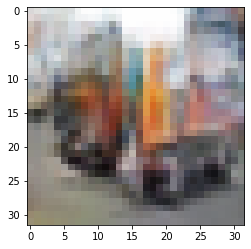

-> Epoch 166, Batch numero 1/78 -> Disc. loss on real images: 0.63346, Disc. loss on fake images: 0.49562, Generator loss: 1.21725
-> Epoch 166, Batch numero 2/78 -> Disc. loss on real images: 0.40035, Disc. loss on fake images: 0.59585, Generator loss: 1.18991
-> Epoch 166, Batch numero 3/78 -> Disc. loss on real images: 0.42063, Disc. loss on fake images: 0.57330, Generator loss: 1.33671
-> Epoch 166, Batch numero 4/78 -> Disc. loss on real images: 0.50802, Disc. loss on fake images: 0.60970, Generator loss: 1.42219
-> Epoch 166, Batch numero 5/78 -> Disc. loss on real images: 0.63287, Disc. loss on fake images: 0.50491, Generator loss: 1.41419
-> Epoch 166, Batch numero 6/78 -> Disc. loss on real images: 0.54865, Disc. loss on fake images: 0.45625, Generator loss: 1.37108
-> Epoch 166, Batch numero 7/78 -> Disc. loss on real images: 0.53076, Disc. loss on fake images: 0.54928, Generator loss: 1.32960
-> Epoch 166, Batch numero 8/78 -> Disc. loss on real images: 0.55805, Disc. loss o

-> Epoch 166, Batch numero 64/78 -> Disc. loss on real images: 0.52267, Disc. loss on fake images: 0.45303, Generator loss: 1.51565
-> Epoch 166, Batch numero 65/78 -> Disc. loss on real images: 0.52212, Disc. loss on fake images: 0.59150, Generator loss: 1.61576
-> Epoch 166, Batch numero 66/78 -> Disc. loss on real images: 0.67596, Disc. loss on fake images: 0.36402, Generator loss: 1.56532
-> Epoch 166, Batch numero 67/78 -> Disc. loss on real images: 0.59207, Disc. loss on fake images: 0.58777, Generator loss: 1.30247
-> Epoch 166, Batch numero 68/78 -> Disc. loss on real images: 0.61751, Disc. loss on fake images: 0.64418, Generator loss: 1.32313
-> Epoch 166, Batch numero 69/78 -> Disc. loss on real images: 0.47248, Disc. loss on fake images: 0.44265, Generator loss: 1.43724
-> Epoch 166, Batch numero 70/78 -> Disc. loss on real images: 0.56926, Disc. loss on fake images: 0.38996, Generator loss: 1.25281
-> Epoch 166, Batch numero 71/78 -> Disc. loss on real images: 0.37395, Disc

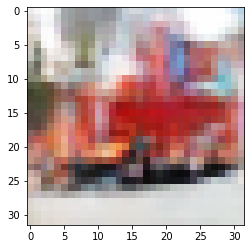

-> Epoch 167, Batch numero 1/78 -> Disc. loss on real images: 0.67087, Disc. loss on fake images: 0.34771, Generator loss: 1.34789
-> Epoch 167, Batch numero 2/78 -> Disc. loss on real images: 0.57434, Disc. loss on fake images: 0.59397, Generator loss: 1.35048
-> Epoch 167, Batch numero 3/78 -> Disc. loss on real images: 0.39680, Disc. loss on fake images: 0.64166, Generator loss: 1.36109
-> Epoch 167, Batch numero 4/78 -> Disc. loss on real images: 0.64667, Disc. loss on fake images: 0.54960, Generator loss: 1.49049
-> Epoch 167, Batch numero 5/78 -> Disc. loss on real images: 0.55369, Disc. loss on fake images: 0.45507, Generator loss: 1.38687
-> Epoch 167, Batch numero 6/78 -> Disc. loss on real images: 0.59711, Disc. loss on fake images: 0.57192, Generator loss: 1.30806
-> Epoch 167, Batch numero 7/78 -> Disc. loss on real images: 0.51204, Disc. loss on fake images: 0.47056, Generator loss: 1.33064
-> Epoch 167, Batch numero 8/78 -> Disc. loss on real images: 0.60342, Disc. loss o

-> Epoch 167, Batch numero 64/78 -> Disc. loss on real images: 0.51756, Disc. loss on fake images: 0.49705, Generator loss: 1.38122
-> Epoch 167, Batch numero 65/78 -> Disc. loss on real images: 0.63413, Disc. loss on fake images: 0.50777, Generator loss: 1.54057
-> Epoch 167, Batch numero 66/78 -> Disc. loss on real images: 0.30287, Disc. loss on fake images: 0.33318, Generator loss: 1.29500
-> Epoch 167, Batch numero 67/78 -> Disc. loss on real images: 0.52223, Disc. loss on fake images: 0.55098, Generator loss: 1.25630
-> Epoch 167, Batch numero 68/78 -> Disc. loss on real images: 0.51187, Disc. loss on fake images: 0.60285, Generator loss: 1.42456
-> Epoch 167, Batch numero 69/78 -> Disc. loss on real images: 0.46693, Disc. loss on fake images: 0.44742, Generator loss: 1.53938
-> Epoch 167, Batch numero 70/78 -> Disc. loss on real images: 0.42135, Disc. loss on fake images: 0.77912, Generator loss: 1.59846
-> Epoch 167, Batch numero 71/78 -> Disc. loss on real images: 0.45355, Disc

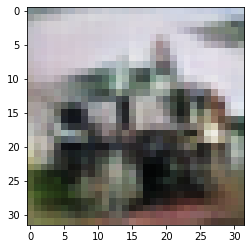

-> Epoch 168, Batch numero 1/78 -> Disc. loss on real images: 0.49819, Disc. loss on fake images: 0.51200, Generator loss: 1.42651
-> Epoch 168, Batch numero 2/78 -> Disc. loss on real images: 0.58266, Disc. loss on fake images: 0.45151, Generator loss: 1.61038
-> Epoch 168, Batch numero 3/78 -> Disc. loss on real images: 0.56254, Disc. loss on fake images: 0.64689, Generator loss: 1.52858
-> Epoch 168, Batch numero 4/78 -> Disc. loss on real images: 0.45981, Disc. loss on fake images: 0.40956, Generator loss: 1.45252
-> Epoch 168, Batch numero 5/78 -> Disc. loss on real images: 0.58767, Disc. loss on fake images: 0.56366, Generator loss: 1.35482
-> Epoch 168, Batch numero 6/78 -> Disc. loss on real images: 0.45711, Disc. loss on fake images: 0.40562, Generator loss: 1.46869
-> Epoch 168, Batch numero 7/78 -> Disc. loss on real images: 0.47775, Disc. loss on fake images: 0.58103, Generator loss: 1.23391
-> Epoch 168, Batch numero 8/78 -> Disc. loss on real images: 0.57517, Disc. loss o

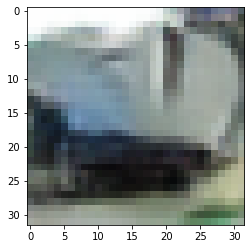

-> Epoch 169, Batch numero 1/78 -> Disc. loss on real images: 0.45813, Disc. loss on fake images: 0.52724, Generator loss: 1.42592
-> Epoch 169, Batch numero 2/78 -> Disc. loss on real images: 0.47006, Disc. loss on fake images: 0.40890, Generator loss: 1.44270
-> Epoch 169, Batch numero 3/78 -> Disc. loss on real images: 0.65705, Disc. loss on fake images: 0.48431, Generator loss: 1.56730
-> Epoch 169, Batch numero 4/78 -> Disc. loss on real images: 0.58449, Disc. loss on fake images: 0.41308, Generator loss: 1.47793
-> Epoch 169, Batch numero 5/78 -> Disc. loss on real images: 0.63160, Disc. loss on fake images: 0.67691, Generator loss: 1.52377
-> Epoch 169, Batch numero 6/78 -> Disc. loss on real images: 0.45322, Disc. loss on fake images: 0.43773, Generator loss: 1.43195
-> Epoch 169, Batch numero 7/78 -> Disc. loss on real images: 0.44639, Disc. loss on fake images: 0.48769, Generator loss: 1.39473
-> Epoch 169, Batch numero 8/78 -> Disc. loss on real images: 0.60554, Disc. loss o

-> Epoch 169, Batch numero 65/78 -> Disc. loss on real images: 0.47677, Disc. loss on fake images: 0.52375, Generator loss: 1.31427
-> Epoch 169, Batch numero 66/78 -> Disc. loss on real images: 0.55102, Disc. loss on fake images: 0.48321, Generator loss: 1.30326
-> Epoch 169, Batch numero 67/78 -> Disc. loss on real images: 0.41845, Disc. loss on fake images: 0.56704, Generator loss: 1.54382
-> Epoch 169, Batch numero 68/78 -> Disc. loss on real images: 0.46287, Disc. loss on fake images: 0.46453, Generator loss: 1.51435
-> Epoch 169, Batch numero 69/78 -> Disc. loss on real images: 0.53644, Disc. loss on fake images: 0.40657, Generator loss: 1.47922
-> Epoch 169, Batch numero 70/78 -> Disc. loss on real images: 0.44530, Disc. loss on fake images: 0.50466, Generator loss: 1.55082
-> Epoch 169, Batch numero 71/78 -> Disc. loss on real images: 0.57321, Disc. loss on fake images: 0.40964, Generator loss: 1.40297
-> Epoch 169, Batch numero 72/78 -> Disc. loss on real images: 0.46289, Disc

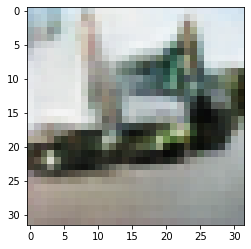

-> Epoch 170, Batch numero 1/78 -> Disc. loss on real images: 0.50992, Disc. loss on fake images: 0.58854, Generator loss: 1.52953
-> Epoch 170, Batch numero 2/78 -> Disc. loss on real images: 0.38960, Disc. loss on fake images: 0.43044, Generator loss: 1.62082
-> Epoch 170, Batch numero 3/78 -> Disc. loss on real images: 0.65764, Disc. loss on fake images: 0.47895, Generator loss: 1.43210
-> Epoch 170, Batch numero 4/78 -> Disc. loss on real images: 0.62900, Disc. loss on fake images: 0.56709, Generator loss: 1.29773
-> Epoch 170, Batch numero 5/78 -> Disc. loss on real images: 0.44584, Disc. loss on fake images: 0.50623, Generator loss: 1.16185
-> Epoch 170, Batch numero 6/78 -> Disc. loss on real images: 0.57179, Disc. loss on fake images: 0.62324, Generator loss: 1.26044
-> Epoch 170, Batch numero 7/78 -> Disc. loss on real images: 0.51812, Disc. loss on fake images: 0.64108, Generator loss: 1.56666
-> Epoch 170, Batch numero 8/78 -> Disc. loss on real images: 0.42523, Disc. loss o

-> Epoch 170, Batch numero 66/78 -> Disc. loss on real images: 0.64892, Disc. loss on fake images: 0.50983, Generator loss: 1.13787
-> Epoch 170, Batch numero 67/78 -> Disc. loss on real images: 0.45894, Disc. loss on fake images: 0.60544, Generator loss: 1.26700
-> Epoch 170, Batch numero 68/78 -> Disc. loss on real images: 0.40406, Disc. loss on fake images: 0.55763, Generator loss: 1.39784
-> Epoch 170, Batch numero 69/78 -> Disc. loss on real images: 0.53301, Disc. loss on fake images: 0.43075, Generator loss: 1.64617
-> Epoch 170, Batch numero 70/78 -> Disc. loss on real images: 0.45089, Disc. loss on fake images: 0.52012, Generator loss: 1.54816
-> Epoch 170, Batch numero 71/78 -> Disc. loss on real images: 0.47469, Disc. loss on fake images: 0.44812, Generator loss: 1.34001
-> Epoch 170, Batch numero 72/78 -> Disc. loss on real images: 0.51192, Disc. loss on fake images: 0.45735, Generator loss: 1.30393
-> Epoch 170, Batch numero 73/78 -> Disc. loss on real images: 0.43575, Disc

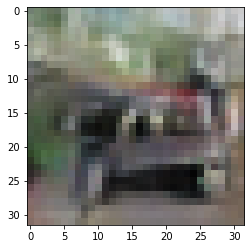

-> Epoch 171, Batch numero 1/78 -> Disc. loss on real images: 0.53386, Disc. loss on fake images: 0.51448, Generator loss: 1.46124
-> Epoch 171, Batch numero 2/78 -> Disc. loss on real images: 0.46983, Disc. loss on fake images: 0.42993, Generator loss: 1.45852
-> Epoch 171, Batch numero 3/78 -> Disc. loss on real images: 0.49277, Disc. loss on fake images: 0.48734, Generator loss: 1.44923
-> Epoch 171, Batch numero 4/78 -> Disc. loss on real images: 0.52168, Disc. loss on fake images: 0.52092, Generator loss: 1.57221
-> Epoch 171, Batch numero 5/78 -> Disc. loss on real images: 0.58352, Disc. loss on fake images: 0.50093, Generator loss: 1.49368
-> Epoch 171, Batch numero 6/78 -> Disc. loss on real images: 0.59353, Disc. loss on fake images: 0.45692, Generator loss: 1.35413
-> Epoch 171, Batch numero 7/78 -> Disc. loss on real images: 0.49213, Disc. loss on fake images: 0.62093, Generator loss: 1.47051
-> Epoch 171, Batch numero 8/78 -> Disc. loss on real images: 0.45030, Disc. loss o

-> Epoch 171, Batch numero 64/78 -> Disc. loss on real images: 0.51272, Disc. loss on fake images: 0.52774, Generator loss: 1.54261
-> Epoch 171, Batch numero 65/78 -> Disc. loss on real images: 0.55397, Disc. loss on fake images: 0.45892, Generator loss: 1.37717
-> Epoch 171, Batch numero 66/78 -> Disc. loss on real images: 0.40132, Disc. loss on fake images: 0.35608, Generator loss: 1.28410
-> Epoch 171, Batch numero 67/78 -> Disc. loss on real images: 0.35617, Disc. loss on fake images: 0.60763, Generator loss: 1.54536
-> Epoch 171, Batch numero 68/78 -> Disc. loss on real images: 0.42171, Disc. loss on fake images: 0.42560, Generator loss: 1.71574
-> Epoch 171, Batch numero 69/78 -> Disc. loss on real images: 0.75536, Disc. loss on fake images: 0.36356, Generator loss: 1.39702
-> Epoch 171, Batch numero 70/78 -> Disc. loss on real images: 0.46637, Disc. loss on fake images: 0.48334, Generator loss: 1.35160
-> Epoch 171, Batch numero 71/78 -> Disc. loss on real images: 0.60028, Disc

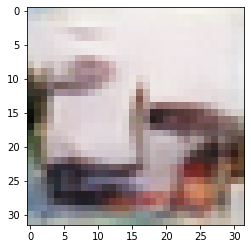

-> Epoch 172, Batch numero 1/78 -> Disc. loss on real images: 0.82902, Disc. loss on fake images: 0.44256, Generator loss: 1.34227
-> Epoch 172, Batch numero 2/78 -> Disc. loss on real images: 0.51366, Disc. loss on fake images: 0.70461, Generator loss: 1.42524
-> Epoch 172, Batch numero 3/78 -> Disc. loss on real images: 0.52660, Disc. loss on fake images: 0.34894, Generator loss: 1.62777
-> Epoch 172, Batch numero 4/78 -> Disc. loss on real images: 0.56275, Disc. loss on fake images: 0.45758, Generator loss: 1.28189
-> Epoch 172, Batch numero 5/78 -> Disc. loss on real images: 0.51406, Disc. loss on fake images: 0.57529, Generator loss: 1.52479
-> Epoch 172, Batch numero 6/78 -> Disc. loss on real images: 0.44435, Disc. loss on fake images: 0.43654, Generator loss: 1.41597
-> Epoch 172, Batch numero 7/78 -> Disc. loss on real images: 0.48542, Disc. loss on fake images: 0.50647, Generator loss: 1.42110
-> Epoch 172, Batch numero 8/78 -> Disc. loss on real images: 0.49722, Disc. loss o

-> Epoch 172, Batch numero 64/78 -> Disc. loss on real images: 0.52844, Disc. loss on fake images: 0.47016, Generator loss: 1.35705
-> Epoch 172, Batch numero 65/78 -> Disc. loss on real images: 0.45921, Disc. loss on fake images: 0.46905, Generator loss: 1.47571
-> Epoch 172, Batch numero 66/78 -> Disc. loss on real images: 0.54966, Disc. loss on fake images: 0.55824, Generator loss: 1.36242
-> Epoch 172, Batch numero 67/78 -> Disc. loss on real images: 0.48134, Disc. loss on fake images: 0.55259, Generator loss: 1.36501
-> Epoch 172, Batch numero 68/78 -> Disc. loss on real images: 0.54904, Disc. loss on fake images: 0.52885, Generator loss: 1.51430
-> Epoch 172, Batch numero 69/78 -> Disc. loss on real images: 0.49979, Disc. loss on fake images: 0.52388, Generator loss: 1.89574
-> Epoch 172, Batch numero 70/78 -> Disc. loss on real images: 0.64749, Disc. loss on fake images: 0.33148, Generator loss: 1.39908
-> Epoch 172, Batch numero 71/78 -> Disc. loss on real images: 0.59182, Disc

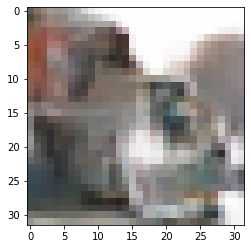

-> Epoch 173, Batch numero 1/78 -> Disc. loss on real images: 0.61054, Disc. loss on fake images: 0.45109, Generator loss: 1.55429
-> Epoch 173, Batch numero 2/78 -> Disc. loss on real images: 0.46056, Disc. loss on fake images: 0.44671, Generator loss: 1.49513
-> Epoch 173, Batch numero 3/78 -> Disc. loss on real images: 0.55350, Disc. loss on fake images: 0.46919, Generator loss: 1.36998
-> Epoch 173, Batch numero 4/78 -> Disc. loss on real images: 0.48752, Disc. loss on fake images: 0.48698, Generator loss: 1.31120
-> Epoch 173, Batch numero 5/78 -> Disc. loss on real images: 0.31551, Disc. loss on fake images: 0.44966, Generator loss: 1.45282
-> Epoch 173, Batch numero 6/78 -> Disc. loss on real images: 0.49774, Disc. loss on fake images: 0.58476, Generator loss: 1.42755
-> Epoch 173, Batch numero 7/78 -> Disc. loss on real images: 0.39793, Disc. loss on fake images: 0.57170, Generator loss: 1.48126
-> Epoch 173, Batch numero 8/78 -> Disc. loss on real images: 0.54890, Disc. loss o

-> Epoch 173, Batch numero 64/78 -> Disc. loss on real images: 0.36400, Disc. loss on fake images: 0.36259, Generator loss: 1.51268
-> Epoch 173, Batch numero 65/78 -> Disc. loss on real images: 0.37925, Disc. loss on fake images: 0.33095, Generator loss: 1.40243
-> Epoch 173, Batch numero 66/78 -> Disc. loss on real images: 0.56033, Disc. loss on fake images: 0.52612, Generator loss: 1.34568
-> Epoch 173, Batch numero 67/78 -> Disc. loss on real images: 0.36858, Disc. loss on fake images: 0.47276, Generator loss: 1.38176
-> Epoch 173, Batch numero 68/78 -> Disc. loss on real images: 0.55904, Disc. loss on fake images: 0.47404, Generator loss: 1.51807
-> Epoch 173, Batch numero 69/78 -> Disc. loss on real images: 0.43228, Disc. loss on fake images: 0.44865, Generator loss: 1.31485
-> Epoch 173, Batch numero 70/78 -> Disc. loss on real images: 0.50627, Disc. loss on fake images: 0.48529, Generator loss: 1.42793
-> Epoch 173, Batch numero 71/78 -> Disc. loss on real images: 0.55405, Disc

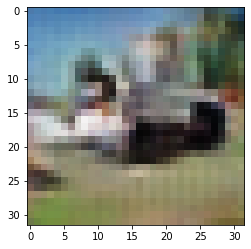

-> Epoch 174, Batch numero 1/78 -> Disc. loss on real images: 0.47248, Disc. loss on fake images: 0.46689, Generator loss: 1.61693
-> Epoch 174, Batch numero 2/78 -> Disc. loss on real images: 0.81117, Disc. loss on fake images: 0.41244, Generator loss: 1.45996
-> Epoch 174, Batch numero 3/78 -> Disc. loss on real images: 0.47151, Disc. loss on fake images: 0.56329, Generator loss: 1.50407
-> Epoch 174, Batch numero 4/78 -> Disc. loss on real images: 0.53513, Disc. loss on fake images: 0.54320, Generator loss: 1.45385
-> Epoch 174, Batch numero 5/78 -> Disc. loss on real images: 0.52749, Disc. loss on fake images: 0.48907, Generator loss: 1.50891
-> Epoch 174, Batch numero 6/78 -> Disc. loss on real images: 0.50374, Disc. loss on fake images: 0.36299, Generator loss: 1.37352
-> Epoch 174, Batch numero 7/78 -> Disc. loss on real images: 0.48594, Disc. loss on fake images: 0.72171, Generator loss: 1.51073
-> Epoch 174, Batch numero 8/78 -> Disc. loss on real images: 0.52534, Disc. loss o

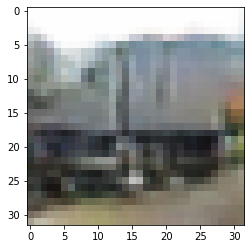

-> Epoch 175, Batch numero 1/78 -> Disc. loss on real images: 0.51406, Disc. loss on fake images: 0.67190, Generator loss: 1.57653
-> Epoch 175, Batch numero 2/78 -> Disc. loss on real images: 0.59399, Disc. loss on fake images: 0.50676, Generator loss: 1.69229
-> Epoch 175, Batch numero 3/78 -> Disc. loss on real images: 0.62130, Disc. loss on fake images: 0.63399, Generator loss: 1.72716
-> Epoch 175, Batch numero 4/78 -> Disc. loss on real images: 0.59263, Disc. loss on fake images: 0.38552, Generator loss: 1.57287
-> Epoch 175, Batch numero 5/78 -> Disc. loss on real images: 0.50193, Disc. loss on fake images: 0.35327, Generator loss: 1.67352
-> Epoch 175, Batch numero 6/78 -> Disc. loss on real images: 0.47149, Disc. loss on fake images: 0.58102, Generator loss: 1.46367
-> Epoch 175, Batch numero 7/78 -> Disc. loss on real images: 0.55421, Disc. loss on fake images: 0.49593, Generator loss: 1.42640
-> Epoch 175, Batch numero 8/78 -> Disc. loss on real images: 0.52993, Disc. loss o

-> Epoch 175, Batch numero 65/78 -> Disc. loss on real images: 0.41636, Disc. loss on fake images: 0.65450, Generator loss: 1.46446
-> Epoch 175, Batch numero 66/78 -> Disc. loss on real images: 0.67371, Disc. loss on fake images: 0.36367, Generator loss: 1.45120
-> Epoch 175, Batch numero 67/78 -> Disc. loss on real images: 0.63469, Disc. loss on fake images: 0.52939, Generator loss: 1.41726
-> Epoch 175, Batch numero 68/78 -> Disc. loss on real images: 0.34543, Disc. loss on fake images: 0.38823, Generator loss: 1.43056
-> Epoch 175, Batch numero 69/78 -> Disc. loss on real images: 0.33987, Disc. loss on fake images: 0.39530, Generator loss: 1.46803
-> Epoch 175, Batch numero 70/78 -> Disc. loss on real images: 0.41597, Disc. loss on fake images: 0.43023, Generator loss: 1.28443
-> Epoch 175, Batch numero 71/78 -> Disc. loss on real images: 0.47906, Disc. loss on fake images: 0.59461, Generator loss: 1.46702
-> Epoch 175, Batch numero 72/78 -> Disc. loss on real images: 0.42041, Disc

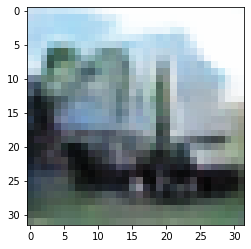

-> Epoch 176, Batch numero 1/78 -> Disc. loss on real images: 0.46309, Disc. loss on fake images: 0.48994, Generator loss: 1.64954
-> Epoch 176, Batch numero 2/78 -> Disc. loss on real images: 0.69974, Disc. loss on fake images: 0.36293, Generator loss: 1.59799
-> Epoch 176, Batch numero 3/78 -> Disc. loss on real images: 0.62967, Disc. loss on fake images: 0.46580, Generator loss: 1.35274
-> Epoch 176, Batch numero 4/78 -> Disc. loss on real images: 0.38744, Disc. loss on fake images: 0.51321, Generator loss: 1.25539
-> Epoch 176, Batch numero 5/78 -> Disc. loss on real images: 0.50858, Disc. loss on fake images: 0.53750, Generator loss: 1.26612
-> Epoch 176, Batch numero 6/78 -> Disc. loss on real images: 0.51689, Disc. loss on fake images: 0.48465, Generator loss: 1.40449
-> Epoch 176, Batch numero 7/78 -> Disc. loss on real images: 0.54909, Disc. loss on fake images: 0.58916, Generator loss: 1.52258
-> Epoch 176, Batch numero 8/78 -> Disc. loss on real images: 0.51229, Disc. loss o

-> Epoch 176, Batch numero 64/78 -> Disc. loss on real images: 0.43418, Disc. loss on fake images: 0.48628, Generator loss: 1.49314
-> Epoch 176, Batch numero 65/78 -> Disc. loss on real images: 0.41790, Disc. loss on fake images: 0.43587, Generator loss: 1.59211
-> Epoch 176, Batch numero 66/78 -> Disc. loss on real images: 0.38987, Disc. loss on fake images: 0.55731, Generator loss: 1.61752
-> Epoch 176, Batch numero 67/78 -> Disc. loss on real images: 0.41282, Disc. loss on fake images: 0.42683, Generator loss: 1.43166
-> Epoch 176, Batch numero 68/78 -> Disc. loss on real images: 0.42417, Disc. loss on fake images: 0.48818, Generator loss: 1.45200
-> Epoch 176, Batch numero 69/78 -> Disc. loss on real images: 0.51661, Disc. loss on fake images: 0.53195, Generator loss: 1.69374
-> Epoch 176, Batch numero 70/78 -> Disc. loss on real images: 0.55979, Disc. loss on fake images: 0.40682, Generator loss: 1.47352
-> Epoch 176, Batch numero 71/78 -> Disc. loss on real images: 0.41675, Disc

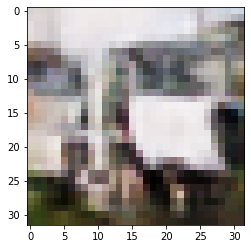

-> Epoch 177, Batch numero 1/78 -> Disc. loss on real images: 0.58266, Disc. loss on fake images: 0.39397, Generator loss: 1.38318
-> Epoch 177, Batch numero 2/78 -> Disc. loss on real images: 0.53374, Disc. loss on fake images: 0.70710, Generator loss: 1.43037
-> Epoch 177, Batch numero 3/78 -> Disc. loss on real images: 0.39672, Disc. loss on fake images: 0.43243, Generator loss: 1.54169
-> Epoch 177, Batch numero 4/78 -> Disc. loss on real images: 0.45718, Disc. loss on fake images: 0.39049, Generator loss: 1.58650
-> Epoch 177, Batch numero 5/78 -> Disc. loss on real images: 0.62864, Disc. loss on fake images: 0.47525, Generator loss: 1.43912
-> Epoch 177, Batch numero 6/78 -> Disc. loss on real images: 0.49505, Disc. loss on fake images: 0.46894, Generator loss: 1.47007
-> Epoch 177, Batch numero 7/78 -> Disc. loss on real images: 0.59575, Disc. loss on fake images: 0.52807, Generator loss: 1.78094
-> Epoch 177, Batch numero 8/78 -> Disc. loss on real images: 0.50246, Disc. loss o

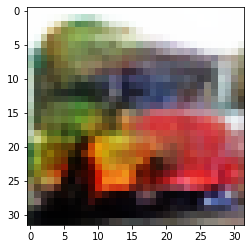

-> Epoch 178, Batch numero 1/78 -> Disc. loss on real images: 0.45590, Disc. loss on fake images: 0.43844, Generator loss: 1.77986
-> Epoch 178, Batch numero 2/78 -> Disc. loss on real images: 0.59229, Disc. loss on fake images: 0.45884, Generator loss: 1.57848
-> Epoch 178, Batch numero 3/78 -> Disc. loss on real images: 0.52665, Disc. loss on fake images: 0.47982, Generator loss: 1.49197
-> Epoch 178, Batch numero 4/78 -> Disc. loss on real images: 0.72027, Disc. loss on fake images: 0.43756, Generator loss: 1.39903
-> Epoch 178, Batch numero 5/78 -> Disc. loss on real images: 0.59589, Disc. loss on fake images: 0.60220, Generator loss: 1.22511
-> Epoch 178, Batch numero 6/78 -> Disc. loss on real images: 0.46089, Disc. loss on fake images: 0.59936, Generator loss: 1.33698
-> Epoch 178, Batch numero 7/78 -> Disc. loss on real images: 0.46852, Disc. loss on fake images: 0.40097, Generator loss: 1.29563
-> Epoch 178, Batch numero 8/78 -> Disc. loss on real images: 0.47522, Disc. loss o

-> Epoch 178, Batch numero 65/78 -> Disc. loss on real images: 0.52242, Disc. loss on fake images: 0.54145, Generator loss: 1.53878
-> Epoch 178, Batch numero 66/78 -> Disc. loss on real images: 0.52243, Disc. loss on fake images: 0.49786, Generator loss: 1.48833
-> Epoch 178, Batch numero 67/78 -> Disc. loss on real images: 0.60215, Disc. loss on fake images: 0.39649, Generator loss: 1.36382
-> Epoch 178, Batch numero 68/78 -> Disc. loss on real images: 0.42726, Disc. loss on fake images: 0.55025, Generator loss: 1.63724
-> Epoch 178, Batch numero 69/78 -> Disc. loss on real images: 0.42986, Disc. loss on fake images: 0.49637, Generator loss: 1.50120
-> Epoch 178, Batch numero 70/78 -> Disc. loss on real images: 0.56734, Disc. loss on fake images: 0.36811, Generator loss: 1.69597
-> Epoch 178, Batch numero 71/78 -> Disc. loss on real images: 0.55321, Disc. loss on fake images: 0.50622, Generator loss: 1.39344
-> Epoch 178, Batch numero 72/78 -> Disc. loss on real images: 0.51482, Disc

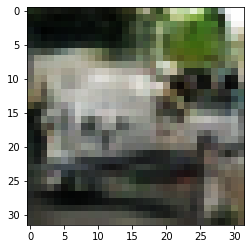

-> Epoch 179, Batch numero 1/78 -> Disc. loss on real images: 0.42493, Disc. loss on fake images: 0.45663, Generator loss: 1.37552
-> Epoch 179, Batch numero 2/78 -> Disc. loss on real images: 0.59551, Disc. loss on fake images: 0.54681, Generator loss: 1.43128
-> Epoch 179, Batch numero 3/78 -> Disc. loss on real images: 0.44446, Disc. loss on fake images: 0.62569, Generator loss: 1.53411
-> Epoch 179, Batch numero 4/78 -> Disc. loss on real images: 0.46214, Disc. loss on fake images: 0.47014, Generator loss: 1.46857
-> Epoch 179, Batch numero 5/78 -> Disc. loss on real images: 0.44451, Disc. loss on fake images: 0.32137, Generator loss: 1.45784
-> Epoch 179, Batch numero 6/78 -> Disc. loss on real images: 0.45144, Disc. loss on fake images: 0.67232, Generator loss: 1.60625
-> Epoch 179, Batch numero 7/78 -> Disc. loss on real images: 0.46941, Disc. loss on fake images: 0.51802, Generator loss: 1.47316
-> Epoch 179, Batch numero 8/78 -> Disc. loss on real images: 0.59039, Disc. loss o

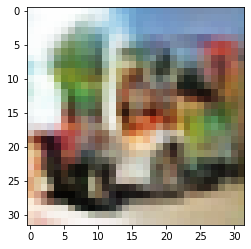

-> Epoch 180, Batch numero 1/78 -> Disc. loss on real images: 0.39125, Disc. loss on fake images: 0.44383, Generator loss: 1.52014
-> Epoch 180, Batch numero 2/78 -> Disc. loss on real images: 0.54303, Disc. loss on fake images: 0.59956, Generator loss: 1.60057
-> Epoch 180, Batch numero 3/78 -> Disc. loss on real images: 0.49425, Disc. loss on fake images: 0.37592, Generator loss: 1.59105
-> Epoch 180, Batch numero 4/78 -> Disc. loss on real images: 0.61366, Disc. loss on fake images: 0.47898, Generator loss: 1.71343
-> Epoch 180, Batch numero 5/78 -> Disc. loss on real images: 0.48877, Disc. loss on fake images: 0.59351, Generator loss: 1.57008
-> Epoch 180, Batch numero 6/78 -> Disc. loss on real images: 0.69993, Disc. loss on fake images: 0.43606, Generator loss: 1.49761
-> Epoch 180, Batch numero 7/78 -> Disc. loss on real images: 0.48841, Disc. loss on fake images: 0.51448, Generator loss: 1.62800
-> Epoch 180, Batch numero 8/78 -> Disc. loss on real images: 0.54287, Disc. loss o

-> Epoch 180, Batch numero 65/78 -> Disc. loss on real images: 0.45419, Disc. loss on fake images: 0.78530, Generator loss: 1.48245
-> Epoch 180, Batch numero 66/78 -> Disc. loss on real images: 0.51187, Disc. loss on fake images: 0.49145, Generator loss: 1.51057
-> Epoch 180, Batch numero 67/78 -> Disc. loss on real images: 0.45978, Disc. loss on fake images: 0.39833, Generator loss: 1.47825
-> Epoch 180, Batch numero 68/78 -> Disc. loss on real images: 0.55891, Disc. loss on fake images: 0.49512, Generator loss: 1.45806
-> Epoch 180, Batch numero 69/78 -> Disc. loss on real images: 0.80108, Disc. loss on fake images: 0.51115, Generator loss: 1.43766
-> Epoch 180, Batch numero 70/78 -> Disc. loss on real images: 0.39586, Disc. loss on fake images: 0.53439, Generator loss: 1.47708
-> Epoch 180, Batch numero 71/78 -> Disc. loss on real images: 0.49389, Disc. loss on fake images: 0.47536, Generator loss: 1.52869
-> Epoch 180, Batch numero 72/78 -> Disc. loss on real images: 0.72706, Disc

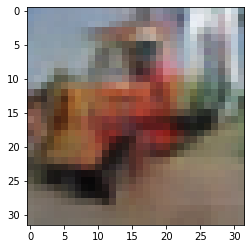

-> Epoch 181, Batch numero 1/78 -> Disc. loss on real images: 0.51968, Disc. loss on fake images: 0.49781, Generator loss: 1.23810
-> Epoch 181, Batch numero 2/78 -> Disc. loss on real images: 0.37874, Disc. loss on fake images: 0.66783, Generator loss: 1.39762
-> Epoch 181, Batch numero 3/78 -> Disc. loss on real images: 0.49167, Disc. loss on fake images: 0.53464, Generator loss: 1.44936
-> Epoch 181, Batch numero 4/78 -> Disc. loss on real images: 0.60456, Disc. loss on fake images: 0.40450, Generator loss: 1.40145
-> Epoch 181, Batch numero 5/78 -> Disc. loss on real images: 0.39767, Disc. loss on fake images: 0.51325, Generator loss: 1.33039
-> Epoch 181, Batch numero 6/78 -> Disc. loss on real images: 0.43520, Disc. loss on fake images: 0.58365, Generator loss: 1.42744
-> Epoch 181, Batch numero 7/78 -> Disc. loss on real images: 0.48158, Disc. loss on fake images: 0.44127, Generator loss: 1.55589
-> Epoch 181, Batch numero 8/78 -> Disc. loss on real images: 0.60243, Disc. loss o

-> Epoch 181, Batch numero 64/78 -> Disc. loss on real images: 0.65728, Disc. loss on fake images: 0.45201, Generator loss: 1.52478
-> Epoch 181, Batch numero 65/78 -> Disc. loss on real images: 0.59560, Disc. loss on fake images: 0.63262, Generator loss: 1.47937
-> Epoch 181, Batch numero 66/78 -> Disc. loss on real images: 0.53331, Disc. loss on fake images: 0.47705, Generator loss: 1.40457
-> Epoch 181, Batch numero 67/78 -> Disc. loss on real images: 0.47773, Disc. loss on fake images: 0.56130, Generator loss: 1.43470
-> Epoch 181, Batch numero 68/78 -> Disc. loss on real images: 0.42787, Disc. loss on fake images: 0.42413, Generator loss: 1.68943
-> Epoch 181, Batch numero 69/78 -> Disc. loss on real images: 0.59259, Disc. loss on fake images: 0.36763, Generator loss: 1.27740
-> Epoch 181, Batch numero 70/78 -> Disc. loss on real images: 0.42137, Disc. loss on fake images: 0.53915, Generator loss: 1.42998
-> Epoch 181, Batch numero 71/78 -> Disc. loss on real images: 0.36707, Disc

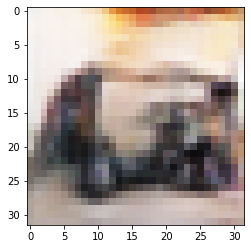

-> Epoch 182, Batch numero 1/78 -> Disc. loss on real images: 0.43107, Disc. loss on fake images: 0.41180, Generator loss: 1.62933
-> Epoch 182, Batch numero 2/78 -> Disc. loss on real images: 0.49112, Disc. loss on fake images: 0.53190, Generator loss: 1.44108
-> Epoch 182, Batch numero 3/78 -> Disc. loss on real images: 0.74236, Disc. loss on fake images: 0.42510, Generator loss: 1.51765
-> Epoch 182, Batch numero 4/78 -> Disc. loss on real images: 0.52219, Disc. loss on fake images: 0.59020, Generator loss: 1.50792
-> Epoch 182, Batch numero 5/78 -> Disc. loss on real images: 0.48768, Disc. loss on fake images: 0.42876, Generator loss: 1.34542
-> Epoch 182, Batch numero 6/78 -> Disc. loss on real images: 0.33116, Disc. loss on fake images: 0.45844, Generator loss: 1.48266
-> Epoch 182, Batch numero 7/78 -> Disc. loss on real images: 0.61696, Disc. loss on fake images: 0.42318, Generator loss: 1.42392
-> Epoch 182, Batch numero 8/78 -> Disc. loss on real images: 0.53362, Disc. loss o

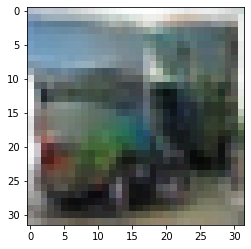

-> Epoch 183, Batch numero 1/78 -> Disc. loss on real images: 0.46064, Disc. loss on fake images: 0.49687, Generator loss: 1.49973
-> Epoch 183, Batch numero 2/78 -> Disc. loss on real images: 0.42710, Disc. loss on fake images: 0.56605, Generator loss: 1.53835
-> Epoch 183, Batch numero 3/78 -> Disc. loss on real images: 0.49152, Disc. loss on fake images: 0.48172, Generator loss: 1.52164
-> Epoch 183, Batch numero 4/78 -> Disc. loss on real images: 0.55122, Disc. loss on fake images: 0.38635, Generator loss: 1.34111
-> Epoch 183, Batch numero 5/78 -> Disc. loss on real images: 0.36268, Disc. loss on fake images: 0.52871, Generator loss: 1.42795
-> Epoch 183, Batch numero 6/78 -> Disc. loss on real images: 0.56363, Disc. loss on fake images: 0.56346, Generator loss: 1.31619
-> Epoch 183, Batch numero 7/78 -> Disc. loss on real images: 0.48397, Disc. loss on fake images: 0.48493, Generator loss: 1.28837
-> Epoch 183, Batch numero 8/78 -> Disc. loss on real images: 0.41713, Disc. loss o

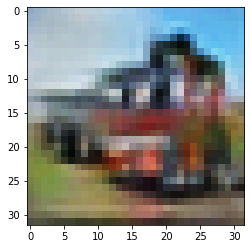

-> Epoch 184, Batch numero 1/78 -> Disc. loss on real images: 0.43551, Disc. loss on fake images: 0.50573, Generator loss: 1.59610
-> Epoch 184, Batch numero 2/78 -> Disc. loss on real images: 0.58323, Disc. loss on fake images: 0.47798, Generator loss: 1.66689
-> Epoch 184, Batch numero 3/78 -> Disc. loss on real images: 0.55989, Disc. loss on fake images: 0.46566, Generator loss: 1.70537
-> Epoch 184, Batch numero 4/78 -> Disc. loss on real images: 0.55071, Disc. loss on fake images: 0.40497, Generator loss: 1.48193
-> Epoch 184, Batch numero 5/78 -> Disc. loss on real images: 0.38875, Disc. loss on fake images: 0.41913, Generator loss: 1.56898
-> Epoch 184, Batch numero 6/78 -> Disc. loss on real images: 0.62829, Disc. loss on fake images: 0.49377, Generator loss: 1.56492
-> Epoch 184, Batch numero 7/78 -> Disc. loss on real images: 0.47226, Disc. loss on fake images: 0.49356, Generator loss: 1.37559
-> Epoch 184, Batch numero 8/78 -> Disc. loss on real images: 0.46601, Disc. loss o

-> Epoch 184, Batch numero 64/78 -> Disc. loss on real images: 0.41116, Disc. loss on fake images: 0.54681, Generator loss: 1.68920
-> Epoch 184, Batch numero 65/78 -> Disc. loss on real images: 0.60265, Disc. loss on fake images: 0.43733, Generator loss: 1.43002
-> Epoch 184, Batch numero 66/78 -> Disc. loss on real images: 0.50903, Disc. loss on fake images: 0.42432, Generator loss: 1.48709
-> Epoch 184, Batch numero 67/78 -> Disc. loss on real images: 0.53779, Disc. loss on fake images: 0.55101, Generator loss: 1.70287
-> Epoch 184, Batch numero 68/78 -> Disc. loss on real images: 0.48353, Disc. loss on fake images: 0.44024, Generator loss: 1.70752
-> Epoch 184, Batch numero 69/78 -> Disc. loss on real images: 0.56678, Disc. loss on fake images: 0.48856, Generator loss: 1.43139
-> Epoch 184, Batch numero 70/78 -> Disc. loss on real images: 0.69993, Disc. loss on fake images: 0.49100, Generator loss: 1.34947
-> Epoch 184, Batch numero 71/78 -> Disc. loss on real images: 0.37595, Disc

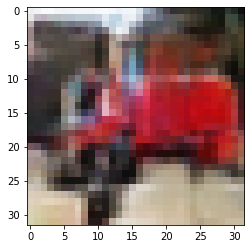

-> Epoch 185, Batch numero 1/78 -> Disc. loss on real images: 0.65498, Disc. loss on fake images: 0.47764, Generator loss: 1.25418
-> Epoch 185, Batch numero 2/78 -> Disc. loss on real images: 0.58615, Disc. loss on fake images: 0.73595, Generator loss: 1.47363
-> Epoch 185, Batch numero 3/78 -> Disc. loss on real images: 0.41678, Disc. loss on fake images: 0.45236, Generator loss: 1.47081
-> Epoch 185, Batch numero 4/78 -> Disc. loss on real images: 0.47517, Disc. loss on fake images: 0.45184, Generator loss: 1.49137
-> Epoch 185, Batch numero 5/78 -> Disc. loss on real images: 0.41491, Disc. loss on fake images: 0.49711, Generator loss: 1.57647
-> Epoch 185, Batch numero 6/78 -> Disc. loss on real images: 0.51677, Disc. loss on fake images: 0.55935, Generator loss: 1.52517
-> Epoch 185, Batch numero 7/78 -> Disc. loss on real images: 0.46283, Disc. loss on fake images: 0.44450, Generator loss: 1.51095
-> Epoch 185, Batch numero 8/78 -> Disc. loss on real images: 0.33637, Disc. loss o

-> Epoch 185, Batch numero 64/78 -> Disc. loss on real images: 0.52399, Disc. loss on fake images: 0.37938, Generator loss: 1.69917
-> Epoch 185, Batch numero 65/78 -> Disc. loss on real images: 0.39372, Disc. loss on fake images: 0.38630, Generator loss: 1.76025
-> Epoch 185, Batch numero 66/78 -> Disc. loss on real images: 0.45550, Disc. loss on fake images: 0.50032, Generator loss: 1.48946
-> Epoch 185, Batch numero 67/78 -> Disc. loss on real images: 0.44434, Disc. loss on fake images: 0.44275, Generator loss: 1.56122
-> Epoch 185, Batch numero 68/78 -> Disc. loss on real images: 0.45020, Disc. loss on fake images: 0.36114, Generator loss: 1.61674
-> Epoch 185, Batch numero 69/78 -> Disc. loss on real images: 0.46972, Disc. loss on fake images: 0.50128, Generator loss: 1.54122
-> Epoch 185, Batch numero 70/78 -> Disc. loss on real images: 0.58722, Disc. loss on fake images: 0.34093, Generator loss: 1.45709
-> Epoch 185, Batch numero 71/78 -> Disc. loss on real images: 0.48064, Disc

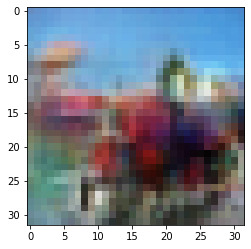

-> Epoch 186, Batch numero 1/78 -> Disc. loss on real images: 0.67976, Disc. loss on fake images: 0.47590, Generator loss: 1.41850
-> Epoch 186, Batch numero 2/78 -> Disc. loss on real images: 0.53948, Disc. loss on fake images: 0.61885, Generator loss: 1.53314
-> Epoch 186, Batch numero 3/78 -> Disc. loss on real images: 0.36298, Disc. loss on fake images: 0.57712, Generator loss: 1.49779
-> Epoch 186, Batch numero 4/78 -> Disc. loss on real images: 0.55290, Disc. loss on fake images: 0.41576, Generator loss: 1.62171
-> Epoch 186, Batch numero 5/78 -> Disc. loss on real images: 0.45521, Disc. loss on fake images: 0.40777, Generator loss: 1.64148
-> Epoch 186, Batch numero 6/78 -> Disc. loss on real images: 0.50605, Disc. loss on fake images: 0.45250, Generator loss: 1.29958
-> Epoch 186, Batch numero 7/78 -> Disc. loss on real images: 0.51323, Disc. loss on fake images: 0.53933, Generator loss: 1.29779
-> Epoch 186, Batch numero 8/78 -> Disc. loss on real images: 0.38659, Disc. loss o

-> Epoch 186, Batch numero 64/78 -> Disc. loss on real images: 0.53347, Disc. loss on fake images: 0.42690, Generator loss: 1.63456
-> Epoch 186, Batch numero 65/78 -> Disc. loss on real images: 0.53738, Disc. loss on fake images: 0.50191, Generator loss: 1.51740
-> Epoch 186, Batch numero 66/78 -> Disc. loss on real images: 0.43923, Disc. loss on fake images: 0.44754, Generator loss: 1.52643
-> Epoch 186, Batch numero 67/78 -> Disc. loss on real images: 0.40915, Disc. loss on fake images: 0.54094, Generator loss: 1.46717
-> Epoch 186, Batch numero 68/78 -> Disc. loss on real images: 0.34751, Disc. loss on fake images: 0.52226, Generator loss: 1.56413
-> Epoch 186, Batch numero 69/78 -> Disc. loss on real images: 0.56474, Disc. loss on fake images: 0.37497, Generator loss: 1.38560
-> Epoch 186, Batch numero 70/78 -> Disc. loss on real images: 0.51551, Disc. loss on fake images: 0.58431, Generator loss: 1.55800
-> Epoch 186, Batch numero 71/78 -> Disc. loss on real images: 0.36539, Disc

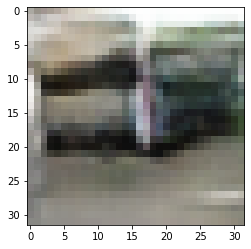

-> Epoch 187, Batch numero 1/78 -> Disc. loss on real images: 0.34772, Disc. loss on fake images: 0.45879, Generator loss: 1.76420
-> Epoch 187, Batch numero 2/78 -> Disc. loss on real images: 0.43744, Disc. loss on fake images: 0.40318, Generator loss: 1.58879
-> Epoch 187, Batch numero 3/78 -> Disc. loss on real images: 0.42700, Disc. loss on fake images: 0.41751, Generator loss: 1.54879
-> Epoch 187, Batch numero 4/78 -> Disc. loss on real images: 0.43957, Disc. loss on fake images: 0.44937, Generator loss: 1.72633
-> Epoch 187, Batch numero 5/78 -> Disc. loss on real images: 0.57578, Disc. loss on fake images: 0.44637, Generator loss: 1.62085
-> Epoch 187, Batch numero 6/78 -> Disc. loss on real images: 0.59579, Disc. loss on fake images: 0.41202, Generator loss: 1.54798
-> Epoch 187, Batch numero 7/78 -> Disc. loss on real images: 0.50854, Disc. loss on fake images: 0.42103, Generator loss: 1.41650
-> Epoch 187, Batch numero 8/78 -> Disc. loss on real images: 0.35650, Disc. loss o

-> Epoch 187, Batch numero 64/78 -> Disc. loss on real images: 0.59534, Disc. loss on fake images: 0.51155, Generator loss: 1.41711
-> Epoch 187, Batch numero 65/78 -> Disc. loss on real images: 0.26342, Disc. loss on fake images: 0.59289, Generator loss: 1.77009
-> Epoch 187, Batch numero 66/78 -> Disc. loss on real images: 0.38704, Disc. loss on fake images: 0.24901, Generator loss: 1.71365
-> Epoch 187, Batch numero 67/78 -> Disc. loss on real images: 0.62423, Disc. loss on fake images: 0.33791, Generator loss: 1.51619
-> Epoch 187, Batch numero 68/78 -> Disc. loss on real images: 0.46438, Disc. loss on fake images: 0.47179, Generator loss: 1.42462
-> Epoch 187, Batch numero 69/78 -> Disc. loss on real images: 0.36819, Disc. loss on fake images: 0.64005, Generator loss: 1.33008
-> Epoch 187, Batch numero 70/78 -> Disc. loss on real images: 0.30647, Disc. loss on fake images: 0.35422, Generator loss: 1.47834
-> Epoch 187, Batch numero 71/78 -> Disc. loss on real images: 0.43231, Disc

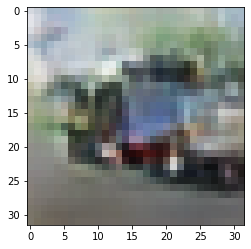

-> Epoch 188, Batch numero 1/78 -> Disc. loss on real images: 0.59688, Disc. loss on fake images: 0.63198, Generator loss: 1.54460
-> Epoch 188, Batch numero 2/78 -> Disc. loss on real images: 0.55934, Disc. loss on fake images: 0.59389, Generator loss: 1.69116
-> Epoch 188, Batch numero 3/78 -> Disc. loss on real images: 0.55232, Disc. loss on fake images: 0.33266, Generator loss: 1.72903
-> Epoch 188, Batch numero 4/78 -> Disc. loss on real images: 0.44018, Disc. loss on fake images: 0.43857, Generator loss: 1.60195
-> Epoch 188, Batch numero 5/78 -> Disc. loss on real images: 0.37348, Disc. loss on fake images: 0.39647, Generator loss: 1.39774
-> Epoch 188, Batch numero 6/78 -> Disc. loss on real images: 0.48630, Disc. loss on fake images: 0.48913, Generator loss: 1.35358
-> Epoch 188, Batch numero 7/78 -> Disc. loss on real images: 0.33339, Disc. loss on fake images: 0.52995, Generator loss: 1.54050
-> Epoch 188, Batch numero 8/78 -> Disc. loss on real images: 0.42417, Disc. loss o

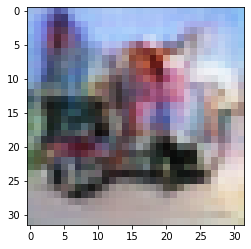

-> Epoch 189, Batch numero 1/78 -> Disc. loss on real images: 0.45998, Disc. loss on fake images: 0.42742, Generator loss: 1.40245
-> Epoch 189, Batch numero 2/78 -> Disc. loss on real images: 0.40775, Disc. loss on fake images: 0.43708, Generator loss: 1.60111
-> Epoch 189, Batch numero 3/78 -> Disc. loss on real images: 0.55555, Disc. loss on fake images: 0.54020, Generator loss: 1.50318
-> Epoch 189, Batch numero 4/78 -> Disc. loss on real images: 0.45860, Disc. loss on fake images: 0.42005, Generator loss: 1.61492
-> Epoch 189, Batch numero 5/78 -> Disc. loss on real images: 0.44817, Disc. loss on fake images: 0.45332, Generator loss: 1.81238
-> Epoch 189, Batch numero 6/78 -> Disc. loss on real images: 0.56607, Disc. loss on fake images: 0.46307, Generator loss: 1.54315
-> Epoch 189, Batch numero 7/78 -> Disc. loss on real images: 0.47914, Disc. loss on fake images: 0.53804, Generator loss: 1.53917
-> Epoch 189, Batch numero 8/78 -> Disc. loss on real images: 0.53504, Disc. loss o

-> Epoch 189, Batch numero 64/78 -> Disc. loss on real images: 0.71418, Disc. loss on fake images: 0.50222, Generator loss: 1.49771
-> Epoch 189, Batch numero 65/78 -> Disc. loss on real images: 0.43031, Disc. loss on fake images: 0.46402, Generator loss: 1.53191
-> Epoch 189, Batch numero 66/78 -> Disc. loss on real images: 0.43947, Disc. loss on fake images: 0.40914, Generator loss: 1.61201
-> Epoch 189, Batch numero 67/78 -> Disc. loss on real images: 0.48139, Disc. loss on fake images: 0.58811, Generator loss: 1.33006
-> Epoch 189, Batch numero 68/78 -> Disc. loss on real images: 0.40073, Disc. loss on fake images: 0.64825, Generator loss: 1.52997
-> Epoch 189, Batch numero 69/78 -> Disc. loss on real images: 0.51662, Disc. loss on fake images: 0.51338, Generator loss: 1.77633
-> Epoch 189, Batch numero 70/78 -> Disc. loss on real images: 0.60130, Disc. loss on fake images: 0.40317, Generator loss: 1.54166
-> Epoch 189, Batch numero 71/78 -> Disc. loss on real images: 0.52297, Disc

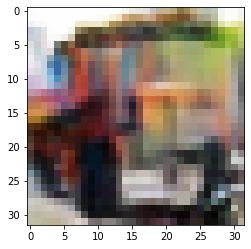

-> Epoch 190, Batch numero 1/78 -> Disc. loss on real images: 0.43960, Disc. loss on fake images: 0.54740, Generator loss: 1.75757
-> Epoch 190, Batch numero 2/78 -> Disc. loss on real images: 0.64319, Disc. loss on fake images: 0.48882, Generator loss: 1.82084
-> Epoch 190, Batch numero 3/78 -> Disc. loss on real images: 0.61771, Disc. loss on fake images: 0.45590, Generator loss: 1.66726
-> Epoch 190, Batch numero 4/78 -> Disc. loss on real images: 0.59043, Disc. loss on fake images: 0.34265, Generator loss: 1.35625
-> Epoch 190, Batch numero 5/78 -> Disc. loss on real images: 0.40100, Disc. loss on fake images: 0.61175, Generator loss: 1.53765
-> Epoch 190, Batch numero 6/78 -> Disc. loss on real images: 0.47247, Disc. loss on fake images: 0.52936, Generator loss: 1.70639
-> Epoch 190, Batch numero 7/78 -> Disc. loss on real images: 0.32148, Disc. loss on fake images: 0.53031, Generator loss: 1.66670
-> Epoch 190, Batch numero 8/78 -> Disc. loss on real images: 0.54056, Disc. loss o

-> Epoch 190, Batch numero 65/78 -> Disc. loss on real images: 0.48245, Disc. loss on fake images: 0.57773, Generator loss: 1.39143
-> Epoch 190, Batch numero 66/78 -> Disc. loss on real images: 0.41208, Disc. loss on fake images: 0.61218, Generator loss: 1.79469
-> Epoch 190, Batch numero 67/78 -> Disc. loss on real images: 0.57287, Disc. loss on fake images: 0.35961, Generator loss: 1.62105
-> Epoch 190, Batch numero 68/78 -> Disc. loss on real images: 0.47687, Disc. loss on fake images: 0.40374, Generator loss: 1.47286
-> Epoch 190, Batch numero 69/78 -> Disc. loss on real images: 0.51920, Disc. loss on fake images: 0.46698, Generator loss: 1.38581
-> Epoch 190, Batch numero 70/78 -> Disc. loss on real images: 0.35538, Disc. loss on fake images: 0.55184, Generator loss: 1.52639
-> Epoch 190, Batch numero 71/78 -> Disc. loss on real images: 0.60218, Disc. loss on fake images: 0.65826, Generator loss: 1.49350
-> Epoch 190, Batch numero 72/78 -> Disc. loss on real images: 0.56207, Disc

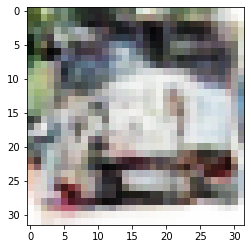

-> Epoch 191, Batch numero 1/78 -> Disc. loss on real images: 0.45183, Disc. loss on fake images: 0.47595, Generator loss: 1.61132
-> Epoch 191, Batch numero 2/78 -> Disc. loss on real images: 0.57354, Disc. loss on fake images: 0.45119, Generator loss: 1.42211
-> Epoch 191, Batch numero 3/78 -> Disc. loss on real images: 0.50459, Disc. loss on fake images: 0.48065, Generator loss: 1.38576
-> Epoch 191, Batch numero 4/78 -> Disc. loss on real images: 0.39300, Disc. loss on fake images: 0.43297, Generator loss: 1.55511
-> Epoch 191, Batch numero 5/78 -> Disc. loss on real images: 0.31658, Disc. loss on fake images: 0.46314, Generator loss: 1.52038
-> Epoch 191, Batch numero 6/78 -> Disc. loss on real images: 0.40304, Disc. loss on fake images: 0.47660, Generator loss: 1.61191
-> Epoch 191, Batch numero 7/78 -> Disc. loss on real images: 0.50688, Disc. loss on fake images: 0.39640, Generator loss: 1.65346
-> Epoch 191, Batch numero 8/78 -> Disc. loss on real images: 0.44163, Disc. loss o

-> Epoch 191, Batch numero 64/78 -> Disc. loss on real images: 0.56062, Disc. loss on fake images: 0.31136, Generator loss: 1.60720
-> Epoch 191, Batch numero 65/78 -> Disc. loss on real images: 0.57569, Disc. loss on fake images: 0.61497, Generator loss: 1.58833
-> Epoch 191, Batch numero 66/78 -> Disc. loss on real images: 0.44023, Disc. loss on fake images: 0.56856, Generator loss: 1.72061
-> Epoch 191, Batch numero 67/78 -> Disc. loss on real images: 0.48198, Disc. loss on fake images: 0.42579, Generator loss: 1.46905
-> Epoch 191, Batch numero 68/78 -> Disc. loss on real images: 0.35060, Disc. loss on fake images: 0.58529, Generator loss: 1.82785
-> Epoch 191, Batch numero 69/78 -> Disc. loss on real images: 0.54752, Disc. loss on fake images: 0.39318, Generator loss: 1.53977
-> Epoch 191, Batch numero 70/78 -> Disc. loss on real images: 0.57121, Disc. loss on fake images: 0.38915, Generator loss: 1.38383
-> Epoch 191, Batch numero 71/78 -> Disc. loss on real images: 0.56868, Disc

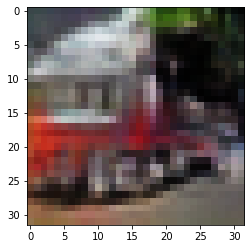

-> Epoch 192, Batch numero 1/78 -> Disc. loss on real images: 0.44608, Disc. loss on fake images: 0.29020, Generator loss: 1.41068
-> Epoch 192, Batch numero 2/78 -> Disc. loss on real images: 0.38493, Disc. loss on fake images: 0.49915, Generator loss: 1.59568
-> Epoch 192, Batch numero 3/78 -> Disc. loss on real images: 0.42114, Disc. loss on fake images: 0.60754, Generator loss: 1.47838
-> Epoch 192, Batch numero 4/78 -> Disc. loss on real images: 0.46235, Disc. loss on fake images: 0.32510, Generator loss: 1.75951
-> Epoch 192, Batch numero 5/78 -> Disc. loss on real images: 0.30985, Disc. loss on fake images: 0.33998, Generator loss: 1.51642
-> Epoch 192, Batch numero 6/78 -> Disc. loss on real images: 0.50890, Disc. loss on fake images: 0.41673, Generator loss: 1.70177
-> Epoch 192, Batch numero 7/78 -> Disc. loss on real images: 0.41666, Disc. loss on fake images: 0.46639, Generator loss: 1.44683
-> Epoch 192, Batch numero 8/78 -> Disc. loss on real images: 0.37803, Disc. loss o

-> Epoch 192, Batch numero 65/78 -> Disc. loss on real images: 0.66036, Disc. loss on fake images: 0.40182, Generator loss: 1.69436
-> Epoch 192, Batch numero 66/78 -> Disc. loss on real images: 0.65168, Disc. loss on fake images: 0.39016, Generator loss: 1.64883
-> Epoch 192, Batch numero 67/78 -> Disc. loss on real images: 0.43279, Disc. loss on fake images: 0.42967, Generator loss: 1.38635
-> Epoch 192, Batch numero 68/78 -> Disc. loss on real images: 0.42632, Disc. loss on fake images: 0.32359, Generator loss: 1.44231
-> Epoch 192, Batch numero 69/78 -> Disc. loss on real images: 0.41640, Disc. loss on fake images: 0.47301, Generator loss: 1.35535
-> Epoch 192, Batch numero 70/78 -> Disc. loss on real images: 0.51021, Disc. loss on fake images: 0.57242, Generator loss: 1.54823
-> Epoch 192, Batch numero 71/78 -> Disc. loss on real images: 0.45427, Disc. loss on fake images: 0.39801, Generator loss: 1.45232
-> Epoch 192, Batch numero 72/78 -> Disc. loss on real images: 0.55691, Disc

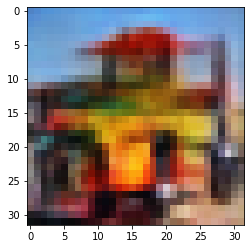

-> Epoch 193, Batch numero 1/78 -> Disc. loss on real images: 0.36054, Disc. loss on fake images: 0.47108, Generator loss: 1.77543
-> Epoch 193, Batch numero 2/78 -> Disc. loss on real images: 0.40299, Disc. loss on fake images: 0.36305, Generator loss: 1.83704
-> Epoch 193, Batch numero 3/78 -> Disc. loss on real images: 0.55911, Disc. loss on fake images: 0.36357, Generator loss: 1.36762
-> Epoch 193, Batch numero 4/78 -> Disc. loss on real images: 0.40257, Disc. loss on fake images: 0.40862, Generator loss: 1.48137
-> Epoch 193, Batch numero 5/78 -> Disc. loss on real images: 0.40188, Disc. loss on fake images: 0.55245, Generator loss: 1.41996
-> Epoch 193, Batch numero 6/78 -> Disc. loss on real images: 0.50201, Disc. loss on fake images: 0.54800, Generator loss: 1.64604
-> Epoch 193, Batch numero 7/78 -> Disc. loss on real images: 0.56577, Disc. loss on fake images: 0.48370, Generator loss: 1.48355
-> Epoch 193, Batch numero 8/78 -> Disc. loss on real images: 0.47621, Disc. loss o

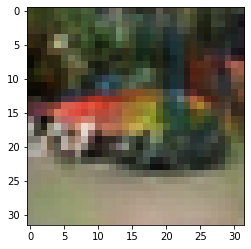

-> Epoch 194, Batch numero 1/78 -> Disc. loss on real images: 0.61778, Disc. loss on fake images: 0.33137, Generator loss: 1.70821
-> Epoch 194, Batch numero 2/78 -> Disc. loss on real images: 0.45800, Disc. loss on fake images: 0.60645, Generator loss: 1.78103
-> Epoch 194, Batch numero 3/78 -> Disc. loss on real images: 0.51323, Disc. loss on fake images: 0.37353, Generator loss: 1.79272
-> Epoch 194, Batch numero 4/78 -> Disc. loss on real images: 0.64056, Disc. loss on fake images: 0.40468, Generator loss: 1.47665
-> Epoch 194, Batch numero 5/78 -> Disc. loss on real images: 0.35834, Disc. loss on fake images: 0.51528, Generator loss: 1.61780
-> Epoch 194, Batch numero 6/78 -> Disc. loss on real images: 0.40139, Disc. loss on fake images: 0.56370, Generator loss: 1.64192
-> Epoch 194, Batch numero 7/78 -> Disc. loss on real images: 0.43243, Disc. loss on fake images: 0.40137, Generator loss: 1.57684
-> Epoch 194, Batch numero 8/78 -> Disc. loss on real images: 0.64538, Disc. loss o

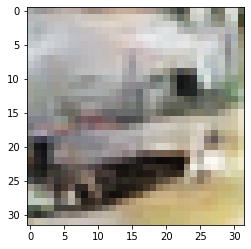

-> Epoch 195, Batch numero 1/78 -> Disc. loss on real images: 0.47755, Disc. loss on fake images: 0.43020, Generator loss: 1.75022
-> Epoch 195, Batch numero 2/78 -> Disc. loss on real images: 0.64775, Disc. loss on fake images: 0.47481, Generator loss: 1.58009
-> Epoch 195, Batch numero 3/78 -> Disc. loss on real images: 0.55975, Disc. loss on fake images: 0.61283, Generator loss: 1.48506
-> Epoch 195, Batch numero 4/78 -> Disc. loss on real images: 0.56143, Disc. loss on fake images: 0.38848, Generator loss: 1.45939
-> Epoch 195, Batch numero 5/78 -> Disc. loss on real images: 0.77888, Disc. loss on fake images: 0.48292, Generator loss: 1.20243
-> Epoch 195, Batch numero 6/78 -> Disc. loss on real images: 0.39122, Disc. loss on fake images: 0.49186, Generator loss: 1.44603
-> Epoch 195, Batch numero 7/78 -> Disc. loss on real images: 0.30543, Disc. loss on fake images: 0.46232, Generator loss: 1.61280
-> Epoch 195, Batch numero 8/78 -> Disc. loss on real images: 0.50886, Disc. loss o

-> Epoch 195, Batch numero 64/78 -> Disc. loss on real images: 0.54882, Disc. loss on fake images: 0.50744, Generator loss: 1.78679
-> Epoch 195, Batch numero 65/78 -> Disc. loss on real images: 0.68427, Disc. loss on fake images: 0.43780, Generator loss: 1.68265
-> Epoch 195, Batch numero 66/78 -> Disc. loss on real images: 0.40528, Disc. loss on fake images: 0.43213, Generator loss: 1.68798
-> Epoch 195, Batch numero 67/78 -> Disc. loss on real images: 0.55809, Disc. loss on fake images: 0.37666, Generator loss: 1.58179
-> Epoch 195, Batch numero 68/78 -> Disc. loss on real images: 0.43504, Disc. loss on fake images: 0.39464, Generator loss: 1.60412
-> Epoch 195, Batch numero 69/78 -> Disc. loss on real images: 0.38803, Disc. loss on fake images: 0.45200, Generator loss: 1.52503
-> Epoch 195, Batch numero 70/78 -> Disc. loss on real images: 0.61729, Disc. loss on fake images: 0.36293, Generator loss: 1.63865
-> Epoch 195, Batch numero 71/78 -> Disc. loss on real images: 0.36149, Disc

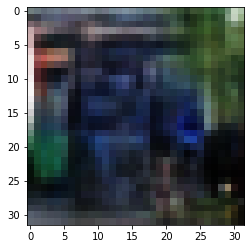

-> Epoch 196, Batch numero 1/78 -> Disc. loss on real images: 0.38452, Disc. loss on fake images: 0.44578, Generator loss: 1.40615
-> Epoch 196, Batch numero 2/78 -> Disc. loss on real images: 0.50386, Disc. loss on fake images: 0.41891, Generator loss: 1.51415
-> Epoch 196, Batch numero 3/78 -> Disc. loss on real images: 0.36475, Disc. loss on fake images: 0.38651, Generator loss: 1.48933
-> Epoch 196, Batch numero 4/78 -> Disc. loss on real images: 0.40265, Disc. loss on fake images: 0.54585, Generator loss: 1.52404
-> Epoch 196, Batch numero 5/78 -> Disc. loss on real images: 0.45001, Disc. loss on fake images: 0.50406, Generator loss: 1.68401
-> Epoch 196, Batch numero 6/78 -> Disc. loss on real images: 0.52216, Disc. loss on fake images: 0.41465, Generator loss: 1.48770
-> Epoch 196, Batch numero 7/78 -> Disc. loss on real images: 0.47724, Disc. loss on fake images: 0.41457, Generator loss: 1.58270
-> Epoch 196, Batch numero 8/78 -> Disc. loss on real images: 0.43061, Disc. loss o

-> Epoch 196, Batch numero 64/78 -> Disc. loss on real images: 0.44998, Disc. loss on fake images: 0.44279, Generator loss: 1.76389
-> Epoch 196, Batch numero 65/78 -> Disc. loss on real images: 0.39925, Disc. loss on fake images: 0.41143, Generator loss: 1.74940
-> Epoch 196, Batch numero 66/78 -> Disc. loss on real images: 0.48503, Disc. loss on fake images: 0.39664, Generator loss: 1.40717
-> Epoch 196, Batch numero 67/78 -> Disc. loss on real images: 0.46088, Disc. loss on fake images: 0.62653, Generator loss: 1.32830
-> Epoch 196, Batch numero 68/78 -> Disc. loss on real images: 0.44972, Disc. loss on fake images: 0.36792, Generator loss: 1.56250
-> Epoch 196, Batch numero 69/78 -> Disc. loss on real images: 0.48676, Disc. loss on fake images: 0.45592, Generator loss: 1.72848
-> Epoch 196, Batch numero 70/78 -> Disc. loss on real images: 0.40606, Disc. loss on fake images: 0.47538, Generator loss: 1.54991
-> Epoch 196, Batch numero 71/78 -> Disc. loss on real images: 0.52294, Disc

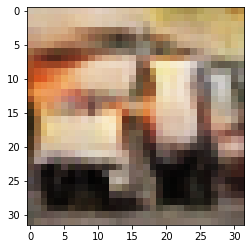

-> Epoch 197, Batch numero 1/78 -> Disc. loss on real images: 0.43517, Disc. loss on fake images: 0.42840, Generator loss: 1.81367
-> Epoch 197, Batch numero 2/78 -> Disc. loss on real images: 0.48152, Disc. loss on fake images: 0.45640, Generator loss: 1.88729
-> Epoch 197, Batch numero 3/78 -> Disc. loss on real images: 0.49557, Disc. loss on fake images: 0.42255, Generator loss: 1.71112
-> Epoch 197, Batch numero 4/78 -> Disc. loss on real images: 0.52788, Disc. loss on fake images: 0.34125, Generator loss: 1.66387
-> Epoch 197, Batch numero 5/78 -> Disc. loss on real images: 0.49384, Disc. loss on fake images: 0.40586, Generator loss: 1.40548
-> Epoch 197, Batch numero 6/78 -> Disc. loss on real images: 0.40607, Disc. loss on fake images: 0.63395, Generator loss: 1.70534
-> Epoch 197, Batch numero 7/78 -> Disc. loss on real images: 0.53210, Disc. loss on fake images: 0.39178, Generator loss: 1.51560
-> Epoch 197, Batch numero 8/78 -> Disc. loss on real images: 0.40162, Disc. loss o

-> Epoch 197, Batch numero 64/78 -> Disc. loss on real images: 0.42234, Disc. loss on fake images: 0.53891, Generator loss: 1.65476
-> Epoch 197, Batch numero 65/78 -> Disc. loss on real images: 0.37313, Disc. loss on fake images: 0.37275, Generator loss: 1.89078
-> Epoch 197, Batch numero 66/78 -> Disc. loss on real images: 0.58451, Disc. loss on fake images: 0.42225, Generator loss: 1.70189
-> Epoch 197, Batch numero 67/78 -> Disc. loss on real images: 0.47855, Disc. loss on fake images: 0.38592, Generator loss: 1.59855
-> Epoch 197, Batch numero 68/78 -> Disc. loss on real images: 0.43061, Disc. loss on fake images: 0.55594, Generator loss: 1.43658
-> Epoch 197, Batch numero 69/78 -> Disc. loss on real images: 0.30088, Disc. loss on fake images: 0.41763, Generator loss: 1.81300
-> Epoch 197, Batch numero 70/78 -> Disc. loss on real images: 0.46811, Disc. loss on fake images: 0.44092, Generator loss: 1.70794
-> Epoch 197, Batch numero 71/78 -> Disc. loss on real images: 0.45144, Disc

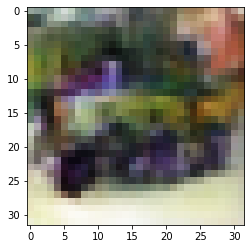

-> Epoch 198, Batch numero 1/78 -> Disc. loss on real images: 0.52345, Disc. loss on fake images: 0.44776, Generator loss: 1.72764
-> Epoch 198, Batch numero 2/78 -> Disc. loss on real images: 0.52394, Disc. loss on fake images: 0.50997, Generator loss: 1.58973
-> Epoch 198, Batch numero 3/78 -> Disc. loss on real images: 0.48001, Disc. loss on fake images: 0.51547, Generator loss: 1.96197
-> Epoch 198, Batch numero 4/78 -> Disc. loss on real images: 0.46006, Disc. loss on fake images: 0.29272, Generator loss: 1.69695
-> Epoch 198, Batch numero 5/78 -> Disc. loss on real images: 0.44342, Disc. loss on fake images: 0.48077, Generator loss: 1.60410
-> Epoch 198, Batch numero 6/78 -> Disc. loss on real images: 0.37775, Disc. loss on fake images: 0.42602, Generator loss: 1.74216
-> Epoch 198, Batch numero 7/78 -> Disc. loss on real images: 0.39801, Disc. loss on fake images: 0.40155, Generator loss: 1.49020
-> Epoch 198, Batch numero 8/78 -> Disc. loss on real images: 0.28821, Disc. loss o

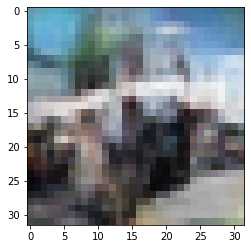

-> Epoch 199, Batch numero 1/78 -> Disc. loss on real images: 0.47987, Disc. loss on fake images: 0.45240, Generator loss: 1.51816
-> Epoch 199, Batch numero 2/78 -> Disc. loss on real images: 0.43792, Disc. loss on fake images: 0.40341, Generator loss: 1.42397
-> Epoch 199, Batch numero 3/78 -> Disc. loss on real images: 0.49835, Disc. loss on fake images: 0.48582, Generator loss: 1.56348
-> Epoch 199, Batch numero 4/78 -> Disc. loss on real images: 0.38156, Disc. loss on fake images: 0.40277, Generator loss: 1.57499
-> Epoch 199, Batch numero 5/78 -> Disc. loss on real images: 0.35478, Disc. loss on fake images: 0.53866, Generator loss: 1.64661
-> Epoch 199, Batch numero 6/78 -> Disc. loss on real images: 0.50013, Disc. loss on fake images: 0.38535, Generator loss: 1.63375
-> Epoch 199, Batch numero 7/78 -> Disc. loss on real images: 0.36736, Disc. loss on fake images: 0.46438, Generator loss: 1.74845
-> Epoch 199, Batch numero 8/78 -> Disc. loss on real images: 0.57536, Disc. loss o

-> Epoch 199, Batch numero 65/78 -> Disc. loss on real images: 0.32177, Disc. loss on fake images: 0.39589, Generator loss: 1.91116
-> Epoch 199, Batch numero 66/78 -> Disc. loss on real images: 0.44810, Disc. loss on fake images: 0.48227, Generator loss: 1.95985
-> Epoch 199, Batch numero 67/78 -> Disc. loss on real images: 0.53014, Disc. loss on fake images: 0.37652, Generator loss: 1.49937
-> Epoch 199, Batch numero 68/78 -> Disc. loss on real images: 0.48395, Disc. loss on fake images: 0.54219, Generator loss: 1.49575
-> Epoch 199, Batch numero 69/78 -> Disc. loss on real images: 0.46260, Disc. loss on fake images: 0.49205, Generator loss: 1.67863
-> Epoch 199, Batch numero 70/78 -> Disc. loss on real images: 0.63032, Disc. loss on fake images: 0.37175, Generator loss: 1.82775
-> Epoch 199, Batch numero 71/78 -> Disc. loss on real images: 0.34427, Disc. loss on fake images: 0.56994, Generator loss: 1.72641
-> Epoch 199, Batch numero 72/78 -> Disc. loss on real images: 0.48323, Disc

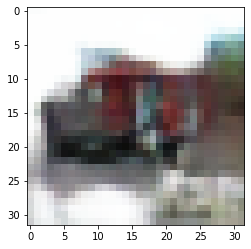

-> Epoch 200, Batch numero 1/78 -> Disc. loss on real images: 0.48028, Disc. loss on fake images: 0.40955, Generator loss: 1.70943
-> Epoch 200, Batch numero 2/78 -> Disc. loss on real images: 0.48696, Disc. loss on fake images: 0.42204, Generator loss: 1.78400
-> Epoch 200, Batch numero 3/78 -> Disc. loss on real images: 0.62188, Disc. loss on fake images: 0.48315, Generator loss: 1.48746
-> Epoch 200, Batch numero 4/78 -> Disc. loss on real images: 0.43058, Disc. loss on fake images: 0.41540, Generator loss: 1.32859
-> Epoch 200, Batch numero 5/78 -> Disc. loss on real images: 0.36648, Disc. loss on fake images: 0.50714, Generator loss: 1.47279
-> Epoch 200, Batch numero 6/78 -> Disc. loss on real images: 0.46267, Disc. loss on fake images: 0.30902, Generator loss: 1.68320
-> Epoch 200, Batch numero 7/78 -> Disc. loss on real images: 0.39648, Disc. loss on fake images: 0.58671, Generator loss: 1.76579
-> Epoch 200, Batch numero 8/78 -> Disc. loss on real images: 0.30934, Disc. loss o

-> Epoch 200, Batch numero 65/78 -> Disc. loss on real images: 0.37741, Disc. loss on fake images: 0.48270, Generator loss: 1.70035
-> Epoch 200, Batch numero 66/78 -> Disc. loss on real images: 0.64938, Disc. loss on fake images: 0.48677, Generator loss: 1.47223
-> Epoch 200, Batch numero 67/78 -> Disc. loss on real images: 0.44661, Disc. loss on fake images: 0.38711, Generator loss: 1.51374
-> Epoch 200, Batch numero 68/78 -> Disc. loss on real images: 0.38670, Disc. loss on fake images: 0.48361, Generator loss: 1.82103
-> Epoch 200, Batch numero 69/78 -> Disc. loss on real images: 0.41129, Disc. loss on fake images: 0.50406, Generator loss: 1.78129
-> Epoch 200, Batch numero 70/78 -> Disc. loss on real images: 0.65777, Disc. loss on fake images: 0.37583, Generator loss: 1.71722
-> Epoch 200, Batch numero 71/78 -> Disc. loss on real images: 0.52842, Disc. loss on fake images: 0.46339, Generator loss: 1.49591
-> Epoch 200, Batch numero 72/78 -> Disc. loss on real images: 0.42718, Disc

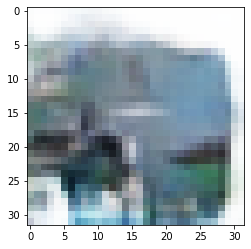

-> Epoch 201, Batch numero 1/78 -> Disc. loss on real images: 0.56162, Disc. loss on fake images: 0.44503, Generator loss: 1.38838
-> Epoch 201, Batch numero 2/78 -> Disc. loss on real images: 0.31346, Disc. loss on fake images: 0.44172, Generator loss: 1.53839
-> Epoch 201, Batch numero 3/78 -> Disc. loss on real images: 0.41616, Disc. loss on fake images: 0.37847, Generator loss: 1.72072
-> Epoch 201, Batch numero 4/78 -> Disc. loss on real images: 0.47163, Disc. loss on fake images: 0.53029, Generator loss: 1.72397
-> Epoch 201, Batch numero 5/78 -> Disc. loss on real images: 0.49714, Disc. loss on fake images: 0.46827, Generator loss: 1.65785
-> Epoch 201, Batch numero 6/78 -> Disc. loss on real images: 0.53110, Disc. loss on fake images: 0.36181, Generator loss: 1.59257
-> Epoch 201, Batch numero 7/78 -> Disc. loss on real images: 0.47305, Disc. loss on fake images: 0.63641, Generator loss: 1.61649
-> Epoch 201, Batch numero 8/78 -> Disc. loss on real images: 0.46147, Disc. loss o

-> Epoch 201, Batch numero 65/78 -> Disc. loss on real images: 0.33795, Disc. loss on fake images: 0.40125, Generator loss: 1.92289
-> Epoch 201, Batch numero 66/78 -> Disc. loss on real images: 0.44457, Disc. loss on fake images: 0.39192, Generator loss: 1.83122
-> Epoch 201, Batch numero 67/78 -> Disc. loss on real images: 0.50344, Disc. loss on fake images: 0.33231, Generator loss: 1.67580
-> Epoch 201, Batch numero 68/78 -> Disc. loss on real images: 0.42416, Disc. loss on fake images: 0.40238, Generator loss: 1.21093
-> Epoch 201, Batch numero 69/78 -> Disc. loss on real images: 0.30603, Disc. loss on fake images: 0.47138, Generator loss: 1.63583
-> Epoch 201, Batch numero 70/78 -> Disc. loss on real images: 0.51088, Disc. loss on fake images: 0.58096, Generator loss: 1.95905
-> Epoch 201, Batch numero 71/78 -> Disc. loss on real images: 0.34177, Disc. loss on fake images: 0.39360, Generator loss: 1.65093
-> Epoch 201, Batch numero 72/78 -> Disc. loss on real images: 0.54814, Disc

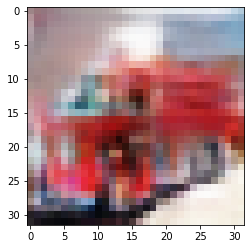

-> Epoch 202, Batch numero 1/78 -> Disc. loss on real images: 0.47685, Disc. loss on fake images: 0.42058, Generator loss: 1.43576
-> Epoch 202, Batch numero 2/78 -> Disc. loss on real images: 0.35639, Disc. loss on fake images: 0.31427, Generator loss: 1.43520
-> Epoch 202, Batch numero 3/78 -> Disc. loss on real images: 0.47051, Disc. loss on fake images: 0.48859, Generator loss: 1.57910
-> Epoch 202, Batch numero 4/78 -> Disc. loss on real images: 0.41888, Disc. loss on fake images: 0.38276, Generator loss: 1.75958
-> Epoch 202, Batch numero 5/78 -> Disc. loss on real images: 0.52404, Disc. loss on fake images: 0.45533, Generator loss: 1.54545
-> Epoch 202, Batch numero 6/78 -> Disc. loss on real images: 0.37065, Disc. loss on fake images: 0.46349, Generator loss: 1.69647
-> Epoch 202, Batch numero 7/78 -> Disc. loss on real images: 0.54308, Disc. loss on fake images: 0.42895, Generator loss: 1.69953
-> Epoch 202, Batch numero 8/78 -> Disc. loss on real images: 0.47280, Disc. loss o

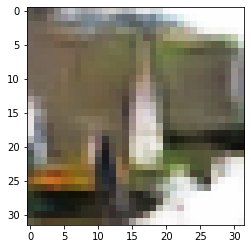

-> Epoch 203, Batch numero 1/78 -> Disc. loss on real images: 0.32325, Disc. loss on fake images: 0.60135, Generator loss: 1.64703
-> Epoch 203, Batch numero 2/78 -> Disc. loss on real images: 0.41698, Disc. loss on fake images: 0.36078, Generator loss: 1.69767
-> Epoch 203, Batch numero 3/78 -> Disc. loss on real images: 0.30773, Disc. loss on fake images: 0.39238, Generator loss: 1.84078
-> Epoch 203, Batch numero 4/78 -> Disc. loss on real images: 0.34577, Disc. loss on fake images: 0.29932, Generator loss: 1.78701
-> Epoch 203, Batch numero 5/78 -> Disc. loss on real images: 0.45385, Disc. loss on fake images: 0.69250, Generator loss: 1.69527
-> Epoch 203, Batch numero 6/78 -> Disc. loss on real images: 0.45190, Disc. loss on fake images: 0.54769, Generator loss: 1.66711
-> Epoch 203, Batch numero 7/78 -> Disc. loss on real images: 0.53492, Disc. loss on fake images: 0.49452, Generator loss: 1.76943
-> Epoch 203, Batch numero 8/78 -> Disc. loss on real images: 0.71208, Disc. loss o

-> Epoch 203, Batch numero 64/78 -> Disc. loss on real images: 0.59247, Disc. loss on fake images: 0.51589, Generator loss: 1.52005
-> Epoch 203, Batch numero 65/78 -> Disc. loss on real images: 0.40859, Disc. loss on fake images: 0.47471, Generator loss: 1.75851
-> Epoch 203, Batch numero 66/78 -> Disc. loss on real images: 0.33172, Disc. loss on fake images: 0.55984, Generator loss: 1.82114
-> Epoch 203, Batch numero 67/78 -> Disc. loss on real images: 0.43919, Disc. loss on fake images: 0.34691, Generator loss: 1.87441
-> Epoch 203, Batch numero 68/78 -> Disc. loss on real images: 0.56036, Disc. loss on fake images: 0.40365, Generator loss: 1.63958
-> Epoch 203, Batch numero 69/78 -> Disc. loss on real images: 0.48916, Disc. loss on fake images: 0.45580, Generator loss: 1.62159
-> Epoch 203, Batch numero 70/78 -> Disc. loss on real images: 0.44968, Disc. loss on fake images: 0.48911, Generator loss: 1.76621
-> Epoch 203, Batch numero 71/78 -> Disc. loss on real images: 0.47346, Disc

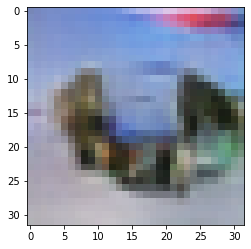

-> Epoch 204, Batch numero 1/78 -> Disc. loss on real images: 0.38996, Disc. loss on fake images: 0.46894, Generator loss: 1.52825
-> Epoch 204, Batch numero 2/78 -> Disc. loss on real images: 0.38679, Disc. loss on fake images: 0.49715, Generator loss: 1.71367
-> Epoch 204, Batch numero 3/78 -> Disc. loss on real images: 0.56938, Disc. loss on fake images: 0.43865, Generator loss: 1.56626
-> Epoch 204, Batch numero 4/78 -> Disc. loss on real images: 0.27356, Disc. loss on fake images: 0.41986, Generator loss: 1.48897
-> Epoch 204, Batch numero 5/78 -> Disc. loss on real images: 0.28151, Disc. loss on fake images: 0.40214, Generator loss: 1.87116
-> Epoch 204, Batch numero 6/78 -> Disc. loss on real images: 0.48021, Disc. loss on fake images: 0.46912, Generator loss: 1.75510
-> Epoch 204, Batch numero 7/78 -> Disc. loss on real images: 0.48095, Disc. loss on fake images: 0.46869, Generator loss: 2.02650
-> Epoch 204, Batch numero 8/78 -> Disc. loss on real images: 0.51826, Disc. loss o

-> Epoch 204, Batch numero 65/78 -> Disc. loss on real images: 0.40947, Disc. loss on fake images: 0.53095, Generator loss: 1.83013
-> Epoch 204, Batch numero 66/78 -> Disc. loss on real images: 0.51283, Disc. loss on fake images: 0.34351, Generator loss: 1.54207
-> Epoch 204, Batch numero 67/78 -> Disc. loss on real images: 0.39122, Disc. loss on fake images: 0.50908, Generator loss: 1.44474
-> Epoch 204, Batch numero 68/78 -> Disc. loss on real images: 0.38449, Disc. loss on fake images: 0.55433, Generator loss: 1.81988
-> Epoch 204, Batch numero 69/78 -> Disc. loss on real images: 0.63798, Disc. loss on fake images: 0.24164, Generator loss: 1.68382
-> Epoch 204, Batch numero 70/78 -> Disc. loss on real images: 0.35589, Disc. loss on fake images: 0.47060, Generator loss: 1.51016
-> Epoch 204, Batch numero 71/78 -> Disc. loss on real images: 0.46181, Disc. loss on fake images: 0.48890, Generator loss: 1.74596
-> Epoch 204, Batch numero 72/78 -> Disc. loss on real images: 0.38424, Disc

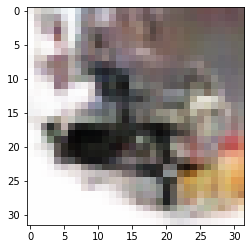

-> Epoch 205, Batch numero 1/78 -> Disc. loss on real images: 0.44406, Disc. loss on fake images: 0.47032, Generator loss: 1.83161
-> Epoch 205, Batch numero 2/78 -> Disc. loss on real images: 0.47399, Disc. loss on fake images: 0.44107, Generator loss: 1.88627
-> Epoch 205, Batch numero 3/78 -> Disc. loss on real images: 0.50084, Disc. loss on fake images: 0.44545, Generator loss: 2.02143
-> Epoch 205, Batch numero 4/78 -> Disc. loss on real images: 0.45999, Disc. loss on fake images: 0.31311, Generator loss: 1.59938
-> Epoch 205, Batch numero 5/78 -> Disc. loss on real images: 0.36202, Disc. loss on fake images: 0.56493, Generator loss: 1.69659
-> Epoch 205, Batch numero 6/78 -> Disc. loss on real images: 0.43331, Disc. loss on fake images: 0.40839, Generator loss: 1.69792
-> Epoch 205, Batch numero 7/78 -> Disc. loss on real images: 0.33112, Disc. loss on fake images: 0.46262, Generator loss: 1.66412
-> Epoch 205, Batch numero 8/78 -> Disc. loss on real images: 0.42843, Disc. loss o

-> Epoch 205, Batch numero 65/78 -> Disc. loss on real images: 0.37192, Disc. loss on fake images: 0.41465, Generator loss: 1.70820
-> Epoch 205, Batch numero 66/78 -> Disc. loss on real images: 0.36508, Disc. loss on fake images: 0.50427, Generator loss: 1.79860
-> Epoch 205, Batch numero 67/78 -> Disc. loss on real images: 0.44376, Disc. loss on fake images: 0.35694, Generator loss: 1.51886
-> Epoch 205, Batch numero 68/78 -> Disc. loss on real images: 0.37549, Disc. loss on fake images: 0.37288, Generator loss: 1.75824
-> Epoch 205, Batch numero 69/78 -> Disc. loss on real images: 0.33561, Disc. loss on fake images: 0.33732, Generator loss: 1.55932
-> Epoch 205, Batch numero 70/78 -> Disc. loss on real images: 0.35052, Disc. loss on fake images: 0.41221, Generator loss: 1.69784
-> Epoch 205, Batch numero 71/78 -> Disc. loss on real images: 0.47495, Disc. loss on fake images: 0.41825, Generator loss: 1.71318
-> Epoch 205, Batch numero 72/78 -> Disc. loss on real images: 0.42387, Disc

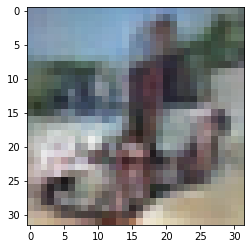

-> Epoch 206, Batch numero 1/78 -> Disc. loss on real images: 0.36692, Disc. loss on fake images: 1.33574, Generator loss: 1.63443
-> Epoch 206, Batch numero 2/78 -> Disc. loss on real images: 0.56949, Disc. loss on fake images: 0.77933, Generator loss: 1.87481
-> Epoch 206, Batch numero 3/78 -> Disc. loss on real images: 0.65109, Disc. loss on fake images: 0.33774, Generator loss: 2.02841
-> Epoch 206, Batch numero 4/78 -> Disc. loss on real images: 0.45087, Disc. loss on fake images: 0.29238, Generator loss: 1.69669
-> Epoch 206, Batch numero 5/78 -> Disc. loss on real images: 0.60912, Disc. loss on fake images: 0.63251, Generator loss: 1.65841
-> Epoch 206, Batch numero 6/78 -> Disc. loss on real images: 0.62405, Disc. loss on fake images: 0.35092, Generator loss: 1.93307
-> Epoch 206, Batch numero 7/78 -> Disc. loss on real images: 0.51391, Disc. loss on fake images: 0.42796, Generator loss: 1.84924
-> Epoch 206, Batch numero 8/78 -> Disc. loss on real images: 0.54358, Disc. loss o

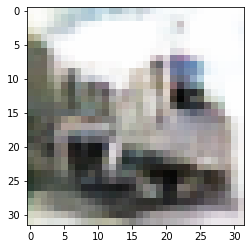

-> Epoch 207, Batch numero 1/78 -> Disc. loss on real images: 0.45300, Disc. loss on fake images: 0.49196, Generator loss: 1.53500
-> Epoch 207, Batch numero 2/78 -> Disc. loss on real images: 0.39343, Disc. loss on fake images: 0.48836, Generator loss: 1.90997
-> Epoch 207, Batch numero 3/78 -> Disc. loss on real images: 0.43607, Disc. loss on fake images: 0.32599, Generator loss: 1.67450
-> Epoch 207, Batch numero 4/78 -> Disc. loss on real images: 0.42053, Disc. loss on fake images: 0.49693, Generator loss: 1.68009
-> Epoch 207, Batch numero 5/78 -> Disc. loss on real images: 0.28584, Disc. loss on fake images: 0.43671, Generator loss: 1.81650
-> Epoch 207, Batch numero 6/78 -> Disc. loss on real images: 0.46657, Disc. loss on fake images: 0.39598, Generator loss: 1.75180
-> Epoch 207, Batch numero 7/78 -> Disc. loss on real images: 0.57174, Disc. loss on fake images: 0.36446, Generator loss: 1.58554
-> Epoch 207, Batch numero 8/78 -> Disc. loss on real images: 0.42777, Disc. loss o

-> Epoch 207, Batch numero 64/78 -> Disc. loss on real images: 0.48824, Disc. loss on fake images: 0.50930, Generator loss: 1.73617
-> Epoch 207, Batch numero 65/78 -> Disc. loss on real images: 0.48462, Disc. loss on fake images: 0.58397, Generator loss: 1.62074
-> Epoch 207, Batch numero 66/78 -> Disc. loss on real images: 0.51680, Disc. loss on fake images: 0.41473, Generator loss: 1.77264
-> Epoch 207, Batch numero 67/78 -> Disc. loss on real images: 0.42476, Disc. loss on fake images: 0.53812, Generator loss: 1.73370
-> Epoch 207, Batch numero 68/78 -> Disc. loss on real images: 0.58306, Disc. loss on fake images: 0.39916, Generator loss: 1.79635
-> Epoch 207, Batch numero 69/78 -> Disc. loss on real images: 0.33985, Disc. loss on fake images: 0.57535, Generator loss: 1.76698
-> Epoch 207, Batch numero 70/78 -> Disc. loss on real images: 0.57302, Disc. loss on fake images: 0.44129, Generator loss: 1.83258
-> Epoch 207, Batch numero 71/78 -> Disc. loss on real images: 0.47806, Disc

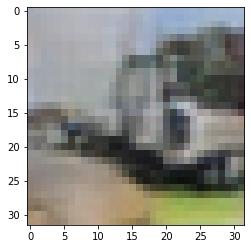

-> Epoch 208, Batch numero 1/78 -> Disc. loss on real images: 0.48192, Disc. loss on fake images: 0.32042, Generator loss: 1.33437
-> Epoch 208, Batch numero 2/78 -> Disc. loss on real images: 0.38885, Disc. loss on fake images: 0.73574, Generator loss: 1.55658
-> Epoch 208, Batch numero 3/78 -> Disc. loss on real images: 0.33324, Disc. loss on fake images: 0.45282, Generator loss: 1.59279
-> Epoch 208, Batch numero 4/78 -> Disc. loss on real images: 0.52827, Disc. loss on fake images: 0.46562, Generator loss: 1.54229
-> Epoch 208, Batch numero 5/78 -> Disc. loss on real images: 0.62885, Disc. loss on fake images: 0.45195, Generator loss: 1.56910
-> Epoch 208, Batch numero 6/78 -> Disc. loss on real images: 0.37262, Disc. loss on fake images: 0.46131, Generator loss: 1.74339
-> Epoch 208, Batch numero 7/78 -> Disc. loss on real images: 0.35843, Disc. loss on fake images: 0.66853, Generator loss: 1.70354
-> Epoch 208, Batch numero 8/78 -> Disc. loss on real images: 0.38463, Disc. loss o

-> Epoch 208, Batch numero 64/78 -> Disc. loss on real images: 0.46859, Disc. loss on fake images: 0.22667, Generator loss: 1.62599
-> Epoch 208, Batch numero 65/78 -> Disc. loss on real images: 0.52275, Disc. loss on fake images: 0.68480, Generator loss: 1.64858
-> Epoch 208, Batch numero 66/78 -> Disc. loss on real images: 0.43309, Disc. loss on fake images: 0.47645, Generator loss: 1.67073
-> Epoch 208, Batch numero 67/78 -> Disc. loss on real images: 0.54280, Disc. loss on fake images: 0.54863, Generator loss: 1.83981
-> Epoch 208, Batch numero 68/78 -> Disc. loss on real images: 0.47246, Disc. loss on fake images: 0.48974, Generator loss: 1.68757
-> Epoch 208, Batch numero 69/78 -> Disc. loss on real images: 0.46293, Disc. loss on fake images: 0.42165, Generator loss: 1.64629
-> Epoch 208, Batch numero 70/78 -> Disc. loss on real images: 0.41569, Disc. loss on fake images: 0.37169, Generator loss: 1.65604
-> Epoch 208, Batch numero 71/78 -> Disc. loss on real images: 0.48018, Disc

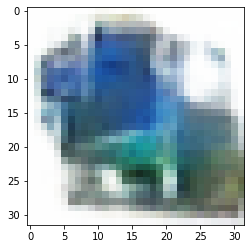

-> Epoch 209, Batch numero 1/78 -> Disc. loss on real images: 0.43289, Disc. loss on fake images: 0.48810, Generator loss: 1.70602
-> Epoch 209, Batch numero 2/78 -> Disc. loss on real images: 0.32708, Disc. loss on fake images: 0.45298, Generator loss: 1.82393
-> Epoch 209, Batch numero 3/78 -> Disc. loss on real images: 0.30350, Disc. loss on fake images: 0.33453, Generator loss: 1.88774
-> Epoch 209, Batch numero 4/78 -> Disc. loss on real images: 0.46822, Disc. loss on fake images: 0.39699, Generator loss: 1.97631
-> Epoch 209, Batch numero 5/78 -> Disc. loss on real images: 0.38485, Disc. loss on fake images: 0.52384, Generator loss: 1.81851
-> Epoch 209, Batch numero 6/78 -> Disc. loss on real images: 0.81840, Disc. loss on fake images: 0.52346, Generator loss: 1.39055
-> Epoch 209, Batch numero 7/78 -> Disc. loss on real images: 0.37675, Disc. loss on fake images: 0.51585, Generator loss: 1.60145
-> Epoch 209, Batch numero 8/78 -> Disc. loss on real images: 0.39381, Disc. loss o

-> Epoch 209, Batch numero 65/78 -> Disc. loss on real images: 0.39323, Disc. loss on fake images: 0.63659, Generator loss: 1.90481
-> Epoch 209, Batch numero 66/78 -> Disc. loss on real images: 0.40910, Disc. loss on fake images: 0.26473, Generator loss: 1.81710
-> Epoch 209, Batch numero 67/78 -> Disc. loss on real images: 0.52883, Disc. loss on fake images: 0.51750, Generator loss: 1.72958
-> Epoch 209, Batch numero 68/78 -> Disc. loss on real images: 0.49916, Disc. loss on fake images: 0.49466, Generator loss: 1.75568
-> Epoch 209, Batch numero 69/78 -> Disc. loss on real images: 0.41506, Disc. loss on fake images: 0.45726, Generator loss: 1.81485
-> Epoch 209, Batch numero 70/78 -> Disc. loss on real images: 0.39988, Disc. loss on fake images: 0.35301, Generator loss: 1.96099
-> Epoch 209, Batch numero 71/78 -> Disc. loss on real images: 0.47245, Disc. loss on fake images: 0.39930, Generator loss: 1.90026
-> Epoch 209, Batch numero 72/78 -> Disc. loss on real images: 0.49027, Disc

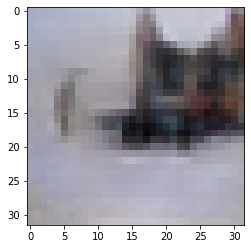

-> Epoch 210, Batch numero 1/78 -> Disc. loss on real images: 0.55572, Disc. loss on fake images: 0.42465, Generator loss: 1.85568
-> Epoch 210, Batch numero 2/78 -> Disc. loss on real images: 0.59942, Disc. loss on fake images: 0.37660, Generator loss: 1.61936
-> Epoch 210, Batch numero 3/78 -> Disc. loss on real images: 0.46296, Disc. loss on fake images: 0.37550, Generator loss: 1.55875
-> Epoch 210, Batch numero 4/78 -> Disc. loss on real images: 0.38378, Disc. loss on fake images: 0.50842, Generator loss: 1.42019
-> Epoch 210, Batch numero 5/78 -> Disc. loss on real images: 0.29863, Disc. loss on fake images: 0.38955, Generator loss: 1.75500
-> Epoch 210, Batch numero 6/78 -> Disc. loss on real images: 0.39320, Disc. loss on fake images: 0.45457, Generator loss: 1.83455
-> Epoch 210, Batch numero 7/78 -> Disc. loss on real images: 0.41009, Disc. loss on fake images: 0.55039, Generator loss: 1.80338
-> Epoch 210, Batch numero 8/78 -> Disc. loss on real images: 0.51718, Disc. loss o

-> Epoch 210, Batch numero 65/78 -> Disc. loss on real images: 0.24914, Disc. loss on fake images: 0.50664, Generator loss: 1.73415
-> Epoch 210, Batch numero 66/78 -> Disc. loss on real images: 0.51395, Disc. loss on fake images: 0.44324, Generator loss: 1.71366
-> Epoch 210, Batch numero 67/78 -> Disc. loss on real images: 0.64145, Disc. loss on fake images: 0.31992, Generator loss: 1.72531
-> Epoch 210, Batch numero 68/78 -> Disc. loss on real images: 0.34219, Disc. loss on fake images: 0.39605, Generator loss: 1.59616
-> Epoch 210, Batch numero 69/78 -> Disc. loss on real images: 0.42525, Disc. loss on fake images: 0.50724, Generator loss: 1.64974
-> Epoch 210, Batch numero 70/78 -> Disc. loss on real images: 0.53076, Disc. loss on fake images: 0.30745, Generator loss: 1.57181
-> Epoch 210, Batch numero 71/78 -> Disc. loss on real images: 0.33211, Disc. loss on fake images: 0.60086, Generator loss: 1.55625
-> Epoch 210, Batch numero 72/78 -> Disc. loss on real images: 0.38390, Disc

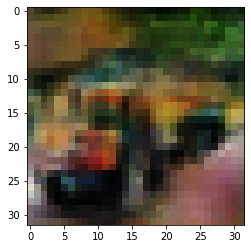

-> Epoch 211, Batch numero 1/78 -> Disc. loss on real images: 0.53968, Disc. loss on fake images: 0.44906, Generator loss: 1.68533
-> Epoch 211, Batch numero 2/78 -> Disc. loss on real images: 0.46260, Disc. loss on fake images: 0.50971, Generator loss: 1.48210
-> Epoch 211, Batch numero 3/78 -> Disc. loss on real images: 0.34417, Disc. loss on fake images: 0.45972, Generator loss: 1.89009
-> Epoch 211, Batch numero 4/78 -> Disc. loss on real images: 0.41220, Disc. loss on fake images: 0.40688, Generator loss: 1.96357
-> Epoch 211, Batch numero 5/78 -> Disc. loss on real images: 0.52131, Disc. loss on fake images: 0.39947, Generator loss: 1.70363
-> Epoch 211, Batch numero 6/78 -> Disc. loss on real images: 0.34543, Disc. loss on fake images: 0.51155, Generator loss: 1.73958
-> Epoch 211, Batch numero 7/78 -> Disc. loss on real images: 0.48218, Disc. loss on fake images: 0.38733, Generator loss: 1.57209
-> Epoch 211, Batch numero 8/78 -> Disc. loss on real images: 0.46942, Disc. loss o

-> Epoch 211, Batch numero 65/78 -> Disc. loss on real images: 0.49390, Disc. loss on fake images: 0.39393, Generator loss: 1.71265
-> Epoch 211, Batch numero 66/78 -> Disc. loss on real images: 0.45961, Disc. loss on fake images: 0.43824, Generator loss: 1.64376
-> Epoch 211, Batch numero 67/78 -> Disc. loss on real images: 0.69529, Disc. loss on fake images: 0.45900, Generator loss: 1.41767
-> Epoch 211, Batch numero 68/78 -> Disc. loss on real images: 0.35386, Disc. loss on fake images: 0.42110, Generator loss: 1.41011
-> Epoch 211, Batch numero 69/78 -> Disc. loss on real images: 0.33177, Disc. loss on fake images: 0.49433, Generator loss: 1.80210
-> Epoch 211, Batch numero 70/78 -> Disc. loss on real images: 0.40840, Disc. loss on fake images: 0.36025, Generator loss: 1.83696
-> Epoch 211, Batch numero 71/78 -> Disc. loss on real images: 0.50144, Disc. loss on fake images: 0.38641, Generator loss: 1.56612
-> Epoch 211, Batch numero 72/78 -> Disc. loss on real images: 0.40625, Disc

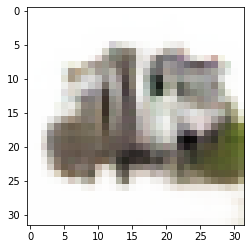

-> Epoch 212, Batch numero 1/78 -> Disc. loss on real images: 0.34723, Disc. loss on fake images: 0.68267, Generator loss: 1.70037
-> Epoch 212, Batch numero 2/78 -> Disc. loss on real images: 0.49396, Disc. loss on fake images: 0.41189, Generator loss: 2.11901
-> Epoch 212, Batch numero 3/78 -> Disc. loss on real images: 0.62529, Disc. loss on fake images: 0.28807, Generator loss: 1.93864
-> Epoch 212, Batch numero 4/78 -> Disc. loss on real images: 0.27968, Disc. loss on fake images: 0.37251, Generator loss: 1.76535
-> Epoch 212, Batch numero 5/78 -> Disc. loss on real images: 0.35147, Disc. loss on fake images: 0.48954, Generator loss: 1.88144
-> Epoch 212, Batch numero 6/78 -> Disc. loss on real images: 0.57154, Disc. loss on fake images: 0.40324, Generator loss: 1.60315
-> Epoch 212, Batch numero 7/78 -> Disc. loss on real images: 0.31687, Disc. loss on fake images: 0.58077, Generator loss: 1.68257
-> Epoch 212, Batch numero 8/78 -> Disc. loss on real images: 0.46776, Disc. loss o

-> Epoch 212, Batch numero 66/78 -> Disc. loss on real images: 0.41288, Disc. loss on fake images: 0.48877, Generator loss: 1.70111
-> Epoch 212, Batch numero 67/78 -> Disc. loss on real images: 0.37037, Disc. loss on fake images: 0.40622, Generator loss: 1.76174
-> Epoch 212, Batch numero 68/78 -> Disc. loss on real images: 0.49627, Disc. loss on fake images: 0.33030, Generator loss: 1.52606
-> Epoch 212, Batch numero 69/78 -> Disc. loss on real images: 0.35450, Disc. loss on fake images: 0.44857, Generator loss: 1.64573
-> Epoch 212, Batch numero 70/78 -> Disc. loss on real images: 0.31713, Disc. loss on fake images: 0.54266, Generator loss: 1.74765
-> Epoch 212, Batch numero 71/78 -> Disc. loss on real images: 0.47749, Disc. loss on fake images: 0.31714, Generator loss: 1.93853
-> Epoch 212, Batch numero 72/78 -> Disc. loss on real images: 0.47137, Disc. loss on fake images: 0.40176, Generator loss: 1.58221
-> Epoch 212, Batch numero 73/78 -> Disc. loss on real images: 0.48699, Disc

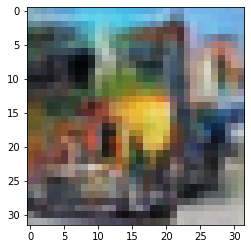

-> Epoch 213, Batch numero 1/78 -> Disc. loss on real images: 0.48322, Disc. loss on fake images: 0.43343, Generator loss: 1.42638
-> Epoch 213, Batch numero 2/78 -> Disc. loss on real images: 0.34433, Disc. loss on fake images: 0.46784, Generator loss: 1.71416
-> Epoch 213, Batch numero 3/78 -> Disc. loss on real images: 0.38777, Disc. loss on fake images: 0.38510, Generator loss: 1.72606
-> Epoch 213, Batch numero 4/78 -> Disc. loss on real images: 0.46911, Disc. loss on fake images: 0.37888, Generator loss: 1.44959
-> Epoch 213, Batch numero 5/78 -> Disc. loss on real images: 0.39351, Disc. loss on fake images: 0.47013, Generator loss: 1.61669
-> Epoch 213, Batch numero 6/78 -> Disc. loss on real images: 0.27859, Disc. loss on fake images: 0.33733, Generator loss: 1.72333
-> Epoch 213, Batch numero 7/78 -> Disc. loss on real images: 0.43642, Disc. loss on fake images: 0.51832, Generator loss: 1.62224
-> Epoch 213, Batch numero 8/78 -> Disc. loss on real images: 0.59243, Disc. loss o

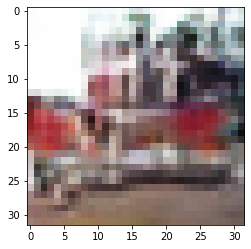

-> Epoch 214, Batch numero 1/78 -> Disc. loss on real images: 0.32019, Disc. loss on fake images: 0.37981, Generator loss: 1.85675
-> Epoch 214, Batch numero 2/78 -> Disc. loss on real images: 0.40389, Disc. loss on fake images: 0.37154, Generator loss: 1.48465
-> Epoch 214, Batch numero 3/78 -> Disc. loss on real images: 0.44504, Disc. loss on fake images: 0.48995, Generator loss: 1.70048
-> Epoch 214, Batch numero 4/78 -> Disc. loss on real images: 0.39291, Disc. loss on fake images: 0.58778, Generator loss: 1.79218
-> Epoch 214, Batch numero 5/78 -> Disc. loss on real images: 0.36254, Disc. loss on fake images: 0.40207, Generator loss: 2.33835
-> Epoch 214, Batch numero 6/78 -> Disc. loss on real images: 0.74451, Disc. loss on fake images: 0.50055, Generator loss: 1.85627
-> Epoch 214, Batch numero 7/78 -> Disc. loss on real images: 0.38046, Disc. loss on fake images: 0.32501, Generator loss: 2.01706
-> Epoch 214, Batch numero 8/78 -> Disc. loss on real images: 0.51846, Disc. loss o

-> Epoch 214, Batch numero 66/78 -> Disc. loss on real images: 0.46183, Disc. loss on fake images: 0.39566, Generator loss: 2.05331
-> Epoch 214, Batch numero 67/78 -> Disc. loss on real images: 0.46126, Disc. loss on fake images: 0.36040, Generator loss: 1.78570
-> Epoch 214, Batch numero 68/78 -> Disc. loss on real images: 0.48011, Disc. loss on fake images: 0.48036, Generator loss: 1.69138
-> Epoch 214, Batch numero 69/78 -> Disc. loss on real images: 0.52507, Disc. loss on fake images: 0.47534, Generator loss: 1.65350
-> Epoch 214, Batch numero 70/78 -> Disc. loss on real images: 0.40550, Disc. loss on fake images: 0.44106, Generator loss: 1.93579
-> Epoch 214, Batch numero 71/78 -> Disc. loss on real images: 0.50768, Disc. loss on fake images: 0.48723, Generator loss: 1.58520
-> Epoch 214, Batch numero 72/78 -> Disc. loss on real images: 0.48914, Disc. loss on fake images: 0.55247, Generator loss: 1.68347
-> Epoch 214, Batch numero 73/78 -> Disc. loss on real images: 0.55661, Disc

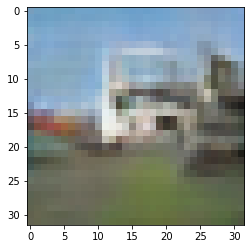

-> Epoch 215, Batch numero 1/78 -> Disc. loss on real images: 0.42194, Disc. loss on fake images: 0.37068, Generator loss: 1.85128
-> Epoch 215, Batch numero 2/78 -> Disc. loss on real images: 0.60016, Disc. loss on fake images: 0.34441, Generator loss: 1.76305
-> Epoch 215, Batch numero 3/78 -> Disc. loss on real images: 0.51435, Disc. loss on fake images: 0.39528, Generator loss: 1.53933
-> Epoch 215, Batch numero 4/78 -> Disc. loss on real images: 0.38515, Disc. loss on fake images: 0.52694, Generator loss: 1.44628
-> Epoch 215, Batch numero 5/78 -> Disc. loss on real images: 0.42917, Disc. loss on fake images: 0.59897, Generator loss: 1.61130
-> Epoch 215, Batch numero 6/78 -> Disc. loss on real images: 0.35250, Disc. loss on fake images: 0.43194, Generator loss: 2.06849
-> Epoch 215, Batch numero 7/78 -> Disc. loss on real images: 0.33578, Disc. loss on fake images: 0.42706, Generator loss: 2.15215
-> Epoch 215, Batch numero 8/78 -> Disc. loss on real images: 0.77480, Disc. loss o

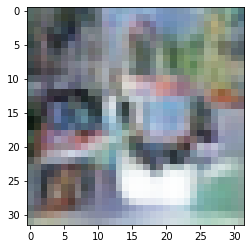

-> Epoch 216, Batch numero 1/78 -> Disc. loss on real images: 0.40967, Disc. loss on fake images: 0.51785, Generator loss: 1.42369
-> Epoch 216, Batch numero 2/78 -> Disc. loss on real images: 0.44337, Disc. loss on fake images: 0.45584, Generator loss: 1.68605
-> Epoch 216, Batch numero 3/78 -> Disc. loss on real images: 0.52544, Disc. loss on fake images: 0.57655, Generator loss: 1.64033
-> Epoch 216, Batch numero 4/78 -> Disc. loss on real images: 0.33094, Disc. loss on fake images: 0.33535, Generator loss: 1.70732
-> Epoch 216, Batch numero 5/78 -> Disc. loss on real images: 0.51598, Disc. loss on fake images: 0.41822, Generator loss: 1.97967
-> Epoch 216, Batch numero 6/78 -> Disc. loss on real images: 0.38668, Disc. loss on fake images: 0.58125, Generator loss: 2.15295
-> Epoch 216, Batch numero 7/78 -> Disc. loss on real images: 0.35037, Disc. loss on fake images: 0.30527, Generator loss: 1.69106
-> Epoch 216, Batch numero 8/78 -> Disc. loss on real images: 0.33114, Disc. loss o

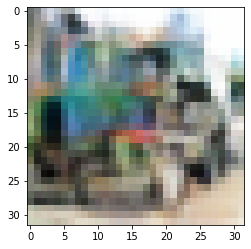

-> Epoch 217, Batch numero 1/78 -> Disc. loss on real images: 0.46127, Disc. loss on fake images: 0.26856, Generator loss: 1.89640
-> Epoch 217, Batch numero 2/78 -> Disc. loss on real images: 0.37246, Disc. loss on fake images: 0.47236, Generator loss: 1.74018
-> Epoch 217, Batch numero 3/78 -> Disc. loss on real images: 0.40338, Disc. loss on fake images: 0.41507, Generator loss: 1.70776
-> Epoch 217, Batch numero 4/78 -> Disc. loss on real images: 0.35615, Disc. loss on fake images: 0.34678, Generator loss: 1.72244
-> Epoch 217, Batch numero 5/78 -> Disc. loss on real images: 0.42869, Disc. loss on fake images: 0.37533, Generator loss: 1.85741
-> Epoch 217, Batch numero 6/78 -> Disc. loss on real images: 0.38053, Disc. loss on fake images: 0.52791, Generator loss: 1.43382
-> Epoch 217, Batch numero 7/78 -> Disc. loss on real images: 0.43540, Disc. loss on fake images: 0.37843, Generator loss: 1.86038
-> Epoch 217, Batch numero 8/78 -> Disc. loss on real images: 0.33750, Disc. loss o

-> Epoch 217, Batch numero 64/78 -> Disc. loss on real images: 0.33474, Disc. loss on fake images: 0.32458, Generator loss: 1.63293
-> Epoch 217, Batch numero 65/78 -> Disc. loss on real images: 0.24248, Disc. loss on fake images: 0.50315, Generator loss: 1.86325
-> Epoch 217, Batch numero 66/78 -> Disc. loss on real images: 0.49357, Disc. loss on fake images: 0.29789, Generator loss: 1.88690
-> Epoch 217, Batch numero 67/78 -> Disc. loss on real images: 0.39784, Disc. loss on fake images: 0.40685, Generator loss: 1.80949
-> Epoch 217, Batch numero 68/78 -> Disc. loss on real images: 0.46139, Disc. loss on fake images: 0.46072, Generator loss: 1.59691
-> Epoch 217, Batch numero 69/78 -> Disc. loss on real images: 0.52208, Disc. loss on fake images: 0.54100, Generator loss: 1.79326
-> Epoch 217, Batch numero 70/78 -> Disc. loss on real images: 0.34887, Disc. loss on fake images: 0.33514, Generator loss: 1.78091
-> Epoch 217, Batch numero 71/78 -> Disc. loss on real images: 0.33508, Disc

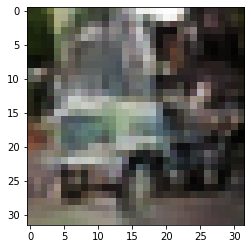

-> Epoch 218, Batch numero 1/78 -> Disc. loss on real images: 0.41033, Disc. loss on fake images: 0.39576, Generator loss: 2.08455
-> Epoch 218, Batch numero 2/78 -> Disc. loss on real images: 0.57037, Disc. loss on fake images: 0.30782, Generator loss: 1.99393
-> Epoch 218, Batch numero 3/78 -> Disc. loss on real images: 0.36073, Disc. loss on fake images: 0.30143, Generator loss: 1.70515
-> Epoch 218, Batch numero 4/78 -> Disc. loss on real images: 0.36159, Disc. loss on fake images: 0.49159, Generator loss: 1.97998
-> Epoch 218, Batch numero 5/78 -> Disc. loss on real images: 0.47312, Disc. loss on fake images: 0.46872, Generator loss: 1.98356
-> Epoch 218, Batch numero 6/78 -> Disc. loss on real images: 0.38891, Disc. loss on fake images: 0.51316, Generator loss: 1.89737
-> Epoch 218, Batch numero 7/78 -> Disc. loss on real images: 0.50113, Disc. loss on fake images: 0.43880, Generator loss: 2.16016
-> Epoch 218, Batch numero 8/78 -> Disc. loss on real images: 0.49743, Disc. loss o

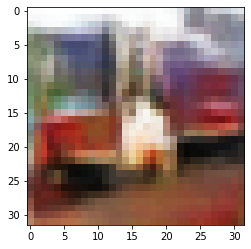

-> Epoch 219, Batch numero 1/78 -> Disc. loss on real images: 0.55842, Disc. loss on fake images: 0.38885, Generator loss: 1.92147
-> Epoch 219, Batch numero 2/78 -> Disc. loss on real images: 0.48201, Disc. loss on fake images: 0.28453, Generator loss: 1.89649
-> Epoch 219, Batch numero 3/78 -> Disc. loss on real images: 0.29377, Disc. loss on fake images: 0.42985, Generator loss: 1.78297
-> Epoch 219, Batch numero 4/78 -> Disc. loss on real images: 0.34582, Disc. loss on fake images: 0.55048, Generator loss: 2.03488
-> Epoch 219, Batch numero 5/78 -> Disc. loss on real images: 0.43234, Disc. loss on fake images: 0.36185, Generator loss: 1.96524
-> Epoch 219, Batch numero 6/78 -> Disc. loss on real images: 0.50624, Disc. loss on fake images: 0.35959, Generator loss: 1.58430
-> Epoch 219, Batch numero 7/78 -> Disc. loss on real images: 0.37166, Disc. loss on fake images: 0.40141, Generator loss: 1.69034
-> Epoch 219, Batch numero 8/78 -> Disc. loss on real images: 0.24037, Disc. loss o

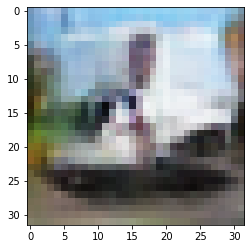

-> Epoch 220, Batch numero 1/78 -> Disc. loss on real images: 0.41852, Disc. loss on fake images: 0.33412, Generator loss: 1.75269
-> Epoch 220, Batch numero 2/78 -> Disc. loss on real images: 0.41258, Disc. loss on fake images: 0.52558, Generator loss: 1.95729
-> Epoch 220, Batch numero 3/78 -> Disc. loss on real images: 0.48490, Disc. loss on fake images: 0.63088, Generator loss: 1.90563
-> Epoch 220, Batch numero 4/78 -> Disc. loss on real images: 0.38859, Disc. loss on fake images: 0.22207, Generator loss: 1.93657
-> Epoch 220, Batch numero 5/78 -> Disc. loss on real images: 0.48608, Disc. loss on fake images: 0.34816, Generator loss: 1.78922
-> Epoch 220, Batch numero 6/78 -> Disc. loss on real images: 0.37894, Disc. loss on fake images: 0.44335, Generator loss: 1.67531
-> Epoch 220, Batch numero 7/78 -> Disc. loss on real images: 0.32647, Disc. loss on fake images: 0.48698, Generator loss: 1.88352
-> Epoch 220, Batch numero 8/78 -> Disc. loss on real images: 0.44737, Disc. loss o

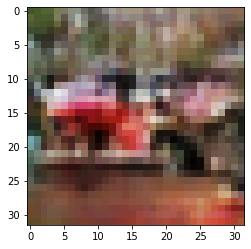

-> Epoch 221, Batch numero 1/78 -> Disc. loss on real images: 0.43097, Disc. loss on fake images: 0.31810, Generator loss: 1.53510
-> Epoch 221, Batch numero 2/78 -> Disc. loss on real images: 0.45461, Disc. loss on fake images: 0.68332, Generator loss: 1.84476
-> Epoch 221, Batch numero 3/78 -> Disc. loss on real images: 0.49445, Disc. loss on fake images: 0.36420, Generator loss: 1.73859
-> Epoch 221, Batch numero 4/78 -> Disc. loss on real images: 0.36005, Disc. loss on fake images: 0.48686, Generator loss: 1.80346
-> Epoch 221, Batch numero 5/78 -> Disc. loss on real images: 0.56012, Disc. loss on fake images: 0.61673, Generator loss: 1.69254
-> Epoch 221, Batch numero 6/78 -> Disc. loss on real images: 0.37707, Disc. loss on fake images: 0.34004, Generator loss: 1.69646
-> Epoch 221, Batch numero 7/78 -> Disc. loss on real images: 0.46719, Disc. loss on fake images: 0.50085, Generator loss: 1.70144
-> Epoch 221, Batch numero 8/78 -> Disc. loss on real images: 0.43628, Disc. loss o

-> Epoch 221, Batch numero 65/78 -> Disc. loss on real images: 0.37977, Disc. loss on fake images: 0.58985, Generator loss: 1.92431
-> Epoch 221, Batch numero 66/78 -> Disc. loss on real images: 0.43591, Disc. loss on fake images: 0.50093, Generator loss: 2.03911
-> Epoch 221, Batch numero 67/78 -> Disc. loss on real images: 0.48383, Disc. loss on fake images: 0.24933, Generator loss: 2.04106
-> Epoch 221, Batch numero 68/78 -> Disc. loss on real images: 0.42638, Disc. loss on fake images: 0.44338, Generator loss: 1.70979
-> Epoch 221, Batch numero 69/78 -> Disc. loss on real images: 0.44281, Disc. loss on fake images: 0.49306, Generator loss: 1.76119
-> Epoch 221, Batch numero 70/78 -> Disc. loss on real images: 0.36800, Disc. loss on fake images: 0.35448, Generator loss: 1.80874
-> Epoch 221, Batch numero 71/78 -> Disc. loss on real images: 0.43959, Disc. loss on fake images: 0.49363, Generator loss: 1.73205
-> Epoch 221, Batch numero 72/78 -> Disc. loss on real images: 0.44533, Disc

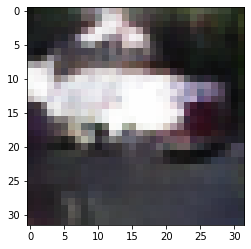

-> Epoch 222, Batch numero 1/78 -> Disc. loss on real images: 0.55830, Disc. loss on fake images: 0.46315, Generator loss: 1.79269
-> Epoch 222, Batch numero 2/78 -> Disc. loss on real images: 0.33581, Disc. loss on fake images: 0.46917, Generator loss: 2.08959
-> Epoch 222, Batch numero 3/78 -> Disc. loss on real images: 0.40872, Disc. loss on fake images: 0.27871, Generator loss: 2.01871
-> Epoch 222, Batch numero 4/78 -> Disc. loss on real images: 0.43137, Disc. loss on fake images: 0.42340, Generator loss: 1.73203
-> Epoch 222, Batch numero 5/78 -> Disc. loss on real images: 0.40943, Disc. loss on fake images: 0.54730, Generator loss: 1.94734
-> Epoch 222, Batch numero 6/78 -> Disc. loss on real images: 0.55272, Disc. loss on fake images: 0.32620, Generator loss: 1.91890
-> Epoch 222, Batch numero 7/78 -> Disc. loss on real images: 0.41997, Disc. loss on fake images: 0.39625, Generator loss: 1.92624
-> Epoch 222, Batch numero 8/78 -> Disc. loss on real images: 0.37035, Disc. loss o

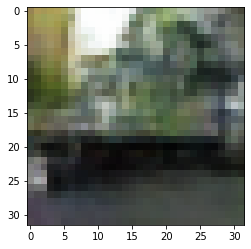

-> Epoch 223, Batch numero 1/78 -> Disc. loss on real images: 0.33616, Disc. loss on fake images: 0.37160, Generator loss: 1.84162
-> Epoch 223, Batch numero 2/78 -> Disc. loss on real images: 0.28952, Disc. loss on fake images: 0.41525, Generator loss: 1.89209
-> Epoch 223, Batch numero 3/78 -> Disc. loss on real images: 0.34622, Disc. loss on fake images: 0.43986, Generator loss: 1.89572
-> Epoch 223, Batch numero 4/78 -> Disc. loss on real images: 0.38820, Disc. loss on fake images: 0.41640, Generator loss: 1.88731
-> Epoch 223, Batch numero 5/78 -> Disc. loss on real images: 0.34784, Disc. loss on fake images: 0.22404, Generator loss: 1.75864
-> Epoch 223, Batch numero 6/78 -> Disc. loss on real images: 0.30777, Disc. loss on fake images: 0.48256, Generator loss: 1.81530
-> Epoch 223, Batch numero 7/78 -> Disc. loss on real images: 0.31576, Disc. loss on fake images: 0.48522, Generator loss: 1.66607
-> Epoch 223, Batch numero 8/78 -> Disc. loss on real images: 0.48853, Disc. loss o

-> Epoch 223, Batch numero 65/78 -> Disc. loss on real images: 0.56408, Disc. loss on fake images: 0.45331, Generator loss: 1.74193
-> Epoch 223, Batch numero 66/78 -> Disc. loss on real images: 0.43653, Disc. loss on fake images: 0.52717, Generator loss: 1.89916
-> Epoch 223, Batch numero 67/78 -> Disc. loss on real images: 0.34311, Disc. loss on fake images: 0.31588, Generator loss: 1.72058
-> Epoch 223, Batch numero 68/78 -> Disc. loss on real images: 0.48493, Disc. loss on fake images: 0.53105, Generator loss: 1.65700
-> Epoch 223, Batch numero 69/78 -> Disc. loss on real images: 0.54472, Disc. loss on fake images: 0.44102, Generator loss: 1.73151
-> Epoch 223, Batch numero 70/78 -> Disc. loss on real images: 0.42998, Disc. loss on fake images: 0.37023, Generator loss: 1.86138
-> Epoch 223, Batch numero 71/78 -> Disc. loss on real images: 0.26345, Disc. loss on fake images: 0.41564, Generator loss: 1.59551
-> Epoch 223, Batch numero 72/78 -> Disc. loss on real images: 0.39732, Disc

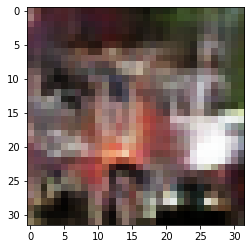

-> Epoch 224, Batch numero 1/78 -> Disc. loss on real images: 0.37127, Disc. loss on fake images: 0.42867, Generator loss: 1.62823
-> Epoch 224, Batch numero 2/78 -> Disc. loss on real images: 0.34717, Disc. loss on fake images: 0.43158, Generator loss: 1.96007
-> Epoch 224, Batch numero 3/78 -> Disc. loss on real images: 0.40566, Disc. loss on fake images: 0.44997, Generator loss: 1.78095
-> Epoch 224, Batch numero 4/78 -> Disc. loss on real images: 0.42946, Disc. loss on fake images: 0.37938, Generator loss: 2.30837
-> Epoch 224, Batch numero 5/78 -> Disc. loss on real images: 0.69123, Disc. loss on fake images: 0.56572, Generator loss: 1.68891
-> Epoch 224, Batch numero 6/78 -> Disc. loss on real images: 0.39394, Disc. loss on fake images: 0.52054, Generator loss: 1.96674
-> Epoch 224, Batch numero 7/78 -> Disc. loss on real images: 0.54731, Disc. loss on fake images: 0.32568, Generator loss: 1.93964
-> Epoch 224, Batch numero 8/78 -> Disc. loss on real images: 0.36476, Disc. loss o

-> Epoch 224, Batch numero 64/78 -> Disc. loss on real images: 0.32418, Disc. loss on fake images: 0.43455, Generator loss: 1.88233
-> Epoch 224, Batch numero 65/78 -> Disc. loss on real images: 0.32713, Disc. loss on fake images: 0.49878, Generator loss: 2.25902
-> Epoch 224, Batch numero 66/78 -> Disc. loss on real images: 0.53080, Disc. loss on fake images: 0.55270, Generator loss: 1.92714
-> Epoch 224, Batch numero 67/78 -> Disc. loss on real images: 0.45560, Disc. loss on fake images: 0.46705, Generator loss: 2.02879
-> Epoch 224, Batch numero 68/78 -> Disc. loss on real images: 0.47524, Disc. loss on fake images: 0.40272, Generator loss: 1.99282
-> Epoch 224, Batch numero 69/78 -> Disc. loss on real images: 0.43987, Disc. loss on fake images: 0.53341, Generator loss: 1.66736
-> Epoch 224, Batch numero 70/78 -> Disc. loss on real images: 0.47160, Disc. loss on fake images: 0.34510, Generator loss: 1.68848
-> Epoch 224, Batch numero 71/78 -> Disc. loss on real images: 0.29194, Disc

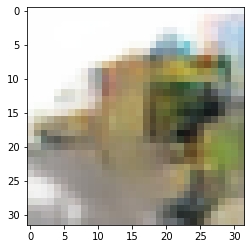

-> Epoch 225, Batch numero 1/78 -> Disc. loss on real images: 0.51611, Disc. loss on fake images: 0.40569, Generator loss: 2.13090
-> Epoch 225, Batch numero 2/78 -> Disc. loss on real images: 0.40633, Disc. loss on fake images: 0.32259, Generator loss: 1.75160
-> Epoch 225, Batch numero 3/78 -> Disc. loss on real images: 0.34387, Disc. loss on fake images: 0.37534, Generator loss: 2.09443
-> Epoch 225, Batch numero 4/78 -> Disc. loss on real images: 0.58382, Disc. loss on fake images: 0.57973, Generator loss: 2.13890
-> Epoch 225, Batch numero 5/78 -> Disc. loss on real images: 0.32906, Disc. loss on fake images: 0.36860, Generator loss: 2.04096
-> Epoch 225, Batch numero 6/78 -> Disc. loss on real images: 0.54132, Disc. loss on fake images: 0.33004, Generator loss: 1.83771
-> Epoch 225, Batch numero 7/78 -> Disc. loss on real images: 0.31560, Disc. loss on fake images: 0.33274, Generator loss: 1.61463
-> Epoch 225, Batch numero 8/78 -> Disc. loss on real images: 0.30316, Disc. loss o

-> Epoch 225, Batch numero 65/78 -> Disc. loss on real images: 0.43934, Disc. loss on fake images: 0.35623, Generator loss: 1.66182
-> Epoch 225, Batch numero 66/78 -> Disc. loss on real images: 0.31213, Disc. loss on fake images: 0.53842, Generator loss: 1.77598
-> Epoch 225, Batch numero 67/78 -> Disc. loss on real images: 0.45444, Disc. loss on fake images: 0.62614, Generator loss: 2.08393
-> Epoch 225, Batch numero 68/78 -> Disc. loss on real images: 0.47111, Disc. loss on fake images: 0.31734, Generator loss: 2.06491
-> Epoch 225, Batch numero 69/78 -> Disc. loss on real images: 0.48053, Disc. loss on fake images: 0.67090, Generator loss: 2.22277
-> Epoch 225, Batch numero 70/78 -> Disc. loss on real images: 0.46148, Disc. loss on fake images: 0.39810, Generator loss: 2.04484
-> Epoch 225, Batch numero 71/78 -> Disc. loss on real images: 0.47259, Disc. loss on fake images: 0.30756, Generator loss: 1.83059
-> Epoch 225, Batch numero 72/78 -> Disc. loss on real images: 0.38518, Disc

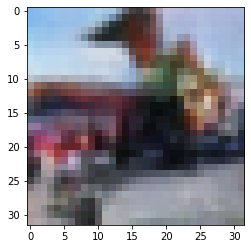

-> Epoch 226, Batch numero 1/78 -> Disc. loss on real images: 0.48999, Disc. loss on fake images: 0.51458, Generator loss: 1.56681
-> Epoch 226, Batch numero 2/78 -> Disc. loss on real images: 0.26942, Disc. loss on fake images: 0.26744, Generator loss: 1.92096
-> Epoch 226, Batch numero 3/78 -> Disc. loss on real images: 0.50954, Disc. loss on fake images: 0.45761, Generator loss: 1.93148
-> Epoch 226, Batch numero 4/78 -> Disc. loss on real images: 0.37940, Disc. loss on fake images: 0.49828, Generator loss: 1.87789
-> Epoch 226, Batch numero 5/78 -> Disc. loss on real images: 0.29882, Disc. loss on fake images: 0.20898, Generator loss: 1.99085
-> Epoch 226, Batch numero 6/78 -> Disc. loss on real images: 0.49872, Disc. loss on fake images: 0.47561, Generator loss: 1.87117
-> Epoch 226, Batch numero 7/78 -> Disc. loss on real images: 0.38179, Disc. loss on fake images: 0.48298, Generator loss: 1.93239
-> Epoch 226, Batch numero 8/78 -> Disc. loss on real images: 0.34230, Disc. loss o

-> Epoch 226, Batch numero 64/78 -> Disc. loss on real images: 0.39450, Disc. loss on fake images: 0.49314, Generator loss: 1.73917
-> Epoch 226, Batch numero 65/78 -> Disc. loss on real images: 0.37696, Disc. loss on fake images: 0.40922, Generator loss: 2.06529
-> Epoch 226, Batch numero 66/78 -> Disc. loss on real images: 0.41553, Disc. loss on fake images: 0.34733, Generator loss: 2.02523
-> Epoch 226, Batch numero 67/78 -> Disc. loss on real images: 0.38086, Disc. loss on fake images: 0.32157, Generator loss: 1.84322
-> Epoch 226, Batch numero 68/78 -> Disc. loss on real images: 0.40757, Disc. loss on fake images: 0.43148, Generator loss: 1.67571
-> Epoch 226, Batch numero 69/78 -> Disc. loss on real images: 0.36305, Disc. loss on fake images: 0.50624, Generator loss: 1.77577
-> Epoch 226, Batch numero 70/78 -> Disc. loss on real images: 0.28789, Disc. loss on fake images: 0.46634, Generator loss: 2.13448
-> Epoch 226, Batch numero 71/78 -> Disc. loss on real images: 0.55121, Disc

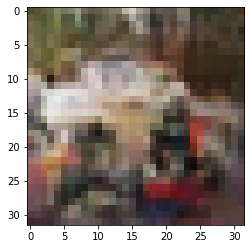

-> Epoch 227, Batch numero 1/78 -> Disc. loss on real images: 0.53079, Disc. loss on fake images: 0.36283, Generator loss: 1.87562
-> Epoch 227, Batch numero 2/78 -> Disc. loss on real images: 0.43682, Disc. loss on fake images: 0.52139, Generator loss: 1.95910
-> Epoch 227, Batch numero 3/78 -> Disc. loss on real images: 0.48219, Disc. loss on fake images: 0.26007, Generator loss: 1.64368
-> Epoch 227, Batch numero 4/78 -> Disc. loss on real images: 0.36873, Disc. loss on fake images: 0.44292, Generator loss: 1.82110
-> Epoch 227, Batch numero 5/78 -> Disc. loss on real images: 0.36193, Disc. loss on fake images: 0.65042, Generator loss: 1.94816
-> Epoch 227, Batch numero 6/78 -> Disc. loss on real images: 0.40077, Disc. loss on fake images: 0.28840, Generator loss: 2.21805
-> Epoch 227, Batch numero 7/78 -> Disc. loss on real images: 0.37666, Disc. loss on fake images: 0.34840, Generator loss: 1.72752
-> Epoch 227, Batch numero 8/78 -> Disc. loss on real images: 0.51336, Disc. loss o

-> Epoch 227, Batch numero 64/78 -> Disc. loss on real images: 0.41790, Disc. loss on fake images: 0.29383, Generator loss: 1.87564
-> Epoch 227, Batch numero 65/78 -> Disc. loss on real images: 0.51626, Disc. loss on fake images: 0.62238, Generator loss: 1.87379
-> Epoch 227, Batch numero 66/78 -> Disc. loss on real images: 0.39566, Disc. loss on fake images: 0.50692, Generator loss: 1.98610
-> Epoch 227, Batch numero 67/78 -> Disc. loss on real images: 0.38748, Disc. loss on fake images: 0.28595, Generator loss: 1.88603
-> Epoch 227, Batch numero 68/78 -> Disc. loss on real images: 0.51926, Disc. loss on fake images: 0.43406, Generator loss: 1.62018
-> Epoch 227, Batch numero 69/78 -> Disc. loss on real images: 0.31476, Disc. loss on fake images: 0.48436, Generator loss: 1.92788
-> Epoch 227, Batch numero 70/78 -> Disc. loss on real images: 0.29755, Disc. loss on fake images: 0.38432, Generator loss: 1.88651
-> Epoch 227, Batch numero 71/78 -> Disc. loss on real images: 0.33931, Disc

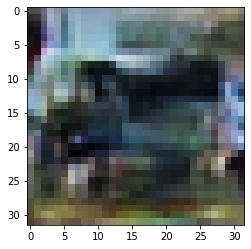

-> Epoch 228, Batch numero 1/78 -> Disc. loss on real images: 0.31507, Disc. loss on fake images: 0.34697, Generator loss: 1.90560
-> Epoch 228, Batch numero 2/78 -> Disc. loss on real images: 0.34317, Disc. loss on fake images: 0.48322, Generator loss: 2.04622
-> Epoch 228, Batch numero 3/78 -> Disc. loss on real images: 0.61109, Disc. loss on fake images: 0.39427, Generator loss: 1.91186
-> Epoch 228, Batch numero 4/78 -> Disc. loss on real images: 0.34536, Disc. loss on fake images: 0.34853, Generator loss: 1.97016
-> Epoch 228, Batch numero 5/78 -> Disc. loss on real images: 0.32500, Disc. loss on fake images: 0.40456, Generator loss: 1.89649
-> Epoch 228, Batch numero 6/78 -> Disc. loss on real images: 0.49105, Disc. loss on fake images: 0.33460, Generator loss: 1.69326
-> Epoch 228, Batch numero 7/78 -> Disc. loss on real images: 0.37175, Disc. loss on fake images: 0.41525, Generator loss: 1.76623
-> Epoch 228, Batch numero 8/78 -> Disc. loss on real images: 0.38921, Disc. loss o

-> Epoch 228, Batch numero 64/78 -> Disc. loss on real images: 0.57686, Disc. loss on fake images: 0.46096, Generator loss: 1.72679
-> Epoch 228, Batch numero 65/78 -> Disc. loss on real images: 0.36504, Disc. loss on fake images: 0.26983, Generator loss: 1.84971
-> Epoch 228, Batch numero 66/78 -> Disc. loss on real images: 0.38548, Disc. loss on fake images: 0.65905, Generator loss: 1.88491
-> Epoch 228, Batch numero 67/78 -> Disc. loss on real images: 0.42337, Disc. loss on fake images: 0.37214, Generator loss: 1.80250
-> Epoch 228, Batch numero 68/78 -> Disc. loss on real images: 0.46955, Disc. loss on fake images: 0.41824, Generator loss: 1.77356
-> Epoch 228, Batch numero 69/78 -> Disc. loss on real images: 0.36448, Disc. loss on fake images: 0.35663, Generator loss: 1.96827
-> Epoch 228, Batch numero 70/78 -> Disc. loss on real images: 0.48055, Disc. loss on fake images: 0.43412, Generator loss: 1.95472
-> Epoch 228, Batch numero 71/78 -> Disc. loss on real images: 0.50973, Disc

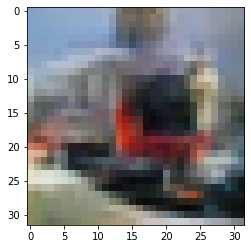

-> Epoch 229, Batch numero 1/78 -> Disc. loss on real images: 0.33724, Disc. loss on fake images: 0.42802, Generator loss: 1.65879
-> Epoch 229, Batch numero 2/78 -> Disc. loss on real images: 0.37170, Disc. loss on fake images: 0.44111, Generator loss: 1.83020
-> Epoch 229, Batch numero 3/78 -> Disc. loss on real images: 0.39677, Disc. loss on fake images: 0.35305, Generator loss: 1.92939
-> Epoch 229, Batch numero 4/78 -> Disc. loss on real images: 0.28585, Disc. loss on fake images: 0.43742, Generator loss: 1.96060
-> Epoch 229, Batch numero 5/78 -> Disc. loss on real images: 0.33289, Disc. loss on fake images: 0.42681, Generator loss: 2.22222
-> Epoch 229, Batch numero 6/78 -> Disc. loss on real images: 0.44428, Disc. loss on fake images: 0.44042, Generator loss: 2.22289
-> Epoch 229, Batch numero 7/78 -> Disc. loss on real images: 0.43592, Disc. loss on fake images: 0.34367, Generator loss: 2.05969
-> Epoch 229, Batch numero 8/78 -> Disc. loss on real images: 0.50562, Disc. loss o

-> Epoch 229, Batch numero 64/78 -> Disc. loss on real images: 0.38288, Disc. loss on fake images: 0.35591, Generator loss: 1.64270
-> Epoch 229, Batch numero 65/78 -> Disc. loss on real images: 0.31084, Disc. loss on fake images: 0.46127, Generator loss: 2.11437
-> Epoch 229, Batch numero 66/78 -> Disc. loss on real images: 0.38103, Disc. loss on fake images: 0.37996, Generator loss: 1.79373
-> Epoch 229, Batch numero 67/78 -> Disc. loss on real images: 0.45123, Disc. loss on fake images: 0.74448, Generator loss: 1.95434
-> Epoch 229, Batch numero 68/78 -> Disc. loss on real images: 0.48583, Disc. loss on fake images: 0.46690, Generator loss: 1.87052
-> Epoch 229, Batch numero 69/78 -> Disc. loss on real images: 0.51990, Disc. loss on fake images: 0.33636, Generator loss: 1.70136
-> Epoch 229, Batch numero 70/78 -> Disc. loss on real images: 0.50517, Disc. loss on fake images: 0.41654, Generator loss: 1.73112
-> Epoch 229, Batch numero 71/78 -> Disc. loss on real images: 0.24166, Disc

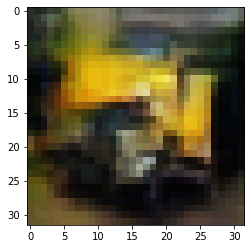

-> Epoch 230, Batch numero 1/78 -> Disc. loss on real images: 0.34846, Disc. loss on fake images: 0.50791, Generator loss: 1.71527
-> Epoch 230, Batch numero 2/78 -> Disc. loss on real images: 0.44397, Disc. loss on fake images: 0.43035, Generator loss: 1.70631
-> Epoch 230, Batch numero 3/78 -> Disc. loss on real images: 0.34418, Disc. loss on fake images: 0.35060, Generator loss: 1.71136
-> Epoch 230, Batch numero 4/78 -> Disc. loss on real images: 0.28349, Disc. loss on fake images: 0.41532, Generator loss: 1.92366
-> Epoch 230, Batch numero 5/78 -> Disc. loss on real images: 0.47405, Disc. loss on fake images: 0.40214, Generator loss: 1.90675
-> Epoch 230, Batch numero 6/78 -> Disc. loss on real images: 0.36711, Disc. loss on fake images: 0.28346, Generator loss: 1.72662
-> Epoch 230, Batch numero 7/78 -> Disc. loss on real images: 0.55987, Disc. loss on fake images: 0.46085, Generator loss: 1.71702
-> Epoch 230, Batch numero 8/78 -> Disc. loss on real images: 0.24541, Disc. loss o

-> Epoch 230, Batch numero 64/78 -> Disc. loss on real images: 0.33574, Disc. loss on fake images: 0.38975, Generator loss: 2.07209
-> Epoch 230, Batch numero 65/78 -> Disc. loss on real images: 0.54029, Disc. loss on fake images: 0.37925, Generator loss: 1.87898
-> Epoch 230, Batch numero 66/78 -> Disc. loss on real images: 0.42951, Disc. loss on fake images: 0.39114, Generator loss: 1.80146
-> Epoch 230, Batch numero 67/78 -> Disc. loss on real images: 0.51791, Disc. loss on fake images: 0.48260, Generator loss: 1.59109
-> Epoch 230, Batch numero 68/78 -> Disc. loss on real images: 0.29755, Disc. loss on fake images: 0.52408, Generator loss: 2.02215
-> Epoch 230, Batch numero 69/78 -> Disc. loss on real images: 0.68423, Disc. loss on fake images: 0.38016, Generator loss: 1.86526
-> Epoch 230, Batch numero 70/78 -> Disc. loss on real images: 0.22916, Disc. loss on fake images: 0.47308, Generator loss: 2.16598
-> Epoch 230, Batch numero 71/78 -> Disc. loss on real images: 0.45126, Disc

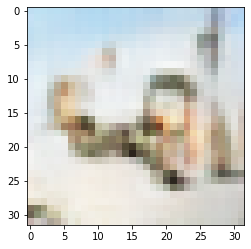

-> Epoch 231, Batch numero 1/78 -> Disc. loss on real images: 0.34791, Disc. loss on fake images: 0.42193, Generator loss: 2.02788
-> Epoch 231, Batch numero 2/78 -> Disc. loss on real images: 0.62797, Disc. loss on fake images: 0.41024, Generator loss: 1.75447
-> Epoch 231, Batch numero 3/78 -> Disc. loss on real images: 0.29146, Disc. loss on fake images: 0.29735, Generator loss: 1.62180
-> Epoch 231, Batch numero 4/78 -> Disc. loss on real images: 0.34359, Disc. loss on fake images: 0.34811, Generator loss: 1.76015
-> Epoch 231, Batch numero 5/78 -> Disc. loss on real images: 0.35648, Disc. loss on fake images: 0.39226, Generator loss: 1.66614
-> Epoch 231, Batch numero 6/78 -> Disc. loss on real images: 0.26619, Disc. loss on fake images: 0.30952, Generator loss: 2.10270
-> Epoch 231, Batch numero 7/78 -> Disc. loss on real images: 0.42461, Disc. loss on fake images: 0.46562, Generator loss: 1.82696
-> Epoch 231, Batch numero 8/78 -> Disc. loss on real images: 0.32964, Disc. loss o

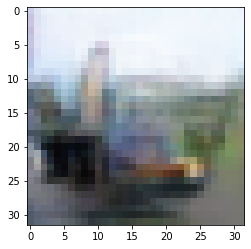

-> Epoch 232, Batch numero 1/78 -> Disc. loss on real images: 0.47137, Disc. loss on fake images: 0.25574, Generator loss: 1.85385
-> Epoch 232, Batch numero 2/78 -> Disc. loss on real images: 0.49387, Disc. loss on fake images: 0.29691, Generator loss: 1.67843
-> Epoch 232, Batch numero 3/78 -> Disc. loss on real images: 0.20375, Disc. loss on fake images: 0.30932, Generator loss: 1.73185
-> Epoch 232, Batch numero 4/78 -> Disc. loss on real images: 0.29555, Disc. loss on fake images: 0.38186, Generator loss: 1.97512
-> Epoch 232, Batch numero 5/78 -> Disc. loss on real images: 0.40495, Disc. loss on fake images: 0.46539, Generator loss: 2.09998
-> Epoch 232, Batch numero 6/78 -> Disc. loss on real images: 0.37883, Disc. loss on fake images: 0.35924, Generator loss: 2.18829
-> Epoch 232, Batch numero 7/78 -> Disc. loss on real images: 0.47198, Disc. loss on fake images: 0.35337, Generator loss: 1.76672
-> Epoch 232, Batch numero 8/78 -> Disc. loss on real images: 0.45816, Disc. loss o

-> Epoch 232, Batch numero 64/78 -> Disc. loss on real images: 0.43871, Disc. loss on fake images: 0.43373, Generator loss: 1.83212
-> Epoch 232, Batch numero 65/78 -> Disc. loss on real images: 0.30858, Disc. loss on fake images: 0.48489, Generator loss: 1.79607
-> Epoch 232, Batch numero 66/78 -> Disc. loss on real images: 0.58223, Disc. loss on fake images: 0.52508, Generator loss: 1.80428
-> Epoch 232, Batch numero 67/78 -> Disc. loss on real images: 0.46048, Disc. loss on fake images: 0.55938, Generator loss: 1.80453
-> Epoch 232, Batch numero 68/78 -> Disc. loss on real images: 0.41204, Disc. loss on fake images: 0.30574, Generator loss: 1.76463
-> Epoch 232, Batch numero 69/78 -> Disc. loss on real images: 0.36788, Disc. loss on fake images: 0.40764, Generator loss: 1.89205
-> Epoch 232, Batch numero 70/78 -> Disc. loss on real images: 0.39595, Disc. loss on fake images: 0.51137, Generator loss: 1.67142
-> Epoch 232, Batch numero 71/78 -> Disc. loss on real images: 0.29762, Disc

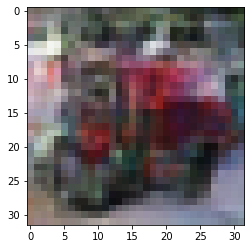

-> Epoch 233, Batch numero 1/78 -> Disc. loss on real images: 0.46647, Disc. loss on fake images: 0.32517, Generator loss: 2.05251
-> Epoch 233, Batch numero 2/78 -> Disc. loss on real images: 0.34285, Disc. loss on fake images: 0.27980, Generator loss: 2.07825
-> Epoch 233, Batch numero 3/78 -> Disc. loss on real images: 0.54106, Disc. loss on fake images: 0.34823, Generator loss: 1.69122
-> Epoch 233, Batch numero 4/78 -> Disc. loss on real images: 0.44671, Disc. loss on fake images: 0.43649, Generator loss: 1.81803
-> Epoch 233, Batch numero 5/78 -> Disc. loss on real images: 0.24705, Disc. loss on fake images: 0.39294, Generator loss: 2.19725
-> Epoch 233, Batch numero 6/78 -> Disc. loss on real images: 0.35079, Disc. loss on fake images: 0.38256, Generator loss: 2.32671
-> Epoch 233, Batch numero 7/78 -> Disc. loss on real images: 0.46907, Disc. loss on fake images: 0.31251, Generator loss: 1.80439
-> Epoch 233, Batch numero 8/78 -> Disc. loss on real images: 0.35869, Disc. loss o

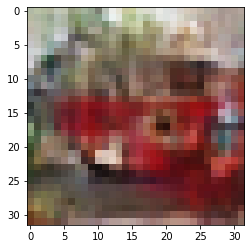

-> Epoch 234, Batch numero 1/78 -> Disc. loss on real images: 0.21592, Disc. loss on fake images: 0.50007, Generator loss: 2.26694
-> Epoch 234, Batch numero 2/78 -> Disc. loss on real images: 0.45570, Disc. loss on fake images: 0.37740, Generator loss: 2.17331
-> Epoch 234, Batch numero 3/78 -> Disc. loss on real images: 0.48297, Disc. loss on fake images: 0.25124, Generator loss: 2.10803
-> Epoch 234, Batch numero 4/78 -> Disc. loss on real images: 0.40176, Disc. loss on fake images: 0.28281, Generator loss: 1.81615
-> Epoch 234, Batch numero 5/78 -> Disc. loss on real images: 0.27309, Disc. loss on fake images: 0.47160, Generator loss: 1.84512
-> Epoch 234, Batch numero 6/78 -> Disc. loss on real images: 0.29792, Disc. loss on fake images: 0.34755, Generator loss: 1.96205
-> Epoch 234, Batch numero 7/78 -> Disc. loss on real images: 0.38099, Disc. loss on fake images: 0.50047, Generator loss: 2.34772
-> Epoch 234, Batch numero 8/78 -> Disc. loss on real images: 0.57284, Disc. loss o

-> Epoch 234, Batch numero 64/78 -> Disc. loss on real images: 0.29516, Disc. loss on fake images: 0.49358, Generator loss: 1.85535
-> Epoch 234, Batch numero 65/78 -> Disc. loss on real images: 0.34069, Disc. loss on fake images: 0.49851, Generator loss: 2.23366
-> Epoch 234, Batch numero 66/78 -> Disc. loss on real images: 0.32024, Disc. loss on fake images: 0.50131, Generator loss: 2.13280
-> Epoch 234, Batch numero 67/78 -> Disc. loss on real images: 0.63787, Disc. loss on fake images: 0.29807, Generator loss: 1.90304
-> Epoch 234, Batch numero 68/78 -> Disc. loss on real images: 0.43030, Disc. loss on fake images: 0.35495, Generator loss: 2.02797
-> Epoch 234, Batch numero 69/78 -> Disc. loss on real images: 0.33212, Disc. loss on fake images: 0.46404, Generator loss: 1.65704
-> Epoch 234, Batch numero 70/78 -> Disc. loss on real images: 0.28130, Disc. loss on fake images: 0.39258, Generator loss: 2.10323
-> Epoch 234, Batch numero 71/78 -> Disc. loss on real images: 0.32002, Disc

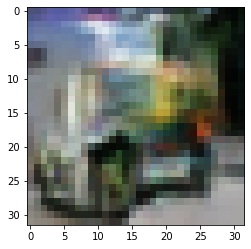

-> Epoch 235, Batch numero 1/78 -> Disc. loss on real images: 0.41884, Disc. loss on fake images: 0.53038, Generator loss: 1.92806
-> Epoch 235, Batch numero 2/78 -> Disc. loss on real images: 0.36267, Disc. loss on fake images: 0.34144, Generator loss: 1.88536
-> Epoch 235, Batch numero 3/78 -> Disc. loss on real images: 0.33354, Disc. loss on fake images: 0.35753, Generator loss: 1.81810
-> Epoch 235, Batch numero 4/78 -> Disc. loss on real images: 0.40721, Disc. loss on fake images: 0.58069, Generator loss: 2.06268
-> Epoch 235, Batch numero 5/78 -> Disc. loss on real images: 0.48506, Disc. loss on fake images: 0.30253, Generator loss: 1.87151
-> Epoch 235, Batch numero 6/78 -> Disc. loss on real images: 0.36205, Disc. loss on fake images: 0.34718, Generator loss: 1.88109
-> Epoch 235, Batch numero 7/78 -> Disc. loss on real images: 0.37823, Disc. loss on fake images: 0.42144, Generator loss: 2.07149
-> Epoch 235, Batch numero 8/78 -> Disc. loss on real images: 0.48878, Disc. loss o

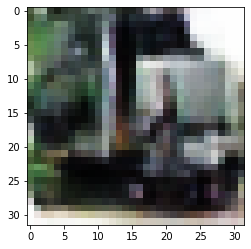

-> Epoch 236, Batch numero 1/78 -> Disc. loss on real images: 0.26453, Disc. loss on fake images: 0.57110, Generator loss: 1.81254
-> Epoch 236, Batch numero 2/78 -> Disc. loss on real images: 0.30656, Disc. loss on fake images: 0.35507, Generator loss: 2.24167
-> Epoch 236, Batch numero 3/78 -> Disc. loss on real images: 0.39875, Disc. loss on fake images: 0.32504, Generator loss: 2.38934
-> Epoch 236, Batch numero 4/78 -> Disc. loss on real images: 0.37747, Disc. loss on fake images: 0.36992, Generator loss: 1.98011
-> Epoch 236, Batch numero 5/78 -> Disc. loss on real images: 0.42270, Disc. loss on fake images: 0.25332, Generator loss: 1.92575
-> Epoch 236, Batch numero 6/78 -> Disc. loss on real images: 0.32314, Disc. loss on fake images: 0.43707, Generator loss: 2.11124
-> Epoch 236, Batch numero 7/78 -> Disc. loss on real images: 0.41618, Disc. loss on fake images: 0.40611, Generator loss: 1.74886
-> Epoch 236, Batch numero 8/78 -> Disc. loss on real images: 0.40645, Disc. loss o

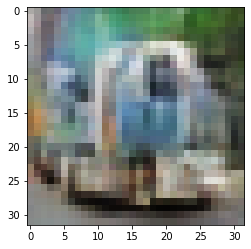

-> Epoch 237, Batch numero 1/78 -> Disc. loss on real images: 0.40304, Disc. loss on fake images: 0.37832, Generator loss: 2.22031
-> Epoch 237, Batch numero 2/78 -> Disc. loss on real images: 0.42168, Disc. loss on fake images: 0.29794, Generator loss: 2.43055
-> Epoch 237, Batch numero 3/78 -> Disc. loss on real images: 0.38797, Disc. loss on fake images: 0.58946, Generator loss: 2.09390
-> Epoch 237, Batch numero 4/78 -> Disc. loss on real images: 0.55193, Disc. loss on fake images: 0.42154, Generator loss: 2.16498
-> Epoch 237, Batch numero 5/78 -> Disc. loss on real images: 0.24910, Disc. loss on fake images: 0.25294, Generator loss: 2.15950
-> Epoch 237, Batch numero 6/78 -> Disc. loss on real images: 0.46312, Disc. loss on fake images: 0.28747, Generator loss: 1.85502
-> Epoch 237, Batch numero 7/78 -> Disc. loss on real images: 0.42994, Disc. loss on fake images: 0.41244, Generator loss: 1.75022
-> Epoch 237, Batch numero 8/78 -> Disc. loss on real images: 0.44482, Disc. loss o

-> Epoch 237, Batch numero 65/78 -> Disc. loss on real images: 0.40747, Disc. loss on fake images: 0.53108, Generator loss: 1.75611
-> Epoch 237, Batch numero 66/78 -> Disc. loss on real images: 0.31554, Disc. loss on fake images: 0.36375, Generator loss: 2.01045
-> Epoch 237, Batch numero 67/78 -> Disc. loss on real images: 0.57878, Disc. loss on fake images: 0.40034, Generator loss: 2.11061
-> Epoch 237, Batch numero 68/78 -> Disc. loss on real images: 0.33680, Disc. loss on fake images: 0.40562, Generator loss: 1.86282
-> Epoch 237, Batch numero 69/78 -> Disc. loss on real images: 0.27807, Disc. loss on fake images: 0.41684, Generator loss: 1.94182
-> Epoch 237, Batch numero 70/78 -> Disc. loss on real images: 0.42442, Disc. loss on fake images: 0.27765, Generator loss: 1.96476
-> Epoch 237, Batch numero 71/78 -> Disc. loss on real images: 0.31223, Disc. loss on fake images: 0.58482, Generator loss: 2.11480
-> Epoch 237, Batch numero 72/78 -> Disc. loss on real images: 0.44281, Disc

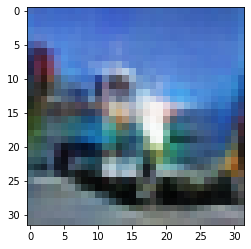

-> Epoch 238, Batch numero 1/78 -> Disc. loss on real images: 0.53582, Disc. loss on fake images: 0.38397, Generator loss: 2.06180
-> Epoch 238, Batch numero 2/78 -> Disc. loss on real images: 0.48915, Disc. loss on fake images: 0.28848, Generator loss: 1.89327
-> Epoch 238, Batch numero 3/78 -> Disc. loss on real images: 0.28638, Disc. loss on fake images: 0.45216, Generator loss: 1.84478
-> Epoch 238, Batch numero 4/78 -> Disc. loss on real images: 0.32054, Disc. loss on fake images: 0.40848, Generator loss: 2.19964
-> Epoch 238, Batch numero 5/78 -> Disc. loss on real images: 0.40582, Disc. loss on fake images: 0.46032, Generator loss: 2.31336
-> Epoch 238, Batch numero 6/78 -> Disc. loss on real images: 0.44379, Disc. loss on fake images: 0.22113, Generator loss: 2.05327
-> Epoch 238, Batch numero 7/78 -> Disc. loss on real images: 0.31683, Disc. loss on fake images: 0.46921, Generator loss: 2.01938
-> Epoch 238, Batch numero 8/78 -> Disc. loss on real images: 0.44453, Disc. loss o

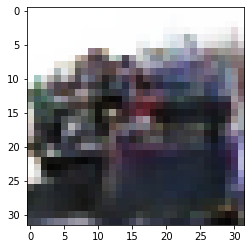

-> Epoch 239, Batch numero 1/78 -> Disc. loss on real images: 0.39210, Disc. loss on fake images: 0.41235, Generator loss: 2.01773
-> Epoch 239, Batch numero 2/78 -> Disc. loss on real images: 0.43828, Disc. loss on fake images: 0.64955, Generator loss: 2.10344
-> Epoch 239, Batch numero 3/78 -> Disc. loss on real images: 0.47944, Disc. loss on fake images: 0.38669, Generator loss: 2.16538
-> Epoch 239, Batch numero 4/78 -> Disc. loss on real images: 0.41264, Disc. loss on fake images: 0.31347, Generator loss: 2.19449
-> Epoch 239, Batch numero 5/78 -> Disc. loss on real images: 0.45630, Disc. loss on fake images: 0.31706, Generator loss: 1.92902
-> Epoch 239, Batch numero 6/78 -> Disc. loss on real images: 0.47956, Disc. loss on fake images: 0.67779, Generator loss: 2.15271
-> Epoch 239, Batch numero 7/78 -> Disc. loss on real images: 0.32089, Disc. loss on fake images: 0.31468, Generator loss: 2.17578
-> Epoch 239, Batch numero 8/78 -> Disc. loss on real images: 0.41313, Disc. loss o

-> Epoch 239, Batch numero 64/78 -> Disc. loss on real images: 0.36498, Disc. loss on fake images: 0.45361, Generator loss: 1.66666
-> Epoch 239, Batch numero 65/78 -> Disc. loss on real images: 0.38727, Disc. loss on fake images: 0.34616, Generator loss: 1.84871
-> Epoch 239, Batch numero 66/78 -> Disc. loss on real images: 0.31148, Disc. loss on fake images: 0.43829, Generator loss: 2.12849
-> Epoch 239, Batch numero 67/78 -> Disc. loss on real images: 0.35976, Disc. loss on fake images: 0.30248, Generator loss: 1.86412
-> Epoch 239, Batch numero 68/78 -> Disc. loss on real images: 0.28448, Disc. loss on fake images: 0.33666, Generator loss: 2.03988
-> Epoch 239, Batch numero 69/78 -> Disc. loss on real images: 0.28344, Disc. loss on fake images: 0.36125, Generator loss: 2.13379
-> Epoch 239, Batch numero 70/78 -> Disc. loss on real images: 0.36666, Disc. loss on fake images: 0.35390, Generator loss: 2.14343
-> Epoch 239, Batch numero 71/78 -> Disc. loss on real images: 0.39159, Disc

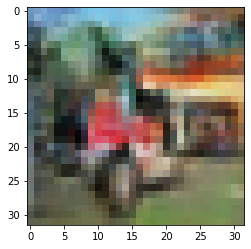

-> Epoch 240, Batch numero 1/78 -> Disc. loss on real images: 0.36630, Disc. loss on fake images: 0.52255, Generator loss: 1.93679
-> Epoch 240, Batch numero 2/78 -> Disc. loss on real images: 0.53755, Disc. loss on fake images: 0.51726, Generator loss: 2.07936
-> Epoch 240, Batch numero 3/78 -> Disc. loss on real images: 0.45920, Disc. loss on fake images: 0.33922, Generator loss: 2.09561
-> Epoch 240, Batch numero 4/78 -> Disc. loss on real images: 0.34910, Disc. loss on fake images: 0.49010, Generator loss: 1.91958
-> Epoch 240, Batch numero 5/78 -> Disc. loss on real images: 0.30893, Disc. loss on fake images: 0.35207, Generator loss: 1.95753
-> Epoch 240, Batch numero 6/78 -> Disc. loss on real images: 0.42287, Disc. loss on fake images: 0.36813, Generator loss: 1.92130
-> Epoch 240, Batch numero 7/78 -> Disc. loss on real images: 0.36835, Disc. loss on fake images: 0.38130, Generator loss: 1.90048
-> Epoch 240, Batch numero 8/78 -> Disc. loss on real images: 0.27588, Disc. loss o

-> Epoch 240, Batch numero 64/78 -> Disc. loss on real images: 0.25341, Disc. loss on fake images: 0.44351, Generator loss: 2.18986
-> Epoch 240, Batch numero 65/78 -> Disc. loss on real images: 0.37139, Disc. loss on fake images: 0.33981, Generator loss: 2.07612
-> Epoch 240, Batch numero 66/78 -> Disc. loss on real images: 0.39823, Disc. loss on fake images: 0.46954, Generator loss: 2.04533
-> Epoch 240, Batch numero 67/78 -> Disc. loss on real images: 0.38932, Disc. loss on fake images: 0.36712, Generator loss: 2.11247
-> Epoch 240, Batch numero 68/78 -> Disc. loss on real images: 0.54544, Disc. loss on fake images: 0.33963, Generator loss: 1.84579
-> Epoch 240, Batch numero 69/78 -> Disc. loss on real images: 0.34161, Disc. loss on fake images: 0.47361, Generator loss: 2.10761
-> Epoch 240, Batch numero 70/78 -> Disc. loss on real images: 0.39691, Disc. loss on fake images: 0.31390, Generator loss: 2.12435
-> Epoch 240, Batch numero 71/78 -> Disc. loss on real images: 0.44129, Disc

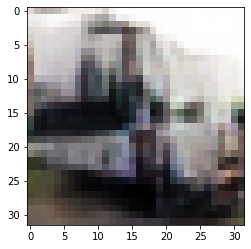

-> Epoch 241, Batch numero 1/78 -> Disc. loss on real images: 0.22600, Disc. loss on fake images: 0.51754, Generator loss: 2.02583
-> Epoch 241, Batch numero 2/78 -> Disc. loss on real images: 0.43755, Disc. loss on fake images: 0.28329, Generator loss: 2.14302
-> Epoch 241, Batch numero 3/78 -> Disc. loss on real images: 0.45895, Disc. loss on fake images: 0.36809, Generator loss: 1.82242
-> Epoch 241, Batch numero 4/78 -> Disc. loss on real images: 0.27147, Disc. loss on fake images: 0.30607, Generator loss: 1.84640
-> Epoch 241, Batch numero 5/78 -> Disc. loss on real images: 0.52088, Disc. loss on fake images: 0.38637, Generator loss: 1.64947
-> Epoch 241, Batch numero 6/78 -> Disc. loss on real images: 0.33909, Disc. loss on fake images: 0.43449, Generator loss: 1.78350
-> Epoch 241, Batch numero 7/78 -> Disc. loss on real images: 0.36741, Disc. loss on fake images: 0.46938, Generator loss: 1.97482
-> Epoch 241, Batch numero 8/78 -> Disc. loss on real images: 0.28041, Disc. loss o

-> Epoch 241, Batch numero 64/78 -> Disc. loss on real images: 0.29899, Disc. loss on fake images: 0.34466, Generator loss: 1.92538
-> Epoch 241, Batch numero 65/78 -> Disc. loss on real images: 0.33903, Disc. loss on fake images: 0.35747, Generator loss: 1.98773
-> Epoch 241, Batch numero 66/78 -> Disc. loss on real images: 0.25607, Disc. loss on fake images: 0.35421, Generator loss: 2.32392
-> Epoch 241, Batch numero 67/78 -> Disc. loss on real images: 0.31808, Disc. loss on fake images: 0.23389, Generator loss: 2.30581
-> Epoch 241, Batch numero 68/78 -> Disc. loss on real images: 0.49353, Disc. loss on fake images: 0.46553, Generator loss: 1.89561
-> Epoch 241, Batch numero 69/78 -> Disc. loss on real images: 0.27474, Disc. loss on fake images: 0.57654, Generator loss: 2.24401
-> Epoch 241, Batch numero 70/78 -> Disc. loss on real images: 0.33868, Disc. loss on fake images: 0.34868, Generator loss: 2.47650
-> Epoch 241, Batch numero 71/78 -> Disc. loss on real images: 0.33069, Disc

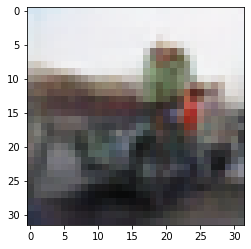

-> Epoch 242, Batch numero 1/78 -> Disc. loss on real images: 0.39784, Disc. loss on fake images: 0.32321, Generator loss: 1.84555
-> Epoch 242, Batch numero 2/78 -> Disc. loss on real images: 0.29157, Disc. loss on fake images: 0.35464, Generator loss: 2.00099
-> Epoch 242, Batch numero 3/78 -> Disc. loss on real images: 0.29542, Disc. loss on fake images: 0.43539, Generator loss: 2.06235
-> Epoch 242, Batch numero 4/78 -> Disc. loss on real images: 0.31129, Disc. loss on fake images: 0.59293, Generator loss: 1.89088
-> Epoch 242, Batch numero 5/78 -> Disc. loss on real images: 0.40019, Disc. loss on fake images: 0.30601, Generator loss: 2.32573
-> Epoch 242, Batch numero 6/78 -> Disc. loss on real images: 0.54304, Disc. loss on fake images: 0.32383, Generator loss: 1.97611
-> Epoch 242, Batch numero 7/78 -> Disc. loss on real images: 0.43870, Disc. loss on fake images: 0.47139, Generator loss: 1.98140
-> Epoch 242, Batch numero 8/78 -> Disc. loss on real images: 0.31310, Disc. loss o

-> Epoch 242, Batch numero 64/78 -> Disc. loss on real images: 0.52864, Disc. loss on fake images: 0.31944, Generator loss: 1.65228
-> Epoch 242, Batch numero 65/78 -> Disc. loss on real images: 0.25284, Disc. loss on fake images: 0.50300, Generator loss: 2.02048
-> Epoch 242, Batch numero 66/78 -> Disc. loss on real images: 0.33920, Disc. loss on fake images: 0.34942, Generator loss: 2.21914
-> Epoch 242, Batch numero 67/78 -> Disc. loss on real images: 0.39691, Disc. loss on fake images: 0.32465, Generator loss: 2.08627
-> Epoch 242, Batch numero 68/78 -> Disc. loss on real images: 0.38014, Disc. loss on fake images: 0.32779, Generator loss: 2.05538
-> Epoch 242, Batch numero 69/78 -> Disc. loss on real images: 0.26159, Disc. loss on fake images: 0.47108, Generator loss: 2.03872
-> Epoch 242, Batch numero 70/78 -> Disc. loss on real images: 0.43375, Disc. loss on fake images: 0.49571, Generator loss: 2.29336
-> Epoch 242, Batch numero 71/78 -> Disc. loss on real images: 0.26381, Disc

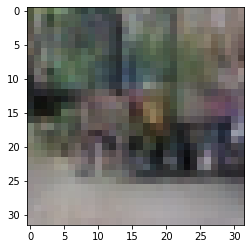

-> Epoch 243, Batch numero 1/78 -> Disc. loss on real images: 0.43772, Disc. loss on fake images: 0.28971, Generator loss: 1.96234
-> Epoch 243, Batch numero 2/78 -> Disc. loss on real images: 0.47403, Disc. loss on fake images: 0.48728, Generator loss: 1.97999
-> Epoch 243, Batch numero 3/78 -> Disc. loss on real images: 0.24388, Disc. loss on fake images: 0.26784, Generator loss: 1.83950
-> Epoch 243, Batch numero 4/78 -> Disc. loss on real images: 0.22314, Disc. loss on fake images: 0.33002, Generator loss: 2.00932
-> Epoch 243, Batch numero 5/78 -> Disc. loss on real images: 0.44364, Disc. loss on fake images: 0.45428, Generator loss: 2.08776
-> Epoch 243, Batch numero 6/78 -> Disc. loss on real images: 0.41448, Disc. loss on fake images: 0.54309, Generator loss: 2.00178
-> Epoch 243, Batch numero 7/78 -> Disc. loss on real images: 0.50450, Disc. loss on fake images: 0.50326, Generator loss: 1.77376
-> Epoch 243, Batch numero 8/78 -> Disc. loss on real images: 0.31519, Disc. loss o

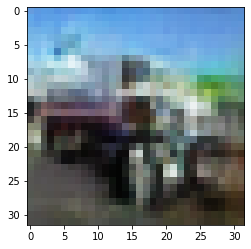

-> Epoch 244, Batch numero 1/78 -> Disc. loss on real images: 0.30641, Disc. loss on fake images: 0.34241, Generator loss: 2.10612
-> Epoch 244, Batch numero 2/78 -> Disc. loss on real images: 0.46069, Disc. loss on fake images: 0.32857, Generator loss: 1.87778
-> Epoch 244, Batch numero 3/78 -> Disc. loss on real images: 0.37660, Disc. loss on fake images: 0.31781, Generator loss: 1.68222
-> Epoch 244, Batch numero 4/78 -> Disc. loss on real images: 0.31583, Disc. loss on fake images: 0.46396, Generator loss: 2.02309
-> Epoch 244, Batch numero 5/78 -> Disc. loss on real images: 0.28691, Disc. loss on fake images: 0.32544, Generator loss: 1.94008
-> Epoch 244, Batch numero 6/78 -> Disc. loss on real images: 0.45689, Disc. loss on fake images: 0.37443, Generator loss: 2.13430
-> Epoch 244, Batch numero 7/78 -> Disc. loss on real images: 0.32241, Disc. loss on fake images: 0.37851, Generator loss: 1.88940
-> Epoch 244, Batch numero 8/78 -> Disc. loss on real images: 0.56510, Disc. loss o

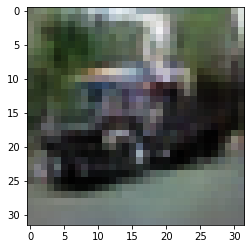

-> Epoch 245, Batch numero 1/78 -> Disc. loss on real images: 0.44902, Disc. loss on fake images: 0.40555, Generator loss: 2.07657
-> Epoch 245, Batch numero 2/78 -> Disc. loss on real images: 0.25530, Disc. loss on fake images: 0.37160, Generator loss: 1.88598
-> Epoch 245, Batch numero 3/78 -> Disc. loss on real images: 0.30954, Disc. loss on fake images: 0.29651, Generator loss: 1.97484
-> Epoch 245, Batch numero 4/78 -> Disc. loss on real images: 0.38150, Disc. loss on fake images: 0.36880, Generator loss: 1.92764
-> Epoch 245, Batch numero 5/78 -> Disc. loss on real images: 0.36956, Disc. loss on fake images: 0.43705, Generator loss: 2.17490
-> Epoch 245, Batch numero 6/78 -> Disc. loss on real images: 0.38698, Disc. loss on fake images: 0.41250, Generator loss: 2.28146
-> Epoch 245, Batch numero 7/78 -> Disc. loss on real images: 0.35401, Disc. loss on fake images: 0.19280, Generator loss: 1.79765
-> Epoch 245, Batch numero 8/78 -> Disc. loss on real images: 0.42511, Disc. loss o

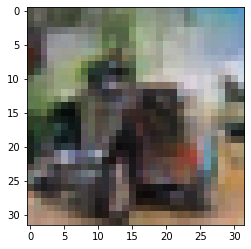

-> Epoch 246, Batch numero 1/78 -> Disc. loss on real images: 0.39559, Disc. loss on fake images: 0.32393, Generator loss: 2.17632
-> Epoch 246, Batch numero 2/78 -> Disc. loss on real images: 0.50239, Disc. loss on fake images: 0.41528, Generator loss: 1.96886
-> Epoch 246, Batch numero 3/78 -> Disc. loss on real images: 0.33097, Disc. loss on fake images: 0.36339, Generator loss: 2.09988
-> Epoch 246, Batch numero 4/78 -> Disc. loss on real images: 0.37945, Disc. loss on fake images: 0.33360, Generator loss: 1.85795
-> Epoch 246, Batch numero 5/78 -> Disc. loss on real images: 0.36048, Disc. loss on fake images: 0.66932, Generator loss: 2.14332
-> Epoch 246, Batch numero 6/78 -> Disc. loss on real images: 0.30574, Disc. loss on fake images: 0.36986, Generator loss: 2.40940
-> Epoch 246, Batch numero 7/78 -> Disc. loss on real images: 0.47801, Disc. loss on fake images: 0.28302, Generator loss: 2.00558
-> Epoch 246, Batch numero 8/78 -> Disc. loss on real images: 0.46200, Disc. loss o

-> Epoch 246, Batch numero 65/78 -> Disc. loss on real images: 0.43105, Disc. loss on fake images: 0.25976, Generator loss: 2.26981
-> Epoch 246, Batch numero 66/78 -> Disc. loss on real images: 0.49515, Disc. loss on fake images: 0.40975, Generator loss: 1.67675
-> Epoch 246, Batch numero 67/78 -> Disc. loss on real images: 0.58028, Disc. loss on fake images: 0.46303, Generator loss: 2.04441
-> Epoch 246, Batch numero 68/78 -> Disc. loss on real images: 0.35944, Disc. loss on fake images: 0.39785, Generator loss: 2.18150
-> Epoch 246, Batch numero 69/78 -> Disc. loss on real images: 0.32496, Disc. loss on fake images: 0.31304, Generator loss: 2.07827
-> Epoch 246, Batch numero 70/78 -> Disc. loss on real images: 0.38342, Disc. loss on fake images: 0.51235, Generator loss: 2.00229
-> Epoch 246, Batch numero 71/78 -> Disc. loss on real images: 0.34810, Disc. loss on fake images: 0.40295, Generator loss: 1.89519
-> Epoch 246, Batch numero 72/78 -> Disc. loss on real images: 0.25659, Disc

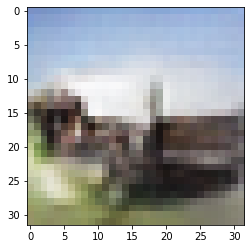

-> Epoch 247, Batch numero 1/78 -> Disc. loss on real images: 0.29847, Disc. loss on fake images: 0.37742, Generator loss: 1.95109
-> Epoch 247, Batch numero 2/78 -> Disc. loss on real images: 0.28545, Disc. loss on fake images: 0.43112, Generator loss: 2.09262
-> Epoch 247, Batch numero 3/78 -> Disc. loss on real images: 0.33887, Disc. loss on fake images: 0.49385, Generator loss: 2.44296
-> Epoch 247, Batch numero 4/78 -> Disc. loss on real images: 0.49433, Disc. loss on fake images: 0.41976, Generator loss: 2.27017
-> Epoch 247, Batch numero 5/78 -> Disc. loss on real images: 0.49309, Disc. loss on fake images: 0.31275, Generator loss: 2.15721
-> Epoch 247, Batch numero 6/78 -> Disc. loss on real images: 0.53570, Disc. loss on fake images: 0.48034, Generator loss: 2.03826
-> Epoch 247, Batch numero 7/78 -> Disc. loss on real images: 0.40054, Disc. loss on fake images: 0.41949, Generator loss: 1.95928
-> Epoch 247, Batch numero 8/78 -> Disc. loss on real images: 0.30969, Disc. loss o

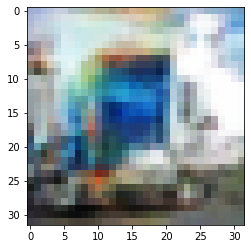

-> Epoch 248, Batch numero 1/78 -> Disc. loss on real images: 0.37080, Disc. loss on fake images: 0.23421, Generator loss: 2.51327
-> Epoch 248, Batch numero 2/78 -> Disc. loss on real images: 0.46374, Disc. loss on fake images: 0.35908, Generator loss: 2.18446
-> Epoch 248, Batch numero 3/78 -> Disc. loss on real images: 0.34382, Disc. loss on fake images: 0.54437, Generator loss: 2.41855
-> Epoch 248, Batch numero 4/78 -> Disc. loss on real images: 0.44371, Disc. loss on fake images: 0.37546, Generator loss: 2.30178
-> Epoch 248, Batch numero 5/78 -> Disc. loss on real images: 0.48803, Disc. loss on fake images: 0.35930, Generator loss: 1.92314
-> Epoch 248, Batch numero 6/78 -> Disc. loss on real images: 0.33944, Disc. loss on fake images: 0.29330, Generator loss: 2.05741
-> Epoch 248, Batch numero 7/78 -> Disc. loss on real images: 0.48709, Disc. loss on fake images: 0.44155, Generator loss: 1.98656
-> Epoch 248, Batch numero 8/78 -> Disc. loss on real images: 0.28955, Disc. loss o

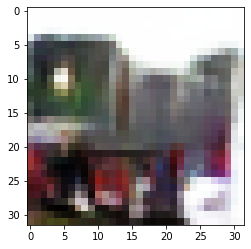

-> Epoch 249, Batch numero 1/78 -> Disc. loss on real images: 0.23987, Disc. loss on fake images: 0.51127, Generator loss: 2.36267
-> Epoch 249, Batch numero 2/78 -> Disc. loss on real images: 0.48210, Disc. loss on fake images: 0.32351, Generator loss: 1.75035
-> Epoch 249, Batch numero 3/78 -> Disc. loss on real images: 0.40850, Disc. loss on fake images: 0.33318, Generator loss: 2.23143
-> Epoch 249, Batch numero 4/78 -> Disc. loss on real images: 0.25058, Disc. loss on fake images: 0.34052, Generator loss: 1.91533
-> Epoch 249, Batch numero 5/78 -> Disc. loss on real images: 0.23349, Disc. loss on fake images: 0.36041, Generator loss: 2.01028
-> Epoch 249, Batch numero 6/78 -> Disc. loss on real images: 0.39164, Disc. loss on fake images: 0.43931, Generator loss: 1.92569
-> Epoch 249, Batch numero 7/78 -> Disc. loss on real images: 0.31399, Disc. loss on fake images: 0.29359, Generator loss: 2.08211
-> Epoch 249, Batch numero 8/78 -> Disc. loss on real images: 0.59086, Disc. loss o

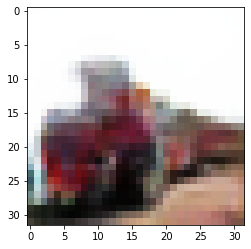

-> Epoch 250, Batch numero 1/78 -> Disc. loss on real images: 0.44532, Disc. loss on fake images: 0.28862, Generator loss: 2.21663
-> Epoch 250, Batch numero 2/78 -> Disc. loss on real images: 0.27814, Disc. loss on fake images: 0.17125, Generator loss: 1.90070
-> Epoch 250, Batch numero 3/78 -> Disc. loss on real images: 0.32788, Disc. loss on fake images: 0.34985, Generator loss: 1.81708
-> Epoch 250, Batch numero 4/78 -> Disc. loss on real images: 0.30879, Disc. loss on fake images: 0.60550, Generator loss: 1.86651
-> Epoch 250, Batch numero 5/78 -> Disc. loss on real images: 0.44685, Disc. loss on fake images: 0.28441, Generator loss: 2.00997
-> Epoch 250, Batch numero 6/78 -> Disc. loss on real images: 0.36181, Disc. loss on fake images: 0.42469, Generator loss: 1.84226
-> Epoch 250, Batch numero 7/78 -> Disc. loss on real images: 0.26748, Disc. loss on fake images: 0.51115, Generator loss: 1.95621
-> Epoch 250, Batch numero 8/78 -> Disc. loss on real images: 0.35986, Disc. loss o

-> Epoch 250, Batch numero 64/78 -> Disc. loss on real images: 0.24910, Disc. loss on fake images: 0.21733, Generator loss: 2.00574
-> Epoch 250, Batch numero 65/78 -> Disc. loss on real images: 0.62769, Disc. loss on fake images: 0.51125, Generator loss: 2.27825
-> Epoch 250, Batch numero 66/78 -> Disc. loss on real images: 0.42953, Disc. loss on fake images: 0.41011, Generator loss: 1.93447
-> Epoch 250, Batch numero 67/78 -> Disc. loss on real images: 0.28677, Disc. loss on fake images: 0.27765, Generator loss: 2.31932
-> Epoch 250, Batch numero 68/78 -> Disc. loss on real images: 0.40611, Disc. loss on fake images: 0.48037, Generator loss: 2.16646
-> Epoch 250, Batch numero 69/78 -> Disc. loss on real images: 0.36259, Disc. loss on fake images: 0.41789, Generator loss: 2.27304
-> Epoch 250, Batch numero 70/78 -> Disc. loss on real images: 0.64976, Disc. loss on fake images: 0.34076, Generator loss: 2.16204
-> Epoch 250, Batch numero 71/78 -> Disc. loss on real images: 0.50611, Disc

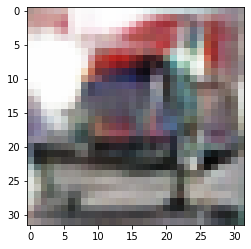

-> Epoch 251, Batch numero 1/78 -> Disc. loss on real images: 0.37485, Disc. loss on fake images: 0.21679, Generator loss: 1.87404
-> Epoch 251, Batch numero 2/78 -> Disc. loss on real images: 0.24645, Disc. loss on fake images: 0.49497, Generator loss: 2.26026
-> Epoch 251, Batch numero 3/78 -> Disc. loss on real images: 0.50324, Disc. loss on fake images: 0.34563, Generator loss: 1.87451
-> Epoch 251, Batch numero 4/78 -> Disc. loss on real images: 0.41913, Disc. loss on fake images: 0.37853, Generator loss: 1.82051
-> Epoch 251, Batch numero 5/78 -> Disc. loss on real images: 0.46685, Disc. loss on fake images: 0.21143, Generator loss: 1.79991
-> Epoch 251, Batch numero 6/78 -> Disc. loss on real images: 0.28364, Disc. loss on fake images: 0.58865, Generator loss: 2.25191
-> Epoch 251, Batch numero 7/78 -> Disc. loss on real images: 0.31468, Disc. loss on fake images: 0.30063, Generator loss: 2.08462
-> Epoch 251, Batch numero 8/78 -> Disc. loss on real images: 0.49136, Disc. loss o

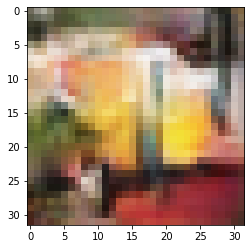

-> Epoch 252, Batch numero 1/78 -> Disc. loss on real images: 0.31277, Disc. loss on fake images: 0.32752, Generator loss: 2.40560
-> Epoch 252, Batch numero 2/78 -> Disc. loss on real images: 0.31772, Disc. loss on fake images: 0.26287, Generator loss: 2.31461
-> Epoch 252, Batch numero 3/78 -> Disc. loss on real images: 0.25242, Disc. loss on fake images: 0.37612, Generator loss: 2.09731
-> Epoch 252, Batch numero 4/78 -> Disc. loss on real images: 0.42333, Disc. loss on fake images: 0.39869, Generator loss: 2.25076
-> Epoch 252, Batch numero 5/78 -> Disc. loss on real images: 0.48059, Disc. loss on fake images: 0.43798, Generator loss: 1.87593
-> Epoch 252, Batch numero 6/78 -> Disc. loss on real images: 0.48686, Disc. loss on fake images: 0.46375, Generator loss: 1.86685
-> Epoch 252, Batch numero 7/78 -> Disc. loss on real images: 0.40659, Disc. loss on fake images: 0.35315, Generator loss: 1.99164
-> Epoch 252, Batch numero 8/78 -> Disc. loss on real images: 0.39474, Disc. loss o

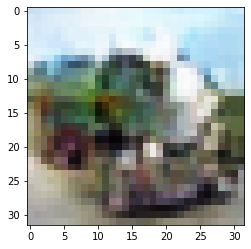

-> Epoch 253, Batch numero 1/78 -> Disc. loss on real images: 0.31038, Disc. loss on fake images: 0.39647, Generator loss: 2.19312
-> Epoch 253, Batch numero 2/78 -> Disc. loss on real images: 0.41411, Disc. loss on fake images: 0.45516, Generator loss: 2.42081
-> Epoch 253, Batch numero 3/78 -> Disc. loss on real images: 0.54721, Disc. loss on fake images: 0.32886, Generator loss: 2.18256
-> Epoch 253, Batch numero 4/78 -> Disc. loss on real images: 0.41192, Disc. loss on fake images: 0.41334, Generator loss: 2.02614
-> Epoch 253, Batch numero 5/78 -> Disc. loss on real images: 0.27537, Disc. loss on fake images: 0.23105, Generator loss: 2.10683
-> Epoch 253, Batch numero 6/78 -> Disc. loss on real images: 0.29698, Disc. loss on fake images: 0.45272, Generator loss: 2.16092
-> Epoch 253, Batch numero 7/78 -> Disc. loss on real images: 0.24455, Disc. loss on fake images: 0.33697, Generator loss: 2.29900
-> Epoch 253, Batch numero 8/78 -> Disc. loss on real images: 0.43834, Disc. loss o

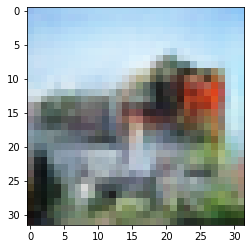

-> Epoch 254, Batch numero 1/78 -> Disc. loss on real images: 0.42357, Disc. loss on fake images: 0.24974, Generator loss: 2.10461
-> Epoch 254, Batch numero 2/78 -> Disc. loss on real images: 0.32072, Disc. loss on fake images: 0.27465, Generator loss: 1.99406
-> Epoch 254, Batch numero 3/78 -> Disc. loss on real images: 0.23920, Disc. loss on fake images: 0.41336, Generator loss: 2.01050
-> Epoch 254, Batch numero 4/78 -> Disc. loss on real images: 0.38559, Disc. loss on fake images: 0.37334, Generator loss: 2.36938
-> Epoch 254, Batch numero 5/78 -> Disc. loss on real images: 0.38455, Disc. loss on fake images: 0.30202, Generator loss: 2.08391
-> Epoch 254, Batch numero 6/78 -> Disc. loss on real images: 0.33663, Disc. loss on fake images: 0.49412, Generator loss: 1.82484
-> Epoch 254, Batch numero 7/78 -> Disc. loss on real images: 0.33450, Disc. loss on fake images: 0.37999, Generator loss: 2.10781
-> Epoch 254, Batch numero 8/78 -> Disc. loss on real images: 0.37079, Disc. loss o

-> Epoch 254, Batch numero 64/78 -> Disc. loss on real images: 0.25414, Disc. loss on fake images: 0.41036, Generator loss: 1.94343
-> Epoch 254, Batch numero 65/78 -> Disc. loss on real images: 0.24481, Disc. loss on fake images: 0.56402, Generator loss: 2.26857
-> Epoch 254, Batch numero 66/78 -> Disc. loss on real images: 0.36228, Disc. loss on fake images: 0.23281, Generator loss: 2.40874
-> Epoch 254, Batch numero 67/78 -> Disc. loss on real images: 0.53288, Disc. loss on fake images: 0.33439, Generator loss: 2.06493
-> Epoch 254, Batch numero 68/78 -> Disc. loss on real images: 0.30284, Disc. loss on fake images: 0.60093, Generator loss: 2.44150
-> Epoch 254, Batch numero 69/78 -> Disc. loss on real images: 0.38509, Disc. loss on fake images: 0.40104, Generator loss: 2.16343
-> Epoch 254, Batch numero 70/78 -> Disc. loss on real images: 0.54705, Disc. loss on fake images: 0.39590, Generator loss: 2.00092
-> Epoch 254, Batch numero 71/78 -> Disc. loss on real images: 0.44463, Disc

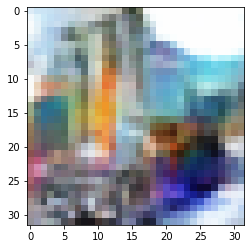

-> Epoch 255, Batch numero 1/78 -> Disc. loss on real images: 0.58604, Disc. loss on fake images: 0.39131, Generator loss: 2.15764
-> Epoch 255, Batch numero 2/78 -> Disc. loss on real images: 0.24946, Disc. loss on fake images: 0.35177, Generator loss: 2.11170
-> Epoch 255, Batch numero 3/78 -> Disc. loss on real images: 0.39493, Disc. loss on fake images: 0.53094, Generator loss: 2.41939
-> Epoch 255, Batch numero 4/78 -> Disc. loss on real images: 0.58229, Disc. loss on fake images: 0.31593, Generator loss: 1.91200
-> Epoch 255, Batch numero 5/78 -> Disc. loss on real images: 0.50139, Disc. loss on fake images: 0.41594, Generator loss: 2.06200
-> Epoch 255, Batch numero 6/78 -> Disc. loss on real images: 0.32723, Disc. loss on fake images: 0.54429, Generator loss: 2.00256
-> Epoch 255, Batch numero 7/78 -> Disc. loss on real images: 0.39505, Disc. loss on fake images: 0.22388, Generator loss: 2.00166
-> Epoch 255, Batch numero 8/78 -> Disc. loss on real images: 0.24688, Disc. loss o

-> Epoch 255, Batch numero 64/78 -> Disc. loss on real images: 0.37373, Disc. loss on fake images: 0.45325, Generator loss: 2.45475
-> Epoch 255, Batch numero 65/78 -> Disc. loss on real images: 0.49615, Disc. loss on fake images: 0.22844, Generator loss: 2.00671
-> Epoch 255, Batch numero 66/78 -> Disc. loss on real images: 0.26783, Disc. loss on fake images: 0.34923, Generator loss: 2.22671
-> Epoch 255, Batch numero 67/78 -> Disc. loss on real images: 0.40028, Disc. loss on fake images: 0.61790, Generator loss: 2.15739
-> Epoch 255, Batch numero 68/78 -> Disc. loss on real images: 0.55195, Disc. loss on fake images: 0.28813, Generator loss: 2.03125
-> Epoch 255, Batch numero 69/78 -> Disc. loss on real images: 0.32927, Disc. loss on fake images: 0.53903, Generator loss: 1.82961
-> Epoch 255, Batch numero 70/78 -> Disc. loss on real images: 0.33425, Disc. loss on fake images: 0.22377, Generator loss: 2.13938
-> Epoch 255, Batch numero 71/78 -> Disc. loss on real images: 0.43796, Disc

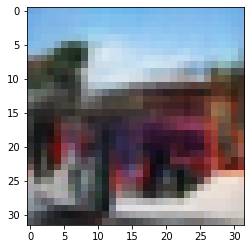

-> Epoch 256, Batch numero 1/78 -> Disc. loss on real images: 0.30288, Disc. loss on fake images: 0.31187, Generator loss: 1.99955
-> Epoch 256, Batch numero 2/78 -> Disc. loss on real images: 0.38543, Disc. loss on fake images: 0.27864, Generator loss: 2.03994
-> Epoch 256, Batch numero 3/78 -> Disc. loss on real images: 0.26348, Disc. loss on fake images: 0.69022, Generator loss: 2.10582
-> Epoch 256, Batch numero 4/78 -> Disc. loss on real images: 0.39204, Disc. loss on fake images: 0.26102, Generator loss: 2.36716
-> Epoch 256, Batch numero 5/78 -> Disc. loss on real images: 0.46991, Disc. loss on fake images: 0.42074, Generator loss: 2.09754
-> Epoch 256, Batch numero 6/78 -> Disc. loss on real images: 0.31172, Disc. loss on fake images: 0.34170, Generator loss: 2.05157
-> Epoch 256, Batch numero 7/78 -> Disc. loss on real images: 0.36994, Disc. loss on fake images: 0.41493, Generator loss: 2.38127
-> Epoch 256, Batch numero 8/78 -> Disc. loss on real images: 0.31074, Disc. loss o

-> Epoch 256, Batch numero 64/78 -> Disc. loss on real images: 0.41888, Disc. loss on fake images: 0.23872, Generator loss: 2.56769
-> Epoch 256, Batch numero 65/78 -> Disc. loss on real images: 0.38130, Disc. loss on fake images: 0.48639, Generator loss: 2.34428
-> Epoch 256, Batch numero 66/78 -> Disc. loss on real images: 0.45807, Disc. loss on fake images: 0.38487, Generator loss: 2.17604
-> Epoch 256, Batch numero 67/78 -> Disc. loss on real images: 0.36872, Disc. loss on fake images: 0.36911, Generator loss: 2.35049
-> Epoch 256, Batch numero 68/78 -> Disc. loss on real images: 0.52469, Disc. loss on fake images: 0.63837, Generator loss: 2.41392
-> Epoch 256, Batch numero 69/78 -> Disc. loss on real images: 0.43504, Disc. loss on fake images: 0.34295, Generator loss: 1.82987
-> Epoch 256, Batch numero 70/78 -> Disc. loss on real images: 0.66007, Disc. loss on fake images: 0.46210, Generator loss: 1.99345
-> Epoch 256, Batch numero 71/78 -> Disc. loss on real images: 0.41281, Disc

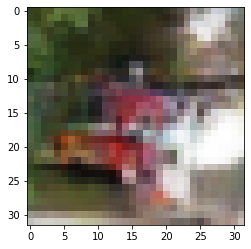

-> Epoch 257, Batch numero 1/78 -> Disc. loss on real images: 0.31230, Disc. loss on fake images: 0.42893, Generator loss: 2.13169
-> Epoch 257, Batch numero 2/78 -> Disc. loss on real images: 0.21194, Disc. loss on fake images: 0.23136, Generator loss: 2.26180
-> Epoch 257, Batch numero 3/78 -> Disc. loss on real images: 0.28968, Disc. loss on fake images: 0.23135, Generator loss: 2.24579
-> Epoch 257, Batch numero 4/78 -> Disc. loss on real images: 0.28742, Disc. loss on fake images: 0.27829, Generator loss: 2.07707
-> Epoch 257, Batch numero 5/78 -> Disc. loss on real images: 0.40573, Disc. loss on fake images: 0.51370, Generator loss: 1.97147
-> Epoch 257, Batch numero 6/78 -> Disc. loss on real images: 0.32020, Disc. loss on fake images: 0.78371, Generator loss: 2.67482
-> Epoch 257, Batch numero 7/78 -> Disc. loss on real images: 0.38721, Disc. loss on fake images: 0.19988, Generator loss: 2.70290
-> Epoch 257, Batch numero 8/78 -> Disc. loss on real images: 0.43573, Disc. loss o

-> Epoch 257, Batch numero 65/78 -> Disc. loss on real images: 0.30350, Disc. loss on fake images: 0.26307, Generator loss: 2.37883
-> Epoch 257, Batch numero 66/78 -> Disc. loss on real images: 0.29169, Disc. loss on fake images: 0.29537, Generator loss: 2.50669
-> Epoch 257, Batch numero 67/78 -> Disc. loss on real images: 0.25675, Disc. loss on fake images: 0.15707, Generator loss: 2.24259
-> Epoch 257, Batch numero 68/78 -> Disc. loss on real images: 0.31366, Disc. loss on fake images: 0.45346, Generator loss: 2.04674
-> Epoch 257, Batch numero 69/78 -> Disc. loss on real images: 0.26384, Disc. loss on fake images: 0.24980, Generator loss: 1.89671
-> Epoch 257, Batch numero 70/78 -> Disc. loss on real images: 0.26845, Disc. loss on fake images: 0.60273, Generator loss: 2.46122
-> Epoch 257, Batch numero 71/78 -> Disc. loss on real images: 0.39819, Disc. loss on fake images: 0.19097, Generator loss: 2.18546
-> Epoch 257, Batch numero 72/78 -> Disc. loss on real images: 0.35377, Disc

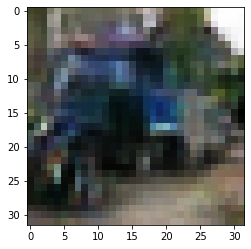

-> Epoch 258, Batch numero 1/78 -> Disc. loss on real images: 0.38925, Disc. loss on fake images: 0.39600, Generator loss: 2.42663
-> Epoch 258, Batch numero 2/78 -> Disc. loss on real images: 0.26760, Disc. loss on fake images: 0.23427, Generator loss: 2.11681
-> Epoch 258, Batch numero 3/78 -> Disc. loss on real images: 0.37735, Disc. loss on fake images: 0.42381, Generator loss: 2.09169
-> Epoch 258, Batch numero 4/78 -> Disc. loss on real images: 0.25065, Disc. loss on fake images: 0.41855, Generator loss: 2.20639
-> Epoch 258, Batch numero 5/78 -> Disc. loss on real images: 0.38224, Disc. loss on fake images: 0.30359, Generator loss: 1.89940
-> Epoch 258, Batch numero 6/78 -> Disc. loss on real images: 0.34051, Disc. loss on fake images: 0.43811, Generator loss: 1.89668
-> Epoch 258, Batch numero 7/78 -> Disc. loss on real images: 0.35214, Disc. loss on fake images: 0.48846, Generator loss: 2.34436
-> Epoch 258, Batch numero 8/78 -> Disc. loss on real images: 0.38012, Disc. loss o

-> Epoch 258, Batch numero 65/78 -> Disc. loss on real images: 0.50613, Disc. loss on fake images: 0.32196, Generator loss: 2.08106
-> Epoch 258, Batch numero 66/78 -> Disc. loss on real images: 0.27329, Disc. loss on fake images: 0.50636, Generator loss: 2.27806
-> Epoch 258, Batch numero 67/78 -> Disc. loss on real images: 0.21629, Disc. loss on fake images: 0.37014, Generator loss: 2.52169
-> Epoch 258, Batch numero 68/78 -> Disc. loss on real images: 0.45055, Disc. loss on fake images: 0.19074, Generator loss: 2.42980
-> Epoch 258, Batch numero 69/78 -> Disc. loss on real images: 0.59172, Disc. loss on fake images: 0.48330, Generator loss: 2.04520
-> Epoch 258, Batch numero 70/78 -> Disc. loss on real images: 0.32068, Disc. loss on fake images: 0.34752, Generator loss: 2.17128
-> Epoch 258, Batch numero 71/78 -> Disc. loss on real images: 0.28993, Disc. loss on fake images: 0.31693, Generator loss: 2.07109
-> Epoch 258, Batch numero 72/78 -> Disc. loss on real images: 0.34674, Disc

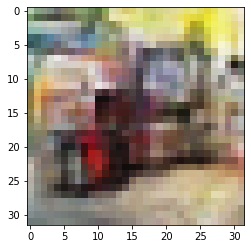

-> Epoch 259, Batch numero 1/78 -> Disc. loss on real images: 0.39286, Disc. loss on fake images: 0.28424, Generator loss: 2.00417
-> Epoch 259, Batch numero 2/78 -> Disc. loss on real images: 0.21848, Disc. loss on fake images: 0.26750, Generator loss: 2.15092
-> Epoch 259, Batch numero 3/78 -> Disc. loss on real images: 0.25943, Disc. loss on fake images: 0.30578, Generator loss: 1.91371
-> Epoch 259, Batch numero 4/78 -> Disc. loss on real images: 0.27237, Disc. loss on fake images: 0.45834, Generator loss: 2.17042
-> Epoch 259, Batch numero 5/78 -> Disc. loss on real images: 0.37707, Disc. loss on fake images: 0.31012, Generator loss: 2.42740
-> Epoch 259, Batch numero 6/78 -> Disc. loss on real images: 0.57930, Disc. loss on fake images: 0.33928, Generator loss: 2.13206
-> Epoch 259, Batch numero 7/78 -> Disc. loss on real images: 0.51517, Disc. loss on fake images: 0.44650, Generator loss: 1.92287
-> Epoch 259, Batch numero 8/78 -> Disc. loss on real images: 0.27358, Disc. loss o

-> Epoch 259, Batch numero 64/78 -> Disc. loss on real images: 0.52382, Disc. loss on fake images: 0.12348, Generator loss: 2.45446
-> Epoch 259, Batch numero 65/78 -> Disc. loss on real images: 0.26546, Disc. loss on fake images: 0.44871, Generator loss: 2.69689
-> Epoch 259, Batch numero 66/78 -> Disc. loss on real images: 0.34178, Disc. loss on fake images: 0.31670, Generator loss: 2.28656
-> Epoch 259, Batch numero 67/78 -> Disc. loss on real images: 0.37064, Disc. loss on fake images: 0.24055, Generator loss: 1.89767
-> Epoch 259, Batch numero 68/78 -> Disc. loss on real images: 0.44524, Disc. loss on fake images: 0.39512, Generator loss: 1.92375
-> Epoch 259, Batch numero 69/78 -> Disc. loss on real images: 0.45561, Disc. loss on fake images: 0.56321, Generator loss: 2.24253
-> Epoch 259, Batch numero 70/78 -> Disc. loss on real images: 0.26395, Disc. loss on fake images: 0.40295, Generator loss: 2.11674
-> Epoch 259, Batch numero 71/78 -> Disc. loss on real images: 0.45549, Disc

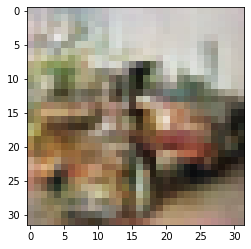

-> Epoch 260, Batch numero 1/78 -> Disc. loss on real images: 0.52058, Disc. loss on fake images: 0.38192, Generator loss: 2.15203
-> Epoch 260, Batch numero 2/78 -> Disc. loss on real images: 0.29699, Disc. loss on fake images: 0.29926, Generator loss: 2.34507
-> Epoch 260, Batch numero 3/78 -> Disc. loss on real images: 0.30917, Disc. loss on fake images: 0.28091, Generator loss: 2.04102
-> Epoch 260, Batch numero 4/78 -> Disc. loss on real images: 0.35065, Disc. loss on fake images: 0.57597, Generator loss: 2.15945
-> Epoch 260, Batch numero 5/78 -> Disc. loss on real images: 0.25729, Disc. loss on fake images: 0.22751, Generator loss: 2.09178
-> Epoch 260, Batch numero 6/78 -> Disc. loss on real images: 0.32423, Disc. loss on fake images: 0.29827, Generator loss: 2.14942
-> Epoch 260, Batch numero 7/78 -> Disc. loss on real images: 0.31673, Disc. loss on fake images: 0.34321, Generator loss: 2.47077
-> Epoch 260, Batch numero 8/78 -> Disc. loss on real images: 0.45164, Disc. loss o

-> Epoch 260, Batch numero 66/78 -> Disc. loss on real images: 0.59257, Disc. loss on fake images: 0.34459, Generator loss: 1.79113
-> Epoch 260, Batch numero 67/78 -> Disc. loss on real images: 0.32649, Disc. loss on fake images: 0.43380, Generator loss: 2.07788
-> Epoch 260, Batch numero 68/78 -> Disc. loss on real images: 0.31538, Disc. loss on fake images: 0.33833, Generator loss: 2.24077
-> Epoch 260, Batch numero 69/78 -> Disc. loss on real images: 0.35087, Disc. loss on fake images: 0.33995, Generator loss: 2.05842
-> Epoch 260, Batch numero 70/78 -> Disc. loss on real images: 0.31116, Disc. loss on fake images: 0.32879, Generator loss: 2.03743
-> Epoch 260, Batch numero 71/78 -> Disc. loss on real images: 0.20370, Disc. loss on fake images: 0.44978, Generator loss: 2.35050
-> Epoch 260, Batch numero 72/78 -> Disc. loss on real images: 0.35627, Disc. loss on fake images: 0.52324, Generator loss: 2.59735
-> Epoch 260, Batch numero 73/78 -> Disc. loss on real images: 0.34180, Disc

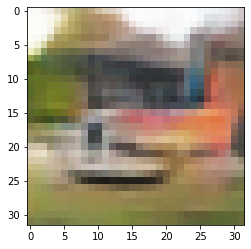

-> Epoch 261, Batch numero 1/78 -> Disc. loss on real images: 0.30735, Disc. loss on fake images: 0.35234, Generator loss: 2.04004
-> Epoch 261, Batch numero 2/78 -> Disc. loss on real images: 0.32617, Disc. loss on fake images: 0.38149, Generator loss: 2.29338
-> Epoch 261, Batch numero 3/78 -> Disc. loss on real images: 0.23637, Disc. loss on fake images: 0.27875, Generator loss: 2.36828
-> Epoch 261, Batch numero 4/78 -> Disc. loss on real images: 0.41585, Disc. loss on fake images: 0.31579, Generator loss: 2.26631
-> Epoch 261, Batch numero 5/78 -> Disc. loss on real images: 0.21466, Disc. loss on fake images: 0.31570, Generator loss: 2.43908
-> Epoch 261, Batch numero 6/78 -> Disc. loss on real images: 0.33347, Disc. loss on fake images: 0.67862, Generator loss: 2.45914
-> Epoch 261, Batch numero 7/78 -> Disc. loss on real images: 0.32854, Disc. loss on fake images: 0.20410, Generator loss: 2.60236
-> Epoch 261, Batch numero 8/78 -> Disc. loss on real images: 0.53016, Disc. loss o

-> Epoch 261, Batch numero 65/78 -> Disc. loss on real images: 0.40992, Disc. loss on fake images: 0.51165, Generator loss: 2.31781
-> Epoch 261, Batch numero 66/78 -> Disc. loss on real images: 0.23518, Disc. loss on fake images: 0.29834, Generator loss: 2.15366
-> Epoch 261, Batch numero 67/78 -> Disc. loss on real images: 0.44952, Disc. loss on fake images: 0.27593, Generator loss: 2.26258
-> Epoch 261, Batch numero 68/78 -> Disc. loss on real images: 0.21604, Disc. loss on fake images: 0.42661, Generator loss: 2.09167
-> Epoch 261, Batch numero 69/78 -> Disc. loss on real images: 0.36397, Disc. loss on fake images: 0.33565, Generator loss: 2.29396
-> Epoch 261, Batch numero 70/78 -> Disc. loss on real images: 0.34690, Disc. loss on fake images: 0.36484, Generator loss: 2.41562
-> Epoch 261, Batch numero 71/78 -> Disc. loss on real images: 0.33207, Disc. loss on fake images: 0.27208, Generator loss: 1.79775
-> Epoch 261, Batch numero 72/78 -> Disc. loss on real images: 0.55794, Disc

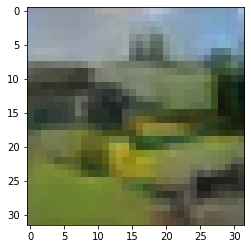

-> Epoch 262, Batch numero 1/78 -> Disc. loss on real images: 0.36035, Disc. loss on fake images: 0.44817, Generator loss: 2.09969
-> Epoch 262, Batch numero 2/78 -> Disc. loss on real images: 0.32035, Disc. loss on fake images: 0.46080, Generator loss: 2.25230
-> Epoch 262, Batch numero 3/78 -> Disc. loss on real images: 0.31895, Disc. loss on fake images: 0.42433, Generator loss: 2.74874
-> Epoch 262, Batch numero 4/78 -> Disc. loss on real images: 0.37655, Disc. loss on fake images: 0.23560, Generator loss: 2.42486
-> Epoch 262, Batch numero 5/78 -> Disc. loss on real images: 0.47895, Disc. loss on fake images: 0.44833, Generator loss: 2.74436
-> Epoch 262, Batch numero 6/78 -> Disc. loss on real images: 0.35397, Disc. loss on fake images: 0.20364, Generator loss: 2.46007
-> Epoch 262, Batch numero 7/78 -> Disc. loss on real images: 0.41272, Disc. loss on fake images: 0.37981, Generator loss: 2.26355
-> Epoch 262, Batch numero 8/78 -> Disc. loss on real images: 0.32170, Disc. loss o

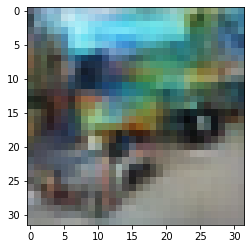

-> Epoch 263, Batch numero 1/78 -> Disc. loss on real images: 0.38098, Disc. loss on fake images: 0.29086, Generator loss: 2.08302
-> Epoch 263, Batch numero 2/78 -> Disc. loss on real images: 0.37179, Disc. loss on fake images: 0.34538, Generator loss: 2.22253
-> Epoch 263, Batch numero 3/78 -> Disc. loss on real images: 0.39990, Disc. loss on fake images: 0.38168, Generator loss: 2.10969
-> Epoch 263, Batch numero 4/78 -> Disc. loss on real images: 0.22083, Disc. loss on fake images: 0.38011, Generator loss: 2.42386
-> Epoch 263, Batch numero 5/78 -> Disc. loss on real images: 0.30931, Disc. loss on fake images: 0.23978, Generator loss: 2.31860
-> Epoch 263, Batch numero 6/78 -> Disc. loss on real images: 0.36407, Disc. loss on fake images: 0.43108, Generator loss: 2.49791
-> Epoch 263, Batch numero 7/78 -> Disc. loss on real images: 0.37302, Disc. loss on fake images: 0.27431, Generator loss: 2.29705
-> Epoch 263, Batch numero 8/78 -> Disc. loss on real images: 0.29992, Disc. loss o

-> Epoch 263, Batch numero 64/78 -> Disc. loss on real images: 0.33607, Disc. loss on fake images: 0.14890, Generator loss: 2.01060
-> Epoch 263, Batch numero 65/78 -> Disc. loss on real images: 0.28957, Disc. loss on fake images: 0.42083, Generator loss: 2.31384
-> Epoch 263, Batch numero 66/78 -> Disc. loss on real images: 0.34059, Disc. loss on fake images: 0.28657, Generator loss: 2.38925
-> Epoch 263, Batch numero 67/78 -> Disc. loss on real images: 0.34852, Disc. loss on fake images: 0.36478, Generator loss: 2.16809
-> Epoch 263, Batch numero 68/78 -> Disc. loss on real images: 0.33576, Disc. loss on fake images: 0.22282, Generator loss: 2.15325
-> Epoch 263, Batch numero 69/78 -> Disc. loss on real images: 0.26273, Disc. loss on fake images: 0.33949, Generator loss: 2.04725
-> Epoch 263, Batch numero 70/78 -> Disc. loss on real images: 0.33420, Disc. loss on fake images: 0.43968, Generator loss: 2.09626
-> Epoch 263, Batch numero 71/78 -> Disc. loss on real images: 0.29072, Disc

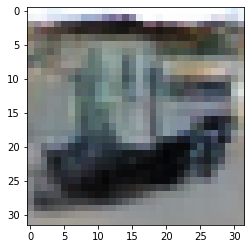

-> Epoch 264, Batch numero 1/78 -> Disc. loss on real images: 0.47962, Disc. loss on fake images: 0.31826, Generator loss: 2.30923
-> Epoch 264, Batch numero 2/78 -> Disc. loss on real images: 0.42338, Disc. loss on fake images: 0.44657, Generator loss: 2.46418
-> Epoch 264, Batch numero 3/78 -> Disc. loss on real images: 0.33890, Disc. loss on fake images: 0.27459, Generator loss: 2.00249
-> Epoch 264, Batch numero 4/78 -> Disc. loss on real images: 0.13811, Disc. loss on fake images: 0.18147, Generator loss: 2.44823
-> Epoch 264, Batch numero 5/78 -> Disc. loss on real images: 0.47414, Disc. loss on fake images: 0.42119, Generator loss: 2.14672
-> Epoch 264, Batch numero 6/78 -> Disc. loss on real images: 0.22613, Disc. loss on fake images: 0.41186, Generator loss: 2.39780
-> Epoch 264, Batch numero 7/78 -> Disc. loss on real images: 0.41845, Disc. loss on fake images: 0.25619, Generator loss: 2.10894
-> Epoch 264, Batch numero 8/78 -> Disc. loss on real images: 0.30378, Disc. loss o

-> Epoch 264, Batch numero 64/78 -> Disc. loss on real images: 0.32625, Disc. loss on fake images: 0.30588, Generator loss: 2.32322
-> Epoch 264, Batch numero 65/78 -> Disc. loss on real images: 0.59987, Disc. loss on fake images: 0.32685, Generator loss: 1.62902
-> Epoch 264, Batch numero 66/78 -> Disc. loss on real images: 0.25036, Disc. loss on fake images: 0.53486, Generator loss: 1.92030
-> Epoch 264, Batch numero 67/78 -> Disc. loss on real images: 0.36432, Disc. loss on fake images: 0.20292, Generator loss: 2.21552
-> Epoch 264, Batch numero 68/78 -> Disc. loss on real images: 0.33227, Disc. loss on fake images: 0.24047, Generator loss: 1.99134
-> Epoch 264, Batch numero 69/78 -> Disc. loss on real images: 0.23847, Disc. loss on fake images: 0.38981, Generator loss: 2.05157
-> Epoch 264, Batch numero 70/78 -> Disc. loss on real images: 0.20258, Disc. loss on fake images: 0.40466, Generator loss: 2.16044
-> Epoch 264, Batch numero 71/78 -> Disc. loss on real images: 0.35188, Disc

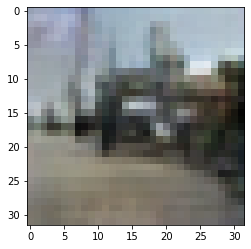

-> Epoch 265, Batch numero 1/78 -> Disc. loss on real images: 0.23032, Disc. loss on fake images: 0.39559, Generator loss: 2.15000
-> Epoch 265, Batch numero 2/78 -> Disc. loss on real images: 0.27335, Disc. loss on fake images: 0.25522, Generator loss: 2.29211
-> Epoch 265, Batch numero 3/78 -> Disc. loss on real images: 0.39964, Disc. loss on fake images: 0.47675, Generator loss: 2.03923
-> Epoch 265, Batch numero 4/78 -> Disc. loss on real images: 0.40696, Disc. loss on fake images: 0.32153, Generator loss: 2.27341
-> Epoch 265, Batch numero 5/78 -> Disc. loss on real images: 0.37292, Disc. loss on fake images: 0.31284, Generator loss: 2.24038
-> Epoch 265, Batch numero 6/78 -> Disc. loss on real images: 0.29424, Disc. loss on fake images: 0.40824, Generator loss: 2.06786
-> Epoch 265, Batch numero 7/78 -> Disc. loss on real images: 0.28142, Disc. loss on fake images: 0.35001, Generator loss: 2.32434
-> Epoch 265, Batch numero 8/78 -> Disc. loss on real images: 0.35530, Disc. loss o

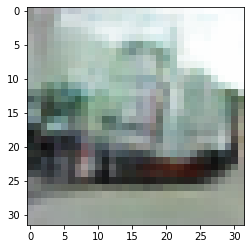

-> Epoch 266, Batch numero 1/78 -> Disc. loss on real images: 0.23676, Disc. loss on fake images: 0.48971, Generator loss: 2.64304
-> Epoch 266, Batch numero 2/78 -> Disc. loss on real images: 0.46917, Disc. loss on fake images: 0.25105, Generator loss: 2.29676
-> Epoch 266, Batch numero 3/78 -> Disc. loss on real images: 0.28152, Disc. loss on fake images: 0.23232, Generator loss: 2.37066
-> Epoch 266, Batch numero 4/78 -> Disc. loss on real images: 0.44681, Disc. loss on fake images: 0.43559, Generator loss: 2.10110
-> Epoch 266, Batch numero 5/78 -> Disc. loss on real images: 0.32302, Disc. loss on fake images: 0.39707, Generator loss: 2.11414
-> Epoch 266, Batch numero 6/78 -> Disc. loss on real images: 0.26308, Disc. loss on fake images: 0.39729, Generator loss: 2.23734
-> Epoch 266, Batch numero 7/78 -> Disc. loss on real images: 0.24008, Disc. loss on fake images: 0.33252, Generator loss: 2.48790
-> Epoch 266, Batch numero 8/78 -> Disc. loss on real images: 0.50760, Disc. loss o

-> Epoch 266, Batch numero 65/78 -> Disc. loss on real images: 0.20501, Disc. loss on fake images: 0.47533, Generator loss: 2.25845
-> Epoch 266, Batch numero 66/78 -> Disc. loss on real images: 0.40020, Disc. loss on fake images: 0.36708, Generator loss: 2.80817
-> Epoch 266, Batch numero 67/78 -> Disc. loss on real images: 0.33532, Disc. loss on fake images: 0.20624, Generator loss: 2.33993
-> Epoch 266, Batch numero 68/78 -> Disc. loss on real images: 0.29248, Disc. loss on fake images: 0.38054, Generator loss: 2.46708
-> Epoch 266, Batch numero 69/78 -> Disc. loss on real images: 0.27244, Disc. loss on fake images: 0.32539, Generator loss: 2.70908
-> Epoch 266, Batch numero 70/78 -> Disc. loss on real images: 0.45910, Disc. loss on fake images: 0.39637, Generator loss: 2.61928
-> Epoch 266, Batch numero 71/78 -> Disc. loss on real images: 0.38041, Disc. loss on fake images: 0.43016, Generator loss: 2.28554
-> Epoch 266, Batch numero 72/78 -> Disc. loss on real images: 0.32190, Disc

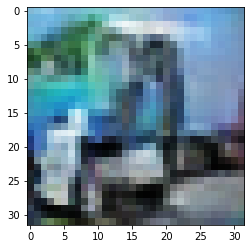

-> Epoch 267, Batch numero 1/78 -> Disc. loss on real images: 0.31074, Disc. loss on fake images: 0.31721, Generator loss: 2.58851
-> Epoch 267, Batch numero 2/78 -> Disc. loss on real images: 0.39874, Disc. loss on fake images: 0.18888, Generator loss: 2.20222
-> Epoch 267, Batch numero 3/78 -> Disc. loss on real images: 0.40637, Disc. loss on fake images: 0.54344, Generator loss: 2.16778
-> Epoch 267, Batch numero 4/78 -> Disc. loss on real images: 0.32019, Disc. loss on fake images: 0.40463, Generator loss: 2.00105
-> Epoch 267, Batch numero 5/78 -> Disc. loss on real images: 0.48037, Disc. loss on fake images: 0.29691, Generator loss: 2.19200
-> Epoch 267, Batch numero 6/78 -> Disc. loss on real images: 0.37266, Disc. loss on fake images: 0.29915, Generator loss: 1.84412
-> Epoch 267, Batch numero 7/78 -> Disc. loss on real images: 0.21798, Disc. loss on fake images: 0.36862, Generator loss: 2.17112
-> Epoch 267, Batch numero 8/78 -> Disc. loss on real images: 0.31853, Disc. loss o

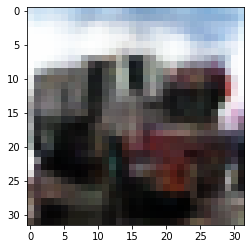

-> Epoch 268, Batch numero 1/78 -> Disc. loss on real images: 0.39560, Disc. loss on fake images: 0.39085, Generator loss: 2.10972
-> Epoch 268, Batch numero 2/78 -> Disc. loss on real images: 0.39190, Disc. loss on fake images: 0.77330, Generator loss: 2.42173
-> Epoch 268, Batch numero 3/78 -> Disc. loss on real images: 0.44551, Disc. loss on fake images: 0.20925, Generator loss: 2.17566
-> Epoch 268, Batch numero 4/78 -> Disc. loss on real images: 0.37285, Disc. loss on fake images: 0.34500, Generator loss: 1.90832
-> Epoch 268, Batch numero 5/78 -> Disc. loss on real images: 0.54476, Disc. loss on fake images: 0.61358, Generator loss: 1.62193
-> Epoch 268, Batch numero 6/78 -> Disc. loss on real images: 0.21944, Disc. loss on fake images: 0.32221, Generator loss: 2.21020
-> Epoch 268, Batch numero 7/78 -> Disc. loss on real images: 0.29724, Disc. loss on fake images: 0.20010, Generator loss: 2.25183
-> Epoch 268, Batch numero 8/78 -> Disc. loss on real images: 0.26582, Disc. loss o

-> Epoch 268, Batch numero 64/78 -> Disc. loss on real images: 0.39180, Disc. loss on fake images: 0.45717, Generator loss: 2.73121
-> Epoch 268, Batch numero 65/78 -> Disc. loss on real images: 0.60643, Disc. loss on fake images: 0.21087, Generator loss: 1.90642
-> Epoch 268, Batch numero 66/78 -> Disc. loss on real images: 0.41893, Disc. loss on fake images: 0.40737, Generator loss: 1.87953
-> Epoch 268, Batch numero 67/78 -> Disc. loss on real images: 0.25728, Disc. loss on fake images: 0.54314, Generator loss: 1.99273
-> Epoch 268, Batch numero 68/78 -> Disc. loss on real images: 0.27922, Disc. loss on fake images: 0.24075, Generator loss: 2.30234
-> Epoch 268, Batch numero 69/78 -> Disc. loss on real images: 0.28872, Disc. loss on fake images: 0.30756, Generator loss: 2.23168
-> Epoch 268, Batch numero 70/78 -> Disc. loss on real images: 0.35535, Disc. loss on fake images: 0.35927, Generator loss: 2.08590
-> Epoch 268, Batch numero 71/78 -> Disc. loss on real images: 0.31259, Disc

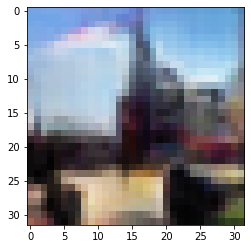

-> Epoch 269, Batch numero 1/78 -> Disc. loss on real images: 0.29464, Disc. loss on fake images: 0.47849, Generator loss: 2.46580
-> Epoch 269, Batch numero 2/78 -> Disc. loss on real images: 0.52814, Disc. loss on fake images: 0.20114, Generator loss: 2.00821
-> Epoch 269, Batch numero 3/78 -> Disc. loss on real images: 0.59842, Disc. loss on fake images: 0.28661, Generator loss: 2.08200
-> Epoch 269, Batch numero 4/78 -> Disc. loss on real images: 0.33083, Disc. loss on fake images: 0.61990, Generator loss: 2.16460
-> Epoch 269, Batch numero 5/78 -> Disc. loss on real images: 0.44517, Disc. loss on fake images: 0.45670, Generator loss: 2.38175
-> Epoch 269, Batch numero 6/78 -> Disc. loss on real images: 0.32068, Disc. loss on fake images: 0.26393, Generator loss: 2.47377
-> Epoch 269, Batch numero 7/78 -> Disc. loss on real images: 0.44041, Disc. loss on fake images: 0.41581, Generator loss: 1.94294
-> Epoch 269, Batch numero 8/78 -> Disc. loss on real images: 0.46220, Disc. loss o

-> Epoch 269, Batch numero 65/78 -> Disc. loss on real images: 0.38207, Disc. loss on fake images: 0.53188, Generator loss: 2.44643
-> Epoch 269, Batch numero 66/78 -> Disc. loss on real images: 0.46336, Disc. loss on fake images: 0.38858, Generator loss: 2.40051
-> Epoch 269, Batch numero 67/78 -> Disc. loss on real images: 0.42396, Disc. loss on fake images: 0.32591, Generator loss: 2.06731
-> Epoch 269, Batch numero 68/78 -> Disc. loss on real images: 0.26967, Disc. loss on fake images: 0.37657, Generator loss: 2.20454
-> Epoch 269, Batch numero 69/78 -> Disc. loss on real images: 0.26541, Disc. loss on fake images: 0.48942, Generator loss: 2.68623
-> Epoch 269, Batch numero 70/78 -> Disc. loss on real images: 0.33224, Disc. loss on fake images: 0.22730, Generator loss: 2.38651
-> Epoch 269, Batch numero 71/78 -> Disc. loss on real images: 0.36512, Disc. loss on fake images: 0.35475, Generator loss: 2.25894
-> Epoch 269, Batch numero 72/78 -> Disc. loss on real images: 0.23057, Disc

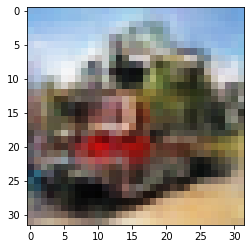

-> Epoch 270, Batch numero 1/78 -> Disc. loss on real images: 0.18332, Disc. loss on fake images: 0.37035, Generator loss: 1.93007
-> Epoch 270, Batch numero 2/78 -> Disc. loss on real images: 0.39185, Disc. loss on fake images: 0.42694, Generator loss: 2.79023
-> Epoch 270, Batch numero 3/78 -> Disc. loss on real images: 0.21155, Disc. loss on fake images: 0.39754, Generator loss: 2.60729
-> Epoch 270, Batch numero 4/78 -> Disc. loss on real images: 0.38397, Disc. loss on fake images: 0.18974, Generator loss: 2.47672
-> Epoch 270, Batch numero 5/78 -> Disc. loss on real images: 0.29991, Disc. loss on fake images: 0.41916, Generator loss: 2.41424
-> Epoch 270, Batch numero 6/78 -> Disc. loss on real images: 0.33831, Disc. loss on fake images: 0.47765, Generator loss: 2.52388
-> Epoch 270, Batch numero 7/78 -> Disc. loss on real images: 0.37374, Disc. loss on fake images: 0.30285, Generator loss: 2.27710
-> Epoch 270, Batch numero 8/78 -> Disc. loss on real images: 0.48768, Disc. loss o

-> Epoch 270, Batch numero 65/78 -> Disc. loss on real images: 0.29850, Disc. loss on fake images: 0.39975, Generator loss: 2.29445
-> Epoch 270, Batch numero 66/78 -> Disc. loss on real images: 0.37835, Disc. loss on fake images: 0.30012, Generator loss: 2.04580
-> Epoch 270, Batch numero 67/78 -> Disc. loss on real images: 0.24430, Disc. loss on fake images: 0.37804, Generator loss: 2.10990
-> Epoch 270, Batch numero 68/78 -> Disc. loss on real images: 0.24690, Disc. loss on fake images: 0.31481, Generator loss: 2.17770
-> Epoch 270, Batch numero 69/78 -> Disc. loss on real images: 0.25316, Disc. loss on fake images: 0.35019, Generator loss: 2.76737
-> Epoch 270, Batch numero 70/78 -> Disc. loss on real images: 0.50680, Disc. loss on fake images: 0.36951, Generator loss: 2.48537
-> Epoch 270, Batch numero 71/78 -> Disc. loss on real images: 0.37670, Disc. loss on fake images: 0.31031, Generator loss: 2.62213
-> Epoch 270, Batch numero 72/78 -> Disc. loss on real images: 0.28696, Disc

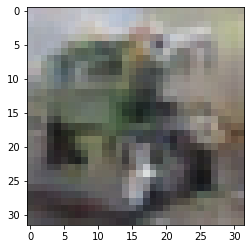

-> Epoch 271, Batch numero 1/78 -> Disc. loss on real images: 0.32052, Disc. loss on fake images: 0.43466, Generator loss: 2.70834
-> Epoch 271, Batch numero 2/78 -> Disc. loss on real images: 0.33856, Disc. loss on fake images: 0.28944, Generator loss: 2.61723
-> Epoch 271, Batch numero 3/78 -> Disc. loss on real images: 0.37961, Disc. loss on fake images: 0.15469, Generator loss: 2.41593
-> Epoch 271, Batch numero 4/78 -> Disc. loss on real images: 0.28339, Disc. loss on fake images: 0.45525, Generator loss: 2.44037
-> Epoch 271, Batch numero 5/78 -> Disc. loss on real images: 0.35020, Disc. loss on fake images: 0.45329, Generator loss: 2.48143
-> Epoch 271, Batch numero 6/78 -> Disc. loss on real images: 0.37914, Disc. loss on fake images: 0.29755, Generator loss: 2.53126
-> Epoch 271, Batch numero 7/78 -> Disc. loss on real images: 0.48314, Disc. loss on fake images: 0.32359, Generator loss: 2.48099
-> Epoch 271, Batch numero 8/78 -> Disc. loss on real images: 0.25540, Disc. loss o

-> Epoch 271, Batch numero 65/78 -> Disc. loss on real images: 0.38159, Disc. loss on fake images: 0.40169, Generator loss: 2.02873
-> Epoch 271, Batch numero 66/78 -> Disc. loss on real images: 0.39247, Disc. loss on fake images: 0.41921, Generator loss: 2.31035
-> Epoch 271, Batch numero 67/78 -> Disc. loss on real images: 0.45381, Disc. loss on fake images: 0.35879, Generator loss: 2.46648
-> Epoch 271, Batch numero 68/78 -> Disc. loss on real images: 0.33454, Disc. loss on fake images: 0.39146, Generator loss: 2.30879
-> Epoch 271, Batch numero 69/78 -> Disc. loss on real images: 0.42398, Disc. loss on fake images: 0.33068, Generator loss: 2.30773
-> Epoch 271, Batch numero 70/78 -> Disc. loss on real images: 0.28724, Disc. loss on fake images: 0.39579, Generator loss: 2.41656
-> Epoch 271, Batch numero 71/78 -> Disc. loss on real images: 0.37995, Disc. loss on fake images: 0.36309, Generator loss: 2.45006
-> Epoch 271, Batch numero 72/78 -> Disc. loss on real images: 0.26250, Disc

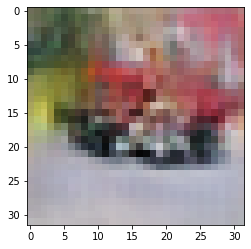

-> Epoch 272, Batch numero 1/78 -> Disc. loss on real images: 0.42891, Disc. loss on fake images: 0.43193, Generator loss: 2.51789
-> Epoch 272, Batch numero 2/78 -> Disc. loss on real images: 0.32824, Disc. loss on fake images: 0.24498, Generator loss: 2.26007
-> Epoch 272, Batch numero 3/78 -> Disc. loss on real images: 0.37668, Disc. loss on fake images: 0.31355, Generator loss: 2.16542
-> Epoch 272, Batch numero 4/78 -> Disc. loss on real images: 0.24626, Disc. loss on fake images: 0.33809, Generator loss: 2.31785
-> Epoch 272, Batch numero 5/78 -> Disc. loss on real images: 0.31577, Disc. loss on fake images: 0.33914, Generator loss: 2.43675
-> Epoch 272, Batch numero 6/78 -> Disc. loss on real images: 0.26767, Disc. loss on fake images: 0.48690, Generator loss: 2.43631
-> Epoch 272, Batch numero 7/78 -> Disc. loss on real images: 0.37623, Disc. loss on fake images: 0.25617, Generator loss: 2.48560
-> Epoch 272, Batch numero 8/78 -> Disc. loss on real images: 0.49808, Disc. loss o

-> Epoch 272, Batch numero 65/78 -> Disc. loss on real images: 0.51278, Disc. loss on fake images: 0.52096, Generator loss: 2.20639
-> Epoch 272, Batch numero 66/78 -> Disc. loss on real images: 0.19523, Disc. loss on fake images: 0.48786, Generator loss: 2.23790
-> Epoch 272, Batch numero 67/78 -> Disc. loss on real images: 0.36787, Disc. loss on fake images: 0.32736, Generator loss: 2.44902
-> Epoch 272, Batch numero 68/78 -> Disc. loss on real images: 0.45625, Disc. loss on fake images: 0.39691, Generator loss: 2.36937
-> Epoch 272, Batch numero 69/78 -> Disc. loss on real images: 0.47186, Disc. loss on fake images: 0.39465, Generator loss: 2.49422
-> Epoch 272, Batch numero 70/78 -> Disc. loss on real images: 0.34388, Disc. loss on fake images: 0.28899, Generator loss: 2.03667
-> Epoch 272, Batch numero 71/78 -> Disc. loss on real images: 0.33933, Disc. loss on fake images: 0.37200, Generator loss: 2.52943
-> Epoch 272, Batch numero 72/78 -> Disc. loss on real images: 0.28296, Disc

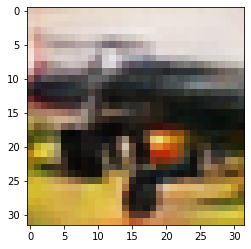

-> Epoch 273, Batch numero 1/78 -> Disc. loss on real images: 0.26933, Disc. loss on fake images: 0.38837, Generator loss: 2.48453
-> Epoch 273, Batch numero 2/78 -> Disc. loss on real images: 0.27583, Disc. loss on fake images: 0.27418, Generator loss: 2.31067
-> Epoch 273, Batch numero 3/78 -> Disc. loss on real images: 0.27121, Disc. loss on fake images: 0.36419, Generator loss: 2.43987
-> Epoch 273, Batch numero 4/78 -> Disc. loss on real images: 0.34056, Disc. loss on fake images: 0.27856, Generator loss: 1.98908
-> Epoch 273, Batch numero 5/78 -> Disc. loss on real images: 0.46715, Disc. loss on fake images: 0.37760, Generator loss: 1.98949
-> Epoch 273, Batch numero 6/78 -> Disc. loss on real images: 0.27025, Disc. loss on fake images: 0.39160, Generator loss: 1.86056
-> Epoch 273, Batch numero 7/78 -> Disc. loss on real images: 0.19489, Disc. loss on fake images: 0.35793, Generator loss: 2.43908
-> Epoch 273, Batch numero 8/78 -> Disc. loss on real images: 0.36810, Disc. loss o

-> Epoch 273, Batch numero 65/78 -> Disc. loss on real images: 0.27655, Disc. loss on fake images: 0.39569, Generator loss: 1.99458
-> Epoch 273, Batch numero 66/78 -> Disc. loss on real images: 0.25675, Disc. loss on fake images: 0.40736, Generator loss: 2.28777
-> Epoch 273, Batch numero 67/78 -> Disc. loss on real images: 0.51181, Disc. loss on fake images: 0.25516, Generator loss: 1.93036
-> Epoch 273, Batch numero 68/78 -> Disc. loss on real images: 0.28076, Disc. loss on fake images: 0.37753, Generator loss: 2.32210
-> Epoch 273, Batch numero 69/78 -> Disc. loss on real images: 0.26483, Disc. loss on fake images: 0.47424, Generator loss: 2.51525
-> Epoch 273, Batch numero 70/78 -> Disc. loss on real images: 0.22228, Disc. loss on fake images: 0.18585, Generator loss: 2.79985
-> Epoch 273, Batch numero 71/78 -> Disc. loss on real images: 0.42662, Disc. loss on fake images: 0.32225, Generator loss: 2.29637
-> Epoch 273, Batch numero 72/78 -> Disc. loss on real images: 0.49815, Disc

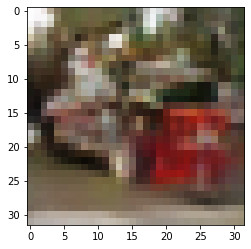

-> Epoch 274, Batch numero 1/78 -> Disc. loss on real images: 0.44325, Disc. loss on fake images: 0.33118, Generator loss: 2.54735
-> Epoch 274, Batch numero 2/78 -> Disc. loss on real images: 0.51808, Disc. loss on fake images: 0.47944, Generator loss: 2.34124
-> Epoch 274, Batch numero 3/78 -> Disc. loss on real images: 0.28639, Disc. loss on fake images: 0.43937, Generator loss: 2.32581
-> Epoch 274, Batch numero 4/78 -> Disc. loss on real images: 0.29172, Disc. loss on fake images: 0.20965, Generator loss: 2.47470
-> Epoch 274, Batch numero 5/78 -> Disc. loss on real images: 0.33064, Disc. loss on fake images: 0.27498, Generator loss: 2.05086
-> Epoch 274, Batch numero 6/78 -> Disc. loss on real images: 0.33574, Disc. loss on fake images: 0.42084, Generator loss: 2.08151
-> Epoch 274, Batch numero 7/78 -> Disc. loss on real images: 0.30181, Disc. loss on fake images: 0.33369, Generator loss: 2.43288
-> Epoch 274, Batch numero 8/78 -> Disc. loss on real images: 0.31525, Disc. loss o

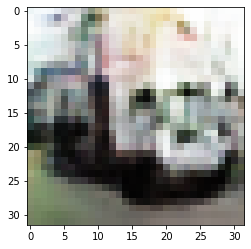

-> Epoch 275, Batch numero 1/78 -> Disc. loss on real images: 0.31749, Disc. loss on fake images: 0.44412, Generator loss: 2.77144
-> Epoch 275, Batch numero 2/78 -> Disc. loss on real images: 0.33549, Disc. loss on fake images: 0.31677, Generator loss: 2.23912
-> Epoch 275, Batch numero 3/78 -> Disc. loss on real images: 0.32143, Disc. loss on fake images: 0.27331, Generator loss: 2.17469
-> Epoch 275, Batch numero 4/78 -> Disc. loss on real images: 0.33386, Disc. loss on fake images: 0.46824, Generator loss: 2.05909
-> Epoch 275, Batch numero 5/78 -> Disc. loss on real images: 0.30828, Disc. loss on fake images: 0.47371, Generator loss: 2.43067
-> Epoch 275, Batch numero 6/78 -> Disc. loss on real images: 0.53665, Disc. loss on fake images: 0.35340, Generator loss: 2.35765
-> Epoch 275, Batch numero 7/78 -> Disc. loss on real images: 0.29266, Disc. loss on fake images: 0.38231, Generator loss: 2.43687
-> Epoch 275, Batch numero 8/78 -> Disc. loss on real images: 0.44616, Disc. loss o

-> Epoch 275, Batch numero 64/78 -> Disc. loss on real images: 0.25053, Disc. loss on fake images: 0.44304, Generator loss: 2.77033
-> Epoch 275, Batch numero 65/78 -> Disc. loss on real images: 0.30398, Disc. loss on fake images: 0.26240, Generator loss: 2.55687
-> Epoch 275, Batch numero 66/78 -> Disc. loss on real images: 0.29679, Disc. loss on fake images: 0.27686, Generator loss: 2.69264
-> Epoch 275, Batch numero 67/78 -> Disc. loss on real images: 0.41589, Disc. loss on fake images: 0.27156, Generator loss: 2.37850
-> Epoch 275, Batch numero 68/78 -> Disc. loss on real images: 0.27443, Disc. loss on fake images: 0.23910, Generator loss: 2.01687
-> Epoch 275, Batch numero 69/78 -> Disc. loss on real images: 0.24293, Disc. loss on fake images: 0.31838, Generator loss: 2.00747
-> Epoch 275, Batch numero 70/78 -> Disc. loss on real images: 0.35983, Disc. loss on fake images: 0.39211, Generator loss: 2.05091
-> Epoch 275, Batch numero 71/78 -> Disc. loss on real images: 0.20836, Disc

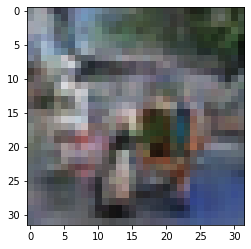

-> Epoch 276, Batch numero 1/78 -> Disc. loss on real images: 0.30429, Disc. loss on fake images: 0.37608, Generator loss: 2.26365
-> Epoch 276, Batch numero 2/78 -> Disc. loss on real images: 0.46016, Disc. loss on fake images: 0.57526, Generator loss: 2.07141
-> Epoch 276, Batch numero 3/78 -> Disc. loss on real images: 0.36455, Disc. loss on fake images: 0.36392, Generator loss: 2.28159
-> Epoch 276, Batch numero 4/78 -> Disc. loss on real images: 0.56175, Disc. loss on fake images: 0.56111, Generator loss: 2.29244
-> Epoch 276, Batch numero 5/78 -> Disc. loss on real images: 0.47579, Disc. loss on fake images: 0.36931, Generator loss: 2.36266
-> Epoch 276, Batch numero 6/78 -> Disc. loss on real images: 0.30884, Disc. loss on fake images: 0.48314, Generator loss: 2.48492
-> Epoch 276, Batch numero 7/78 -> Disc. loss on real images: 0.42961, Disc. loss on fake images: 0.26337, Generator loss: 2.47762
-> Epoch 276, Batch numero 8/78 -> Disc. loss on real images: 0.41556, Disc. loss o

-> Epoch 276, Batch numero 65/78 -> Disc. loss on real images: 0.26441, Disc. loss on fake images: 0.44189, Generator loss: 2.44901
-> Epoch 276, Batch numero 66/78 -> Disc. loss on real images: 0.36344, Disc. loss on fake images: 0.29314, Generator loss: 2.43500
-> Epoch 276, Batch numero 67/78 -> Disc. loss on real images: 0.32570, Disc. loss on fake images: 0.20934, Generator loss: 2.07486
-> Epoch 276, Batch numero 68/78 -> Disc. loss on real images: 0.23779, Disc. loss on fake images: 0.39927, Generator loss: 1.97022
-> Epoch 276, Batch numero 69/78 -> Disc. loss on real images: 0.34536, Disc. loss on fake images: 0.40363, Generator loss: 2.41054
-> Epoch 276, Batch numero 70/78 -> Disc. loss on real images: 0.31115, Disc. loss on fake images: 0.24484, Generator loss: 2.71473
-> Epoch 276, Batch numero 71/78 -> Disc. loss on real images: 0.45280, Disc. loss on fake images: 0.34754, Generator loss: 2.47832
-> Epoch 276, Batch numero 72/78 -> Disc. loss on real images: 0.35802, Disc

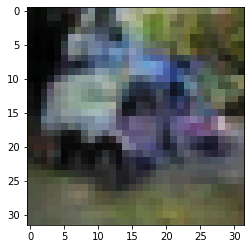

-> Epoch 277, Batch numero 1/78 -> Disc. loss on real images: 0.48060, Disc. loss on fake images: 0.43301, Generator loss: 2.18997
-> Epoch 277, Batch numero 2/78 -> Disc. loss on real images: 0.40988, Disc. loss on fake images: 0.39263, Generator loss: 2.30665
-> Epoch 277, Batch numero 3/78 -> Disc. loss on real images: 0.20694, Disc. loss on fake images: 0.24256, Generator loss: 2.18665
-> Epoch 277, Batch numero 4/78 -> Disc. loss on real images: 0.33818, Disc. loss on fake images: 0.34355, Generator loss: 2.18752
-> Epoch 277, Batch numero 5/78 -> Disc. loss on real images: 0.25652, Disc. loss on fake images: 0.23792, Generator loss: 2.24428
-> Epoch 277, Batch numero 6/78 -> Disc. loss on real images: 0.23605, Disc. loss on fake images: 0.35491, Generator loss: 2.33480
-> Epoch 277, Batch numero 7/78 -> Disc. loss on real images: 0.32726, Disc. loss on fake images: 0.30487, Generator loss: 2.39075
-> Epoch 277, Batch numero 8/78 -> Disc. loss on real images: 0.27722, Disc. loss o

-> Epoch 277, Batch numero 64/78 -> Disc. loss on real images: 0.30067, Disc. loss on fake images: 0.33350, Generator loss: 2.38040
-> Epoch 277, Batch numero 65/78 -> Disc. loss on real images: 0.36032, Disc. loss on fake images: 0.31266, Generator loss: 2.29854
-> Epoch 277, Batch numero 66/78 -> Disc. loss on real images: 0.34420, Disc. loss on fake images: 0.35168, Generator loss: 2.33473
-> Epoch 277, Batch numero 67/78 -> Disc. loss on real images: 0.38739, Disc. loss on fake images: 0.21999, Generator loss: 2.16756
-> Epoch 277, Batch numero 68/78 -> Disc. loss on real images: 0.17542, Disc. loss on fake images: 0.45589, Generator loss: 2.52617
-> Epoch 277, Batch numero 69/78 -> Disc. loss on real images: 0.32233, Disc. loss on fake images: 0.22758, Generator loss: 2.17903
-> Epoch 277, Batch numero 70/78 -> Disc. loss on real images: 0.45771, Disc. loss on fake images: 0.52438, Generator loss: 2.25909
-> Epoch 277, Batch numero 71/78 -> Disc. loss on real images: 0.30612, Disc

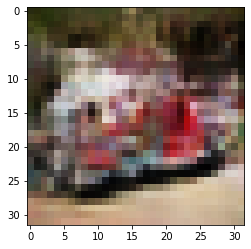

-> Epoch 278, Batch numero 1/78 -> Disc. loss on real images: 0.27848, Disc. loss on fake images: 0.50011, Generator loss: 2.26964
-> Epoch 278, Batch numero 2/78 -> Disc. loss on real images: 0.30548, Disc. loss on fake images: 0.31061, Generator loss: 2.45342
-> Epoch 278, Batch numero 3/78 -> Disc. loss on real images: 0.37087, Disc. loss on fake images: 0.27419, Generator loss: 2.24802
-> Epoch 278, Batch numero 4/78 -> Disc. loss on real images: 0.33037, Disc. loss on fake images: 0.45723, Generator loss: 2.40341
-> Epoch 278, Batch numero 5/78 -> Disc. loss on real images: 0.43335, Disc. loss on fake images: 0.43739, Generator loss: 2.32858
-> Epoch 278, Batch numero 6/78 -> Disc. loss on real images: 0.50700, Disc. loss on fake images: 0.47947, Generator loss: 2.48736
-> Epoch 278, Batch numero 7/78 -> Disc. loss on real images: 0.36980, Disc. loss on fake images: 0.26267, Generator loss: 1.92152
-> Epoch 278, Batch numero 8/78 -> Disc. loss on real images: 0.37902, Disc. loss o

-> Epoch 278, Batch numero 65/78 -> Disc. loss on real images: 0.60711, Disc. loss on fake images: 0.19653, Generator loss: 2.51635
-> Epoch 278, Batch numero 66/78 -> Disc. loss on real images: 0.37311, Disc. loss on fake images: 0.37025, Generator loss: 2.12410
-> Epoch 278, Batch numero 67/78 -> Disc. loss on real images: 0.34848, Disc. loss on fake images: 0.43564, Generator loss: 1.84616
-> Epoch 278, Batch numero 68/78 -> Disc. loss on real images: 0.28307, Disc. loss on fake images: 0.29699, Generator loss: 2.51575
-> Epoch 278, Batch numero 69/78 -> Disc. loss on real images: 0.27855, Disc. loss on fake images: 0.27967, Generator loss: 2.39422
-> Epoch 278, Batch numero 70/78 -> Disc. loss on real images: 0.27876, Disc. loss on fake images: 0.46666, Generator loss: 2.31014
-> Epoch 278, Batch numero 71/78 -> Disc. loss on real images: 0.38804, Disc. loss on fake images: 0.21224, Generator loss: 2.11107
-> Epoch 278, Batch numero 72/78 -> Disc. loss on real images: 0.24101, Disc

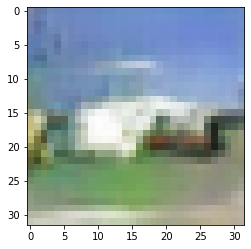

-> Epoch 279, Batch numero 1/78 -> Disc. loss on real images: 0.46743, Disc. loss on fake images: 0.46373, Generator loss: 2.40742
-> Epoch 279, Batch numero 2/78 -> Disc. loss on real images: 0.26899, Disc. loss on fake images: 0.39622, Generator loss: 2.22656
-> Epoch 279, Batch numero 3/78 -> Disc. loss on real images: 0.42065, Disc. loss on fake images: 0.19280, Generator loss: 2.39936
-> Epoch 279, Batch numero 4/78 -> Disc. loss on real images: 0.29521, Disc. loss on fake images: 0.33245, Generator loss: 1.97766
-> Epoch 279, Batch numero 5/78 -> Disc. loss on real images: 0.21743, Disc. loss on fake images: 0.80334, Generator loss: 2.11947
-> Epoch 279, Batch numero 6/78 -> Disc. loss on real images: 0.62234, Disc. loss on fake images: 0.18793, Generator loss: 2.40235
-> Epoch 279, Batch numero 7/78 -> Disc. loss on real images: 0.49690, Disc. loss on fake images: 0.44781, Generator loss: 2.14587
-> Epoch 279, Batch numero 8/78 -> Disc. loss on real images: 0.17841, Disc. loss o

-> Epoch 279, Batch numero 64/78 -> Disc. loss on real images: 0.45318, Disc. loss on fake images: 0.30673, Generator loss: 2.35708
-> Epoch 279, Batch numero 65/78 -> Disc. loss on real images: 0.32878, Disc. loss on fake images: 0.37392, Generator loss: 2.34905
-> Epoch 279, Batch numero 66/78 -> Disc. loss on real images: 0.29127, Disc. loss on fake images: 0.41869, Generator loss: 2.64979
-> Epoch 279, Batch numero 67/78 -> Disc. loss on real images: 0.45327, Disc. loss on fake images: 0.18478, Generator loss: 2.52736
-> Epoch 279, Batch numero 68/78 -> Disc. loss on real images: 0.30181, Disc. loss on fake images: 0.39739, Generator loss: 2.57194
-> Epoch 279, Batch numero 69/78 -> Disc. loss on real images: 0.31157, Disc. loss on fake images: 0.41750, Generator loss: 2.48161
-> Epoch 279, Batch numero 70/78 -> Disc. loss on real images: 0.41609, Disc. loss on fake images: 0.34315, Generator loss: 2.61446
-> Epoch 279, Batch numero 71/78 -> Disc. loss on real images: 0.30274, Disc

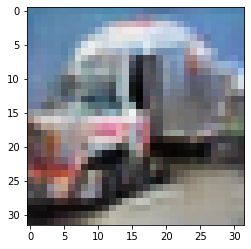

-> Epoch 280, Batch numero 1/78 -> Disc. loss on real images: 0.35578, Disc. loss on fake images: 0.37214, Generator loss: 2.20723
-> Epoch 280, Batch numero 2/78 -> Disc. loss on real images: 0.23433, Disc. loss on fake images: 0.47209, Generator loss: 2.83146
-> Epoch 280, Batch numero 3/78 -> Disc. loss on real images: 0.26222, Disc. loss on fake images: 0.23570, Generator loss: 2.76434
-> Epoch 280, Batch numero 4/78 -> Disc. loss on real images: 0.66249, Disc. loss on fake images: 0.21771, Generator loss: 2.52909
-> Epoch 280, Batch numero 5/78 -> Disc. loss on real images: 0.35202, Disc. loss on fake images: 0.41980, Generator loss: 2.17139
-> Epoch 280, Batch numero 6/78 -> Disc. loss on real images: 0.29735, Disc. loss on fake images: 0.47860, Generator loss: 2.24662
-> Epoch 280, Batch numero 7/78 -> Disc. loss on real images: 0.19342, Disc. loss on fake images: 0.37287, Generator loss: 2.58491
-> Epoch 280, Batch numero 8/78 -> Disc. loss on real images: 0.53198, Disc. loss o

-> Epoch 280, Batch numero 64/78 -> Disc. loss on real images: 0.43301, Disc. loss on fake images: 0.32582, Generator loss: 2.66695
-> Epoch 280, Batch numero 65/78 -> Disc. loss on real images: 0.27611, Disc. loss on fake images: 0.48238, Generator loss: 2.66053
-> Epoch 280, Batch numero 66/78 -> Disc. loss on real images: 0.32001, Disc. loss on fake images: 0.32300, Generator loss: 2.37385
-> Epoch 280, Batch numero 67/78 -> Disc. loss on real images: 0.38638, Disc. loss on fake images: 0.26789, Generator loss: 2.52595
-> Epoch 280, Batch numero 68/78 -> Disc. loss on real images: 0.34267, Disc. loss on fake images: 0.28351, Generator loss: 2.60689
-> Epoch 280, Batch numero 69/78 -> Disc. loss on real images: 0.29439, Disc. loss on fake images: 0.26956, Generator loss: 2.25377
-> Epoch 280, Batch numero 70/78 -> Disc. loss on real images: 0.34420, Disc. loss on fake images: 0.24418, Generator loss: 2.37403
-> Epoch 280, Batch numero 71/78 -> Disc. loss on real images: 0.23918, Disc

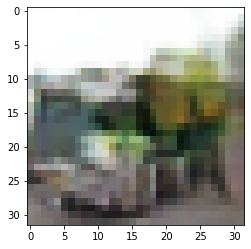

-> Epoch 281, Batch numero 1/78 -> Disc. loss on real images: 0.29913, Disc. loss on fake images: 0.20532, Generator loss: 2.58695
-> Epoch 281, Batch numero 2/78 -> Disc. loss on real images: 0.42288, Disc. loss on fake images: 0.41952, Generator loss: 2.57971
-> Epoch 281, Batch numero 3/78 -> Disc. loss on real images: 0.36875, Disc. loss on fake images: 0.54455, Generator loss: 2.38730
-> Epoch 281, Batch numero 4/78 -> Disc. loss on real images: 0.29497, Disc. loss on fake images: 0.31572, Generator loss: 2.54640
-> Epoch 281, Batch numero 5/78 -> Disc. loss on real images: 0.45180, Disc. loss on fake images: 0.34030, Generator loss: 2.81969
-> Epoch 281, Batch numero 6/78 -> Disc. loss on real images: 0.46809, Disc. loss on fake images: 0.30158, Generator loss: 1.93937
-> Epoch 281, Batch numero 7/78 -> Disc. loss on real images: 0.22268, Disc. loss on fake images: 0.55968, Generator loss: 2.38387
-> Epoch 281, Batch numero 8/78 -> Disc. loss on real images: 0.43997, Disc. loss o

-> Epoch 281, Batch numero 65/78 -> Disc. loss on real images: 0.33254, Disc. loss on fake images: 0.30254, Generator loss: 2.39506
-> Epoch 281, Batch numero 66/78 -> Disc. loss on real images: 0.34850, Disc. loss on fake images: 0.46204, Generator loss: 2.43452
-> Epoch 281, Batch numero 67/78 -> Disc. loss on real images: 0.48479, Disc. loss on fake images: 0.34212, Generator loss: 2.18661
-> Epoch 281, Batch numero 68/78 -> Disc. loss on real images: 0.33414, Disc. loss on fake images: 0.28145, Generator loss: 2.05941
-> Epoch 281, Batch numero 69/78 -> Disc. loss on real images: 0.29882, Disc. loss on fake images: 0.40831, Generator loss: 2.18661
-> Epoch 281, Batch numero 70/78 -> Disc. loss on real images: 0.41443, Disc. loss on fake images: 0.54386, Generator loss: 2.40490
-> Epoch 281, Batch numero 71/78 -> Disc. loss on real images: 0.29287, Disc. loss on fake images: 0.33653, Generator loss: 2.47363
-> Epoch 281, Batch numero 72/78 -> Disc. loss on real images: 0.41423, Disc

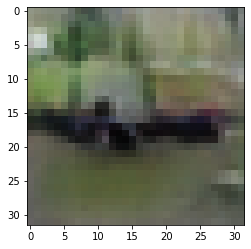

-> Epoch 282, Batch numero 1/78 -> Disc. loss on real images: 0.33037, Disc. loss on fake images: 0.43598, Generator loss: 2.58161
-> Epoch 282, Batch numero 2/78 -> Disc. loss on real images: 0.31175, Disc. loss on fake images: 0.37628, Generator loss: 2.19125
-> Epoch 282, Batch numero 3/78 -> Disc. loss on real images: 0.34110, Disc. loss on fake images: 0.38303, Generator loss: 2.32381
-> Epoch 282, Batch numero 4/78 -> Disc. loss on real images: 0.34442, Disc. loss on fake images: 0.59884, Generator loss: 2.48807
-> Epoch 282, Batch numero 5/78 -> Disc. loss on real images: 0.35707, Disc. loss on fake images: 0.23858, Generator loss: 2.17604
-> Epoch 282, Batch numero 6/78 -> Disc. loss on real images: 0.44530, Disc. loss on fake images: 0.32432, Generator loss: 2.46495
-> Epoch 282, Batch numero 7/78 -> Disc. loss on real images: 0.43233, Disc. loss on fake images: 0.39543, Generator loss: 2.26778
-> Epoch 282, Batch numero 8/78 -> Disc. loss on real images: 0.22300, Disc. loss o

-> Epoch 282, Batch numero 65/78 -> Disc. loss on real images: 0.28829, Disc. loss on fake images: 0.20797, Generator loss: 2.79783
-> Epoch 282, Batch numero 66/78 -> Disc. loss on real images: 0.33716, Disc. loss on fake images: 0.31235, Generator loss: 2.31370
-> Epoch 282, Batch numero 67/78 -> Disc. loss on real images: 0.54629, Disc. loss on fake images: 0.46078, Generator loss: 2.20026
-> Epoch 282, Batch numero 68/78 -> Disc. loss on real images: 0.44140, Disc. loss on fake images: 0.54051, Generator loss: 2.30324
-> Epoch 282, Batch numero 69/78 -> Disc. loss on real images: 0.26763, Disc. loss on fake images: 0.35432, Generator loss: 2.23999
-> Epoch 282, Batch numero 70/78 -> Disc. loss on real images: 0.42122, Disc. loss on fake images: 0.51420, Generator loss: 2.28431
-> Epoch 282, Batch numero 71/78 -> Disc. loss on real images: 0.27778, Disc. loss on fake images: 0.18509, Generator loss: 2.21242
-> Epoch 282, Batch numero 72/78 -> Disc. loss on real images: 0.38056, Disc

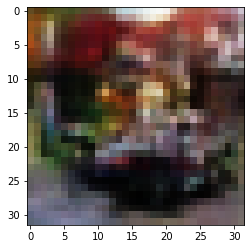

-> Epoch 283, Batch numero 1/78 -> Disc. loss on real images: 0.33674, Disc. loss on fake images: 0.38979, Generator loss: 2.79189
-> Epoch 283, Batch numero 2/78 -> Disc. loss on real images: 0.42254, Disc. loss on fake images: 0.35649, Generator loss: 2.18293
-> Epoch 283, Batch numero 3/78 -> Disc. loss on real images: 0.39431, Disc. loss on fake images: 0.39896, Generator loss: 2.31532
-> Epoch 283, Batch numero 4/78 -> Disc. loss on real images: 0.36010, Disc. loss on fake images: 0.33563, Generator loss: 2.58171
-> Epoch 283, Batch numero 5/78 -> Disc. loss on real images: 0.29424, Disc. loss on fake images: 0.24076, Generator loss: 2.38110
-> Epoch 283, Batch numero 6/78 -> Disc. loss on real images: 0.27015, Disc. loss on fake images: 0.27721, Generator loss: 2.28778
-> Epoch 283, Batch numero 7/78 -> Disc. loss on real images: 0.14266, Disc. loss on fake images: 0.28728, Generator loss: 2.25107
-> Epoch 283, Batch numero 8/78 -> Disc. loss on real images: 0.28858, Disc. loss o

-> Epoch 283, Batch numero 64/78 -> Disc. loss on real images: 0.25857, Disc. loss on fake images: 0.18720, Generator loss: 2.13177
-> Epoch 283, Batch numero 65/78 -> Disc. loss on real images: 0.25572, Disc. loss on fake images: 0.60403, Generator loss: 2.83045
-> Epoch 283, Batch numero 66/78 -> Disc. loss on real images: 0.44758, Disc. loss on fake images: 0.34512, Generator loss: 2.66674
-> Epoch 283, Batch numero 67/78 -> Disc. loss on real images: 0.43427, Disc. loss on fake images: 0.34469, Generator loss: 2.87852
-> Epoch 283, Batch numero 68/78 -> Disc. loss on real images: 0.48389, Disc. loss on fake images: 0.52358, Generator loss: 3.01576
-> Epoch 283, Batch numero 69/78 -> Disc. loss on real images: 0.59718, Disc. loss on fake images: 0.29380, Generator loss: 2.15068
-> Epoch 283, Batch numero 70/78 -> Disc. loss on real images: 0.36886, Disc. loss on fake images: 0.59245, Generator loss: 2.49730
-> Epoch 283, Batch numero 71/78 -> Disc. loss on real images: 0.25594, Disc

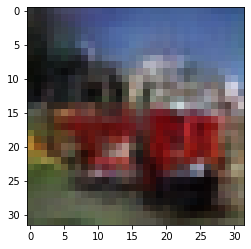

-> Epoch 284, Batch numero 1/78 -> Disc. loss on real images: 0.24189, Disc. loss on fake images: 0.23410, Generator loss: 2.41866
-> Epoch 284, Batch numero 2/78 -> Disc. loss on real images: 0.24251, Disc. loss on fake images: 0.32994, Generator loss: 2.33248
-> Epoch 284, Batch numero 3/78 -> Disc. loss on real images: 0.33978, Disc. loss on fake images: 0.38742, Generator loss: 2.19765
-> Epoch 284, Batch numero 4/78 -> Disc. loss on real images: 0.34791, Disc. loss on fake images: 0.21262, Generator loss: 2.11707
-> Epoch 284, Batch numero 5/78 -> Disc. loss on real images: 0.38434, Disc. loss on fake images: 0.39609, Generator loss: 2.07403
-> Epoch 284, Batch numero 6/78 -> Disc. loss on real images: 0.24377, Disc. loss on fake images: 0.49949, Generator loss: 2.46497
-> Epoch 284, Batch numero 7/78 -> Disc. loss on real images: 0.50092, Disc. loss on fake images: 0.19787, Generator loss: 2.45537
-> Epoch 284, Batch numero 8/78 -> Disc. loss on real images: 0.22800, Disc. loss o

-> Epoch 284, Batch numero 65/78 -> Disc. loss on real images: 0.28081, Disc. loss on fake images: 0.39061, Generator loss: 1.82064
-> Epoch 284, Batch numero 66/78 -> Disc. loss on real images: 0.22746, Disc. loss on fake images: 0.27934, Generator loss: 2.57809
-> Epoch 284, Batch numero 67/78 -> Disc. loss on real images: 0.32156, Disc. loss on fake images: 0.37156, Generator loss: 2.02876
-> Epoch 284, Batch numero 68/78 -> Disc. loss on real images: 0.22407, Disc. loss on fake images: 0.66564, Generator loss: 2.33478
-> Epoch 284, Batch numero 69/78 -> Disc. loss on real images: 0.39906, Disc. loss on fake images: 0.40777, Generator loss: 2.49924
-> Epoch 284, Batch numero 70/78 -> Disc. loss on real images: 0.34936, Disc. loss on fake images: 0.11904, Generator loss: 2.41186
-> Epoch 284, Batch numero 71/78 -> Disc. loss on real images: 0.30121, Disc. loss on fake images: 0.28621, Generator loss: 2.28482
-> Epoch 284, Batch numero 72/78 -> Disc. loss on real images: 0.30297, Disc

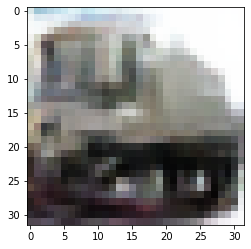

-> Epoch 285, Batch numero 1/78 -> Disc. loss on real images: 0.22031, Disc. loss on fake images: 0.40695, Generator loss: 2.32886
-> Epoch 285, Batch numero 2/78 -> Disc. loss on real images: 0.36114, Disc. loss on fake images: 0.22958, Generator loss: 2.51968
-> Epoch 285, Batch numero 3/78 -> Disc. loss on real images: 0.23407, Disc. loss on fake images: 0.35020, Generator loss: 2.32201
-> Epoch 285, Batch numero 4/78 -> Disc. loss on real images: 0.19662, Disc. loss on fake images: 0.25687, Generator loss: 2.48329
-> Epoch 285, Batch numero 5/78 -> Disc. loss on real images: 0.29073, Disc. loss on fake images: 0.23812, Generator loss: 2.14721
-> Epoch 285, Batch numero 6/78 -> Disc. loss on real images: 0.20526, Disc. loss on fake images: 0.37231, Generator loss: 2.48340
-> Epoch 285, Batch numero 7/78 -> Disc. loss on real images: 0.19454, Disc. loss on fake images: 0.33798, Generator loss: 2.79660
-> Epoch 285, Batch numero 8/78 -> Disc. loss on real images: 0.21441, Disc. loss o

-> Epoch 285, Batch numero 64/78 -> Disc. loss on real images: 0.30904, Disc. loss on fake images: 0.25102, Generator loss: 2.35218
-> Epoch 285, Batch numero 65/78 -> Disc. loss on real images: 0.30214, Disc. loss on fake images: 0.19129, Generator loss: 2.52994
-> Epoch 285, Batch numero 66/78 -> Disc. loss on real images: 0.32905, Disc. loss on fake images: 0.34093, Generator loss: 2.43440
-> Epoch 285, Batch numero 67/78 -> Disc. loss on real images: 0.34285, Disc. loss on fake images: 0.43202, Generator loss: 2.32098
-> Epoch 285, Batch numero 68/78 -> Disc. loss on real images: 0.37998, Disc. loss on fake images: 0.23955, Generator loss: 2.36255
-> Epoch 285, Batch numero 69/78 -> Disc. loss on real images: 0.49060, Disc. loss on fake images: 0.29501, Generator loss: 2.00830
-> Epoch 285, Batch numero 70/78 -> Disc. loss on real images: 0.18977, Disc. loss on fake images: 0.51165, Generator loss: 2.14071
-> Epoch 285, Batch numero 71/78 -> Disc. loss on real images: 0.47233, Disc

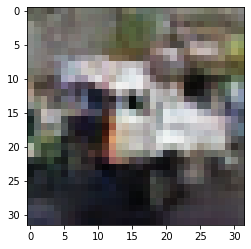

-> Epoch 286, Batch numero 1/78 -> Disc. loss on real images: 0.33327, Disc. loss on fake images: 0.26571, Generator loss: 2.19340
-> Epoch 286, Batch numero 2/78 -> Disc. loss on real images: 0.28395, Disc. loss on fake images: 0.30616, Generator loss: 2.84580
-> Epoch 286, Batch numero 3/78 -> Disc. loss on real images: 0.39735, Disc. loss on fake images: 0.49077, Generator loss: 2.71452
-> Epoch 286, Batch numero 4/78 -> Disc. loss on real images: 0.30720, Disc. loss on fake images: 0.24824, Generator loss: 2.82278
-> Epoch 286, Batch numero 5/78 -> Disc. loss on real images: 0.36549, Disc. loss on fake images: 0.29100, Generator loss: 2.57282
-> Epoch 286, Batch numero 6/78 -> Disc. loss on real images: 0.37326, Disc. loss on fake images: 0.42772, Generator loss: 2.24773
-> Epoch 286, Batch numero 7/78 -> Disc. loss on real images: 0.30590, Disc. loss on fake images: 0.37735, Generator loss: 2.35243
-> Epoch 286, Batch numero 8/78 -> Disc. loss on real images: 0.42454, Disc. loss o

-> Epoch 286, Batch numero 64/78 -> Disc. loss on real images: 0.30879, Disc. loss on fake images: 0.50440, Generator loss: 2.20321
-> Epoch 286, Batch numero 65/78 -> Disc. loss on real images: 0.17145, Disc. loss on fake images: 0.28676, Generator loss: 2.42012
-> Epoch 286, Batch numero 66/78 -> Disc. loss on real images: 0.29534, Disc. loss on fake images: 0.21169, Generator loss: 2.52234
-> Epoch 286, Batch numero 67/78 -> Disc. loss on real images: 0.34968, Disc. loss on fake images: 0.50108, Generator loss: 2.45381
-> Epoch 286, Batch numero 68/78 -> Disc. loss on real images: 0.27476, Disc. loss on fake images: 0.35900, Generator loss: 2.86646
-> Epoch 286, Batch numero 69/78 -> Disc. loss on real images: 0.45219, Disc. loss on fake images: 0.25664, Generator loss: 2.76779
-> Epoch 286, Batch numero 70/78 -> Disc. loss on real images: 0.27074, Disc. loss on fake images: 0.31650, Generator loss: 2.90361
-> Epoch 286, Batch numero 71/78 -> Disc. loss on real images: 0.42458, Disc

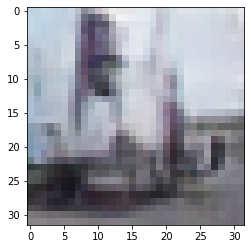

-> Epoch 287, Batch numero 1/78 -> Disc. loss on real images: 0.37722, Disc. loss on fake images: 0.24013, Generator loss: 2.12365
-> Epoch 287, Batch numero 2/78 -> Disc. loss on real images: 0.35017, Disc. loss on fake images: 0.33506, Generator loss: 2.21465
-> Epoch 287, Batch numero 3/78 -> Disc. loss on real images: 0.17729, Disc. loss on fake images: 0.29937, Generator loss: 2.34649
-> Epoch 287, Batch numero 4/78 -> Disc. loss on real images: 0.33570, Disc. loss on fake images: 0.42662, Generator loss: 2.43670
-> Epoch 287, Batch numero 5/78 -> Disc. loss on real images: 0.51033, Disc. loss on fake images: 0.31120, Generator loss: 2.43033
-> Epoch 287, Batch numero 6/78 -> Disc. loss on real images: 0.46492, Disc. loss on fake images: 0.40373, Generator loss: 2.34139
-> Epoch 287, Batch numero 7/78 -> Disc. loss on real images: 0.24558, Disc. loss on fake images: 0.27337, Generator loss: 2.54254
-> Epoch 287, Batch numero 8/78 -> Disc. loss on real images: 0.25993, Disc. loss o

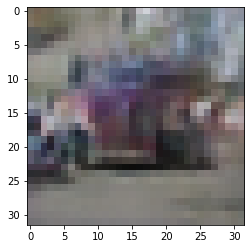

-> Epoch 288, Batch numero 1/78 -> Disc. loss on real images: 0.54789, Disc. loss on fake images: 0.36613, Generator loss: 2.74323
-> Epoch 288, Batch numero 2/78 -> Disc. loss on real images: 0.35161, Disc. loss on fake images: 0.42458, Generator loss: 2.71451
-> Epoch 288, Batch numero 3/78 -> Disc. loss on real images: 0.32092, Disc. loss on fake images: 0.30548, Generator loss: 2.51182
-> Epoch 288, Batch numero 4/78 -> Disc. loss on real images: 0.21278, Disc. loss on fake images: 0.40864, Generator loss: 2.85606
-> Epoch 288, Batch numero 5/78 -> Disc. loss on real images: 0.72506, Disc. loss on fake images: 0.56459, Generator loss: 2.34827
-> Epoch 288, Batch numero 6/78 -> Disc. loss on real images: 0.34916, Disc. loss on fake images: 0.45812, Generator loss: 2.49527
-> Epoch 288, Batch numero 7/78 -> Disc. loss on real images: 0.25128, Disc. loss on fake images: 0.35068, Generator loss: 2.57254
-> Epoch 288, Batch numero 8/78 -> Disc. loss on real images: 0.25806, Disc. loss o

-> Epoch 288, Batch numero 65/78 -> Disc. loss on real images: 0.40110, Disc. loss on fake images: 0.72359, Generator loss: 2.47224
-> Epoch 288, Batch numero 66/78 -> Disc. loss on real images: 0.28552, Disc. loss on fake images: 0.39988, Generator loss: 2.72206
-> Epoch 288, Batch numero 67/78 -> Disc. loss on real images: 0.30744, Disc. loss on fake images: 0.30939, Generator loss: 2.61097
-> Epoch 288, Batch numero 68/78 -> Disc. loss on real images: 0.52394, Disc. loss on fake images: 0.68851, Generator loss: 2.36773
-> Epoch 288, Batch numero 69/78 -> Disc. loss on real images: 0.34747, Disc. loss on fake images: 0.18734, Generator loss: 2.64099
-> Epoch 288, Batch numero 70/78 -> Disc. loss on real images: 0.42188, Disc. loss on fake images: 0.31519, Generator loss: 2.34539
-> Epoch 288, Batch numero 71/78 -> Disc. loss on real images: 0.37866, Disc. loss on fake images: 0.23364, Generator loss: 2.16291
-> Epoch 288, Batch numero 72/78 -> Disc. loss on real images: 0.14801, Disc

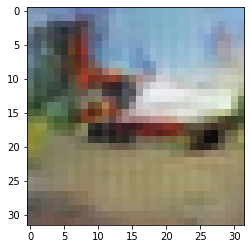

-> Epoch 289, Batch numero 1/78 -> Disc. loss on real images: 0.48254, Disc. loss on fake images: 0.45233, Generator loss: 2.43774
-> Epoch 289, Batch numero 2/78 -> Disc. loss on real images: 0.20641, Disc. loss on fake images: 0.31632, Generator loss: 2.35399
-> Epoch 289, Batch numero 3/78 -> Disc. loss on real images: 0.37398, Disc. loss on fake images: 0.30760, Generator loss: 2.20254
-> Epoch 289, Batch numero 4/78 -> Disc. loss on real images: 0.32696, Disc. loss on fake images: 0.44569, Generator loss: 2.49532
-> Epoch 289, Batch numero 5/78 -> Disc. loss on real images: 0.25590, Disc. loss on fake images: 0.50932, Generator loss: 2.03987
-> Epoch 289, Batch numero 6/78 -> Disc. loss on real images: 0.38802, Disc. loss on fake images: 0.36877, Generator loss: 2.77192
-> Epoch 289, Batch numero 7/78 -> Disc. loss on real images: 0.41326, Disc. loss on fake images: 0.20090, Generator loss: 2.36333
-> Epoch 289, Batch numero 8/78 -> Disc. loss on real images: 0.32116, Disc. loss o

-> Epoch 289, Batch numero 64/78 -> Disc. loss on real images: 0.34434, Disc. loss on fake images: 0.37689, Generator loss: 2.27884
-> Epoch 289, Batch numero 65/78 -> Disc. loss on real images: 0.51019, Disc. loss on fake images: 0.19869, Generator loss: 2.05020
-> Epoch 289, Batch numero 66/78 -> Disc. loss on real images: 0.28166, Disc. loss on fake images: 0.50098, Generator loss: 2.67250
-> Epoch 289, Batch numero 67/78 -> Disc. loss on real images: 0.42328, Disc. loss on fake images: 0.16873, Generator loss: 2.58966
-> Epoch 289, Batch numero 68/78 -> Disc. loss on real images: 0.35355, Disc. loss on fake images: 0.44390, Generator loss: 2.17957
-> Epoch 289, Batch numero 69/78 -> Disc. loss on real images: 0.43261, Disc. loss on fake images: 0.26521, Generator loss: 2.04497
-> Epoch 289, Batch numero 70/78 -> Disc. loss on real images: 0.22440, Disc. loss on fake images: 0.25628, Generator loss: 2.22176
-> Epoch 289, Batch numero 71/78 -> Disc. loss on real images: 0.18608, Disc

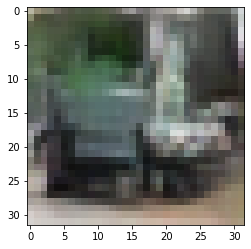

-> Epoch 290, Batch numero 1/78 -> Disc. loss on real images: 0.37145, Disc. loss on fake images: 0.38787, Generator loss: 2.30119
-> Epoch 290, Batch numero 2/78 -> Disc. loss on real images: 0.38351, Disc. loss on fake images: 0.31593, Generator loss: 2.46843
-> Epoch 290, Batch numero 3/78 -> Disc. loss on real images: 0.43798, Disc. loss on fake images: 0.31650, Generator loss: 2.40624
-> Epoch 290, Batch numero 4/78 -> Disc. loss on real images: 0.25754, Disc. loss on fake images: 0.23334, Generator loss: 2.39825
-> Epoch 290, Batch numero 5/78 -> Disc. loss on real images: 0.29739, Disc. loss on fake images: 0.38464, Generator loss: 2.21060
-> Epoch 290, Batch numero 6/78 -> Disc. loss on real images: 0.28935, Disc. loss on fake images: 0.36350, Generator loss: 2.33333
-> Epoch 290, Batch numero 7/78 -> Disc. loss on real images: 0.31495, Disc. loss on fake images: 0.28912, Generator loss: 2.56273
-> Epoch 290, Batch numero 8/78 -> Disc. loss on real images: 0.31574, Disc. loss o

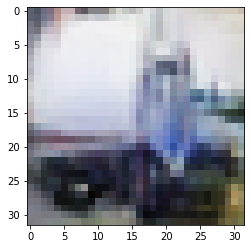

-> Epoch 291, Batch numero 1/78 -> Disc. loss on real images: 0.34442, Disc. loss on fake images: 0.29124, Generator loss: 2.35275
-> Epoch 291, Batch numero 2/78 -> Disc. loss on real images: 0.22974, Disc. loss on fake images: 0.69654, Generator loss: 2.43938
-> Epoch 291, Batch numero 3/78 -> Disc. loss on real images: 0.44419, Disc. loss on fake images: 0.18001, Generator loss: 2.59304
-> Epoch 291, Batch numero 4/78 -> Disc. loss on real images: 0.24955, Disc. loss on fake images: 0.54680, Generator loss: 2.78460
-> Epoch 291, Batch numero 5/78 -> Disc. loss on real images: 0.32504, Disc. loss on fake images: 0.09144, Generator loss: 2.76923
-> Epoch 291, Batch numero 6/78 -> Disc. loss on real images: 0.39080, Disc. loss on fake images: 0.20503, Generator loss: 1.98440
-> Epoch 291, Batch numero 7/78 -> Disc. loss on real images: 0.26197, Disc. loss on fake images: 0.51967, Generator loss: 2.27462
-> Epoch 291, Batch numero 8/78 -> Disc. loss on real images: 0.29851, Disc. loss o

-> Epoch 291, Batch numero 65/78 -> Disc. loss on real images: 0.40270, Disc. loss on fake images: 0.50230, Generator loss: 2.43296
-> Epoch 291, Batch numero 66/78 -> Disc. loss on real images: 0.30540, Disc. loss on fake images: 0.53208, Generator loss: 2.76227
-> Epoch 291, Batch numero 67/78 -> Disc. loss on real images: 0.34633, Disc. loss on fake images: 0.15207, Generator loss: 2.67789
-> Epoch 291, Batch numero 68/78 -> Disc. loss on real images: 0.34431, Disc. loss on fake images: 0.19532, Generator loss: 2.49631
-> Epoch 291, Batch numero 69/78 -> Disc. loss on real images: 0.41916, Disc. loss on fake images: 0.44612, Generator loss: 2.50877
-> Epoch 291, Batch numero 70/78 -> Disc. loss on real images: 0.22291, Disc. loss on fake images: 0.27430, Generator loss: 2.74728
-> Epoch 291, Batch numero 71/78 -> Disc. loss on real images: 0.25947, Disc. loss on fake images: 0.20635, Generator loss: 2.72762
-> Epoch 291, Batch numero 72/78 -> Disc. loss on real images: 0.32452, Disc

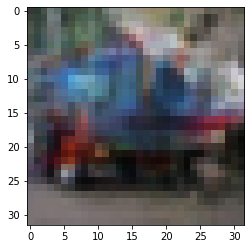

-> Epoch 292, Batch numero 1/78 -> Disc. loss on real images: 0.44853, Disc. loss on fake images: 0.24021, Generator loss: 2.35274
-> Epoch 292, Batch numero 2/78 -> Disc. loss on real images: 0.29369, Disc. loss on fake images: 0.51672, Generator loss: 2.51555
-> Epoch 292, Batch numero 3/78 -> Disc. loss on real images: 0.18558, Disc. loss on fake images: 0.53325, Generator loss: 2.55685
-> Epoch 292, Batch numero 4/78 -> Disc. loss on real images: 0.55897, Disc. loss on fake images: 0.29320, Generator loss: 2.65345
-> Epoch 292, Batch numero 5/78 -> Disc. loss on real images: 0.41365, Disc. loss on fake images: 0.27680, Generator loss: 2.50087
-> Epoch 292, Batch numero 6/78 -> Disc. loss on real images: 0.26300, Disc. loss on fake images: 0.35643, Generator loss: 2.09118
-> Epoch 292, Batch numero 7/78 -> Disc. loss on real images: 0.20636, Disc. loss on fake images: 0.39668, Generator loss: 2.39372
-> Epoch 292, Batch numero 8/78 -> Disc. loss on real images: 0.30575, Disc. loss o

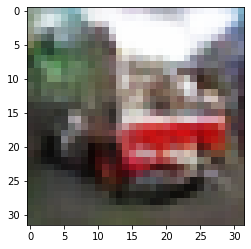

-> Epoch 293, Batch numero 1/78 -> Disc. loss on real images: 0.43316, Disc. loss on fake images: 0.46877, Generator loss: 2.14251
-> Epoch 293, Batch numero 2/78 -> Disc. loss on real images: 0.37414, Disc. loss on fake images: 0.71446, Generator loss: 2.49207
-> Epoch 293, Batch numero 3/78 -> Disc. loss on real images: 0.32643, Disc. loss on fake images: 0.25654, Generator loss: 2.60260
-> Epoch 293, Batch numero 4/78 -> Disc. loss on real images: 0.34626, Disc. loss on fake images: 0.41947, Generator loss: 2.15633
-> Epoch 293, Batch numero 5/78 -> Disc. loss on real images: 0.40534, Disc. loss on fake images: 0.44470, Generator loss: 2.43950
-> Epoch 293, Batch numero 6/78 -> Disc. loss on real images: 0.29914, Disc. loss on fake images: 0.24501, Generator loss: 2.24507
-> Epoch 293, Batch numero 7/78 -> Disc. loss on real images: 0.26204, Disc. loss on fake images: 0.50761, Generator loss: 2.53708
-> Epoch 293, Batch numero 8/78 -> Disc. loss on real images: 0.23934, Disc. loss o

-> Epoch 293, Batch numero 64/78 -> Disc. loss on real images: 0.45242, Disc. loss on fake images: 0.40990, Generator loss: 2.61122
-> Epoch 293, Batch numero 65/78 -> Disc. loss on real images: 0.22305, Disc. loss on fake images: 0.34375, Generator loss: 2.61870
-> Epoch 293, Batch numero 66/78 -> Disc. loss on real images: 0.41648, Disc. loss on fake images: 0.37987, Generator loss: 2.57178
-> Epoch 293, Batch numero 67/78 -> Disc. loss on real images: 0.21471, Disc. loss on fake images: 0.34234, Generator loss: 2.40423
-> Epoch 293, Batch numero 68/78 -> Disc. loss on real images: 0.25054, Disc. loss on fake images: 0.39480, Generator loss: 2.84389
-> Epoch 293, Batch numero 69/78 -> Disc. loss on real images: 0.36475, Disc. loss on fake images: 0.29617, Generator loss: 2.40402
-> Epoch 293, Batch numero 70/78 -> Disc. loss on real images: 0.35800, Disc. loss on fake images: 0.52586, Generator loss: 2.62239
-> Epoch 293, Batch numero 71/78 -> Disc. loss on real images: 0.47828, Disc

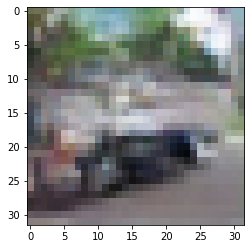

-> Epoch 294, Batch numero 1/78 -> Disc. loss on real images: 0.30507, Disc. loss on fake images: 0.26401, Generator loss: 2.11508
-> Epoch 294, Batch numero 2/78 -> Disc. loss on real images: 0.31757, Disc. loss on fake images: 0.44568, Generator loss: 2.50332
-> Epoch 294, Batch numero 3/78 -> Disc. loss on real images: 0.24880, Disc. loss on fake images: 0.44003, Generator loss: 2.70997
-> Epoch 294, Batch numero 4/78 -> Disc. loss on real images: 0.27861, Disc. loss on fake images: 0.36262, Generator loss: 2.85606
-> Epoch 294, Batch numero 5/78 -> Disc. loss on real images: 0.26996, Disc. loss on fake images: 0.35837, Generator loss: 2.62760
-> Epoch 294, Batch numero 6/78 -> Disc. loss on real images: 0.37150, Disc. loss on fake images: 0.21383, Generator loss: 2.27780
-> Epoch 294, Batch numero 7/78 -> Disc. loss on real images: 0.25355, Disc. loss on fake images: 0.64644, Generator loss: 2.26939
-> Epoch 294, Batch numero 8/78 -> Disc. loss on real images: 0.41041, Disc. loss o

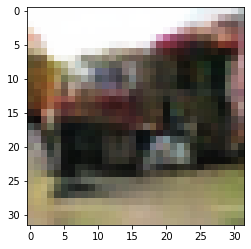

-> Epoch 295, Batch numero 1/78 -> Disc. loss on real images: 0.32110, Disc. loss on fake images: 0.32977, Generator loss: 2.38872
-> Epoch 295, Batch numero 2/78 -> Disc. loss on real images: 0.21010, Disc. loss on fake images: 0.38805, Generator loss: 2.65733
-> Epoch 295, Batch numero 3/78 -> Disc. loss on real images: 0.31168, Disc. loss on fake images: 0.31120, Generator loss: 2.67276
-> Epoch 295, Batch numero 4/78 -> Disc. loss on real images: 0.33353, Disc. loss on fake images: 0.35349, Generator loss: 2.75070
-> Epoch 295, Batch numero 5/78 -> Disc. loss on real images: 0.34914, Disc. loss on fake images: 0.28979, Generator loss: 2.29718
-> Epoch 295, Batch numero 6/78 -> Disc. loss on real images: 0.34208, Disc. loss on fake images: 0.42218, Generator loss: 2.70194
-> Epoch 295, Batch numero 7/78 -> Disc. loss on real images: 0.40882, Disc. loss on fake images: 0.27481, Generator loss: 2.12354
-> Epoch 295, Batch numero 8/78 -> Disc. loss on real images: 0.26626, Disc. loss o

-> Epoch 295, Batch numero 65/78 -> Disc. loss on real images: 0.26503, Disc. loss on fake images: 0.31711, Generator loss: 2.36492
-> Epoch 295, Batch numero 66/78 -> Disc. loss on real images: 0.23764, Disc. loss on fake images: 0.35207, Generator loss: 2.94380
-> Epoch 295, Batch numero 67/78 -> Disc. loss on real images: 0.34276, Disc. loss on fake images: 0.25902, Generator loss: 2.70518
-> Epoch 295, Batch numero 68/78 -> Disc. loss on real images: 0.42352, Disc. loss on fake images: 0.25407, Generator loss: 2.56296
-> Epoch 295, Batch numero 69/78 -> Disc. loss on real images: 0.29377, Disc. loss on fake images: 0.26731, Generator loss: 2.27271
-> Epoch 295, Batch numero 70/78 -> Disc. loss on real images: 0.33762, Disc. loss on fake images: 0.28484, Generator loss: 2.14178
-> Epoch 295, Batch numero 71/78 -> Disc. loss on real images: 0.18425, Disc. loss on fake images: 0.44159, Generator loss: 2.53593
-> Epoch 295, Batch numero 72/78 -> Disc. loss on real images: 0.30612, Disc

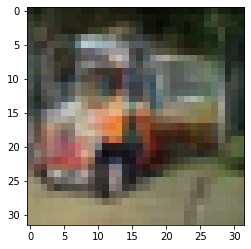

-> Epoch 296, Batch numero 1/78 -> Disc. loss on real images: 0.36691, Disc. loss on fake images: 0.25827, Generator loss: 2.37188
-> Epoch 296, Batch numero 2/78 -> Disc. loss on real images: 0.32002, Disc. loss on fake images: 0.11533, Generator loss: 1.99002
-> Epoch 296, Batch numero 3/78 -> Disc. loss on real images: 0.24667, Disc. loss on fake images: 0.32651, Generator loss: 2.03528
-> Epoch 296, Batch numero 4/78 -> Disc. loss on real images: 0.23670, Disc. loss on fake images: 0.60262, Generator loss: 2.57963
-> Epoch 296, Batch numero 5/78 -> Disc. loss on real images: 0.31897, Disc. loss on fake images: 0.35365, Generator loss: 2.60946
-> Epoch 296, Batch numero 6/78 -> Disc. loss on real images: 0.36706, Disc. loss on fake images: 0.31963, Generator loss: 2.77821
-> Epoch 296, Batch numero 7/78 -> Disc. loss on real images: 0.37144, Disc. loss on fake images: 0.40006, Generator loss: 2.42885
-> Epoch 296, Batch numero 8/78 -> Disc. loss on real images: 0.33781, Disc. loss o

-> Epoch 296, Batch numero 65/78 -> Disc. loss on real images: 0.41852, Disc. loss on fake images: 0.20723, Generator loss: 2.98624
-> Epoch 296, Batch numero 66/78 -> Disc. loss on real images: 0.49884, Disc. loss on fake images: 0.19952, Generator loss: 2.50580
-> Epoch 296, Batch numero 67/78 -> Disc. loss on real images: 0.26607, Disc. loss on fake images: 0.41748, Generator loss: 2.61515
-> Epoch 296, Batch numero 68/78 -> Disc. loss on real images: 0.22686, Disc. loss on fake images: 0.31519, Generator loss: 2.19698
-> Epoch 296, Batch numero 69/78 -> Disc. loss on real images: 0.50791, Disc. loss on fake images: 0.29551, Generator loss: 2.23620
-> Epoch 296, Batch numero 70/78 -> Disc. loss on real images: 0.28313, Disc. loss on fake images: 0.35087, Generator loss: 2.30226
-> Epoch 296, Batch numero 71/78 -> Disc. loss on real images: 0.24249, Disc. loss on fake images: 0.34456, Generator loss: 2.38694
-> Epoch 296, Batch numero 72/78 -> Disc. loss on real images: 0.25753, Disc

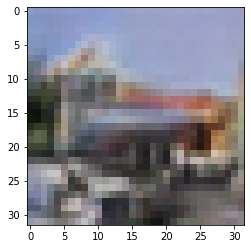

-> Epoch 297, Batch numero 1/78 -> Disc. loss on real images: 0.45967, Disc. loss on fake images: 0.41161, Generator loss: 2.52081
-> Epoch 297, Batch numero 2/78 -> Disc. loss on real images: 0.27771, Disc. loss on fake images: 0.26764, Generator loss: 2.53344
-> Epoch 297, Batch numero 3/78 -> Disc. loss on real images: 0.17192, Disc. loss on fake images: 0.45658, Generator loss: 2.94028
-> Epoch 297, Batch numero 4/78 -> Disc. loss on real images: 0.24451, Disc. loss on fake images: 0.31425, Generator loss: 2.56014
-> Epoch 297, Batch numero 5/78 -> Disc. loss on real images: 0.29064, Disc. loss on fake images: 0.20071, Generator loss: 2.46541
-> Epoch 297, Batch numero 6/78 -> Disc. loss on real images: 0.32666, Disc. loss on fake images: 0.49822, Generator loss: 2.89500
-> Epoch 297, Batch numero 7/78 -> Disc. loss on real images: 0.49574, Disc. loss on fake images: 0.31096, Generator loss: 2.53381
-> Epoch 297, Batch numero 8/78 -> Disc. loss on real images: 0.23605, Disc. loss o

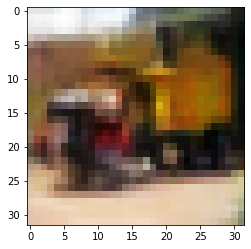

-> Epoch 298, Batch numero 1/78 -> Disc. loss on real images: 0.22177, Disc. loss on fake images: 0.21935, Generator loss: 2.28621
-> Epoch 298, Batch numero 2/78 -> Disc. loss on real images: 0.28252, Disc. loss on fake images: 0.43372, Generator loss: 2.41437
-> Epoch 298, Batch numero 3/78 -> Disc. loss on real images: 0.18876, Disc. loss on fake images: 0.33596, Generator loss: 2.47317
-> Epoch 298, Batch numero 4/78 -> Disc. loss on real images: 0.16008, Disc. loss on fake images: 0.27727, Generator loss: 2.58327
-> Epoch 298, Batch numero 5/78 -> Disc. loss on real images: 0.29641, Disc. loss on fake images: 0.30972, Generator loss: 2.65417
-> Epoch 298, Batch numero 6/78 -> Disc. loss on real images: 0.38044, Disc. loss on fake images: 0.42315, Generator loss: 2.31119
-> Epoch 298, Batch numero 7/78 -> Disc. loss on real images: 0.47132, Disc. loss on fake images: 0.35802, Generator loss: 2.31894
-> Epoch 298, Batch numero 8/78 -> Disc. loss on real images: 0.21209, Disc. loss o

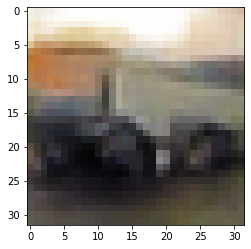

-> Epoch 299, Batch numero 1/78 -> Disc. loss on real images: 0.24271, Disc. loss on fake images: 0.51655, Generator loss: 2.19963
-> Epoch 299, Batch numero 2/78 -> Disc. loss on real images: 0.42998, Disc. loss on fake images: 0.57276, Generator loss: 2.37833
-> Epoch 299, Batch numero 3/78 -> Disc. loss on real images: 0.23918, Disc. loss on fake images: 0.36344, Generator loss: 2.70624
-> Epoch 299, Batch numero 4/78 -> Disc. loss on real images: 0.42979, Disc. loss on fake images: 0.95253, Generator loss: 2.76534
-> Epoch 299, Batch numero 5/78 -> Disc. loss on real images: 0.29343, Disc. loss on fake images: 0.22130, Generator loss: 2.91789
-> Epoch 299, Batch numero 6/78 -> Disc. loss on real images: 0.45648, Disc. loss on fake images: 0.21927, Generator loss: 2.49067
-> Epoch 299, Batch numero 7/78 -> Disc. loss on real images: 0.46760, Disc. loss on fake images: 0.33064, Generator loss: 2.36551
-> Epoch 299, Batch numero 8/78 -> Disc. loss on real images: 0.24734, Disc. loss o

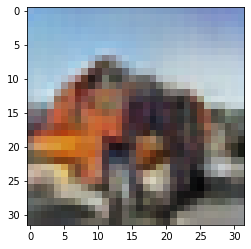

-> Epoch 300, Batch numero 1/78 -> Disc. loss on real images: 0.19092, Disc. loss on fake images: 0.30870, Generator loss: 2.20696
-> Epoch 300, Batch numero 2/78 -> Disc. loss on real images: 0.27545, Disc. loss on fake images: 0.58631, Generator loss: 2.69563
-> Epoch 300, Batch numero 3/78 -> Disc. loss on real images: 0.43796, Disc. loss on fake images: 0.17035, Generator loss: 2.60792
-> Epoch 300, Batch numero 4/78 -> Disc. loss on real images: 0.31030, Disc. loss on fake images: 0.29380, Generator loss: 2.83053
-> Epoch 300, Batch numero 5/78 -> Disc. loss on real images: 0.23483, Disc. loss on fake images: 0.22371, Generator loss: 2.79868
-> Epoch 300, Batch numero 6/78 -> Disc. loss on real images: 0.17137, Disc. loss on fake images: 0.21524, Generator loss: 2.74902
-> Epoch 300, Batch numero 7/78 -> Disc. loss on real images: 0.35655, Disc. loss on fake images: 0.30634, Generator loss: 2.37552
-> Epoch 300, Batch numero 8/78 -> Disc. loss on real images: 0.28391, Disc. loss o

-> Epoch 300, Batch numero 64/78 -> Disc. loss on real images: 0.27000, Disc. loss on fake images: 0.26968, Generator loss: 2.33257
-> Epoch 300, Batch numero 65/78 -> Disc. loss on real images: 0.30127, Disc. loss on fake images: 0.38801, Generator loss: 2.44468
-> Epoch 300, Batch numero 66/78 -> Disc. loss on real images: 0.45302, Disc. loss on fake images: 0.67268, Generator loss: 2.30645
-> Epoch 300, Batch numero 67/78 -> Disc. loss on real images: 0.31560, Disc. loss on fake images: 0.26311, Generator loss: 2.31704
-> Epoch 300, Batch numero 68/78 -> Disc. loss on real images: 0.36133, Disc. loss on fake images: 0.32107, Generator loss: 2.65727
-> Epoch 300, Batch numero 69/78 -> Disc. loss on real images: 0.35021, Disc. loss on fake images: 0.30774, Generator loss: 2.16849
-> Epoch 300, Batch numero 70/78 -> Disc. loss on real images: 0.35333, Disc. loss on fake images: 0.49136, Generator loss: 2.19626
-> Epoch 300, Batch numero 71/78 -> Disc. loss on real images: 0.21353, Disc

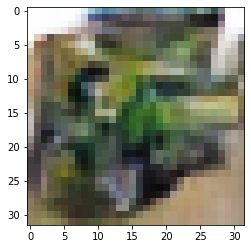

-> Epoch 301, Batch numero 1/78 -> Disc. loss on real images: 0.39236, Disc. loss on fake images: 0.38391, Generator loss: 2.73600
-> Epoch 301, Batch numero 2/78 -> Disc. loss on real images: 0.38420, Disc. loss on fake images: 0.24838, Generator loss: 2.43337
-> Epoch 301, Batch numero 3/78 -> Disc. loss on real images: 0.25472, Disc. loss on fake images: 0.25370, Generator loss: 2.23759
-> Epoch 301, Batch numero 4/78 -> Disc. loss on real images: 0.16979, Disc. loss on fake images: 0.27143, Generator loss: 2.43215
-> Epoch 301, Batch numero 5/78 -> Disc. loss on real images: 0.26088, Disc. loss on fake images: 0.19754, Generator loss: 2.20034
-> Epoch 301, Batch numero 6/78 -> Disc. loss on real images: 0.22119, Disc. loss on fake images: 0.28070, Generator loss: 2.06073
-> Epoch 301, Batch numero 7/78 -> Disc. loss on real images: 0.28160, Disc. loss on fake images: 0.42112, Generator loss: 2.38396
-> Epoch 301, Batch numero 8/78 -> Disc. loss on real images: 0.43859, Disc. loss o

-> Epoch 301, Batch numero 65/78 -> Disc. loss on real images: 0.22423, Disc. loss on fake images: 0.60638, Generator loss: 2.29955
-> Epoch 301, Batch numero 66/78 -> Disc. loss on real images: 0.32607, Disc. loss on fake images: 0.31493, Generator loss: 2.87603
-> Epoch 301, Batch numero 67/78 -> Disc. loss on real images: 0.37787, Disc. loss on fake images: 0.34626, Generator loss: 2.65429
-> Epoch 301, Batch numero 68/78 -> Disc. loss on real images: 0.37267, Disc. loss on fake images: 0.22590, Generator loss: 2.07476
-> Epoch 301, Batch numero 69/78 -> Disc. loss on real images: 0.43767, Disc. loss on fake images: 0.45808, Generator loss: 2.07598
-> Epoch 301, Batch numero 70/78 -> Disc. loss on real images: 0.33009, Disc. loss on fake images: 0.30792, Generator loss: 2.54640
-> Epoch 301, Batch numero 71/78 -> Disc. loss on real images: 0.24181, Disc. loss on fake images: 0.33150, Generator loss: 2.88342
-> Epoch 301, Batch numero 72/78 -> Disc. loss on real images: 0.32526, Disc

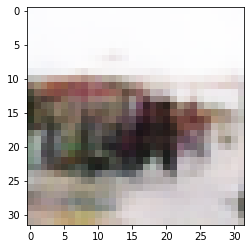

-> Epoch 302, Batch numero 1/78 -> Disc. loss on real images: 0.27080, Disc. loss on fake images: 0.34704, Generator loss: 2.43428
-> Epoch 302, Batch numero 2/78 -> Disc. loss on real images: 0.33707, Disc. loss on fake images: 0.29022, Generator loss: 2.92648
-> Epoch 302, Batch numero 3/78 -> Disc. loss on real images: 0.44791, Disc. loss on fake images: 0.47467, Generator loss: 2.78029
-> Epoch 302, Batch numero 4/78 -> Disc. loss on real images: 0.19295, Disc. loss on fake images: 0.32553, Generator loss: 2.76065
-> Epoch 302, Batch numero 5/78 -> Disc. loss on real images: 0.42655, Disc. loss on fake images: 0.26340, Generator loss: 1.98591
-> Epoch 302, Batch numero 6/78 -> Disc. loss on real images: 0.25273, Disc. loss on fake images: 0.34995, Generator loss: 2.98993
-> Epoch 302, Batch numero 7/78 -> Disc. loss on real images: 0.34275, Disc. loss on fake images: 0.20528, Generator loss: 2.50372
-> Epoch 302, Batch numero 8/78 -> Disc. loss on real images: 0.24298, Disc. loss o

-> Epoch 302, Batch numero 65/78 -> Disc. loss on real images: 0.36692, Disc. loss on fake images: 0.37389, Generator loss: 2.03384
-> Epoch 302, Batch numero 66/78 -> Disc. loss on real images: 0.20375, Disc. loss on fake images: 0.34216, Generator loss: 2.51026
-> Epoch 302, Batch numero 67/78 -> Disc. loss on real images: 0.21703, Disc. loss on fake images: 0.19473, Generator loss: 2.20328
-> Epoch 302, Batch numero 68/78 -> Disc. loss on real images: 0.26439, Disc. loss on fake images: 0.30239, Generator loss: 2.38285
-> Epoch 302, Batch numero 69/78 -> Disc. loss on real images: 0.41775, Disc. loss on fake images: 0.58112, Generator loss: 2.47119
-> Epoch 302, Batch numero 70/78 -> Disc. loss on real images: 0.26254, Disc. loss on fake images: 0.25316, Generator loss: 2.75316
-> Epoch 302, Batch numero 71/78 -> Disc. loss on real images: 0.32115, Disc. loss on fake images: 0.35050, Generator loss: 2.81427
-> Epoch 302, Batch numero 72/78 -> Disc. loss on real images: 0.28915, Disc

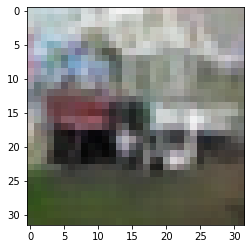

-> Epoch 303, Batch numero 1/78 -> Disc. loss on real images: 0.25482, Disc. loss on fake images: 0.34831, Generator loss: 2.70231
-> Epoch 303, Batch numero 2/78 -> Disc. loss on real images: 0.37902, Disc. loss on fake images: 0.39622, Generator loss: 2.54592
-> Epoch 303, Batch numero 3/78 -> Disc. loss on real images: 0.30044, Disc. loss on fake images: 0.23334, Generator loss: 2.92801
-> Epoch 303, Batch numero 4/78 -> Disc. loss on real images: 0.50242, Disc. loss on fake images: 0.28165, Generator loss: 2.31087
-> Epoch 303, Batch numero 5/78 -> Disc. loss on real images: 0.16180, Disc. loss on fake images: 0.38830, Generator loss: 2.46487
-> Epoch 303, Batch numero 6/78 -> Disc. loss on real images: 0.25417, Disc. loss on fake images: 0.28092, Generator loss: 2.25324
-> Epoch 303, Batch numero 7/78 -> Disc. loss on real images: 0.35803, Disc. loss on fake images: 0.42034, Generator loss: 2.27939
-> Epoch 303, Batch numero 8/78 -> Disc. loss on real images: 0.21256, Disc. loss o

-> Epoch 303, Batch numero 64/78 -> Disc. loss on real images: 0.13526, Disc. loss on fake images: 0.33214, Generator loss: 2.68242
-> Epoch 303, Batch numero 65/78 -> Disc. loss on real images: 0.26930, Disc. loss on fake images: 0.46260, Generator loss: 2.52679
-> Epoch 303, Batch numero 66/78 -> Disc. loss on real images: 0.30429, Disc. loss on fake images: 0.22838, Generator loss: 2.68950
-> Epoch 303, Batch numero 67/78 -> Disc. loss on real images: 0.23691, Disc. loss on fake images: 0.24951, Generator loss: 2.29482
-> Epoch 303, Batch numero 68/78 -> Disc. loss on real images: 0.31094, Disc. loss on fake images: 0.37200, Generator loss: 2.89329
-> Epoch 303, Batch numero 69/78 -> Disc. loss on real images: 0.23105, Disc. loss on fake images: 0.25139, Generator loss: 2.54107
-> Epoch 303, Batch numero 70/78 -> Disc. loss on real images: 0.55669, Disc. loss on fake images: 0.39600, Generator loss: 2.61466
-> Epoch 303, Batch numero 71/78 -> Disc. loss on real images: 0.28367, Disc

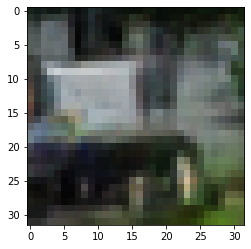

-> Epoch 304, Batch numero 1/78 -> Disc. loss on real images: 0.25162, Disc. loss on fake images: 0.19263, Generator loss: 2.16093
-> Epoch 304, Batch numero 2/78 -> Disc. loss on real images: 0.46671, Disc. loss on fake images: 0.26785, Generator loss: 1.98507
-> Epoch 304, Batch numero 3/78 -> Disc. loss on real images: 0.19896, Disc. loss on fake images: 0.41435, Generator loss: 2.42093
-> Epoch 304, Batch numero 4/78 -> Disc. loss on real images: 0.29496, Disc. loss on fake images: 0.21964, Generator loss: 2.45324
-> Epoch 304, Batch numero 5/78 -> Disc. loss on real images: 0.32274, Disc. loss on fake images: 0.45667, Generator loss: 2.50517
-> Epoch 304, Batch numero 6/78 -> Disc. loss on real images: 0.21633, Disc. loss on fake images: 0.32120, Generator loss: 3.06631
-> Epoch 304, Batch numero 7/78 -> Disc. loss on real images: 0.46350, Disc. loss on fake images: 0.22406, Generator loss: 2.78419
-> Epoch 304, Batch numero 8/78 -> Disc. loss on real images: 0.32766, Disc. loss o

-> Epoch 304, Batch numero 65/78 -> Disc. loss on real images: 0.24812, Disc. loss on fake images: 0.38110, Generator loss: 2.70256
-> Epoch 304, Batch numero 66/78 -> Disc. loss on real images: 0.30974, Disc. loss on fake images: 0.28187, Generator loss: 2.53916
-> Epoch 304, Batch numero 67/78 -> Disc. loss on real images: 0.22963, Disc. loss on fake images: 0.36482, Generator loss: 2.25252
-> Epoch 304, Batch numero 68/78 -> Disc. loss on real images: 0.21625, Disc. loss on fake images: 0.24046, Generator loss: 2.70627
-> Epoch 304, Batch numero 69/78 -> Disc. loss on real images: 0.26569, Disc. loss on fake images: 0.35579, Generator loss: 2.53424
-> Epoch 304, Batch numero 70/78 -> Disc. loss on real images: 0.28069, Disc. loss on fake images: 0.19187, Generator loss: 2.30471
-> Epoch 304, Batch numero 71/78 -> Disc. loss on real images: 0.23682, Disc. loss on fake images: 0.20828, Generator loss: 2.66066
-> Epoch 304, Batch numero 72/78 -> Disc. loss on real images: 0.15479, Disc

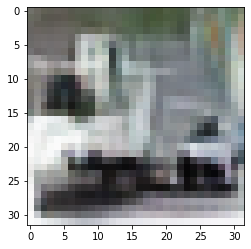

-> Epoch 305, Batch numero 1/78 -> Disc. loss on real images: 0.28798, Disc. loss on fake images: 0.22022, Generator loss: 2.37043
-> Epoch 305, Batch numero 2/78 -> Disc. loss on real images: 0.26361, Disc. loss on fake images: 0.21147, Generator loss: 2.35326
-> Epoch 305, Batch numero 3/78 -> Disc. loss on real images: 0.28389, Disc. loss on fake images: 0.47631, Generator loss: 2.63200
-> Epoch 305, Batch numero 4/78 -> Disc. loss on real images: 0.31934, Disc. loss on fake images: 0.16749, Generator loss: 2.32986
-> Epoch 305, Batch numero 5/78 -> Disc. loss on real images: 0.24590, Disc. loss on fake images: 0.39554, Generator loss: 2.39794
-> Epoch 305, Batch numero 6/78 -> Disc. loss on real images: 0.24018, Disc. loss on fake images: 0.37857, Generator loss: 2.67608
-> Epoch 305, Batch numero 7/78 -> Disc. loss on real images: 0.32212, Disc. loss on fake images: 0.18250, Generator loss: 2.27648
-> Epoch 305, Batch numero 8/78 -> Disc. loss on real images: 0.26248, Disc. loss o

-> Epoch 305, Batch numero 65/78 -> Disc. loss on real images: 0.56668, Disc. loss on fake images: 0.57136, Generator loss: 2.28490
-> Epoch 305, Batch numero 66/78 -> Disc. loss on real images: 0.20221, Disc. loss on fake images: 0.45472, Generator loss: 2.66325
-> Epoch 305, Batch numero 67/78 -> Disc. loss on real images: 0.21363, Disc. loss on fake images: 0.50029, Generator loss: 3.12825
-> Epoch 305, Batch numero 68/78 -> Disc. loss on real images: 0.57415, Disc. loss on fake images: 0.18648, Generator loss: 2.66437
-> Epoch 305, Batch numero 69/78 -> Disc. loss on real images: 0.36030, Disc. loss on fake images: 0.36668, Generator loss: 2.35120
-> Epoch 305, Batch numero 70/78 -> Disc. loss on real images: 0.40751, Disc. loss on fake images: 0.26042, Generator loss: 2.54404
-> Epoch 305, Batch numero 71/78 -> Disc. loss on real images: 0.31910, Disc. loss on fake images: 0.21993, Generator loss: 2.18312
-> Epoch 305, Batch numero 72/78 -> Disc. loss on real images: 0.18792, Disc

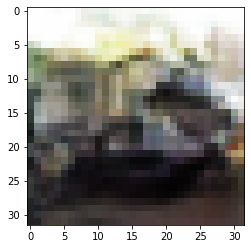

-> Epoch 306, Batch numero 1/78 -> Disc. loss on real images: 0.35473, Disc. loss on fake images: 0.48619, Generator loss: 2.54700
-> Epoch 306, Batch numero 2/78 -> Disc. loss on real images: 0.28724, Disc. loss on fake images: 0.37977, Generator loss: 2.70766
-> Epoch 306, Batch numero 3/78 -> Disc. loss on real images: 0.49123, Disc. loss on fake images: 0.25830, Generator loss: 2.18506
-> Epoch 306, Batch numero 4/78 -> Disc. loss on real images: 0.20793, Disc. loss on fake images: 0.29948, Generator loss: 2.63857
-> Epoch 306, Batch numero 5/78 -> Disc. loss on real images: 0.29861, Disc. loss on fake images: 0.48566, Generator loss: 2.75329
-> Epoch 306, Batch numero 6/78 -> Disc. loss on real images: 0.33001, Disc. loss on fake images: 0.26690, Generator loss: 3.08745
-> Epoch 306, Batch numero 7/78 -> Disc. loss on real images: 0.40329, Disc. loss on fake images: 0.29872, Generator loss: 2.86595
-> Epoch 306, Batch numero 8/78 -> Disc. loss on real images: 0.22619, Disc. loss o

-> Epoch 306, Batch numero 64/78 -> Disc. loss on real images: 0.42320, Disc. loss on fake images: 0.26500, Generator loss: 2.39079
-> Epoch 306, Batch numero 65/78 -> Disc. loss on real images: 0.12376, Disc. loss on fake images: 0.37630, Generator loss: 2.62668
-> Epoch 306, Batch numero 66/78 -> Disc. loss on real images: 0.22891, Disc. loss on fake images: 0.22427, Generator loss: 2.63078
-> Epoch 306, Batch numero 67/78 -> Disc. loss on real images: 0.29256, Disc. loss on fake images: 0.24959, Generator loss: 2.51506
-> Epoch 306, Batch numero 68/78 -> Disc. loss on real images: 0.34151, Disc. loss on fake images: 0.28420, Generator loss: 2.53428
-> Epoch 306, Batch numero 69/78 -> Disc. loss on real images: 0.27316, Disc. loss on fake images: 0.30789, Generator loss: 2.73079
-> Epoch 306, Batch numero 70/78 -> Disc. loss on real images: 0.38945, Disc. loss on fake images: 0.35969, Generator loss: 2.55798
-> Epoch 306, Batch numero 71/78 -> Disc. loss on real images: 0.21701, Disc

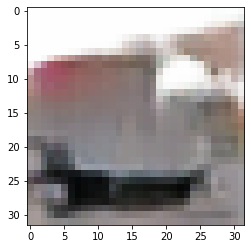

-> Epoch 307, Batch numero 1/78 -> Disc. loss on real images: 0.29649, Disc. loss on fake images: 0.49986, Generator loss: 2.99378
-> Epoch 307, Batch numero 2/78 -> Disc. loss on real images: 0.36279, Disc. loss on fake images: 0.19051, Generator loss: 2.69533
-> Epoch 307, Batch numero 3/78 -> Disc. loss on real images: 0.25309, Disc. loss on fake images: 0.25961, Generator loss: 2.77694
-> Epoch 307, Batch numero 4/78 -> Disc. loss on real images: 0.25380, Disc. loss on fake images: 0.26301, Generator loss: 2.53843
-> Epoch 307, Batch numero 5/78 -> Disc. loss on real images: 0.40103, Disc. loss on fake images: 0.23121, Generator loss: 2.06250
-> Epoch 307, Batch numero 6/78 -> Disc. loss on real images: 0.31435, Disc. loss on fake images: 0.31077, Generator loss: 1.88382
-> Epoch 307, Batch numero 7/78 -> Disc. loss on real images: 0.26362, Disc. loss on fake images: 0.47933, Generator loss: 2.47914
-> Epoch 307, Batch numero 8/78 -> Disc. loss on real images: 0.31490, Disc. loss o

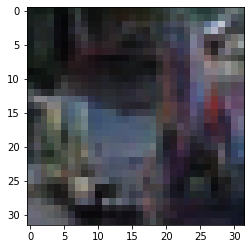

-> Epoch 308, Batch numero 1/78 -> Disc. loss on real images: 0.28363, Disc. loss on fake images: 0.33191, Generator loss: 2.44241
-> Epoch 308, Batch numero 2/78 -> Disc. loss on real images: 0.35062, Disc. loss on fake images: 0.36061, Generator loss: 2.39488
-> Epoch 308, Batch numero 3/78 -> Disc. loss on real images: 0.40686, Disc. loss on fake images: 0.69620, Generator loss: 2.24143
-> Epoch 308, Batch numero 4/78 -> Disc. loss on real images: 0.29341, Disc. loss on fake images: 0.18976, Generator loss: 2.54747
-> Epoch 308, Batch numero 5/78 -> Disc. loss on real images: 0.22747, Disc. loss on fake images: 0.33589, Generator loss: 2.51180
-> Epoch 308, Batch numero 6/78 -> Disc. loss on real images: 0.40185, Disc. loss on fake images: 0.38915, Generator loss: 2.45711
-> Epoch 308, Batch numero 7/78 -> Disc. loss on real images: 0.30221, Disc. loss on fake images: 0.37011, Generator loss: 2.49831
-> Epoch 308, Batch numero 8/78 -> Disc. loss on real images: 0.17908, Disc. loss o

-> Epoch 308, Batch numero 65/78 -> Disc. loss on real images: 0.37716, Disc. loss on fake images: 0.44751, Generator loss: 2.32175
-> Epoch 308, Batch numero 66/78 -> Disc. loss on real images: 0.33553, Disc. loss on fake images: 0.31791, Generator loss: 2.63116
-> Epoch 308, Batch numero 67/78 -> Disc. loss on real images: 0.29725, Disc. loss on fake images: 0.26867, Generator loss: 2.36200
-> Epoch 308, Batch numero 68/78 -> Disc. loss on real images: 0.22269, Disc. loss on fake images: 0.33379, Generator loss: 2.66835
-> Epoch 308, Batch numero 69/78 -> Disc. loss on real images: 0.24930, Disc. loss on fake images: 0.22425, Generator loss: 2.50029
-> Epoch 308, Batch numero 70/78 -> Disc. loss on real images: 0.22342, Disc. loss on fake images: 0.24922, Generator loss: 2.10112
-> Epoch 308, Batch numero 71/78 -> Disc. loss on real images: 0.19974, Disc. loss on fake images: 0.40621, Generator loss: 2.73271
-> Epoch 308, Batch numero 72/78 -> Disc. loss on real images: 0.30436, Disc

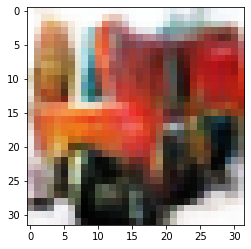

-> Epoch 309, Batch numero 1/78 -> Disc. loss on real images: 0.22342, Disc. loss on fake images: 0.12048, Generator loss: 2.79178
-> Epoch 309, Batch numero 2/78 -> Disc. loss on real images: 0.18856, Disc. loss on fake images: 0.39956, Generator loss: 2.65907
-> Epoch 309, Batch numero 3/78 -> Disc. loss on real images: 0.21206, Disc. loss on fake images: 0.26973, Generator loss: 3.00199
-> Epoch 309, Batch numero 4/78 -> Disc. loss on real images: 0.34368, Disc. loss on fake images: 0.18266, Generator loss: 2.72330
-> Epoch 309, Batch numero 5/78 -> Disc. loss on real images: 0.35383, Disc. loss on fake images: 0.28028, Generator loss: 2.40518
-> Epoch 309, Batch numero 6/78 -> Disc. loss on real images: 0.30564, Disc. loss on fake images: 0.34170, Generator loss: 2.43060
-> Epoch 309, Batch numero 7/78 -> Disc. loss on real images: 0.38773, Disc. loss on fake images: 0.41965, Generator loss: 2.77986
-> Epoch 309, Batch numero 8/78 -> Disc. loss on real images: 0.19918, Disc. loss o

-> Epoch 309, Batch numero 65/78 -> Disc. loss on real images: 0.36398, Disc. loss on fake images: 0.20284, Generator loss: 2.77194
-> Epoch 309, Batch numero 66/78 -> Disc. loss on real images: 0.19540, Disc. loss on fake images: 0.23667, Generator loss: 2.51363
-> Epoch 309, Batch numero 67/78 -> Disc. loss on real images: 0.24103, Disc. loss on fake images: 0.27450, Generator loss: 2.65423
-> Epoch 309, Batch numero 68/78 -> Disc. loss on real images: 0.29558, Disc. loss on fake images: 0.34939, Generator loss: 2.38990
-> Epoch 309, Batch numero 69/78 -> Disc. loss on real images: 0.40234, Disc. loss on fake images: 0.31629, Generator loss: 2.32300
-> Epoch 309, Batch numero 70/78 -> Disc. loss on real images: 0.35315, Disc. loss on fake images: 0.46264, Generator loss: 2.43753
-> Epoch 309, Batch numero 71/78 -> Disc. loss on real images: 0.21464, Disc. loss on fake images: 0.21493, Generator loss: 2.67982
-> Epoch 309, Batch numero 72/78 -> Disc. loss on real images: 0.29582, Disc

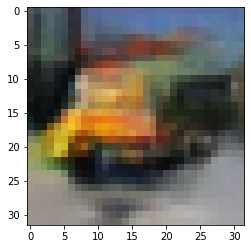

-> Epoch 310, Batch numero 1/78 -> Disc. loss on real images: 0.38591, Disc. loss on fake images: 0.35511, Generator loss: 2.71960
-> Epoch 310, Batch numero 2/78 -> Disc. loss on real images: 0.27516, Disc. loss on fake images: 0.21506, Generator loss: 2.87208
-> Epoch 310, Batch numero 3/78 -> Disc. loss on real images: 0.29238, Disc. loss on fake images: 0.30823, Generator loss: 2.46433
-> Epoch 310, Batch numero 4/78 -> Disc. loss on real images: 0.25364, Disc. loss on fake images: 0.25063, Generator loss: 2.71946
-> Epoch 310, Batch numero 5/78 -> Disc. loss on real images: 0.19702, Disc. loss on fake images: 0.44389, Generator loss: 2.93485
-> Epoch 310, Batch numero 6/78 -> Disc. loss on real images: 0.24959, Disc. loss on fake images: 0.19708, Generator loss: 2.93788
-> Epoch 310, Batch numero 7/78 -> Disc. loss on real images: 0.40413, Disc. loss on fake images: 0.41044, Generator loss: 3.18980
-> Epoch 310, Batch numero 8/78 -> Disc. loss on real images: 0.26561, Disc. loss o

-> Epoch 310, Batch numero 64/78 -> Disc. loss on real images: 0.37875, Disc. loss on fake images: 0.39381, Generator loss: 2.53669
-> Epoch 310, Batch numero 65/78 -> Disc. loss on real images: 0.34967, Disc. loss on fake images: 0.33532, Generator loss: 2.61477
-> Epoch 310, Batch numero 66/78 -> Disc. loss on real images: 0.21771, Disc. loss on fake images: 0.19946, Generator loss: 2.62096
-> Epoch 310, Batch numero 67/78 -> Disc. loss on real images: 0.32421, Disc. loss on fake images: 0.41355, Generator loss: 2.53494
-> Epoch 310, Batch numero 68/78 -> Disc. loss on real images: 0.35963, Disc. loss on fake images: 0.30299, Generator loss: 2.74988
-> Epoch 310, Batch numero 69/78 -> Disc. loss on real images: 0.41994, Disc. loss on fake images: 0.41364, Generator loss: 2.38210
-> Epoch 310, Batch numero 70/78 -> Disc. loss on real images: 0.17025, Disc. loss on fake images: 0.39307, Generator loss: 2.93198
-> Epoch 310, Batch numero 71/78 -> Disc. loss on real images: 0.33164, Disc

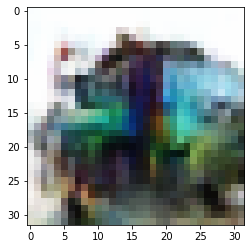

-> Epoch 311, Batch numero 1/78 -> Disc. loss on real images: 0.34028, Disc. loss on fake images: 0.57990, Generator loss: 2.41424
-> Epoch 311, Batch numero 2/78 -> Disc. loss on real images: 0.28330, Disc. loss on fake images: 0.40738, Generator loss: 2.80676
-> Epoch 311, Batch numero 3/78 -> Disc. loss on real images: 0.35411, Disc. loss on fake images: 0.17589, Generator loss: 2.77800
-> Epoch 311, Batch numero 4/78 -> Disc. loss on real images: 0.23857, Disc. loss on fake images: 0.23526, Generator loss: 2.60229
-> Epoch 311, Batch numero 5/78 -> Disc. loss on real images: 0.37195, Disc. loss on fake images: 0.45258, Generator loss: 2.45631
-> Epoch 311, Batch numero 6/78 -> Disc. loss on real images: 0.30014, Disc. loss on fake images: 0.24740, Generator loss: 2.47864
-> Epoch 311, Batch numero 7/78 -> Disc. loss on real images: 0.30186, Disc. loss on fake images: 0.18872, Generator loss: 2.40716
-> Epoch 311, Batch numero 8/78 -> Disc. loss on real images: 0.32030, Disc. loss o

-> Epoch 311, Batch numero 65/78 -> Disc. loss on real images: 0.54343, Disc. loss on fake images: 0.59593, Generator loss: 2.75304
-> Epoch 311, Batch numero 66/78 -> Disc. loss on real images: 0.29269, Disc. loss on fake images: 0.25978, Generator loss: 3.28010
-> Epoch 311, Batch numero 67/78 -> Disc. loss on real images: 0.34975, Disc. loss on fake images: 0.29026, Generator loss: 2.95368
-> Epoch 311, Batch numero 68/78 -> Disc. loss on real images: 0.27039, Disc. loss on fake images: 0.25811, Generator loss: 2.61415
-> Epoch 311, Batch numero 69/78 -> Disc. loss on real images: 0.59783, Disc. loss on fake images: 0.32667, Generator loss: 2.10764
-> Epoch 311, Batch numero 70/78 -> Disc. loss on real images: 0.15839, Disc. loss on fake images: 0.47572, Generator loss: 2.52811
-> Epoch 311, Batch numero 71/78 -> Disc. loss on real images: 0.30000, Disc. loss on fake images: 0.44186, Generator loss: 2.72184
-> Epoch 311, Batch numero 72/78 -> Disc. loss on real images: 0.40849, Disc

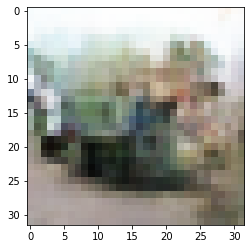

-> Epoch 312, Batch numero 1/78 -> Disc. loss on real images: 0.24483, Disc. loss on fake images: 0.39497, Generator loss: 2.64431
-> Epoch 312, Batch numero 2/78 -> Disc. loss on real images: 0.20741, Disc. loss on fake images: 0.16407, Generator loss: 2.45475
-> Epoch 312, Batch numero 3/78 -> Disc. loss on real images: 0.50119, Disc. loss on fake images: 0.37820, Generator loss: 2.38074
-> Epoch 312, Batch numero 4/78 -> Disc. loss on real images: 0.23882, Disc. loss on fake images: 0.26790, Generator loss: 2.26395
-> Epoch 312, Batch numero 5/78 -> Disc. loss on real images: 0.22224, Disc. loss on fake images: 0.41624, Generator loss: 2.29640
-> Epoch 312, Batch numero 6/78 -> Disc. loss on real images: 0.45497, Disc. loss on fake images: 0.38062, Generator loss: 2.49164
-> Epoch 312, Batch numero 7/78 -> Disc. loss on real images: 0.24896, Disc. loss on fake images: 0.21867, Generator loss: 2.63875
-> Epoch 312, Batch numero 8/78 -> Disc. loss on real images: 0.29551, Disc. loss o

-> Epoch 312, Batch numero 65/78 -> Disc. loss on real images: 0.37672, Disc. loss on fake images: 0.35708, Generator loss: 2.84954
-> Epoch 312, Batch numero 66/78 -> Disc. loss on real images: 0.32598, Disc. loss on fake images: 0.16928, Generator loss: 2.93619
-> Epoch 312, Batch numero 67/78 -> Disc. loss on real images: 0.39474, Disc. loss on fake images: 0.30193, Generator loss: 2.44957
-> Epoch 312, Batch numero 68/78 -> Disc. loss on real images: 0.24569, Disc. loss on fake images: 0.29033, Generator loss: 2.62032
-> Epoch 312, Batch numero 69/78 -> Disc. loss on real images: 0.17316, Disc. loss on fake images: 0.37045, Generator loss: 2.63723
-> Epoch 312, Batch numero 70/78 -> Disc. loss on real images: 0.38251, Disc. loss on fake images: 0.19388, Generator loss: 2.50674
-> Epoch 312, Batch numero 71/78 -> Disc. loss on real images: 0.30049, Disc. loss on fake images: 0.18273, Generator loss: 2.49859
-> Epoch 312, Batch numero 72/78 -> Disc. loss on real images: 0.17421, Disc

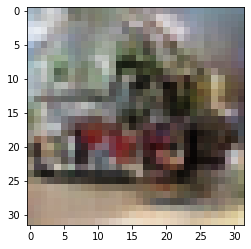

-> Epoch 313, Batch numero 1/78 -> Disc. loss on real images: 0.30358, Disc. loss on fake images: 0.38033, Generator loss: 2.50304
-> Epoch 313, Batch numero 2/78 -> Disc. loss on real images: 0.32848, Disc. loss on fake images: 0.30101, Generator loss: 2.79757
-> Epoch 313, Batch numero 3/78 -> Disc. loss on real images: 0.29247, Disc. loss on fake images: 0.30573, Generator loss: 3.12455
-> Epoch 313, Batch numero 4/78 -> Disc. loss on real images: 0.43371, Disc. loss on fake images: 0.36668, Generator loss: 2.37964
-> Epoch 313, Batch numero 5/78 -> Disc. loss on real images: 0.19550, Disc. loss on fake images: 0.19145, Generator loss: 2.49390
-> Epoch 313, Batch numero 6/78 -> Disc. loss on real images: 0.19876, Disc. loss on fake images: 0.40532, Generator loss: 2.68065
-> Epoch 313, Batch numero 7/78 -> Disc. loss on real images: 0.56842, Disc. loss on fake images: 0.41916, Generator loss: 2.35593
-> Epoch 313, Batch numero 8/78 -> Disc. loss on real images: 0.49066, Disc. loss o

-> Epoch 313, Batch numero 64/78 -> Disc. loss on real images: 0.59171, Disc. loss on fake images: 0.11547, Generator loss: 2.16119
-> Epoch 313, Batch numero 65/78 -> Disc. loss on real images: 0.10987, Disc. loss on fake images: 0.32081, Generator loss: 2.24049
-> Epoch 313, Batch numero 66/78 -> Disc. loss on real images: 0.18670, Disc. loss on fake images: 0.50791, Generator loss: 2.34019
-> Epoch 313, Batch numero 67/78 -> Disc. loss on real images: 0.13615, Disc. loss on fake images: 0.55206, Generator loss: 3.15645
-> Epoch 313, Batch numero 68/78 -> Disc. loss on real images: 0.36294, Disc. loss on fake images: 0.20272, Generator loss: 3.44053
-> Epoch 313, Batch numero 69/78 -> Disc. loss on real images: 0.38609, Disc. loss on fake images: 0.32091, Generator loss: 2.95733
-> Epoch 313, Batch numero 70/78 -> Disc. loss on real images: 0.26978, Disc. loss on fake images: 0.23259, Generator loss: 2.99341
-> Epoch 313, Batch numero 71/78 -> Disc. loss on real images: 0.30932, Disc

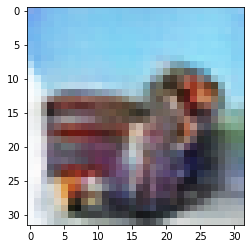

-> Epoch 314, Batch numero 1/78 -> Disc. loss on real images: 0.33063, Disc. loss on fake images: 0.34169, Generator loss: 2.54845
-> Epoch 314, Batch numero 2/78 -> Disc. loss on real images: 0.24701, Disc. loss on fake images: 0.16801, Generator loss: 2.31541
-> Epoch 314, Batch numero 3/78 -> Disc. loss on real images: 0.17203, Disc. loss on fake images: 0.36524, Generator loss: 2.62007
-> Epoch 314, Batch numero 4/78 -> Disc. loss on real images: 0.16295, Disc. loss on fake images: 0.40025, Generator loss: 3.14786
-> Epoch 314, Batch numero 5/78 -> Disc. loss on real images: 0.45234, Disc. loss on fake images: 0.34962, Generator loss: 2.63219
-> Epoch 314, Batch numero 6/78 -> Disc. loss on real images: 0.33822, Disc. loss on fake images: 0.33546, Generator loss: 2.96866
-> Epoch 314, Batch numero 7/78 -> Disc. loss on real images: 0.16297, Disc. loss on fake images: 0.31465, Generator loss: 3.00383
-> Epoch 314, Batch numero 8/78 -> Disc. loss on real images: 0.37211, Disc. loss o

-> Epoch 314, Batch numero 64/78 -> Disc. loss on real images: 0.19523, Disc. loss on fake images: 0.37414, Generator loss: 2.63719
-> Epoch 314, Batch numero 65/78 -> Disc. loss on real images: 0.26326, Disc. loss on fake images: 0.16407, Generator loss: 2.59764
-> Epoch 314, Batch numero 66/78 -> Disc. loss on real images: 0.16049, Disc. loss on fake images: 0.22451, Generator loss: 2.37440
-> Epoch 314, Batch numero 67/78 -> Disc. loss on real images: 0.34140, Disc. loss on fake images: 0.40398, Generator loss: 2.35425
-> Epoch 314, Batch numero 68/78 -> Disc. loss on real images: 0.52223, Disc. loss on fake images: 0.32159, Generator loss: 2.99398
-> Epoch 314, Batch numero 69/78 -> Disc. loss on real images: 0.33420, Disc. loss on fake images: 0.36722, Generator loss: 2.70885
-> Epoch 314, Batch numero 70/78 -> Disc. loss on real images: 0.32770, Disc. loss on fake images: 0.22149, Generator loss: 2.44521
-> Epoch 314, Batch numero 71/78 -> Disc. loss on real images: 0.37648, Disc

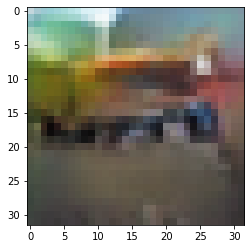

-> Epoch 315, Batch numero 1/78 -> Disc. loss on real images: 0.39198, Disc. loss on fake images: 0.38098, Generator loss: 2.61861
-> Epoch 315, Batch numero 2/78 -> Disc. loss on real images: 0.25770, Disc. loss on fake images: 0.34362, Generator loss: 2.82216
-> Epoch 315, Batch numero 3/78 -> Disc. loss on real images: 0.16619, Disc. loss on fake images: 0.29048, Generator loss: 2.64502
-> Epoch 315, Batch numero 4/78 -> Disc. loss on real images: 0.36156, Disc. loss on fake images: 0.25673, Generator loss: 2.64148
-> Epoch 315, Batch numero 5/78 -> Disc. loss on real images: 0.32252, Disc. loss on fake images: 0.32588, Generator loss: 2.36446
-> Epoch 315, Batch numero 6/78 -> Disc. loss on real images: 0.50554, Disc. loss on fake images: 0.48315, Generator loss: 2.61518
-> Epoch 315, Batch numero 7/78 -> Disc. loss on real images: 0.34988, Disc. loss on fake images: 0.33861, Generator loss: 2.82399
-> Epoch 315, Batch numero 8/78 -> Disc. loss on real images: 0.27608, Disc. loss o

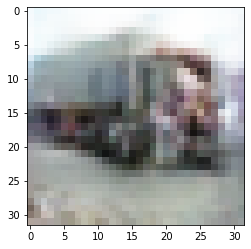

-> Epoch 316, Batch numero 1/78 -> Disc. loss on real images: 0.16288, Disc. loss on fake images: 0.20756, Generator loss: 2.68157
-> Epoch 316, Batch numero 2/78 -> Disc. loss on real images: 0.31279, Disc. loss on fake images: 0.33958, Generator loss: 2.85561
-> Epoch 316, Batch numero 3/78 -> Disc. loss on real images: 0.36391, Disc. loss on fake images: 0.32623, Generator loss: 2.38890
-> Epoch 316, Batch numero 4/78 -> Disc. loss on real images: 0.30932, Disc. loss on fake images: 0.52191, Generator loss: 2.70664
-> Epoch 316, Batch numero 5/78 -> Disc. loss on real images: 0.28788, Disc. loss on fake images: 0.42660, Generator loss: 3.15952
-> Epoch 316, Batch numero 6/78 -> Disc. loss on real images: 0.28283, Disc. loss on fake images: 0.19279, Generator loss: 3.12270
-> Epoch 316, Batch numero 7/78 -> Disc. loss on real images: 0.37239, Disc. loss on fake images: 0.26517, Generator loss: 2.58513
-> Epoch 316, Batch numero 8/78 -> Disc. loss on real images: 0.30581, Disc. loss o

-> Epoch 316, Batch numero 64/78 -> Disc. loss on real images: 0.24836, Disc. loss on fake images: 0.31277, Generator loss: 2.73937
-> Epoch 316, Batch numero 65/78 -> Disc. loss on real images: 0.36003, Disc. loss on fake images: 0.41302, Generator loss: 2.39922
-> Epoch 316, Batch numero 66/78 -> Disc. loss on real images: 0.17675, Disc. loss on fake images: 0.19573, Generator loss: 2.74006
-> Epoch 316, Batch numero 67/78 -> Disc. loss on real images: 0.31584, Disc. loss on fake images: 0.38489, Generator loss: 2.09313
-> Epoch 316, Batch numero 68/78 -> Disc. loss on real images: 0.40211, Disc. loss on fake images: 0.43161, Generator loss: 2.56490
-> Epoch 316, Batch numero 69/78 -> Disc. loss on real images: 0.16143, Disc. loss on fake images: 0.16994, Generator loss: 2.44869
-> Epoch 316, Batch numero 70/78 -> Disc. loss on real images: 0.32123, Disc. loss on fake images: 0.50926, Generator loss: 2.33017
-> Epoch 316, Batch numero 71/78 -> Disc. loss on real images: 0.33939, Disc

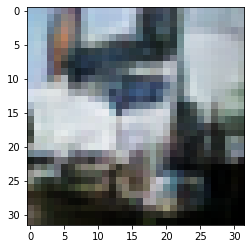

-> Epoch 317, Batch numero 1/78 -> Disc. loss on real images: 0.27271, Disc. loss on fake images: 0.34377, Generator loss: 2.29443
-> Epoch 317, Batch numero 2/78 -> Disc. loss on real images: 0.24898, Disc. loss on fake images: 0.27171, Generator loss: 2.33400
-> Epoch 317, Batch numero 3/78 -> Disc. loss on real images: 0.16645, Disc. loss on fake images: 0.30696, Generator loss: 2.66778
-> Epoch 317, Batch numero 4/78 -> Disc. loss on real images: 0.31037, Disc. loss on fake images: 0.37967, Generator loss: 2.78607
-> Epoch 317, Batch numero 5/78 -> Disc. loss on real images: 0.47521, Disc. loss on fake images: 0.25615, Generator loss: 2.58924
-> Epoch 317, Batch numero 6/78 -> Disc. loss on real images: 0.31253, Disc. loss on fake images: 0.36899, Generator loss: 2.76961
-> Epoch 317, Batch numero 7/78 -> Disc. loss on real images: 0.25125, Disc. loss on fake images: 0.35824, Generator loss: 2.52500
-> Epoch 317, Batch numero 8/78 -> Disc. loss on real images: 0.21195, Disc. loss o

-> Epoch 317, Batch numero 64/78 -> Disc. loss on real images: 0.23602, Disc. loss on fake images: 0.27176, Generator loss: 3.16701
-> Epoch 317, Batch numero 65/78 -> Disc. loss on real images: 0.33362, Disc. loss on fake images: 0.38398, Generator loss: 2.61929
-> Epoch 317, Batch numero 66/78 -> Disc. loss on real images: 0.35576, Disc. loss on fake images: 0.44575, Generator loss: 3.30650
-> Epoch 317, Batch numero 67/78 -> Disc. loss on real images: 0.43050, Disc. loss on fake images: 0.28758, Generator loss: 2.47073
-> Epoch 317, Batch numero 68/78 -> Disc. loss on real images: 0.27352, Disc. loss on fake images: 0.21180, Generator loss: 2.21650
-> Epoch 317, Batch numero 69/78 -> Disc. loss on real images: 0.18807, Disc. loss on fake images: 0.28543, Generator loss: 2.44318
-> Epoch 317, Batch numero 70/78 -> Disc. loss on real images: 0.14364, Disc. loss on fake images: 0.42653, Generator loss: 3.04983
-> Epoch 317, Batch numero 71/78 -> Disc. loss on real images: 0.31113, Disc

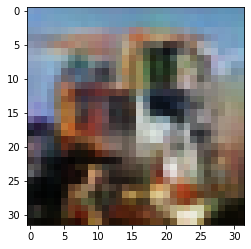

-> Epoch 318, Batch numero 1/78 -> Disc. loss on real images: 0.44480, Disc. loss on fake images: 0.43072, Generator loss: 2.89437
-> Epoch 318, Batch numero 2/78 -> Disc. loss on real images: 0.38440, Disc. loss on fake images: 0.21605, Generator loss: 2.82465
-> Epoch 318, Batch numero 3/78 -> Disc. loss on real images: 0.27762, Disc. loss on fake images: 0.29094, Generator loss: 2.57964
-> Epoch 318, Batch numero 4/78 -> Disc. loss on real images: 0.21604, Disc. loss on fake images: 0.49610, Generator loss: 2.49276
-> Epoch 318, Batch numero 5/78 -> Disc. loss on real images: 0.33115, Disc. loss on fake images: 0.36305, Generator loss: 2.70977
-> Epoch 318, Batch numero 6/78 -> Disc. loss on real images: 0.32906, Disc. loss on fake images: 0.26523, Generator loss: 2.97236
-> Epoch 318, Batch numero 7/78 -> Disc. loss on real images: 0.28591, Disc. loss on fake images: 0.26115, Generator loss: 2.64672
-> Epoch 318, Batch numero 8/78 -> Disc. loss on real images: 0.28875, Disc. loss o

-> Epoch 318, Batch numero 65/78 -> Disc. loss on real images: 0.22722, Disc. loss on fake images: 0.16202, Generator loss: 3.10904
-> Epoch 318, Batch numero 66/78 -> Disc. loss on real images: 0.34817, Disc. loss on fake images: 0.21610, Generator loss: 2.71296
-> Epoch 318, Batch numero 67/78 -> Disc. loss on real images: 0.28200, Disc. loss on fake images: 0.31083, Generator loss: 2.51535
-> Epoch 318, Batch numero 68/78 -> Disc. loss on real images: 0.20018, Disc. loss on fake images: 0.60975, Generator loss: 3.40628
-> Epoch 318, Batch numero 69/78 -> Disc. loss on real images: 0.61850, Disc. loss on fake images: 0.28830, Generator loss: 2.90786
-> Epoch 318, Batch numero 70/78 -> Disc. loss on real images: 0.22263, Disc. loss on fake images: 0.36937, Generator loss: 2.63877
-> Epoch 318, Batch numero 71/78 -> Disc. loss on real images: 0.36585, Disc. loss on fake images: 0.25287, Generator loss: 2.63527
-> Epoch 318, Batch numero 72/78 -> Disc. loss on real images: 0.17353, Disc

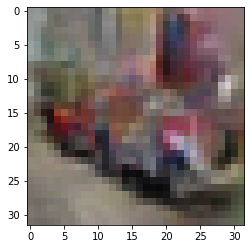

-> Epoch 319, Batch numero 1/78 -> Disc. loss on real images: 0.37562, Disc. loss on fake images: 0.17491, Generator loss: 2.06220
-> Epoch 319, Batch numero 2/78 -> Disc. loss on real images: 0.18877, Disc. loss on fake images: 0.56971, Generator loss: 2.44308
-> Epoch 319, Batch numero 3/78 -> Disc. loss on real images: 0.12481, Disc. loss on fake images: 0.47017, Generator loss: 3.55292
-> Epoch 319, Batch numero 4/78 -> Disc. loss on real images: 0.19481, Disc. loss on fake images: 0.32332, Generator loss: 3.04363
-> Epoch 319, Batch numero 5/78 -> Disc. loss on real images: 0.60326, Disc. loss on fake images: 0.22184, Generator loss: 2.68724
-> Epoch 319, Batch numero 6/78 -> Disc. loss on real images: 0.21233, Disc. loss on fake images: 0.32253, Generator loss: 2.72145
-> Epoch 319, Batch numero 7/78 -> Disc. loss on real images: 0.24439, Disc. loss on fake images: 0.24316, Generator loss: 2.42673
-> Epoch 319, Batch numero 8/78 -> Disc. loss on real images: 0.19899, Disc. loss o

-> Epoch 319, Batch numero 64/78 -> Disc. loss on real images: 0.18150, Disc. loss on fake images: 0.24281, Generator loss: 3.05542
-> Epoch 319, Batch numero 65/78 -> Disc. loss on real images: 0.33989, Disc. loss on fake images: 0.27232, Generator loss: 2.69231
-> Epoch 319, Batch numero 66/78 -> Disc. loss on real images: 0.46797, Disc. loss on fake images: 0.34173, Generator loss: 2.60370
-> Epoch 319, Batch numero 67/78 -> Disc. loss on real images: 0.12336, Disc. loss on fake images: 0.30967, Generator loss: 2.85746
-> Epoch 319, Batch numero 68/78 -> Disc. loss on real images: 0.22698, Disc. loss on fake images: 0.26207, Generator loss: 2.91331
-> Epoch 319, Batch numero 69/78 -> Disc. loss on real images: 0.38998, Disc. loss on fake images: 0.37601, Generator loss: 2.53238
-> Epoch 319, Batch numero 70/78 -> Disc. loss on real images: 0.36050, Disc. loss on fake images: 0.17798, Generator loss: 2.31019
-> Epoch 319, Batch numero 71/78 -> Disc. loss on real images: 0.19807, Disc

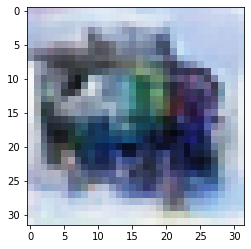

-> Epoch 320, Batch numero 1/78 -> Disc. loss on real images: 0.33093, Disc. loss on fake images: 0.14651, Generator loss: 2.78637
-> Epoch 320, Batch numero 2/78 -> Disc. loss on real images: 0.29531, Disc. loss on fake images: 0.22649, Generator loss: 2.64688
-> Epoch 320, Batch numero 3/78 -> Disc. loss on real images: 0.25021, Disc. loss on fake images: 0.30539, Generator loss: 2.45228
-> Epoch 320, Batch numero 4/78 -> Disc. loss on real images: 0.24351, Disc. loss on fake images: 0.23660, Generator loss: 2.52490
-> Epoch 320, Batch numero 5/78 -> Disc. loss on real images: 0.30715, Disc. loss on fake images: 0.55454, Generator loss: 2.45792
-> Epoch 320, Batch numero 6/78 -> Disc. loss on real images: 0.25829, Disc. loss on fake images: 0.33252, Generator loss: 2.51632
-> Epoch 320, Batch numero 7/78 -> Disc. loss on real images: 0.39229, Disc. loss on fake images: 0.22705, Generator loss: 2.74709
-> Epoch 320, Batch numero 8/78 -> Disc. loss on real images: 0.40835, Disc. loss o

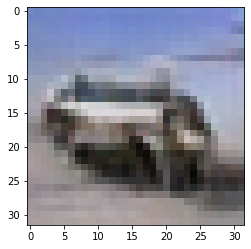

-> Epoch 321, Batch numero 1/78 -> Disc. loss on real images: 0.26462, Disc. loss on fake images: 0.32828, Generator loss: 2.75748
-> Epoch 321, Batch numero 2/78 -> Disc. loss on real images: 0.28497, Disc. loss on fake images: 0.35606, Generator loss: 2.86534
-> Epoch 321, Batch numero 3/78 -> Disc. loss on real images: 0.22938, Disc. loss on fake images: 0.58456, Generator loss: 3.57985
-> Epoch 321, Batch numero 4/78 -> Disc. loss on real images: 0.36678, Disc. loss on fake images: 0.22963, Generator loss: 3.13237
-> Epoch 321, Batch numero 5/78 -> Disc. loss on real images: 0.42607, Disc. loss on fake images: 0.23283, Generator loss: 2.56120
-> Epoch 321, Batch numero 6/78 -> Disc. loss on real images: 0.16257, Disc. loss on fake images: 0.17594, Generator loss: 2.81793
-> Epoch 321, Batch numero 7/78 -> Disc. loss on real images: 0.32652, Disc. loss on fake images: 0.28970, Generator loss: 2.85710
-> Epoch 321, Batch numero 8/78 -> Disc. loss on real images: 0.25598, Disc. loss o

-> Epoch 321, Batch numero 65/78 -> Disc. loss on real images: 0.31459, Disc. loss on fake images: 0.29072, Generator loss: 2.44703
-> Epoch 321, Batch numero 66/78 -> Disc. loss on real images: 0.19648, Disc. loss on fake images: 0.27325, Generator loss: 2.86788
-> Epoch 321, Batch numero 67/78 -> Disc. loss on real images: 0.32115, Disc. loss on fake images: 0.28743, Generator loss: 2.87083
-> Epoch 321, Batch numero 68/78 -> Disc. loss on real images: 0.23708, Disc. loss on fake images: 0.34790, Generator loss: 2.66416
-> Epoch 321, Batch numero 69/78 -> Disc. loss on real images: 0.25665, Disc. loss on fake images: 0.19267, Generator loss: 3.05973
-> Epoch 321, Batch numero 70/78 -> Disc. loss on real images: 0.26199, Disc. loss on fake images: 0.33783, Generator loss: 2.80234
-> Epoch 321, Batch numero 71/78 -> Disc. loss on real images: 0.35663, Disc. loss on fake images: 0.35745, Generator loss: 3.05975
-> Epoch 321, Batch numero 72/78 -> Disc. loss on real images: 0.22867, Disc

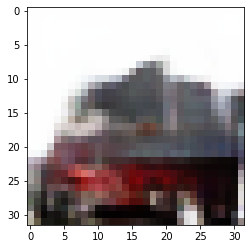

-> Epoch 322, Batch numero 1/78 -> Disc. loss on real images: 0.31363, Disc. loss on fake images: 0.33165, Generator loss: 3.12982
-> Epoch 322, Batch numero 2/78 -> Disc. loss on real images: 0.35626, Disc. loss on fake images: 0.37143, Generator loss: 2.65921
-> Epoch 322, Batch numero 3/78 -> Disc. loss on real images: 0.33693, Disc. loss on fake images: 0.28046, Generator loss: 2.61630
-> Epoch 322, Batch numero 4/78 -> Disc. loss on real images: 0.23637, Disc. loss on fake images: 0.26339, Generator loss: 2.61994
-> Epoch 322, Batch numero 5/78 -> Disc. loss on real images: 0.20297, Disc. loss on fake images: 0.18360, Generator loss: 2.77662
-> Epoch 322, Batch numero 6/78 -> Disc. loss on real images: 0.29416, Disc. loss on fake images: 0.15605, Generator loss: 2.23832
-> Epoch 322, Batch numero 7/78 -> Disc. loss on real images: 0.23065, Disc. loss on fake images: 0.41952, Generator loss: 2.14158
-> Epoch 322, Batch numero 8/78 -> Disc. loss on real images: 0.17353, Disc. loss o

-> Epoch 322, Batch numero 64/78 -> Disc. loss on real images: 0.28826, Disc. loss on fake images: 0.37457, Generator loss: 2.82142
-> Epoch 322, Batch numero 65/78 -> Disc. loss on real images: 0.22708, Disc. loss on fake images: 0.20554, Generator loss: 2.96455
-> Epoch 322, Batch numero 66/78 -> Disc. loss on real images: 0.33231, Disc. loss on fake images: 0.19151, Generator loss: 3.20109
-> Epoch 322, Batch numero 67/78 -> Disc. loss on real images: 0.35578, Disc. loss on fake images: 0.40609, Generator loss: 2.72784
-> Epoch 322, Batch numero 68/78 -> Disc. loss on real images: 0.16197, Disc. loss on fake images: 0.33446, Generator loss: 2.65997
-> Epoch 322, Batch numero 69/78 -> Disc. loss on real images: 0.42317, Disc. loss on fake images: 0.17991, Generator loss: 2.88224
-> Epoch 322, Batch numero 70/78 -> Disc. loss on real images: 0.18916, Disc. loss on fake images: 0.47301, Generator loss: 2.84628
-> Epoch 322, Batch numero 71/78 -> Disc. loss on real images: 0.23919, Disc

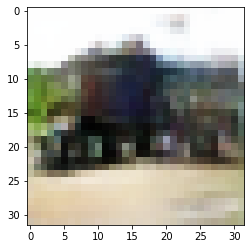

-> Epoch 323, Batch numero 1/78 -> Disc. loss on real images: 0.35101, Disc. loss on fake images: 0.43840, Generator loss: 2.24791
-> Epoch 323, Batch numero 2/78 -> Disc. loss on real images: 0.23573, Disc. loss on fake images: 0.35062, Generator loss: 2.40374
-> Epoch 323, Batch numero 3/78 -> Disc. loss on real images: 0.23205, Disc. loss on fake images: 0.25661, Generator loss: 2.67781
-> Epoch 323, Batch numero 4/78 -> Disc. loss on real images: 0.50020, Disc. loss on fake images: 0.27344, Generator loss: 2.67413
-> Epoch 323, Batch numero 5/78 -> Disc. loss on real images: 0.27420, Disc. loss on fake images: 0.47133, Generator loss: 2.76663
-> Epoch 323, Batch numero 6/78 -> Disc. loss on real images: 0.34117, Disc. loss on fake images: 0.22901, Generator loss: 2.50738
-> Epoch 323, Batch numero 7/78 -> Disc. loss on real images: 0.30453, Disc. loss on fake images: 0.56849, Generator loss: 2.56201
-> Epoch 323, Batch numero 8/78 -> Disc. loss on real images: 0.27646, Disc. loss o

-> Epoch 323, Batch numero 64/78 -> Disc. loss on real images: 0.26299, Disc. loss on fake images: 0.35848, Generator loss: 2.95408
-> Epoch 323, Batch numero 65/78 -> Disc. loss on real images: 0.33680, Disc. loss on fake images: 0.25013, Generator loss: 3.06821
-> Epoch 323, Batch numero 66/78 -> Disc. loss on real images: 0.27301, Disc. loss on fake images: 0.32188, Generator loss: 2.96338
-> Epoch 323, Batch numero 67/78 -> Disc. loss on real images: 0.40694, Disc. loss on fake images: 0.21548, Generator loss: 2.59163
-> Epoch 323, Batch numero 68/78 -> Disc. loss on real images: 0.41026, Disc. loss on fake images: 0.31358, Generator loss: 2.16425
-> Epoch 323, Batch numero 69/78 -> Disc. loss on real images: 0.13345, Disc. loss on fake images: 0.29538, Generator loss: 2.38810
-> Epoch 323, Batch numero 70/78 -> Disc. loss on real images: 0.13638, Disc. loss on fake images: 0.31964, Generator loss: 3.05780
-> Epoch 323, Batch numero 71/78 -> Disc. loss on real images: 0.25637, Disc

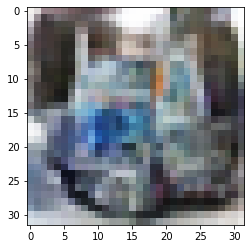

-> Epoch 324, Batch numero 1/78 -> Disc. loss on real images: 0.31521, Disc. loss on fake images: 0.41195, Generator loss: 2.75973
-> Epoch 324, Batch numero 2/78 -> Disc. loss on real images: 0.22342, Disc. loss on fake images: 0.33097, Generator loss: 2.59842
-> Epoch 324, Batch numero 3/78 -> Disc. loss on real images: 0.32579, Disc. loss on fake images: 0.33187, Generator loss: 2.85784
-> Epoch 324, Batch numero 4/78 -> Disc. loss on real images: 0.28210, Disc. loss on fake images: 0.37385, Generator loss: 2.99252
-> Epoch 324, Batch numero 5/78 -> Disc. loss on real images: 0.27275, Disc. loss on fake images: 0.27791, Generator loss: 2.98080
-> Epoch 324, Batch numero 6/78 -> Disc. loss on real images: 0.17959, Disc. loss on fake images: 0.29814, Generator loss: 3.14604
-> Epoch 324, Batch numero 7/78 -> Disc. loss on real images: 0.45668, Disc. loss on fake images: 0.14016, Generator loss: 2.73070
-> Epoch 324, Batch numero 8/78 -> Disc. loss on real images: 0.34628, Disc. loss o

-> Epoch 324, Batch numero 65/78 -> Disc. loss on real images: 0.17122, Disc. loss on fake images: 0.22269, Generator loss: 2.81413
-> Epoch 324, Batch numero 66/78 -> Disc. loss on real images: 0.18473, Disc. loss on fake images: 0.28689, Generator loss: 2.83047
-> Epoch 324, Batch numero 67/78 -> Disc. loss on real images: 0.36929, Disc. loss on fake images: 0.33535, Generator loss: 2.92089
-> Epoch 324, Batch numero 68/78 -> Disc. loss on real images: 0.33993, Disc. loss on fake images: 0.26196, Generator loss: 3.33025
-> Epoch 324, Batch numero 69/78 -> Disc. loss on real images: 0.27569, Disc. loss on fake images: 0.39202, Generator loss: 2.93577
-> Epoch 324, Batch numero 70/78 -> Disc. loss on real images: 0.32272, Disc. loss on fake images: 0.29008, Generator loss: 2.67387
-> Epoch 324, Batch numero 71/78 -> Disc. loss on real images: 0.33250, Disc. loss on fake images: 0.29063, Generator loss: 2.32631
-> Epoch 324, Batch numero 72/78 -> Disc. loss on real images: 0.15338, Disc

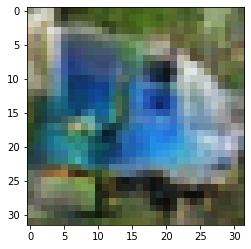

-> Epoch 325, Batch numero 1/78 -> Disc. loss on real images: 0.20338, Disc. loss on fake images: 0.18947, Generator loss: 2.44677
-> Epoch 325, Batch numero 2/78 -> Disc. loss on real images: 0.21101, Disc. loss on fake images: 0.26104, Generator loss: 2.34898
-> Epoch 325, Batch numero 3/78 -> Disc. loss on real images: 0.29896, Disc. loss on fake images: 0.43842, Generator loss: 2.52600
-> Epoch 325, Batch numero 4/78 -> Disc. loss on real images: 0.27224, Disc. loss on fake images: 0.51839, Generator loss: 2.85903
-> Epoch 325, Batch numero 5/78 -> Disc. loss on real images: 0.27250, Disc. loss on fake images: 0.17370, Generator loss: 2.87329
-> Epoch 325, Batch numero 6/78 -> Disc. loss on real images: 0.25690, Disc. loss on fake images: 0.34299, Generator loss: 3.30530
-> Epoch 325, Batch numero 7/78 -> Disc. loss on real images: 0.33324, Disc. loss on fake images: 0.26635, Generator loss: 2.74483
-> Epoch 325, Batch numero 8/78 -> Disc. loss on real images: 0.20204, Disc. loss o

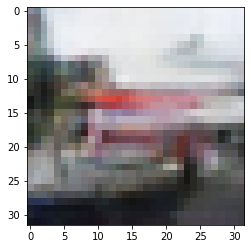

-> Epoch 326, Batch numero 1/78 -> Disc. loss on real images: 0.29042, Disc. loss on fake images: 0.21273, Generator loss: 2.77343
-> Epoch 326, Batch numero 2/78 -> Disc. loss on real images: 0.27115, Disc. loss on fake images: 0.34188, Generator loss: 2.49514
-> Epoch 326, Batch numero 3/78 -> Disc. loss on real images: 0.28893, Disc. loss on fake images: 0.25970, Generator loss: 2.68129
-> Epoch 326, Batch numero 4/78 -> Disc. loss on real images: 0.14026, Disc. loss on fake images: 0.48971, Generator loss: 2.65620
-> Epoch 326, Batch numero 5/78 -> Disc. loss on real images: 0.19918, Disc. loss on fake images: 0.38815, Generator loss: 3.16564
-> Epoch 326, Batch numero 6/78 -> Disc. loss on real images: 0.68982, Disc. loss on fake images: 0.12950, Generator loss: 2.32497
-> Epoch 326, Batch numero 7/78 -> Disc. loss on real images: 0.15999, Disc. loss on fake images: 0.51011, Generator loss: 2.85295
-> Epoch 326, Batch numero 8/78 -> Disc. loss on real images: 0.26706, Disc. loss o

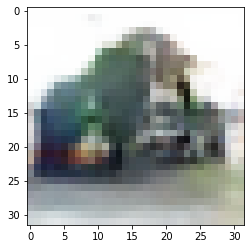

-> Epoch 327, Batch numero 1/78 -> Disc. loss on real images: 0.31073, Disc. loss on fake images: 0.20705, Generator loss: 2.78991
-> Epoch 327, Batch numero 2/78 -> Disc. loss on real images: 0.21972, Disc. loss on fake images: 0.16614, Generator loss: 2.92789
-> Epoch 327, Batch numero 3/78 -> Disc. loss on real images: 0.41191, Disc. loss on fake images: 0.38291, Generator loss: 2.82031
-> Epoch 327, Batch numero 4/78 -> Disc. loss on real images: 0.22514, Disc. loss on fake images: 0.19998, Generator loss: 2.66393
-> Epoch 327, Batch numero 5/78 -> Disc. loss on real images: 0.26875, Disc. loss on fake images: 0.31698, Generator loss: 2.64171
-> Epoch 327, Batch numero 6/78 -> Disc. loss on real images: 0.26414, Disc. loss on fake images: 0.57567, Generator loss: 3.23178
-> Epoch 327, Batch numero 7/78 -> Disc. loss on real images: 0.29656, Disc. loss on fake images: 0.22009, Generator loss: 3.03422
-> Epoch 327, Batch numero 8/78 -> Disc. loss on real images: 0.58522, Disc. loss o

-> Epoch 327, Batch numero 65/78 -> Disc. loss on real images: 0.15974, Disc. loss on fake images: 0.24515, Generator loss: 3.42073
-> Epoch 327, Batch numero 66/78 -> Disc. loss on real images: 0.41884, Disc. loss on fake images: 0.24785, Generator loss: 3.23432
-> Epoch 327, Batch numero 67/78 -> Disc. loss on real images: 0.48347, Disc. loss on fake images: 0.27494, Generator loss: 2.67705
-> Epoch 327, Batch numero 68/78 -> Disc. loss on real images: 0.29713, Disc. loss on fake images: 0.57156, Generator loss: 2.93737
-> Epoch 327, Batch numero 69/78 -> Disc. loss on real images: 0.30752, Disc. loss on fake images: 0.09000, Generator loss: 2.82753
-> Epoch 327, Batch numero 70/78 -> Disc. loss on real images: 0.33231, Disc. loss on fake images: 0.40154, Generator loss: 2.78410
-> Epoch 327, Batch numero 71/78 -> Disc. loss on real images: 0.32269, Disc. loss on fake images: 0.17836, Generator loss: 2.81876
-> Epoch 327, Batch numero 72/78 -> Disc. loss on real images: 0.29688, Disc

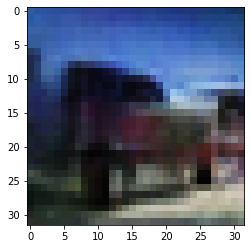

-> Epoch 328, Batch numero 1/78 -> Disc. loss on real images: 0.16627, Disc. loss on fake images: 0.22592, Generator loss: 2.77546
-> Epoch 328, Batch numero 2/78 -> Disc. loss on real images: 0.27859, Disc. loss on fake images: 0.31015, Generator loss: 2.85653
-> Epoch 328, Batch numero 3/78 -> Disc. loss on real images: 0.35542, Disc. loss on fake images: 0.31230, Generator loss: 3.05537
-> Epoch 328, Batch numero 4/78 -> Disc. loss on real images: 0.26774, Disc. loss on fake images: 0.34574, Generator loss: 2.97407
-> Epoch 328, Batch numero 5/78 -> Disc. loss on real images: 0.20400, Disc. loss on fake images: 0.36838, Generator loss: 3.14200
-> Epoch 328, Batch numero 6/78 -> Disc. loss on real images: 0.41567, Disc. loss on fake images: 0.20760, Generator loss: 2.29778
-> Epoch 328, Batch numero 7/78 -> Disc. loss on real images: 0.19247, Disc. loss on fake images: 0.43864, Generator loss: 2.52370
-> Epoch 328, Batch numero 8/78 -> Disc. loss on real images: 0.31918, Disc. loss o

-> Epoch 328, Batch numero 65/78 -> Disc. loss on real images: 0.25003, Disc. loss on fake images: 0.27925, Generator loss: 2.78891
-> Epoch 328, Batch numero 66/78 -> Disc. loss on real images: 0.31423, Disc. loss on fake images: 0.22222, Generator loss: 2.91693
-> Epoch 328, Batch numero 67/78 -> Disc. loss on real images: 0.37457, Disc. loss on fake images: 0.15083, Generator loss: 2.54205
-> Epoch 328, Batch numero 68/78 -> Disc. loss on real images: 0.18430, Disc. loss on fake images: 0.38516, Generator loss: 2.64381
-> Epoch 328, Batch numero 69/78 -> Disc. loss on real images: 0.13862, Disc. loss on fake images: 0.47431, Generator loss: 3.06888
-> Epoch 328, Batch numero 70/78 -> Disc. loss on real images: 0.29894, Disc. loss on fake images: 0.13560, Generator loss: 3.19542
-> Epoch 328, Batch numero 71/78 -> Disc. loss on real images: 0.24140, Disc. loss on fake images: 0.34184, Generator loss: 3.08344
-> Epoch 328, Batch numero 72/78 -> Disc. loss on real images: 0.25908, Disc

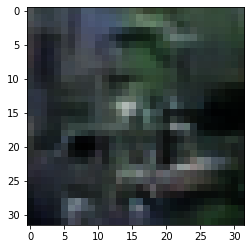

-> Epoch 329, Batch numero 1/78 -> Disc. loss on real images: 0.48700, Disc. loss on fake images: 0.26823, Generator loss: 3.05560
-> Epoch 329, Batch numero 2/78 -> Disc. loss on real images: 0.30019, Disc. loss on fake images: 0.60705, Generator loss: 2.82274
-> Epoch 329, Batch numero 3/78 -> Disc. loss on real images: 0.26842, Disc. loss on fake images: 0.28165, Generator loss: 2.92544
-> Epoch 329, Batch numero 4/78 -> Disc. loss on real images: 0.27131, Disc. loss on fake images: 0.32012, Generator loss: 3.06032
-> Epoch 329, Batch numero 5/78 -> Disc. loss on real images: 0.22802, Disc. loss on fake images: 0.32134, Generator loss: 2.73378
-> Epoch 329, Batch numero 6/78 -> Disc. loss on real images: 0.36217, Disc. loss on fake images: 0.33845, Generator loss: 3.09864
-> Epoch 329, Batch numero 7/78 -> Disc. loss on real images: 0.28566, Disc. loss on fake images: 0.22430, Generator loss: 2.73519
-> Epoch 329, Batch numero 8/78 -> Disc. loss on real images: 0.35853, Disc. loss o

-> Epoch 329, Batch numero 65/78 -> Disc. loss on real images: 0.32094, Disc. loss on fake images: 0.20032, Generator loss: 2.91598
-> Epoch 329, Batch numero 66/78 -> Disc. loss on real images: 0.35287, Disc. loss on fake images: 0.30167, Generator loss: 2.92814
-> Epoch 329, Batch numero 67/78 -> Disc. loss on real images: 0.23282, Disc. loss on fake images: 0.21842, Generator loss: 2.84383
-> Epoch 329, Batch numero 68/78 -> Disc. loss on real images: 0.21870, Disc. loss on fake images: 0.30076, Generator loss: 2.97607
-> Epoch 329, Batch numero 69/78 -> Disc. loss on real images: 0.43767, Disc. loss on fake images: 0.25576, Generator loss: 2.87195
-> Epoch 329, Batch numero 70/78 -> Disc. loss on real images: 0.18290, Disc. loss on fake images: 0.30712, Generator loss: 2.99328
-> Epoch 329, Batch numero 71/78 -> Disc. loss on real images: 0.43663, Disc. loss on fake images: 0.49781, Generator loss: 2.87401
-> Epoch 329, Batch numero 72/78 -> Disc. loss on real images: 0.18705, Disc

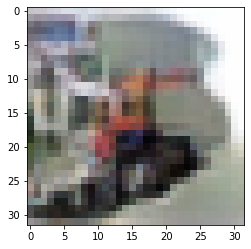

-> Epoch 330, Batch numero 1/78 -> Disc. loss on real images: 0.28244, Disc. loss on fake images: 0.24059, Generator loss: 3.00060
-> Epoch 330, Batch numero 2/78 -> Disc. loss on real images: 0.15296, Disc. loss on fake images: 0.23969, Generator loss: 2.88370
-> Epoch 330, Batch numero 3/78 -> Disc. loss on real images: 0.28758, Disc. loss on fake images: 0.21053, Generator loss: 2.96612
-> Epoch 330, Batch numero 4/78 -> Disc. loss on real images: 0.19942, Disc. loss on fake images: 0.22937, Generator loss: 2.61263
-> Epoch 330, Batch numero 5/78 -> Disc. loss on real images: 0.20957, Disc. loss on fake images: 0.17175, Generator loss: 2.94217
-> Epoch 330, Batch numero 6/78 -> Disc. loss on real images: 0.31058, Disc. loss on fake images: 0.14144, Generator loss: 2.34541
-> Epoch 330, Batch numero 7/78 -> Disc. loss on real images: 0.31999, Disc. loss on fake images: 0.51759, Generator loss: 2.54079
-> Epoch 330, Batch numero 8/78 -> Disc. loss on real images: 0.22154, Disc. loss o

-> Epoch 330, Batch numero 64/78 -> Disc. loss on real images: 0.44540, Disc. loss on fake images: 0.24918, Generator loss: 2.99063
-> Epoch 330, Batch numero 65/78 -> Disc. loss on real images: 0.18859, Disc. loss on fake images: 0.20064, Generator loss: 3.09936
-> Epoch 330, Batch numero 66/78 -> Disc. loss on real images: 0.23093, Disc. loss on fake images: 0.36758, Generator loss: 2.68642
-> Epoch 330, Batch numero 67/78 -> Disc. loss on real images: 0.49293, Disc. loss on fake images: 0.34583, Generator loss: 2.22201
-> Epoch 330, Batch numero 68/78 -> Disc. loss on real images: 0.54404, Disc. loss on fake images: 0.23355, Generator loss: 2.11360
-> Epoch 330, Batch numero 69/78 -> Disc. loss on real images: 0.13028, Disc. loss on fake images: 0.21399, Generator loss: 2.29058
-> Epoch 330, Batch numero 70/78 -> Disc. loss on real images: 0.11433, Disc. loss on fake images: 0.40413, Generator loss: 2.88491
-> Epoch 330, Batch numero 71/78 -> Disc. loss on real images: 0.25678, Disc

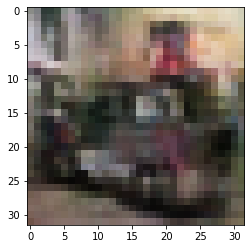

-> Epoch 331, Batch numero 1/78 -> Disc. loss on real images: 0.08351, Disc. loss on fake images: 0.63206, Generator loss: 2.57232
-> Epoch 331, Batch numero 2/78 -> Disc. loss on real images: 0.25802, Disc. loss on fake images: 0.25034, Generator loss: 3.08727
-> Epoch 331, Batch numero 3/78 -> Disc. loss on real images: 0.44579, Disc. loss on fake images: 0.14007, Generator loss: 2.41976
-> Epoch 331, Batch numero 4/78 -> Disc. loss on real images: 0.25216, Disc. loss on fake images: 0.24534, Generator loss: 2.17561
-> Epoch 331, Batch numero 5/78 -> Disc. loss on real images: 0.20207, Disc. loss on fake images: 0.31702, Generator loss: 2.39632
-> Epoch 331, Batch numero 6/78 -> Disc. loss on real images: 0.25403, Disc. loss on fake images: 0.31861, Generator loss: 2.79110
-> Epoch 331, Batch numero 7/78 -> Disc. loss on real images: 0.38254, Disc. loss on fake images: 0.33948, Generator loss: 2.69534
-> Epoch 331, Batch numero 8/78 -> Disc. loss on real images: 0.36005, Disc. loss o

-> Epoch 331, Batch numero 64/78 -> Disc. loss on real images: 0.22682, Disc. loss on fake images: 0.26668, Generator loss: 3.22168
-> Epoch 331, Batch numero 65/78 -> Disc. loss on real images: 0.36267, Disc. loss on fake images: 0.30964, Generator loss: 2.82550
-> Epoch 331, Batch numero 66/78 -> Disc. loss on real images: 0.49922, Disc. loss on fake images: 0.39089, Generator loss: 2.16960
-> Epoch 331, Batch numero 67/78 -> Disc. loss on real images: 0.32268, Disc. loss on fake images: 0.44611, Generator loss: 2.49577
-> Epoch 331, Batch numero 68/78 -> Disc. loss on real images: 0.26662, Disc. loss on fake images: 0.31298, Generator loss: 2.80154
-> Epoch 331, Batch numero 69/78 -> Disc. loss on real images: 0.18194, Disc. loss on fake images: 0.63885, Generator loss: 3.04782
-> Epoch 331, Batch numero 70/78 -> Disc. loss on real images: 0.30126, Disc. loss on fake images: 0.23461, Generator loss: 3.12437
-> Epoch 331, Batch numero 71/78 -> Disc. loss on real images: 0.45047, Disc

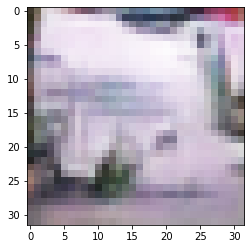

-> Epoch 332, Batch numero 1/78 -> Disc. loss on real images: 0.06883, Disc. loss on fake images: 0.15129, Generator loss: 2.76420
-> Epoch 332, Batch numero 2/78 -> Disc. loss on real images: 0.23876, Disc. loss on fake images: 0.29378, Generator loss: 2.34082
-> Epoch 332, Batch numero 3/78 -> Disc. loss on real images: 0.13591, Disc. loss on fake images: 0.61769, Generator loss: 2.49000
-> Epoch 332, Batch numero 4/78 -> Disc. loss on real images: 0.30069, Disc. loss on fake images: 0.40905, Generator loss: 2.76248
-> Epoch 332, Batch numero 5/78 -> Disc. loss on real images: 0.25112, Disc. loss on fake images: 0.16744, Generator loss: 2.52908
-> Epoch 332, Batch numero 6/78 -> Disc. loss on real images: 0.47622, Disc. loss on fake images: 0.34986, Generator loss: 2.99047
-> Epoch 332, Batch numero 7/78 -> Disc. loss on real images: 0.21000, Disc. loss on fake images: 0.39053, Generator loss: 3.04631
-> Epoch 332, Batch numero 8/78 -> Disc. loss on real images: 0.16489, Disc. loss o

-> Epoch 332, Batch numero 65/78 -> Disc. loss on real images: 0.33302, Disc. loss on fake images: 0.53167, Generator loss: 2.93735
-> Epoch 332, Batch numero 66/78 -> Disc. loss on real images: 0.29091, Disc. loss on fake images: 0.19741, Generator loss: 3.05866
-> Epoch 332, Batch numero 67/78 -> Disc. loss on real images: 0.30279, Disc. loss on fake images: 0.31111, Generator loss: 3.01385
-> Epoch 332, Batch numero 68/78 -> Disc. loss on real images: 0.29504, Disc. loss on fake images: 0.44076, Generator loss: 2.70418
-> Epoch 332, Batch numero 69/78 -> Disc. loss on real images: 0.19899, Disc. loss on fake images: 0.15379, Generator loss: 2.78747
-> Epoch 332, Batch numero 70/78 -> Disc. loss on real images: 0.28940, Disc. loss on fake images: 0.35114, Generator loss: 2.56666
-> Epoch 332, Batch numero 71/78 -> Disc. loss on real images: 0.44838, Disc. loss on fake images: 0.30043, Generator loss: 2.79711
-> Epoch 332, Batch numero 72/78 -> Disc. loss on real images: 0.29942, Disc

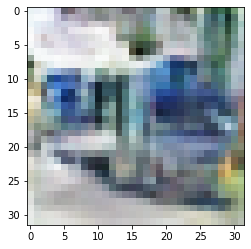

-> Epoch 333, Batch numero 1/78 -> Disc. loss on real images: 0.22079, Disc. loss on fake images: 0.12264, Generator loss: 2.68356
-> Epoch 333, Batch numero 2/78 -> Disc. loss on real images: 0.19208, Disc. loss on fake images: 0.31525, Generator loss: 2.72037
-> Epoch 333, Batch numero 3/78 -> Disc. loss on real images: 0.42600, Disc. loss on fake images: 0.32401, Generator loss: 2.33292
-> Epoch 333, Batch numero 4/78 -> Disc. loss on real images: 0.33663, Disc. loss on fake images: 0.48639, Generator loss: 2.37379
-> Epoch 333, Batch numero 5/78 -> Disc. loss on real images: 0.25939, Disc. loss on fake images: 0.29001, Generator loss: 2.45232
-> Epoch 333, Batch numero 6/78 -> Disc. loss on real images: 0.26601, Disc. loss on fake images: 0.24552, Generator loss: 2.50902
-> Epoch 333, Batch numero 7/78 -> Disc. loss on real images: 0.25772, Disc. loss on fake images: 0.28241, Generator loss: 3.04084
-> Epoch 333, Batch numero 8/78 -> Disc. loss on real images: 0.46517, Disc. loss o

-> Epoch 333, Batch numero 65/78 -> Disc. loss on real images: 0.32059, Disc. loss on fake images: 0.32740, Generator loss: 3.06668
-> Epoch 333, Batch numero 66/78 -> Disc. loss on real images: 0.40581, Disc. loss on fake images: 0.18631, Generator loss: 2.46030
-> Epoch 333, Batch numero 67/78 -> Disc. loss on real images: 0.24389, Disc. loss on fake images: 0.30680, Generator loss: 2.87198
-> Epoch 333, Batch numero 68/78 -> Disc. loss on real images: 0.14850, Disc. loss on fake images: 0.17485, Generator loss: 2.62639
-> Epoch 333, Batch numero 69/78 -> Disc. loss on real images: 0.39747, Disc. loss on fake images: 0.25929, Generator loss: 2.80898
-> Epoch 333, Batch numero 70/78 -> Disc. loss on real images: 0.38943, Disc. loss on fake images: 0.50607, Generator loss: 2.70300
-> Epoch 333, Batch numero 71/78 -> Disc. loss on real images: 0.25150, Disc. loss on fake images: 0.17739, Generator loss: 2.68994
-> Epoch 333, Batch numero 72/78 -> Disc. loss on real images: 0.30591, Disc

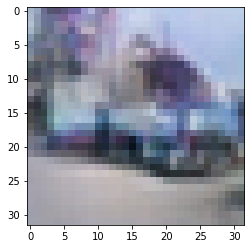

-> Epoch 334, Batch numero 1/78 -> Disc. loss on real images: 0.15081, Disc. loss on fake images: 0.18317, Generator loss: 3.03346
-> Epoch 334, Batch numero 2/78 -> Disc. loss on real images: 0.21836, Disc. loss on fake images: 0.16530, Generator loss: 2.95261
-> Epoch 334, Batch numero 3/78 -> Disc. loss on real images: 0.28955, Disc. loss on fake images: 0.46225, Generator loss: 2.85543
-> Epoch 334, Batch numero 4/78 -> Disc. loss on real images: 0.18658, Disc. loss on fake images: 0.13787, Generator loss: 2.87275
-> Epoch 334, Batch numero 5/78 -> Disc. loss on real images: 0.22785, Disc. loss on fake images: 0.20177, Generator loss: 2.61084
-> Epoch 334, Batch numero 6/78 -> Disc. loss on real images: 0.32658, Disc. loss on fake images: 0.32097, Generator loss: 3.05111
-> Epoch 334, Batch numero 7/78 -> Disc. loss on real images: 0.20523, Disc. loss on fake images: 0.35453, Generator loss: 2.67620
-> Epoch 334, Batch numero 8/78 -> Disc. loss on real images: 0.32230, Disc. loss o

-> Epoch 334, Batch numero 65/78 -> Disc. loss on real images: 0.28249, Disc. loss on fake images: 0.39246, Generator loss: 2.87321
-> Epoch 334, Batch numero 66/78 -> Disc. loss on real images: 0.18290, Disc. loss on fake images: 0.24871, Generator loss: 3.15309
-> Epoch 334, Batch numero 67/78 -> Disc. loss on real images: 0.35455, Disc. loss on fake images: 0.20453, Generator loss: 2.84741
-> Epoch 334, Batch numero 68/78 -> Disc. loss on real images: 0.28201, Disc. loss on fake images: 0.47321, Generator loss: 2.63083
-> Epoch 334, Batch numero 69/78 -> Disc. loss on real images: 0.19863, Disc. loss on fake images: 0.29142, Generator loss: 2.73517
-> Epoch 334, Batch numero 70/78 -> Disc. loss on real images: 0.25409, Disc. loss on fake images: 0.23350, Generator loss: 2.79746
-> Epoch 334, Batch numero 71/78 -> Disc. loss on real images: 0.23108, Disc. loss on fake images: 0.33211, Generator loss: 2.95120
-> Epoch 334, Batch numero 72/78 -> Disc. loss on real images: 0.26194, Disc

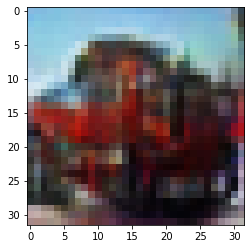

-> Epoch 335, Batch numero 1/78 -> Disc. loss on real images: 0.21347, Disc. loss on fake images: 0.37534, Generator loss: 2.84550
-> Epoch 335, Batch numero 2/78 -> Disc. loss on real images: 0.20477, Disc. loss on fake images: 0.17603, Generator loss: 2.46278
-> Epoch 335, Batch numero 3/78 -> Disc. loss on real images: 0.31594, Disc. loss on fake images: 0.34643, Generator loss: 2.84652
-> Epoch 335, Batch numero 4/78 -> Disc. loss on real images: 0.27038, Disc. loss on fake images: 0.25615, Generator loss: 2.87776
-> Epoch 335, Batch numero 5/78 -> Disc. loss on real images: 0.24902, Disc. loss on fake images: 0.34666, Generator loss: 2.85734
-> Epoch 335, Batch numero 6/78 -> Disc. loss on real images: 0.28760, Disc. loss on fake images: 0.31921, Generator loss: 2.80073
-> Epoch 335, Batch numero 7/78 -> Disc. loss on real images: 0.31115, Disc. loss on fake images: 0.17544, Generator loss: 2.71954
-> Epoch 335, Batch numero 8/78 -> Disc. loss on real images: 0.34535, Disc. loss o

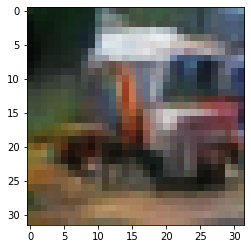

-> Epoch 336, Batch numero 1/78 -> Disc. loss on real images: 0.15810, Disc. loss on fake images: 0.19903, Generator loss: 2.93290
-> Epoch 336, Batch numero 2/78 -> Disc. loss on real images: 0.33449, Disc. loss on fake images: 0.20589, Generator loss: 2.84776
-> Epoch 336, Batch numero 3/78 -> Disc. loss on real images: 0.18716, Disc. loss on fake images: 0.36375, Generator loss: 2.77058
-> Epoch 336, Batch numero 4/78 -> Disc. loss on real images: 0.35642, Disc. loss on fake images: 0.16879, Generator loss: 2.71632
-> Epoch 336, Batch numero 5/78 -> Disc. loss on real images: 0.16109, Disc. loss on fake images: 0.40627, Generator loss: 3.03437
-> Epoch 336, Batch numero 6/78 -> Disc. loss on real images: 0.30783, Disc. loss on fake images: 0.29988, Generator loss: 2.61986
-> Epoch 336, Batch numero 7/78 -> Disc. loss on real images: 0.40090, Disc. loss on fake images: 0.32260, Generator loss: 2.83019
-> Epoch 336, Batch numero 8/78 -> Disc. loss on real images: 0.41647, Disc. loss o

-> Epoch 336, Batch numero 64/78 -> Disc. loss on real images: 0.17511, Disc. loss on fake images: 0.32843, Generator loss: 2.63484
-> Epoch 336, Batch numero 65/78 -> Disc. loss on real images: 0.33513, Disc. loss on fake images: 0.24331, Generator loss: 2.90114
-> Epoch 336, Batch numero 66/78 -> Disc. loss on real images: 0.18921, Disc. loss on fake images: 0.27134, Generator loss: 2.75562
-> Epoch 336, Batch numero 67/78 -> Disc. loss on real images: 0.21022, Disc. loss on fake images: 0.13624, Generator loss: 2.87525
-> Epoch 336, Batch numero 68/78 -> Disc. loss on real images: 0.18908, Disc. loss on fake images: 0.58543, Generator loss: 3.34931
-> Epoch 336, Batch numero 69/78 -> Disc. loss on real images: 0.31729, Disc. loss on fake images: 0.25397, Generator loss: 2.94274
-> Epoch 336, Batch numero 70/78 -> Disc. loss on real images: 0.20989, Disc. loss on fake images: 0.32930, Generator loss: 3.25052
-> Epoch 336, Batch numero 71/78 -> Disc. loss on real images: 0.48169, Disc

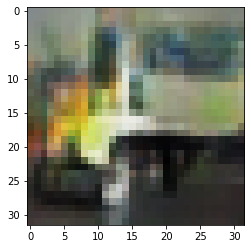

-> Epoch 337, Batch numero 1/78 -> Disc. loss on real images: 0.33756, Disc. loss on fake images: 0.18971, Generator loss: 2.97423
-> Epoch 337, Batch numero 2/78 -> Disc. loss on real images: 0.28879, Disc. loss on fake images: 0.20902, Generator loss: 2.59049
-> Epoch 337, Batch numero 3/78 -> Disc. loss on real images: 0.26757, Disc. loss on fake images: 0.21179, Generator loss: 2.34379
-> Epoch 337, Batch numero 4/78 -> Disc. loss on real images: 0.23239, Disc. loss on fake images: 0.45967, Generator loss: 2.61224
-> Epoch 337, Batch numero 5/78 -> Disc. loss on real images: 0.23790, Disc. loss on fake images: 0.13551, Generator loss: 3.19185
-> Epoch 337, Batch numero 6/78 -> Disc. loss on real images: 0.30727, Disc. loss on fake images: 0.42467, Generator loss: 2.76064
-> Epoch 337, Batch numero 7/78 -> Disc. loss on real images: 0.35508, Disc. loss on fake images: 0.28784, Generator loss: 2.78060
-> Epoch 337, Batch numero 8/78 -> Disc. loss on real images: 0.31581, Disc. loss o

-> Epoch 337, Batch numero 65/78 -> Disc. loss on real images: 0.20477, Disc. loss on fake images: 0.34645, Generator loss: 3.06372
-> Epoch 337, Batch numero 66/78 -> Disc. loss on real images: 0.27701, Disc. loss on fake images: 0.11924, Generator loss: 2.49667
-> Epoch 337, Batch numero 67/78 -> Disc. loss on real images: 0.30686, Disc. loss on fake images: 0.32973, Generator loss: 3.04792
-> Epoch 337, Batch numero 68/78 -> Disc. loss on real images: 0.20679, Disc. loss on fake images: 0.29107, Generator loss: 2.72686
-> Epoch 337, Batch numero 69/78 -> Disc. loss on real images: 0.32827, Disc. loss on fake images: 0.36716, Generator loss: 2.43368
-> Epoch 337, Batch numero 70/78 -> Disc. loss on real images: 0.18340, Disc. loss on fake images: 0.26353, Generator loss: 3.03440
-> Epoch 337, Batch numero 71/78 -> Disc. loss on real images: 0.31923, Disc. loss on fake images: 0.38743, Generator loss: 3.02020
-> Epoch 337, Batch numero 72/78 -> Disc. loss on real images: 0.26402, Disc

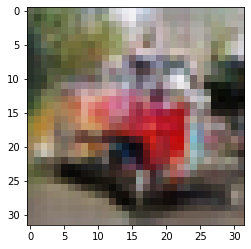

-> Epoch 338, Batch numero 1/78 -> Disc. loss on real images: 0.16231, Disc. loss on fake images: 0.24139, Generator loss: 3.16704
-> Epoch 338, Batch numero 2/78 -> Disc. loss on real images: 0.13322, Disc. loss on fake images: 0.23483, Generator loss: 3.02726
-> Epoch 338, Batch numero 3/78 -> Disc. loss on real images: 0.49686, Disc. loss on fake images: 0.15190, Generator loss: 2.71006
-> Epoch 338, Batch numero 4/78 -> Disc. loss on real images: 0.30409, Disc. loss on fake images: 0.45946, Generator loss: 2.59163
-> Epoch 338, Batch numero 5/78 -> Disc. loss on real images: 0.11531, Disc. loss on fake images: 0.42677, Generator loss: 2.66897
-> Epoch 338, Batch numero 6/78 -> Disc. loss on real images: 0.35636, Disc. loss on fake images: 0.25944, Generator loss: 3.14747
-> Epoch 338, Batch numero 7/78 -> Disc. loss on real images: 0.30349, Disc. loss on fake images: 0.23179, Generator loss: 2.90577
-> Epoch 338, Batch numero 8/78 -> Disc. loss on real images: 0.30515, Disc. loss o

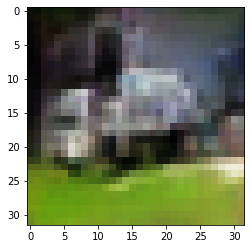

-> Epoch 339, Batch numero 1/78 -> Disc. loss on real images: 0.19303, Disc. loss on fake images: 0.22334, Generator loss: 3.36188
-> Epoch 339, Batch numero 2/78 -> Disc. loss on real images: 0.28696, Disc. loss on fake images: 0.30691, Generator loss: 2.77780
-> Epoch 339, Batch numero 3/78 -> Disc. loss on real images: 0.27033, Disc. loss on fake images: 0.27404, Generator loss: 2.75497
-> Epoch 339, Batch numero 4/78 -> Disc. loss on real images: 0.42573, Disc. loss on fake images: 0.21857, Generator loss: 2.72935
-> Epoch 339, Batch numero 5/78 -> Disc. loss on real images: 0.34908, Disc. loss on fake images: 0.50763, Generator loss: 2.97489
-> Epoch 339, Batch numero 6/78 -> Disc. loss on real images: 0.32782, Disc. loss on fake images: 0.43174, Generator loss: 3.06092
-> Epoch 339, Batch numero 7/78 -> Disc. loss on real images: 0.40986, Disc. loss on fake images: 0.24539, Generator loss: 2.35948
-> Epoch 339, Batch numero 8/78 -> Disc. loss on real images: 0.20303, Disc. loss o

-> Epoch 339, Batch numero 64/78 -> Disc. loss on real images: 0.25718, Disc. loss on fake images: 0.23522, Generator loss: 2.99150
-> Epoch 339, Batch numero 65/78 -> Disc. loss on real images: 0.37782, Disc. loss on fake images: 0.17289, Generator loss: 2.88948
-> Epoch 339, Batch numero 66/78 -> Disc. loss on real images: 0.18847, Disc. loss on fake images: 0.20604, Generator loss: 2.21618
-> Epoch 339, Batch numero 67/78 -> Disc. loss on real images: 0.19254, Disc. loss on fake images: 0.62895, Generator loss: 3.01396
-> Epoch 339, Batch numero 68/78 -> Disc. loss on real images: 0.31283, Disc. loss on fake images: 0.14953, Generator loss: 2.70095
-> Epoch 339, Batch numero 69/78 -> Disc. loss on real images: 0.24616, Disc. loss on fake images: 0.27007, Generator loss: 3.41055
-> Epoch 339, Batch numero 70/78 -> Disc. loss on real images: 0.28527, Disc. loss on fake images: 0.24573, Generator loss: 2.77925
-> Epoch 339, Batch numero 71/78 -> Disc. loss on real images: 0.28173, Disc

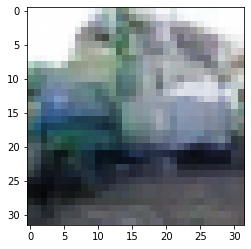

-> Epoch 340, Batch numero 1/78 -> Disc. loss on real images: 0.26321, Disc. loss on fake images: 0.13689, Generator loss: 2.52282
-> Epoch 340, Batch numero 2/78 -> Disc. loss on real images: 0.29352, Disc. loss on fake images: 0.32945, Generator loss: 2.46143
-> Epoch 340, Batch numero 3/78 -> Disc. loss on real images: 0.23482, Disc. loss on fake images: 0.50389, Generator loss: 3.10299
-> Epoch 340, Batch numero 4/78 -> Disc. loss on real images: 0.25203, Disc. loss on fake images: 0.27860, Generator loss: 3.31497
-> Epoch 340, Batch numero 5/78 -> Disc. loss on real images: 0.23215, Disc. loss on fake images: 0.27353, Generator loss: 3.13616
-> Epoch 340, Batch numero 6/78 -> Disc. loss on real images: 0.50133, Disc. loss on fake images: 0.47794, Generator loss: 3.22143
-> Epoch 340, Batch numero 7/78 -> Disc. loss on real images: 0.19139, Disc. loss on fake images: 0.10504, Generator loss: 2.78031
-> Epoch 340, Batch numero 8/78 -> Disc. loss on real images: 0.39328, Disc. loss o

-> Epoch 340, Batch numero 65/78 -> Disc. loss on real images: 0.26176, Disc. loss on fake images: 0.18192, Generator loss: 3.04811
-> Epoch 340, Batch numero 66/78 -> Disc. loss on real images: 0.34279, Disc. loss on fake images: 0.31290, Generator loss: 2.56119
-> Epoch 340, Batch numero 67/78 -> Disc. loss on real images: 0.32809, Disc. loss on fake images: 0.35589, Generator loss: 3.11599
-> Epoch 340, Batch numero 68/78 -> Disc. loss on real images: 0.23985, Disc. loss on fake images: 0.12393, Generator loss: 2.81371
-> Epoch 340, Batch numero 69/78 -> Disc. loss on real images: 0.37042, Disc. loss on fake images: 0.31691, Generator loss: 2.44267
-> Epoch 340, Batch numero 70/78 -> Disc. loss on real images: 0.14595, Disc. loss on fake images: 0.44134, Generator loss: 2.97569
-> Epoch 340, Batch numero 71/78 -> Disc. loss on real images: 0.37287, Disc. loss on fake images: 0.18419, Generator loss: 3.09427
-> Epoch 340, Batch numero 72/78 -> Disc. loss on real images: 0.30375, Disc

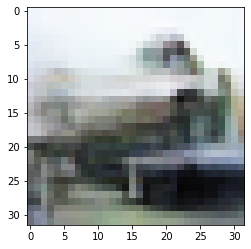

-> Epoch 341, Batch numero 1/78 -> Disc. loss on real images: 0.21578, Disc. loss on fake images: 0.19301, Generator loss: 2.63648
-> Epoch 341, Batch numero 2/78 -> Disc. loss on real images: 0.23991, Disc. loss on fake images: 0.32315, Generator loss: 2.61919
-> Epoch 341, Batch numero 3/78 -> Disc. loss on real images: 0.36223, Disc. loss on fake images: 0.44676, Generator loss: 3.15454
-> Epoch 341, Batch numero 4/78 -> Disc. loss on real images: 0.37478, Disc. loss on fake images: 0.30386, Generator loss: 3.28771
-> Epoch 341, Batch numero 5/78 -> Disc. loss on real images: 0.28236, Disc. loss on fake images: 0.25312, Generator loss: 2.87626
-> Epoch 341, Batch numero 6/78 -> Disc. loss on real images: 0.28505, Disc. loss on fake images: 0.35726, Generator loss: 2.88130
-> Epoch 341, Batch numero 7/78 -> Disc. loss on real images: 0.25548, Disc. loss on fake images: 0.41440, Generator loss: 2.86654
-> Epoch 341, Batch numero 8/78 -> Disc. loss on real images: 0.28101, Disc. loss o

-> Epoch 341, Batch numero 64/78 -> Disc. loss on real images: 0.29751, Disc. loss on fake images: 0.31925, Generator loss: 3.01561
-> Epoch 341, Batch numero 65/78 -> Disc. loss on real images: 0.49812, Disc. loss on fake images: 0.27701, Generator loss: 2.65619
-> Epoch 341, Batch numero 66/78 -> Disc. loss on real images: 0.23261, Disc. loss on fake images: 0.41580, Generator loss: 3.03309
-> Epoch 341, Batch numero 67/78 -> Disc. loss on real images: 0.31851, Disc. loss on fake images: 0.21369, Generator loss: 2.84646
-> Epoch 341, Batch numero 68/78 -> Disc. loss on real images: 0.16965, Disc. loss on fake images: 0.25588, Generator loss: 2.91545
-> Epoch 341, Batch numero 69/78 -> Disc. loss on real images: 0.21348, Disc. loss on fake images: 0.27371, Generator loss: 2.93444
-> Epoch 341, Batch numero 70/78 -> Disc. loss on real images: 0.41997, Disc. loss on fake images: 0.37229, Generator loss: 3.06174
-> Epoch 341, Batch numero 71/78 -> Disc. loss on real images: 0.31188, Disc

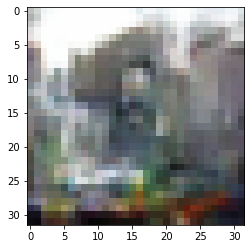

-> Epoch 342, Batch numero 1/78 -> Disc. loss on real images: 0.20645, Disc. loss on fake images: 0.42200, Generator loss: 2.94211
-> Epoch 342, Batch numero 2/78 -> Disc. loss on real images: 0.25245, Disc. loss on fake images: 0.21090, Generator loss: 2.96957
-> Epoch 342, Batch numero 3/78 -> Disc. loss on real images: 0.35484, Disc. loss on fake images: 0.25749, Generator loss: 2.99382
-> Epoch 342, Batch numero 4/78 -> Disc. loss on real images: 0.38626, Disc. loss on fake images: 0.30068, Generator loss: 2.93732
-> Epoch 342, Batch numero 5/78 -> Disc. loss on real images: 0.14549, Disc. loss on fake images: 0.24446, Generator loss: 2.66547
-> Epoch 342, Batch numero 6/78 -> Disc. loss on real images: 0.19909, Disc. loss on fake images: 0.36430, Generator loss: 3.14510
-> Epoch 342, Batch numero 7/78 -> Disc. loss on real images: 0.32889, Disc. loss on fake images: 0.25681, Generator loss: 3.20356
-> Epoch 342, Batch numero 8/78 -> Disc. loss on real images: 0.36985, Disc. loss o

-> Epoch 342, Batch numero 64/78 -> Disc. loss on real images: 0.28921, Disc. loss on fake images: 0.22590, Generator loss: 2.70078
-> Epoch 342, Batch numero 65/78 -> Disc. loss on real images: 0.29729, Disc. loss on fake images: 0.48643, Generator loss: 2.52663
-> Epoch 342, Batch numero 66/78 -> Disc. loss on real images: 0.30733, Disc. loss on fake images: 0.32712, Generator loss: 2.68215
-> Epoch 342, Batch numero 67/78 -> Disc. loss on real images: 0.27361, Disc. loss on fake images: 0.38230, Generator loss: 3.15483
-> Epoch 342, Batch numero 68/78 -> Disc. loss on real images: 0.24120, Disc. loss on fake images: 0.23064, Generator loss: 3.21384
-> Epoch 342, Batch numero 69/78 -> Disc. loss on real images: 0.31866, Disc. loss on fake images: 0.27525, Generator loss: 3.23969
-> Epoch 342, Batch numero 70/78 -> Disc. loss on real images: 0.25068, Disc. loss on fake images: 0.57519, Generator loss: 3.16074
-> Epoch 342, Batch numero 71/78 -> Disc. loss on real images: 0.32397, Disc

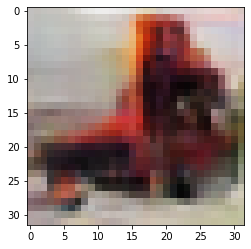

-> Epoch 343, Batch numero 1/78 -> Disc. loss on real images: 0.36365, Disc. loss on fake images: 0.30115, Generator loss: 3.57772
-> Epoch 343, Batch numero 2/78 -> Disc. loss on real images: 0.53775, Disc. loss on fake images: 0.14254, Generator loss: 2.75516
-> Epoch 343, Batch numero 3/78 -> Disc. loss on real images: 0.11412, Disc. loss on fake images: 0.25528, Generator loss: 2.62766
-> Epoch 343, Batch numero 4/78 -> Disc. loss on real images: 0.29442, Disc. loss on fake images: 0.34003, Generator loss: 2.64735
-> Epoch 343, Batch numero 5/78 -> Disc. loss on real images: 0.13607, Disc. loss on fake images: 0.42650, Generator loss: 3.13053
-> Epoch 343, Batch numero 6/78 -> Disc. loss on real images: 0.19772, Disc. loss on fake images: 0.28322, Generator loss: 3.20802
-> Epoch 343, Batch numero 7/78 -> Disc. loss on real images: 0.36405, Disc. loss on fake images: 0.23086, Generator loss: 2.97599
-> Epoch 343, Batch numero 8/78 -> Disc. loss on real images: 0.30827, Disc. loss o

-> Epoch 343, Batch numero 64/78 -> Disc. loss on real images: 0.33152, Disc. loss on fake images: 0.18804, Generator loss: 2.59155
-> Epoch 343, Batch numero 65/78 -> Disc. loss on real images: 0.19483, Disc. loss on fake images: 0.35662, Generator loss: 2.71697
-> Epoch 343, Batch numero 66/78 -> Disc. loss on real images: 0.28447, Disc. loss on fake images: 0.40196, Generator loss: 2.94638
-> Epoch 343, Batch numero 67/78 -> Disc. loss on real images: 0.23724, Disc. loss on fake images: 0.33259, Generator loss: 3.76776
-> Epoch 343, Batch numero 68/78 -> Disc. loss on real images: 0.30629, Disc. loss on fake images: 0.18728, Generator loss: 3.28820
-> Epoch 343, Batch numero 69/78 -> Disc. loss on real images: 0.45154, Disc. loss on fake images: 0.26958, Generator loss: 2.62600
-> Epoch 343, Batch numero 70/78 -> Disc. loss on real images: 0.17490, Disc. loss on fake images: 0.24956, Generator loss: 2.63610
-> Epoch 343, Batch numero 71/78 -> Disc. loss on real images: 0.20576, Disc

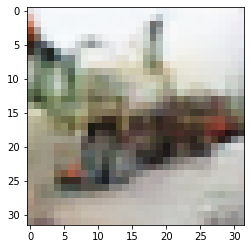

-> Epoch 344, Batch numero 1/78 -> Disc. loss on real images: 0.30055, Disc. loss on fake images: 0.23806, Generator loss: 2.18407
-> Epoch 344, Batch numero 2/78 -> Disc. loss on real images: 0.19415, Disc. loss on fake images: 0.47024, Generator loss: 3.34866
-> Epoch 344, Batch numero 3/78 -> Disc. loss on real images: 0.35816, Disc. loss on fake images: 0.24859, Generator loss: 3.20690
-> Epoch 344, Batch numero 4/78 -> Disc. loss on real images: 0.22857, Disc. loss on fake images: 0.22996, Generator loss: 3.11474
-> Epoch 344, Batch numero 5/78 -> Disc. loss on real images: 0.23951, Disc. loss on fake images: 0.29778, Generator loss: 3.02652
-> Epoch 344, Batch numero 6/78 -> Disc. loss on real images: 0.52671, Disc. loss on fake images: 0.68279, Generator loss: 3.12392
-> Epoch 344, Batch numero 7/78 -> Disc. loss on real images: 0.19891, Disc. loss on fake images: 0.19111, Generator loss: 3.14850
-> Epoch 344, Batch numero 8/78 -> Disc. loss on real images: 0.29355, Disc. loss o

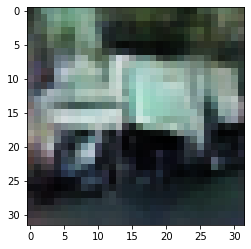

-> Epoch 345, Batch numero 1/78 -> Disc. loss on real images: 0.14964, Disc. loss on fake images: 0.22750, Generator loss: 3.60121
-> Epoch 345, Batch numero 2/78 -> Disc. loss on real images: 0.37838, Disc. loss on fake images: 0.32848, Generator loss: 3.46833
-> Epoch 345, Batch numero 3/78 -> Disc. loss on real images: 0.31758, Disc. loss on fake images: 0.23440, Generator loss: 2.63098
-> Epoch 345, Batch numero 4/78 -> Disc. loss on real images: 0.26469, Disc. loss on fake images: 0.24088, Generator loss: 2.64830
-> Epoch 345, Batch numero 5/78 -> Disc. loss on real images: 0.39470, Disc. loss on fake images: 0.31745, Generator loss: 2.83960
-> Epoch 345, Batch numero 6/78 -> Disc. loss on real images: 0.33522, Disc. loss on fake images: 0.68720, Generator loss: 2.96773
-> Epoch 345, Batch numero 7/78 -> Disc. loss on real images: 0.37759, Disc. loss on fake images: 0.35575, Generator loss: 3.25943
-> Epoch 345, Batch numero 8/78 -> Disc. loss on real images: 0.40548, Disc. loss o

-> Epoch 345, Batch numero 64/78 -> Disc. loss on real images: 0.27700, Disc. loss on fake images: 0.22769, Generator loss: 2.78169
-> Epoch 345, Batch numero 65/78 -> Disc. loss on real images: 0.32480, Disc. loss on fake images: 0.31056, Generator loss: 2.88205
-> Epoch 345, Batch numero 66/78 -> Disc. loss on real images: 0.18787, Disc. loss on fake images: 0.14133, Generator loss: 3.19424
-> Epoch 345, Batch numero 67/78 -> Disc. loss on real images: 0.23074, Disc. loss on fake images: 0.35245, Generator loss: 2.52632
-> Epoch 345, Batch numero 68/78 -> Disc. loss on real images: 0.31715, Disc. loss on fake images: 0.52031, Generator loss: 3.32115
-> Epoch 345, Batch numero 69/78 -> Disc. loss on real images: 0.26374, Disc. loss on fake images: 0.32669, Generator loss: 3.19970
-> Epoch 345, Batch numero 70/78 -> Disc. loss on real images: 0.24448, Disc. loss on fake images: 0.35406, Generator loss: 3.24976
-> Epoch 345, Batch numero 71/78 -> Disc. loss on real images: 0.39732, Disc

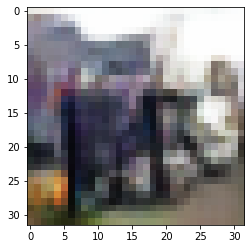

-> Epoch 346, Batch numero 1/78 -> Disc. loss on real images: 0.23782, Disc. loss on fake images: 0.25910, Generator loss: 3.10568
-> Epoch 346, Batch numero 2/78 -> Disc. loss on real images: 0.34760, Disc. loss on fake images: 0.48371, Generator loss: 3.17820
-> Epoch 346, Batch numero 3/78 -> Disc. loss on real images: 0.29587, Disc. loss on fake images: 0.29203, Generator loss: 2.92974
-> Epoch 346, Batch numero 4/78 -> Disc. loss on real images: 0.30860, Disc. loss on fake images: 0.30765, Generator loss: 2.98436
-> Epoch 346, Batch numero 5/78 -> Disc. loss on real images: 0.21125, Disc. loss on fake images: 0.36032, Generator loss: 2.78055
-> Epoch 346, Batch numero 6/78 -> Disc. loss on real images: 0.24871, Disc. loss on fake images: 0.35205, Generator loss: 3.16826
-> Epoch 346, Batch numero 7/78 -> Disc. loss on real images: 0.31399, Disc. loss on fake images: 0.20353, Generator loss: 3.02748
-> Epoch 346, Batch numero 8/78 -> Disc. loss on real images: 0.19181, Disc. loss o

-> Epoch 346, Batch numero 64/78 -> Disc. loss on real images: 0.34172, Disc. loss on fake images: 0.28171, Generator loss: 3.01854
-> Epoch 346, Batch numero 65/78 -> Disc. loss on real images: 0.16563, Disc. loss on fake images: 0.25654, Generator loss: 3.06554
-> Epoch 346, Batch numero 66/78 -> Disc. loss on real images: 0.46465, Disc. loss on fake images: 0.26830, Generator loss: 2.32920
-> Epoch 346, Batch numero 67/78 -> Disc. loss on real images: 0.22244, Disc. loss on fake images: 0.58497, Generator loss: 2.97531
-> Epoch 346, Batch numero 68/78 -> Disc. loss on real images: 0.36929, Disc. loss on fake images: 0.31898, Generator loss: 3.58603
-> Epoch 346, Batch numero 69/78 -> Disc. loss on real images: 0.33523, Disc. loss on fake images: 0.34680, Generator loss: 3.72041
-> Epoch 346, Batch numero 70/78 -> Disc. loss on real images: 0.27250, Disc. loss on fake images: 0.39550, Generator loss: 3.55538
-> Epoch 346, Batch numero 71/78 -> Disc. loss on real images: 0.50782, Disc

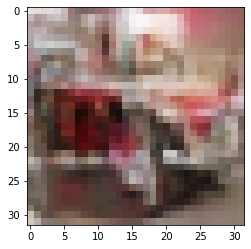

-> Epoch 347, Batch numero 1/78 -> Disc. loss on real images: 0.20415, Disc. loss on fake images: 0.44840, Generator loss: 3.13488
-> Epoch 347, Batch numero 2/78 -> Disc. loss on real images: 0.36149, Disc. loss on fake images: 0.16997, Generator loss: 2.97214
-> Epoch 347, Batch numero 3/78 -> Disc. loss on real images: 0.22336, Disc. loss on fake images: 0.35261, Generator loss: 2.98534
-> Epoch 347, Batch numero 4/78 -> Disc. loss on real images: 0.17334, Disc. loss on fake images: 0.31500, Generator loss: 3.08332
-> Epoch 347, Batch numero 5/78 -> Disc. loss on real images: 0.43842, Disc. loss on fake images: 0.39955, Generator loss: 2.77233
-> Epoch 347, Batch numero 6/78 -> Disc. loss on real images: 0.42625, Disc. loss on fake images: 0.33306, Generator loss: 2.68957
-> Epoch 347, Batch numero 7/78 -> Disc. loss on real images: 0.22528, Disc. loss on fake images: 0.23720, Generator loss: 3.15471
-> Epoch 347, Batch numero 8/78 -> Disc. loss on real images: 0.31600, Disc. loss o

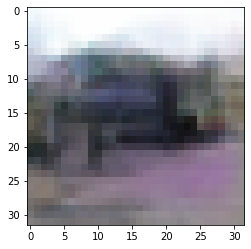

-> Epoch 348, Batch numero 1/78 -> Disc. loss on real images: 0.21931, Disc. loss on fake images: 0.46220, Generator loss: 2.93463
-> Epoch 348, Batch numero 2/78 -> Disc. loss on real images: 0.23503, Disc. loss on fake images: 0.65333, Generator loss: 3.44277
-> Epoch 348, Batch numero 3/78 -> Disc. loss on real images: 0.47723, Disc. loss on fake images: 0.20205, Generator loss: 3.47795
-> Epoch 348, Batch numero 4/78 -> Disc. loss on real images: 0.23665, Disc. loss on fake images: 0.44337, Generator loss: 3.52345
-> Epoch 348, Batch numero 5/78 -> Disc. loss on real images: 0.16398, Disc. loss on fake images: 0.16242, Generator loss: 3.70590
-> Epoch 348, Batch numero 6/78 -> Disc. loss on real images: 0.41731, Disc. loss on fake images: 0.25240, Generator loss: 2.87760
-> Epoch 348, Batch numero 7/78 -> Disc. loss on real images: 0.44308, Disc. loss on fake images: 0.45228, Generator loss: 2.60765
-> Epoch 348, Batch numero 8/78 -> Disc. loss on real images: 0.23808, Disc. loss o

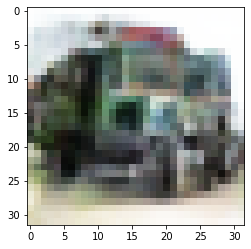

-> Epoch 349, Batch numero 1/78 -> Disc. loss on real images: 0.21703, Disc. loss on fake images: 0.37812, Generator loss: 3.32773
-> Epoch 349, Batch numero 2/78 -> Disc. loss on real images: 0.20926, Disc. loss on fake images: 0.14965, Generator loss: 3.17858
-> Epoch 349, Batch numero 3/78 -> Disc. loss on real images: 0.42366, Disc. loss on fake images: 0.22090, Generator loss: 2.68605
-> Epoch 349, Batch numero 4/78 -> Disc. loss on real images: 0.24495, Disc. loss on fake images: 0.48891, Generator loss: 3.23846
-> Epoch 349, Batch numero 5/78 -> Disc. loss on real images: 0.27142, Disc. loss on fake images: 0.13436, Generator loss: 3.14092
-> Epoch 349, Batch numero 6/78 -> Disc. loss on real images: 0.25433, Disc. loss on fake images: 0.31131, Generator loss: 3.20192
-> Epoch 349, Batch numero 7/78 -> Disc. loss on real images: 0.24654, Disc. loss on fake images: 0.14109, Generator loss: 3.13619
-> Epoch 349, Batch numero 8/78 -> Disc. loss on real images: 0.25274, Disc. loss o

-> Epoch 349, Batch numero 65/78 -> Disc. loss on real images: 0.26390, Disc. loss on fake images: 0.10805, Generator loss: 3.45443
-> Epoch 349, Batch numero 66/78 -> Disc. loss on real images: 0.20094, Disc. loss on fake images: 0.20777, Generator loss: 2.84335
-> Epoch 349, Batch numero 67/78 -> Disc. loss on real images: 0.22441, Disc. loss on fake images: 0.41610, Generator loss: 3.08577
-> Epoch 349, Batch numero 68/78 -> Disc. loss on real images: 0.22521, Disc. loss on fake images: 0.14363, Generator loss: 3.34677
-> Epoch 349, Batch numero 69/78 -> Disc. loss on real images: 0.26179, Disc. loss on fake images: 0.35763, Generator loss: 2.82146
-> Epoch 349, Batch numero 70/78 -> Disc. loss on real images: 0.18275, Disc. loss on fake images: 0.25398, Generator loss: 3.19519
-> Epoch 349, Batch numero 71/78 -> Disc. loss on real images: 0.18590, Disc. loss on fake images: 0.13415, Generator loss: 3.18110
-> Epoch 349, Batch numero 72/78 -> Disc. loss on real images: 0.39121, Disc

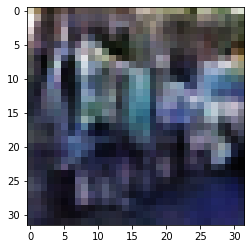

-> Epoch 350, Batch numero 1/78 -> Disc. loss on real images: 0.31582, Disc. loss on fake images: 0.23213, Generator loss: 2.76629
-> Epoch 350, Batch numero 2/78 -> Disc. loss on real images: 0.26212, Disc. loss on fake images: 0.43238, Generator loss: 2.89221
-> Epoch 350, Batch numero 3/78 -> Disc. loss on real images: 0.34096, Disc. loss on fake images: 0.21571, Generator loss: 3.01506
-> Epoch 350, Batch numero 4/78 -> Disc. loss on real images: 0.27620, Disc. loss on fake images: 0.34015, Generator loss: 2.84702
-> Epoch 350, Batch numero 5/78 -> Disc. loss on real images: 0.25114, Disc. loss on fake images: 0.41978, Generator loss: 3.42961
-> Epoch 350, Batch numero 6/78 -> Disc. loss on real images: 0.35745, Disc. loss on fake images: 0.25907, Generator loss: 3.34868
-> Epoch 350, Batch numero 7/78 -> Disc. loss on real images: 0.26413, Disc. loss on fake images: 0.23715, Generator loss: 3.19574
-> Epoch 350, Batch numero 8/78 -> Disc. loss on real images: 0.24688, Disc. loss o

-> Epoch 350, Batch numero 65/78 -> Disc. loss on real images: 0.26908, Disc. loss on fake images: 0.14436, Generator loss: 3.60126
-> Epoch 350, Batch numero 66/78 -> Disc. loss on real images: 0.19188, Disc. loss on fake images: 0.19662, Generator loss: 3.13962
-> Epoch 350, Batch numero 67/78 -> Disc. loss on real images: 0.41051, Disc. loss on fake images: 0.20499, Generator loss: 3.20223
-> Epoch 350, Batch numero 68/78 -> Disc. loss on real images: 0.30105, Disc. loss on fake images: 0.28609, Generator loss: 2.82679
-> Epoch 350, Batch numero 69/78 -> Disc. loss on real images: 0.24634, Disc. loss on fake images: 0.50356, Generator loss: 3.39217
-> Epoch 350, Batch numero 70/78 -> Disc. loss on real images: 0.23920, Disc. loss on fake images: 0.18186, Generator loss: 3.17967
-> Epoch 350, Batch numero 71/78 -> Disc. loss on real images: 0.36473, Disc. loss on fake images: 0.47507, Generator loss: 2.86559
-> Epoch 350, Batch numero 72/78 -> Disc. loss on real images: 0.08544, Disc

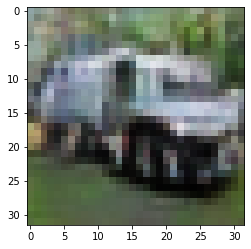

-> Epoch 351, Batch numero 1/78 -> Disc. loss on real images: 0.15724, Disc. loss on fake images: 0.39479, Generator loss: 2.95216
-> Epoch 351, Batch numero 2/78 -> Disc. loss on real images: 0.16980, Disc. loss on fake images: 0.29144, Generator loss: 3.05752
-> Epoch 351, Batch numero 3/78 -> Disc. loss on real images: 0.37449, Disc. loss on fake images: 0.27544, Generator loss: 3.14424
-> Epoch 351, Batch numero 4/78 -> Disc. loss on real images: 0.28980, Disc. loss on fake images: 0.34901, Generator loss: 2.84127
-> Epoch 351, Batch numero 5/78 -> Disc. loss on real images: 0.21100, Disc. loss on fake images: 0.29033, Generator loss: 3.19633
-> Epoch 351, Batch numero 6/78 -> Disc. loss on real images: 0.49703, Disc. loss on fake images: 0.12027, Generator loss: 2.50340
-> Epoch 351, Batch numero 7/78 -> Disc. loss on real images: 0.15121, Disc. loss on fake images: 0.39555, Generator loss: 2.75170
-> Epoch 351, Batch numero 8/78 -> Disc. loss on real images: 0.28892, Disc. loss o

-> Epoch 351, Batch numero 64/78 -> Disc. loss on real images: 0.35895, Disc. loss on fake images: 0.10565, Generator loss: 2.70082
-> Epoch 351, Batch numero 65/78 -> Disc. loss on real images: 0.11647, Disc. loss on fake images: 0.19063, Generator loss: 2.68032
-> Epoch 351, Batch numero 66/78 -> Disc. loss on real images: 0.09818, Disc. loss on fake images: 0.28045, Generator loss: 2.45255
-> Epoch 351, Batch numero 67/78 -> Disc. loss on real images: 0.17619, Disc. loss on fake images: 0.13964, Generator loss: 2.82864
-> Epoch 351, Batch numero 68/78 -> Disc. loss on real images: 0.28158, Disc. loss on fake images: 0.46784, Generator loss: 3.19403
-> Epoch 351, Batch numero 69/78 -> Disc. loss on real images: 0.29086, Disc. loss on fake images: 0.13393, Generator loss: 2.70543
-> Epoch 351, Batch numero 70/78 -> Disc. loss on real images: 0.18811, Disc. loss on fake images: 0.27756, Generator loss: 3.02608
-> Epoch 351, Batch numero 71/78 -> Disc. loss on real images: 0.22436, Disc

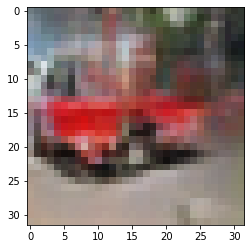

-> Epoch 352, Batch numero 1/78 -> Disc. loss on real images: 0.22361, Disc. loss on fake images: 0.29315, Generator loss: 2.53246
-> Epoch 352, Batch numero 2/78 -> Disc. loss on real images: 0.11262, Disc. loss on fake images: 0.31650, Generator loss: 3.14536
-> Epoch 352, Batch numero 3/78 -> Disc. loss on real images: 0.27816, Disc. loss on fake images: 0.19371, Generator loss: 2.63085
-> Epoch 352, Batch numero 4/78 -> Disc. loss on real images: 0.35911, Disc. loss on fake images: 0.22798, Generator loss: 3.34601
-> Epoch 352, Batch numero 5/78 -> Disc. loss on real images: 0.18886, Disc. loss on fake images: 0.32226, Generator loss: 3.00142
-> Epoch 352, Batch numero 6/78 -> Disc. loss on real images: 0.41814, Disc. loss on fake images: 0.19282, Generator loss: 2.86295
-> Epoch 352, Batch numero 7/78 -> Disc. loss on real images: 0.17601, Disc. loss on fake images: 0.45090, Generator loss: 3.03183
-> Epoch 352, Batch numero 8/78 -> Disc. loss on real images: 0.33351, Disc. loss o

-> Epoch 352, Batch numero 64/78 -> Disc. loss on real images: 0.13196, Disc. loss on fake images: 0.42932, Generator loss: 2.81398
-> Epoch 352, Batch numero 65/78 -> Disc. loss on real images: 0.15771, Disc. loss on fake images: 0.16727, Generator loss: 3.02629
-> Epoch 352, Batch numero 66/78 -> Disc. loss on real images: 0.34389, Disc. loss on fake images: 0.21966, Generator loss: 3.32269
-> Epoch 352, Batch numero 67/78 -> Disc. loss on real images: 0.23671, Disc. loss on fake images: 0.24407, Generator loss: 3.06857
-> Epoch 352, Batch numero 68/78 -> Disc. loss on real images: 0.21558, Disc. loss on fake images: 0.20061, Generator loss: 3.19121
-> Epoch 352, Batch numero 69/78 -> Disc. loss on real images: 0.29206, Disc. loss on fake images: 0.27034, Generator loss: 3.29063
-> Epoch 352, Batch numero 70/78 -> Disc. loss on real images: 0.52492, Disc. loss on fake images: 0.09674, Generator loss: 2.53071
-> Epoch 352, Batch numero 71/78 -> Disc. loss on real images: 0.16065, Disc

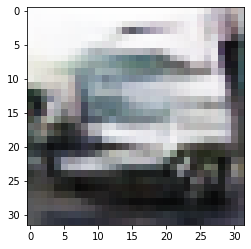

-> Epoch 353, Batch numero 1/78 -> Disc. loss on real images: 0.34615, Disc. loss on fake images: 0.38760, Generator loss: 2.63740
-> Epoch 353, Batch numero 2/78 -> Disc. loss on real images: 0.36487, Disc. loss on fake images: 0.20357, Generator loss: 3.11010
-> Epoch 353, Batch numero 3/78 -> Disc. loss on real images: 0.17218, Disc. loss on fake images: 0.22881, Generator loss: 2.64143
-> Epoch 353, Batch numero 4/78 -> Disc. loss on real images: 0.18707, Disc. loss on fake images: 0.22681, Generator loss: 2.37939
-> Epoch 353, Batch numero 5/78 -> Disc. loss on real images: 0.23924, Disc. loss on fake images: 0.57167, Generator loss: 2.56757
-> Epoch 353, Batch numero 6/78 -> Disc. loss on real images: 0.29053, Disc. loss on fake images: 0.50559, Generator loss: 3.41636
-> Epoch 353, Batch numero 7/78 -> Disc. loss on real images: 0.57854, Disc. loss on fake images: 0.16232, Generator loss: 2.62089
-> Epoch 353, Batch numero 8/78 -> Disc. loss on real images: 0.33948, Disc. loss o

-> Epoch 353, Batch numero 64/78 -> Disc. loss on real images: 0.27928, Disc. loss on fake images: 0.30331, Generator loss: 2.97119
-> Epoch 353, Batch numero 65/78 -> Disc. loss on real images: 0.17106, Disc. loss on fake images: 0.33184, Generator loss: 2.52925
-> Epoch 353, Batch numero 66/78 -> Disc. loss on real images: 0.34303, Disc. loss on fake images: 0.22201, Generator loss: 3.20886
-> Epoch 353, Batch numero 67/78 -> Disc. loss on real images: 0.11365, Disc. loss on fake images: 0.36182, Generator loss: 3.30094
-> Epoch 353, Batch numero 68/78 -> Disc. loss on real images: 0.32818, Disc. loss on fake images: 0.41216, Generator loss: 3.32696
-> Epoch 353, Batch numero 69/78 -> Disc. loss on real images: 0.16107, Disc. loss on fake images: 0.43069, Generator loss: 3.55054
-> Epoch 353, Batch numero 70/78 -> Disc. loss on real images: 0.57148, Disc. loss on fake images: 0.13748, Generator loss: 3.45864
-> Epoch 353, Batch numero 71/78 -> Disc. loss on real images: 0.15997, Disc

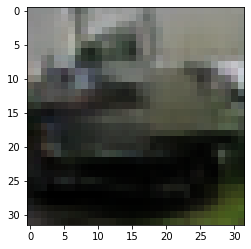

-> Epoch 354, Batch numero 1/78 -> Disc. loss on real images: 0.31711, Disc. loss on fake images: 0.72101, Generator loss: 3.15975
-> Epoch 354, Batch numero 2/78 -> Disc. loss on real images: 0.39379, Disc. loss on fake images: 0.30717, Generator loss: 3.49325
-> Epoch 354, Batch numero 3/78 -> Disc. loss on real images: 0.29720, Disc. loss on fake images: 0.13523, Generator loss: 2.90603
-> Epoch 354, Batch numero 4/78 -> Disc. loss on real images: 0.18983, Disc. loss on fake images: 0.27201, Generator loss: 2.88633
-> Epoch 354, Batch numero 5/78 -> Disc. loss on real images: 0.21191, Disc. loss on fake images: 0.15998, Generator loss: 2.84293
-> Epoch 354, Batch numero 6/78 -> Disc. loss on real images: 0.16739, Disc. loss on fake images: 0.24986, Generator loss: 2.89315
-> Epoch 354, Batch numero 7/78 -> Disc. loss on real images: 0.35511, Disc. loss on fake images: 0.33327, Generator loss: 2.50669
-> Epoch 354, Batch numero 8/78 -> Disc. loss on real images: 0.19522, Disc. loss o

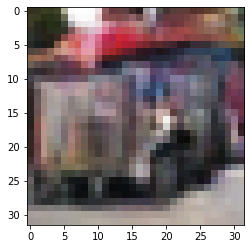

-> Epoch 355, Batch numero 1/78 -> Disc. loss on real images: 0.18035, Disc. loss on fake images: 0.21730, Generator loss: 3.11208
-> Epoch 355, Batch numero 2/78 -> Disc. loss on real images: 0.13377, Disc. loss on fake images: 0.20225, Generator loss: 2.74666
-> Epoch 355, Batch numero 3/78 -> Disc. loss on real images: 0.24672, Disc. loss on fake images: 0.27379, Generator loss: 2.86716
-> Epoch 355, Batch numero 4/78 -> Disc. loss on real images: 0.19424, Disc. loss on fake images: 0.43538, Generator loss: 3.19347
-> Epoch 355, Batch numero 5/78 -> Disc. loss on real images: 0.40110, Disc. loss on fake images: 0.47679, Generator loss: 3.27942
-> Epoch 355, Batch numero 6/78 -> Disc. loss on real images: 0.40718, Disc. loss on fake images: 0.12717, Generator loss: 3.61806
-> Epoch 355, Batch numero 7/78 -> Disc. loss on real images: 0.29278, Disc. loss on fake images: 0.27669, Generator loss: 3.22238
-> Epoch 355, Batch numero 8/78 -> Disc. loss on real images: 0.24631, Disc. loss o

-> Epoch 355, Batch numero 64/78 -> Disc. loss on real images: 0.13689, Disc. loss on fake images: 0.18710, Generator loss: 3.09832
-> Epoch 355, Batch numero 65/78 -> Disc. loss on real images: 0.22172, Disc. loss on fake images: 0.47286, Generator loss: 3.16645
-> Epoch 355, Batch numero 66/78 -> Disc. loss on real images: 0.20577, Disc. loss on fake images: 0.34572, Generator loss: 3.58324
-> Epoch 355, Batch numero 67/78 -> Disc. loss on real images: 0.47475, Disc. loss on fake images: 0.28508, Generator loss: 3.07146
-> Epoch 355, Batch numero 68/78 -> Disc. loss on real images: 0.32010, Disc. loss on fake images: 0.12241, Generator loss: 2.62501
-> Epoch 355, Batch numero 69/78 -> Disc. loss on real images: 0.13543, Disc. loss on fake images: 0.65973, Generator loss: 2.96776
-> Epoch 355, Batch numero 70/78 -> Disc. loss on real images: 0.27315, Disc. loss on fake images: 0.14989, Generator loss: 3.11586
-> Epoch 355, Batch numero 71/78 -> Disc. loss on real images: 0.45959, Disc

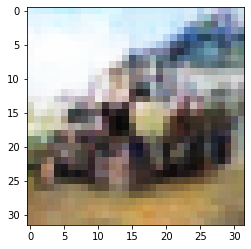

-> Epoch 356, Batch numero 1/78 -> Disc. loss on real images: 0.40981, Disc. loss on fake images: 0.42105, Generator loss: 2.56975
-> Epoch 356, Batch numero 2/78 -> Disc. loss on real images: 0.20666, Disc. loss on fake images: 0.40409, Generator loss: 3.45086
-> Epoch 356, Batch numero 3/78 -> Disc. loss on real images: 0.28062, Disc. loss on fake images: 0.27086, Generator loss: 2.51784
-> Epoch 356, Batch numero 4/78 -> Disc. loss on real images: 0.21581, Disc. loss on fake images: 0.20902, Generator loss: 2.89298
-> Epoch 356, Batch numero 5/78 -> Disc. loss on real images: 0.43136, Disc. loss on fake images: 0.51832, Generator loss: 2.63713
-> Epoch 356, Batch numero 6/78 -> Disc. loss on real images: 0.15443, Disc. loss on fake images: 0.35792, Generator loss: 2.76373
-> Epoch 356, Batch numero 7/78 -> Disc. loss on real images: 0.25507, Disc. loss on fake images: 0.38068, Generator loss: 3.31532
-> Epoch 356, Batch numero 8/78 -> Disc. loss on real images: 0.52659, Disc. loss o

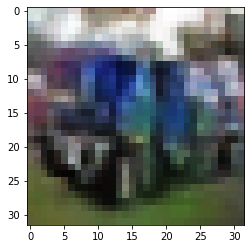

-> Epoch 357, Batch numero 1/78 -> Disc. loss on real images: 0.13583, Disc. loss on fake images: 0.18636, Generator loss: 3.17927
-> Epoch 357, Batch numero 2/78 -> Disc. loss on real images: 0.26459, Disc. loss on fake images: 0.15646, Generator loss: 2.84693
-> Epoch 357, Batch numero 3/78 -> Disc. loss on real images: 0.17474, Disc. loss on fake images: 0.27880, Generator loss: 3.16702
-> Epoch 357, Batch numero 4/78 -> Disc. loss on real images: 0.18743, Disc. loss on fake images: 0.37271, Generator loss: 3.09021
-> Epoch 357, Batch numero 5/78 -> Disc. loss on real images: 0.20192, Disc. loss on fake images: 0.15717, Generator loss: 3.00265
-> Epoch 357, Batch numero 6/78 -> Disc. loss on real images: 0.43816, Disc. loss on fake images: 0.25382, Generator loss: 2.70392
-> Epoch 357, Batch numero 7/78 -> Disc. loss on real images: 0.19018, Disc. loss on fake images: 0.18571, Generator loss: 2.24999
-> Epoch 357, Batch numero 8/78 -> Disc. loss on real images: 0.20152, Disc. loss o

-> Epoch 357, Batch numero 64/78 -> Disc. loss on real images: 0.23657, Disc. loss on fake images: 0.14516, Generator loss: 2.75945
-> Epoch 357, Batch numero 65/78 -> Disc. loss on real images: 0.22327, Disc. loss on fake images: 0.25251, Generator loss: 2.71279
-> Epoch 357, Batch numero 66/78 -> Disc. loss on real images: 0.22700, Disc. loss on fake images: 0.51524, Generator loss: 2.78659
-> Epoch 357, Batch numero 67/78 -> Disc. loss on real images: 0.25185, Disc. loss on fake images: 0.15136, Generator loss: 3.16339
-> Epoch 357, Batch numero 68/78 -> Disc. loss on real images: 0.31515, Disc. loss on fake images: 0.15325, Generator loss: 2.63198
-> Epoch 357, Batch numero 69/78 -> Disc. loss on real images: 0.16964, Disc. loss on fake images: 0.41818, Generator loss: 3.11705
-> Epoch 357, Batch numero 70/78 -> Disc. loss on real images: 0.27860, Disc. loss on fake images: 0.26108, Generator loss: 3.25810
-> Epoch 357, Batch numero 71/78 -> Disc. loss on real images: 0.19887, Disc

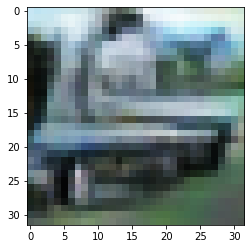

-> Epoch 358, Batch numero 1/78 -> Disc. loss on real images: 0.35945, Disc. loss on fake images: 0.33676, Generator loss: 2.87416
-> Epoch 358, Batch numero 2/78 -> Disc. loss on real images: 0.10066, Disc. loss on fake images: 0.24259, Generator loss: 2.82780
-> Epoch 358, Batch numero 3/78 -> Disc. loss on real images: 0.36872, Disc. loss on fake images: 0.18782, Generator loss: 2.63367
-> Epoch 358, Batch numero 4/78 -> Disc. loss on real images: 0.19586, Disc. loss on fake images: 0.19905, Generator loss: 2.68143
-> Epoch 358, Batch numero 5/78 -> Disc. loss on real images: 0.23404, Disc. loss on fake images: 0.24351, Generator loss: 2.80722
-> Epoch 358, Batch numero 6/78 -> Disc. loss on real images: 0.13785, Disc. loss on fake images: 0.31220, Generator loss: 3.02108
-> Epoch 358, Batch numero 7/78 -> Disc. loss on real images: 0.23613, Disc. loss on fake images: 0.16180, Generator loss: 3.28543
-> Epoch 358, Batch numero 8/78 -> Disc. loss on real images: 0.31791, Disc. loss o

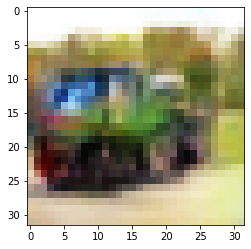

-> Epoch 359, Batch numero 1/78 -> Disc. loss on real images: 0.48514, Disc. loss on fake images: 0.28629, Generator loss: 2.79341
-> Epoch 359, Batch numero 2/78 -> Disc. loss on real images: 0.30725, Disc. loss on fake images: 0.33795, Generator loss: 2.31330
-> Epoch 359, Batch numero 3/78 -> Disc. loss on real images: 0.28990, Disc. loss on fake images: 0.72490, Generator loss: 3.45114
-> Epoch 359, Batch numero 4/78 -> Disc. loss on real images: 0.19313, Disc. loss on fake images: 0.17010, Generator loss: 3.38442
-> Epoch 359, Batch numero 5/78 -> Disc. loss on real images: 0.39436, Disc. loss on fake images: 0.27446, Generator loss: 2.94903
-> Epoch 359, Batch numero 6/78 -> Disc. loss on real images: 0.19147, Disc. loss on fake images: 0.32272, Generator loss: 3.22772
-> Epoch 359, Batch numero 7/78 -> Disc. loss on real images: 0.20592, Disc. loss on fake images: 0.36746, Generator loss: 2.97284
-> Epoch 359, Batch numero 8/78 -> Disc. loss on real images: 0.23418, Disc. loss o

-> Epoch 359, Batch numero 64/78 -> Disc. loss on real images: 0.24330, Disc. loss on fake images: 0.15645, Generator loss: 2.96258
-> Epoch 359, Batch numero 65/78 -> Disc. loss on real images: 0.42171, Disc. loss on fake images: 0.36956, Generator loss: 2.86495
-> Epoch 359, Batch numero 66/78 -> Disc. loss on real images: 0.12623, Disc. loss on fake images: 0.28868, Generator loss: 2.93711
-> Epoch 359, Batch numero 67/78 -> Disc. loss on real images: 0.21600, Disc. loss on fake images: 0.16427, Generator loss: 2.85346
-> Epoch 359, Batch numero 68/78 -> Disc. loss on real images: 0.21998, Disc. loss on fake images: 0.21955, Generator loss: 2.95163
-> Epoch 359, Batch numero 69/78 -> Disc. loss on real images: 0.14545, Disc. loss on fake images: 0.22796, Generator loss: 2.86140
-> Epoch 359, Batch numero 70/78 -> Disc. loss on real images: 0.17906, Disc. loss on fake images: 0.19665, Generator loss: 2.79703
-> Epoch 359, Batch numero 71/78 -> Disc. loss on real images: 0.15566, Disc

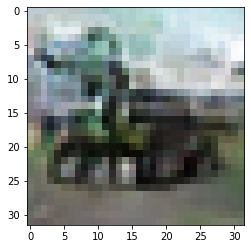

-> Epoch 360, Batch numero 1/78 -> Disc. loss on real images: 0.23334, Disc. loss on fake images: 0.10707, Generator loss: 3.19639
-> Epoch 360, Batch numero 2/78 -> Disc. loss on real images: 0.27795, Disc. loss on fake images: 0.25220, Generator loss: 2.63963
-> Epoch 360, Batch numero 3/78 -> Disc. loss on real images: 0.18835, Disc. loss on fake images: 0.27822, Generator loss: 3.19621
-> Epoch 360, Batch numero 4/78 -> Disc. loss on real images: 0.24438, Disc. loss on fake images: 0.38400, Generator loss: 3.34722
-> Epoch 360, Batch numero 5/78 -> Disc. loss on real images: 0.22172, Disc. loss on fake images: 0.20786, Generator loss: 2.63710
-> Epoch 360, Batch numero 6/78 -> Disc. loss on real images: 0.24753, Disc. loss on fake images: 0.28178, Generator loss: 3.24983
-> Epoch 360, Batch numero 7/78 -> Disc. loss on real images: 0.19813, Disc. loss on fake images: 0.34750, Generator loss: 3.14921
-> Epoch 360, Batch numero 8/78 -> Disc. loss on real images: 0.39200, Disc. loss o

-> Epoch 360, Batch numero 64/78 -> Disc. loss on real images: 0.55368, Disc. loss on fake images: 0.24249, Generator loss: 2.65732
-> Epoch 360, Batch numero 65/78 -> Disc. loss on real images: 0.38147, Disc. loss on fake images: 0.50443, Generator loss: 2.52450
-> Epoch 360, Batch numero 66/78 -> Disc. loss on real images: 0.14299, Disc. loss on fake images: 0.36150, Generator loss: 2.74431
-> Epoch 360, Batch numero 67/78 -> Disc. loss on real images: 0.26468, Disc. loss on fake images: 0.09202, Generator loss: 3.57040
-> Epoch 360, Batch numero 68/78 -> Disc. loss on real images: 0.21564, Disc. loss on fake images: 0.23107, Generator loss: 2.69618
-> Epoch 360, Batch numero 69/78 -> Disc. loss on real images: 0.35817, Disc. loss on fake images: 0.35573, Generator loss: 3.22983
-> Epoch 360, Batch numero 70/78 -> Disc. loss on real images: 0.16103, Disc. loss on fake images: 0.45599, Generator loss: 3.59317
-> Epoch 360, Batch numero 71/78 -> Disc. loss on real images: 0.28052, Disc

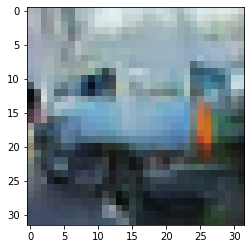

-> Epoch 361, Batch numero 1/78 -> Disc. loss on real images: 0.15600, Disc. loss on fake images: 0.38877, Generator loss: 3.23851
-> Epoch 361, Batch numero 2/78 -> Disc. loss on real images: 0.35340, Disc. loss on fake images: 0.10549, Generator loss: 3.32133
-> Epoch 361, Batch numero 3/78 -> Disc. loss on real images: 0.27138, Disc. loss on fake images: 0.46407, Generator loss: 2.67331
-> Epoch 361, Batch numero 4/78 -> Disc. loss on real images: 0.24353, Disc. loss on fake images: 0.24562, Generator loss: 2.74106
-> Epoch 361, Batch numero 5/78 -> Disc. loss on real images: 0.33212, Disc. loss on fake images: 0.34755, Generator loss: 3.00231
-> Epoch 361, Batch numero 6/78 -> Disc. loss on real images: 0.21523, Disc. loss on fake images: 0.30520, Generator loss: 3.47946
-> Epoch 361, Batch numero 7/78 -> Disc. loss on real images: 0.22917, Disc. loss on fake images: 0.14981, Generator loss: 2.86902
-> Epoch 361, Batch numero 8/78 -> Disc. loss on real images: 0.30264, Disc. loss o

-> Epoch 361, Batch numero 64/78 -> Disc. loss on real images: 0.17255, Disc. loss on fake images: 0.44795, Generator loss: 2.67592
-> Epoch 361, Batch numero 65/78 -> Disc. loss on real images: 0.21332, Disc. loss on fake images: 0.39467, Generator loss: 2.95697
-> Epoch 361, Batch numero 66/78 -> Disc. loss on real images: 0.28567, Disc. loss on fake images: 0.26341, Generator loss: 3.20314
-> Epoch 361, Batch numero 67/78 -> Disc. loss on real images: 0.40911, Disc. loss on fake images: 0.43751, Generator loss: 3.23693
-> Epoch 361, Batch numero 68/78 -> Disc. loss on real images: 0.20194, Disc. loss on fake images: 0.17992, Generator loss: 3.43508
-> Epoch 361, Batch numero 69/78 -> Disc. loss on real images: 0.15390, Disc. loss on fake images: 0.56145, Generator loss: 3.53612
-> Epoch 361, Batch numero 70/78 -> Disc. loss on real images: 0.36641, Disc. loss on fake images: 0.10860, Generator loss: 3.49155
-> Epoch 361, Batch numero 71/78 -> Disc. loss on real images: 0.31758, Disc

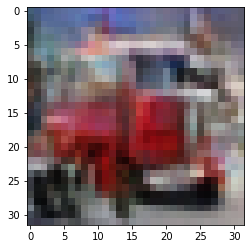

-> Epoch 362, Batch numero 1/78 -> Disc. loss on real images: 0.25359, Disc. loss on fake images: 0.22249, Generator loss: 2.53797
-> Epoch 362, Batch numero 2/78 -> Disc. loss on real images: 0.35300, Disc. loss on fake images: 0.37566, Generator loss: 2.78045
-> Epoch 362, Batch numero 3/78 -> Disc. loss on real images: 0.27752, Disc. loss on fake images: 0.17584, Generator loss: 3.10485
-> Epoch 362, Batch numero 4/78 -> Disc. loss on real images: 0.30283, Disc. loss on fake images: 0.40222, Generator loss: 2.72251
-> Epoch 362, Batch numero 5/78 -> Disc. loss on real images: 0.22642, Disc. loss on fake images: 0.31816, Generator loss: 3.04006
-> Epoch 362, Batch numero 6/78 -> Disc. loss on real images: 0.27026, Disc. loss on fake images: 0.23284, Generator loss: 3.38585
-> Epoch 362, Batch numero 7/78 -> Disc. loss on real images: 0.13041, Disc. loss on fake images: 0.12682, Generator loss: 2.96740
-> Epoch 362, Batch numero 8/78 -> Disc. loss on real images: 0.29495, Disc. loss o

-> Epoch 362, Batch numero 66/78 -> Disc. loss on real images: 0.20131, Disc. loss on fake images: 0.23904, Generator loss: 3.13315
-> Epoch 362, Batch numero 67/78 -> Disc. loss on real images: 0.41232, Disc. loss on fake images: 0.20460, Generator loss: 2.99703
-> Epoch 362, Batch numero 68/78 -> Disc. loss on real images: 0.20010, Disc. loss on fake images: 0.27516, Generator loss: 3.21950
-> Epoch 362, Batch numero 69/78 -> Disc. loss on real images: 0.14716, Disc. loss on fake images: 0.17800, Generator loss: 3.40534
-> Epoch 362, Batch numero 70/78 -> Disc. loss on real images: 0.31406, Disc. loss on fake images: 0.28820, Generator loss: 3.21879
-> Epoch 362, Batch numero 71/78 -> Disc. loss on real images: 0.18780, Disc. loss on fake images: 0.19040, Generator loss: 3.28886
-> Epoch 362, Batch numero 72/78 -> Disc. loss on real images: 0.24494, Disc. loss on fake images: 0.38804, Generator loss: 3.34467
-> Epoch 362, Batch numero 73/78 -> Disc. loss on real images: 0.26351, Disc

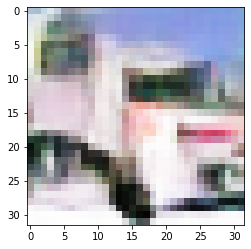

-> Epoch 363, Batch numero 1/78 -> Disc. loss on real images: 0.27795, Disc. loss on fake images: 0.22549, Generator loss: 2.17507
-> Epoch 363, Batch numero 2/78 -> Disc. loss on real images: 0.18398, Disc. loss on fake images: 0.31778, Generator loss: 3.18589
-> Epoch 363, Batch numero 3/78 -> Disc. loss on real images: 0.21941, Disc. loss on fake images: 0.36336, Generator loss: 2.87698
-> Epoch 363, Batch numero 4/78 -> Disc. loss on real images: 0.26139, Disc. loss on fake images: 0.24384, Generator loss: 3.07978
-> Epoch 363, Batch numero 5/78 -> Disc. loss on real images: 0.47354, Disc. loss on fake images: 0.22682, Generator loss: 2.44861
-> Epoch 363, Batch numero 6/78 -> Disc. loss on real images: 0.16111, Disc. loss on fake images: 0.24846, Generator loss: 2.99866
-> Epoch 363, Batch numero 7/78 -> Disc. loss on real images: 0.31077, Disc. loss on fake images: 0.30777, Generator loss: 2.71168
-> Epoch 363, Batch numero 8/78 -> Disc. loss on real images: 0.10804, Disc. loss o

-> Epoch 363, Batch numero 65/78 -> Disc. loss on real images: 0.31141, Disc. loss on fake images: 0.21838, Generator loss: 3.46579
-> Epoch 363, Batch numero 66/78 -> Disc. loss on real images: 0.20051, Disc. loss on fake images: 0.32001, Generator loss: 2.98780
-> Epoch 363, Batch numero 67/78 -> Disc. loss on real images: 0.31814, Disc. loss on fake images: 0.12022, Generator loss: 2.85784
-> Epoch 363, Batch numero 68/78 -> Disc. loss on real images: 0.18460, Disc. loss on fake images: 0.22844, Generator loss: 2.79947
-> Epoch 363, Batch numero 69/78 -> Disc. loss on real images: 0.28630, Disc. loss on fake images: 0.33355, Generator loss: 3.10852
-> Epoch 363, Batch numero 70/78 -> Disc. loss on real images: 0.16053, Disc. loss on fake images: 0.33791, Generator loss: 3.29818
-> Epoch 363, Batch numero 71/78 -> Disc. loss on real images: 0.26646, Disc. loss on fake images: 0.15567, Generator loss: 2.99965
-> Epoch 363, Batch numero 72/78 -> Disc. loss on real images: 0.45324, Disc

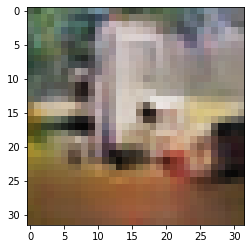

-> Epoch 364, Batch numero 1/78 -> Disc. loss on real images: 0.36567, Disc. loss on fake images: 0.19136, Generator loss: 2.56592
-> Epoch 364, Batch numero 2/78 -> Disc. loss on real images: 0.11750, Disc. loss on fake images: 0.35679, Generator loss: 2.86428
-> Epoch 364, Batch numero 3/78 -> Disc. loss on real images: 0.18374, Disc. loss on fake images: 0.22289, Generator loss: 3.19571
-> Epoch 364, Batch numero 4/78 -> Disc. loss on real images: 0.24194, Disc. loss on fake images: 0.19499, Generator loss: 3.27797
-> Epoch 364, Batch numero 5/78 -> Disc. loss on real images: 0.25463, Disc. loss on fake images: 0.25523, Generator loss: 2.97601
-> Epoch 364, Batch numero 6/78 -> Disc. loss on real images: 0.24906, Disc. loss on fake images: 0.27242, Generator loss: 3.17202
-> Epoch 364, Batch numero 7/78 -> Disc. loss on real images: 0.20425, Disc. loss on fake images: 0.16689, Generator loss: 2.98641
-> Epoch 364, Batch numero 8/78 -> Disc. loss on real images: 0.26769, Disc. loss o

-> Epoch 364, Batch numero 64/78 -> Disc. loss on real images: 0.32152, Disc. loss on fake images: 0.17836, Generator loss: 2.66787
-> Epoch 364, Batch numero 65/78 -> Disc. loss on real images: 0.22494, Disc. loss on fake images: 0.30285, Generator loss: 2.57681
-> Epoch 364, Batch numero 66/78 -> Disc. loss on real images: 0.19446, Disc. loss on fake images: 0.36353, Generator loss: 2.74007
-> Epoch 364, Batch numero 67/78 -> Disc. loss on real images: 0.29539, Disc. loss on fake images: 0.21514, Generator loss: 2.74552
-> Epoch 364, Batch numero 68/78 -> Disc. loss on real images: 0.17557, Disc. loss on fake images: 0.18923, Generator loss: 2.63145
-> Epoch 364, Batch numero 69/78 -> Disc. loss on real images: 0.36250, Disc. loss on fake images: 0.51665, Generator loss: 2.23014
-> Epoch 364, Batch numero 70/78 -> Disc. loss on real images: 0.17290, Disc. loss on fake images: 0.47337, Generator loss: 3.75696
-> Epoch 364, Batch numero 71/78 -> Disc. loss on real images: 0.46827, Disc

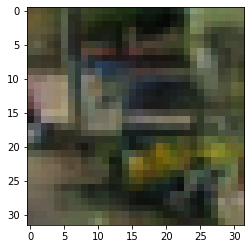

-> Epoch 365, Batch numero 1/78 -> Disc. loss on real images: 0.34761, Disc. loss on fake images: 0.20456, Generator loss: 2.52331
-> Epoch 365, Batch numero 2/78 -> Disc. loss on real images: 0.30427, Disc. loss on fake images: 0.30506, Generator loss: 3.04986
-> Epoch 365, Batch numero 3/78 -> Disc. loss on real images: 0.21300, Disc. loss on fake images: 0.19730, Generator loss: 2.73473
-> Epoch 365, Batch numero 4/78 -> Disc. loss on real images: 0.19255, Disc. loss on fake images: 0.36329, Generator loss: 2.84079
-> Epoch 365, Batch numero 5/78 -> Disc. loss on real images: 0.18958, Disc. loss on fake images: 0.22412, Generator loss: 3.27907
-> Epoch 365, Batch numero 6/78 -> Disc. loss on real images: 0.18061, Disc. loss on fake images: 0.07236, Generator loss: 2.93116
-> Epoch 365, Batch numero 7/78 -> Disc. loss on real images: 0.22487, Disc. loss on fake images: 0.30915, Generator loss: 2.83676
-> Epoch 365, Batch numero 8/78 -> Disc. loss on real images: 0.17489, Disc. loss o

-> Epoch 365, Batch numero 64/78 -> Disc. loss on real images: 0.17193, Disc. loss on fake images: 0.23847, Generator loss: 2.74554
-> Epoch 365, Batch numero 65/78 -> Disc. loss on real images: 0.13611, Disc. loss on fake images: 0.15333, Generator loss: 3.14531
-> Epoch 365, Batch numero 66/78 -> Disc. loss on real images: 0.28770, Disc. loss on fake images: 0.33283, Generator loss: 2.71100
-> Epoch 365, Batch numero 67/78 -> Disc. loss on real images: 0.19337, Disc. loss on fake images: 0.19167, Generator loss: 3.15222
-> Epoch 365, Batch numero 68/78 -> Disc. loss on real images: 0.29545, Disc. loss on fake images: 0.22946, Generator loss: 2.58998
-> Epoch 365, Batch numero 69/78 -> Disc. loss on real images: 0.21620, Disc. loss on fake images: 0.39066, Generator loss: 3.08576
-> Epoch 365, Batch numero 70/78 -> Disc. loss on real images: 0.17414, Disc. loss on fake images: 0.31853, Generator loss: 3.43541
-> Epoch 365, Batch numero 71/78 -> Disc. loss on real images: 0.35177, Disc

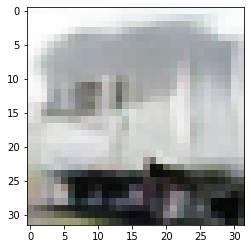

-> Epoch 366, Batch numero 1/78 -> Disc. loss on real images: 0.17357, Disc. loss on fake images: 0.29413, Generator loss: 3.46862
-> Epoch 366, Batch numero 2/78 -> Disc. loss on real images: 0.31712, Disc. loss on fake images: 0.36483, Generator loss: 3.18060
-> Epoch 366, Batch numero 3/78 -> Disc. loss on real images: 0.40229, Disc. loss on fake images: 0.23420, Generator loss: 3.47594
-> Epoch 366, Batch numero 4/78 -> Disc. loss on real images: 0.21668, Disc. loss on fake images: 0.37289, Generator loss: 2.67508
-> Epoch 366, Batch numero 5/78 -> Disc. loss on real images: 0.26661, Disc. loss on fake images: 0.23315, Generator loss: 3.34144
-> Epoch 366, Batch numero 6/78 -> Disc. loss on real images: 0.25823, Disc. loss on fake images: 0.42288, Generator loss: 3.53031
-> Epoch 366, Batch numero 7/78 -> Disc. loss on real images: 0.31639, Disc. loss on fake images: 0.22364, Generator loss: 3.40994
-> Epoch 366, Batch numero 8/78 -> Disc. loss on real images: 0.44084, Disc. loss o

-> Epoch 366, Batch numero 64/78 -> Disc. loss on real images: 0.23605, Disc. loss on fake images: 0.27661, Generator loss: 2.93805
-> Epoch 366, Batch numero 65/78 -> Disc. loss on real images: 0.44077, Disc. loss on fake images: 0.21733, Generator loss: 3.10140
-> Epoch 366, Batch numero 66/78 -> Disc. loss on real images: 0.29957, Disc. loss on fake images: 0.30870, Generator loss: 2.90694
-> Epoch 366, Batch numero 67/78 -> Disc. loss on real images: 0.19954, Disc. loss on fake images: 0.29188, Generator loss: 2.82338
-> Epoch 366, Batch numero 68/78 -> Disc. loss on real images: 0.33986, Disc. loss on fake images: 0.30558, Generator loss: 2.54488
-> Epoch 366, Batch numero 69/78 -> Disc. loss on real images: 0.15387, Disc. loss on fake images: 0.44689, Generator loss: 3.47036
-> Epoch 366, Batch numero 70/78 -> Disc. loss on real images: 0.14866, Disc. loss on fake images: 0.23531, Generator loss: 2.94598
-> Epoch 366, Batch numero 71/78 -> Disc. loss on real images: 0.37102, Disc

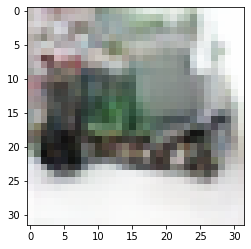

-> Epoch 367, Batch numero 1/78 -> Disc. loss on real images: 0.17376, Disc. loss on fake images: 0.20722, Generator loss: 3.29943
-> Epoch 367, Batch numero 2/78 -> Disc. loss on real images: 0.27153, Disc. loss on fake images: 0.21762, Generator loss: 3.20298
-> Epoch 367, Batch numero 3/78 -> Disc. loss on real images: 0.18177, Disc. loss on fake images: 0.25422, Generator loss: 3.02321
-> Epoch 367, Batch numero 4/78 -> Disc. loss on real images: 0.37022, Disc. loss on fake images: 0.22881, Generator loss: 3.01989
-> Epoch 367, Batch numero 5/78 -> Disc. loss on real images: 0.24545, Disc. loss on fake images: 0.21067, Generator loss: 2.95286
-> Epoch 367, Batch numero 6/78 -> Disc. loss on real images: 0.19630, Disc. loss on fake images: 0.20393, Generator loss: 2.96095
-> Epoch 367, Batch numero 7/78 -> Disc. loss on real images: 0.23984, Disc. loss on fake images: 0.14540, Generator loss: 2.98466
-> Epoch 367, Batch numero 8/78 -> Disc. loss on real images: 0.20281, Disc. loss o

-> Epoch 367, Batch numero 64/78 -> Disc. loss on real images: 0.44007, Disc. loss on fake images: 0.15493, Generator loss: 2.53959
-> Epoch 367, Batch numero 65/78 -> Disc. loss on real images: 0.12152, Disc. loss on fake images: 0.20658, Generator loss: 3.29425
-> Epoch 367, Batch numero 66/78 -> Disc. loss on real images: 0.38620, Disc. loss on fake images: 0.27066, Generator loss: 2.75122
-> Epoch 367, Batch numero 67/78 -> Disc. loss on real images: 0.28969, Disc. loss on fake images: 0.23526, Generator loss: 2.75349
-> Epoch 367, Batch numero 68/78 -> Disc. loss on real images: 0.42789, Disc. loss on fake images: 0.22938, Generator loss: 2.45786
-> Epoch 367, Batch numero 69/78 -> Disc. loss on real images: 0.10290, Disc. loss on fake images: 0.36591, Generator loss: 2.92171
-> Epoch 367, Batch numero 70/78 -> Disc. loss on real images: 0.20101, Disc. loss on fake images: 0.17386, Generator loss: 2.92930
-> Epoch 367, Batch numero 71/78 -> Disc. loss on real images: 0.38183, Disc

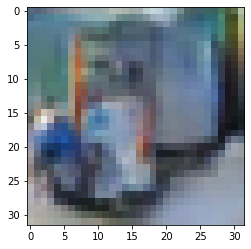

-> Epoch 368, Batch numero 1/78 -> Disc. loss on real images: 0.31557, Disc. loss on fake images: 0.45392, Generator loss: 3.17104
-> Epoch 368, Batch numero 2/78 -> Disc. loss on real images: 0.49223, Disc. loss on fake images: 0.28538, Generator loss: 2.89546
-> Epoch 368, Batch numero 3/78 -> Disc. loss on real images: 0.20922, Disc. loss on fake images: 0.22049, Generator loss: 2.77273
-> Epoch 368, Batch numero 4/78 -> Disc. loss on real images: 0.30772, Disc. loss on fake images: 0.46611, Generator loss: 2.90703
-> Epoch 368, Batch numero 5/78 -> Disc. loss on real images: 0.12955, Disc. loss on fake images: 0.19786, Generator loss: 3.07317
-> Epoch 368, Batch numero 6/78 -> Disc. loss on real images: 0.22043, Disc. loss on fake images: 0.14853, Generator loss: 2.72265
-> Epoch 368, Batch numero 7/78 -> Disc. loss on real images: 0.31769, Disc. loss on fake images: 0.34853, Generator loss: 3.00935
-> Epoch 368, Batch numero 8/78 -> Disc. loss on real images: 0.32263, Disc. loss o

-> Epoch 368, Batch numero 64/78 -> Disc. loss on real images: 0.19336, Disc. loss on fake images: 0.25106, Generator loss: 2.56235
-> Epoch 368, Batch numero 65/78 -> Disc. loss on real images: 0.36197, Disc. loss on fake images: 0.24484, Generator loss: 2.39474
-> Epoch 368, Batch numero 66/78 -> Disc. loss on real images: 0.22195, Disc. loss on fake images: 0.49532, Generator loss: 2.78007
-> Epoch 368, Batch numero 67/78 -> Disc. loss on real images: 0.19353, Disc. loss on fake images: 0.16853, Generator loss: 2.71191
-> Epoch 368, Batch numero 68/78 -> Disc. loss on real images: 0.07250, Disc. loss on fake images: 0.19493, Generator loss: 3.19735
-> Epoch 368, Batch numero 69/78 -> Disc. loss on real images: 0.25435, Disc. loss on fake images: 0.34120, Generator loss: 3.60789
-> Epoch 368, Batch numero 70/78 -> Disc. loss on real images: 0.32451, Disc. loss on fake images: 0.24730, Generator loss: 3.27718
-> Epoch 368, Batch numero 71/78 -> Disc. loss on real images: 0.37213, Disc

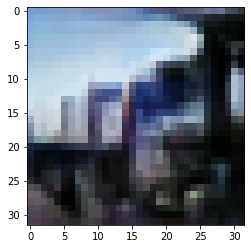

-> Epoch 369, Batch numero 1/78 -> Disc. loss on real images: 0.27540, Disc. loss on fake images: 0.10222, Generator loss: 3.18517
-> Epoch 369, Batch numero 2/78 -> Disc. loss on real images: 0.26646, Disc. loss on fake images: 0.41568, Generator loss: 3.33515
-> Epoch 369, Batch numero 3/78 -> Disc. loss on real images: 0.17672, Disc. loss on fake images: 0.18495, Generator loss: 2.87445
-> Epoch 369, Batch numero 4/78 -> Disc. loss on real images: 0.35038, Disc. loss on fake images: 0.12341, Generator loss: 2.76734
-> Epoch 369, Batch numero 5/78 -> Disc. loss on real images: 0.17148, Disc. loss on fake images: 0.20437, Generator loss: 2.35514
-> Epoch 369, Batch numero 6/78 -> Disc. loss on real images: 0.05757, Disc. loss on fake images: 0.39766, Generator loss: 3.06292
-> Epoch 369, Batch numero 7/78 -> Disc. loss on real images: 0.41114, Disc. loss on fake images: 0.21744, Generator loss: 3.01493
-> Epoch 369, Batch numero 8/78 -> Disc. loss on real images: 0.32343, Disc. loss o

-> Epoch 369, Batch numero 64/78 -> Disc. loss on real images: 0.15321, Disc. loss on fake images: 0.25258, Generator loss: 2.91418
-> Epoch 369, Batch numero 65/78 -> Disc. loss on real images: 0.17111, Disc. loss on fake images: 0.29452, Generator loss: 2.85146
-> Epoch 369, Batch numero 66/78 -> Disc. loss on real images: 0.25049, Disc. loss on fake images: 0.26818, Generator loss: 3.12584
-> Epoch 369, Batch numero 67/78 -> Disc. loss on real images: 0.29268, Disc. loss on fake images: 0.27005, Generator loss: 3.18521
-> Epoch 369, Batch numero 68/78 -> Disc. loss on real images: 0.27927, Disc. loss on fake images: 0.12542, Generator loss: 2.65210
-> Epoch 369, Batch numero 69/78 -> Disc. loss on real images: 0.23893, Disc. loss on fake images: 0.58692, Generator loss: 2.56293
-> Epoch 369, Batch numero 70/78 -> Disc. loss on real images: 0.08520, Disc. loss on fake images: 0.25573, Generator loss: 2.71053
-> Epoch 369, Batch numero 71/78 -> Disc. loss on real images: 0.25828, Disc

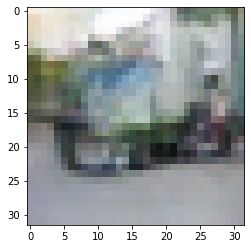

-> Epoch 370, Batch numero 1/78 -> Disc. loss on real images: 0.08937, Disc. loss on fake images: 0.42762, Generator loss: 3.00785
-> Epoch 370, Batch numero 2/78 -> Disc. loss on real images: 0.40058, Disc. loss on fake images: 0.25654, Generator loss: 3.08372
-> Epoch 370, Batch numero 3/78 -> Disc. loss on real images: 0.20990, Disc. loss on fake images: 0.32592, Generator loss: 3.38041
-> Epoch 370, Batch numero 4/78 -> Disc. loss on real images: 0.19253, Disc. loss on fake images: 0.21997, Generator loss: 3.13772
-> Epoch 370, Batch numero 5/78 -> Disc. loss on real images: 0.25153, Disc. loss on fake images: 0.12208, Generator loss: 2.94722
-> Epoch 370, Batch numero 6/78 -> Disc. loss on real images: 0.11612, Disc. loss on fake images: 0.32097, Generator loss: 2.71159
-> Epoch 370, Batch numero 7/78 -> Disc. loss on real images: 0.27592, Disc. loss on fake images: 0.40691, Generator loss: 2.70928
-> Epoch 370, Batch numero 8/78 -> Disc. loss on real images: 0.18102, Disc. loss o

-> Epoch 370, Batch numero 64/78 -> Disc. loss on real images: 0.15986, Disc. loss on fake images: 0.39193, Generator loss: 2.89204
-> Epoch 370, Batch numero 65/78 -> Disc. loss on real images: 0.11345, Disc. loss on fake images: 0.22931, Generator loss: 3.43140
-> Epoch 370, Batch numero 66/78 -> Disc. loss on real images: 0.24331, Disc. loss on fake images: 0.11093, Generator loss: 3.12493
-> Epoch 370, Batch numero 67/78 -> Disc. loss on real images: 0.22137, Disc. loss on fake images: 0.46203, Generator loss: 3.38464
-> Epoch 370, Batch numero 68/78 -> Disc. loss on real images: 0.14470, Disc. loss on fake images: 0.17996, Generator loss: 3.13495
-> Epoch 370, Batch numero 69/78 -> Disc. loss on real images: 0.43904, Disc. loss on fake images: 0.15496, Generator loss: 2.72816
-> Epoch 370, Batch numero 70/78 -> Disc. loss on real images: 0.19740, Disc. loss on fake images: 0.14190, Generator loss: 2.48311
-> Epoch 370, Batch numero 71/78 -> Disc. loss on real images: 0.18976, Disc

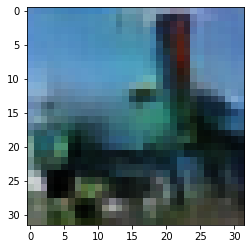

-> Epoch 371, Batch numero 1/78 -> Disc. loss on real images: 0.29741, Disc. loss on fake images: 0.26737, Generator loss: 2.97651
-> Epoch 371, Batch numero 2/78 -> Disc. loss on real images: 0.20837, Disc. loss on fake images: 0.15971, Generator loss: 2.85991
-> Epoch 371, Batch numero 3/78 -> Disc. loss on real images: 0.20103, Disc. loss on fake images: 0.22878, Generator loss: 3.00771
-> Epoch 371, Batch numero 4/78 -> Disc. loss on real images: 0.23984, Disc. loss on fake images: 0.37383, Generator loss: 3.40236
-> Epoch 371, Batch numero 5/78 -> Disc. loss on real images: 0.36353, Disc. loss on fake images: 0.28406, Generator loss: 3.34576
-> Epoch 371, Batch numero 6/78 -> Disc. loss on real images: 0.36306, Disc. loss on fake images: 0.23184, Generator loss: 2.96847
-> Epoch 371, Batch numero 7/78 -> Disc. loss on real images: 0.23300, Disc. loss on fake images: 0.20878, Generator loss: 2.38377
-> Epoch 371, Batch numero 8/78 -> Disc. loss on real images: 0.24431, Disc. loss o

-> Epoch 371, Batch numero 65/78 -> Disc. loss on real images: 0.20351, Disc. loss on fake images: 0.28018, Generator loss: 3.16794
-> Epoch 371, Batch numero 66/78 -> Disc. loss on real images: 0.58323, Disc. loss on fake images: 0.19561, Generator loss: 2.37489
-> Epoch 371, Batch numero 67/78 -> Disc. loss on real images: 0.22043, Disc. loss on fake images: 0.33775, Generator loss: 2.84385
-> Epoch 371, Batch numero 68/78 -> Disc. loss on real images: 0.15938, Disc. loss on fake images: 0.16071, Generator loss: 2.61980
-> Epoch 371, Batch numero 69/78 -> Disc. loss on real images: 0.24829, Disc. loss on fake images: 0.47528, Generator loss: 2.90579
-> Epoch 371, Batch numero 70/78 -> Disc. loss on real images: 0.13082, Disc. loss on fake images: 0.16048, Generator loss: 3.26964
-> Epoch 371, Batch numero 71/78 -> Disc. loss on real images: 0.18289, Disc. loss on fake images: 0.17186, Generator loss: 3.76554
-> Epoch 371, Batch numero 72/78 -> Disc. loss on real images: 0.28769, Disc

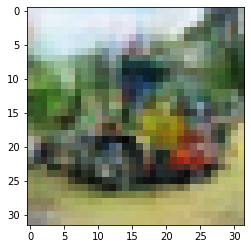

-> Epoch 372, Batch numero 1/78 -> Disc. loss on real images: 0.22821, Disc. loss on fake images: 0.46383, Generator loss: 2.97037
-> Epoch 372, Batch numero 2/78 -> Disc. loss on real images: 0.28952, Disc. loss on fake images: 0.37630, Generator loss: 3.33904
-> Epoch 372, Batch numero 3/78 -> Disc. loss on real images: 0.30619, Disc. loss on fake images: 0.38361, Generator loss: 3.16847
-> Epoch 372, Batch numero 4/78 -> Disc. loss on real images: 0.35561, Disc. loss on fake images: 0.11469, Generator loss: 3.22080
-> Epoch 372, Batch numero 5/78 -> Disc. loss on real images: 0.13542, Disc. loss on fake images: 0.41329, Generator loss: 3.54064
-> Epoch 372, Batch numero 6/78 -> Disc. loss on real images: 0.33552, Disc. loss on fake images: 0.17867, Generator loss: 3.04863
-> Epoch 372, Batch numero 7/78 -> Disc. loss on real images: 0.35657, Disc. loss on fake images: 0.74183, Generator loss: 2.95617
-> Epoch 372, Batch numero 8/78 -> Disc. loss on real images: 0.43979, Disc. loss o

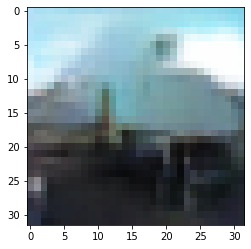

-> Epoch 373, Batch numero 1/78 -> Disc. loss on real images: 0.22646, Disc. loss on fake images: 0.35661, Generator loss: 3.25711
-> Epoch 373, Batch numero 2/78 -> Disc. loss on real images: 0.21131, Disc. loss on fake images: 0.35619, Generator loss: 3.41125
-> Epoch 373, Batch numero 3/78 -> Disc. loss on real images: 0.12841, Disc. loss on fake images: 0.23475, Generator loss: 3.17764
-> Epoch 373, Batch numero 4/78 -> Disc. loss on real images: 0.28930, Disc. loss on fake images: 0.09135, Generator loss: 3.16691
-> Epoch 373, Batch numero 5/78 -> Disc. loss on real images: 0.15661, Disc. loss on fake images: 0.13839, Generator loss: 3.23594
-> Epoch 373, Batch numero 6/78 -> Disc. loss on real images: 0.13387, Disc. loss on fake images: 0.29645, Generator loss: 3.21466
-> Epoch 373, Batch numero 7/78 -> Disc. loss on real images: 0.29477, Disc. loss on fake images: 0.32488, Generator loss: 3.29872
-> Epoch 373, Batch numero 8/78 -> Disc. loss on real images: 0.25042, Disc. loss o

-> Epoch 373, Batch numero 65/78 -> Disc. loss on real images: 0.27864, Disc. loss on fake images: 0.23394, Generator loss: 3.43912
-> Epoch 373, Batch numero 66/78 -> Disc. loss on real images: 0.16476, Disc. loss on fake images: 0.61186, Generator loss: 3.97202
-> Epoch 373, Batch numero 67/78 -> Disc. loss on real images: 0.42114, Disc. loss on fake images: 0.13947, Generator loss: 3.63167
-> Epoch 373, Batch numero 68/78 -> Disc. loss on real images: 0.45991, Disc. loss on fake images: 0.51651, Generator loss: 2.85406
-> Epoch 373, Batch numero 69/78 -> Disc. loss on real images: 0.12552, Disc. loss on fake images: 0.45105, Generator loss: 3.84386
-> Epoch 373, Batch numero 70/78 -> Disc. loss on real images: 0.24727, Disc. loss on fake images: 0.09252, Generator loss: 4.01448
-> Epoch 373, Batch numero 71/78 -> Disc. loss on real images: 0.36000, Disc. loss on fake images: 0.37559, Generator loss: 3.31068
-> Epoch 373, Batch numero 72/78 -> Disc. loss on real images: 0.25796, Disc

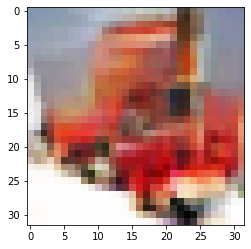

-> Epoch 374, Batch numero 1/78 -> Disc. loss on real images: 0.34518, Disc. loss on fake images: 0.24172, Generator loss: 3.72158
-> Epoch 374, Batch numero 2/78 -> Disc. loss on real images: 0.38856, Disc. loss on fake images: 0.21278, Generator loss: 3.43733
-> Epoch 374, Batch numero 3/78 -> Disc. loss on real images: 0.31855, Disc. loss on fake images: 0.12857, Generator loss: 2.78433
-> Epoch 374, Batch numero 4/78 -> Disc. loss on real images: 0.12439, Disc. loss on fake images: 0.46260, Generator loss: 3.06976
-> Epoch 374, Batch numero 5/78 -> Disc. loss on real images: 0.25414, Disc. loss on fake images: 0.41059, Generator loss: 3.45151
-> Epoch 374, Batch numero 6/78 -> Disc. loss on real images: 0.20519, Disc. loss on fake images: 0.14597, Generator loss: 3.43758
-> Epoch 374, Batch numero 7/78 -> Disc. loss on real images: 0.10706, Disc. loss on fake images: 0.14968, Generator loss: 3.39244
-> Epoch 374, Batch numero 8/78 -> Disc. loss on real images: 0.29799, Disc. loss o

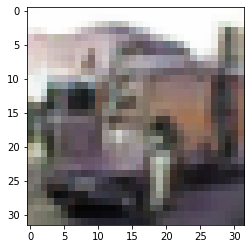

-> Epoch 375, Batch numero 1/78 -> Disc. loss on real images: 0.06385, Disc. loss on fake images: 0.21840, Generator loss: 2.81395
-> Epoch 375, Batch numero 2/78 -> Disc. loss on real images: 0.28049, Disc. loss on fake images: 0.22991, Generator loss: 3.86097
-> Epoch 375, Batch numero 3/78 -> Disc. loss on real images: 0.28063, Disc. loss on fake images: 0.08399, Generator loss: 3.13255
-> Epoch 375, Batch numero 4/78 -> Disc. loss on real images: 0.20797, Disc. loss on fake images: 0.20558, Generator loss: 3.28780
-> Epoch 375, Batch numero 5/78 -> Disc. loss on real images: 0.20960, Disc. loss on fake images: 0.15074, Generator loss: 2.81622
-> Epoch 375, Batch numero 6/78 -> Disc. loss on real images: 0.20036, Disc. loss on fake images: 0.22279, Generator loss: 3.21166
-> Epoch 375, Batch numero 7/78 -> Disc. loss on real images: 0.14233, Disc. loss on fake images: 0.15677, Generator loss: 3.26902
-> Epoch 375, Batch numero 8/78 -> Disc. loss on real images: 0.23693, Disc. loss o

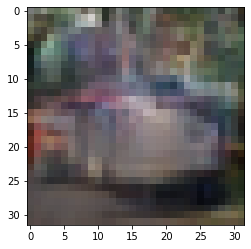

-> Epoch 376, Batch numero 1/78 -> Disc. loss on real images: 0.31961, Disc. loss on fake images: 0.19073, Generator loss: 3.16822
-> Epoch 376, Batch numero 2/78 -> Disc. loss on real images: 0.41753, Disc. loss on fake images: 0.36397, Generator loss: 3.07011
-> Epoch 376, Batch numero 3/78 -> Disc. loss on real images: 0.17646, Disc. loss on fake images: 0.35866, Generator loss: 3.73126
-> Epoch 376, Batch numero 4/78 -> Disc. loss on real images: 0.22669, Disc. loss on fake images: 0.40372, Generator loss: 3.96907
-> Epoch 376, Batch numero 5/78 -> Disc. loss on real images: 0.32319, Disc. loss on fake images: 0.12975, Generator loss: 3.52938
-> Epoch 376, Batch numero 6/78 -> Disc. loss on real images: 0.16784, Disc. loss on fake images: 0.34564, Generator loss: 3.62866
-> Epoch 376, Batch numero 7/78 -> Disc. loss on real images: 0.44956, Disc. loss on fake images: 0.21755, Generator loss: 3.35298
-> Epoch 376, Batch numero 8/78 -> Disc. loss on real images: 0.25270, Disc. loss o

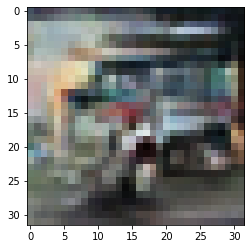

-> Epoch 377, Batch numero 1/78 -> Disc. loss on real images: 0.19721, Disc. loss on fake images: 0.34898, Generator loss: 2.83119
-> Epoch 377, Batch numero 2/78 -> Disc. loss on real images: 0.37511, Disc. loss on fake images: 0.13148, Generator loss: 2.28636
-> Epoch 377, Batch numero 3/78 -> Disc. loss on real images: 0.09991, Disc. loss on fake images: 0.19459, Generator loss: 2.56727
-> Epoch 377, Batch numero 4/78 -> Disc. loss on real images: 0.27312, Disc. loss on fake images: 0.40566, Generator loss: 2.86381
-> Epoch 377, Batch numero 5/78 -> Disc. loss on real images: 0.16186, Disc. loss on fake images: 0.27237, Generator loss: 3.63338
-> Epoch 377, Batch numero 6/78 -> Disc. loss on real images: 0.30087, Disc. loss on fake images: 0.26804, Generator loss: 3.26839
-> Epoch 377, Batch numero 7/78 -> Disc. loss on real images: 0.36871, Disc. loss on fake images: 0.24369, Generator loss: 3.64961
-> Epoch 377, Batch numero 8/78 -> Disc. loss on real images: 0.11838, Disc. loss o

-> Epoch 377, Batch numero 65/78 -> Disc. loss on real images: 0.32854, Disc. loss on fake images: 0.13996, Generator loss: 3.26091
-> Epoch 377, Batch numero 66/78 -> Disc. loss on real images: 0.17903, Disc. loss on fake images: 0.23062, Generator loss: 2.63837
-> Epoch 377, Batch numero 67/78 -> Disc. loss on real images: 0.19832, Disc. loss on fake images: 0.17833, Generator loss: 3.21221
-> Epoch 377, Batch numero 68/78 -> Disc. loss on real images: 0.17215, Disc. loss on fake images: 0.23389, Generator loss: 3.27550
-> Epoch 377, Batch numero 69/78 -> Disc. loss on real images: 0.28027, Disc. loss on fake images: 0.39162, Generator loss: 3.49323
-> Epoch 377, Batch numero 70/78 -> Disc. loss on real images: 0.16732, Disc. loss on fake images: 0.24424, Generator loss: 3.31067
-> Epoch 377, Batch numero 71/78 -> Disc. loss on real images: 0.40667, Disc. loss on fake images: 0.62795, Generator loss: 3.57311
-> Epoch 377, Batch numero 72/78 -> Disc. loss on real images: 0.27393, Disc

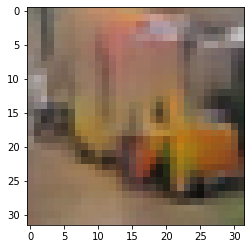

-> Epoch 378, Batch numero 1/78 -> Disc. loss on real images: 0.26613, Disc. loss on fake images: 0.20169, Generator loss: 3.02504
-> Epoch 378, Batch numero 2/78 -> Disc. loss on real images: 0.21929, Disc. loss on fake images: 0.35527, Generator loss: 2.99130
-> Epoch 378, Batch numero 3/78 -> Disc. loss on real images: 0.27929, Disc. loss on fake images: 0.34751, Generator loss: 3.42826
-> Epoch 378, Batch numero 4/78 -> Disc. loss on real images: 0.37883, Disc. loss on fake images: 0.14044, Generator loss: 2.59649
-> Epoch 378, Batch numero 5/78 -> Disc. loss on real images: 0.24217, Disc. loss on fake images: 0.29015, Generator loss: 2.96225
-> Epoch 378, Batch numero 6/78 -> Disc. loss on real images: 0.15163, Disc. loss on fake images: 0.17801, Generator loss: 3.46185
-> Epoch 378, Batch numero 7/78 -> Disc. loss on real images: 0.12632, Disc. loss on fake images: 0.29790, Generator loss: 3.40827
-> Epoch 378, Batch numero 8/78 -> Disc. loss on real images: 0.31888, Disc. loss o

-> Epoch 378, Batch numero 65/78 -> Disc. loss on real images: 0.28405, Disc. loss on fake images: 0.20764, Generator loss: 3.34940
-> Epoch 378, Batch numero 66/78 -> Disc. loss on real images: 0.34373, Disc. loss on fake images: 0.16718, Generator loss: 3.04574
-> Epoch 378, Batch numero 67/78 -> Disc. loss on real images: 0.19987, Disc. loss on fake images: 0.49564, Generator loss: 2.94425
-> Epoch 378, Batch numero 68/78 -> Disc. loss on real images: 0.13905, Disc. loss on fake images: 0.24817, Generator loss: 3.49859
-> Epoch 378, Batch numero 69/78 -> Disc. loss on real images: 0.19252, Disc. loss on fake images: 0.27156, Generator loss: 3.57961
-> Epoch 378, Batch numero 70/78 -> Disc. loss on real images: 0.29131, Disc. loss on fake images: 0.23395, Generator loss: 3.18657
-> Epoch 378, Batch numero 71/78 -> Disc. loss on real images: 0.32893, Disc. loss on fake images: 0.20457, Generator loss: 3.06207
-> Epoch 378, Batch numero 72/78 -> Disc. loss on real images: 0.26188, Disc

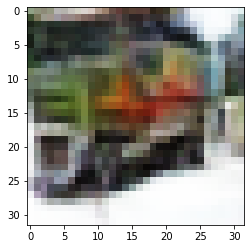

-> Epoch 379, Batch numero 1/78 -> Disc. loss on real images: 0.32669, Disc. loss on fake images: 0.25500, Generator loss: 3.01648
-> Epoch 379, Batch numero 2/78 -> Disc. loss on real images: 0.38584, Disc. loss on fake images: 0.30041, Generator loss: 3.22849
-> Epoch 379, Batch numero 3/78 -> Disc. loss on real images: 0.11208, Disc. loss on fake images: 0.33829, Generator loss: 3.45290
-> Epoch 379, Batch numero 4/78 -> Disc. loss on real images: 0.16746, Disc. loss on fake images: 0.30027, Generator loss: 3.85391
-> Epoch 379, Batch numero 5/78 -> Disc. loss on real images: 0.38903, Disc. loss on fake images: 0.27933, Generator loss: 3.22551
-> Epoch 379, Batch numero 6/78 -> Disc. loss on real images: 0.36229, Disc. loss on fake images: 0.14915, Generator loss: 3.26474
-> Epoch 379, Batch numero 7/78 -> Disc. loss on real images: 0.44515, Disc. loss on fake images: 0.35325, Generator loss: 2.93744
-> Epoch 379, Batch numero 8/78 -> Disc. loss on real images: 0.17104, Disc. loss o

-> Epoch 379, Batch numero 65/78 -> Disc. loss on real images: 0.24493, Disc. loss on fake images: 0.29212, Generator loss: 3.14992
-> Epoch 379, Batch numero 66/78 -> Disc. loss on real images: 0.21874, Disc. loss on fake images: 0.18308, Generator loss: 2.95386
-> Epoch 379, Batch numero 67/78 -> Disc. loss on real images: 0.24791, Disc. loss on fake images: 0.23368, Generator loss: 2.92461
-> Epoch 379, Batch numero 68/78 -> Disc. loss on real images: 0.25122, Disc. loss on fake images: 0.19829, Generator loss: 2.87825
-> Epoch 379, Batch numero 69/78 -> Disc. loss on real images: 0.17159, Disc. loss on fake images: 0.31476, Generator loss: 3.44902
-> Epoch 379, Batch numero 70/78 -> Disc. loss on real images: 0.21266, Disc. loss on fake images: 0.13338, Generator loss: 3.41873
-> Epoch 379, Batch numero 71/78 -> Disc. loss on real images: 0.40115, Disc. loss on fake images: 0.23401, Generator loss: 2.85764
-> Epoch 379, Batch numero 72/78 -> Disc. loss on real images: 0.23855, Disc

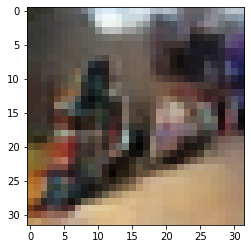

-> Epoch 380, Batch numero 1/78 -> Disc. loss on real images: 0.19747, Disc. loss on fake images: 0.22656, Generator loss: 3.55790
-> Epoch 380, Batch numero 2/78 -> Disc. loss on real images: 0.35724, Disc. loss on fake images: 0.30420, Generator loss: 3.01362
-> Epoch 380, Batch numero 3/78 -> Disc. loss on real images: 0.21701, Disc. loss on fake images: 0.30840, Generator loss: 3.61407
-> Epoch 380, Batch numero 4/78 -> Disc. loss on real images: 0.31675, Disc. loss on fake images: 0.21143, Generator loss: 3.80206
-> Epoch 380, Batch numero 5/78 -> Disc. loss on real images: 0.28214, Disc. loss on fake images: 0.26401, Generator loss: 3.62755
-> Epoch 380, Batch numero 6/78 -> Disc. loss on real images: 0.17832, Disc. loss on fake images: 0.22455, Generator loss: 3.44404
-> Epoch 380, Batch numero 7/78 -> Disc. loss on real images: 0.30325, Disc. loss on fake images: 0.35640, Generator loss: 3.40601
-> Epoch 380, Batch numero 8/78 -> Disc. loss on real images: 0.22194, Disc. loss o

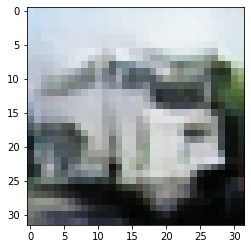

-> Epoch 381, Batch numero 1/78 -> Disc. loss on real images: 0.34700, Disc. loss on fake images: 0.16474, Generator loss: 3.22804
-> Epoch 381, Batch numero 2/78 -> Disc. loss on real images: 0.32489, Disc. loss on fake images: 0.25498, Generator loss: 3.12195
-> Epoch 381, Batch numero 3/78 -> Disc. loss on real images: 0.25826, Disc. loss on fake images: 0.60333, Generator loss: 3.72055
-> Epoch 381, Batch numero 4/78 -> Disc. loss on real images: 0.40302, Disc. loss on fake images: 0.19079, Generator loss: 2.72167
-> Epoch 381, Batch numero 5/78 -> Disc. loss on real images: 0.20136, Disc. loss on fake images: 0.16004, Generator loss: 3.14702
-> Epoch 381, Batch numero 6/78 -> Disc. loss on real images: 0.14131, Disc. loss on fake images: 0.25946, Generator loss: 3.55285
-> Epoch 381, Batch numero 7/78 -> Disc. loss on real images: 0.25335, Disc. loss on fake images: 0.26013, Generator loss: 2.90070
-> Epoch 381, Batch numero 8/78 -> Disc. loss on real images: 0.21607, Disc. loss o

-> Epoch 381, Batch numero 65/78 -> Disc. loss on real images: 0.26836, Disc. loss on fake images: 0.26311, Generator loss: 3.40321
-> Epoch 381, Batch numero 66/78 -> Disc. loss on real images: 0.25744, Disc. loss on fake images: 0.46165, Generator loss: 3.41566
-> Epoch 381, Batch numero 67/78 -> Disc. loss on real images: 0.53697, Disc. loss on fake images: 0.23069, Generator loss: 3.11004
-> Epoch 381, Batch numero 68/78 -> Disc. loss on real images: 0.21339, Disc. loss on fake images: 0.19750, Generator loss: 2.78909
-> Epoch 381, Batch numero 69/78 -> Disc. loss on real images: 0.17984, Disc. loss on fake images: 0.14442, Generator loss: 2.97110
-> Epoch 381, Batch numero 70/78 -> Disc. loss on real images: 0.10930, Disc. loss on fake images: 0.37556, Generator loss: 3.32685
-> Epoch 381, Batch numero 71/78 -> Disc. loss on real images: 0.33491, Disc. loss on fake images: 0.64165, Generator loss: 3.63856
-> Epoch 381, Batch numero 72/78 -> Disc. loss on real images: 0.40778, Disc

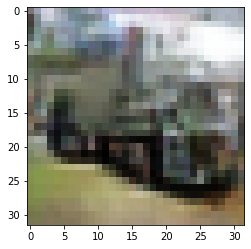

-> Epoch 382, Batch numero 1/78 -> Disc. loss on real images: 0.13699, Disc. loss on fake images: 0.18564, Generator loss: 3.26354
-> Epoch 382, Batch numero 2/78 -> Disc. loss on real images: 0.22644, Disc. loss on fake images: 0.24591, Generator loss: 3.23132
-> Epoch 382, Batch numero 3/78 -> Disc. loss on real images: 0.17295, Disc. loss on fake images: 0.29481, Generator loss: 3.98031
-> Epoch 382, Batch numero 4/78 -> Disc. loss on real images: 0.32605, Disc. loss on fake images: 0.22308, Generator loss: 3.05914
-> Epoch 382, Batch numero 5/78 -> Disc. loss on real images: 0.36354, Disc. loss on fake images: 0.17618, Generator loss: 2.99959
-> Epoch 382, Batch numero 6/78 -> Disc. loss on real images: 0.22528, Disc. loss on fake images: 0.34589, Generator loss: 3.20935
-> Epoch 382, Batch numero 7/78 -> Disc. loss on real images: 0.43243, Disc. loss on fake images: 0.17891, Generator loss: 2.70226
-> Epoch 382, Batch numero 8/78 -> Disc. loss on real images: 0.23635, Disc. loss o

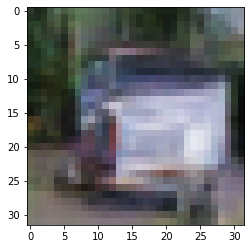

-> Epoch 383, Batch numero 1/78 -> Disc. loss on real images: 0.19557, Disc. loss on fake images: 0.47539, Generator loss: 3.07174
-> Epoch 383, Batch numero 2/78 -> Disc. loss on real images: 0.24957, Disc. loss on fake images: 0.29157, Generator loss: 3.14528
-> Epoch 383, Batch numero 3/78 -> Disc. loss on real images: 0.32114, Disc. loss on fake images: 0.48160, Generator loss: 3.46795
-> Epoch 383, Batch numero 4/78 -> Disc. loss on real images: 0.40636, Disc. loss on fake images: 0.20545, Generator loss: 2.92603
-> Epoch 383, Batch numero 5/78 -> Disc. loss on real images: 0.16516, Disc. loss on fake images: 0.18069, Generator loss: 3.16406
-> Epoch 383, Batch numero 6/78 -> Disc. loss on real images: 0.32087, Disc. loss on fake images: 0.38246, Generator loss: 3.44427
-> Epoch 383, Batch numero 7/78 -> Disc. loss on real images: 0.16052, Disc. loss on fake images: 0.34096, Generator loss: 3.22745
-> Epoch 383, Batch numero 8/78 -> Disc. loss on real images: 0.18079, Disc. loss o

-> Epoch 383, Batch numero 66/78 -> Disc. loss on real images: 0.11651, Disc. loss on fake images: 0.41543, Generator loss: 3.26092
-> Epoch 383, Batch numero 67/78 -> Disc. loss on real images: 0.25891, Disc. loss on fake images: 0.19403, Generator loss: 3.31112
-> Epoch 383, Batch numero 68/78 -> Disc. loss on real images: 0.21028, Disc. loss on fake images: 0.44448, Generator loss: 4.09830
-> Epoch 383, Batch numero 69/78 -> Disc. loss on real images: 0.22314, Disc. loss on fake images: 0.27840, Generator loss: 3.70600
-> Epoch 383, Batch numero 70/78 -> Disc. loss on real images: 0.23149, Disc. loss on fake images: 0.33045, Generator loss: 4.09738
-> Epoch 383, Batch numero 71/78 -> Disc. loss on real images: 0.32966, Disc. loss on fake images: 0.32416, Generator loss: 3.83917
-> Epoch 383, Batch numero 72/78 -> Disc. loss on real images: 0.33714, Disc. loss on fake images: 0.14222, Generator loss: 3.49347
-> Epoch 383, Batch numero 73/78 -> Disc. loss on real images: 0.25702, Disc

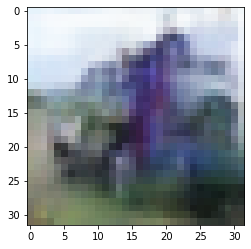

-> Epoch 384, Batch numero 1/78 -> Disc. loss on real images: 0.23708, Disc. loss on fake images: 0.25773, Generator loss: 3.23927
-> Epoch 384, Batch numero 2/78 -> Disc. loss on real images: 0.43537, Disc. loss on fake images: 0.18043, Generator loss: 3.07727
-> Epoch 384, Batch numero 3/78 -> Disc. loss on real images: 0.16943, Disc. loss on fake images: 0.34287, Generator loss: 3.07707
-> Epoch 384, Batch numero 4/78 -> Disc. loss on real images: 0.08909, Disc. loss on fake images: 0.18345, Generator loss: 3.83321
-> Epoch 384, Batch numero 5/78 -> Disc. loss on real images: 0.15880, Disc. loss on fake images: 0.20955, Generator loss: 3.39282
-> Epoch 384, Batch numero 6/78 -> Disc. loss on real images: 0.16760, Disc. loss on fake images: 0.14958, Generator loss: 2.85613
-> Epoch 384, Batch numero 7/78 -> Disc. loss on real images: 0.36706, Disc. loss on fake images: 0.37048, Generator loss: 3.14587
-> Epoch 384, Batch numero 8/78 -> Disc. loss on real images: 0.22192, Disc. loss o

-> Epoch 384, Batch numero 64/78 -> Disc. loss on real images: 0.36321, Disc. loss on fake images: 0.21563, Generator loss: 3.10561
-> Epoch 384, Batch numero 65/78 -> Disc. loss on real images: 0.11462, Disc. loss on fake images: 0.35139, Generator loss: 3.21978
-> Epoch 384, Batch numero 66/78 -> Disc. loss on real images: 0.34793, Disc. loss on fake images: 0.30349, Generator loss: 3.33244
-> Epoch 384, Batch numero 67/78 -> Disc. loss on real images: 0.31243, Disc. loss on fake images: 0.47526, Generator loss: 3.53543
-> Epoch 384, Batch numero 68/78 -> Disc. loss on real images: 0.20900, Disc. loss on fake images: 0.09780, Generator loss: 3.14681
-> Epoch 384, Batch numero 69/78 -> Disc. loss on real images: 0.26608, Disc. loss on fake images: 0.13387, Generator loss: 3.39658
-> Epoch 384, Batch numero 70/78 -> Disc. loss on real images: 0.16047, Disc. loss on fake images: 0.26579, Generator loss: 3.60197
-> Epoch 384, Batch numero 71/78 -> Disc. loss on real images: 0.27509, Disc

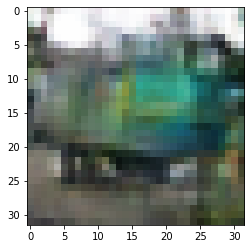

-> Epoch 385, Batch numero 1/78 -> Disc. loss on real images: 0.16405, Disc. loss on fake images: 0.28626, Generator loss: 3.44862
-> Epoch 385, Batch numero 2/78 -> Disc. loss on real images: 0.18301, Disc. loss on fake images: 0.21321, Generator loss: 3.63992
-> Epoch 385, Batch numero 3/78 -> Disc. loss on real images: 0.36831, Disc. loss on fake images: 0.45653, Generator loss: 3.53693
-> Epoch 385, Batch numero 4/78 -> Disc. loss on real images: 0.35377, Disc. loss on fake images: 0.12768, Generator loss: 3.24614
-> Epoch 385, Batch numero 5/78 -> Disc. loss on real images: 0.13989, Disc. loss on fake images: 0.18449, Generator loss: 2.87467
-> Epoch 385, Batch numero 6/78 -> Disc. loss on real images: 0.22551, Disc. loss on fake images: 0.35312, Generator loss: 3.19416
-> Epoch 385, Batch numero 7/78 -> Disc. loss on real images: 0.22507, Disc. loss on fake images: 0.27586, Generator loss: 3.14125
-> Epoch 385, Batch numero 8/78 -> Disc. loss on real images: 0.22959, Disc. loss o

-> Epoch 385, Batch numero 64/78 -> Disc. loss on real images: 0.42059, Disc. loss on fake images: 0.19300, Generator loss: 2.88964
-> Epoch 385, Batch numero 65/78 -> Disc. loss on real images: 0.18610, Disc. loss on fake images: 0.46389, Generator loss: 3.40248
-> Epoch 385, Batch numero 66/78 -> Disc. loss on real images: 0.35007, Disc. loss on fake images: 0.29716, Generator loss: 3.24280
-> Epoch 385, Batch numero 67/78 -> Disc. loss on real images: 0.23359, Disc. loss on fake images: 0.19141, Generator loss: 3.45882
-> Epoch 385, Batch numero 68/78 -> Disc. loss on real images: 0.24514, Disc. loss on fake images: 0.20239, Generator loss: 2.88827
-> Epoch 385, Batch numero 69/78 -> Disc. loss on real images: 0.18298, Disc. loss on fake images: 0.41741, Generator loss: 3.04051
-> Epoch 385, Batch numero 70/78 -> Disc. loss on real images: 0.24334, Disc. loss on fake images: 0.19070, Generator loss: 3.22296
-> Epoch 385, Batch numero 71/78 -> Disc. loss on real images: 0.16088, Disc

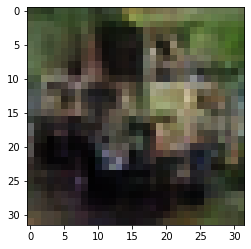

-> Epoch 386, Batch numero 1/78 -> Disc. loss on real images: 0.30414, Disc. loss on fake images: 0.13173, Generator loss: 3.09980
-> Epoch 386, Batch numero 2/78 -> Disc. loss on real images: 0.13996, Disc. loss on fake images: 0.26109, Generator loss: 3.05005
-> Epoch 386, Batch numero 3/78 -> Disc. loss on real images: 0.17067, Disc. loss on fake images: 0.30791, Generator loss: 3.05115
-> Epoch 386, Batch numero 4/78 -> Disc. loss on real images: 0.11081, Disc. loss on fake images: 0.14993, Generator loss: 3.25613
-> Epoch 386, Batch numero 5/78 -> Disc. loss on real images: 0.28053, Disc. loss on fake images: 0.21820, Generator loss: 3.15471
-> Epoch 386, Batch numero 6/78 -> Disc. loss on real images: 0.18128, Disc. loss on fake images: 0.46263, Generator loss: 3.60733
-> Epoch 386, Batch numero 7/78 -> Disc. loss on real images: 0.32909, Disc. loss on fake images: 0.26697, Generator loss: 3.62529
-> Epoch 386, Batch numero 8/78 -> Disc. loss on real images: 0.33624, Disc. loss o

-> Epoch 386, Batch numero 64/78 -> Disc. loss on real images: 0.14592, Disc. loss on fake images: 0.13834, Generator loss: 3.72465
-> Epoch 386, Batch numero 65/78 -> Disc. loss on real images: 0.21551, Disc. loss on fake images: 0.13346, Generator loss: 3.08599
-> Epoch 386, Batch numero 66/78 -> Disc. loss on real images: 0.22974, Disc. loss on fake images: 0.23948, Generator loss: 2.71913
-> Epoch 386, Batch numero 67/78 -> Disc. loss on real images: 0.23542, Disc. loss on fake images: 0.48781, Generator loss: 2.82943
-> Epoch 386, Batch numero 68/78 -> Disc. loss on real images: 0.18429, Disc. loss on fake images: 0.27583, Generator loss: 3.58090
-> Epoch 386, Batch numero 69/78 -> Disc. loss on real images: 0.27301, Disc. loss on fake images: 0.23309, Generator loss: 3.38208
-> Epoch 386, Batch numero 70/78 -> Disc. loss on real images: 0.22582, Disc. loss on fake images: 0.24379, Generator loss: 2.66545
-> Epoch 386, Batch numero 71/78 -> Disc. loss on real images: 0.09005, Disc

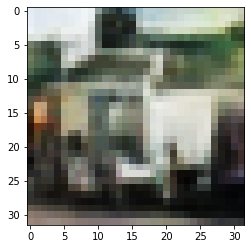

-> Epoch 387, Batch numero 1/78 -> Disc. loss on real images: 0.34221, Disc. loss on fake images: 0.16230, Generator loss: 2.92900
-> Epoch 387, Batch numero 2/78 -> Disc. loss on real images: 0.14728, Disc. loss on fake images: 0.19415, Generator loss: 3.05679
-> Epoch 387, Batch numero 3/78 -> Disc. loss on real images: 0.09852, Disc. loss on fake images: 0.30562, Generator loss: 3.49784
-> Epoch 387, Batch numero 4/78 -> Disc. loss on real images: 0.20915, Disc. loss on fake images: 0.20712, Generator loss: 3.60111
-> Epoch 387, Batch numero 5/78 -> Disc. loss on real images: 0.28285, Disc. loss on fake images: 0.11108, Generator loss: 3.24666
-> Epoch 387, Batch numero 6/78 -> Disc. loss on real images: 0.28929, Disc. loss on fake images: 0.16747, Generator loss: 2.69984
-> Epoch 387, Batch numero 7/78 -> Disc. loss on real images: 0.20218, Disc. loss on fake images: 0.13403, Generator loss: 2.66162
-> Epoch 387, Batch numero 8/78 -> Disc. loss on real images: 0.24354, Disc. loss o

-> Epoch 387, Batch numero 64/78 -> Disc. loss on real images: 0.15462, Disc. loss on fake images: 0.21015, Generator loss: 3.25368
-> Epoch 387, Batch numero 65/78 -> Disc. loss on real images: 0.35043, Disc. loss on fake images: 0.37813, Generator loss: 3.14421
-> Epoch 387, Batch numero 66/78 -> Disc. loss on real images: 0.23755, Disc. loss on fake images: 0.34303, Generator loss: 3.50592
-> Epoch 387, Batch numero 67/78 -> Disc. loss on real images: 0.12253, Disc. loss on fake images: 0.18466, Generator loss: 3.59689
-> Epoch 387, Batch numero 68/78 -> Disc. loss on real images: 0.26534, Disc. loss on fake images: 0.15913, Generator loss: 3.06820
-> Epoch 387, Batch numero 69/78 -> Disc. loss on real images: 0.22278, Disc. loss on fake images: 0.26781, Generator loss: 3.03628
-> Epoch 387, Batch numero 70/78 -> Disc. loss on real images: 0.12428, Disc. loss on fake images: 0.20612, Generator loss: 3.28445
-> Epoch 387, Batch numero 71/78 -> Disc. loss on real images: 0.17105, Disc

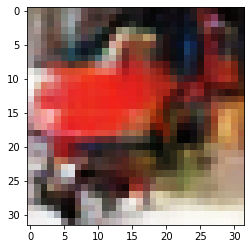

-> Epoch 388, Batch numero 1/78 -> Disc. loss on real images: 0.19224, Disc. loss on fake images: 0.30992, Generator loss: 3.11458
-> Epoch 388, Batch numero 2/78 -> Disc. loss on real images: 0.20488, Disc. loss on fake images: 0.11196, Generator loss: 3.08144
-> Epoch 388, Batch numero 3/78 -> Disc. loss on real images: 0.25306, Disc. loss on fake images: 0.23750, Generator loss: 3.29309
-> Epoch 388, Batch numero 4/78 -> Disc. loss on real images: 0.21054, Disc. loss on fake images: 0.44348, Generator loss: 3.38674
-> Epoch 388, Batch numero 5/78 -> Disc. loss on real images: 0.18979, Disc. loss on fake images: 0.31766, Generator loss: 4.04178
-> Epoch 388, Batch numero 6/78 -> Disc. loss on real images: 0.29613, Disc. loss on fake images: 0.17514, Generator loss: 3.60983
-> Epoch 388, Batch numero 7/78 -> Disc. loss on real images: 0.39069, Disc. loss on fake images: 0.34645, Generator loss: 3.43164
-> Epoch 388, Batch numero 8/78 -> Disc. loss on real images: 0.18816, Disc. loss o

-> Epoch 388, Batch numero 64/78 -> Disc. loss on real images: 0.19164, Disc. loss on fake images: 0.16483, Generator loss: 3.15285
-> Epoch 388, Batch numero 65/78 -> Disc. loss on real images: 0.26455, Disc. loss on fake images: 0.15112, Generator loss: 3.19005
-> Epoch 388, Batch numero 66/78 -> Disc. loss on real images: 0.10792, Disc. loss on fake images: 0.32295, Generator loss: 3.25243
-> Epoch 388, Batch numero 67/78 -> Disc. loss on real images: 0.47388, Disc. loss on fake images: 0.16980, Generator loss: 2.49214
-> Epoch 388, Batch numero 68/78 -> Disc. loss on real images: 0.10235, Disc. loss on fake images: 0.20339, Generator loss: 2.83385
-> Epoch 388, Batch numero 69/78 -> Disc. loss on real images: 0.17406, Disc. loss on fake images: 0.46717, Generator loss: 3.77585
-> Epoch 388, Batch numero 70/78 -> Disc. loss on real images: 0.29851, Disc. loss on fake images: 0.24217, Generator loss: 3.56098
-> Epoch 388, Batch numero 71/78 -> Disc. loss on real images: 0.21564, Disc

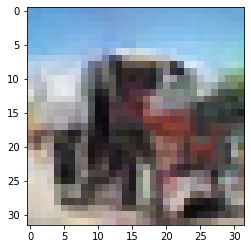

-> Epoch 389, Batch numero 1/78 -> Disc. loss on real images: 0.11474, Disc. loss on fake images: 0.16403, Generator loss: 3.12498
-> Epoch 389, Batch numero 2/78 -> Disc. loss on real images: 0.27438, Disc. loss on fake images: 0.30276, Generator loss: 3.28190
-> Epoch 389, Batch numero 3/78 -> Disc. loss on real images: 0.18418, Disc. loss on fake images: 0.16477, Generator loss: 3.02637
-> Epoch 389, Batch numero 4/78 -> Disc. loss on real images: 0.13376, Disc. loss on fake images: 0.19239, Generator loss: 3.12775
-> Epoch 389, Batch numero 5/78 -> Disc. loss on real images: 0.28128, Disc. loss on fake images: 0.47185, Generator loss: 3.20573
-> Epoch 389, Batch numero 6/78 -> Disc. loss on real images: 0.35537, Disc. loss on fake images: 0.20121, Generator loss: 3.94267
-> Epoch 389, Batch numero 7/78 -> Disc. loss on real images: 0.35666, Disc. loss on fake images: 0.38327, Generator loss: 3.07169
-> Epoch 389, Batch numero 8/78 -> Disc. loss on real images: 0.24773, Disc. loss o

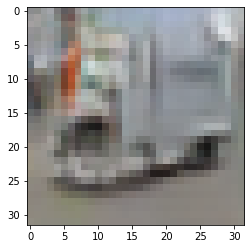

-> Epoch 390, Batch numero 1/78 -> Disc. loss on real images: 0.29150, Disc. loss on fake images: 0.13434, Generator loss: 2.76207
-> Epoch 390, Batch numero 2/78 -> Disc. loss on real images: 0.17469, Disc. loss on fake images: 0.21395, Generator loss: 2.89044
-> Epoch 390, Batch numero 3/78 -> Disc. loss on real images: 0.20266, Disc. loss on fake images: 0.30018, Generator loss: 3.25171
-> Epoch 390, Batch numero 4/78 -> Disc. loss on real images: 0.12850, Disc. loss on fake images: 0.21459, Generator loss: 3.18447
-> Epoch 390, Batch numero 5/78 -> Disc. loss on real images: 0.34208, Disc. loss on fake images: 0.27127, Generator loss: 3.78770
-> Epoch 390, Batch numero 6/78 -> Disc. loss on real images: 0.20808, Disc. loss on fake images: 0.08956, Generator loss: 3.28803
-> Epoch 390, Batch numero 7/78 -> Disc. loss on real images: 0.28082, Disc. loss on fake images: 0.21933, Generator loss: 3.56198
-> Epoch 390, Batch numero 8/78 -> Disc. loss on real images: 0.16065, Disc. loss o

-> Epoch 390, Batch numero 65/78 -> Disc. loss on real images: 0.31391, Disc. loss on fake images: 0.09933, Generator loss: 2.95877
-> Epoch 390, Batch numero 66/78 -> Disc. loss on real images: 0.16388, Disc. loss on fake images: 0.23216, Generator loss: 2.93761
-> Epoch 390, Batch numero 67/78 -> Disc. loss on real images: 0.22777, Disc. loss on fake images: 0.19648, Generator loss: 2.88819
-> Epoch 390, Batch numero 68/78 -> Disc. loss on real images: 0.13264, Disc. loss on fake images: 0.50918, Generator loss: 3.44525
-> Epoch 390, Batch numero 69/78 -> Disc. loss on real images: 0.26225, Disc. loss on fake images: 0.05710, Generator loss: 3.32469
-> Epoch 390, Batch numero 70/78 -> Disc. loss on real images: 0.22558, Disc. loss on fake images: 0.20376, Generator loss: 3.12554
-> Epoch 390, Batch numero 71/78 -> Disc. loss on real images: 0.19419, Disc. loss on fake images: 0.30339, Generator loss: 3.09052
-> Epoch 390, Batch numero 72/78 -> Disc. loss on real images: 0.21925, Disc

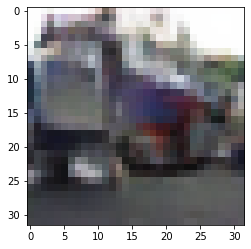

-> Epoch 391, Batch numero 1/78 -> Disc. loss on real images: 0.17295, Disc. loss on fake images: 0.21604, Generator loss: 2.92572
-> Epoch 391, Batch numero 2/78 -> Disc. loss on real images: 0.24752, Disc. loss on fake images: 0.22910, Generator loss: 3.58727
-> Epoch 391, Batch numero 3/78 -> Disc. loss on real images: 0.25376, Disc. loss on fake images: 0.19815, Generator loss: 3.87326
-> Epoch 391, Batch numero 4/78 -> Disc. loss on real images: 0.57007, Disc. loss on fake images: 0.21390, Generator loss: 2.96802
-> Epoch 391, Batch numero 5/78 -> Disc. loss on real images: 0.18596, Disc. loss on fake images: 0.25964, Generator loss: 2.66404
-> Epoch 391, Batch numero 6/78 -> Disc. loss on real images: 0.15525, Disc. loss on fake images: 0.21237, Generator loss: 2.75928
-> Epoch 391, Batch numero 7/78 -> Disc. loss on real images: 0.10737, Disc. loss on fake images: 0.32122, Generator loss: 4.11828
-> Epoch 391, Batch numero 8/78 -> Disc. loss on real images: 0.23364, Disc. loss o

-> Epoch 391, Batch numero 64/78 -> Disc. loss on real images: 0.26089, Disc. loss on fake images: 0.34903, Generator loss: 3.43728
-> Epoch 391, Batch numero 65/78 -> Disc. loss on real images: 0.18301, Disc. loss on fake images: 0.21897, Generator loss: 3.45337
-> Epoch 391, Batch numero 66/78 -> Disc. loss on real images: 0.19870, Disc. loss on fake images: 0.22314, Generator loss: 3.18494
-> Epoch 391, Batch numero 67/78 -> Disc. loss on real images: 0.17147, Disc. loss on fake images: 0.28378, Generator loss: 3.15009
-> Epoch 391, Batch numero 68/78 -> Disc. loss on real images: 0.21192, Disc. loss on fake images: 0.16897, Generator loss: 3.61225
-> Epoch 391, Batch numero 69/78 -> Disc. loss on real images: 0.23886, Disc. loss on fake images: 0.06119, Generator loss: 3.16512
-> Epoch 391, Batch numero 70/78 -> Disc. loss on real images: 0.12466, Disc. loss on fake images: 0.16546, Generator loss: 3.05426
-> Epoch 391, Batch numero 71/78 -> Disc. loss on real images: 0.16570, Disc

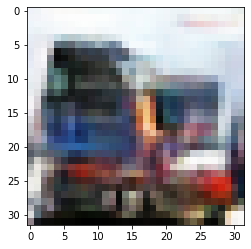

-> Epoch 392, Batch numero 1/78 -> Disc. loss on real images: 0.27339, Disc. loss on fake images: 0.32592, Generator loss: 3.62327
-> Epoch 392, Batch numero 2/78 -> Disc. loss on real images: 0.29570, Disc. loss on fake images: 0.30860, Generator loss: 3.35030
-> Epoch 392, Batch numero 3/78 -> Disc. loss on real images: 0.16535, Disc. loss on fake images: 0.22540, Generator loss: 3.51892
-> Epoch 392, Batch numero 4/78 -> Disc. loss on real images: 0.31764, Disc. loss on fake images: 0.47328, Generator loss: 3.37113
-> Epoch 392, Batch numero 5/78 -> Disc. loss on real images: 0.23041, Disc. loss on fake images: 0.23193, Generator loss: 3.63368
-> Epoch 392, Batch numero 6/78 -> Disc. loss on real images: 0.24618, Disc. loss on fake images: 0.19831, Generator loss: 3.63485
-> Epoch 392, Batch numero 7/78 -> Disc. loss on real images: 0.14858, Disc. loss on fake images: 0.30567, Generator loss: 3.32874
-> Epoch 392, Batch numero 8/78 -> Disc. loss on real images: 0.26845, Disc. loss o

-> Epoch 392, Batch numero 65/78 -> Disc. loss on real images: 0.14887, Disc. loss on fake images: 0.23092, Generator loss: 3.39861
-> Epoch 392, Batch numero 66/78 -> Disc. loss on real images: 0.32268, Disc. loss on fake images: 0.29087, Generator loss: 3.42286
-> Epoch 392, Batch numero 67/78 -> Disc. loss on real images: 0.32581, Disc. loss on fake images: 0.17859, Generator loss: 2.60702
-> Epoch 392, Batch numero 68/78 -> Disc. loss on real images: 0.16330, Disc. loss on fake images: 0.30653, Generator loss: 2.99270
-> Epoch 392, Batch numero 69/78 -> Disc. loss on real images: 0.15369, Disc. loss on fake images: 0.23405, Generator loss: 3.28646
-> Epoch 392, Batch numero 70/78 -> Disc. loss on real images: 0.23719, Disc. loss on fake images: 0.15006, Generator loss: 3.50620
-> Epoch 392, Batch numero 71/78 -> Disc. loss on real images: 0.21976, Disc. loss on fake images: 0.19709, Generator loss: 2.72052
-> Epoch 392, Batch numero 72/78 -> Disc. loss on real images: 0.16862, Disc

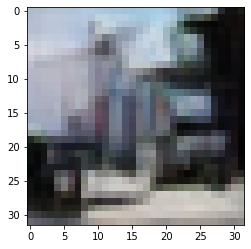

-> Epoch 393, Batch numero 1/78 -> Disc. loss on real images: 0.18903, Disc. loss on fake images: 0.17592, Generator loss: 3.39998
-> Epoch 393, Batch numero 2/78 -> Disc. loss on real images: 0.51837, Disc. loss on fake images: 0.29940, Generator loss: 3.35294
-> Epoch 393, Batch numero 3/78 -> Disc. loss on real images: 0.25843, Disc. loss on fake images: 0.29304, Generator loss: 3.34701
-> Epoch 393, Batch numero 4/78 -> Disc. loss on real images: 0.19560, Disc. loss on fake images: 0.34776, Generator loss: 3.14298
-> Epoch 393, Batch numero 5/78 -> Disc. loss on real images: 0.23694, Disc. loss on fake images: 0.21598, Generator loss: 3.21161
-> Epoch 393, Batch numero 6/78 -> Disc. loss on real images: 0.18561, Disc. loss on fake images: 0.16295, Generator loss: 3.40807
-> Epoch 393, Batch numero 7/78 -> Disc. loss on real images: 0.21077, Disc. loss on fake images: 0.26390, Generator loss: 3.67929
-> Epoch 393, Batch numero 8/78 -> Disc. loss on real images: 0.44100, Disc. loss o

-> Epoch 393, Batch numero 64/78 -> Disc. loss on real images: 0.32007, Disc. loss on fake images: 0.13026, Generator loss: 3.41472
-> Epoch 393, Batch numero 65/78 -> Disc. loss on real images: 0.42169, Disc. loss on fake images: 0.40875, Generator loss: 2.50776
-> Epoch 393, Batch numero 66/78 -> Disc. loss on real images: 0.35154, Disc. loss on fake images: 0.92554, Generator loss: 3.23477
-> Epoch 393, Batch numero 67/78 -> Disc. loss on real images: 0.12537, Disc. loss on fake images: 0.30274, Generator loss: 3.28595
-> Epoch 393, Batch numero 68/78 -> Disc. loss on real images: 0.28411, Disc. loss on fake images: 0.06817, Generator loss: 3.59674
-> Epoch 393, Batch numero 69/78 -> Disc. loss on real images: 0.18690, Disc. loss on fake images: 0.34644, Generator loss: 4.72037
-> Epoch 393, Batch numero 70/78 -> Disc. loss on real images: 0.58518, Disc. loss on fake images: 0.21244, Generator loss: 3.51894
-> Epoch 393, Batch numero 71/78 -> Disc. loss on real images: 0.54176, Disc

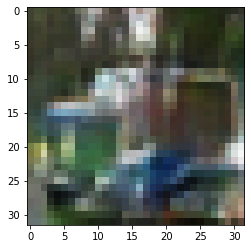

-> Epoch 394, Batch numero 1/78 -> Disc. loss on real images: 0.16883, Disc. loss on fake images: 0.26484, Generator loss: 3.36237
-> Epoch 394, Batch numero 2/78 -> Disc. loss on real images: 0.15738, Disc. loss on fake images: 0.18266, Generator loss: 3.34683
-> Epoch 394, Batch numero 3/78 -> Disc. loss on real images: 0.15428, Disc. loss on fake images: 0.18842, Generator loss: 3.40359
-> Epoch 394, Batch numero 4/78 -> Disc. loss on real images: 0.19283, Disc. loss on fake images: 0.15924, Generator loss: 2.87201
-> Epoch 394, Batch numero 5/78 -> Disc. loss on real images: 0.26083, Disc. loss on fake images: 0.31955, Generator loss: 3.07236
-> Epoch 394, Batch numero 6/78 -> Disc. loss on real images: 0.20675, Disc. loss on fake images: 0.19204, Generator loss: 3.00628
-> Epoch 394, Batch numero 7/78 -> Disc. loss on real images: 0.21566, Disc. loss on fake images: 0.10336, Generator loss: 3.45669
-> Epoch 394, Batch numero 8/78 -> Disc. loss on real images: 0.15735, Disc. loss o

-> Epoch 394, Batch numero 64/78 -> Disc. loss on real images: 0.17416, Disc. loss on fake images: 0.22395, Generator loss: 2.69366
-> Epoch 394, Batch numero 65/78 -> Disc. loss on real images: 0.22311, Disc. loss on fake images: 0.25545, Generator loss: 3.55834
-> Epoch 394, Batch numero 66/78 -> Disc. loss on real images: 0.17083, Disc. loss on fake images: 0.31294, Generator loss: 3.57825
-> Epoch 394, Batch numero 67/78 -> Disc. loss on real images: 0.20108, Disc. loss on fake images: 0.11641, Generator loss: 3.01132
-> Epoch 394, Batch numero 68/78 -> Disc. loss on real images: 0.21538, Disc. loss on fake images: 0.15315, Generator loss: 3.07821
-> Epoch 394, Batch numero 69/78 -> Disc. loss on real images: 0.24695, Disc. loss on fake images: 0.23610, Generator loss: 3.04785
-> Epoch 394, Batch numero 70/78 -> Disc. loss on real images: 0.14565, Disc. loss on fake images: 0.29519, Generator loss: 3.05836
-> Epoch 394, Batch numero 71/78 -> Disc. loss on real images: 0.17769, Disc

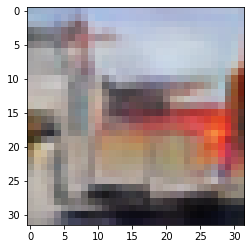

-> Epoch 395, Batch numero 1/78 -> Disc. loss on real images: 0.31448, Disc. loss on fake images: 0.29319, Generator loss: 2.87368
-> Epoch 395, Batch numero 2/78 -> Disc. loss on real images: 0.20325, Disc. loss on fake images: 0.42972, Generator loss: 3.28122
-> Epoch 395, Batch numero 3/78 -> Disc. loss on real images: 0.20902, Disc. loss on fake images: 0.34007, Generator loss: 3.71658
-> Epoch 395, Batch numero 4/78 -> Disc. loss on real images: 0.22906, Disc. loss on fake images: 0.13771, Generator loss: 3.35410
-> Epoch 395, Batch numero 5/78 -> Disc. loss on real images: 0.17048, Disc. loss on fake images: 0.12320, Generator loss: 3.33654
-> Epoch 395, Batch numero 6/78 -> Disc. loss on real images: 0.16145, Disc. loss on fake images: 0.25710, Generator loss: 3.34340
-> Epoch 395, Batch numero 7/78 -> Disc. loss on real images: 0.06826, Disc. loss on fake images: 0.32687, Generator loss: 3.12758
-> Epoch 395, Batch numero 8/78 -> Disc. loss on real images: 0.44119, Disc. loss o

-> Epoch 395, Batch numero 64/78 -> Disc. loss on real images: 0.21563, Disc. loss on fake images: 0.10056, Generator loss: 3.75593
-> Epoch 395, Batch numero 65/78 -> Disc. loss on real images: 0.25172, Disc. loss on fake images: 0.31561, Generator loss: 3.34846
-> Epoch 395, Batch numero 66/78 -> Disc. loss on real images: 0.26365, Disc. loss on fake images: 0.29359, Generator loss: 3.49196
-> Epoch 395, Batch numero 67/78 -> Disc. loss on real images: 0.29092, Disc. loss on fake images: 0.23070, Generator loss: 3.52440
-> Epoch 395, Batch numero 68/78 -> Disc. loss on real images: 0.23994, Disc. loss on fake images: 0.16551, Generator loss: 3.64649
-> Epoch 395, Batch numero 69/78 -> Disc. loss on real images: 0.20104, Disc. loss on fake images: 0.28178, Generator loss: 3.18941
-> Epoch 395, Batch numero 70/78 -> Disc. loss on real images: 0.22540, Disc. loss on fake images: 0.47293, Generator loss: 3.50505
-> Epoch 395, Batch numero 71/78 -> Disc. loss on real images: 0.15499, Disc

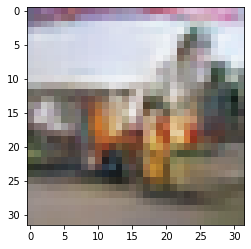

-> Epoch 396, Batch numero 1/78 -> Disc. loss on real images: 0.25850, Disc. loss on fake images: 0.30328, Generator loss: 3.49848
-> Epoch 396, Batch numero 2/78 -> Disc. loss on real images: 0.17195, Disc. loss on fake images: 0.18111, Generator loss: 4.11038
-> Epoch 396, Batch numero 3/78 -> Disc. loss on real images: 0.19225, Disc. loss on fake images: 0.13470, Generator loss: 3.26759
-> Epoch 396, Batch numero 4/78 -> Disc. loss on real images: 0.31614, Disc. loss on fake images: 0.25412, Generator loss: 3.36839
-> Epoch 396, Batch numero 5/78 -> Disc. loss on real images: 0.14236, Disc. loss on fake images: 0.33907, Generator loss: 2.95752
-> Epoch 396, Batch numero 6/78 -> Disc. loss on real images: 0.26294, Disc. loss on fake images: 0.24632, Generator loss: 3.27777
-> Epoch 396, Batch numero 7/78 -> Disc. loss on real images: 0.13663, Disc. loss on fake images: 0.21759, Generator loss: 3.28410
-> Epoch 396, Batch numero 8/78 -> Disc. loss on real images: 0.21864, Disc. loss o

-> Epoch 396, Batch numero 64/78 -> Disc. loss on real images: 0.40153, Disc. loss on fake images: 0.20279, Generator loss: 3.14038
-> Epoch 396, Batch numero 65/78 -> Disc. loss on real images: 0.29777, Disc. loss on fake images: 0.19488, Generator loss: 3.03071
-> Epoch 396, Batch numero 66/78 -> Disc. loss on real images: 0.26593, Disc. loss on fake images: 0.36431, Generator loss: 3.58401
-> Epoch 396, Batch numero 67/78 -> Disc. loss on real images: 0.11488, Disc. loss on fake images: 0.16031, Generator loss: 3.39757
-> Epoch 396, Batch numero 68/78 -> Disc. loss on real images: 0.55986, Disc. loss on fake images: 0.31198, Generator loss: 2.37553
-> Epoch 396, Batch numero 69/78 -> Disc. loss on real images: 0.13599, Disc. loss on fake images: 0.54680, Generator loss: 3.11589
-> Epoch 396, Batch numero 70/78 -> Disc. loss on real images: 0.15846, Disc. loss on fake images: 0.35609, Generator loss: 4.14372
-> Epoch 396, Batch numero 71/78 -> Disc. loss on real images: 0.41052, Disc

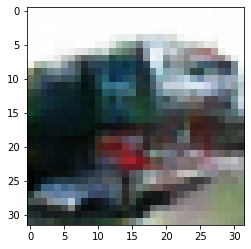

-> Epoch 397, Batch numero 1/78 -> Disc. loss on real images: 0.33510, Disc. loss on fake images: 0.16054, Generator loss: 3.21467
-> Epoch 397, Batch numero 2/78 -> Disc. loss on real images: 0.24284, Disc. loss on fake images: 0.28757, Generator loss: 2.91257
-> Epoch 397, Batch numero 3/78 -> Disc. loss on real images: 0.29566, Disc. loss on fake images: 0.24308, Generator loss: 3.03825
-> Epoch 397, Batch numero 4/78 -> Disc. loss on real images: 0.16511, Disc. loss on fake images: 0.31126, Generator loss: 3.43555
-> Epoch 397, Batch numero 5/78 -> Disc. loss on real images: 0.17537, Disc. loss on fake images: 0.31930, Generator loss: 3.82649
-> Epoch 397, Batch numero 6/78 -> Disc. loss on real images: 0.26383, Disc. loss on fake images: 0.09182, Generator loss: 2.81923
-> Epoch 397, Batch numero 7/78 -> Disc. loss on real images: 0.30528, Disc. loss on fake images: 0.24474, Generator loss: 3.19592
-> Epoch 397, Batch numero 8/78 -> Disc. loss on real images: 0.16902, Disc. loss o

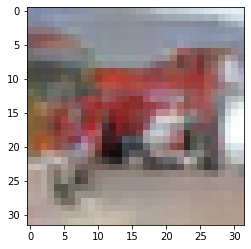

-> Epoch 398, Batch numero 1/78 -> Disc. loss on real images: 0.32886, Disc. loss on fake images: 0.12760, Generator loss: 4.07776
-> Epoch 398, Batch numero 2/78 -> Disc. loss on real images: 0.28327, Disc. loss on fake images: 0.18459, Generator loss: 2.98135
-> Epoch 398, Batch numero 3/78 -> Disc. loss on real images: 0.14485, Disc. loss on fake images: 0.21855, Generator loss: 4.19069
-> Epoch 398, Batch numero 4/78 -> Disc. loss on real images: 0.31839, Disc. loss on fake images: 0.15591, Generator loss: 3.93938
-> Epoch 398, Batch numero 5/78 -> Disc. loss on real images: 0.14795, Disc. loss on fake images: 0.23503, Generator loss: 4.15822
-> Epoch 398, Batch numero 6/78 -> Disc. loss on real images: 0.23037, Disc. loss on fake images: 0.17518, Generator loss: 3.52879
-> Epoch 398, Batch numero 7/78 -> Disc. loss on real images: 0.24226, Disc. loss on fake images: 0.21671, Generator loss: 3.43674
-> Epoch 398, Batch numero 8/78 -> Disc. loss on real images: 0.20806, Disc. loss o

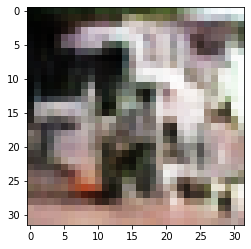

-> Epoch 399, Batch numero 1/78 -> Disc. loss on real images: 0.25353, Disc. loss on fake images: 0.13604, Generator loss: 3.79616
-> Epoch 399, Batch numero 2/78 -> Disc. loss on real images: 0.21286, Disc. loss on fake images: 0.20410, Generator loss: 3.28953
-> Epoch 399, Batch numero 3/78 -> Disc. loss on real images: 0.09665, Disc. loss on fake images: 0.12558, Generator loss: 3.23687
-> Epoch 399, Batch numero 4/78 -> Disc. loss on real images: 0.16049, Disc. loss on fake images: 0.16608, Generator loss: 3.86160
-> Epoch 399, Batch numero 5/78 -> Disc. loss on real images: 0.11963, Disc. loss on fake images: 0.14031, Generator loss: 3.43193
-> Epoch 399, Batch numero 6/78 -> Disc. loss on real images: 0.20168, Disc. loss on fake images: 0.22911, Generator loss: 3.77180
-> Epoch 399, Batch numero 7/78 -> Disc. loss on real images: 0.10168, Disc. loss on fake images: 0.12673, Generator loss: 3.99726
-> Epoch 399, Batch numero 8/78 -> Disc. loss on real images: 0.40002, Disc. loss o

-> Epoch 399, Batch numero 64/78 -> Disc. loss on real images: 0.33712, Disc. loss on fake images: 0.17171, Generator loss: 2.99871
-> Epoch 399, Batch numero 65/78 -> Disc. loss on real images: 0.21894, Disc. loss on fake images: 0.15959, Generator loss: 3.05128
-> Epoch 399, Batch numero 66/78 -> Disc. loss on real images: 0.16131, Disc. loss on fake images: 0.24639, Generator loss: 3.12236
-> Epoch 399, Batch numero 67/78 -> Disc. loss on real images: 0.17539, Disc. loss on fake images: 0.15536, Generator loss: 2.99139
-> Epoch 399, Batch numero 68/78 -> Disc. loss on real images: 0.16584, Disc. loss on fake images: 0.42884, Generator loss: 3.38515
-> Epoch 399, Batch numero 69/78 -> Disc. loss on real images: 0.30594, Disc. loss on fake images: 0.22419, Generator loss: 3.41331
-> Epoch 399, Batch numero 70/78 -> Disc. loss on real images: 0.25686, Disc. loss on fake images: 0.43476, Generator loss: 3.08625
-> Epoch 399, Batch numero 71/78 -> Disc. loss on real images: 0.42714, Disc

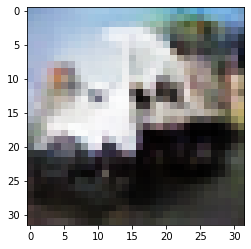

-> Epoch 400, Batch numero 1/78 -> Disc. loss on real images: 0.46235, Disc. loss on fake images: 0.19231, Generator loss: 3.28795
-> Epoch 400, Batch numero 2/78 -> Disc. loss on real images: 0.23251, Disc. loss on fake images: 0.31829, Generator loss: 3.95075
-> Epoch 400, Batch numero 3/78 -> Disc. loss on real images: 0.15046, Disc. loss on fake images: 0.29650, Generator loss: 3.71870
-> Epoch 400, Batch numero 4/78 -> Disc. loss on real images: 0.20710, Disc. loss on fake images: 0.14257, Generator loss: 3.35193
-> Epoch 400, Batch numero 5/78 -> Disc. loss on real images: 0.16915, Disc. loss on fake images: 0.27839, Generator loss: 3.39322
-> Epoch 400, Batch numero 6/78 -> Disc. loss on real images: 0.10205, Disc. loss on fake images: 0.16978, Generator loss: 3.38299
-> Epoch 400, Batch numero 7/78 -> Disc. loss on real images: 0.27411, Disc. loss on fake images: 0.24582, Generator loss: 3.23966
-> Epoch 400, Batch numero 8/78 -> Disc. loss on real images: 0.16307, Disc. loss o

-> Epoch 400, Batch numero 64/78 -> Disc. loss on real images: 0.24094, Disc. loss on fake images: 0.21423, Generator loss: 3.17253
-> Epoch 400, Batch numero 65/78 -> Disc. loss on real images: 0.31020, Disc. loss on fake images: 0.18407, Generator loss: 3.11575
-> Epoch 400, Batch numero 66/78 -> Disc. loss on real images: 0.38994, Disc. loss on fake images: 0.32131, Generator loss: 3.04871
-> Epoch 400, Batch numero 67/78 -> Disc. loss on real images: 0.06654, Disc. loss on fake images: 0.22436, Generator loss: 3.66024
-> Epoch 400, Batch numero 68/78 -> Disc. loss on real images: 0.50693, Disc. loss on fake images: 0.35451, Generator loss: 3.15295
-> Epoch 400, Batch numero 69/78 -> Disc. loss on real images: 0.43052, Disc. loss on fake images: 0.21950, Generator loss: 3.52177
-> Epoch 400, Batch numero 70/78 -> Disc. loss on real images: 0.15110, Disc. loss on fake images: 0.22365, Generator loss: 3.38439
-> Epoch 400, Batch numero 71/78 -> Disc. loss on real images: 0.17930, Disc

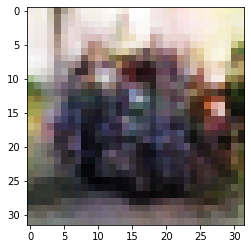

-> Epoch 401, Batch numero 1/78 -> Disc. loss on real images: 0.24195, Disc. loss on fake images: 0.42099, Generator loss: 3.47972
-> Epoch 401, Batch numero 2/78 -> Disc. loss on real images: 0.20409, Disc. loss on fake images: 0.13289, Generator loss: 3.34374
-> Epoch 401, Batch numero 3/78 -> Disc. loss on real images: 0.40163, Disc. loss on fake images: 0.32194, Generator loss: 2.94197
-> Epoch 401, Batch numero 4/78 -> Disc. loss on real images: 0.24880, Disc. loss on fake images: 0.17332, Generator loss: 2.58159
-> Epoch 401, Batch numero 5/78 -> Disc. loss on real images: 0.09926, Disc. loss on fake images: 0.38280, Generator loss: 3.78044
-> Epoch 401, Batch numero 6/78 -> Disc. loss on real images: 0.16921, Disc. loss on fake images: 0.31377, Generator loss: 3.76299
-> Epoch 401, Batch numero 7/78 -> Disc. loss on real images: 0.24310, Disc. loss on fake images: 0.15284, Generator loss: 4.01497
-> Epoch 401, Batch numero 8/78 -> Disc. loss on real images: 0.23918, Disc. loss o

-> Epoch 401, Batch numero 64/78 -> Disc. loss on real images: 0.24224, Disc. loss on fake images: 0.13590, Generator loss: 3.43697
-> Epoch 401, Batch numero 65/78 -> Disc. loss on real images: 0.14191, Disc. loss on fake images: 0.44697, Generator loss: 3.59997
-> Epoch 401, Batch numero 66/78 -> Disc. loss on real images: 0.23227, Disc. loss on fake images: 0.12196, Generator loss: 3.23281
-> Epoch 401, Batch numero 67/78 -> Disc. loss on real images: 0.11324, Disc. loss on fake images: 0.33770, Generator loss: 3.58296
-> Epoch 401, Batch numero 68/78 -> Disc. loss on real images: 0.06229, Disc. loss on fake images: 0.51232, Generator loss: 4.48710
-> Epoch 401, Batch numero 69/78 -> Disc. loss on real images: 0.56220, Disc. loss on fake images: 0.28275, Generator loss: 3.58898
-> Epoch 401, Batch numero 70/78 -> Disc. loss on real images: 0.46334, Disc. loss on fake images: 0.17004, Generator loss: 3.82703
-> Epoch 401, Batch numero 71/78 -> Disc. loss on real images: 0.21625, Disc

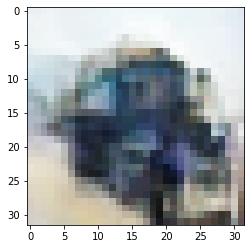

-> Epoch 402, Batch numero 1/78 -> Disc. loss on real images: 0.33456, Disc. loss on fake images: 0.20699, Generator loss: 3.62219
-> Epoch 402, Batch numero 2/78 -> Disc. loss on real images: 0.15643, Disc. loss on fake images: 0.31270, Generator loss: 3.43389
-> Epoch 402, Batch numero 3/78 -> Disc. loss on real images: 0.33990, Disc. loss on fake images: 0.27093, Generator loss: 3.50375
-> Epoch 402, Batch numero 4/78 -> Disc. loss on real images: 0.21463, Disc. loss on fake images: 0.48997, Generator loss: 3.51519
-> Epoch 402, Batch numero 5/78 -> Disc. loss on real images: 0.27926, Disc. loss on fake images: 0.21213, Generator loss: 3.54193
-> Epoch 402, Batch numero 6/78 -> Disc. loss on real images: 0.21004, Disc. loss on fake images: 0.12909, Generator loss: 3.58743
-> Epoch 402, Batch numero 7/78 -> Disc. loss on real images: 0.38769, Disc. loss on fake images: 0.35574, Generator loss: 3.32826
-> Epoch 402, Batch numero 8/78 -> Disc. loss on real images: 0.09315, Disc. loss o

-> Epoch 402, Batch numero 64/78 -> Disc. loss on real images: 0.17549, Disc. loss on fake images: 0.21873, Generator loss: 3.10871
-> Epoch 402, Batch numero 65/78 -> Disc. loss on real images: 0.17532, Disc. loss on fake images: 0.27492, Generator loss: 3.17825
-> Epoch 402, Batch numero 66/78 -> Disc. loss on real images: 0.19657, Disc. loss on fake images: 0.23038, Generator loss: 3.29287
-> Epoch 402, Batch numero 67/78 -> Disc. loss on real images: 0.54335, Disc. loss on fake images: 0.10916, Generator loss: 3.10310
-> Epoch 402, Batch numero 68/78 -> Disc. loss on real images: 0.15652, Disc. loss on fake images: 0.31993, Generator loss: 2.99489
-> Epoch 402, Batch numero 69/78 -> Disc. loss on real images: 0.10618, Disc. loss on fake images: 0.22441, Generator loss: 3.37007
-> Epoch 402, Batch numero 70/78 -> Disc. loss on real images: 0.12650, Disc. loss on fake images: 0.19070, Generator loss: 3.32431
-> Epoch 402, Batch numero 71/78 -> Disc. loss on real images: 0.33338, Disc

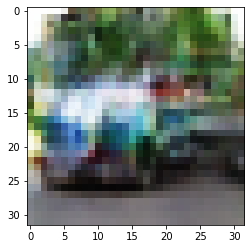

-> Epoch 403, Batch numero 1/78 -> Disc. loss on real images: 0.27399, Disc. loss on fake images: 0.44896, Generator loss: 3.36034
-> Epoch 403, Batch numero 2/78 -> Disc. loss on real images: 0.21415, Disc. loss on fake images: 0.29342, Generator loss: 3.99097
-> Epoch 403, Batch numero 3/78 -> Disc. loss on real images: 0.26766, Disc. loss on fake images: 0.20536, Generator loss: 3.22474
-> Epoch 403, Batch numero 4/78 -> Disc. loss on real images: 0.27333, Disc. loss on fake images: 0.31969, Generator loss: 3.73177
-> Epoch 403, Batch numero 5/78 -> Disc. loss on real images: 0.24877, Disc. loss on fake images: 0.19282, Generator loss: 3.10613
-> Epoch 403, Batch numero 6/78 -> Disc. loss on real images: 0.26632, Disc. loss on fake images: 0.12228, Generator loss: 2.73426
-> Epoch 403, Batch numero 7/78 -> Disc. loss on real images: 0.36319, Disc. loss on fake images: 0.57156, Generator loss: 3.51660
-> Epoch 403, Batch numero 8/78 -> Disc. loss on real images: 0.17137, Disc. loss o

-> Epoch 403, Batch numero 64/78 -> Disc. loss on real images: 0.17132, Disc. loss on fake images: 0.41293, Generator loss: 3.88692
-> Epoch 403, Batch numero 65/78 -> Disc. loss on real images: 0.14509, Disc. loss on fake images: 0.06840, Generator loss: 4.02130
-> Epoch 403, Batch numero 66/78 -> Disc. loss on real images: 0.33962, Disc. loss on fake images: 0.15312, Generator loss: 3.24417
-> Epoch 403, Batch numero 67/78 -> Disc. loss on real images: 0.11741, Disc. loss on fake images: 0.29743, Generator loss: 3.38998
-> Epoch 403, Batch numero 68/78 -> Disc. loss on real images: 0.16068, Disc. loss on fake images: 0.46310, Generator loss: 3.29730
-> Epoch 403, Batch numero 69/78 -> Disc. loss on real images: 0.41183, Disc. loss on fake images: 0.21716, Generator loss: 3.52870
-> Epoch 403, Batch numero 70/78 -> Disc. loss on real images: 0.16309, Disc. loss on fake images: 0.14235, Generator loss: 3.32320
-> Epoch 403, Batch numero 71/78 -> Disc. loss on real images: 0.32155, Disc

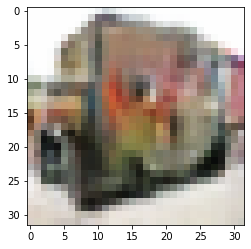

-> Epoch 404, Batch numero 1/78 -> Disc. loss on real images: 0.20316, Disc. loss on fake images: 0.29420, Generator loss: 3.37992
-> Epoch 404, Batch numero 2/78 -> Disc. loss on real images: 0.31803, Disc. loss on fake images: 0.39610, Generator loss: 3.33505
-> Epoch 404, Batch numero 3/78 -> Disc. loss on real images: 0.19245, Disc. loss on fake images: 0.32866, Generator loss: 3.86731
-> Epoch 404, Batch numero 4/78 -> Disc. loss on real images: 0.40604, Disc. loss on fake images: 0.22310, Generator loss: 3.26240
-> Epoch 404, Batch numero 5/78 -> Disc. loss on real images: 0.21406, Disc. loss on fake images: 0.10204, Generator loss: 3.00397
-> Epoch 404, Batch numero 6/78 -> Disc. loss on real images: 0.17717, Disc. loss on fake images: 0.51695, Generator loss: 2.91148
-> Epoch 404, Batch numero 7/78 -> Disc. loss on real images: 0.26755, Disc. loss on fake images: 0.21520, Generator loss: 3.49812
-> Epoch 404, Batch numero 8/78 -> Disc. loss on real images: 0.29646, Disc. loss o

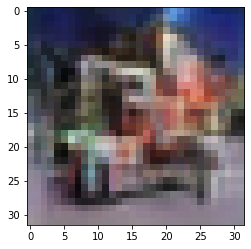

-> Epoch 405, Batch numero 1/78 -> Disc. loss on real images: 0.25429, Disc. loss on fake images: 0.18135, Generator loss: 3.31447
-> Epoch 405, Batch numero 2/78 -> Disc. loss on real images: 0.29227, Disc. loss on fake images: 0.08982, Generator loss: 3.43211
-> Epoch 405, Batch numero 3/78 -> Disc. loss on real images: 0.17430, Disc. loss on fake images: 0.35177, Generator loss: 3.50548
-> Epoch 405, Batch numero 4/78 -> Disc. loss on real images: 0.30308, Disc. loss on fake images: 0.29836, Generator loss: 3.25119
-> Epoch 405, Batch numero 5/78 -> Disc. loss on real images: 0.35382, Disc. loss on fake images: 0.16817, Generator loss: 3.72276
-> Epoch 405, Batch numero 6/78 -> Disc. loss on real images: 0.19855, Disc. loss on fake images: 0.22190, Generator loss: 2.73315
-> Epoch 405, Batch numero 7/78 -> Disc. loss on real images: 0.08376, Disc. loss on fake images: 0.24712, Generator loss: 3.38195
-> Epoch 405, Batch numero 8/78 -> Disc. loss on real images: 0.21188, Disc. loss o

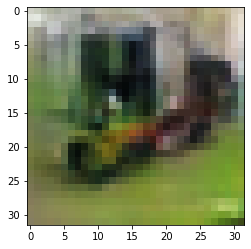

-> Epoch 406, Batch numero 1/78 -> Disc. loss on real images: 0.29355, Disc. loss on fake images: 0.16725, Generator loss: 3.04370
-> Epoch 406, Batch numero 2/78 -> Disc. loss on real images: 0.20307, Disc. loss on fake images: 0.26039, Generator loss: 3.18284
-> Epoch 406, Batch numero 3/78 -> Disc. loss on real images: 0.09123, Disc. loss on fake images: 0.29604, Generator loss: 3.13814
-> Epoch 406, Batch numero 4/78 -> Disc. loss on real images: 0.22111, Disc. loss on fake images: 0.17006, Generator loss: 3.50309
-> Epoch 406, Batch numero 5/78 -> Disc. loss on real images: 0.27151, Disc. loss on fake images: 0.19601, Generator loss: 3.52304
-> Epoch 406, Batch numero 6/78 -> Disc. loss on real images: 0.34249, Disc. loss on fake images: 0.31695, Generator loss: 3.35444
-> Epoch 406, Batch numero 7/78 -> Disc. loss on real images: 0.14924, Disc. loss on fake images: 0.12737, Generator loss: 3.06170
-> Epoch 406, Batch numero 8/78 -> Disc. loss on real images: 0.13237, Disc. loss o

-> Epoch 406, Batch numero 64/78 -> Disc. loss on real images: 0.20672, Disc. loss on fake images: 0.26041, Generator loss: 3.90626
-> Epoch 406, Batch numero 65/78 -> Disc. loss on real images: 0.53613, Disc. loss on fake images: 0.27687, Generator loss: 3.21559
-> Epoch 406, Batch numero 66/78 -> Disc. loss on real images: 0.11805, Disc. loss on fake images: 0.32529, Generator loss: 3.10985
-> Epoch 406, Batch numero 67/78 -> Disc. loss on real images: 0.24967, Disc. loss on fake images: 0.25868, Generator loss: 3.29919
-> Epoch 406, Batch numero 68/78 -> Disc. loss on real images: 0.28480, Disc. loss on fake images: 0.32314, Generator loss: 3.07711
-> Epoch 406, Batch numero 69/78 -> Disc. loss on real images: 0.14706, Disc. loss on fake images: 0.15774, Generator loss: 2.96811
-> Epoch 406, Batch numero 70/78 -> Disc. loss on real images: 0.12967, Disc. loss on fake images: 0.12071, Generator loss: 3.36999
-> Epoch 406, Batch numero 71/78 -> Disc. loss on real images: 0.29219, Disc

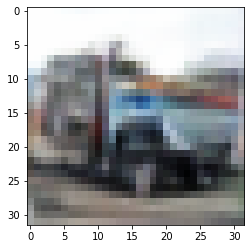

-> Epoch 407, Batch numero 1/78 -> Disc. loss on real images: 0.23473, Disc. loss on fake images: 0.19874, Generator loss: 2.71901
-> Epoch 407, Batch numero 2/78 -> Disc. loss on real images: 0.20854, Disc. loss on fake images: 0.28976, Generator loss: 3.02251
-> Epoch 407, Batch numero 3/78 -> Disc. loss on real images: 0.10042, Disc. loss on fake images: 0.66006, Generator loss: 4.10735
-> Epoch 407, Batch numero 4/78 -> Disc. loss on real images: 0.27182, Disc. loss on fake images: 0.26284, Generator loss: 4.27302
-> Epoch 407, Batch numero 5/78 -> Disc. loss on real images: 0.34763, Disc. loss on fake images: 0.13939, Generator loss: 4.17983
-> Epoch 407, Batch numero 6/78 -> Disc. loss on real images: 0.20662, Disc. loss on fake images: 0.23548, Generator loss: 3.62822
-> Epoch 407, Batch numero 7/78 -> Disc. loss on real images: 0.29474, Disc. loss on fake images: 0.15234, Generator loss: 2.90312
-> Epoch 407, Batch numero 8/78 -> Disc. loss on real images: 0.07597, Disc. loss o

-> Epoch 407, Batch numero 65/78 -> Disc. loss on real images: 0.14329, Disc. loss on fake images: 0.18944, Generator loss: 3.59315
-> Epoch 407, Batch numero 66/78 -> Disc. loss on real images: 0.21843, Disc. loss on fake images: 0.22123, Generator loss: 3.60536
-> Epoch 407, Batch numero 67/78 -> Disc. loss on real images: 0.17042, Disc. loss on fake images: 0.38577, Generator loss: 3.52367
-> Epoch 407, Batch numero 68/78 -> Disc. loss on real images: 0.14448, Disc. loss on fake images: 0.19170, Generator loss: 3.58659
-> Epoch 407, Batch numero 69/78 -> Disc. loss on real images: 0.32510, Disc. loss on fake images: 0.20798, Generator loss: 3.37342
-> Epoch 407, Batch numero 70/78 -> Disc. loss on real images: 0.19514, Disc. loss on fake images: 0.31265, Generator loss: 3.49720
-> Epoch 407, Batch numero 71/78 -> Disc. loss on real images: 0.15685, Disc. loss on fake images: 0.26113, Generator loss: 3.45844
-> Epoch 407, Batch numero 72/78 -> Disc. loss on real images: 0.34806, Disc

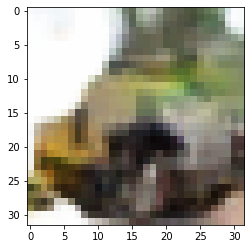

-> Epoch 408, Batch numero 1/78 -> Disc. loss on real images: 0.14843, Disc. loss on fake images: 0.09872, Generator loss: 3.68004
-> Epoch 408, Batch numero 2/78 -> Disc. loss on real images: 0.20123, Disc. loss on fake images: 0.09858, Generator loss: 3.17847
-> Epoch 408, Batch numero 3/78 -> Disc. loss on real images: 0.15182, Disc. loss on fake images: 0.21717, Generator loss: 3.31985
-> Epoch 408, Batch numero 4/78 -> Disc. loss on real images: 0.15565, Disc. loss on fake images: 0.14778, Generator loss: 3.46177
-> Epoch 408, Batch numero 5/78 -> Disc. loss on real images: 0.30760, Disc. loss on fake images: 0.11802, Generator loss: 3.18918
-> Epoch 408, Batch numero 6/78 -> Disc. loss on real images: 0.27156, Disc. loss on fake images: 0.18221, Generator loss: 2.90102
-> Epoch 408, Batch numero 7/78 -> Disc. loss on real images: 0.09038, Disc. loss on fake images: 0.48275, Generator loss: 3.27296
-> Epoch 408, Batch numero 8/78 -> Disc. loss on real images: 0.38329, Disc. loss o

-> Epoch 408, Batch numero 65/78 -> Disc. loss on real images: 0.15378, Disc. loss on fake images: 0.22284, Generator loss: 3.24669
-> Epoch 408, Batch numero 66/78 -> Disc. loss on real images: 0.21758, Disc. loss on fake images: 0.33284, Generator loss: 3.13173
-> Epoch 408, Batch numero 67/78 -> Disc. loss on real images: 0.28139, Disc. loss on fake images: 0.28934, Generator loss: 3.72731
-> Epoch 408, Batch numero 68/78 -> Disc. loss on real images: 0.10859, Disc. loss on fake images: 0.08696, Generator loss: 3.68254
-> Epoch 408, Batch numero 69/78 -> Disc. loss on real images: 0.31773, Disc. loss on fake images: 0.25001, Generator loss: 3.59311
-> Epoch 408, Batch numero 70/78 -> Disc. loss on real images: 0.16742, Disc. loss on fake images: 0.17802, Generator loss: 3.32674
-> Epoch 408, Batch numero 71/78 -> Disc. loss on real images: 0.15109, Disc. loss on fake images: 0.21578, Generator loss: 3.11552
-> Epoch 408, Batch numero 72/78 -> Disc. loss on real images: 0.22153, Disc

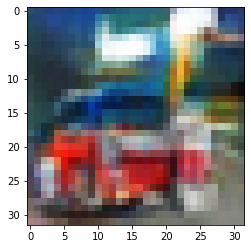

-> Epoch 409, Batch numero 1/78 -> Disc. loss on real images: 0.32716, Disc. loss on fake images: 0.44895, Generator loss: 3.65249
-> Epoch 409, Batch numero 2/78 -> Disc. loss on real images: 0.29240, Disc. loss on fake images: 0.23887, Generator loss: 3.42677
-> Epoch 409, Batch numero 3/78 -> Disc. loss on real images: 0.29885, Disc. loss on fake images: 0.12187, Generator loss: 2.86909
-> Epoch 409, Batch numero 4/78 -> Disc. loss on real images: 0.11167, Disc. loss on fake images: 0.27873, Generator loss: 3.32941
-> Epoch 409, Batch numero 5/78 -> Disc. loss on real images: 0.10355, Disc. loss on fake images: 0.28683, Generator loss: 3.94602
-> Epoch 409, Batch numero 6/78 -> Disc. loss on real images: 0.31139, Disc. loss on fake images: 0.30723, Generator loss: 3.59962
-> Epoch 409, Batch numero 7/78 -> Disc. loss on real images: 0.30561, Disc. loss on fake images: 0.15140, Generator loss: 3.56446
-> Epoch 409, Batch numero 8/78 -> Disc. loss on real images: 0.32302, Disc. loss o

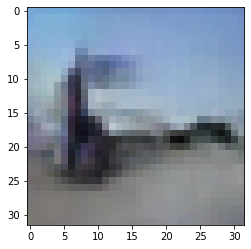

-> Epoch 410, Batch numero 1/78 -> Disc. loss on real images: 0.16017, Disc. loss on fake images: 0.48978, Generator loss: 3.57564
-> Epoch 410, Batch numero 2/78 -> Disc. loss on real images: 0.24047, Disc. loss on fake images: 0.13173, Generator loss: 3.41107
-> Epoch 410, Batch numero 3/78 -> Disc. loss on real images: 0.31097, Disc. loss on fake images: 0.32735, Generator loss: 3.34312
-> Epoch 410, Batch numero 4/78 -> Disc. loss on real images: 0.32964, Disc. loss on fake images: 0.29803, Generator loss: 3.29664
-> Epoch 410, Batch numero 5/78 -> Disc. loss on real images: 0.24787, Disc. loss on fake images: 0.27631, Generator loss: 3.25429
-> Epoch 410, Batch numero 6/78 -> Disc. loss on real images: 0.22398, Disc. loss on fake images: 0.20225, Generator loss: 3.00218
-> Epoch 410, Batch numero 7/78 -> Disc. loss on real images: 0.12944, Disc. loss on fake images: 0.07773, Generator loss: 2.91418
-> Epoch 410, Batch numero 8/78 -> Disc. loss on real images: 0.30861, Disc. loss o

-> Epoch 410, Batch numero 64/78 -> Disc. loss on real images: 0.23786, Disc. loss on fake images: 0.35369, Generator loss: 3.06620
-> Epoch 410, Batch numero 65/78 -> Disc. loss on real images: 0.26143, Disc. loss on fake images: 0.18904, Generator loss: 3.09809
-> Epoch 410, Batch numero 66/78 -> Disc. loss on real images: 0.13953, Disc. loss on fake images: 0.24599, Generator loss: 3.76741
-> Epoch 410, Batch numero 67/78 -> Disc. loss on real images: 0.12067, Disc. loss on fake images: 0.13140, Generator loss: 3.33728
-> Epoch 410, Batch numero 68/78 -> Disc. loss on real images: 0.15283, Disc. loss on fake images: 0.39113, Generator loss: 3.92347
-> Epoch 410, Batch numero 69/78 -> Disc. loss on real images: 0.16016, Disc. loss on fake images: 0.23963, Generator loss: 4.49679
-> Epoch 410, Batch numero 70/78 -> Disc. loss on real images: 0.52965, Disc. loss on fake images: 0.17139, Generator loss: 3.64364
-> Epoch 410, Batch numero 71/78 -> Disc. loss on real images: 0.22011, Disc

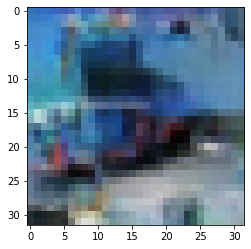

-> Epoch 411, Batch numero 1/78 -> Disc. loss on real images: 0.17136, Disc. loss on fake images: 0.23621, Generator loss: 3.30499
-> Epoch 411, Batch numero 2/78 -> Disc. loss on real images: 0.22524, Disc. loss on fake images: 0.14161, Generator loss: 3.13190
-> Epoch 411, Batch numero 3/78 -> Disc. loss on real images: 0.12784, Disc. loss on fake images: 0.13837, Generator loss: 3.19675
-> Epoch 411, Batch numero 4/78 -> Disc. loss on real images: 0.16974, Disc. loss on fake images: 0.37000, Generator loss: 3.45961
-> Epoch 411, Batch numero 5/78 -> Disc. loss on real images: 0.25700, Disc. loss on fake images: 0.23525, Generator loss: 3.47146
-> Epoch 411, Batch numero 6/78 -> Disc. loss on real images: 0.28676, Disc. loss on fake images: 0.23897, Generator loss: 3.28506
-> Epoch 411, Batch numero 7/78 -> Disc. loss on real images: 0.22706, Disc. loss on fake images: 0.11707, Generator loss: 3.49213
-> Epoch 411, Batch numero 8/78 -> Disc. loss on real images: 0.15437, Disc. loss o

-> Epoch 411, Batch numero 64/78 -> Disc. loss on real images: 0.35676, Disc. loss on fake images: 0.26187, Generator loss: 2.81025
-> Epoch 411, Batch numero 65/78 -> Disc. loss on real images: 0.11913, Disc. loss on fake images: 0.15635, Generator loss: 3.30578
-> Epoch 411, Batch numero 66/78 -> Disc. loss on real images: 0.18216, Disc. loss on fake images: 0.59375, Generator loss: 3.36873
-> Epoch 411, Batch numero 67/78 -> Disc. loss on real images: 0.23368, Disc. loss on fake images: 0.22199, Generator loss: 3.69421
-> Epoch 411, Batch numero 68/78 -> Disc. loss on real images: 0.35358, Disc. loss on fake images: 0.19947, Generator loss: 3.15708
-> Epoch 411, Batch numero 69/78 -> Disc. loss on real images: 0.18901, Disc. loss on fake images: 0.51301, Generator loss: 3.74257
-> Epoch 411, Batch numero 70/78 -> Disc. loss on real images: 0.30695, Disc. loss on fake images: 0.08607, Generator loss: 3.84687
-> Epoch 411, Batch numero 71/78 -> Disc. loss on real images: 0.21199, Disc

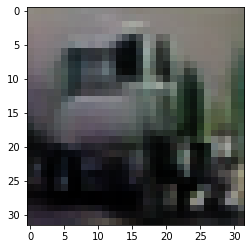

-> Epoch 412, Batch numero 1/78 -> Disc. loss on real images: 0.50644, Disc. loss on fake images: 0.20678, Generator loss: 3.57238
-> Epoch 412, Batch numero 2/78 -> Disc. loss on real images: 0.22938, Disc. loss on fake images: 0.37043, Generator loss: 3.32733
-> Epoch 412, Batch numero 3/78 -> Disc. loss on real images: 0.25310, Disc. loss on fake images: 0.25378, Generator loss: 3.24136
-> Epoch 412, Batch numero 4/78 -> Disc. loss on real images: 0.36183, Disc. loss on fake images: 0.18178, Generator loss: 2.85194
-> Epoch 412, Batch numero 5/78 -> Disc. loss on real images: 0.11697, Disc. loss on fake images: 0.36090, Generator loss: 3.51584
-> Epoch 412, Batch numero 6/78 -> Disc. loss on real images: 0.19562, Disc. loss on fake images: 0.29267, Generator loss: 3.67041
-> Epoch 412, Batch numero 7/78 -> Disc. loss on real images: 0.44659, Disc. loss on fake images: 0.25563, Generator loss: 3.45756
-> Epoch 412, Batch numero 8/78 -> Disc. loss on real images: 0.19885, Disc. loss o

-> Epoch 412, Batch numero 65/78 -> Disc. loss on real images: 0.33111, Disc. loss on fake images: 0.27735, Generator loss: 3.57444
-> Epoch 412, Batch numero 66/78 -> Disc. loss on real images: 0.11183, Disc. loss on fake images: 0.43628, Generator loss: 3.97089
-> Epoch 412, Batch numero 67/78 -> Disc. loss on real images: 0.34478, Disc. loss on fake images: 0.18300, Generator loss: 3.79914
-> Epoch 412, Batch numero 68/78 -> Disc. loss on real images: 0.37629, Disc. loss on fake images: 0.17480, Generator loss: 3.26993
-> Epoch 412, Batch numero 69/78 -> Disc. loss on real images: 0.21989, Disc. loss on fake images: 0.15030, Generator loss: 3.41235
-> Epoch 412, Batch numero 70/78 -> Disc. loss on real images: 0.14428, Disc. loss on fake images: 0.26512, Generator loss: 3.22453
-> Epoch 412, Batch numero 71/78 -> Disc. loss on real images: 0.23900, Disc. loss on fake images: 0.12524, Generator loss: 3.32316
-> Epoch 412, Batch numero 72/78 -> Disc. loss on real images: 0.06193, Disc

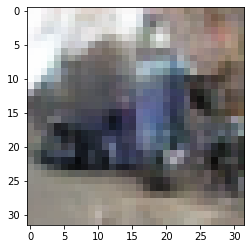

-> Epoch 413, Batch numero 1/78 -> Disc. loss on real images: 0.16413, Disc. loss on fake images: 0.25578, Generator loss: 3.77217
-> Epoch 413, Batch numero 2/78 -> Disc. loss on real images: 0.24630, Disc. loss on fake images: 0.46941, Generator loss: 3.49736
-> Epoch 413, Batch numero 3/78 -> Disc. loss on real images: 0.18923, Disc. loss on fake images: 0.14880, Generator loss: 3.90425
-> Epoch 413, Batch numero 4/78 -> Disc. loss on real images: 0.19544, Disc. loss on fake images: 0.19157, Generator loss: 3.08421
-> Epoch 413, Batch numero 5/78 -> Disc. loss on real images: 0.13593, Disc. loss on fake images: 0.28327, Generator loss: 3.62556
-> Epoch 413, Batch numero 6/78 -> Disc. loss on real images: 0.18725, Disc. loss on fake images: 0.08616, Generator loss: 3.62695
-> Epoch 413, Batch numero 7/78 -> Disc. loss on real images: 0.16825, Disc. loss on fake images: 0.28835, Generator loss: 3.63699
-> Epoch 413, Batch numero 8/78 -> Disc. loss on real images: 0.19103, Disc. loss o

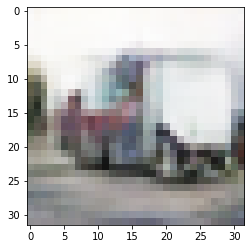

-> Epoch 414, Batch numero 1/78 -> Disc. loss on real images: 0.15933, Disc. loss on fake images: 0.33269, Generator loss: 3.61746
-> Epoch 414, Batch numero 2/78 -> Disc. loss on real images: 0.11481, Disc. loss on fake images: 0.14126, Generator loss: 3.55531
-> Epoch 414, Batch numero 3/78 -> Disc. loss on real images: 0.29292, Disc. loss on fake images: 0.12312, Generator loss: 3.55494
-> Epoch 414, Batch numero 4/78 -> Disc. loss on real images: 0.24467, Disc. loss on fake images: 0.07993, Generator loss: 3.27518
-> Epoch 414, Batch numero 5/78 -> Disc. loss on real images: 0.15837, Disc. loss on fake images: 0.19317, Generator loss: 3.29385
-> Epoch 414, Batch numero 6/78 -> Disc. loss on real images: 0.14210, Disc. loss on fake images: 0.26948, Generator loss: 3.77516
-> Epoch 414, Batch numero 7/78 -> Disc. loss on real images: 0.24021, Disc. loss on fake images: 0.20043, Generator loss: 3.24261
-> Epoch 414, Batch numero 8/78 -> Disc. loss on real images: 0.12295, Disc. loss o

-> Epoch 414, Batch numero 64/78 -> Disc. loss on real images: 0.20893, Disc. loss on fake images: 0.17120, Generator loss: 3.67058
-> Epoch 414, Batch numero 65/78 -> Disc. loss on real images: 0.27838, Disc. loss on fake images: 0.23471, Generator loss: 3.72353
-> Epoch 414, Batch numero 66/78 -> Disc. loss on real images: 0.23665, Disc. loss on fake images: 0.18081, Generator loss: 3.25447
-> Epoch 414, Batch numero 67/78 -> Disc. loss on real images: 0.20293, Disc. loss on fake images: 0.21849, Generator loss: 3.88911
-> Epoch 414, Batch numero 68/78 -> Disc. loss on real images: 0.15094, Disc. loss on fake images: 0.19451, Generator loss: 3.91812
-> Epoch 414, Batch numero 69/78 -> Disc. loss on real images: 0.39069, Disc. loss on fake images: 0.52898, Generator loss: 4.02063
-> Epoch 414, Batch numero 70/78 -> Disc. loss on real images: 0.39571, Disc. loss on fake images: 0.20719, Generator loss: 3.60259
-> Epoch 414, Batch numero 71/78 -> Disc. loss on real images: 0.21667, Disc

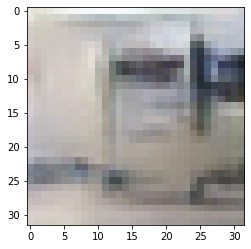

-> Epoch 415, Batch numero 1/78 -> Disc. loss on real images: 0.13023, Disc. loss on fake images: 0.28727, Generator loss: 3.18338
-> Epoch 415, Batch numero 2/78 -> Disc. loss on real images: 0.13896, Disc. loss on fake images: 0.18007, Generator loss: 3.85289
-> Epoch 415, Batch numero 3/78 -> Disc. loss on real images: 0.20172, Disc. loss on fake images: 0.30180, Generator loss: 3.55041
-> Epoch 415, Batch numero 4/78 -> Disc. loss on real images: 0.31663, Disc. loss on fake images: 0.12009, Generator loss: 3.72797
-> Epoch 415, Batch numero 5/78 -> Disc. loss on real images: 0.29633, Disc. loss on fake images: 0.17097, Generator loss: 3.34552
-> Epoch 415, Batch numero 6/78 -> Disc. loss on real images: 0.18734, Disc. loss on fake images: 0.37101, Generator loss: 3.53244
-> Epoch 415, Batch numero 7/78 -> Disc. loss on real images: 0.24036, Disc. loss on fake images: 0.14282, Generator loss: 3.20912
-> Epoch 415, Batch numero 8/78 -> Disc. loss on real images: 0.21326, Disc. loss o

-> Epoch 415, Batch numero 65/78 -> Disc. loss on real images: 0.28197, Disc. loss on fake images: 0.22958, Generator loss: 3.54295
-> Epoch 415, Batch numero 66/78 -> Disc. loss on real images: 0.24134, Disc. loss on fake images: 0.18895, Generator loss: 3.59610
-> Epoch 415, Batch numero 67/78 -> Disc. loss on real images: 0.33318, Disc. loss on fake images: 0.26849, Generator loss: 3.15046
-> Epoch 415, Batch numero 68/78 -> Disc. loss on real images: 0.11671, Disc. loss on fake images: 0.28377, Generator loss: 3.40069
-> Epoch 415, Batch numero 69/78 -> Disc. loss on real images: 0.36808, Disc. loss on fake images: 0.22203, Generator loss: 3.92837
-> Epoch 415, Batch numero 70/78 -> Disc. loss on real images: 0.11657, Disc. loss on fake images: 0.33130, Generator loss: 4.14210
-> Epoch 415, Batch numero 71/78 -> Disc. loss on real images: 0.26324, Disc. loss on fake images: 0.13420, Generator loss: 3.04372
-> Epoch 415, Batch numero 72/78 -> Disc. loss on real images: 0.24755, Disc

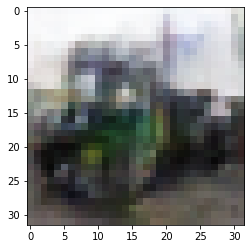

-> Epoch 416, Batch numero 1/78 -> Disc. loss on real images: 0.34358, Disc. loss on fake images: 0.08795, Generator loss: 3.73059
-> Epoch 416, Batch numero 2/78 -> Disc. loss on real images: 0.36881, Disc. loss on fake images: 0.24368, Generator loss: 3.09256
-> Epoch 416, Batch numero 3/78 -> Disc. loss on real images: 0.15250, Disc. loss on fake images: 0.47350, Generator loss: 3.56306
-> Epoch 416, Batch numero 4/78 -> Disc. loss on real images: 0.27194, Disc. loss on fake images: 0.12314, Generator loss: 3.27169
-> Epoch 416, Batch numero 5/78 -> Disc. loss on real images: 0.15887, Disc. loss on fake images: 0.31299, Generator loss: 3.19900
-> Epoch 416, Batch numero 6/78 -> Disc. loss on real images: 0.33000, Disc. loss on fake images: 0.23847, Generator loss: 3.54373
-> Epoch 416, Batch numero 7/78 -> Disc. loss on real images: 0.26132, Disc. loss on fake images: 0.12529, Generator loss: 3.19604
-> Epoch 416, Batch numero 8/78 -> Disc. loss on real images: 0.10304, Disc. loss o

-> Epoch 416, Batch numero 64/78 -> Disc. loss on real images: 0.28902, Disc. loss on fake images: 0.20580, Generator loss: 3.69666
-> Epoch 416, Batch numero 65/78 -> Disc. loss on real images: 0.22934, Disc. loss on fake images: 0.20683, Generator loss: 2.88021
-> Epoch 416, Batch numero 66/78 -> Disc. loss on real images: 0.22105, Disc. loss on fake images: 0.12683, Generator loss: 2.93332
-> Epoch 416, Batch numero 67/78 -> Disc. loss on real images: 0.13828, Disc. loss on fake images: 0.22495, Generator loss: 3.20509
-> Epoch 416, Batch numero 68/78 -> Disc. loss on real images: 0.21435, Disc. loss on fake images: 0.33354, Generator loss: 3.57287
-> Epoch 416, Batch numero 69/78 -> Disc. loss on real images: 0.27858, Disc. loss on fake images: 0.07567, Generator loss: 3.40181
-> Epoch 416, Batch numero 70/78 -> Disc. loss on real images: 0.38425, Disc. loss on fake images: 0.32679, Generator loss: 3.03863
-> Epoch 416, Batch numero 71/78 -> Disc. loss on real images: 0.14879, Disc

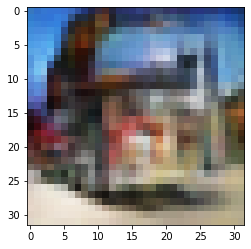

-> Epoch 417, Batch numero 1/78 -> Disc. loss on real images: 0.20308, Disc. loss on fake images: 0.10704, Generator loss: 3.49637
-> Epoch 417, Batch numero 2/78 -> Disc. loss on real images: 0.20515, Disc. loss on fake images: 0.17608, Generator loss: 3.71184
-> Epoch 417, Batch numero 3/78 -> Disc. loss on real images: 0.17819, Disc. loss on fake images: 0.16211, Generator loss: 3.60086
-> Epoch 417, Batch numero 4/78 -> Disc. loss on real images: 0.09595, Disc. loss on fake images: 0.19163, Generator loss: 3.36679
-> Epoch 417, Batch numero 5/78 -> Disc. loss on real images: 0.09833, Disc. loss on fake images: 0.15846, Generator loss: 3.68418
-> Epoch 417, Batch numero 6/78 -> Disc. loss on real images: 0.19574, Disc. loss on fake images: 0.31364, Generator loss: 3.92692
-> Epoch 417, Batch numero 7/78 -> Disc. loss on real images: 0.22462, Disc. loss on fake images: 0.08401, Generator loss: 3.37785
-> Epoch 417, Batch numero 8/78 -> Disc. loss on real images: 0.17593, Disc. loss o

-> Epoch 417, Batch numero 64/78 -> Disc. loss on real images: 0.05950, Disc. loss on fake images: 0.19876, Generator loss: 3.71221
-> Epoch 417, Batch numero 65/78 -> Disc. loss on real images: 0.24645, Disc. loss on fake images: 0.38310, Generator loss: 3.70206
-> Epoch 417, Batch numero 66/78 -> Disc. loss on real images: 0.24051, Disc. loss on fake images: 0.19830, Generator loss: 3.57351
-> Epoch 417, Batch numero 67/78 -> Disc. loss on real images: 0.14092, Disc. loss on fake images: 0.11286, Generator loss: 3.97491
-> Epoch 417, Batch numero 68/78 -> Disc. loss on real images: 0.21247, Disc. loss on fake images: 0.10511, Generator loss: 3.75388
-> Epoch 417, Batch numero 69/78 -> Disc. loss on real images: 0.14013, Disc. loss on fake images: 0.38824, Generator loss: 3.09277
-> Epoch 417, Batch numero 70/78 -> Disc. loss on real images: 0.23695, Disc. loss on fake images: 0.13392, Generator loss: 3.36176
-> Epoch 417, Batch numero 71/78 -> Disc. loss on real images: 0.12266, Disc

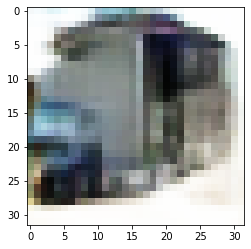

-> Epoch 418, Batch numero 1/78 -> Disc. loss on real images: 0.34434, Disc. loss on fake images: 0.09613, Generator loss: 2.78225
-> Epoch 418, Batch numero 2/78 -> Disc. loss on real images: 0.10895, Disc. loss on fake images: 0.24682, Generator loss: 3.00183
-> Epoch 418, Batch numero 3/78 -> Disc. loss on real images: 0.22485, Disc. loss on fake images: 0.27694, Generator loss: 3.45428
-> Epoch 418, Batch numero 4/78 -> Disc. loss on real images: 0.15553, Disc. loss on fake images: 0.18495, Generator loss: 3.25041
-> Epoch 418, Batch numero 5/78 -> Disc. loss on real images: 0.11512, Disc. loss on fake images: 0.09007, Generator loss: 3.84850
-> Epoch 418, Batch numero 6/78 -> Disc. loss on real images: 0.36314, Disc. loss on fake images: 0.26257, Generator loss: 3.26070
-> Epoch 418, Batch numero 7/78 -> Disc. loss on real images: 0.08388, Disc. loss on fake images: 0.33297, Generator loss: 3.93837
-> Epoch 418, Batch numero 8/78 -> Disc. loss on real images: 0.19042, Disc. loss o

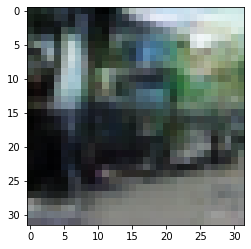

-> Epoch 419, Batch numero 1/78 -> Disc. loss on real images: 0.24672, Disc. loss on fake images: 0.20428, Generator loss: 3.73362
-> Epoch 419, Batch numero 2/78 -> Disc. loss on real images: 0.17147, Disc. loss on fake images: 0.31524, Generator loss: 3.88619
-> Epoch 419, Batch numero 3/78 -> Disc. loss on real images: 0.21075, Disc. loss on fake images: 0.17373, Generator loss: 3.59694
-> Epoch 419, Batch numero 4/78 -> Disc. loss on real images: 0.30886, Disc. loss on fake images: 0.46113, Generator loss: 3.55332
-> Epoch 419, Batch numero 5/78 -> Disc. loss on real images: 0.27109, Disc. loss on fake images: 0.35487, Generator loss: 3.50319
-> Epoch 419, Batch numero 6/78 -> Disc. loss on real images: 0.18337, Disc. loss on fake images: 0.42848, Generator loss: 3.63612
-> Epoch 419, Batch numero 7/78 -> Disc. loss on real images: 0.19202, Disc. loss on fake images: 0.30625, Generator loss: 3.80299
-> Epoch 419, Batch numero 8/78 -> Disc. loss on real images: 0.30688, Disc. loss o

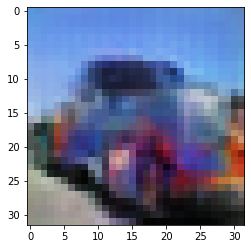

-> Epoch 420, Batch numero 1/78 -> Disc. loss on real images: 0.19926, Disc. loss on fake images: 0.22960, Generator loss: 3.33189
-> Epoch 420, Batch numero 2/78 -> Disc. loss on real images: 0.31206, Disc. loss on fake images: 0.18749, Generator loss: 3.38006
-> Epoch 420, Batch numero 3/78 -> Disc. loss on real images: 0.32807, Disc. loss on fake images: 0.40471, Generator loss: 3.14827
-> Epoch 420, Batch numero 4/78 -> Disc. loss on real images: 0.15489, Disc. loss on fake images: 0.26710, Generator loss: 3.24334
-> Epoch 420, Batch numero 5/78 -> Disc. loss on real images: 0.26358, Disc. loss on fake images: 0.18600, Generator loss: 3.71100
-> Epoch 420, Batch numero 6/78 -> Disc. loss on real images: 0.25254, Disc. loss on fake images: 0.19064, Generator loss: 3.17960
-> Epoch 420, Batch numero 7/78 -> Disc. loss on real images: 0.24753, Disc. loss on fake images: 0.65679, Generator loss: 3.71766
-> Epoch 420, Batch numero 8/78 -> Disc. loss on real images: 0.43661, Disc. loss o

-> Epoch 420, Batch numero 64/78 -> Disc. loss on real images: 0.18529, Disc. loss on fake images: 0.25191, Generator loss: 3.22590
-> Epoch 420, Batch numero 65/78 -> Disc. loss on real images: 0.13508, Disc. loss on fake images: 0.21773, Generator loss: 3.64164
-> Epoch 420, Batch numero 66/78 -> Disc. loss on real images: 0.26869, Disc. loss on fake images: 0.27872, Generator loss: 3.81035
-> Epoch 420, Batch numero 67/78 -> Disc. loss on real images: 0.36379, Disc. loss on fake images: 0.21560, Generator loss: 2.98274
-> Epoch 420, Batch numero 68/78 -> Disc. loss on real images: 0.18883, Disc. loss on fake images: 0.23900, Generator loss: 2.82584
-> Epoch 420, Batch numero 69/78 -> Disc. loss on real images: 0.15706, Disc. loss on fake images: 0.25400, Generator loss: 3.81029
-> Epoch 420, Batch numero 70/78 -> Disc. loss on real images: 0.26730, Disc. loss on fake images: 0.21923, Generator loss: 3.58014
-> Epoch 420, Batch numero 71/78 -> Disc. loss on real images: 0.22690, Disc

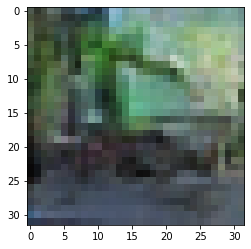

-> Epoch 421, Batch numero 1/78 -> Disc. loss on real images: 0.21775, Disc. loss on fake images: 0.40517, Generator loss: 3.46977
-> Epoch 421, Batch numero 2/78 -> Disc. loss on real images: 0.26597, Disc. loss on fake images: 0.20743, Generator loss: 3.33333
-> Epoch 421, Batch numero 3/78 -> Disc. loss on real images: 0.20606, Disc. loss on fake images: 0.27141, Generator loss: 3.09459
-> Epoch 421, Batch numero 4/78 -> Disc. loss on real images: 0.21150, Disc. loss on fake images: 0.40994, Generator loss: 3.20340
-> Epoch 421, Batch numero 5/78 -> Disc. loss on real images: 0.38167, Disc. loss on fake images: 0.26781, Generator loss: 3.16499
-> Epoch 421, Batch numero 6/78 -> Disc. loss on real images: 0.25433, Disc. loss on fake images: 0.18783, Generator loss: 3.22400
-> Epoch 421, Batch numero 7/78 -> Disc. loss on real images: 0.22201, Disc. loss on fake images: 0.30950, Generator loss: 3.16210
-> Epoch 421, Batch numero 8/78 -> Disc. loss on real images: 0.10325, Disc. loss o

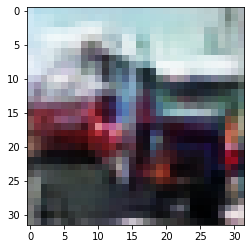

-> Epoch 422, Batch numero 1/78 -> Disc. loss on real images: 0.41323, Disc. loss on fake images: 0.17558, Generator loss: 3.40509
-> Epoch 422, Batch numero 2/78 -> Disc. loss on real images: 0.10161, Disc. loss on fake images: 0.69922, Generator loss: 4.00573
-> Epoch 422, Batch numero 3/78 -> Disc. loss on real images: 0.56884, Disc. loss on fake images: 0.36068, Generator loss: 3.71779
-> Epoch 422, Batch numero 4/78 -> Disc. loss on real images: 0.42629, Disc. loss on fake images: 0.11890, Generator loss: 3.28169
-> Epoch 422, Batch numero 5/78 -> Disc. loss on real images: 0.15161, Disc. loss on fake images: 0.25857, Generator loss: 3.80137
-> Epoch 422, Batch numero 6/78 -> Disc. loss on real images: 0.22639, Disc. loss on fake images: 0.38755, Generator loss: 3.81270
-> Epoch 422, Batch numero 7/78 -> Disc. loss on real images: 0.25768, Disc. loss on fake images: 0.15459, Generator loss: 3.42918
-> Epoch 422, Batch numero 8/78 -> Disc. loss on real images: 0.26526, Disc. loss o

-> Epoch 422, Batch numero 66/78 -> Disc. loss on real images: 0.11524, Disc. loss on fake images: 0.27409, Generator loss: 3.43404
-> Epoch 422, Batch numero 67/78 -> Disc. loss on real images: 0.18354, Disc. loss on fake images: 0.23225, Generator loss: 4.26065
-> Epoch 422, Batch numero 68/78 -> Disc. loss on real images: 0.30449, Disc. loss on fake images: 0.09451, Generator loss: 3.81041
-> Epoch 422, Batch numero 69/78 -> Disc. loss on real images: 0.31947, Disc. loss on fake images: 0.17313, Generator loss: 3.02575
-> Epoch 422, Batch numero 70/78 -> Disc. loss on real images: 0.15172, Disc. loss on fake images: 0.44200, Generator loss: 3.58575
-> Epoch 422, Batch numero 71/78 -> Disc. loss on real images: 0.17893, Disc. loss on fake images: 0.19938, Generator loss: 3.50142
-> Epoch 422, Batch numero 72/78 -> Disc. loss on real images: 0.24541, Disc. loss on fake images: 0.21783, Generator loss: 3.53311
-> Epoch 422, Batch numero 73/78 -> Disc. loss on real images: 0.10175, Disc

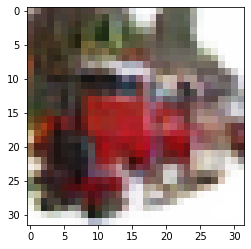

-> Epoch 423, Batch numero 1/78 -> Disc. loss on real images: 0.12885, Disc. loss on fake images: 0.08184, Generator loss: 3.37848
-> Epoch 423, Batch numero 2/78 -> Disc. loss on real images: 0.13764, Disc. loss on fake images: 0.19949, Generator loss: 3.26091
-> Epoch 423, Batch numero 3/78 -> Disc. loss on real images: 0.13292, Disc. loss on fake images: 0.35298, Generator loss: 3.59377
-> Epoch 423, Batch numero 4/78 -> Disc. loss on real images: 0.29447, Disc. loss on fake images: 0.23394, Generator loss: 3.71261
-> Epoch 423, Batch numero 5/78 -> Disc. loss on real images: 0.18469, Disc. loss on fake images: 0.10378, Generator loss: 3.47063
-> Epoch 423, Batch numero 6/78 -> Disc. loss on real images: 0.14619, Disc. loss on fake images: 0.35940, Generator loss: 3.42825
-> Epoch 423, Batch numero 7/78 -> Disc. loss on real images: 0.32443, Disc. loss on fake images: 0.32313, Generator loss: 4.32245
-> Epoch 423, Batch numero 8/78 -> Disc. loss on real images: 0.30482, Disc. loss o

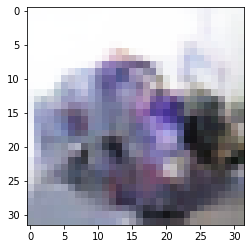

-> Epoch 424, Batch numero 1/78 -> Disc. loss on real images: 0.14251, Disc. loss on fake images: 0.18004, Generator loss: 3.76655
-> Epoch 424, Batch numero 2/78 -> Disc. loss on real images: 0.22492, Disc. loss on fake images: 0.20403, Generator loss: 3.22107
-> Epoch 424, Batch numero 3/78 -> Disc. loss on real images: 0.12691, Disc. loss on fake images: 0.19495, Generator loss: 4.04706
-> Epoch 424, Batch numero 4/78 -> Disc. loss on real images: 0.28241, Disc. loss on fake images: 0.20232, Generator loss: 3.57703
-> Epoch 424, Batch numero 5/78 -> Disc. loss on real images: 0.21395, Disc. loss on fake images: 0.17628, Generator loss: 3.60817
-> Epoch 424, Batch numero 6/78 -> Disc. loss on real images: 0.13952, Disc. loss on fake images: 0.20236, Generator loss: 3.76728
-> Epoch 424, Batch numero 7/78 -> Disc. loss on real images: 0.11383, Disc. loss on fake images: 0.09776, Generator loss: 3.43867
-> Epoch 424, Batch numero 8/78 -> Disc. loss on real images: 0.14664, Disc. loss o

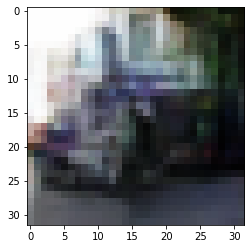

-> Epoch 425, Batch numero 1/78 -> Disc. loss on real images: 0.21954, Disc. loss on fake images: 0.19859, Generator loss: 3.58151
-> Epoch 425, Batch numero 2/78 -> Disc. loss on real images: 0.27818, Disc. loss on fake images: 0.20597, Generator loss: 3.94912
-> Epoch 425, Batch numero 3/78 -> Disc. loss on real images: 0.18258, Disc. loss on fake images: 0.37546, Generator loss: 3.80674
-> Epoch 425, Batch numero 4/78 -> Disc. loss on real images: 0.10998, Disc. loss on fake images: 0.19738, Generator loss: 4.42488
-> Epoch 425, Batch numero 5/78 -> Disc. loss on real images: 0.15012, Disc. loss on fake images: 0.05113, Generator loss: 3.85137
-> Epoch 425, Batch numero 6/78 -> Disc. loss on real images: 0.22693, Disc. loss on fake images: 0.34953, Generator loss: 3.55146
-> Epoch 425, Batch numero 7/78 -> Disc. loss on real images: 0.20193, Disc. loss on fake images: 0.38441, Generator loss: 4.06813
-> Epoch 425, Batch numero 8/78 -> Disc. loss on real images: 0.34712, Disc. loss o

-> Epoch 425, Batch numero 64/78 -> Disc. loss on real images: 0.24034, Disc. loss on fake images: 0.23803, Generator loss: 3.61685
-> Epoch 425, Batch numero 65/78 -> Disc. loss on real images: 0.18880, Disc. loss on fake images: 0.22344, Generator loss: 3.56632
-> Epoch 425, Batch numero 66/78 -> Disc. loss on real images: 0.27157, Disc. loss on fake images: 0.25336, Generator loss: 3.70250
-> Epoch 425, Batch numero 67/78 -> Disc. loss on real images: 0.10046, Disc. loss on fake images: 0.13102, Generator loss: 3.83145
-> Epoch 425, Batch numero 68/78 -> Disc. loss on real images: 0.15461, Disc. loss on fake images: 0.22757, Generator loss: 3.42966
-> Epoch 425, Batch numero 69/78 -> Disc. loss on real images: 0.44025, Disc. loss on fake images: 0.41118, Generator loss: 3.67724
-> Epoch 425, Batch numero 70/78 -> Disc. loss on real images: 0.25765, Disc. loss on fake images: 0.51928, Generator loss: 4.09572
-> Epoch 425, Batch numero 71/78 -> Disc. loss on real images: 0.38538, Disc

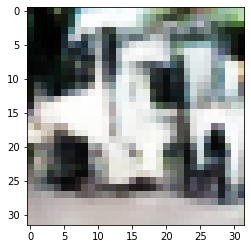

-> Epoch 426, Batch numero 1/78 -> Disc. loss on real images: 0.15913, Disc. loss on fake images: 0.18591, Generator loss: 3.27838
-> Epoch 426, Batch numero 2/78 -> Disc. loss on real images: 0.24516, Disc. loss on fake images: 0.18911, Generator loss: 3.08613
-> Epoch 426, Batch numero 3/78 -> Disc. loss on real images: 0.13477, Disc. loss on fake images: 0.24410, Generator loss: 3.44997
-> Epoch 426, Batch numero 4/78 -> Disc. loss on real images: 0.13930, Disc. loss on fake images: 0.09970, Generator loss: 3.14508
-> Epoch 426, Batch numero 5/78 -> Disc. loss on real images: 0.12306, Disc. loss on fake images: 0.29255, Generator loss: 3.92161
-> Epoch 426, Batch numero 6/78 -> Disc. loss on real images: 0.10901, Disc. loss on fake images: 0.25319, Generator loss: 3.57772
-> Epoch 426, Batch numero 7/78 -> Disc. loss on real images: 0.26451, Disc. loss on fake images: 0.22077, Generator loss: 3.80175
-> Epoch 426, Batch numero 8/78 -> Disc. loss on real images: 0.28963, Disc. loss o

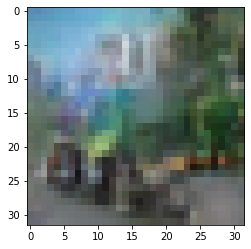

-> Epoch 427, Batch numero 1/78 -> Disc. loss on real images: 0.23449, Disc. loss on fake images: 0.28652, Generator loss: 3.12627
-> Epoch 427, Batch numero 2/78 -> Disc. loss on real images: 0.33677, Disc. loss on fake images: 0.13472, Generator loss: 3.15505
-> Epoch 427, Batch numero 3/78 -> Disc. loss on real images: 0.22702, Disc. loss on fake images: 0.23495, Generator loss: 3.40114
-> Epoch 427, Batch numero 4/78 -> Disc. loss on real images: 0.22846, Disc. loss on fake images: 0.30224, Generator loss: 2.94380
-> Epoch 427, Batch numero 5/78 -> Disc. loss on real images: 0.15689, Disc. loss on fake images: 0.34846, Generator loss: 4.00452
-> Epoch 427, Batch numero 6/78 -> Disc. loss on real images: 0.20193, Disc. loss on fake images: 0.17779, Generator loss: 3.59420
-> Epoch 427, Batch numero 7/78 -> Disc. loss on real images: 0.11887, Disc. loss on fake images: 0.22845, Generator loss: 4.20580
-> Epoch 427, Batch numero 8/78 -> Disc. loss on real images: 0.40669, Disc. loss o

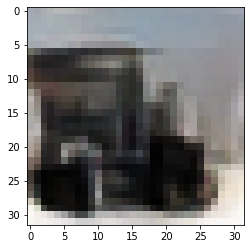

-> Epoch 428, Batch numero 1/78 -> Disc. loss on real images: 0.29121, Disc. loss on fake images: 0.16716, Generator loss: 3.42992
-> Epoch 428, Batch numero 2/78 -> Disc. loss on real images: 0.15400, Disc. loss on fake images: 0.22186, Generator loss: 3.65379
-> Epoch 428, Batch numero 3/78 -> Disc. loss on real images: 0.19539, Disc. loss on fake images: 0.24159, Generator loss: 3.55492
-> Epoch 428, Batch numero 4/78 -> Disc. loss on real images: 0.30997, Disc. loss on fake images: 0.09399, Generator loss: 3.30644
-> Epoch 428, Batch numero 5/78 -> Disc. loss on real images: 0.22075, Disc. loss on fake images: 0.29356, Generator loss: 2.94644
-> Epoch 428, Batch numero 6/78 -> Disc. loss on real images: 0.11685, Disc. loss on fake images: 0.28045, Generator loss: 3.65482
-> Epoch 428, Batch numero 7/78 -> Disc. loss on real images: 0.19761, Disc. loss on fake images: 0.18400, Generator loss: 4.04474
-> Epoch 428, Batch numero 8/78 -> Disc. loss on real images: 0.28750, Disc. loss o

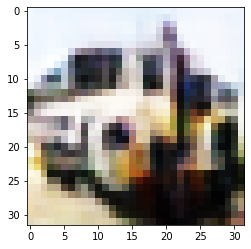

-> Epoch 429, Batch numero 1/78 -> Disc. loss on real images: 0.44145, Disc. loss on fake images: 0.14469, Generator loss: 3.17657
-> Epoch 429, Batch numero 2/78 -> Disc. loss on real images: 0.20624, Disc. loss on fake images: 0.23112, Generator loss: 3.11811
-> Epoch 429, Batch numero 3/78 -> Disc. loss on real images: 0.14765, Disc. loss on fake images: 0.24256, Generator loss: 3.34104
-> Epoch 429, Batch numero 4/78 -> Disc. loss on real images: 0.10378, Disc. loss on fake images: 0.30072, Generator loss: 3.69241
-> Epoch 429, Batch numero 5/78 -> Disc. loss on real images: 0.19060, Disc. loss on fake images: 0.14937, Generator loss: 3.57124
-> Epoch 429, Batch numero 6/78 -> Disc. loss on real images: 0.32103, Disc. loss on fake images: 0.31525, Generator loss: 3.81097
-> Epoch 429, Batch numero 7/78 -> Disc. loss on real images: 0.13338, Disc. loss on fake images: 0.23950, Generator loss: 3.70878
-> Epoch 429, Batch numero 8/78 -> Disc. loss on real images: 0.27786, Disc. loss o

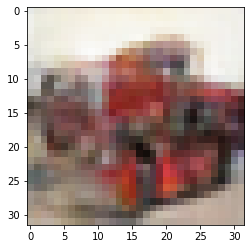

-> Epoch 430, Batch numero 1/78 -> Disc. loss on real images: 0.22210, Disc. loss on fake images: 0.16782, Generator loss: 3.17671
-> Epoch 430, Batch numero 2/78 -> Disc. loss on real images: 0.21162, Disc. loss on fake images: 0.39869, Generator loss: 3.76013
-> Epoch 430, Batch numero 3/78 -> Disc. loss on real images: 0.26349, Disc. loss on fake images: 0.04552, Generator loss: 3.85547
-> Epoch 430, Batch numero 4/78 -> Disc. loss on real images: 0.17897, Disc. loss on fake images: 0.34759, Generator loss: 2.72341
-> Epoch 430, Batch numero 5/78 -> Disc. loss on real images: 0.11417, Disc. loss on fake images: 0.20730, Generator loss: 3.71957
-> Epoch 430, Batch numero 6/78 -> Disc. loss on real images: 0.11847, Disc. loss on fake images: 0.22434, Generator loss: 3.74193
-> Epoch 430, Batch numero 7/78 -> Disc. loss on real images: 0.21665, Disc. loss on fake images: 0.26025, Generator loss: 3.58771
-> Epoch 430, Batch numero 8/78 -> Disc. loss on real images: 0.17652, Disc. loss o

-> Epoch 430, Batch numero 65/78 -> Disc. loss on real images: 0.30344, Disc. loss on fake images: 0.27974, Generator loss: 3.84172
-> Epoch 430, Batch numero 66/78 -> Disc. loss on real images: 0.11714, Disc. loss on fake images: 0.08563, Generator loss: 3.99439
-> Epoch 430, Batch numero 67/78 -> Disc. loss on real images: 0.15693, Disc. loss on fake images: 0.07107, Generator loss: 3.34625
-> Epoch 430, Batch numero 68/78 -> Disc. loss on real images: 0.17728, Disc. loss on fake images: 0.32702, Generator loss: 3.66338
-> Epoch 430, Batch numero 69/78 -> Disc. loss on real images: 0.11492, Disc. loss on fake images: 0.15371, Generator loss: 3.65167
-> Epoch 430, Batch numero 70/78 -> Disc. loss on real images: 0.15007, Disc. loss on fake images: 0.16826, Generator loss: 3.78209
-> Epoch 430, Batch numero 71/78 -> Disc. loss on real images: 0.51683, Disc. loss on fake images: 0.10425, Generator loss: 3.26834
-> Epoch 430, Batch numero 72/78 -> Disc. loss on real images: 0.26583, Disc

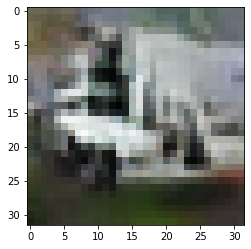

-> Epoch 431, Batch numero 1/78 -> Disc. loss on real images: 0.23471, Disc. loss on fake images: 0.17101, Generator loss: 3.69303
-> Epoch 431, Batch numero 2/78 -> Disc. loss on real images: 0.13331, Disc. loss on fake images: 0.18846, Generator loss: 3.75833
-> Epoch 431, Batch numero 3/78 -> Disc. loss on real images: 0.11622, Disc. loss on fake images: 0.32933, Generator loss: 4.27646
-> Epoch 431, Batch numero 4/78 -> Disc. loss on real images: 0.28310, Disc. loss on fake images: 0.23403, Generator loss: 3.78854
-> Epoch 431, Batch numero 5/78 -> Disc. loss on real images: 0.19879, Disc. loss on fake images: 0.22583, Generator loss: 3.88394
-> Epoch 431, Batch numero 6/78 -> Disc. loss on real images: 0.23924, Disc. loss on fake images: 0.13865, Generator loss: 3.35164
-> Epoch 431, Batch numero 7/78 -> Disc. loss on real images: 0.32097, Disc. loss on fake images: 0.21992, Generator loss: 3.43098
-> Epoch 431, Batch numero 8/78 -> Disc. loss on real images: 0.13385, Disc. loss o

-> Epoch 431, Batch numero 65/78 -> Disc. loss on real images: 0.13238, Disc. loss on fake images: 0.11182, Generator loss: 3.13392
-> Epoch 431, Batch numero 66/78 -> Disc. loss on real images: 0.19455, Disc. loss on fake images: 0.20787, Generator loss: 3.46569
-> Epoch 431, Batch numero 67/78 -> Disc. loss on real images: 0.06491, Disc. loss on fake images: 0.21558, Generator loss: 3.49083
-> Epoch 431, Batch numero 68/78 -> Disc. loss on real images: 0.15106, Disc. loss on fake images: 0.21737, Generator loss: 3.13961
-> Epoch 431, Batch numero 69/78 -> Disc. loss on real images: 0.24245, Disc. loss on fake images: 0.19191, Generator loss: 3.90656
-> Epoch 431, Batch numero 70/78 -> Disc. loss on real images: 0.15752, Disc. loss on fake images: 0.57694, Generator loss: 4.45378
-> Epoch 431, Batch numero 71/78 -> Disc. loss on real images: 0.14166, Disc. loss on fake images: 0.11702, Generator loss: 4.36110
-> Epoch 431, Batch numero 72/78 -> Disc. loss on real images: 0.26352, Disc

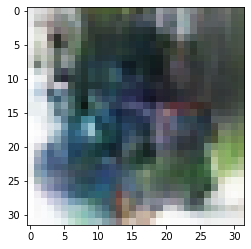

-> Epoch 432, Batch numero 1/78 -> Disc. loss on real images: 0.20858, Disc. loss on fake images: 0.04993, Generator loss: 3.75051
-> Epoch 432, Batch numero 2/78 -> Disc. loss on real images: 0.07926, Disc. loss on fake images: 0.13769, Generator loss: 3.78879
-> Epoch 432, Batch numero 3/78 -> Disc. loss on real images: 0.42557, Disc. loss on fake images: 0.30759, Generator loss: 2.90653
-> Epoch 432, Batch numero 4/78 -> Disc. loss on real images: 0.16968, Disc. loss on fake images: 0.21459, Generator loss: 3.44771
-> Epoch 432, Batch numero 5/78 -> Disc. loss on real images: 0.12568, Disc. loss on fake images: 0.30236, Generator loss: 3.27880
-> Epoch 432, Batch numero 6/78 -> Disc. loss on real images: 0.17846, Disc. loss on fake images: 0.19909, Generator loss: 3.58155
-> Epoch 432, Batch numero 7/78 -> Disc. loss on real images: 0.15684, Disc. loss on fake images: 0.32265, Generator loss: 3.61563
-> Epoch 432, Batch numero 8/78 -> Disc. loss on real images: 0.12950, Disc. loss o

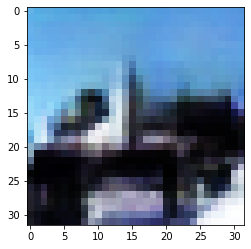

-> Epoch 433, Batch numero 1/78 -> Disc. loss on real images: 0.20379, Disc. loss on fake images: 0.36783, Generator loss: 3.96965
-> Epoch 433, Batch numero 2/78 -> Disc. loss on real images: 0.29669, Disc. loss on fake images: 0.14599, Generator loss: 3.84939
-> Epoch 433, Batch numero 3/78 -> Disc. loss on real images: 0.33452, Disc. loss on fake images: 0.17092, Generator loss: 3.32528
-> Epoch 433, Batch numero 4/78 -> Disc. loss on real images: 0.11807, Disc. loss on fake images: 0.39042, Generator loss: 3.77665
-> Epoch 433, Batch numero 5/78 -> Disc. loss on real images: 0.22593, Disc. loss on fake images: 0.27443, Generator loss: 3.65745
-> Epoch 433, Batch numero 6/78 -> Disc. loss on real images: 0.12629, Disc. loss on fake images: 0.28166, Generator loss: 3.78195
-> Epoch 433, Batch numero 7/78 -> Disc. loss on real images: 0.31672, Disc. loss on fake images: 0.06403, Generator loss: 3.83188
-> Epoch 433, Batch numero 8/78 -> Disc. loss on real images: 0.12069, Disc. loss o

-> Epoch 433, Batch numero 65/78 -> Disc. loss on real images: 0.26461, Disc. loss on fake images: 0.18757, Generator loss: 3.74590
-> Epoch 433, Batch numero 66/78 -> Disc. loss on real images: 0.29830, Disc. loss on fake images: 0.32290, Generator loss: 3.34648
-> Epoch 433, Batch numero 67/78 -> Disc. loss on real images: 0.08005, Disc. loss on fake images: 0.26603, Generator loss: 4.25739
-> Epoch 433, Batch numero 68/78 -> Disc. loss on real images: 0.32551, Disc. loss on fake images: 0.10416, Generator loss: 3.47409
-> Epoch 433, Batch numero 69/78 -> Disc. loss on real images: 0.09827, Disc. loss on fake images: 0.22603, Generator loss: 3.47045
-> Epoch 433, Batch numero 70/78 -> Disc. loss on real images: 0.23943, Disc. loss on fake images: 0.34050, Generator loss: 3.59376
-> Epoch 433, Batch numero 71/78 -> Disc. loss on real images: 0.31429, Disc. loss on fake images: 0.21293, Generator loss: 3.84774
-> Epoch 433, Batch numero 72/78 -> Disc. loss on real images: 0.33456, Disc

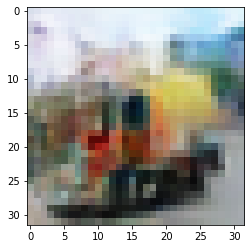

-> Epoch 434, Batch numero 1/78 -> Disc. loss on real images: 0.21118, Disc. loss on fake images: 0.20848, Generator loss: 3.66142
-> Epoch 434, Batch numero 2/78 -> Disc. loss on real images: 0.23893, Disc. loss on fake images: 0.17516, Generator loss: 3.85339
-> Epoch 434, Batch numero 3/78 -> Disc. loss on real images: 0.30771, Disc. loss on fake images: 0.24690, Generator loss: 3.76715
-> Epoch 434, Batch numero 4/78 -> Disc. loss on real images: 0.11427, Disc. loss on fake images: 0.12576, Generator loss: 4.02873
-> Epoch 434, Batch numero 5/78 -> Disc. loss on real images: 0.10084, Disc. loss on fake images: 0.17609, Generator loss: 3.30146
-> Epoch 434, Batch numero 6/78 -> Disc. loss on real images: 0.18904, Disc. loss on fake images: 0.24023, Generator loss: 3.31841
-> Epoch 434, Batch numero 7/78 -> Disc. loss on real images: 0.26471, Disc. loss on fake images: 0.17013, Generator loss: 3.53448
-> Epoch 434, Batch numero 8/78 -> Disc. loss on real images: 0.15453, Disc. loss o

-> Epoch 434, Batch numero 65/78 -> Disc. loss on real images: 0.23132, Disc. loss on fake images: 0.08451, Generator loss: 3.43341
-> Epoch 434, Batch numero 66/78 -> Disc. loss on real images: 0.34087, Disc. loss on fake images: 0.40145, Generator loss: 3.46840
-> Epoch 434, Batch numero 67/78 -> Disc. loss on real images: 0.21385, Disc. loss on fake images: 0.35510, Generator loss: 3.63950
-> Epoch 434, Batch numero 68/78 -> Disc. loss on real images: 0.18468, Disc. loss on fake images: 0.14191, Generator loss: 3.50119
-> Epoch 434, Batch numero 69/78 -> Disc. loss on real images: 0.17407, Disc. loss on fake images: 0.08874, Generator loss: 3.39604
-> Epoch 434, Batch numero 70/78 -> Disc. loss on real images: 0.11615, Disc. loss on fake images: 0.16226, Generator loss: 3.29274
-> Epoch 434, Batch numero 71/78 -> Disc. loss on real images: 0.06127, Disc. loss on fake images: 0.40152, Generator loss: 3.48898
-> Epoch 434, Batch numero 72/78 -> Disc. loss on real images: 0.14715, Disc

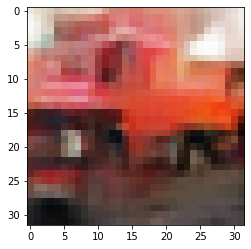

-> Epoch 435, Batch numero 1/78 -> Disc. loss on real images: 0.12408, Disc. loss on fake images: 0.17170, Generator loss: 3.69661
-> Epoch 435, Batch numero 2/78 -> Disc. loss on real images: 0.20876, Disc. loss on fake images: 0.24013, Generator loss: 3.41584
-> Epoch 435, Batch numero 3/78 -> Disc. loss on real images: 0.13315, Disc. loss on fake images: 0.18671, Generator loss: 3.65098
-> Epoch 435, Batch numero 4/78 -> Disc. loss on real images: 0.31994, Disc. loss on fake images: 0.35824, Generator loss: 3.22522
-> Epoch 435, Batch numero 5/78 -> Disc. loss on real images: 0.13324, Disc. loss on fake images: 0.23254, Generator loss: 3.89531
-> Epoch 435, Batch numero 6/78 -> Disc. loss on real images: 0.32900, Disc. loss on fake images: 0.24521, Generator loss: 3.41548
-> Epoch 435, Batch numero 7/78 -> Disc. loss on real images: 0.16407, Disc. loss on fake images: 0.37450, Generator loss: 4.19339
-> Epoch 435, Batch numero 8/78 -> Disc. loss on real images: 0.21333, Disc. loss o

-> Epoch 435, Batch numero 64/78 -> Disc. loss on real images: 0.22341, Disc. loss on fake images: 0.34046, Generator loss: 3.84458
-> Epoch 435, Batch numero 65/78 -> Disc. loss on real images: 0.32925, Disc. loss on fake images: 0.09980, Generator loss: 3.19604
-> Epoch 435, Batch numero 66/78 -> Disc. loss on real images: 0.23873, Disc. loss on fake images: 0.18779, Generator loss: 3.54540
-> Epoch 435, Batch numero 67/78 -> Disc. loss on real images: 0.27262, Disc. loss on fake images: 0.52394, Generator loss: 3.17215
-> Epoch 435, Batch numero 68/78 -> Disc. loss on real images: 0.10077, Disc. loss on fake images: 0.15169, Generator loss: 3.29021
-> Epoch 435, Batch numero 69/78 -> Disc. loss on real images: 0.12955, Disc. loss on fake images: 0.08281, Generator loss: 4.04448
-> Epoch 435, Batch numero 70/78 -> Disc. loss on real images: 0.38103, Disc. loss on fake images: 0.21278, Generator loss: 2.96096
-> Epoch 435, Batch numero 71/78 -> Disc. loss on real images: 0.11850, Disc

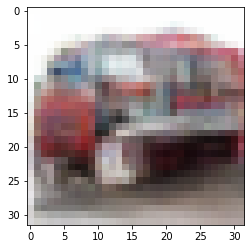

-> Epoch 436, Batch numero 1/78 -> Disc. loss on real images: 0.24811, Disc. loss on fake images: 0.10694, Generator loss: 3.85015
-> Epoch 436, Batch numero 2/78 -> Disc. loss on real images: 0.17203, Disc. loss on fake images: 0.28223, Generator loss: 3.50919
-> Epoch 436, Batch numero 3/78 -> Disc. loss on real images: 0.15474, Disc. loss on fake images: 0.27560, Generator loss: 3.68615
-> Epoch 436, Batch numero 4/78 -> Disc. loss on real images: 0.33020, Disc. loss on fake images: 0.18957, Generator loss: 2.98663
-> Epoch 436, Batch numero 5/78 -> Disc. loss on real images: 0.08662, Disc. loss on fake images: 0.22168, Generator loss: 3.82625
-> Epoch 436, Batch numero 6/78 -> Disc. loss on real images: 0.16513, Disc. loss on fake images: 0.32859, Generator loss: 4.29568
-> Epoch 436, Batch numero 7/78 -> Disc. loss on real images: 0.22535, Disc. loss on fake images: 0.08018, Generator loss: 3.57611
-> Epoch 436, Batch numero 8/78 -> Disc. loss on real images: 0.22485, Disc. loss o

-> Epoch 436, Batch numero 64/78 -> Disc. loss on real images: 0.23945, Disc. loss on fake images: 0.10518, Generator loss: 3.51252
-> Epoch 436, Batch numero 65/78 -> Disc. loss on real images: 0.24717, Disc. loss on fake images: 0.33214, Generator loss: 3.47903
-> Epoch 436, Batch numero 66/78 -> Disc. loss on real images: 0.10910, Disc. loss on fake images: 0.08803, Generator loss: 3.54546
-> Epoch 436, Batch numero 67/78 -> Disc. loss on real images: 0.18139, Disc. loss on fake images: 0.32161, Generator loss: 3.83201
-> Epoch 436, Batch numero 68/78 -> Disc. loss on real images: 0.35004, Disc. loss on fake images: 0.08104, Generator loss: 3.40562
-> Epoch 436, Batch numero 69/78 -> Disc. loss on real images: 0.13768, Disc. loss on fake images: 0.37309, Generator loss: 3.59081
-> Epoch 436, Batch numero 70/78 -> Disc. loss on real images: 0.15806, Disc. loss on fake images: 0.21351, Generator loss: 3.66119
-> Epoch 436, Batch numero 71/78 -> Disc. loss on real images: 0.22808, Disc

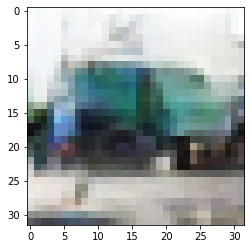

-> Epoch 437, Batch numero 1/78 -> Disc. loss on real images: 0.16509, Disc. loss on fake images: 0.14376, Generator loss: 3.84509
-> Epoch 437, Batch numero 2/78 -> Disc. loss on real images: 0.36207, Disc. loss on fake images: 0.13835, Generator loss: 3.08291
-> Epoch 437, Batch numero 3/78 -> Disc. loss on real images: 0.17752, Disc. loss on fake images: 0.41096, Generator loss: 3.41592
-> Epoch 437, Batch numero 4/78 -> Disc. loss on real images: 0.15738, Disc. loss on fake images: 0.10558, Generator loss: 3.97844
-> Epoch 437, Batch numero 5/78 -> Disc. loss on real images: 0.36298, Disc. loss on fake images: 0.39976, Generator loss: 3.81753
-> Epoch 437, Batch numero 6/78 -> Disc. loss on real images: 0.15871, Disc. loss on fake images: 0.27053, Generator loss: 3.64674
-> Epoch 437, Batch numero 7/78 -> Disc. loss on real images: 0.22294, Disc. loss on fake images: 0.21748, Generator loss: 3.79466
-> Epoch 437, Batch numero 8/78 -> Disc. loss on real images: 0.23452, Disc. loss o

-> Epoch 437, Batch numero 64/78 -> Disc. loss on real images: 0.14567, Disc. loss on fake images: 0.25222, Generator loss: 3.51763
-> Epoch 437, Batch numero 65/78 -> Disc. loss on real images: 0.22842, Disc. loss on fake images: 0.07724, Generator loss: 3.22040
-> Epoch 437, Batch numero 66/78 -> Disc. loss on real images: 0.10902, Disc. loss on fake images: 0.30047, Generator loss: 3.66682
-> Epoch 437, Batch numero 67/78 -> Disc. loss on real images: 0.21326, Disc. loss on fake images: 0.18472, Generator loss: 3.04723
-> Epoch 437, Batch numero 68/78 -> Disc. loss on real images: 0.12445, Disc. loss on fake images: 0.26450, Generator loss: 3.55893
-> Epoch 437, Batch numero 69/78 -> Disc. loss on real images: 0.20721, Disc. loss on fake images: 0.22986, Generator loss: 3.92338
-> Epoch 437, Batch numero 70/78 -> Disc. loss on real images: 0.25313, Disc. loss on fake images: 0.26122, Generator loss: 3.67458
-> Epoch 437, Batch numero 71/78 -> Disc. loss on real images: 0.22540, Disc

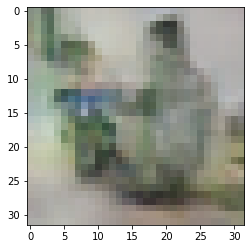

-> Epoch 438, Batch numero 1/78 -> Disc. loss on real images: 0.18371, Disc. loss on fake images: 0.24994, Generator loss: 3.54621
-> Epoch 438, Batch numero 2/78 -> Disc. loss on real images: 0.10942, Disc. loss on fake images: 0.19779, Generator loss: 4.03282
-> Epoch 438, Batch numero 3/78 -> Disc. loss on real images: 0.28869, Disc. loss on fake images: 0.12270, Generator loss: 3.98757
-> Epoch 438, Batch numero 4/78 -> Disc. loss on real images: 0.30741, Disc. loss on fake images: 0.28943, Generator loss: 2.96547
-> Epoch 438, Batch numero 5/78 -> Disc. loss on real images: 0.16852, Disc. loss on fake images: 0.30007, Generator loss: 3.70166
-> Epoch 438, Batch numero 6/78 -> Disc. loss on real images: 0.12287, Disc. loss on fake images: 0.28115, Generator loss: 3.71414
-> Epoch 438, Batch numero 7/78 -> Disc. loss on real images: 0.10544, Disc. loss on fake images: 0.21573, Generator loss: 4.24361
-> Epoch 438, Batch numero 8/78 -> Disc. loss on real images: 0.35106, Disc. loss o

-> Epoch 438, Batch numero 64/78 -> Disc. loss on real images: 0.25646, Disc. loss on fake images: 0.19710, Generator loss: 3.66865
-> Epoch 438, Batch numero 65/78 -> Disc. loss on real images: 0.36744, Disc. loss on fake images: 0.47532, Generator loss: 3.97779
-> Epoch 438, Batch numero 66/78 -> Disc. loss on real images: 0.21696, Disc. loss on fake images: 0.13511, Generator loss: 4.20774
-> Epoch 438, Batch numero 67/78 -> Disc. loss on real images: 0.50316, Disc. loss on fake images: 0.30567, Generator loss: 3.80028
-> Epoch 438, Batch numero 68/78 -> Disc. loss on real images: 0.23362, Disc. loss on fake images: 0.30659, Generator loss: 3.63123
-> Epoch 438, Batch numero 69/78 -> Disc. loss on real images: 0.14783, Disc. loss on fake images: 0.20700, Generator loss: 3.61217
-> Epoch 438, Batch numero 70/78 -> Disc. loss on real images: 0.13914, Disc. loss on fake images: 0.10328, Generator loss: 3.67774
-> Epoch 438, Batch numero 71/78 -> Disc. loss on real images: 0.17978, Disc

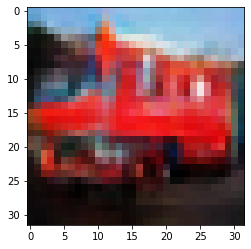

-> Epoch 439, Batch numero 1/78 -> Disc. loss on real images: 0.01929, Disc. loss on fake images: 0.23573, Generator loss: 3.56578
-> Epoch 439, Batch numero 2/78 -> Disc. loss on real images: 0.16442, Disc. loss on fake images: 0.06896, Generator loss: 3.73159
-> Epoch 439, Batch numero 3/78 -> Disc. loss on real images: 0.17438, Disc. loss on fake images: 0.25504, Generator loss: 3.46429
-> Epoch 439, Batch numero 4/78 -> Disc. loss on real images: 0.11700, Disc. loss on fake images: 0.30025, Generator loss: 3.59662
-> Epoch 439, Batch numero 5/78 -> Disc. loss on real images: 0.15684, Disc. loss on fake images: 0.16360, Generator loss: 3.53522
-> Epoch 439, Batch numero 6/78 -> Disc. loss on real images: 0.26783, Disc. loss on fake images: 0.22317, Generator loss: 3.74925
-> Epoch 439, Batch numero 7/78 -> Disc. loss on real images: 0.12506, Disc. loss on fake images: 0.22977, Generator loss: 3.92396
-> Epoch 439, Batch numero 8/78 -> Disc. loss on real images: 0.22722, Disc. loss o

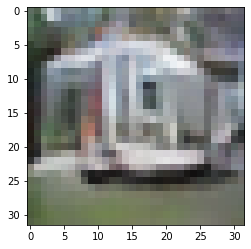

-> Epoch 440, Batch numero 1/78 -> Disc. loss on real images: 0.24018, Disc. loss on fake images: 0.08619, Generator loss: 3.57592
-> Epoch 440, Batch numero 2/78 -> Disc. loss on real images: 0.14984, Disc. loss on fake images: 0.24763, Generator loss: 3.92160
-> Epoch 440, Batch numero 3/78 -> Disc. loss on real images: 0.16426, Disc. loss on fake images: 0.13913, Generator loss: 3.15072
-> Epoch 440, Batch numero 4/78 -> Disc. loss on real images: 0.19378, Disc. loss on fake images: 0.20239, Generator loss: 3.56315
-> Epoch 440, Batch numero 5/78 -> Disc. loss on real images: 0.12182, Disc. loss on fake images: 0.26201, Generator loss: 4.39362
-> Epoch 440, Batch numero 6/78 -> Disc. loss on real images: 0.29979, Disc. loss on fake images: 0.28597, Generator loss: 3.29293
-> Epoch 440, Batch numero 7/78 -> Disc. loss on real images: 0.29067, Disc. loss on fake images: 0.24847, Generator loss: 4.22970
-> Epoch 440, Batch numero 8/78 -> Disc. loss on real images: 0.09085, Disc. loss o

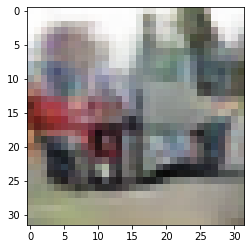

-> Epoch 441, Batch numero 1/78 -> Disc. loss on real images: 0.16694, Disc. loss on fake images: 0.17993, Generator loss: 4.41420
-> Epoch 441, Batch numero 2/78 -> Disc. loss on real images: 0.14382, Disc. loss on fake images: 0.15739, Generator loss: 3.94995
-> Epoch 441, Batch numero 3/78 -> Disc. loss on real images: 0.59430, Disc. loss on fake images: 0.43637, Generator loss: 3.97120
-> Epoch 441, Batch numero 4/78 -> Disc. loss on real images: 0.20493, Disc. loss on fake images: 0.15457, Generator loss: 3.18143
-> Epoch 441, Batch numero 5/78 -> Disc. loss on real images: 0.11068, Disc. loss on fake images: 0.20532, Generator loss: 4.39465
-> Epoch 441, Batch numero 6/78 -> Disc. loss on real images: 0.28713, Disc. loss on fake images: 0.19671, Generator loss: 3.84350
-> Epoch 441, Batch numero 7/78 -> Disc. loss on real images: 0.19113, Disc. loss on fake images: 0.09538, Generator loss: 3.55405
-> Epoch 441, Batch numero 8/78 -> Disc. loss on real images: 0.09555, Disc. loss o

-> Epoch 441, Batch numero 64/78 -> Disc. loss on real images: 0.22411, Disc. loss on fake images: 0.14786, Generator loss: 5.22347
-> Epoch 441, Batch numero 65/78 -> Disc. loss on real images: 0.36953, Disc. loss on fake images: 0.16436, Generator loss: 4.66640
-> Epoch 441, Batch numero 66/78 -> Disc. loss on real images: 0.19310, Disc. loss on fake images: 0.09459, Generator loss: 3.38170
-> Epoch 441, Batch numero 67/78 -> Disc. loss on real images: 0.11544, Disc. loss on fake images: 0.30772, Generator loss: 3.27138
-> Epoch 441, Batch numero 68/78 -> Disc. loss on real images: 0.05236, Disc. loss on fake images: 0.20746, Generator loss: 3.41370
-> Epoch 441, Batch numero 69/78 -> Disc. loss on real images: 0.17197, Disc. loss on fake images: 0.25782, Generator loss: 3.70917
-> Epoch 441, Batch numero 70/78 -> Disc. loss on real images: 0.38898, Disc. loss on fake images: 0.28993, Generator loss: 3.40988
-> Epoch 441, Batch numero 71/78 -> Disc. loss on real images: 0.22971, Disc

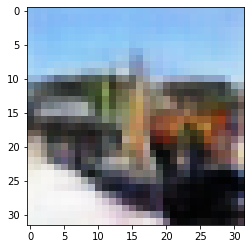

-> Epoch 442, Batch numero 1/78 -> Disc. loss on real images: 0.18516, Disc. loss on fake images: 0.20449, Generator loss: 3.43902
-> Epoch 442, Batch numero 2/78 -> Disc. loss on real images: 0.14835, Disc. loss on fake images: 0.14148, Generator loss: 3.79847
-> Epoch 442, Batch numero 3/78 -> Disc. loss on real images: 0.13221, Disc. loss on fake images: 0.12303, Generator loss: 3.36251
-> Epoch 442, Batch numero 4/78 -> Disc. loss on real images: 0.09129, Disc. loss on fake images: 0.23207, Generator loss: 4.19022
-> Epoch 442, Batch numero 5/78 -> Disc. loss on real images: 0.40593, Disc. loss on fake images: 0.21535, Generator loss: 3.61949
-> Epoch 442, Batch numero 6/78 -> Disc. loss on real images: 0.14526, Disc. loss on fake images: 0.12668, Generator loss: 3.14105
-> Epoch 442, Batch numero 7/78 -> Disc. loss on real images: 0.12891, Disc. loss on fake images: 0.32893, Generator loss: 3.05297
-> Epoch 442, Batch numero 8/78 -> Disc. loss on real images: 0.13384, Disc. loss o

-> Epoch 442, Batch numero 65/78 -> Disc. loss on real images: 0.11809, Disc. loss on fake images: 0.07657, Generator loss: 3.42704
-> Epoch 442, Batch numero 66/78 -> Disc. loss on real images: 0.14210, Disc. loss on fake images: 0.31503, Generator loss: 3.71083
-> Epoch 442, Batch numero 67/78 -> Disc. loss on real images: 0.20570, Disc. loss on fake images: 0.25917, Generator loss: 4.07949
-> Epoch 442, Batch numero 68/78 -> Disc. loss on real images: 0.22395, Disc. loss on fake images: 0.21733, Generator loss: 3.90333
-> Epoch 442, Batch numero 69/78 -> Disc. loss on real images: 0.27612, Disc. loss on fake images: 0.15263, Generator loss: 3.20511
-> Epoch 442, Batch numero 70/78 -> Disc. loss on real images: 0.27958, Disc. loss on fake images: 0.17587, Generator loss: 2.91215
-> Epoch 442, Batch numero 71/78 -> Disc. loss on real images: 0.10573, Disc. loss on fake images: 0.53219, Generator loss: 3.93325
-> Epoch 442, Batch numero 72/78 -> Disc. loss on real images: 0.39052, Disc

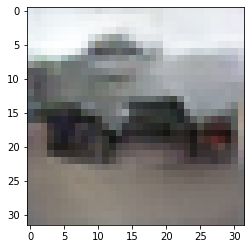

-> Epoch 443, Batch numero 1/78 -> Disc. loss on real images: 0.10138, Disc. loss on fake images: 0.07404, Generator loss: 4.39485
-> Epoch 443, Batch numero 2/78 -> Disc. loss on real images: 0.15787, Disc. loss on fake images: 0.06355, Generator loss: 3.69352
-> Epoch 443, Batch numero 3/78 -> Disc. loss on real images: 0.19153, Disc. loss on fake images: 0.21028, Generator loss: 4.25906
-> Epoch 443, Batch numero 4/78 -> Disc. loss on real images: 0.06909, Disc. loss on fake images: 0.15933, Generator loss: 3.99286
-> Epoch 443, Batch numero 5/78 -> Disc. loss on real images: 0.20832, Disc. loss on fake images: 0.12136, Generator loss: 3.62709
-> Epoch 443, Batch numero 6/78 -> Disc. loss on real images: 0.32647, Disc. loss on fake images: 0.32144, Generator loss: 4.24750
-> Epoch 443, Batch numero 7/78 -> Disc. loss on real images: 0.17534, Disc. loss on fake images: 0.11920, Generator loss: 4.18008
-> Epoch 443, Batch numero 8/78 -> Disc. loss on real images: 0.23554, Disc. loss o

-> Epoch 443, Batch numero 64/78 -> Disc. loss on real images: 0.32521, Disc. loss on fake images: 0.19222, Generator loss: 3.44060
-> Epoch 443, Batch numero 65/78 -> Disc. loss on real images: 0.11478, Disc. loss on fake images: 0.17942, Generator loss: 3.58411
-> Epoch 443, Batch numero 66/78 -> Disc. loss on real images: 0.11045, Disc. loss on fake images: 0.29453, Generator loss: 4.13073
-> Epoch 443, Batch numero 67/78 -> Disc. loss on real images: 0.37411, Disc. loss on fake images: 0.18587, Generator loss: 3.70036
-> Epoch 443, Batch numero 68/78 -> Disc. loss on real images: 0.08624, Disc. loss on fake images: 0.11139, Generator loss: 3.98305
-> Epoch 443, Batch numero 69/78 -> Disc. loss on real images: 0.22077, Disc. loss on fake images: 0.09587, Generator loss: 2.76325
-> Epoch 443, Batch numero 70/78 -> Disc. loss on real images: 0.13953, Disc. loss on fake images: 0.28582, Generator loss: 3.15324
-> Epoch 443, Batch numero 71/78 -> Disc. loss on real images: 0.15088, Disc

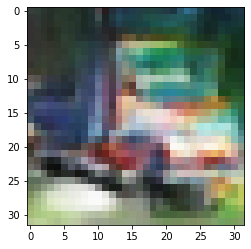

-> Epoch 444, Batch numero 1/78 -> Disc. loss on real images: 0.23691, Disc. loss on fake images: 0.47110, Generator loss: 4.02432
-> Epoch 444, Batch numero 2/78 -> Disc. loss on real images: 0.35207, Disc. loss on fake images: 0.23662, Generator loss: 3.36935
-> Epoch 444, Batch numero 3/78 -> Disc. loss on real images: 0.19928, Disc. loss on fake images: 0.22103, Generator loss: 3.80989
-> Epoch 444, Batch numero 4/78 -> Disc. loss on real images: 0.10669, Disc. loss on fake images: 0.34520, Generator loss: 3.83024
-> Epoch 444, Batch numero 5/78 -> Disc. loss on real images: 0.12556, Disc. loss on fake images: 0.08608, Generator loss: 4.11898
-> Epoch 444, Batch numero 6/78 -> Disc. loss on real images: 0.14344, Disc. loss on fake images: 0.30236, Generator loss: 4.00796
-> Epoch 444, Batch numero 7/78 -> Disc. loss on real images: 0.21603, Disc. loss on fake images: 0.22400, Generator loss: 3.52616
-> Epoch 444, Batch numero 8/78 -> Disc. loss on real images: 0.23423, Disc. loss o

-> Epoch 444, Batch numero 64/78 -> Disc. loss on real images: 0.23639, Disc. loss on fake images: 0.18232, Generator loss: 3.53755
-> Epoch 444, Batch numero 65/78 -> Disc. loss on real images: 0.17809, Disc. loss on fake images: 0.23018, Generator loss: 3.93173
-> Epoch 444, Batch numero 66/78 -> Disc. loss on real images: 0.25065, Disc. loss on fake images: 0.17806, Generator loss: 4.26768
-> Epoch 444, Batch numero 67/78 -> Disc. loss on real images: 0.11339, Disc. loss on fake images: 0.14242, Generator loss: 3.84162
-> Epoch 444, Batch numero 68/78 -> Disc. loss on real images: 0.28761, Disc. loss on fake images: 0.28644, Generator loss: 3.35486
-> Epoch 444, Batch numero 69/78 -> Disc. loss on real images: 0.08561, Disc. loss on fake images: 0.08295, Generator loss: 3.59416
-> Epoch 444, Batch numero 70/78 -> Disc. loss on real images: 0.09997, Disc. loss on fake images: 0.13732, Generator loss: 3.43841
-> Epoch 444, Batch numero 71/78 -> Disc. loss on real images: 0.21333, Disc

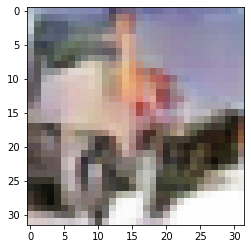

-> Epoch 445, Batch numero 1/78 -> Disc. loss on real images: 0.07974, Disc. loss on fake images: 0.18477, Generator loss: 3.88463
-> Epoch 445, Batch numero 2/78 -> Disc. loss on real images: 0.08587, Disc. loss on fake images: 0.15667, Generator loss: 3.68106
-> Epoch 445, Batch numero 3/78 -> Disc. loss on real images: 0.27702, Disc. loss on fake images: 0.06110, Generator loss: 3.43653
-> Epoch 445, Batch numero 4/78 -> Disc. loss on real images: 0.13682, Disc. loss on fake images: 0.19266, Generator loss: 3.28628
-> Epoch 445, Batch numero 5/78 -> Disc. loss on real images: 0.10803, Disc. loss on fake images: 0.16057, Generator loss: 3.37476
-> Epoch 445, Batch numero 6/78 -> Disc. loss on real images: 0.23021, Disc. loss on fake images: 0.32274, Generator loss: 3.52471
-> Epoch 445, Batch numero 7/78 -> Disc. loss on real images: 0.17214, Disc. loss on fake images: 0.16942, Generator loss: 4.02301
-> Epoch 445, Batch numero 8/78 -> Disc. loss on real images: 0.09948, Disc. loss o

-> Epoch 445, Batch numero 65/78 -> Disc. loss on real images: 0.20519, Disc. loss on fake images: 0.28929, Generator loss: 3.77448
-> Epoch 445, Batch numero 66/78 -> Disc. loss on real images: 0.09351, Disc. loss on fake images: 0.12859, Generator loss: 3.94035
-> Epoch 445, Batch numero 67/78 -> Disc. loss on real images: 0.27199, Disc. loss on fake images: 0.12228, Generator loss: 3.45373
-> Epoch 445, Batch numero 68/78 -> Disc. loss on real images: 0.19595, Disc. loss on fake images: 0.27406, Generator loss: 3.66055
-> Epoch 445, Batch numero 69/78 -> Disc. loss on real images: 0.21622, Disc. loss on fake images: 0.16642, Generator loss: 3.39437
-> Epoch 445, Batch numero 70/78 -> Disc. loss on real images: 0.20123, Disc. loss on fake images: 0.36658, Generator loss: 3.85605
-> Epoch 445, Batch numero 71/78 -> Disc. loss on real images: 0.19569, Disc. loss on fake images: 0.37736, Generator loss: 3.85718
-> Epoch 445, Batch numero 72/78 -> Disc. loss on real images: 0.35021, Disc

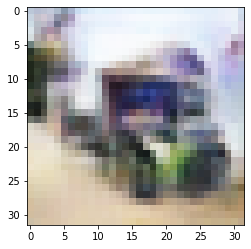

-> Epoch 446, Batch numero 1/78 -> Disc. loss on real images: 0.10936, Disc. loss on fake images: 0.11699, Generator loss: 3.77452
-> Epoch 446, Batch numero 2/78 -> Disc. loss on real images: 0.13299, Disc. loss on fake images: 0.15546, Generator loss: 3.97775
-> Epoch 446, Batch numero 3/78 -> Disc. loss on real images: 0.13383, Disc. loss on fake images: 0.22547, Generator loss: 4.54153
-> Epoch 446, Batch numero 4/78 -> Disc. loss on real images: 0.17602, Disc. loss on fake images: 0.10241, Generator loss: 4.16119
-> Epoch 446, Batch numero 5/78 -> Disc. loss on real images: 0.18361, Disc. loss on fake images: 0.14556, Generator loss: 3.92452
-> Epoch 446, Batch numero 6/78 -> Disc. loss on real images: 0.32873, Disc. loss on fake images: 0.47585, Generator loss: 3.66390
-> Epoch 446, Batch numero 7/78 -> Disc. loss on real images: 0.16629, Disc. loss on fake images: 0.14969, Generator loss: 3.62296
-> Epoch 446, Batch numero 8/78 -> Disc. loss on real images: 0.19777, Disc. loss o

-> Epoch 446, Batch numero 65/78 -> Disc. loss on real images: 0.21400, Disc. loss on fake images: 0.07038, Generator loss: 4.20016
-> Epoch 446, Batch numero 66/78 -> Disc. loss on real images: 0.19133, Disc. loss on fake images: 0.50936, Generator loss: 4.25010
-> Epoch 446, Batch numero 67/78 -> Disc. loss on real images: 0.27138, Disc. loss on fake images: 0.08200, Generator loss: 4.21574
-> Epoch 446, Batch numero 68/78 -> Disc. loss on real images: 0.27484, Disc. loss on fake images: 0.12355, Generator loss: 3.62174
-> Epoch 446, Batch numero 69/78 -> Disc. loss on real images: 0.29337, Disc. loss on fake images: 0.26737, Generator loss: 3.67860
-> Epoch 446, Batch numero 70/78 -> Disc. loss on real images: 0.18406, Disc. loss on fake images: 0.21161, Generator loss: 3.48999
-> Epoch 446, Batch numero 71/78 -> Disc. loss on real images: 0.11619, Disc. loss on fake images: 0.07636, Generator loss: 3.37691
-> Epoch 446, Batch numero 72/78 -> Disc. loss on real images: 0.07090, Disc

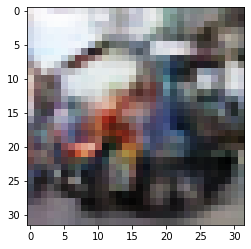

-> Epoch 447, Batch numero 1/78 -> Disc. loss on real images: 0.22565, Disc. loss on fake images: 0.23745, Generator loss: 3.72367
-> Epoch 447, Batch numero 2/78 -> Disc. loss on real images: 0.14779, Disc. loss on fake images: 0.29136, Generator loss: 4.09275
-> Epoch 447, Batch numero 3/78 -> Disc. loss on real images: 0.21316, Disc. loss on fake images: 0.07425, Generator loss: 3.72527
-> Epoch 447, Batch numero 4/78 -> Disc. loss on real images: 0.16880, Disc. loss on fake images: 0.35790, Generator loss: 3.39055
-> Epoch 447, Batch numero 5/78 -> Disc. loss on real images: 0.28776, Disc. loss on fake images: 0.15993, Generator loss: 3.78908
-> Epoch 447, Batch numero 6/78 -> Disc. loss on real images: 0.33464, Disc. loss on fake images: 0.37791, Generator loss: 3.45115
-> Epoch 447, Batch numero 7/78 -> Disc. loss on real images: 0.17331, Disc. loss on fake images: 0.25923, Generator loss: 3.60194
-> Epoch 447, Batch numero 8/78 -> Disc. loss on real images: 0.35964, Disc. loss o

-> Epoch 447, Batch numero 64/78 -> Disc. loss on real images: 0.11953, Disc. loss on fake images: 0.34574, Generator loss: 3.60481
-> Epoch 447, Batch numero 65/78 -> Disc. loss on real images: 0.10209, Disc. loss on fake images: 0.14112, Generator loss: 4.36932
-> Epoch 447, Batch numero 66/78 -> Disc. loss on real images: 0.23664, Disc. loss on fake images: 0.20067, Generator loss: 3.57932
-> Epoch 447, Batch numero 67/78 -> Disc. loss on real images: 0.18902, Disc. loss on fake images: 0.06051, Generator loss: 3.42728
-> Epoch 447, Batch numero 68/78 -> Disc. loss on real images: 0.17476, Disc. loss on fake images: 0.10766, Generator loss: 3.41501
-> Epoch 447, Batch numero 69/78 -> Disc. loss on real images: 0.05763, Disc. loss on fake images: 0.40083, Generator loss: 3.36142
-> Epoch 447, Batch numero 70/78 -> Disc. loss on real images: 0.16514, Disc. loss on fake images: 0.11831, Generator loss: 3.47569
-> Epoch 447, Batch numero 71/78 -> Disc. loss on real images: 0.21600, Disc

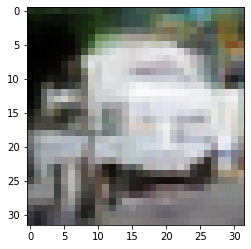

-> Epoch 448, Batch numero 1/78 -> Disc. loss on real images: 0.11962, Disc. loss on fake images: 0.19667, Generator loss: 3.44202
-> Epoch 448, Batch numero 2/78 -> Disc. loss on real images: 0.05317, Disc. loss on fake images: 0.19145, Generator loss: 3.73240
-> Epoch 448, Batch numero 3/78 -> Disc. loss on real images: 0.23160, Disc. loss on fake images: 0.09580, Generator loss: 3.72942
-> Epoch 448, Batch numero 4/78 -> Disc. loss on real images: 0.25615, Disc. loss on fake images: 0.41482, Generator loss: 3.87022
-> Epoch 448, Batch numero 5/78 -> Disc. loss on real images: 0.14001, Disc. loss on fake images: 0.16320, Generator loss: 3.57753
-> Epoch 448, Batch numero 6/78 -> Disc. loss on real images: 0.30526, Disc. loss on fake images: 0.18126, Generator loss: 4.26469
-> Epoch 448, Batch numero 7/78 -> Disc. loss on real images: 0.13562, Disc. loss on fake images: 0.26435, Generator loss: 3.72048
-> Epoch 448, Batch numero 8/78 -> Disc. loss on real images: 0.16565, Disc. loss o

-> Epoch 448, Batch numero 64/78 -> Disc. loss on real images: 0.20918, Disc. loss on fake images: 0.21697, Generator loss: 3.66121
-> Epoch 448, Batch numero 65/78 -> Disc. loss on real images: 0.15883, Disc. loss on fake images: 0.29357, Generator loss: 3.31380
-> Epoch 448, Batch numero 66/78 -> Disc. loss on real images: 0.24377, Disc. loss on fake images: 0.20965, Generator loss: 4.19097
-> Epoch 448, Batch numero 67/78 -> Disc. loss on real images: 0.19958, Disc. loss on fake images: 0.16401, Generator loss: 3.81989
-> Epoch 448, Batch numero 68/78 -> Disc. loss on real images: 0.13484, Disc. loss on fake images: 0.18091, Generator loss: 3.87218
-> Epoch 448, Batch numero 69/78 -> Disc. loss on real images: 0.20663, Disc. loss on fake images: 0.24730, Generator loss: 3.82135
-> Epoch 448, Batch numero 70/78 -> Disc. loss on real images: 0.07120, Disc. loss on fake images: 0.13397, Generator loss: 4.16162
-> Epoch 448, Batch numero 71/78 -> Disc. loss on real images: 0.16115, Disc

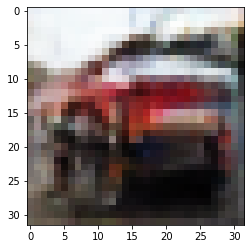

-> Epoch 449, Batch numero 1/78 -> Disc. loss on real images: 0.15939, Disc. loss on fake images: 0.34479, Generator loss: 4.16339
-> Epoch 449, Batch numero 2/78 -> Disc. loss on real images: 0.14143, Disc. loss on fake images: 0.06886, Generator loss: 3.70787
-> Epoch 449, Batch numero 3/78 -> Disc. loss on real images: 0.16848, Disc. loss on fake images: 0.18977, Generator loss: 3.71639
-> Epoch 449, Batch numero 4/78 -> Disc. loss on real images: 0.19480, Disc. loss on fake images: 0.19677, Generator loss: 3.86919
-> Epoch 449, Batch numero 5/78 -> Disc. loss on real images: 0.17053, Disc. loss on fake images: 0.06841, Generator loss: 3.56059
-> Epoch 449, Batch numero 6/78 -> Disc. loss on real images: 0.11281, Disc. loss on fake images: 0.30285, Generator loss: 3.05627
-> Epoch 449, Batch numero 7/78 -> Disc. loss on real images: 0.11364, Disc. loss on fake images: 0.08905, Generator loss: 3.68908
-> Epoch 449, Batch numero 8/78 -> Disc. loss on real images: 0.11058, Disc. loss o

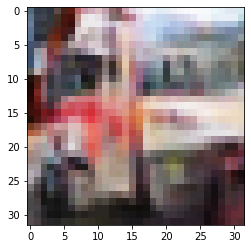

-> Epoch 450, Batch numero 1/78 -> Disc. loss on real images: 0.20742, Disc. loss on fake images: 0.14947, Generator loss: 3.73170
-> Epoch 450, Batch numero 2/78 -> Disc. loss on real images: 0.26062, Disc. loss on fake images: 0.11490, Generator loss: 3.43607
-> Epoch 450, Batch numero 3/78 -> Disc. loss on real images: 0.30483, Disc. loss on fake images: 0.48660, Generator loss: 3.66291
-> Epoch 450, Batch numero 4/78 -> Disc. loss on real images: 0.10190, Disc. loss on fake images: 0.40873, Generator loss: 3.82337
-> Epoch 450, Batch numero 5/78 -> Disc. loss on real images: 0.14007, Disc. loss on fake images: 0.13259, Generator loss: 4.24349
-> Epoch 450, Batch numero 6/78 -> Disc. loss on real images: 0.21649, Disc. loss on fake images: 0.10705, Generator loss: 3.73323
-> Epoch 450, Batch numero 7/78 -> Disc. loss on real images: 0.11188, Disc. loss on fake images: 0.15245, Generator loss: 3.50961
-> Epoch 450, Batch numero 8/78 -> Disc. loss on real images: 0.21566, Disc. loss o

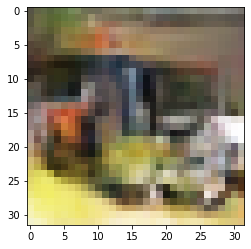

-> Epoch 451, Batch numero 1/78 -> Disc. loss on real images: 0.15100, Disc. loss on fake images: 0.12653, Generator loss: 3.17584
-> Epoch 451, Batch numero 2/78 -> Disc. loss on real images: 0.14846, Disc. loss on fake images: 0.20402, Generator loss: 3.30935
-> Epoch 451, Batch numero 3/78 -> Disc. loss on real images: 0.19453, Disc. loss on fake images: 0.45272, Generator loss: 3.82599
-> Epoch 451, Batch numero 4/78 -> Disc. loss on real images: 0.16687, Disc. loss on fake images: 0.14060, Generator loss: 3.69424
-> Epoch 451, Batch numero 5/78 -> Disc. loss on real images: 0.31282, Disc. loss on fake images: 0.14254, Generator loss: 3.83801
-> Epoch 451, Batch numero 6/78 -> Disc. loss on real images: 0.13966, Disc. loss on fake images: 0.21184, Generator loss: 3.78777
-> Epoch 451, Batch numero 7/78 -> Disc. loss on real images: 0.09199, Disc. loss on fake images: 0.10469, Generator loss: 3.40043
-> Epoch 451, Batch numero 8/78 -> Disc. loss on real images: 0.22421, Disc. loss o

-> Epoch 451, Batch numero 64/78 -> Disc. loss on real images: 0.17131, Disc. loss on fake images: 0.10694, Generator loss: 3.72056
-> Epoch 451, Batch numero 65/78 -> Disc. loss on real images: 0.18482, Disc. loss on fake images: 0.09925, Generator loss: 3.59861
-> Epoch 451, Batch numero 66/78 -> Disc. loss on real images: 0.09020, Disc. loss on fake images: 0.45637, Generator loss: 4.44102
-> Epoch 451, Batch numero 67/78 -> Disc. loss on real images: 0.12877, Disc. loss on fake images: 0.20872, Generator loss: 4.51795
-> Epoch 451, Batch numero 68/78 -> Disc. loss on real images: 0.26647, Disc. loss on fake images: 0.13893, Generator loss: 4.03870
-> Epoch 451, Batch numero 69/78 -> Disc. loss on real images: 0.40932, Disc. loss on fake images: 0.33986, Generator loss: 3.72178
-> Epoch 451, Batch numero 70/78 -> Disc. loss on real images: 0.14038, Disc. loss on fake images: 0.10112, Generator loss: 3.58386
-> Epoch 451, Batch numero 71/78 -> Disc. loss on real images: 0.22726, Disc

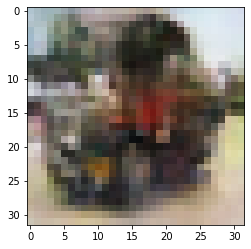

-> Epoch 452, Batch numero 1/78 -> Disc. loss on real images: 0.13248, Disc. loss on fake images: 0.16329, Generator loss: 3.72419
-> Epoch 452, Batch numero 2/78 -> Disc. loss on real images: 0.27304, Disc. loss on fake images: 0.27096, Generator loss: 3.68905
-> Epoch 452, Batch numero 3/78 -> Disc. loss on real images: 0.26969, Disc. loss on fake images: 0.09279, Generator loss: 3.54625
-> Epoch 452, Batch numero 4/78 -> Disc. loss on real images: 0.16108, Disc. loss on fake images: 0.24585, Generator loss: 3.84720
-> Epoch 452, Batch numero 5/78 -> Disc. loss on real images: 0.18093, Disc. loss on fake images: 0.43464, Generator loss: 3.78832
-> Epoch 452, Batch numero 6/78 -> Disc. loss on real images: 0.16716, Disc. loss on fake images: 0.22307, Generator loss: 3.83306
-> Epoch 452, Batch numero 7/78 -> Disc. loss on real images: 0.21269, Disc. loss on fake images: 0.19963, Generator loss: 3.69472
-> Epoch 452, Batch numero 8/78 -> Disc. loss on real images: 0.29844, Disc. loss o

-> Epoch 452, Batch numero 64/78 -> Disc. loss on real images: 0.12005, Disc. loss on fake images: 0.40507, Generator loss: 4.40246
-> Epoch 452, Batch numero 65/78 -> Disc. loss on real images: 0.11351, Disc. loss on fake images: 0.11461, Generator loss: 3.91445
-> Epoch 452, Batch numero 66/78 -> Disc. loss on real images: 0.38077, Disc. loss on fake images: 0.16319, Generator loss: 3.76198
-> Epoch 452, Batch numero 67/78 -> Disc. loss on real images: 0.20878, Disc. loss on fake images: 0.21032, Generator loss: 3.47934
-> Epoch 452, Batch numero 68/78 -> Disc. loss on real images: 0.15493, Disc. loss on fake images: 0.10643, Generator loss: 3.26850
-> Epoch 452, Batch numero 69/78 -> Disc. loss on real images: 0.09621, Disc. loss on fake images: 0.67996, Generator loss: 3.86323
-> Epoch 452, Batch numero 70/78 -> Disc. loss on real images: 0.29590, Disc. loss on fake images: 0.23337, Generator loss: 3.83814
-> Epoch 452, Batch numero 71/78 -> Disc. loss on real images: 0.14274, Disc

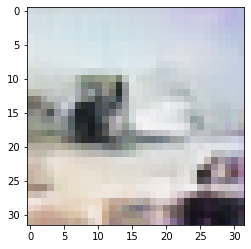

-> Epoch 453, Batch numero 1/78 -> Disc. loss on real images: 0.20382, Disc. loss on fake images: 0.27267, Generator loss: 3.98817
-> Epoch 453, Batch numero 2/78 -> Disc. loss on real images: 0.25736, Disc. loss on fake images: 0.17130, Generator loss: 3.43847
-> Epoch 453, Batch numero 3/78 -> Disc. loss on real images: 0.12532, Disc. loss on fake images: 0.59653, Generator loss: 3.85935
-> Epoch 453, Batch numero 4/78 -> Disc. loss on real images: 0.28066, Disc. loss on fake images: 0.15957, Generator loss: 4.85994
-> Epoch 453, Batch numero 5/78 -> Disc. loss on real images: 0.28074, Disc. loss on fake images: 0.09998, Generator loss: 3.91101
-> Epoch 453, Batch numero 6/78 -> Disc. loss on real images: 0.22602, Disc. loss on fake images: 0.16551, Generator loss: 3.83549
-> Epoch 453, Batch numero 7/78 -> Disc. loss on real images: 0.27348, Disc. loss on fake images: 0.21155, Generator loss: 2.84292
-> Epoch 453, Batch numero 8/78 -> Disc. loss on real images: 0.05899, Disc. loss o

-> Epoch 453, Batch numero 64/78 -> Disc. loss on real images: 0.18132, Disc. loss on fake images: 0.08270, Generator loss: 3.62635
-> Epoch 453, Batch numero 65/78 -> Disc. loss on real images: 0.33239, Disc. loss on fake images: 0.29760, Generator loss: 2.99771
-> Epoch 453, Batch numero 66/78 -> Disc. loss on real images: 0.08285, Disc. loss on fake images: 0.22128, Generator loss: 3.58611
-> Epoch 453, Batch numero 67/78 -> Disc. loss on real images: 0.16363, Disc. loss on fake images: 0.04639, Generator loss: 3.76897
-> Epoch 453, Batch numero 68/78 -> Disc. loss on real images: 0.18356, Disc. loss on fake images: 0.47204, Generator loss: 3.59133
-> Epoch 453, Batch numero 69/78 -> Disc. loss on real images: 0.27640, Disc. loss on fake images: 0.27017, Generator loss: 3.73865
-> Epoch 453, Batch numero 70/78 -> Disc. loss on real images: 0.08350, Disc. loss on fake images: 0.17442, Generator loss: 4.09172
-> Epoch 453, Batch numero 71/78 -> Disc. loss on real images: 0.11521, Disc

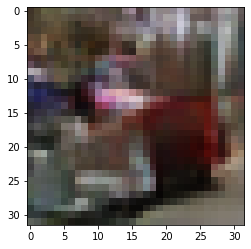

-> Epoch 454, Batch numero 1/78 -> Disc. loss on real images: 0.08501, Disc. loss on fake images: 0.20812, Generator loss: 4.57169
-> Epoch 454, Batch numero 2/78 -> Disc. loss on real images: 0.25488, Disc. loss on fake images: 0.12223, Generator loss: 4.09085
-> Epoch 454, Batch numero 3/78 -> Disc. loss on real images: 0.19057, Disc. loss on fake images: 0.24756, Generator loss: 3.52079
-> Epoch 454, Batch numero 4/78 -> Disc. loss on real images: 0.13988, Disc. loss on fake images: 0.23332, Generator loss: 3.56846
-> Epoch 454, Batch numero 5/78 -> Disc. loss on real images: 0.05835, Disc. loss on fake images: 0.11951, Generator loss: 3.73525
-> Epoch 454, Batch numero 6/78 -> Disc. loss on real images: 0.24352, Disc. loss on fake images: 0.10990, Generator loss: 3.33938
-> Epoch 454, Batch numero 7/78 -> Disc. loss on real images: 0.18250, Disc. loss on fake images: 0.09255, Generator loss: 3.26157
-> Epoch 454, Batch numero 8/78 -> Disc. loss on real images: 0.25027, Disc. loss o

-> Epoch 454, Batch numero 64/78 -> Disc. loss on real images: 0.33382, Disc. loss on fake images: 0.13143, Generator loss: 4.44099
-> Epoch 454, Batch numero 65/78 -> Disc. loss on real images: 0.12005, Disc. loss on fake images: 0.13274, Generator loss: 3.92493
-> Epoch 454, Batch numero 66/78 -> Disc. loss on real images: 0.23888, Disc. loss on fake images: 0.20728, Generator loss: 3.89895
-> Epoch 454, Batch numero 67/78 -> Disc. loss on real images: 0.13609, Disc. loss on fake images: 0.06279, Generator loss: 3.83512
-> Epoch 454, Batch numero 68/78 -> Disc. loss on real images: 0.15194, Disc. loss on fake images: 0.12104, Generator loss: 3.70757
-> Epoch 454, Batch numero 69/78 -> Disc. loss on real images: 0.09926, Disc. loss on fake images: 0.29353, Generator loss: 3.52795
-> Epoch 454, Batch numero 70/78 -> Disc. loss on real images: 0.11189, Disc. loss on fake images: 0.20290, Generator loss: 3.79628
-> Epoch 454, Batch numero 71/78 -> Disc. loss on real images: 0.25260, Disc

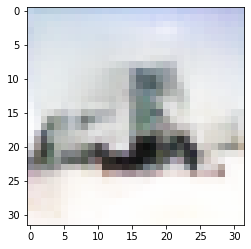

-> Epoch 455, Batch numero 1/78 -> Disc. loss on real images: 0.10519, Disc. loss on fake images: 0.21385, Generator loss: 3.89384
-> Epoch 455, Batch numero 2/78 -> Disc. loss on real images: 0.28406, Disc. loss on fake images: 0.17420, Generator loss: 4.16546
-> Epoch 455, Batch numero 3/78 -> Disc. loss on real images: 0.18781, Disc. loss on fake images: 0.15545, Generator loss: 3.99072
-> Epoch 455, Batch numero 4/78 -> Disc. loss on real images: 0.16312, Disc. loss on fake images: 0.20676, Generator loss: 3.92635
-> Epoch 455, Batch numero 5/78 -> Disc. loss on real images: 0.10419, Disc. loss on fake images: 0.16032, Generator loss: 3.90608
-> Epoch 455, Batch numero 6/78 -> Disc. loss on real images: 0.18316, Disc. loss on fake images: 0.09331, Generator loss: 4.06535
-> Epoch 455, Batch numero 7/78 -> Disc. loss on real images: 0.20290, Disc. loss on fake images: 0.22795, Generator loss: 3.91302
-> Epoch 455, Batch numero 8/78 -> Disc. loss on real images: 0.23864, Disc. loss o

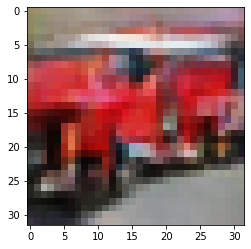

-> Epoch 456, Batch numero 1/78 -> Disc. loss on real images: 0.18109, Disc. loss on fake images: 0.13002, Generator loss: 3.84024
-> Epoch 456, Batch numero 2/78 -> Disc. loss on real images: 0.31558, Disc. loss on fake images: 0.21614, Generator loss: 3.11677
-> Epoch 456, Batch numero 3/78 -> Disc. loss on real images: 0.14159, Disc. loss on fake images: 0.30997, Generator loss: 3.75054
-> Epoch 456, Batch numero 4/78 -> Disc. loss on real images: 0.10591, Disc. loss on fake images: 0.08845, Generator loss: 4.10441
-> Epoch 456, Batch numero 5/78 -> Disc. loss on real images: 0.14204, Disc. loss on fake images: 0.56629, Generator loss: 3.90567
-> Epoch 456, Batch numero 6/78 -> Disc. loss on real images: 0.53787, Disc. loss on fake images: 0.18045, Generator loss: 3.22813
-> Epoch 456, Batch numero 7/78 -> Disc. loss on real images: 0.14860, Disc. loss on fake images: 0.24645, Generator loss: 3.84839
-> Epoch 456, Batch numero 8/78 -> Disc. loss on real images: 0.17225, Disc. loss o

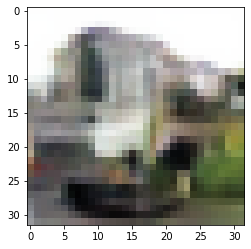

-> Epoch 457, Batch numero 1/78 -> Disc. loss on real images: 0.39780, Disc. loss on fake images: 0.17304, Generator loss: 3.37348
-> Epoch 457, Batch numero 2/78 -> Disc. loss on real images: 0.03624, Disc. loss on fake images: 0.41200, Generator loss: 4.34499
-> Epoch 457, Batch numero 3/78 -> Disc. loss on real images: 0.20691, Disc. loss on fake images: 0.10450, Generator loss: 4.30978
-> Epoch 457, Batch numero 4/78 -> Disc. loss on real images: 0.26933, Disc. loss on fake images: 0.12355, Generator loss: 3.88636
-> Epoch 457, Batch numero 5/78 -> Disc. loss on real images: 0.17055, Disc. loss on fake images: 0.26180, Generator loss: 3.98064
-> Epoch 457, Batch numero 6/78 -> Disc. loss on real images: 0.08634, Disc. loss on fake images: 0.20350, Generator loss: 3.73570
-> Epoch 457, Batch numero 7/78 -> Disc. loss on real images: 0.22979, Disc. loss on fake images: 0.17010, Generator loss: 4.00605
-> Epoch 457, Batch numero 8/78 -> Disc. loss on real images: 0.07799, Disc. loss o

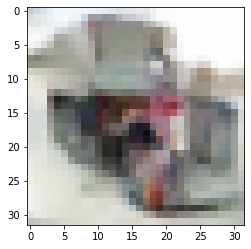

-> Epoch 458, Batch numero 1/78 -> Disc. loss on real images: 0.14884, Disc. loss on fake images: 0.11944, Generator loss: 3.54656
-> Epoch 458, Batch numero 2/78 -> Disc. loss on real images: 0.27070, Disc. loss on fake images: 0.19154, Generator loss: 3.59110
-> Epoch 458, Batch numero 3/78 -> Disc. loss on real images: 0.13809, Disc. loss on fake images: 0.18689, Generator loss: 3.64934
-> Epoch 458, Batch numero 4/78 -> Disc. loss on real images: 0.04420, Disc. loss on fake images: 0.39224, Generator loss: 3.95373
-> Epoch 458, Batch numero 5/78 -> Disc. loss on real images: 0.19580, Disc. loss on fake images: 0.13387, Generator loss: 4.37757
-> Epoch 458, Batch numero 6/78 -> Disc. loss on real images: 0.27320, Disc. loss on fake images: 0.48538, Generator loss: 4.15642
-> Epoch 458, Batch numero 7/78 -> Disc. loss on real images: 0.18017, Disc. loss on fake images: 0.14224, Generator loss: 4.43897
-> Epoch 458, Batch numero 8/78 -> Disc. loss on real images: 0.18864, Disc. loss o

-> Epoch 458, Batch numero 64/78 -> Disc. loss on real images: 0.33161, Disc. loss on fake images: 0.16527, Generator loss: 3.57639
-> Epoch 458, Batch numero 65/78 -> Disc. loss on real images: 0.17732, Disc. loss on fake images: 0.20513, Generator loss: 3.99288
-> Epoch 458, Batch numero 66/78 -> Disc. loss on real images: 0.13616, Disc. loss on fake images: 0.29953, Generator loss: 3.71967
-> Epoch 458, Batch numero 67/78 -> Disc. loss on real images: 0.12505, Disc. loss on fake images: 0.09138, Generator loss: 4.19677
-> Epoch 458, Batch numero 68/78 -> Disc. loss on real images: 0.29932, Disc. loss on fake images: 0.42644, Generator loss: 3.42759
-> Epoch 458, Batch numero 69/78 -> Disc. loss on real images: 0.05038, Disc. loss on fake images: 0.24075, Generator loss: 4.15213
-> Epoch 458, Batch numero 70/78 -> Disc. loss on real images: 0.12496, Disc. loss on fake images: 0.12945, Generator loss: 3.67131
-> Epoch 458, Batch numero 71/78 -> Disc. loss on real images: 0.25246, Disc

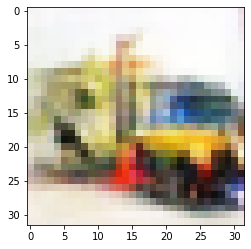

-> Epoch 459, Batch numero 1/78 -> Disc. loss on real images: 0.09091, Disc. loss on fake images: 0.16370, Generator loss: 4.41448
-> Epoch 459, Batch numero 2/78 -> Disc. loss on real images: 0.39204, Disc. loss on fake images: 0.20951, Generator loss: 3.65900
-> Epoch 459, Batch numero 3/78 -> Disc. loss on real images: 0.19069, Disc. loss on fake images: 0.20311, Generator loss: 4.05465
-> Epoch 459, Batch numero 4/78 -> Disc. loss on real images: 0.15478, Disc. loss on fake images: 0.38933, Generator loss: 3.86747
-> Epoch 459, Batch numero 5/78 -> Disc. loss on real images: 0.18196, Disc. loss on fake images: 0.33952, Generator loss: 4.11143
-> Epoch 459, Batch numero 6/78 -> Disc. loss on real images: 0.22393, Disc. loss on fake images: 0.06116, Generator loss: 3.85742
-> Epoch 459, Batch numero 7/78 -> Disc. loss on real images: 0.11061, Disc. loss on fake images: 0.20843, Generator loss: 3.81866
-> Epoch 459, Batch numero 8/78 -> Disc. loss on real images: 0.26282, Disc. loss o

-> Epoch 459, Batch numero 64/78 -> Disc. loss on real images: 0.14764, Disc. loss on fake images: 0.20706, Generator loss: 4.34822
-> Epoch 459, Batch numero 65/78 -> Disc. loss on real images: 0.19444, Disc. loss on fake images: 0.21368, Generator loss: 3.44150
-> Epoch 459, Batch numero 66/78 -> Disc. loss on real images: 0.16505, Disc. loss on fake images: 0.28844, Generator loss: 3.68739
-> Epoch 459, Batch numero 67/78 -> Disc. loss on real images: 0.19224, Disc. loss on fake images: 0.27237, Generator loss: 3.57477
-> Epoch 459, Batch numero 68/78 -> Disc. loss on real images: 0.08739, Disc. loss on fake images: 0.20698, Generator loss: 3.90428
-> Epoch 459, Batch numero 69/78 -> Disc. loss on real images: 0.13097, Disc. loss on fake images: 0.07421, Generator loss: 3.49028
-> Epoch 459, Batch numero 70/78 -> Disc. loss on real images: 0.22923, Disc. loss on fake images: 0.47773, Generator loss: 3.68646
-> Epoch 459, Batch numero 71/78 -> Disc. loss on real images: 0.27764, Disc

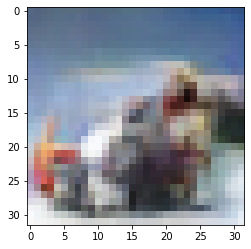

-> Epoch 460, Batch numero 1/78 -> Disc. loss on real images: 0.21464, Disc. loss on fake images: 0.35462, Generator loss: 4.31666
-> Epoch 460, Batch numero 2/78 -> Disc. loss on real images: 0.17490, Disc. loss on fake images: 0.10962, Generator loss: 4.21070
-> Epoch 460, Batch numero 3/78 -> Disc. loss on real images: 0.39728, Disc. loss on fake images: 0.12580, Generator loss: 3.88336
-> Epoch 460, Batch numero 4/78 -> Disc. loss on real images: 0.15983, Disc. loss on fake images: 0.28484, Generator loss: 3.95743
-> Epoch 460, Batch numero 5/78 -> Disc. loss on real images: 0.05834, Disc. loss on fake images: 0.23353, Generator loss: 3.80209
-> Epoch 460, Batch numero 6/78 -> Disc. loss on real images: 0.29148, Disc. loss on fake images: 0.15469, Generator loss: 3.70568
-> Epoch 460, Batch numero 7/78 -> Disc. loss on real images: 0.16884, Disc. loss on fake images: 0.13390, Generator loss: 3.68494
-> Epoch 460, Batch numero 8/78 -> Disc. loss on real images: 0.13926, Disc. loss o

-> Epoch 460, Batch numero 64/78 -> Disc. loss on real images: 0.17621, Disc. loss on fake images: 0.25434, Generator loss: 3.56164
-> Epoch 460, Batch numero 65/78 -> Disc. loss on real images: 0.11098, Disc. loss on fake images: 0.30053, Generator loss: 4.28759
-> Epoch 460, Batch numero 66/78 -> Disc. loss on real images: 0.16943, Disc. loss on fake images: 0.33812, Generator loss: 4.18649
-> Epoch 460, Batch numero 67/78 -> Disc. loss on real images: 0.29538, Disc. loss on fake images: 0.16108, Generator loss: 4.13291
-> Epoch 460, Batch numero 68/78 -> Disc. loss on real images: 0.18832, Disc. loss on fake images: 0.15860, Generator loss: 4.05046
-> Epoch 460, Batch numero 69/78 -> Disc. loss on real images: 0.17337, Disc. loss on fake images: 0.42238, Generator loss: 4.93078
-> Epoch 460, Batch numero 70/78 -> Disc. loss on real images: 0.33388, Disc. loss on fake images: 0.25671, Generator loss: 4.53670
-> Epoch 460, Batch numero 71/78 -> Disc. loss on real images: 0.32616, Disc

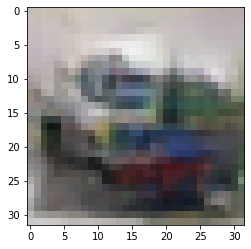

-> Epoch 461, Batch numero 1/78 -> Disc. loss on real images: 0.18626, Disc. loss on fake images: 0.21038, Generator loss: 3.76896
-> Epoch 461, Batch numero 2/78 -> Disc. loss on real images: 0.19187, Disc. loss on fake images: 0.17930, Generator loss: 3.59571
-> Epoch 461, Batch numero 3/78 -> Disc. loss on real images: 0.22914, Disc. loss on fake images: 0.19260, Generator loss: 3.63661
-> Epoch 461, Batch numero 4/78 -> Disc. loss on real images: 0.11055, Disc. loss on fake images: 0.24230, Generator loss: 3.50775
-> Epoch 461, Batch numero 5/78 -> Disc. loss on real images: 0.19086, Disc. loss on fake images: 0.15830, Generator loss: 3.89166
-> Epoch 461, Batch numero 6/78 -> Disc. loss on real images: 0.09191, Disc. loss on fake images: 0.11936, Generator loss: 4.52875
-> Epoch 461, Batch numero 7/78 -> Disc. loss on real images: 0.12350, Disc. loss on fake images: 0.21280, Generator loss: 4.44482
-> Epoch 461, Batch numero 8/78 -> Disc. loss on real images: 0.18045, Disc. loss o

-> Epoch 461, Batch numero 66/78 -> Disc. loss on real images: 0.16407, Disc. loss on fake images: 0.18035, Generator loss: 4.24748
-> Epoch 461, Batch numero 67/78 -> Disc. loss on real images: 0.39090, Disc. loss on fake images: 0.12694, Generator loss: 3.64278
-> Epoch 461, Batch numero 68/78 -> Disc. loss on real images: 0.03590, Disc. loss on fake images: 0.25360, Generator loss: 3.79055
-> Epoch 461, Batch numero 69/78 -> Disc. loss on real images: 0.27133, Disc. loss on fake images: 0.32837, Generator loss: 3.66251
-> Epoch 461, Batch numero 70/78 -> Disc. loss on real images: 0.10081, Disc. loss on fake images: 0.13646, Generator loss: 4.15653
-> Epoch 461, Batch numero 71/78 -> Disc. loss on real images: 0.35756, Disc. loss on fake images: 0.25424, Generator loss: 2.85813
-> Epoch 461, Batch numero 72/78 -> Disc. loss on real images: 0.09872, Disc. loss on fake images: 0.21020, Generator loss: 3.48860
-> Epoch 461, Batch numero 73/78 -> Disc. loss on real images: 0.18912, Disc

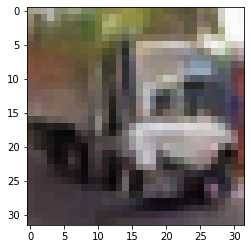

-> Epoch 462, Batch numero 1/78 -> Disc. loss on real images: 0.16582, Disc. loss on fake images: 0.28602, Generator loss: 3.98780
-> Epoch 462, Batch numero 2/78 -> Disc. loss on real images: 0.10081, Disc. loss on fake images: 0.14662, Generator loss: 4.37239
-> Epoch 462, Batch numero 3/78 -> Disc. loss on real images: 0.24715, Disc. loss on fake images: 0.08795, Generator loss: 3.27694
-> Epoch 462, Batch numero 4/78 -> Disc. loss on real images: 0.22207, Disc. loss on fake images: 0.31497, Generator loss: 3.25948
-> Epoch 462, Batch numero 5/78 -> Disc. loss on real images: 0.12035, Disc. loss on fake images: 0.34810, Generator loss: 3.49109
-> Epoch 462, Batch numero 6/78 -> Disc. loss on real images: 0.15287, Disc. loss on fake images: 0.10006, Generator loss: 3.95959
-> Epoch 462, Batch numero 7/78 -> Disc. loss on real images: 0.21904, Disc. loss on fake images: 0.10400, Generator loss: 3.85999
-> Epoch 462, Batch numero 8/78 -> Disc. loss on real images: 0.16876, Disc. loss o

-> Epoch 462, Batch numero 64/78 -> Disc. loss on real images: 0.09985, Disc. loss on fake images: 0.21262, Generator loss: 4.34236
-> Epoch 462, Batch numero 65/78 -> Disc. loss on real images: 0.47053, Disc. loss on fake images: 0.20072, Generator loss: 4.08663
-> Epoch 462, Batch numero 66/78 -> Disc. loss on real images: 0.12408, Disc. loss on fake images: 0.14231, Generator loss: 3.46531
-> Epoch 462, Batch numero 67/78 -> Disc. loss on real images: 0.11536, Disc. loss on fake images: 0.08135, Generator loss: 3.50216
-> Epoch 462, Batch numero 68/78 -> Disc. loss on real images: 0.09421, Disc. loss on fake images: 0.35352, Generator loss: 3.77891
-> Epoch 462, Batch numero 69/78 -> Disc. loss on real images: 0.19136, Disc. loss on fake images: 0.23525, Generator loss: 3.72871
-> Epoch 462, Batch numero 70/78 -> Disc. loss on real images: 0.27052, Disc. loss on fake images: 0.39609, Generator loss: 4.09185
-> Epoch 462, Batch numero 71/78 -> Disc. loss on real images: 0.26037, Disc

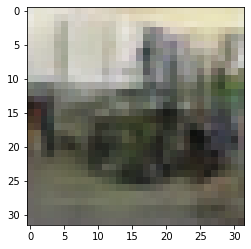

-> Epoch 463, Batch numero 1/78 -> Disc. loss on real images: 0.07458, Disc. loss on fake images: 0.16486, Generator loss: 3.69254
-> Epoch 463, Batch numero 2/78 -> Disc. loss on real images: 0.29894, Disc. loss on fake images: 0.35720, Generator loss: 3.95704
-> Epoch 463, Batch numero 3/78 -> Disc. loss on real images: 0.17113, Disc. loss on fake images: 0.06823, Generator loss: 3.58224
-> Epoch 463, Batch numero 4/78 -> Disc. loss on real images: 0.28224, Disc. loss on fake images: 0.08548, Generator loss: 3.72666
-> Epoch 463, Batch numero 5/78 -> Disc. loss on real images: 0.17264, Disc. loss on fake images: 0.36754, Generator loss: 3.42676
-> Epoch 463, Batch numero 6/78 -> Disc. loss on real images: 0.09624, Disc. loss on fake images: 0.16730, Generator loss: 3.86432
-> Epoch 463, Batch numero 7/78 -> Disc. loss on real images: 0.16250, Disc. loss on fake images: 0.30486, Generator loss: 4.01969
-> Epoch 463, Batch numero 8/78 -> Disc. loss on real images: 0.28011, Disc. loss o

-> Epoch 463, Batch numero 64/78 -> Disc. loss on real images: 0.29085, Disc. loss on fake images: 0.25250, Generator loss: 3.87716
-> Epoch 463, Batch numero 65/78 -> Disc. loss on real images: 0.27435, Disc. loss on fake images: 0.20240, Generator loss: 3.63589
-> Epoch 463, Batch numero 66/78 -> Disc. loss on real images: 0.20122, Disc. loss on fake images: 0.18834, Generator loss: 3.70439
-> Epoch 463, Batch numero 67/78 -> Disc. loss on real images: 0.19198, Disc. loss on fake images: 0.25064, Generator loss: 3.96899
-> Epoch 463, Batch numero 68/78 -> Disc. loss on real images: 0.15846, Disc. loss on fake images: 0.19881, Generator loss: 4.07026
-> Epoch 463, Batch numero 69/78 -> Disc. loss on real images: 0.36543, Disc. loss on fake images: 0.23559, Generator loss: 3.19659
-> Epoch 463, Batch numero 70/78 -> Disc. loss on real images: 0.22377, Disc. loss on fake images: 0.16230, Generator loss: 3.47802
-> Epoch 463, Batch numero 71/78 -> Disc. loss on real images: 0.09955, Disc

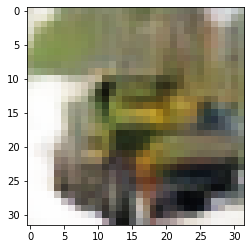

-> Epoch 464, Batch numero 1/78 -> Disc. loss on real images: 0.08578, Disc. loss on fake images: 0.13471, Generator loss: 4.16194
-> Epoch 464, Batch numero 2/78 -> Disc. loss on real images: 0.28396, Disc. loss on fake images: 0.06874, Generator loss: 3.69582
-> Epoch 464, Batch numero 3/78 -> Disc. loss on real images: 0.23391, Disc. loss on fake images: 0.09564, Generator loss: 4.17300
-> Epoch 464, Batch numero 4/78 -> Disc. loss on real images: 0.17025, Disc. loss on fake images: 0.26621, Generator loss: 3.64870
-> Epoch 464, Batch numero 5/78 -> Disc. loss on real images: 0.05526, Disc. loss on fake images: 0.10912, Generator loss: 3.80620
-> Epoch 464, Batch numero 6/78 -> Disc. loss on real images: 0.43116, Disc. loss on fake images: 0.16275, Generator loss: 3.29414
-> Epoch 464, Batch numero 7/78 -> Disc. loss on real images: 0.09184, Disc. loss on fake images: 0.44669, Generator loss: 3.87924
-> Epoch 464, Batch numero 8/78 -> Disc. loss on real images: 0.07879, Disc. loss o

-> Epoch 464, Batch numero 64/78 -> Disc. loss on real images: 0.26356, Disc. loss on fake images: 0.27878, Generator loss: 3.37437
-> Epoch 464, Batch numero 65/78 -> Disc. loss on real images: 0.18298, Disc. loss on fake images: 0.39560, Generator loss: 4.17599
-> Epoch 464, Batch numero 66/78 -> Disc. loss on real images: 0.23566, Disc. loss on fake images: 0.05932, Generator loss: 4.56886
-> Epoch 464, Batch numero 67/78 -> Disc. loss on real images: 0.23717, Disc. loss on fake images: 0.16747, Generator loss: 3.87520
-> Epoch 464, Batch numero 68/78 -> Disc. loss on real images: 0.40734, Disc. loss on fake images: 0.27743, Generator loss: 3.65709
-> Epoch 464, Batch numero 69/78 -> Disc. loss on real images: 0.20560, Disc. loss on fake images: 0.31158, Generator loss: 3.46847
-> Epoch 464, Batch numero 70/78 -> Disc. loss on real images: 0.20822, Disc. loss on fake images: 0.20825, Generator loss: 4.06310
-> Epoch 464, Batch numero 71/78 -> Disc. loss on real images: 0.12932, Disc

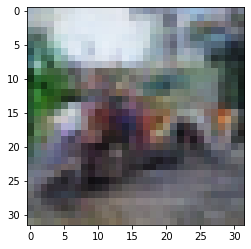

-> Epoch 465, Batch numero 1/78 -> Disc. loss on real images: 0.29780, Disc. loss on fake images: 0.09981, Generator loss: 3.80058
-> Epoch 465, Batch numero 2/78 -> Disc. loss on real images: 0.09699, Disc. loss on fake images: 0.13990, Generator loss: 4.23954
-> Epoch 465, Batch numero 3/78 -> Disc. loss on real images: 0.16184, Disc. loss on fake images: 0.11401, Generator loss: 3.65984
-> Epoch 465, Batch numero 4/78 -> Disc. loss on real images: 0.16264, Disc. loss on fake images: 0.19280, Generator loss: 3.82887
-> Epoch 465, Batch numero 5/78 -> Disc. loss on real images: 0.04339, Disc. loss on fake images: 0.17657, Generator loss: 4.00095
-> Epoch 465, Batch numero 6/78 -> Disc. loss on real images: 0.29748, Disc. loss on fake images: 0.29821, Generator loss: 4.44831
-> Epoch 465, Batch numero 7/78 -> Disc. loss on real images: 0.20113, Disc. loss on fake images: 0.12723, Generator loss: 4.43686
-> Epoch 465, Batch numero 8/78 -> Disc. loss on real images: 0.16621, Disc. loss o

-> Epoch 465, Batch numero 64/78 -> Disc. loss on real images: 0.05496, Disc. loss on fake images: 0.13373, Generator loss: 4.52663
-> Epoch 465, Batch numero 65/78 -> Disc. loss on real images: 0.27741, Disc. loss on fake images: 0.27767, Generator loss: 4.26920
-> Epoch 465, Batch numero 66/78 -> Disc. loss on real images: 0.29023, Disc. loss on fake images: 0.23737, Generator loss: 3.82936
-> Epoch 465, Batch numero 67/78 -> Disc. loss on real images: 0.23180, Disc. loss on fake images: 0.33382, Generator loss: 3.75779
-> Epoch 465, Batch numero 68/78 -> Disc. loss on real images: 0.14310, Disc. loss on fake images: 0.25280, Generator loss: 3.85309
-> Epoch 465, Batch numero 69/78 -> Disc. loss on real images: 0.25590, Disc. loss on fake images: 0.30449, Generator loss: 3.94017
-> Epoch 465, Batch numero 70/78 -> Disc. loss on real images: 0.12403, Disc. loss on fake images: 0.12339, Generator loss: 3.64953
-> Epoch 465, Batch numero 71/78 -> Disc. loss on real images: 0.19205, Disc

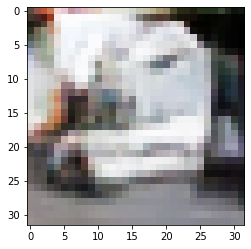

-> Epoch 466, Batch numero 1/78 -> Disc. loss on real images: 0.20108, Disc. loss on fake images: 0.28921, Generator loss: 4.39867
-> Epoch 466, Batch numero 2/78 -> Disc. loss on real images: 0.13456, Disc. loss on fake images: 0.19586, Generator loss: 4.05279
-> Epoch 466, Batch numero 3/78 -> Disc. loss on real images: 0.16827, Disc. loss on fake images: 0.21239, Generator loss: 4.07212
-> Epoch 466, Batch numero 4/78 -> Disc. loss on real images: 0.18696, Disc. loss on fake images: 0.24135, Generator loss: 3.58820
-> Epoch 466, Batch numero 5/78 -> Disc. loss on real images: 0.13970, Disc. loss on fake images: 0.35268, Generator loss: 3.91756
-> Epoch 466, Batch numero 6/78 -> Disc. loss on real images: 0.29251, Disc. loss on fake images: 0.18526, Generator loss: 3.50189
-> Epoch 466, Batch numero 7/78 -> Disc. loss on real images: 0.20991, Disc. loss on fake images: 0.28677, Generator loss: 4.05495
-> Epoch 466, Batch numero 8/78 -> Disc. loss on real images: 0.21706, Disc. loss o

-> Epoch 466, Batch numero 64/78 -> Disc. loss on real images: 0.31179, Disc. loss on fake images: 0.21127, Generator loss: 3.41397
-> Epoch 466, Batch numero 65/78 -> Disc. loss on real images: 0.13398, Disc. loss on fake images: 0.35410, Generator loss: 4.52746
-> Epoch 466, Batch numero 66/78 -> Disc. loss on real images: 0.10603, Disc. loss on fake images: 0.12481, Generator loss: 5.04956
-> Epoch 466, Batch numero 67/78 -> Disc. loss on real images: 0.14638, Disc. loss on fake images: 0.10051, Generator loss: 4.29047
-> Epoch 466, Batch numero 68/78 -> Disc. loss on real images: 0.40912, Disc. loss on fake images: 0.60185, Generator loss: 4.26265
-> Epoch 466, Batch numero 69/78 -> Disc. loss on real images: 0.24721, Disc. loss on fake images: 0.17144, Generator loss: 3.84053
-> Epoch 466, Batch numero 70/78 -> Disc. loss on real images: 0.35668, Disc. loss on fake images: 0.14848, Generator loss: 3.30109
-> Epoch 466, Batch numero 71/78 -> Disc. loss on real images: 0.19896, Disc

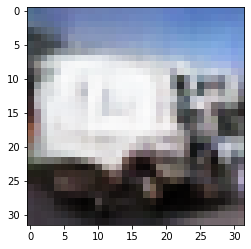

-> Epoch 467, Batch numero 1/78 -> Disc. loss on real images: 0.20840, Disc. loss on fake images: 0.22471, Generator loss: 4.62560
-> Epoch 467, Batch numero 2/78 -> Disc. loss on real images: 0.21922, Disc. loss on fake images: 0.12913, Generator loss: 4.40059
-> Epoch 467, Batch numero 3/78 -> Disc. loss on real images: 0.19291, Disc. loss on fake images: 0.16705, Generator loss: 3.61882
-> Epoch 467, Batch numero 4/78 -> Disc. loss on real images: 0.13831, Disc. loss on fake images: 0.09817, Generator loss: 3.60192
-> Epoch 467, Batch numero 5/78 -> Disc. loss on real images: 0.14439, Disc. loss on fake images: 0.40273, Generator loss: 4.18934
-> Epoch 467, Batch numero 6/78 -> Disc. loss on real images: 0.10548, Disc. loss on fake images: 0.13301, Generator loss: 3.90236
-> Epoch 467, Batch numero 7/78 -> Disc. loss on real images: 0.11650, Disc. loss on fake images: 0.10855, Generator loss: 4.34031
-> Epoch 467, Batch numero 8/78 -> Disc. loss on real images: 0.23211, Disc. loss o

-> Epoch 467, Batch numero 64/78 -> Disc. loss on real images: 0.19637, Disc. loss on fake images: 0.28418, Generator loss: 3.42095
-> Epoch 467, Batch numero 65/78 -> Disc. loss on real images: 0.17656, Disc. loss on fake images: 0.32043, Generator loss: 4.37142
-> Epoch 467, Batch numero 66/78 -> Disc. loss on real images: 0.35233, Disc. loss on fake images: 0.24147, Generator loss: 4.21569
-> Epoch 467, Batch numero 67/78 -> Disc. loss on real images: 0.25199, Disc. loss on fake images: 0.09548, Generator loss: 3.70963
-> Epoch 467, Batch numero 68/78 -> Disc. loss on real images: 0.07486, Disc. loss on fake images: 0.29616, Generator loss: 3.89664
-> Epoch 467, Batch numero 69/78 -> Disc. loss on real images: 0.17810, Disc. loss on fake images: 0.11665, Generator loss: 4.29458
-> Epoch 467, Batch numero 70/78 -> Disc. loss on real images: 0.25835, Disc. loss on fake images: 0.23895, Generator loss: 3.90974
-> Epoch 467, Batch numero 71/78 -> Disc. loss on real images: 0.17767, Disc

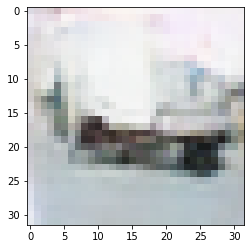

-> Epoch 468, Batch numero 1/78 -> Disc. loss on real images: 0.23787, Disc. loss on fake images: 0.11637, Generator loss: 3.61659
-> Epoch 468, Batch numero 2/78 -> Disc. loss on real images: 0.13823, Disc. loss on fake images: 0.07359, Generator loss: 3.69948
-> Epoch 468, Batch numero 3/78 -> Disc. loss on real images: 0.17071, Disc. loss on fake images: 0.24632, Generator loss: 3.63655
-> Epoch 468, Batch numero 4/78 -> Disc. loss on real images: 0.22560, Disc. loss on fake images: 0.12559, Generator loss: 3.50476
-> Epoch 468, Batch numero 5/78 -> Disc. loss on real images: 0.12077, Disc. loss on fake images: 0.27727, Generator loss: 3.62726
-> Epoch 468, Batch numero 6/78 -> Disc. loss on real images: 0.16943, Disc. loss on fake images: 0.11426, Generator loss: 3.51124
-> Epoch 468, Batch numero 7/78 -> Disc. loss on real images: 0.11285, Disc. loss on fake images: 0.07466, Generator loss: 3.70500
-> Epoch 468, Batch numero 8/78 -> Disc. loss on real images: 0.10547, Disc. loss o

-> Epoch 468, Batch numero 64/78 -> Disc. loss on real images: 0.12102, Disc. loss on fake images: 0.09370, Generator loss: 4.34933
-> Epoch 468, Batch numero 65/78 -> Disc. loss on real images: 0.17677, Disc. loss on fake images: 0.20734, Generator loss: 4.13197
-> Epoch 468, Batch numero 66/78 -> Disc. loss on real images: 0.14988, Disc. loss on fake images: 0.25430, Generator loss: 3.49007
-> Epoch 468, Batch numero 67/78 -> Disc. loss on real images: 0.17651, Disc. loss on fake images: 0.07388, Generator loss: 3.94292
-> Epoch 468, Batch numero 68/78 -> Disc. loss on real images: 0.14585, Disc. loss on fake images: 0.53055, Generator loss: 4.54428
-> Epoch 468, Batch numero 69/78 -> Disc. loss on real images: 0.28334, Disc. loss on fake images: 0.20333, Generator loss: 4.38191
-> Epoch 468, Batch numero 70/78 -> Disc. loss on real images: 0.33214, Disc. loss on fake images: 0.08056, Generator loss: 3.46628
-> Epoch 468, Batch numero 71/78 -> Disc. loss on real images: 0.06634, Disc

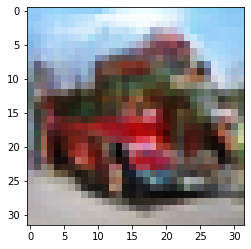

-> Epoch 469, Batch numero 1/78 -> Disc. loss on real images: 0.14126, Disc. loss on fake images: 0.28480, Generator loss: 3.92248
-> Epoch 469, Batch numero 2/78 -> Disc. loss on real images: 0.07136, Disc. loss on fake images: 0.21395, Generator loss: 4.28006
-> Epoch 469, Batch numero 3/78 -> Disc. loss on real images: 0.21016, Disc. loss on fake images: 0.14673, Generator loss: 4.16869
-> Epoch 469, Batch numero 4/78 -> Disc. loss on real images: 0.14878, Disc. loss on fake images: 0.17675, Generator loss: 4.31731
-> Epoch 469, Batch numero 5/78 -> Disc. loss on real images: 0.22968, Disc. loss on fake images: 0.15515, Generator loss: 4.25006
-> Epoch 469, Batch numero 6/78 -> Disc. loss on real images: 0.08909, Disc. loss on fake images: 0.18134, Generator loss: 3.91333
-> Epoch 469, Batch numero 7/78 -> Disc. loss on real images: 0.28922, Disc. loss on fake images: 0.08974, Generator loss: 3.12347
-> Epoch 469, Batch numero 8/78 -> Disc. loss on real images: 0.07004, Disc. loss o

-> Epoch 469, Batch numero 64/78 -> Disc. loss on real images: 0.21686, Disc. loss on fake images: 0.16242, Generator loss: 3.58675
-> Epoch 469, Batch numero 65/78 -> Disc. loss on real images: 0.11812, Disc. loss on fake images: 0.23642, Generator loss: 3.84319
-> Epoch 469, Batch numero 66/78 -> Disc. loss on real images: 0.11009, Disc. loss on fake images: 0.16446, Generator loss: 3.43041
-> Epoch 469, Batch numero 67/78 -> Disc. loss on real images: 0.19345, Disc. loss on fake images: 0.25827, Generator loss: 3.99252
-> Epoch 469, Batch numero 68/78 -> Disc. loss on real images: 0.14096, Disc. loss on fake images: 0.12716, Generator loss: 4.28843
-> Epoch 469, Batch numero 69/78 -> Disc. loss on real images: 0.13222, Disc. loss on fake images: 0.24602, Generator loss: 4.37461
-> Epoch 469, Batch numero 70/78 -> Disc. loss on real images: 0.28741, Disc. loss on fake images: 0.31495, Generator loss: 4.20291
-> Epoch 469, Batch numero 71/78 -> Disc. loss on real images: 0.27611, Disc

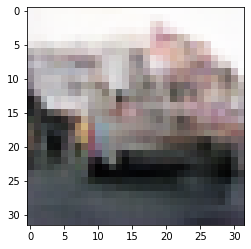

-> Epoch 470, Batch numero 1/78 -> Disc. loss on real images: 0.17934, Disc. loss on fake images: 0.13843, Generator loss: 3.93083
-> Epoch 470, Batch numero 2/78 -> Disc. loss on real images: 0.13092, Disc. loss on fake images: 0.27978, Generator loss: 4.04425
-> Epoch 470, Batch numero 3/78 -> Disc. loss on real images: 0.11502, Disc. loss on fake images: 0.17514, Generator loss: 4.27197
-> Epoch 470, Batch numero 4/78 -> Disc. loss on real images: 0.15821, Disc. loss on fake images: 0.14346, Generator loss: 3.98774
-> Epoch 470, Batch numero 5/78 -> Disc. loss on real images: 0.16594, Disc. loss on fake images: 0.32629, Generator loss: 4.25108
-> Epoch 470, Batch numero 6/78 -> Disc. loss on real images: 0.28556, Disc. loss on fake images: 0.14927, Generator loss: 4.00944
-> Epoch 470, Batch numero 7/78 -> Disc. loss on real images: 0.12931, Disc. loss on fake images: 0.18636, Generator loss: 4.07923
-> Epoch 470, Batch numero 8/78 -> Disc. loss on real images: 0.15711, Disc. loss o

-> Epoch 470, Batch numero 64/78 -> Disc. loss on real images: 0.34158, Disc. loss on fake images: 0.11648, Generator loss: 3.39527
-> Epoch 470, Batch numero 65/78 -> Disc. loss on real images: 0.10837, Disc. loss on fake images: 0.34788, Generator loss: 3.23793
-> Epoch 470, Batch numero 66/78 -> Disc. loss on real images: 0.04803, Disc. loss on fake images: 0.07978, Generator loss: 4.04975
-> Epoch 470, Batch numero 67/78 -> Disc. loss on real images: 0.18518, Disc. loss on fake images: 0.30573, Generator loss: 4.36446
-> Epoch 470, Batch numero 68/78 -> Disc. loss on real images: 0.41123, Disc. loss on fake images: 0.11815, Generator loss: 3.46088
-> Epoch 470, Batch numero 69/78 -> Disc. loss on real images: 0.12190, Disc. loss on fake images: 0.33981, Generator loss: 3.30329
-> Epoch 470, Batch numero 70/78 -> Disc. loss on real images: 0.13288, Disc. loss on fake images: 0.21819, Generator loss: 4.41887
-> Epoch 470, Batch numero 71/78 -> Disc. loss on real images: 0.12161, Disc

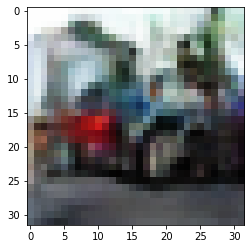

-> Epoch 471, Batch numero 1/78 -> Disc. loss on real images: 0.22700, Disc. loss on fake images: 0.09459, Generator loss: 4.62358
-> Epoch 471, Batch numero 2/78 -> Disc. loss on real images: 0.14780, Disc. loss on fake images: 0.04693, Generator loss: 4.20551
-> Epoch 471, Batch numero 3/78 -> Disc. loss on real images: 0.19198, Disc. loss on fake images: 0.33317, Generator loss: 3.44772
-> Epoch 471, Batch numero 4/78 -> Disc. loss on real images: 0.20501, Disc. loss on fake images: 0.18953, Generator loss: 4.15256
-> Epoch 471, Batch numero 5/78 -> Disc. loss on real images: 0.38391, Disc. loss on fake images: 0.16411, Generator loss: 3.54139
-> Epoch 471, Batch numero 6/78 -> Disc. loss on real images: 0.05407, Disc. loss on fake images: 0.43396, Generator loss: 4.26066
-> Epoch 471, Batch numero 7/78 -> Disc. loss on real images: 0.12721, Disc. loss on fake images: 0.13873, Generator loss: 4.37428
-> Epoch 471, Batch numero 8/78 -> Disc. loss on real images: 0.32357, Disc. loss o

-> Epoch 471, Batch numero 65/78 -> Disc. loss on real images: 0.29187, Disc. loss on fake images: 0.14217, Generator loss: 3.76289
-> Epoch 471, Batch numero 66/78 -> Disc. loss on real images: 0.09353, Disc. loss on fake images: 0.14645, Generator loss: 3.88521
-> Epoch 471, Batch numero 67/78 -> Disc. loss on real images: 0.06000, Disc. loss on fake images: 0.17497, Generator loss: 4.19221
-> Epoch 471, Batch numero 68/78 -> Disc. loss on real images: 0.17661, Disc. loss on fake images: 0.08146, Generator loss: 4.35677
-> Epoch 471, Batch numero 69/78 -> Disc. loss on real images: 0.08005, Disc. loss on fake images: 0.22058, Generator loss: 3.98918
-> Epoch 471, Batch numero 70/78 -> Disc. loss on real images: 0.20428, Disc. loss on fake images: 0.12473, Generator loss: 3.05243
-> Epoch 471, Batch numero 71/78 -> Disc. loss on real images: 0.16683, Disc. loss on fake images: 0.25650, Generator loss: 3.84755
-> Epoch 471, Batch numero 72/78 -> Disc. loss on real images: 0.07814, Disc

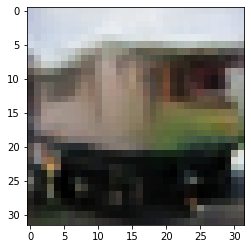

-> Epoch 472, Batch numero 1/78 -> Disc. loss on real images: 0.25460, Disc. loss on fake images: 0.37956, Generator loss: 4.27097
-> Epoch 472, Batch numero 2/78 -> Disc. loss on real images: 0.15484, Disc. loss on fake images: 0.12799, Generator loss: 3.86601
-> Epoch 472, Batch numero 3/78 -> Disc. loss on real images: 0.24264, Disc. loss on fake images: 0.25843, Generator loss: 4.11728
-> Epoch 472, Batch numero 4/78 -> Disc. loss on real images: 0.14290, Disc. loss on fake images: 0.22990, Generator loss: 3.81360
-> Epoch 472, Batch numero 5/78 -> Disc. loss on real images: 0.12694, Disc. loss on fake images: 0.21848, Generator loss: 3.93099
-> Epoch 472, Batch numero 6/78 -> Disc. loss on real images: 0.43902, Disc. loss on fake images: 0.19109, Generator loss: 3.35785
-> Epoch 472, Batch numero 7/78 -> Disc. loss on real images: 0.19879, Disc. loss on fake images: 0.16890, Generator loss: 3.98656
-> Epoch 472, Batch numero 8/78 -> Disc. loss on real images: 0.10766, Disc. loss o

-> Epoch 472, Batch numero 64/78 -> Disc. loss on real images: 0.14244, Disc. loss on fake images: 0.28064, Generator loss: 3.67339
-> Epoch 472, Batch numero 65/78 -> Disc. loss on real images: 0.49220, Disc. loss on fake images: 0.24364, Generator loss: 3.53343
-> Epoch 472, Batch numero 66/78 -> Disc. loss on real images: 0.16943, Disc. loss on fake images: 0.16539, Generator loss: 3.85560
-> Epoch 472, Batch numero 67/78 -> Disc. loss on real images: 0.08209, Disc. loss on fake images: 0.15656, Generator loss: 3.81378
-> Epoch 472, Batch numero 68/78 -> Disc. loss on real images: 0.26959, Disc. loss on fake images: 0.11609, Generator loss: 3.56743
-> Epoch 472, Batch numero 69/78 -> Disc. loss on real images: 0.12389, Disc. loss on fake images: 0.17378, Generator loss: 3.28050
-> Epoch 472, Batch numero 70/78 -> Disc. loss on real images: 0.14000, Disc. loss on fake images: 0.15694, Generator loss: 2.87101
-> Epoch 472, Batch numero 71/78 -> Disc. loss on real images: 0.11848, Disc

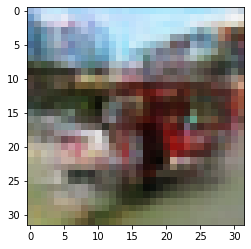

-> Epoch 473, Batch numero 1/78 -> Disc. loss on real images: 0.21818, Disc. loss on fake images: 0.11950, Generator loss: 4.53163
-> Epoch 473, Batch numero 2/78 -> Disc. loss on real images: 0.20700, Disc. loss on fake images: 0.34435, Generator loss: 4.00437
-> Epoch 473, Batch numero 3/78 -> Disc. loss on real images: 0.22977, Disc. loss on fake images: 0.16930, Generator loss: 3.93403
-> Epoch 473, Batch numero 4/78 -> Disc. loss on real images: 0.17635, Disc. loss on fake images: 0.18522, Generator loss: 4.30396
-> Epoch 473, Batch numero 5/78 -> Disc. loss on real images: 0.20890, Disc. loss on fake images: 0.14426, Generator loss: 3.54773
-> Epoch 473, Batch numero 6/78 -> Disc. loss on real images: 0.07436, Disc. loss on fake images: 0.24599, Generator loss: 4.16279
-> Epoch 473, Batch numero 7/78 -> Disc. loss on real images: 0.12173, Disc. loss on fake images: 0.16666, Generator loss: 4.17093
-> Epoch 473, Batch numero 8/78 -> Disc. loss on real images: 0.23814, Disc. loss o

-> Epoch 473, Batch numero 64/78 -> Disc. loss on real images: 0.07119, Disc. loss on fake images: 0.20432, Generator loss: 4.17858
-> Epoch 473, Batch numero 65/78 -> Disc. loss on real images: 0.13490, Disc. loss on fake images: 0.19678, Generator loss: 4.81802
-> Epoch 473, Batch numero 66/78 -> Disc. loss on real images: 0.09574, Disc. loss on fake images: 0.09462, Generator loss: 4.51294
-> Epoch 473, Batch numero 67/78 -> Disc. loss on real images: 0.11009, Disc. loss on fake images: 0.06647, Generator loss: 4.24224
-> Epoch 473, Batch numero 68/78 -> Disc. loss on real images: 0.18266, Disc. loss on fake images: 0.09607, Generator loss: 3.49241
-> Epoch 473, Batch numero 69/78 -> Disc. loss on real images: 0.23383, Disc. loss on fake images: 0.25182, Generator loss: 3.15333
-> Epoch 473, Batch numero 70/78 -> Disc. loss on real images: 0.04912, Disc. loss on fake images: 0.16530, Generator loss: 4.01613
-> Epoch 473, Batch numero 71/78 -> Disc. loss on real images: 0.10842, Disc

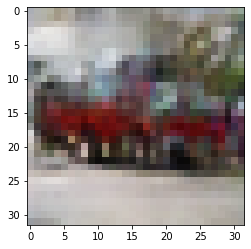

-> Epoch 474, Batch numero 1/78 -> Disc. loss on real images: 0.19765, Disc. loss on fake images: 0.09979, Generator loss: 3.48096
-> Epoch 474, Batch numero 2/78 -> Disc. loss on real images: 0.18538, Disc. loss on fake images: 0.14436, Generator loss: 3.48138
-> Epoch 474, Batch numero 3/78 -> Disc. loss on real images: 0.16355, Disc. loss on fake images: 0.29165, Generator loss: 3.50861
-> Epoch 474, Batch numero 4/78 -> Disc. loss on real images: 0.16005, Disc. loss on fake images: 0.19138, Generator loss: 3.92600
-> Epoch 474, Batch numero 5/78 -> Disc. loss on real images: 0.11013, Disc. loss on fake images: 0.37044, Generator loss: 3.43344
-> Epoch 474, Batch numero 6/78 -> Disc. loss on real images: 0.21284, Disc. loss on fake images: 0.14555, Generator loss: 3.26278
-> Epoch 474, Batch numero 7/78 -> Disc. loss on real images: 0.11221, Disc. loss on fake images: 0.29019, Generator loss: 4.33156
-> Epoch 474, Batch numero 8/78 -> Disc. loss on real images: 0.16176, Disc. loss o

-> Epoch 474, Batch numero 64/78 -> Disc. loss on real images: 0.14531, Disc. loss on fake images: 0.37817, Generator loss: 4.33882
-> Epoch 474, Batch numero 65/78 -> Disc. loss on real images: 0.31664, Disc. loss on fake images: 0.19890, Generator loss: 3.87012
-> Epoch 474, Batch numero 66/78 -> Disc. loss on real images: 0.15771, Disc. loss on fake images: 0.31528, Generator loss: 4.45388
-> Epoch 474, Batch numero 67/78 -> Disc. loss on real images: 0.20832, Disc. loss on fake images: 0.17929, Generator loss: 3.90986
-> Epoch 474, Batch numero 68/78 -> Disc. loss on real images: 0.27468, Disc. loss on fake images: 0.10682, Generator loss: 3.64180
-> Epoch 474, Batch numero 69/78 -> Disc. loss on real images: 0.29525, Disc. loss on fake images: 0.50269, Generator loss: 3.39119
-> Epoch 474, Batch numero 70/78 -> Disc. loss on real images: 0.23168, Disc. loss on fake images: 0.20319, Generator loss: 3.56055
-> Epoch 474, Batch numero 71/78 -> Disc. loss on real images: 0.25875, Disc

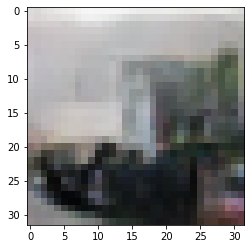

-> Epoch 475, Batch numero 1/78 -> Disc. loss on real images: 0.16707, Disc. loss on fake images: 0.15646, Generator loss: 3.44221
-> Epoch 475, Batch numero 2/78 -> Disc. loss on real images: 0.29522, Disc. loss on fake images: 0.15616, Generator loss: 4.08452
-> Epoch 475, Batch numero 3/78 -> Disc. loss on real images: 0.10802, Disc. loss on fake images: 0.18293, Generator loss: 4.04223
-> Epoch 475, Batch numero 4/78 -> Disc. loss on real images: 0.30379, Disc. loss on fake images: 0.26193, Generator loss: 3.63965
-> Epoch 475, Batch numero 5/78 -> Disc. loss on real images: 0.12130, Disc. loss on fake images: 0.23118, Generator loss: 4.05925
-> Epoch 475, Batch numero 6/78 -> Disc. loss on real images: 0.15698, Disc. loss on fake images: 0.27720, Generator loss: 4.62270
-> Epoch 475, Batch numero 7/78 -> Disc. loss on real images: 0.18486, Disc. loss on fake images: 0.17474, Generator loss: 4.19320
-> Epoch 475, Batch numero 8/78 -> Disc. loss on real images: 0.32513, Disc. loss o

-> Epoch 475, Batch numero 64/78 -> Disc. loss on real images: 0.13794, Disc. loss on fake images: 0.10085, Generator loss: 4.56067
-> Epoch 475, Batch numero 65/78 -> Disc. loss on real images: 0.16459, Disc. loss on fake images: 0.08632, Generator loss: 3.68409
-> Epoch 475, Batch numero 66/78 -> Disc. loss on real images: 0.25097, Disc. loss on fake images: 0.22013, Generator loss: 3.43957
-> Epoch 475, Batch numero 67/78 -> Disc. loss on real images: 0.15120, Disc. loss on fake images: 0.11230, Generator loss: 3.35492
-> Epoch 475, Batch numero 68/78 -> Disc. loss on real images: 0.10266, Disc. loss on fake images: 0.24856, Generator loss: 3.75107
-> Epoch 475, Batch numero 69/78 -> Disc. loss on real images: 0.12191, Disc. loss on fake images: 0.16024, Generator loss: 3.80225
-> Epoch 475, Batch numero 70/78 -> Disc. loss on real images: 0.07975, Disc. loss on fake images: 0.12184, Generator loss: 4.13003
-> Epoch 475, Batch numero 71/78 -> Disc. loss on real images: 0.33650, Disc

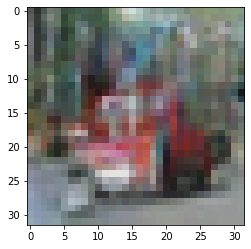

-> Epoch 476, Batch numero 1/78 -> Disc. loss on real images: 0.17618, Disc. loss on fake images: 0.24140, Generator loss: 3.13708
-> Epoch 476, Batch numero 2/78 -> Disc. loss on real images: 0.13583, Disc. loss on fake images: 0.15147, Generator loss: 3.45491
-> Epoch 476, Batch numero 3/78 -> Disc. loss on real images: 0.15447, Disc. loss on fake images: 0.46384, Generator loss: 3.61789
-> Epoch 476, Batch numero 4/78 -> Disc. loss on real images: 0.11158, Disc. loss on fake images: 0.11235, Generator loss: 3.64995
-> Epoch 476, Batch numero 5/78 -> Disc. loss on real images: 0.22890, Disc. loss on fake images: 0.08455, Generator loss: 4.34148
-> Epoch 476, Batch numero 6/78 -> Disc. loss on real images: 0.19645, Disc. loss on fake images: 0.31346, Generator loss: 3.45707
-> Epoch 476, Batch numero 7/78 -> Disc. loss on real images: 0.12976, Disc. loss on fake images: 0.11940, Generator loss: 4.15380
-> Epoch 476, Batch numero 8/78 -> Disc. loss on real images: 0.23162, Disc. loss o

-> Epoch 476, Batch numero 64/78 -> Disc. loss on real images: 0.15610, Disc. loss on fake images: 0.08607, Generator loss: 3.88674
-> Epoch 476, Batch numero 65/78 -> Disc. loss on real images: 0.06626, Disc. loss on fake images: 0.24097, Generator loss: 4.15966
-> Epoch 476, Batch numero 66/78 -> Disc. loss on real images: 0.18008, Disc. loss on fake images: 0.13738, Generator loss: 3.96461
-> Epoch 476, Batch numero 67/78 -> Disc. loss on real images: 0.19079, Disc. loss on fake images: 0.19791, Generator loss: 4.15161
-> Epoch 476, Batch numero 68/78 -> Disc. loss on real images: 0.12411, Disc. loss on fake images: 0.17082, Generator loss: 3.81268
-> Epoch 476, Batch numero 69/78 -> Disc. loss on real images: 0.08587, Disc. loss on fake images: 0.07035, Generator loss: 4.10700
-> Epoch 476, Batch numero 70/78 -> Disc. loss on real images: 0.25003, Disc. loss on fake images: 0.13913, Generator loss: 3.68938
-> Epoch 476, Batch numero 71/78 -> Disc. loss on real images: 0.10683, Disc

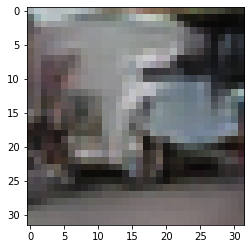

-> Epoch 477, Batch numero 1/78 -> Disc. loss on real images: 0.09356, Disc. loss on fake images: 0.11558, Generator loss: 3.70496
-> Epoch 477, Batch numero 2/78 -> Disc. loss on real images: 0.17369, Disc. loss on fake images: 0.51330, Generator loss: 3.94013
-> Epoch 477, Batch numero 3/78 -> Disc. loss on real images: 0.12413, Disc. loss on fake images: 0.10549, Generator loss: 3.92343
-> Epoch 477, Batch numero 4/78 -> Disc. loss on real images: 0.18965, Disc. loss on fake images: 0.25076, Generator loss: 4.00429
-> Epoch 477, Batch numero 5/78 -> Disc. loss on real images: 0.21317, Disc. loss on fake images: 0.22944, Generator loss: 4.17677
-> Epoch 477, Batch numero 6/78 -> Disc. loss on real images: 0.16598, Disc. loss on fake images: 0.16960, Generator loss: 3.76356
-> Epoch 477, Batch numero 7/78 -> Disc. loss on real images: 0.22694, Disc. loss on fake images: 0.06608, Generator loss: 3.22180
-> Epoch 477, Batch numero 8/78 -> Disc. loss on real images: 0.13956, Disc. loss o

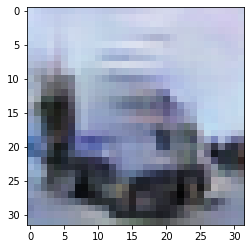

-> Epoch 478, Batch numero 1/78 -> Disc. loss on real images: 0.05630, Disc. loss on fake images: 0.36598, Generator loss: 4.25667
-> Epoch 478, Batch numero 2/78 -> Disc. loss on real images: 0.20240, Disc. loss on fake images: 0.25252, Generator loss: 3.97936
-> Epoch 478, Batch numero 3/78 -> Disc. loss on real images: 0.26105, Disc. loss on fake images: 0.11384, Generator loss: 3.98579
-> Epoch 478, Batch numero 4/78 -> Disc. loss on real images: 0.05796, Disc. loss on fake images: 0.27170, Generator loss: 4.25422
-> Epoch 478, Batch numero 5/78 -> Disc. loss on real images: 0.18020, Disc. loss on fake images: 0.08633, Generator loss: 3.97817
-> Epoch 478, Batch numero 6/78 -> Disc. loss on real images: 0.18137, Disc. loss on fake images: 0.28327, Generator loss: 3.94564
-> Epoch 478, Batch numero 7/78 -> Disc. loss on real images: 0.14357, Disc. loss on fake images: 0.31461, Generator loss: 4.14259
-> Epoch 478, Batch numero 8/78 -> Disc. loss on real images: 0.13509, Disc. loss o

-> Epoch 478, Batch numero 65/78 -> Disc. loss on real images: 0.21557, Disc. loss on fake images: 0.34970, Generator loss: 3.49020
-> Epoch 478, Batch numero 66/78 -> Disc. loss on real images: 0.08272, Disc. loss on fake images: 0.41601, Generator loss: 4.42226
-> Epoch 478, Batch numero 67/78 -> Disc. loss on real images: 0.37092, Disc. loss on fake images: 0.16842, Generator loss: 4.49189
-> Epoch 478, Batch numero 68/78 -> Disc. loss on real images: 0.44130, Disc. loss on fake images: 0.19922, Generator loss: 3.88935
-> Epoch 478, Batch numero 69/78 -> Disc. loss on real images: 0.19749, Disc. loss on fake images: 0.17790, Generator loss: 3.66365
-> Epoch 478, Batch numero 70/78 -> Disc. loss on real images: 0.08239, Disc. loss on fake images: 0.14057, Generator loss: 4.43825
-> Epoch 478, Batch numero 71/78 -> Disc. loss on real images: 0.13009, Disc. loss on fake images: 0.15985, Generator loss: 3.92567
-> Epoch 478, Batch numero 72/78 -> Disc. loss on real images: 0.13311, Disc

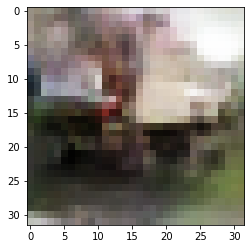

-> Epoch 479, Batch numero 1/78 -> Disc. loss on real images: 0.11865, Disc. loss on fake images: 0.67391, Generator loss: 3.72587
-> Epoch 479, Batch numero 2/78 -> Disc. loss on real images: 0.12568, Disc. loss on fake images: 0.19717, Generator loss: 4.42036
-> Epoch 479, Batch numero 3/78 -> Disc. loss on real images: 0.20941, Disc. loss on fake images: 0.19617, Generator loss: 4.08361
-> Epoch 479, Batch numero 4/78 -> Disc. loss on real images: 0.21448, Disc. loss on fake images: 0.28459, Generator loss: 3.75428
-> Epoch 479, Batch numero 5/78 -> Disc. loss on real images: 0.15989, Disc. loss on fake images: 0.19721, Generator loss: 3.99288
-> Epoch 479, Batch numero 6/78 -> Disc. loss on real images: 0.42756, Disc. loss on fake images: 0.50595, Generator loss: 3.69340
-> Epoch 479, Batch numero 7/78 -> Disc. loss on real images: 0.08611, Disc. loss on fake images: 0.28863, Generator loss: 3.79813
-> Epoch 479, Batch numero 8/78 -> Disc. loss on real images: 0.24295, Disc. loss o

-> Epoch 479, Batch numero 64/78 -> Disc. loss on real images: 0.16357, Disc. loss on fake images: 0.43881, Generator loss: 3.72447
-> Epoch 479, Batch numero 65/78 -> Disc. loss on real images: 0.09850, Disc. loss on fake images: 0.18835, Generator loss: 4.54684
-> Epoch 479, Batch numero 66/78 -> Disc. loss on real images: 0.82246, Disc. loss on fake images: 0.54726, Generator loss: 3.52376
-> Epoch 479, Batch numero 67/78 -> Disc. loss on real images: 0.26888, Disc. loss on fake images: 0.55740, Generator loss: 5.16963
-> Epoch 479, Batch numero 68/78 -> Disc. loss on real images: 0.42797, Disc. loss on fake images: 0.12126, Generator loss: 4.46313
-> Epoch 479, Batch numero 69/78 -> Disc. loss on real images: 0.12247, Disc. loss on fake images: 0.44067, Generator loss: 4.50713
-> Epoch 479, Batch numero 70/78 -> Disc. loss on real images: 0.19933, Disc. loss on fake images: 0.20348, Generator loss: 5.29461
-> Epoch 479, Batch numero 71/78 -> Disc. loss on real images: 0.69460, Disc

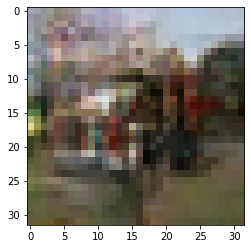

-> Epoch 480, Batch numero 1/78 -> Disc. loss on real images: 0.09518, Disc. loss on fake images: 0.11836, Generator loss: 3.15886
-> Epoch 480, Batch numero 2/78 -> Disc. loss on real images: 0.09588, Disc. loss on fake images: 0.29107, Generator loss: 3.55490
-> Epoch 480, Batch numero 3/78 -> Disc. loss on real images: 0.11821, Disc. loss on fake images: 0.12836, Generator loss: 3.86719
-> Epoch 480, Batch numero 4/78 -> Disc. loss on real images: 0.36646, Disc. loss on fake images: 0.26879, Generator loss: 3.73610
-> Epoch 480, Batch numero 5/78 -> Disc. loss on real images: 0.16097, Disc. loss on fake images: 0.47929, Generator loss: 3.69235
-> Epoch 480, Batch numero 6/78 -> Disc. loss on real images: 0.36936, Disc. loss on fake images: 0.12969, Generator loss: 3.09657
-> Epoch 480, Batch numero 7/78 -> Disc. loss on real images: 0.15593, Disc. loss on fake images: 0.17525, Generator loss: 3.36114
-> Epoch 480, Batch numero 8/78 -> Disc. loss on real images: 0.12827, Disc. loss o

-> Epoch 480, Batch numero 65/78 -> Disc. loss on real images: 0.21763, Disc. loss on fake images: 0.10720, Generator loss: 3.57575
-> Epoch 480, Batch numero 66/78 -> Disc. loss on real images: 0.12693, Disc. loss on fake images: 0.16375, Generator loss: 3.61391
-> Epoch 480, Batch numero 67/78 -> Disc. loss on real images: 0.28515, Disc. loss on fake images: 0.17984, Generator loss: 3.85248
-> Epoch 480, Batch numero 68/78 -> Disc. loss on real images: 0.18817, Disc. loss on fake images: 0.16623, Generator loss: 3.86810
-> Epoch 480, Batch numero 69/78 -> Disc. loss on real images: 0.08691, Disc. loss on fake images: 0.32127, Generator loss: 4.67235
-> Epoch 480, Batch numero 70/78 -> Disc. loss on real images: 0.38299, Disc. loss on fake images: 0.09050, Generator loss: 3.46604
-> Epoch 480, Batch numero 71/78 -> Disc. loss on real images: 0.13635, Disc. loss on fake images: 0.26029, Generator loss: 3.37632
-> Epoch 480, Batch numero 72/78 -> Disc. loss on real images: 0.09351, Disc

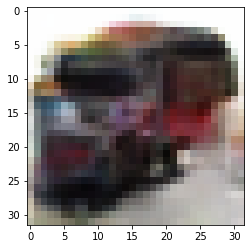

-> Epoch 481, Batch numero 1/78 -> Disc. loss on real images: 0.27923, Disc. loss on fake images: 0.05243, Generator loss: 4.20483
-> Epoch 481, Batch numero 2/78 -> Disc. loss on real images: 0.12037, Disc. loss on fake images: 0.11289, Generator loss: 3.61799
-> Epoch 481, Batch numero 3/78 -> Disc. loss on real images: 0.18308, Disc. loss on fake images: 0.14786, Generator loss: 3.41285
-> Epoch 481, Batch numero 4/78 -> Disc. loss on real images: 0.13143, Disc. loss on fake images: 0.22510, Generator loss: 3.69905
-> Epoch 481, Batch numero 5/78 -> Disc. loss on real images: 0.16460, Disc. loss on fake images: 0.07390, Generator loss: 3.73738
-> Epoch 481, Batch numero 6/78 -> Disc. loss on real images: 0.19816, Disc. loss on fake images: 0.14884, Generator loss: 3.39246
-> Epoch 481, Batch numero 7/78 -> Disc. loss on real images: 0.10855, Disc. loss on fake images: 0.31358, Generator loss: 3.55046
-> Epoch 481, Batch numero 8/78 -> Disc. loss on real images: 0.19700, Disc. loss o

-> Epoch 481, Batch numero 64/78 -> Disc. loss on real images: 0.24993, Disc. loss on fake images: 0.05659, Generator loss: 3.79610
-> Epoch 481, Batch numero 65/78 -> Disc. loss on real images: 0.19671, Disc. loss on fake images: 0.29344, Generator loss: 4.19653
-> Epoch 481, Batch numero 66/78 -> Disc. loss on real images: 0.10659, Disc. loss on fake images: 0.47261, Generator loss: 4.37007
-> Epoch 481, Batch numero 67/78 -> Disc. loss on real images: 0.33201, Disc. loss on fake images: 0.19543, Generator loss: 4.19064
-> Epoch 481, Batch numero 68/78 -> Disc. loss on real images: 0.12033, Disc. loss on fake images: 0.12198, Generator loss: 4.59048
-> Epoch 481, Batch numero 69/78 -> Disc. loss on real images: 0.14605, Disc. loss on fake images: 0.11335, Generator loss: 4.44450
-> Epoch 481, Batch numero 70/78 -> Disc. loss on real images: 0.14497, Disc. loss on fake images: 0.28808, Generator loss: 4.06829
-> Epoch 481, Batch numero 71/78 -> Disc. loss on real images: 0.17212, Disc

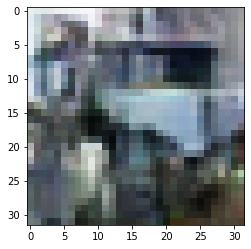

-> Epoch 482, Batch numero 1/78 -> Disc. loss on real images: 0.32749, Disc. loss on fake images: 0.25188, Generator loss: 4.24952
-> Epoch 482, Batch numero 2/78 -> Disc. loss on real images: 0.22678, Disc. loss on fake images: 0.18311, Generator loss: 4.01528
-> Epoch 482, Batch numero 3/78 -> Disc. loss on real images: 0.16994, Disc. loss on fake images: 0.22654, Generator loss: 4.15937
-> Epoch 482, Batch numero 4/78 -> Disc. loss on real images: 0.25401, Disc. loss on fake images: 0.19489, Generator loss: 3.56851
-> Epoch 482, Batch numero 5/78 -> Disc. loss on real images: 0.20326, Disc. loss on fake images: 0.19072, Generator loss: 3.46070
-> Epoch 482, Batch numero 6/78 -> Disc. loss on real images: 0.21716, Disc. loss on fake images: 0.13993, Generator loss: 3.61165
-> Epoch 482, Batch numero 7/78 -> Disc. loss on real images: 0.05739, Disc. loss on fake images: 0.24251, Generator loss: 3.69870
-> Epoch 482, Batch numero 8/78 -> Disc. loss on real images: 0.02132, Disc. loss o

-> Epoch 482, Batch numero 65/78 -> Disc. loss on real images: 0.15764, Disc. loss on fake images: 0.07951, Generator loss: 4.13286
-> Epoch 482, Batch numero 66/78 -> Disc. loss on real images: 0.12881, Disc. loss on fake images: 0.06014, Generator loss: 3.95892
-> Epoch 482, Batch numero 67/78 -> Disc. loss on real images: 0.17003, Disc. loss on fake images: 0.19845, Generator loss: 3.65386
-> Epoch 482, Batch numero 68/78 -> Disc. loss on real images: 0.13596, Disc. loss on fake images: 0.14717, Generator loss: 3.92179
-> Epoch 482, Batch numero 69/78 -> Disc. loss on real images: 0.08348, Disc. loss on fake images: 0.13336, Generator loss: 3.93843
-> Epoch 482, Batch numero 70/78 -> Disc. loss on real images: 0.20956, Disc. loss on fake images: 0.11162, Generator loss: 3.95374
-> Epoch 482, Batch numero 71/78 -> Disc. loss on real images: 0.21798, Disc. loss on fake images: 0.15756, Generator loss: 3.40421
-> Epoch 482, Batch numero 72/78 -> Disc. loss on real images: 0.02505, Disc

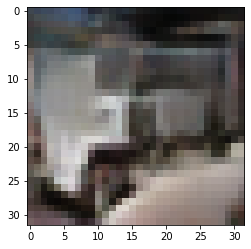

-> Epoch 483, Batch numero 1/78 -> Disc. loss on real images: 0.09461, Disc. loss on fake images: 0.19630, Generator loss: 4.05537
-> Epoch 483, Batch numero 2/78 -> Disc. loss on real images: 0.13902, Disc. loss on fake images: 0.07221, Generator loss: 4.33578
-> Epoch 483, Batch numero 3/78 -> Disc. loss on real images: 0.27759, Disc. loss on fake images: 0.10701, Generator loss: 3.47117
-> Epoch 483, Batch numero 4/78 -> Disc. loss on real images: 0.08727, Disc. loss on fake images: 0.14993, Generator loss: 3.94648
-> Epoch 483, Batch numero 5/78 -> Disc. loss on real images: 0.06004, Disc. loss on fake images: 0.31524, Generator loss: 4.01609
-> Epoch 483, Batch numero 6/78 -> Disc. loss on real images: 0.20737, Disc. loss on fake images: 0.30677, Generator loss: 4.56211
-> Epoch 483, Batch numero 7/78 -> Disc. loss on real images: 0.36033, Disc. loss on fake images: 0.14287, Generator loss: 4.07201
-> Epoch 483, Batch numero 8/78 -> Disc. loss on real images: 0.24409, Disc. loss o

-> Epoch 483, Batch numero 65/78 -> Disc. loss on real images: 0.17031, Disc. loss on fake images: 0.26736, Generator loss: 3.83730
-> Epoch 483, Batch numero 66/78 -> Disc. loss on real images: 0.33833, Disc. loss on fake images: 0.20576, Generator loss: 4.16894
-> Epoch 483, Batch numero 67/78 -> Disc. loss on real images: 0.09860, Disc. loss on fake images: 0.23727, Generator loss: 3.99347
-> Epoch 483, Batch numero 68/78 -> Disc. loss on real images: 0.06893, Disc. loss on fake images: 0.10363, Generator loss: 3.74722
-> Epoch 483, Batch numero 69/78 -> Disc. loss on real images: 0.17528, Disc. loss on fake images: 0.21618, Generator loss: 4.14612
-> Epoch 483, Batch numero 70/78 -> Disc. loss on real images: 0.29746, Disc. loss on fake images: 0.06972, Generator loss: 3.78587
-> Epoch 483, Batch numero 71/78 -> Disc. loss on real images: 0.15595, Disc. loss on fake images: 0.28447, Generator loss: 3.17571
-> Epoch 483, Batch numero 72/78 -> Disc. loss on real images: 0.08897, Disc

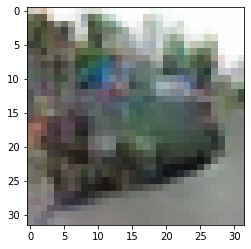

-> Epoch 484, Batch numero 1/78 -> Disc. loss on real images: 0.08973, Disc. loss on fake images: 0.04552, Generator loss: 3.63866
-> Epoch 484, Batch numero 2/78 -> Disc. loss on real images: 0.07192, Disc. loss on fake images: 0.18101, Generator loss: 3.72613
-> Epoch 484, Batch numero 3/78 -> Disc. loss on real images: 0.06132, Disc. loss on fake images: 0.23719, Generator loss: 3.55150
-> Epoch 484, Batch numero 4/78 -> Disc. loss on real images: 0.23541, Disc. loss on fake images: 0.10630, Generator loss: 3.65707
-> Epoch 484, Batch numero 5/78 -> Disc. loss on real images: 0.13974, Disc. loss on fake images: 0.06550, Generator loss: 3.97743
-> Epoch 484, Batch numero 6/78 -> Disc. loss on real images: 0.15308, Disc. loss on fake images: 0.22937, Generator loss: 4.04388
-> Epoch 484, Batch numero 7/78 -> Disc. loss on real images: 0.14208, Disc. loss on fake images: 0.22588, Generator loss: 3.81969
-> Epoch 484, Batch numero 8/78 -> Disc. loss on real images: 0.06392, Disc. loss o

-> Epoch 484, Batch numero 66/78 -> Disc. loss on real images: 0.11955, Disc. loss on fake images: 0.25083, Generator loss: 4.21238
-> Epoch 484, Batch numero 67/78 -> Disc. loss on real images: 0.12196, Disc. loss on fake images: 0.08709, Generator loss: 3.97837
-> Epoch 484, Batch numero 68/78 -> Disc. loss on real images: 0.15640, Disc. loss on fake images: 0.10905, Generator loss: 3.95292
-> Epoch 484, Batch numero 69/78 -> Disc. loss on real images: 0.07847, Disc. loss on fake images: 0.26519, Generator loss: 4.75920
-> Epoch 484, Batch numero 70/78 -> Disc. loss on real images: 0.17946, Disc. loss on fake images: 0.28327, Generator loss: 4.65134
-> Epoch 484, Batch numero 71/78 -> Disc. loss on real images: 0.18203, Disc. loss on fake images: 0.07922, Generator loss: 4.32026
-> Epoch 484, Batch numero 72/78 -> Disc. loss on real images: 0.19579, Disc. loss on fake images: 0.20607, Generator loss: 3.59476
-> Epoch 484, Batch numero 73/78 -> Disc. loss on real images: 0.23007, Disc

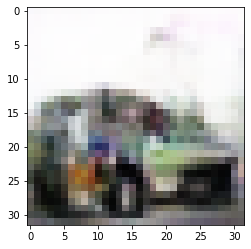

-> Epoch 485, Batch numero 1/78 -> Disc. loss on real images: 0.25680, Disc. loss on fake images: 0.23353, Generator loss: 3.58369
-> Epoch 485, Batch numero 2/78 -> Disc. loss on real images: 0.07712, Disc. loss on fake images: 0.28652, Generator loss: 4.02445
-> Epoch 485, Batch numero 3/78 -> Disc. loss on real images: 0.07537, Disc. loss on fake images: 0.15303, Generator loss: 4.87590
-> Epoch 485, Batch numero 4/78 -> Disc. loss on real images: 0.16965, Disc. loss on fake images: 0.17713, Generator loss: 5.23808
-> Epoch 485, Batch numero 5/78 -> Disc. loss on real images: 0.15847, Disc. loss on fake images: 0.11819, Generator loss: 5.08273
-> Epoch 485, Batch numero 6/78 -> Disc. loss on real images: 0.20787, Disc. loss on fake images: 0.03167, Generator loss: 4.14948
-> Epoch 485, Batch numero 7/78 -> Disc. loss on real images: 0.09979, Disc. loss on fake images: 0.18089, Generator loss: 4.54030
-> Epoch 485, Batch numero 8/78 -> Disc. loss on real images: 0.18378, Disc. loss o

-> Epoch 485, Batch numero 66/78 -> Disc. loss on real images: 0.13567, Disc. loss on fake images: 0.30256, Generator loss: 4.30801
-> Epoch 485, Batch numero 67/78 -> Disc. loss on real images: 0.25977, Disc. loss on fake images: 0.15653, Generator loss: 3.91712
-> Epoch 485, Batch numero 68/78 -> Disc. loss on real images: 0.18916, Disc. loss on fake images: 0.18557, Generator loss: 3.87702
-> Epoch 485, Batch numero 69/78 -> Disc. loss on real images: 0.19460, Disc. loss on fake images: 0.15680, Generator loss: 3.76228
-> Epoch 485, Batch numero 70/78 -> Disc. loss on real images: 0.23662, Disc. loss on fake images: 0.24031, Generator loss: 3.47875
-> Epoch 485, Batch numero 71/78 -> Disc. loss on real images: 0.07822, Disc. loss on fake images: 0.29968, Generator loss: 4.43787
-> Epoch 485, Batch numero 72/78 -> Disc. loss on real images: 0.21867, Disc. loss on fake images: 0.40711, Generator loss: 4.71522
-> Epoch 485, Batch numero 73/78 -> Disc. loss on real images: 0.14504, Disc

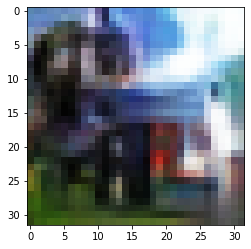

-> Epoch 486, Batch numero 1/78 -> Disc. loss on real images: 0.05942, Disc. loss on fake images: 0.20860, Generator loss: 4.14436
-> Epoch 486, Batch numero 2/78 -> Disc. loss on real images: 0.19165, Disc. loss on fake images: 0.16108, Generator loss: 4.12819
-> Epoch 486, Batch numero 3/78 -> Disc. loss on real images: 0.33498, Disc. loss on fake images: 0.40579, Generator loss: 3.97410
-> Epoch 486, Batch numero 4/78 -> Disc. loss on real images: 0.20374, Disc. loss on fake images: 0.20095, Generator loss: 4.75735
-> Epoch 486, Batch numero 5/78 -> Disc. loss on real images: 0.38381, Disc. loss on fake images: 0.27900, Generator loss: 3.66747
-> Epoch 486, Batch numero 6/78 -> Disc. loss on real images: 0.21022, Disc. loss on fake images: 0.37887, Generator loss: 4.18724
-> Epoch 486, Batch numero 7/78 -> Disc. loss on real images: 0.19855, Disc. loss on fake images: 0.28618, Generator loss: 4.06583
-> Epoch 486, Batch numero 8/78 -> Disc. loss on real images: 0.22856, Disc. loss o

-> Epoch 486, Batch numero 65/78 -> Disc. loss on real images: 0.07909, Disc. loss on fake images: 0.40187, Generator loss: 4.28887
-> Epoch 486, Batch numero 66/78 -> Disc. loss on real images: 0.22465, Disc. loss on fake images: 0.10547, Generator loss: 4.07755
-> Epoch 486, Batch numero 67/78 -> Disc. loss on real images: 0.13561, Disc. loss on fake images: 0.26254, Generator loss: 4.13345
-> Epoch 486, Batch numero 68/78 -> Disc. loss on real images: 0.25096, Disc. loss on fake images: 0.18346, Generator loss: 4.69930
-> Epoch 486, Batch numero 69/78 -> Disc. loss on real images: 0.23535, Disc. loss on fake images: 0.11958, Generator loss: 3.98640
-> Epoch 486, Batch numero 70/78 -> Disc. loss on real images: 0.23720, Disc. loss on fake images: 0.36634, Generator loss: 3.98733
-> Epoch 486, Batch numero 71/78 -> Disc. loss on real images: 0.43111, Disc. loss on fake images: 0.12912, Generator loss: 3.27850
-> Epoch 486, Batch numero 72/78 -> Disc. loss on real images: 0.08368, Disc

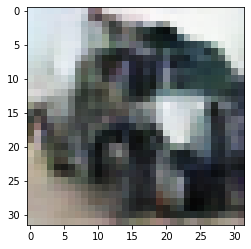

-> Epoch 487, Batch numero 1/78 -> Disc. loss on real images: 0.25871, Disc. loss on fake images: 0.13285, Generator loss: 3.75037
-> Epoch 487, Batch numero 2/78 -> Disc. loss on real images: 0.20949, Disc. loss on fake images: 0.16645, Generator loss: 3.76147
-> Epoch 487, Batch numero 3/78 -> Disc. loss on real images: 0.30616, Disc. loss on fake images: 0.08335, Generator loss: 3.10865
-> Epoch 487, Batch numero 4/78 -> Disc. loss on real images: 0.22637, Disc. loss on fake images: 0.50702, Generator loss: 4.02198
-> Epoch 487, Batch numero 5/78 -> Disc. loss on real images: 0.15785, Disc. loss on fake images: 0.18624, Generator loss: 4.58507
-> Epoch 487, Batch numero 6/78 -> Disc. loss on real images: 0.20981, Disc. loss on fake images: 0.29421, Generator loss: 4.46599
-> Epoch 487, Batch numero 7/78 -> Disc. loss on real images: 0.24602, Disc. loss on fake images: 0.08596, Generator loss: 3.92417
-> Epoch 487, Batch numero 8/78 -> Disc. loss on real images: 0.18166, Disc. loss o

-> Epoch 487, Batch numero 65/78 -> Disc. loss on real images: 0.17827, Disc. loss on fake images: 0.08851, Generator loss: 4.33652
-> Epoch 487, Batch numero 66/78 -> Disc. loss on real images: 0.20925, Disc. loss on fake images: 0.17797, Generator loss: 3.77202
-> Epoch 487, Batch numero 67/78 -> Disc. loss on real images: 0.11847, Disc. loss on fake images: 0.28467, Generator loss: 3.23579
-> Epoch 487, Batch numero 68/78 -> Disc. loss on real images: 0.29602, Disc. loss on fake images: 0.23402, Generator loss: 4.32318
-> Epoch 487, Batch numero 69/78 -> Disc. loss on real images: 0.24164, Disc. loss on fake images: 0.21398, Generator loss: 4.54364
-> Epoch 487, Batch numero 70/78 -> Disc. loss on real images: 0.19090, Disc. loss on fake images: 0.19005, Generator loss: 4.09333
-> Epoch 487, Batch numero 71/78 -> Disc. loss on real images: 0.12759, Disc. loss on fake images: 0.17669, Generator loss: 3.97994
-> Epoch 487, Batch numero 72/78 -> Disc. loss on real images: 0.13478, Disc

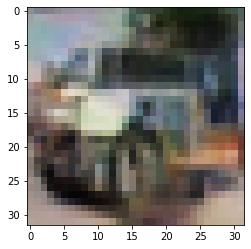

-> Epoch 488, Batch numero 1/78 -> Disc. loss on real images: 0.22335, Disc. loss on fake images: 0.26454, Generator loss: 4.01423
-> Epoch 488, Batch numero 2/78 -> Disc. loss on real images: 0.13701, Disc. loss on fake images: 0.41701, Generator loss: 4.53284
-> Epoch 488, Batch numero 3/78 -> Disc. loss on real images: 0.19243, Disc. loss on fake images: 0.08300, Generator loss: 4.25419
-> Epoch 488, Batch numero 4/78 -> Disc. loss on real images: 0.22380, Disc. loss on fake images: 0.16767, Generator loss: 3.75715
-> Epoch 488, Batch numero 5/78 -> Disc. loss on real images: 0.12091, Disc. loss on fake images: 0.36760, Generator loss: 3.90240
-> Epoch 488, Batch numero 6/78 -> Disc. loss on real images: 0.14819, Disc. loss on fake images: 0.14541, Generator loss: 4.11178
-> Epoch 488, Batch numero 7/78 -> Disc. loss on real images: 0.24162, Disc. loss on fake images: 0.10809, Generator loss: 3.72308
-> Epoch 488, Batch numero 8/78 -> Disc. loss on real images: 0.27766, Disc. loss o

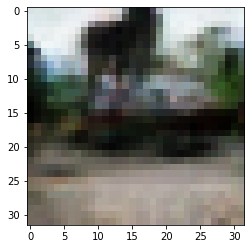

-> Epoch 489, Batch numero 1/78 -> Disc. loss on real images: 0.17154, Disc. loss on fake images: 0.35529, Generator loss: 4.41314
-> Epoch 489, Batch numero 2/78 -> Disc. loss on real images: 0.14361, Disc. loss on fake images: 0.07946, Generator loss: 4.28987
-> Epoch 489, Batch numero 3/78 -> Disc. loss on real images: 0.13316, Disc. loss on fake images: 0.12098, Generator loss: 3.94807
-> Epoch 489, Batch numero 4/78 -> Disc. loss on real images: 0.06199, Disc. loss on fake images: 0.04614, Generator loss: 3.69847
-> Epoch 489, Batch numero 5/78 -> Disc. loss on real images: 0.32028, Disc. loss on fake images: 0.26850, Generator loss: 3.51139
-> Epoch 489, Batch numero 6/78 -> Disc. loss on real images: 0.14015, Disc. loss on fake images: 0.37377, Generator loss: 4.09694
-> Epoch 489, Batch numero 7/78 -> Disc. loss on real images: 0.12827, Disc. loss on fake images: 0.19509, Generator loss: 4.29645
-> Epoch 489, Batch numero 8/78 -> Disc. loss on real images: 0.09539, Disc. loss o

-> Epoch 489, Batch numero 64/78 -> Disc. loss on real images: 0.19835, Disc. loss on fake images: 0.16648, Generator loss: 4.02938
-> Epoch 489, Batch numero 65/78 -> Disc. loss on real images: 0.14600, Disc. loss on fake images: 0.20558, Generator loss: 4.55910
-> Epoch 489, Batch numero 66/78 -> Disc. loss on real images: 0.17057, Disc. loss on fake images: 0.19626, Generator loss: 4.13835
-> Epoch 489, Batch numero 67/78 -> Disc. loss on real images: 0.21053, Disc. loss on fake images: 0.30092, Generator loss: 4.97786
-> Epoch 489, Batch numero 68/78 -> Disc. loss on real images: 0.31106, Disc. loss on fake images: 0.13015, Generator loss: 4.06425
-> Epoch 489, Batch numero 69/78 -> Disc. loss on real images: 0.23417, Disc. loss on fake images: 0.15974, Generator loss: 4.38604
-> Epoch 489, Batch numero 70/78 -> Disc. loss on real images: 0.19127, Disc. loss on fake images: 0.32182, Generator loss: 3.82441
-> Epoch 489, Batch numero 71/78 -> Disc. loss on real images: 0.16980, Disc

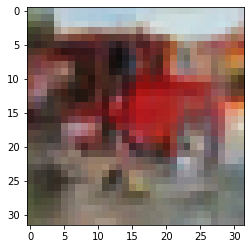

-> Epoch 490, Batch numero 1/78 -> Disc. loss on real images: 0.20701, Disc. loss on fake images: 0.04120, Generator loss: 4.42027
-> Epoch 490, Batch numero 2/78 -> Disc. loss on real images: 0.14574, Disc. loss on fake images: 0.12621, Generator loss: 4.21485
-> Epoch 490, Batch numero 3/78 -> Disc. loss on real images: 0.18625, Disc. loss on fake images: 0.14100, Generator loss: 3.76134
-> Epoch 490, Batch numero 4/78 -> Disc. loss on real images: 0.20164, Disc. loss on fake images: 0.26126, Generator loss: 4.15636
-> Epoch 490, Batch numero 5/78 -> Disc. loss on real images: 0.09566, Disc. loss on fake images: 0.13208, Generator loss: 3.97236
-> Epoch 490, Batch numero 6/78 -> Disc. loss on real images: 0.17228, Disc. loss on fake images: 0.19807, Generator loss: 4.39940
-> Epoch 490, Batch numero 7/78 -> Disc. loss on real images: 0.07093, Disc. loss on fake images: 0.31915, Generator loss: 3.71856
-> Epoch 490, Batch numero 8/78 -> Disc. loss on real images: 0.26041, Disc. loss o

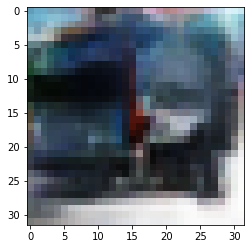

-> Epoch 491, Batch numero 1/78 -> Disc. loss on real images: 0.08147, Disc. loss on fake images: 0.05847, Generator loss: 3.86885
-> Epoch 491, Batch numero 2/78 -> Disc. loss on real images: 0.10059, Disc. loss on fake images: 0.12190, Generator loss: 3.68335
-> Epoch 491, Batch numero 3/78 -> Disc. loss on real images: 0.06874, Disc. loss on fake images: 0.27969, Generator loss: 4.01895
-> Epoch 491, Batch numero 4/78 -> Disc. loss on real images: 0.09012, Disc. loss on fake images: 0.10337, Generator loss: 4.73381
-> Epoch 491, Batch numero 5/78 -> Disc. loss on real images: 0.17221, Disc. loss on fake images: 0.07170, Generator loss: 3.97064
-> Epoch 491, Batch numero 6/78 -> Disc. loss on real images: 0.12526, Disc. loss on fake images: 0.21745, Generator loss: 4.21756
-> Epoch 491, Batch numero 7/78 -> Disc. loss on real images: 0.15356, Disc. loss on fake images: 0.14549, Generator loss: 4.05123
-> Epoch 491, Batch numero 8/78 -> Disc. loss on real images: 0.06862, Disc. loss o

-> Epoch 491, Batch numero 64/78 -> Disc. loss on real images: 0.12295, Disc. loss on fake images: 0.38833, Generator loss: 4.81528
-> Epoch 491, Batch numero 65/78 -> Disc. loss on real images: 0.27199, Disc. loss on fake images: 0.11639, Generator loss: 4.58336
-> Epoch 491, Batch numero 66/78 -> Disc. loss on real images: 0.26548, Disc. loss on fake images: 0.12165, Generator loss: 4.15308
-> Epoch 491, Batch numero 67/78 -> Disc. loss on real images: 0.22845, Disc. loss on fake images: 0.22552, Generator loss: 4.09831
-> Epoch 491, Batch numero 68/78 -> Disc. loss on real images: 0.11723, Disc. loss on fake images: 0.12958, Generator loss: 4.11799
-> Epoch 491, Batch numero 69/78 -> Disc. loss on real images: 0.19163, Disc. loss on fake images: 0.12746, Generator loss: 4.02742
-> Epoch 491, Batch numero 70/78 -> Disc. loss on real images: 0.12383, Disc. loss on fake images: 0.27110, Generator loss: 4.26752
-> Epoch 491, Batch numero 71/78 -> Disc. loss on real images: 0.37695, Disc

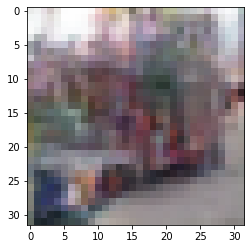

-> Epoch 492, Batch numero 1/78 -> Disc. loss on real images: 0.12478, Disc. loss on fake images: 0.15673, Generator loss: 4.28497
-> Epoch 492, Batch numero 2/78 -> Disc. loss on real images: 0.08598, Disc. loss on fake images: 0.14001, Generator loss: 3.91006
-> Epoch 492, Batch numero 3/78 -> Disc. loss on real images: 0.17816, Disc. loss on fake images: 0.23728, Generator loss: 4.09096
-> Epoch 492, Batch numero 4/78 -> Disc. loss on real images: 0.16795, Disc. loss on fake images: 0.23490, Generator loss: 5.01907
-> Epoch 492, Batch numero 5/78 -> Disc. loss on real images: 0.22952, Disc. loss on fake images: 0.23386, Generator loss: 4.33955
-> Epoch 492, Batch numero 6/78 -> Disc. loss on real images: 0.06942, Disc. loss on fake images: 0.14873, Generator loss: 4.62861
-> Epoch 492, Batch numero 7/78 -> Disc. loss on real images: 0.10877, Disc. loss on fake images: 0.02843, Generator loss: 5.00797
-> Epoch 492, Batch numero 8/78 -> Disc. loss on real images: 0.26824, Disc. loss o

-> Epoch 492, Batch numero 66/78 -> Disc. loss on real images: 0.11309, Disc. loss on fake images: 0.14046, Generator loss: 4.17325
-> Epoch 492, Batch numero 67/78 -> Disc. loss on real images: 0.13194, Disc. loss on fake images: 0.16506, Generator loss: 3.40834
-> Epoch 492, Batch numero 68/78 -> Disc. loss on real images: 0.11993, Disc. loss on fake images: 0.31712, Generator loss: 3.78149
-> Epoch 492, Batch numero 69/78 -> Disc. loss on real images: 0.06118, Disc. loss on fake images: 0.14788, Generator loss: 4.40086
-> Epoch 492, Batch numero 70/78 -> Disc. loss on real images: 0.11792, Disc. loss on fake images: 0.11584, Generator loss: 4.27997
-> Epoch 492, Batch numero 71/78 -> Disc. loss on real images: 0.21260, Disc. loss on fake images: 0.23639, Generator loss: 3.92868
-> Epoch 492, Batch numero 72/78 -> Disc. loss on real images: 0.10506, Disc. loss on fake images: 0.18493, Generator loss: 4.44371
-> Epoch 492, Batch numero 73/78 -> Disc. loss on real images: 0.19600, Disc

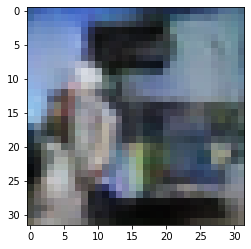

-> Epoch 493, Batch numero 1/78 -> Disc. loss on real images: 0.13297, Disc. loss on fake images: 0.10889, Generator loss: 4.04046
-> Epoch 493, Batch numero 2/78 -> Disc. loss on real images: 0.22028, Disc. loss on fake images: 0.29470, Generator loss: 4.53984
-> Epoch 493, Batch numero 3/78 -> Disc. loss on real images: 0.38220, Disc. loss on fake images: 0.31576, Generator loss: 3.91189
-> Epoch 493, Batch numero 4/78 -> Disc. loss on real images: 0.16349, Disc. loss on fake images: 0.14879, Generator loss: 3.62452
-> Epoch 493, Batch numero 5/78 -> Disc. loss on real images: 0.23790, Disc. loss on fake images: 0.30659, Generator loss: 3.64509
-> Epoch 493, Batch numero 6/78 -> Disc. loss on real images: 0.07945, Disc. loss on fake images: 0.48089, Generator loss: 5.07928
-> Epoch 493, Batch numero 7/78 -> Disc. loss on real images: 0.45500, Disc. loss on fake images: 0.13083, Generator loss: 4.53150
-> Epoch 493, Batch numero 8/78 -> Disc. loss on real images: 0.31497, Disc. loss o

-> Epoch 493, Batch numero 64/78 -> Disc. loss on real images: 0.07380, Disc. loss on fake images: 0.04142, Generator loss: 4.22963
-> Epoch 493, Batch numero 65/78 -> Disc. loss on real images: 0.20470, Disc. loss on fake images: 0.36566, Generator loss: 4.28111
-> Epoch 493, Batch numero 66/78 -> Disc. loss on real images: 0.14382, Disc. loss on fake images: 0.07387, Generator loss: 4.09403
-> Epoch 493, Batch numero 67/78 -> Disc. loss on real images: 0.12790, Disc. loss on fake images: 0.13750, Generator loss: 4.06494
-> Epoch 493, Batch numero 68/78 -> Disc. loss on real images: 0.16526, Disc. loss on fake images: 0.13433, Generator loss: 4.23391
-> Epoch 493, Batch numero 69/78 -> Disc. loss on real images: 0.13276, Disc. loss on fake images: 0.16761, Generator loss: 4.33053
-> Epoch 493, Batch numero 70/78 -> Disc. loss on real images: 0.20095, Disc. loss on fake images: 0.38768, Generator loss: 4.18382
-> Epoch 493, Batch numero 71/78 -> Disc. loss on real images: 0.13175, Disc

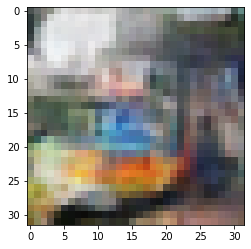

-> Epoch 494, Batch numero 1/78 -> Disc. loss on real images: 0.07437, Disc. loss on fake images: 0.27525, Generator loss: 3.75829
-> Epoch 494, Batch numero 2/78 -> Disc. loss on real images: 0.23007, Disc. loss on fake images: 0.11646, Generator loss: 4.30367
-> Epoch 494, Batch numero 3/78 -> Disc. loss on real images: 0.16199, Disc. loss on fake images: 0.20715, Generator loss: 3.76641
-> Epoch 494, Batch numero 4/78 -> Disc. loss on real images: 0.06973, Disc. loss on fake images: 0.37346, Generator loss: 4.16436
-> Epoch 494, Batch numero 5/78 -> Disc. loss on real images: 0.09583, Disc. loss on fake images: 0.04592, Generator loss: 4.20272
-> Epoch 494, Batch numero 6/78 -> Disc. loss on real images: 0.13358, Disc. loss on fake images: 0.32416, Generator loss: 4.70646
-> Epoch 494, Batch numero 7/78 -> Disc. loss on real images: 0.14644, Disc. loss on fake images: 0.07318, Generator loss: 4.69273
-> Epoch 494, Batch numero 8/78 -> Disc. loss on real images: 0.36184, Disc. loss o

-> Epoch 494, Batch numero 64/78 -> Disc. loss on real images: 0.24442, Disc. loss on fake images: 0.14661, Generator loss: 3.55011
-> Epoch 494, Batch numero 65/78 -> Disc. loss on real images: 0.13130, Disc. loss on fake images: 0.19274, Generator loss: 4.10942
-> Epoch 494, Batch numero 66/78 -> Disc. loss on real images: 0.22201, Disc. loss on fake images: 0.18169, Generator loss: 3.56490
-> Epoch 494, Batch numero 67/78 -> Disc. loss on real images: 0.18363, Disc. loss on fake images: 0.54228, Generator loss: 3.85743
-> Epoch 494, Batch numero 68/78 -> Disc. loss on real images: 0.19181, Disc. loss on fake images: 0.15542, Generator loss: 4.47528
-> Epoch 494, Batch numero 69/78 -> Disc. loss on real images: 0.21736, Disc. loss on fake images: 0.13637, Generator loss: 4.13180
-> Epoch 494, Batch numero 70/78 -> Disc. loss on real images: 0.16202, Disc. loss on fake images: 0.14016, Generator loss: 4.26046
-> Epoch 494, Batch numero 71/78 -> Disc. loss on real images: 0.36145, Disc

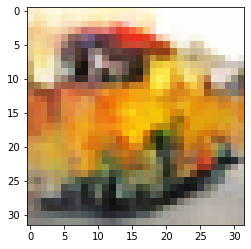

-> Epoch 495, Batch numero 1/78 -> Disc. loss on real images: 0.15066, Disc. loss on fake images: 0.17039, Generator loss: 3.84864
-> Epoch 495, Batch numero 2/78 -> Disc. loss on real images: 0.13366, Disc. loss on fake images: 0.30491, Generator loss: 4.38586
-> Epoch 495, Batch numero 3/78 -> Disc. loss on real images: 0.17930, Disc. loss on fake images: 0.17782, Generator loss: 3.66667
-> Epoch 495, Batch numero 4/78 -> Disc. loss on real images: 0.11802, Disc. loss on fake images: 0.07896, Generator loss: 4.39691
-> Epoch 495, Batch numero 5/78 -> Disc. loss on real images: 0.25075, Disc. loss on fake images: 0.31680, Generator loss: 3.95568
-> Epoch 495, Batch numero 6/78 -> Disc. loss on real images: 0.16960, Disc. loss on fake images: 0.18397, Generator loss: 3.59511
-> Epoch 495, Batch numero 7/78 -> Disc. loss on real images: 0.08247, Disc. loss on fake images: 0.13664, Generator loss: 4.32263
-> Epoch 495, Batch numero 8/78 -> Disc. loss on real images: 0.18243, Disc. loss o

-> Epoch 495, Batch numero 64/78 -> Disc. loss on real images: 0.12177, Disc. loss on fake images: 0.19292, Generator loss: 3.88956
-> Epoch 495, Batch numero 65/78 -> Disc. loss on real images: 0.10370, Disc. loss on fake images: 0.12986, Generator loss: 3.45612
-> Epoch 495, Batch numero 66/78 -> Disc. loss on real images: 0.16365, Disc. loss on fake images: 0.14865, Generator loss: 3.70195
-> Epoch 495, Batch numero 67/78 -> Disc. loss on real images: 0.13416, Disc. loss on fake images: 0.27360, Generator loss: 4.61958
-> Epoch 495, Batch numero 68/78 -> Disc. loss on real images: 0.35771, Disc. loss on fake images: 0.18594, Generator loss: 3.70800
-> Epoch 495, Batch numero 69/78 -> Disc. loss on real images: 0.07215, Disc. loss on fake images: 0.28852, Generator loss: 5.15793
-> Epoch 495, Batch numero 70/78 -> Disc. loss on real images: 0.21007, Disc. loss on fake images: 0.10617, Generator loss: 4.79671
-> Epoch 495, Batch numero 71/78 -> Disc. loss on real images: 0.16992, Disc

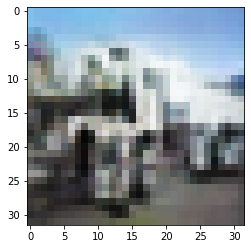

-> Epoch 496, Batch numero 1/78 -> Disc. loss on real images: 0.08011, Disc. loss on fake images: 0.16664, Generator loss: 4.19196
-> Epoch 496, Batch numero 2/78 -> Disc. loss on real images: 0.19117, Disc. loss on fake images: 0.10443, Generator loss: 3.60505
-> Epoch 496, Batch numero 3/78 -> Disc. loss on real images: 0.09769, Disc. loss on fake images: 0.29915, Generator loss: 4.05041
-> Epoch 496, Batch numero 4/78 -> Disc. loss on real images: 0.29568, Disc. loss on fake images: 0.12662, Generator loss: 3.94962
-> Epoch 496, Batch numero 5/78 -> Disc. loss on real images: 0.15632, Disc. loss on fake images: 0.18423, Generator loss: 4.14115
-> Epoch 496, Batch numero 6/78 -> Disc. loss on real images: 0.09847, Disc. loss on fake images: 0.07982, Generator loss: 3.61695
-> Epoch 496, Batch numero 7/78 -> Disc. loss on real images: 0.11616, Disc. loss on fake images: 0.22360, Generator loss: 4.49679
-> Epoch 496, Batch numero 8/78 -> Disc. loss on real images: 0.28225, Disc. loss o

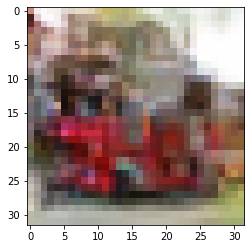

-> Epoch 497, Batch numero 1/78 -> Disc. loss on real images: 0.06677, Disc. loss on fake images: 0.43664, Generator loss: 4.03513
-> Epoch 497, Batch numero 2/78 -> Disc. loss on real images: 0.13196, Disc. loss on fake images: 0.26457, Generator loss: 4.80041
-> Epoch 497, Batch numero 3/78 -> Disc. loss on real images: 0.23125, Disc. loss on fake images: 0.12238, Generator loss: 4.05283
-> Epoch 497, Batch numero 4/78 -> Disc. loss on real images: 0.07505, Disc. loss on fake images: 0.15680, Generator loss: 4.06402
-> Epoch 497, Batch numero 5/78 -> Disc. loss on real images: 0.15164, Disc. loss on fake images: 0.03921, Generator loss: 3.91797
-> Epoch 497, Batch numero 6/78 -> Disc. loss on real images: 0.22415, Disc. loss on fake images: 0.36675, Generator loss: 4.05532
-> Epoch 497, Batch numero 7/78 -> Disc. loss on real images: 0.07078, Disc. loss on fake images: 0.20209, Generator loss: 4.32389
-> Epoch 497, Batch numero 8/78 -> Disc. loss on real images: 0.16246, Disc. loss o

-> Epoch 497, Batch numero 65/78 -> Disc. loss on real images: 0.15962, Disc. loss on fake images: 0.26423, Generator loss: 4.00596
-> Epoch 497, Batch numero 66/78 -> Disc. loss on real images: 0.16376, Disc. loss on fake images: 0.06269, Generator loss: 4.09087
-> Epoch 497, Batch numero 67/78 -> Disc. loss on real images: 0.19948, Disc. loss on fake images: 0.26934, Generator loss: 4.04257
-> Epoch 497, Batch numero 68/78 -> Disc. loss on real images: 0.10106, Disc. loss on fake images: 0.11869, Generator loss: 4.21607
-> Epoch 497, Batch numero 69/78 -> Disc. loss on real images: 0.10364, Disc. loss on fake images: 0.13693, Generator loss: 4.38033
-> Epoch 497, Batch numero 70/78 -> Disc. loss on real images: 0.20503, Disc. loss on fake images: 0.36069, Generator loss: 4.87505
-> Epoch 497, Batch numero 71/78 -> Disc. loss on real images: 0.12375, Disc. loss on fake images: 0.39277, Generator loss: 4.67476
-> Epoch 497, Batch numero 72/78 -> Disc. loss on real images: 0.22436, Disc

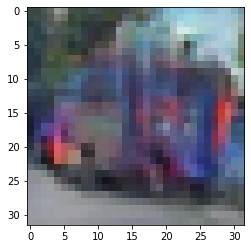

-> Epoch 498, Batch numero 1/78 -> Disc. loss on real images: 0.12533, Disc. loss on fake images: 0.18051, Generator loss: 4.32857
-> Epoch 498, Batch numero 2/78 -> Disc. loss on real images: 0.09316, Disc. loss on fake images: 0.05388, Generator loss: 4.41100
-> Epoch 498, Batch numero 3/78 -> Disc. loss on real images: 0.15748, Disc. loss on fake images: 0.14355, Generator loss: 4.46019
-> Epoch 498, Batch numero 4/78 -> Disc. loss on real images: 0.10253, Disc. loss on fake images: 0.16259, Generator loss: 4.16655
-> Epoch 498, Batch numero 5/78 -> Disc. loss on real images: 0.10255, Disc. loss on fake images: 0.11494, Generator loss: 4.34246
-> Epoch 498, Batch numero 6/78 -> Disc. loss on real images: 0.14550, Disc. loss on fake images: 0.17015, Generator loss: 3.89680
-> Epoch 498, Batch numero 7/78 -> Disc. loss on real images: 0.21644, Disc. loss on fake images: 0.18024, Generator loss: 4.27995
-> Epoch 498, Batch numero 8/78 -> Disc. loss on real images: 0.18067, Disc. loss o

-> Epoch 498, Batch numero 64/78 -> Disc. loss on real images: 0.13821, Disc. loss on fake images: 0.14330, Generator loss: 4.31657
-> Epoch 498, Batch numero 65/78 -> Disc. loss on real images: 0.10563, Disc. loss on fake images: 0.17437, Generator loss: 4.41670
-> Epoch 498, Batch numero 66/78 -> Disc. loss on real images: 0.10794, Disc. loss on fake images: 0.14545, Generator loss: 5.02559
-> Epoch 498, Batch numero 67/78 -> Disc. loss on real images: 0.12185, Disc. loss on fake images: 0.08085, Generator loss: 4.56662
-> Epoch 498, Batch numero 68/78 -> Disc. loss on real images: 0.13017, Disc. loss on fake images: 0.20883, Generator loss: 4.05817
-> Epoch 498, Batch numero 69/78 -> Disc. loss on real images: 0.11380, Disc. loss on fake images: 0.12127, Generator loss: 4.80180
-> Epoch 498, Batch numero 70/78 -> Disc. loss on real images: 0.19502, Disc. loss on fake images: 0.19051, Generator loss: 4.95939
-> Epoch 498, Batch numero 71/78 -> Disc. loss on real images: 0.44503, Disc

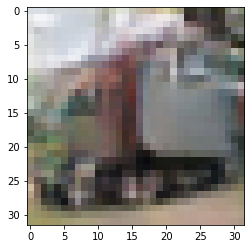

-> Epoch 499, Batch numero 1/78 -> Disc. loss on real images: 0.19212, Disc. loss on fake images: 0.19024, Generator loss: 4.38284
-> Epoch 499, Batch numero 2/78 -> Disc. loss on real images: 0.09850, Disc. loss on fake images: 0.20074, Generator loss: 4.74076
-> Epoch 499, Batch numero 3/78 -> Disc. loss on real images: 0.17350, Disc. loss on fake images: 0.11334, Generator loss: 4.48047
-> Epoch 499, Batch numero 4/78 -> Disc. loss on real images: 0.12998, Disc. loss on fake images: 0.18027, Generator loss: 4.24993
-> Epoch 499, Batch numero 5/78 -> Disc. loss on real images: 0.10005, Disc. loss on fake images: 0.13145, Generator loss: 4.71749
-> Epoch 499, Batch numero 6/78 -> Disc. loss on real images: 0.20437, Disc. loss on fake images: 0.11997, Generator loss: 4.08288
-> Epoch 499, Batch numero 7/78 -> Disc. loss on real images: 0.15980, Disc. loss on fake images: 0.24989, Generator loss: 4.39927
-> Epoch 499, Batch numero 8/78 -> Disc. loss on real images: 0.05275, Disc. loss o

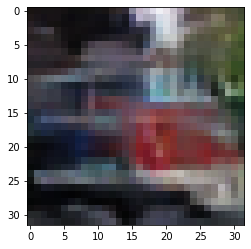

-> Epoch 500, Batch numero 1/78 -> Disc. loss on real images: 0.26505, Disc. loss on fake images: 0.34310, Generator loss: 4.43027
-> Epoch 500, Batch numero 2/78 -> Disc. loss on real images: 0.20481, Disc. loss on fake images: 0.29621, Generator loss: 4.32260
-> Epoch 500, Batch numero 3/78 -> Disc. loss on real images: 0.39576, Disc. loss on fake images: 0.22340, Generator loss: 4.34110
-> Epoch 500, Batch numero 4/78 -> Disc. loss on real images: 0.22749, Disc. loss on fake images: 0.06909, Generator loss: 3.41847
-> Epoch 500, Batch numero 5/78 -> Disc. loss on real images: 0.21083, Disc. loss on fake images: 0.33881, Generator loss: 3.82624
-> Epoch 500, Batch numero 6/78 -> Disc. loss on real images: 0.04538, Disc. loss on fake images: 0.14751, Generator loss: 3.98444
-> Epoch 500, Batch numero 7/78 -> Disc. loss on real images: 0.12326, Disc. loss on fake images: 0.09625, Generator loss: 4.32405
-> Epoch 500, Batch numero 8/78 -> Disc. loss on real images: 0.20497, Disc. loss o

-> Epoch 500, Batch numero 65/78 -> Disc. loss on real images: 0.22579, Disc. loss on fake images: 0.41701, Generator loss: 4.04724
-> Epoch 500, Batch numero 66/78 -> Disc. loss on real images: 0.12233, Disc. loss on fake images: 0.24308, Generator loss: 3.97981
-> Epoch 500, Batch numero 67/78 -> Disc. loss on real images: 0.21888, Disc. loss on fake images: 0.29201, Generator loss: 4.28780
-> Epoch 500, Batch numero 68/78 -> Disc. loss on real images: 0.31370, Disc. loss on fake images: 0.32383, Generator loss: 4.78274
-> Epoch 500, Batch numero 69/78 -> Disc. loss on real images: 0.34516, Disc. loss on fake images: 0.18168, Generator loss: 4.42610
-> Epoch 500, Batch numero 70/78 -> Disc. loss on real images: 0.10833, Disc. loss on fake images: 0.33934, Generator loss: 4.40652
-> Epoch 500, Batch numero 71/78 -> Disc. loss on real images: 0.17139, Disc. loss on fake images: 0.05025, Generator loss: 4.44452
-> Epoch 500, Batch numero 72/78 -> Disc. loss on real images: 0.19803, Disc

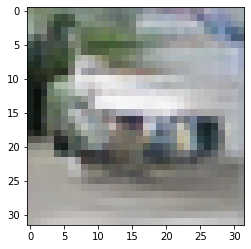

In [20]:
# Carregando os dados de imagens reais
#dataset = load_real_samples(train_batch)
dataset = load_real_samples()


# Treinando os modelos compilados
train(generator_model, discriminator_model, gan_model, dataset, latent_dim)


# Salvando o modelo treinado
generator_model.save('generator_model_cifar10_trucks.h5')

# Parte 4: Usando o modelo gerador para gerar as imagens
Vamos visualizar as imagens do modelo treinado.

In [21]:
# Plotando as imagens geradas
def create_plot(examples, n):
    # plot images
    for i in range(n * n):
        # Definindo os subplots
        plt.subplot(n, n, 1 + i)
        
        # Removendo os eixos
        plt.axis('off')
        
        # Adicionando os graficos ao plot
        plt.imshow(examples[i, :, :])
        
    # Mostrando o plot final
    plt.show()

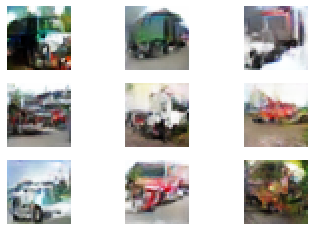

In [22]:
# Carregando o modelo, se necessário
model = load_model('generator_model_cifar10_trucks.h5')

# Gerando os pontos latentes
latent_points = generate_latent_points(100, 100)

# Gerando as imagens
imgs = model.predict(latent_points)

# Trazendo os valores de volta para a escala (0, 1), pois eles estão em [-1, 1]
imgs = (imgs + 1) / 2.0

# Plotando 9 imagens (3 linhas x 3 colunas)
create_plot(imgs, 3)

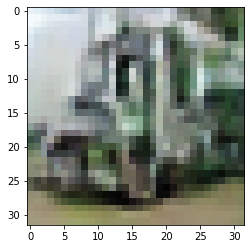

In [23]:
# Plotando uma imagem única gerada pelo modelo.
# O exemplo abaixo gera uma única imagem usando um vetor com todos os valores em 0.75

# Criando o vetor de pontos aleatórios no espaço latente
vector = generate_latent_points(100, 100)

# Gerando a imagem baseada nesses pontos
generated_img = model.predict(vector)

# Trazendo os valores da img. gerada volta para a escala (0, 1), pois eles estão em [-1, 1]
generated_img = (generated_img + 1) / 2.0

# Plotando a imagem
plt.imshow(generated_img[0, :, :])
plt.show()